<a href="https://colab.research.google.com/github/GiX7000/action-recognition-with-CNNs/blob/main/full_experimentation_on_ResActionsImages_variants_and_transfer_learning_with_CNNs.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Extensive CNN Experiments for Action Recognition on ResActionsImages Variants and Transfer Learning.

## Introduction.

In this exercise, we reconstruct the method proposed in a conference [paper](http://www.image.ece.ntua.gr/papers/968.pdf) for recognizing human actions using pseudo-colored images. We start by implementing a simple CNN model for the center camera dataset (M) of the [PKU Dataset](https://drive.google.com/drive/folders/1vTxhG0qvGkB5p-WpuHkajGe8ZFDHloDh). Based on the initial results, we explore various techniques to enhance performance, including L2 regularization, dropout, layer modifications, different hidden layer sizes and  activation functions, learning rates and optimizers, cross-validation, and data augmentation. We test the model on multiple datasets: M/M (train on M, test on M), R/R, L/L, M,R/L, M,L/R, L,R/M, and a [smaller dataset](https://drive.google.com/drive/folders/1-WTEFD98f9sASWrnRkhYjaspdN1hg5n9) where we apply transfer learning. We evaluate the best-performing models and present their results in the final report.

We extend the workflow of ```full_experimentation_on_ResActionsImagesM_with_CNNs.ipynb``` to additional datasets. We also make use of ```create_src_dir.ipynb``` to generate all necessary helper modules and functions.

In [ ]:
#  install required packages
!pip install torchinfo torchmetrics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 927.3/927.3 kB 17.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 5.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 118.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 93.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 63.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 10.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 40.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 18.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 94.8 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninst

In [ ]:
# useful imports
import torch
import torch.nn as nn
from torch import optim
import torchvision
from torchvision.datasets import ImageFolder
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, Subset
import torchvision.models as models

import torchinfo
from torchinfo import summary

import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import itertools
import random
import csv
import time
from tqdm.auto import tqdm

from pathlib import Path
import shutil
import os

We start by enabling GPU acceleration efficient computation.

In [ ]:
# check Pytorch version
print(f"Pytorch version: {torch.__version__}")

# setup device agnostic code
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Device: {device}")

# check cuda version
print(f"Cuda version: {torch.version.cuda}\n")

# check the gpu, if available
!nvidia-smi

Pytorch version: 2.5.1+cu124
Device: cuda
Cuda version: 12.4

Mon Feb 24 05:03:49 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA A100-SXM4-40GB          Off |   00000000:00:04.0 Off |                    0 |
| N/A   34C    P0             43W /  400W |       5MiB /  40960MiB |      0%      Default |
|                                         |                        |          

We will use the **NVIDIA A100-SXM4-40GB GPU**, but since Colab shares GPUs among users, there is a chance of receiving an overloaded or faulty instance, which could lead to crashes. Additionally, while the A100 enables fast training, Jupyter Notebook may become slow and unresponsive when scrolling or interacting with the UI due to high GPU usage or heavy browser memory use.

The project's structure is presented in the cell below.

```
project/  
├── data/
│   ├── ResActionsImagesM/
│   ├── ResActionImagesR/
│   │   ├── train/
│   |   |   ├── eat_meal/snack/
│   │   |   |   ├── image01.png
│   │   |   |   ├── ...
│   |   |   ├── falling/
│   │   |   |   ├── image01.png
│   │   |   |   ├── ...
|   |   ├── val/
│   |   |   ├── eat_meal/snack/
│   │   |   |   ├── image01.png
│   │   |   |   ├── ...
│   |   |   ├── falling/
│   │   |   |   ├── image01.png
│   │   |   |   ├── ...
|   |   ├── test/
│   |   |   ├── eat_meal/snack/
│   │   |   |   ├── image01.png
│   │   |   |   ├── ...
│   |   |   ├── falling/
│   │   |   |   ├── image01.png
│   │   |   |   ├── ...
│   |   ├── ResActionImagesL/
│   |   ├── ResActionImagesMR/
│   |   ├── ResActionImagesML/
│   |   ├── ResActionImagesRL/
│   |   ├── small_dataset/
│   |   ├── test_ResActionImagesM/
│   |   ├── test_ResActionImagesR/
│   |   ├── test_ResActionImagesL/
├── models/
│   ├── model_1.pth
│   ├── model_2.pth
│   ├── ...
├── results/
│   ├── test_results_model_1.pth
│   ├── test_results_model_2.pth
│   ├── ...
├── src/
│   ├── data_utils.py
│   ├── models.py
│   ├── engine.py
│   ├── experiments.py
│   ├── utils.py
```

Each dataset contains images captured from different viewpoints/cameras (M, R, L, MR, ML, RL) and a small dataset. All will be organized into train, val, and test subdirectories of ```data/``` directory. To conduct the experiments, we will utilize the ```src/``` directory, which includes the following modules: models.py for CNN architectures, engine.py for training and evaluation, experiments.py for experiment management, utils.py and data_utils.py for data handling. The ```models/``` directory is used to store the trained models, while their corresponding results are saved in the ```results/``` directory.

The project could be structured differently (and be much shorter), such as by creating separate Python files for each dataset to enhance organization and modularity. However, we chose this structure to maintain the flexibility of making changes on the fly.

In [ ]:
# define our project's main paths
project_path = Path('/content/project')
project_data_path = project_path / 'data'
project_models_path = project_path / 'models' # place to save models
project_results_path = project_path / 'results' # place to save results

# create main dirs
os.makedirs(project_path, exist_ok=True)
os.makedirs(project_data_path, exist_ok=True)
os.makedirs(project_models_path, exist_ok=True)
os.makedirs(project_results_path, exist_ok=True)

## Load, explore and preprocess all datasets.

### Load the provided datasets and all useful functions from the ```src``` directory.

We load, explore, and preprocess all given datasets.

In [ ]:
# connect to google drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# bring the data zip file in the current directory
!cp '/content/drive/MyDrive/Datasets-20250123T125356Z-001.zip' .

# unzip it
!unzip -q Datasets-20250123T125356Z-001.zip

# remove zip file
!rm Datasets-20250123T125356Z-001.zip

# check if the given Datasets are in the current dir
!ls

Datasets  drive  project  sample_data


All the critical utility functions for our project, are located in ```src``` directory, which includes:

*   ```config.py```: defines key global variables such as **num_channels**, **init_hidden_units**, **init_activation_functions**, and others, ensuring consistency across the project.
*   ```data_utils.py```: implements data preprocessing and creates datloaders.
*   ```engine.py```: implements the core training and evaluataion loops.
*   ```experiments.py```: handles experiments implementation with custom configuration.
*   ```models.py```: defines the model architectures.
*   ```utils.py```: provides general utility functions.


In [ ]:
# load src zip file from drive to the project's dir
!cp -r '/content/drive/MyDrive/src.zip' '/content/project'

# unzip it
!unzip -q /content/project/src.zip -d /content/project

# remove zip file
!rm /content/project/src.zip

# check if the given src is in the project dir
print(os.listdir(project_path))

# also check what it has inside
print(os.listdir(project_path / 'src'))

['data', 'src', 'models', 'results']
['utils.py', 'experiments.py', 'models.py', 'config.py', 'data_utils.py', 'engine.py']


In [ ]:
# import all additional functions and global variables
from project.src.config import batch_size, num_channels, num_classes, num_classes_small, init_hidden_units, init_dropout_probs, init_activation_functions
from project.src.data_utils import *
from project.src.models import *
from project.src.engine import *
from project.src.experiments import *
from project.src.utils import *

Module data_utils imported successfully!
Module models imported successfully!
Module engine imported successfully!
Module experiments imported successfully!
Module utils imported successfully!


### Explore the datasets and their respective classes, and keep only the relevant data required for our task.

A thorough and detailed exploration is conducted in the ```full_experimentation_on_ResActionsImagesM_with_CNNs.ipynb```. We retain some essential components and apply the same workflow across all datasets. Let's begin by examining the number of images in each dataset of the PKU Datasets (expected to be the same) and comparing them to the PKU small dataset.

In [ ]:
# define the paths
data_path = Path('/content/Datasets/PKU')
dataM_path = data_path / 'ResActionsImagesM'
dataL_path = data_path / 'ResActionsImagesL'
dataR_path = data_path / 'ResActionsImagesR'
data_small_all_path = '/content/Datasets/small_dataset/small_dataset_all_files'

In [ ]:
# how many images each dataset has
print(f"Number of images in the center camera dataset: {len(os.listdir(dataM_path))}")
print(f"Number of images in the left camera dataset: {len(os.listdir(dataL_path))}")
print(f"Number of images in the right camera dataset: {len(os.listdir(dataR_path))}")
print(f"Number of images in the small dataset: {len(os.listdir(data_small_all_path))}")

Number of images in the center camera dataset: 7152
Number of images in the left camera dataset: 7151
Number of images in the right camera dataset: 7152
Number of images in the small dataset: 300


Additionally, there is a file named ```pku_actions_id.xlsx``` that lists all the possible labels in the dataset. Let's determine how many labels are included and only keep the ones we need.

In [ ]:
# explore the .xlsx file
df = pd.read_excel('/content/Datasets/pku_actions_id.xlsx')
full_label_dict = {}
for i in range(len(df)):
  full_label_dict[df.iloc[i, 0]] = df.iloc[i, 1] # 1st column label, 2nd column action

print(f"Number of labels of the entire dataset: {len(full_label_dict)}")
print(f"Labels: {full_label_dict}")

Number of labels of the entire dataset: 51
Labels: {1: 'bow', 2: 'brushing hair', 3: 'brushing teeth', 4: 'check time (from watch)', 5: 'cheer up', 6: 'clapping', 7: 'cross hands in front (say stop)', 8: 'drink water', 9: 'drop', 10: 'eat meal/snack', 11: 'falling', 12: 'giving something to other person', 13: 'hand waving', 14: 'handshaking', 15: 'hopping (one foot jumping)', 16: 'hugging other person', 17: 'jump up', 18: 'kicking other person', 19: 'kicking something', 20: 'make a phone call/answer phone', 21: 'pat on back of other person', 22: 'pickup', 23: 'playing with phone/tablet', 24: 'point finger at the other person', 25: 'pointing to something with finger', 26: 'punching/slapping other person', 27: 'pushing other person', 28: 'put on a hat/cap', 29: 'put something inside pocket', 30: 'reading', 31: 'rub two hands together', 32: 'salute', 33: 'sitting down', 34: 'standing up', 35: 'take off a hat/cap', 36: 'take off glasses', 37: 'take off jacket', 38: 'take out something from

We observe that the dataset contains 51 unique labels. However, in alignment with the given instructions, we will focus on 11 specific labels: ```'eat meal/snack', 'falling', 'handshaking', 'hugging other person', 'make a phone call/answer phone', 'playing with phone/tablet', 'reading', 'sitting down', 'standing up', 'typing on a keyboard', 'wear jacket'``` for experimenting in ResActionImagesM, ResActionsImagesR, ResActionsImagesL (and in combined ResActionsImagesMR, ResActionsImagesML and ResActionsImagesRL). To proceed, we need to retrieve their corresponding IDs to filter the relevant images from the dataset.

In [ ]:
# list of the 11 selected classes for big PKU datasets
selected_classes = ['eat meal/snack', 'falling', 'handshaking', 'hugging other person', 'make a phone call/answer phone', 'playing with phone/tablet', 'reading', 'sitting down', 'standing up', 'typing on a keyboard', 'wear jacket']

# create our label dictionary
label_dict = {}
for key, value in full_label_dict.items():
  if value in selected_classes:
    label_dict[key] = value

# print our label dictionary
print(f"Number of selected labels: {len(label_dict)}")
print(f"Selected Labels: {label_dict}")

Number of selected labels: 11
Selected Labels: {10: 'eat meal/snack', 11: 'falling', 14: 'handshaking', 16: 'hugging other person', 20: 'make a phone call/answer phone', 23: 'playing with phone/tablet', 30: 'reading', 33: 'sitting down', 34: 'standing up', 46: 'typing on a keyboard', 48: 'wear jacket'}


Let's also identify all the classes in the small dataset.

In [ ]:
# # find all classes of small dataset
#small_selected_classes = ['clapping', 'handraise', 'swipeupright', 'wipeupleft', 'swiperight', 'swipedownright', 'handscircle'] # given selected classes

# create small dataset's label list and also count occuerences of each class
small_label_list = []
count_class_labels = {}
for filename in os.listdir(data_small_all_path):
  if filename.endswith('.png'):

    # retrieve class from image's name# retrieve class from image's name
    class_name = filename.split('.')[0][:-3]

    # if unique class, add it to list
    if class_name not in small_label_list:
      small_label_list.append(class_name)

    # count class occurences
    if class_name in count_class_labels:
      count_class_labels[class_name] += 1
    else:
      count_class_labels[class_name] = 1

# print our small dataset's label list
print(f"Number of labels of small dataset: {len(small_label_list)}")
print(f"Labels of small dataset: {small_label_list}")
print(f"Class occurences of small dataset: {count_class_labels}")

Number of labels of small dataset: 15
Labels of small dataset: ['swipedownright', 'swipedownleft', 'handscircle', 'swipediagonal', 'swiperight', 'hands_squeeze', 'swipeupright', 'waveright', 'zoomin', 'zoomout', 'handraise', 'swipeleft', 'swipeupleft', 'wristrotation', 'clapping']
Class occurences of small dataset: {'swipedownright': 20, 'swipedownleft': 20, 'handscircle': 20, 'swipediagonal': 20, 'swiperight': 20, 'hands_squeeze': 20, 'swipeupright': 20, 'waveright': 20, 'zoomin': 20, 'zoomout': 20, 'handraise': 20, 'swipeleft': 20, 'swipeupleft': 20, 'wristrotation': 20, 'clapping': 20}


For the small given dataset, the labels include: ```'waveright', 'swipedownright', 'swipeleft', 'swipeupright', 'wristrotation', 'swipeupleft', 'clapping', 'zoomin', 'swiperight', 'hands_squeeze', 'handscircle', 'swipediagonal', 'swipedownleft', 'zoomout', 'handraise'```. The small dataset is well-balanced, with each class containing 20 images.

For the 3 big datasets, we aim to retain only the images with IDs that correspond to our ```label_dict``` from the datasets of the center (M), left (L), and right (R) cameras.

In [ ]:
# all images to appropriate lists
all_M_images = []
all_L_images = []
all_R_images = []
all_small_images = []

for root, _, files in os.walk(data_path):
  if 'ResActionsImagesM' in root:
    all_M_images.extend([os.path.join(root, file) for file in files if file.endswith('.png')]) # save all M images-files in a list
  elif 'ResActionsImagesL' in root:
    all_L_images.extend([os.path.join(root, file) for file in files if file.endswith('.png')]) # save all L images-files in a list
  elif 'ResActionsImagesR' in root:
    all_R_images.extend([os.path.join(root, file) for file in files if file.endswith('.png')]) # save all R images-files in a list

for root, _, files in os.walk(data_small_all_path):
  all_small_images.extend([os.path.join(root, file) for file in files if file.endswith('.png')]) # save all mall dataset images-files in a list

print(f"All images file paths of M are like these: {all_M_images[:3]}")  # want to check their type and their id (label). id at the end of image name
print(f"All images file paths of L are like these: {all_L_images[:3]}")
print(f"All images file paths of R are like these: {all_R_images[:3]}")
print(f"All images file paths of small dataset are like these: {all_small_images[:3]}") # label at the beginning of the image name

All images file paths of M are like these: ['/content/Datasets/PKU/ResActionsImagesM/0192_7008_action_3.csv.png', '/content/Datasets/PKU/ResActionsImagesM/0201_1097_action_34.csv.png', '/content/Datasets/PKU/ResActionsImagesM/0169_1934_action_8.csv.png']
All images file paths of L are like these: ['/content/Datasets/PKU/ResActionsImagesL/0106_3512_action_12.csv.png', '/content/Datasets/PKU/ResActionsImagesL/0057_5563_action_34.csv.png', '/content/Datasets/PKU/ResActionsImagesL/0065_4756_action_12.csv.png']
All images file paths of R are like these: ['/content/Datasets/PKU/ResActionsImagesR/0228_3622_action_30.csv.png', '/content/Datasets/PKU/ResActionsImagesR/0293_6520_action_43.csv.png', '/content/Datasets/PKU/ResActionsImagesR/0082_3458_action_44.csv.png']
All images file paths of small dataset are like these: ['/content/Datasets/small_dataset/small_dataset_all_files/swipedownright007.csv.png', '/content/Datasets/small_dataset/small_dataset_all_files/swipedownleft018.csv.png', '/cont

For the three large datasets, the class label appears at the end of the first part of the image filename, whereas for the small dataset, the class name is positioned at the beginning of the filename.

Since all the labels in the big datasets are two digits long, we extract them from the image filenames using the ```select_images_by_labels``` function.

In [ ]:
# assign images to list images for the big datasets based on our label_dict
all_M_images = select_images_by_labels(all_M_images, label_dict)
all_L_images = select_images_by_labels(all_L_images, label_dict)
all_R_images = select_images_by_labels(all_R_images, label_dict)
print(f"Number of images in ResActionImagesM after filtering: {len(all_M_images)}")
print(f"Number of images in ResActionsImagesL after filtering: {len(all_L_images)}")
print(f"Number of images in ResActionsImagesR after filtering: {len(all_R_images)}")

Number of images in ResActionImagesM after filtering: 1502
Number of images in ResActionsImagesL after filtering: 1502
Number of images in ResActionsImagesR after filtering: 1502


We filtered the dataset down from 7.152 images to 1.502, retaining only those with labels relevant to our task for the 3 big datasets. Additionally, we verify that all images are in ```.png``` format.

In [ ]:
# check if all images of M, R, L and small dataset are of the same type (png)
for images in [all_M_images, all_L_images, all_R_images, all_small_images]:
  check_image_type(images, '.png')

All images in the ['/content/Datasets/PKU/ResActionsImagesM/0201_1097_action_34.csv.png', '/content/Datasets/PKU/ResActionsImagesM/0114_6938_action_48.csv.png', '/content/Datasets/PKU/ResActionsImagesM/0357_3799_action_34.csv.png', '/content/Datasets/PKU/ResActionsImagesM/0296_2481_action_48.csv.png', '/content/Datasets/PKU/ResActionsImagesM/0011_3841_action_33.csv.png', '/content/Datasets/PKU/ResActionsImagesM/0270_896_action_10.csv.png', '/content/Datasets/PKU/ResActionsImagesM/0293_4709_action_20.csv.png', '/content/Datasets/PKU/ResActionsImagesM/0130_5452_action_20.csv.png', '/content/Datasets/PKU/ResActionsImagesM/0230_6003_action_11.csv.png', '/content/Datasets/PKU/ResActionsImagesM/0067_5776_action_46.csv.png', '/content/Datasets/PKU/ResActionsImagesM/0121_2026_action_34.csv.png', '/content/Datasets/PKU/ResActionsImagesM/0231_2329_action_48.csv.png', '/content/Datasets/PKU/ResActionsImagesM/0336_1355_action_48.csv.png', '/content/Datasets/PKU/ResActionsImagesM/0171_4667_action_4

For the cross-view experiments, we construct additional combined datasets: (M, R), (M, L), and (R, L). These datasets will be used for training, while the testing will be performed on the respective unseen datasets: L, R, and M.

In [ ]:
# assign images to list images for the big datasets based on our label_dict
all_MR_images = all_M_images + all_R_images
all_ML_images = all_M_images + all_L_images
all_RL_images = all_R_images + all_L_images
print(f"Number of images in ResActionImagesMR after filtering: {len(all_MR_images)}")
print(f"Number of images in ResActionsImagesML after filtering: {len(all_ML_images)}")
print(f"Number of images in ResActionsImagesRL after filtering: {len(all_RL_images)}")

Number of images in ResActionImagesMR after filtering: 3004
Number of images in ResActionsImagesML after filtering: 3004
Number of images in ResActionsImagesRL after filtering: 3004


### Plot some images from each class for every dataset.

Let's now plot 5 samples per class from each of the big datasets (M, R, L) to visually point out any differences between them.

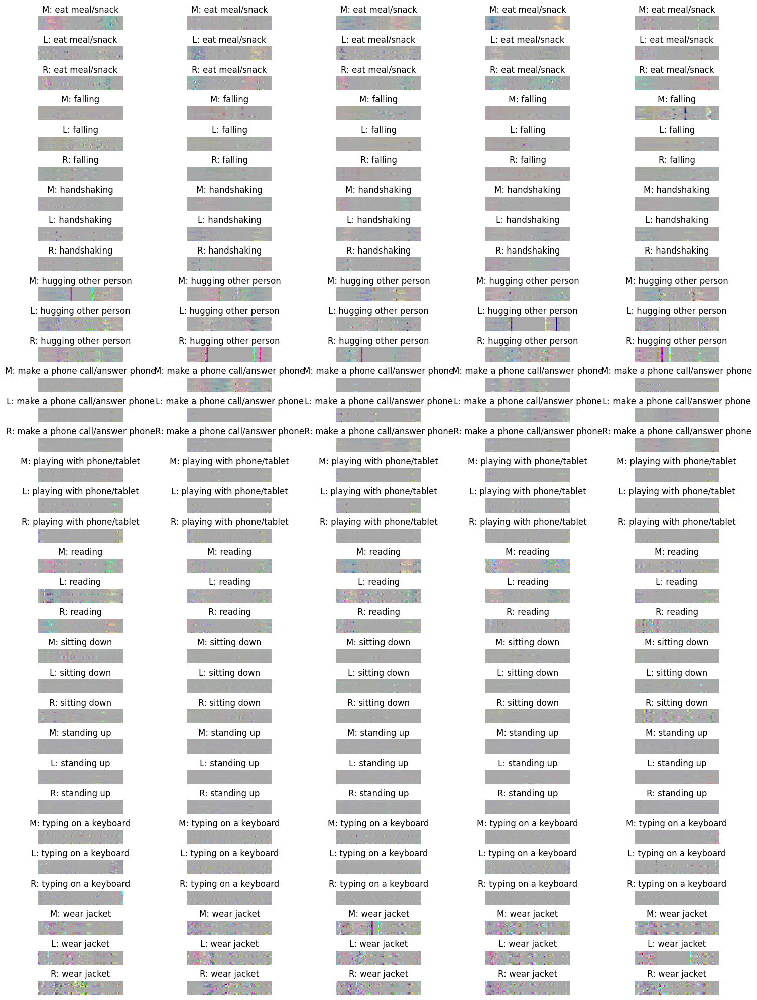

In [ ]:
# plot some images from each dataset of M, R, L
plot_images_per_class_big(all_M_images, all_L_images, all_R_images, label_dict)

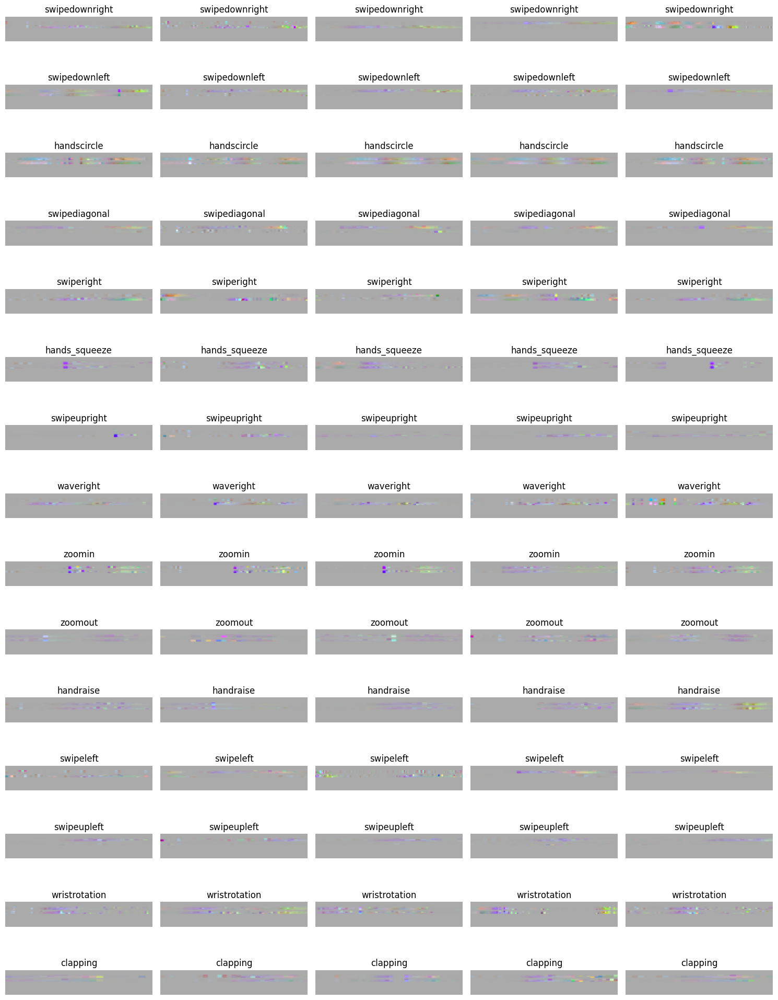

In [ ]:
# plot some images from small dataset
plot_images_per_class_small(all_small_images, small_label_list)

### Calculate class distributions and class weights for each dataset.

To address any potential class imbalaance issue, we calculate class ditributions and class weights for each dataset.

Let's start by examining the class distribution of each dataset.

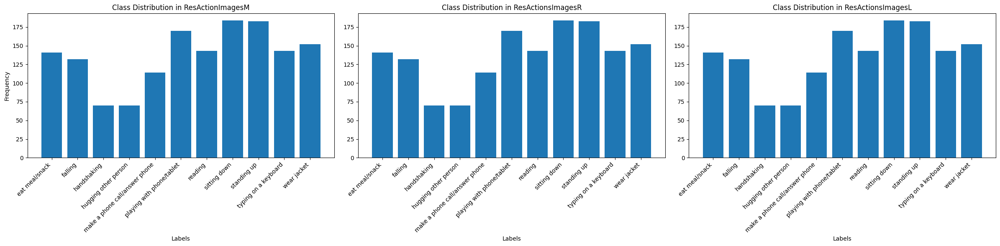

In [ ]:
# extract labels for each dataset
labels_M = extract_labels(all_M_images)
labels_L = extract_labels(all_L_images)
labels_R = extract_labels(all_R_images)

# count class occurences for each dataset
count_labels_M = count_class_occurrences(labels_M)
count_labels_L = count_class_occurrences(labels_L)
count_labels_R = count_class_occurrences(labels_R)

# do some sorting for a nicer plot

# ensure labels are sorted as integers
sorted_labels = sorted(label_dict.keys())

# prepare sorted counts for all datasets
sorted_counts = {
    'M': [count_labels_M[str(label)] if str(label) in count_labels_M else 0 for label in sorted_labels],
    'L': [count_labels_L[str(label)] if str(label) in count_labels_L else 0 for label in sorted_labels],
    'R': [count_labels_R[str(label)] if str(label) in count_labels_R else 0 for label in sorted_labels]
}

# get class names in the same order as sorted labels
label_names = [label_dict[label] for label in sorted_labels]

# plot class distribution for all 3 datasets
plt.figure(figsize=(24, 6))

# ResActionsImagesM
plt.subplot(1, 3, 1)
plt.bar(label_names, sorted_counts['M'])
plt.title('Class Distribution in ResActionImagesM')
plt.xlabel('Labels')
plt.xticks(rotation=45, ha='right')
plt.ylabel('Frequency')

# ResActionsImagesR
plt.subplot(1, 3, 2)
plt.bar(label_names, sorted_counts['R'])
plt.title('Class Distribution in ResActionsImagesR')
plt.xlabel('Labels')
plt.xticks(rotation=45, ha='right')

# ResActionsImagesL
plt.subplot(1, 3, 3)
plt.bar(label_names, sorted_counts['L'])
plt.title('Class Distribution in ResActionsImagesL')
plt.xlabel('Labels')
plt.xticks(rotation=45, ha='right')

plt.tight_layout()
plt.show()

In [ ]:
# class distributions in numbers
M_counts, L_counts, R_counts = [], [], [] # save the counts for each dataset
print("Class Distribution in ResActionImagesM:")
for label, count in zip(label_names, sorted_counts['M']):
  print(f"{label}: {count}")
  M_counts.append(count)

print("\nClass Distribution in ResActionsImagesR:")
for label, count in zip(label_names, sorted_counts['R']):
  print(f"{label}: {count}")
  R_counts.append(count)

print("\nClass Distribution in ResActionsImagesL:")
for label, count in zip(label_names, sorted_counts['L']):
  print(f"{label}: {count}")
  L_counts.append(count)

Class Distribution in ResActionImagesM:
eat meal/snack: 141
falling: 132
handshaking: 70
hugging other person: 70
make a phone call/answer phone: 114
playing with phone/tablet: 170
reading: 143
sitting down: 184
standing up: 183
typing on a keyboard: 143
wear jacket: 152

Class Distribution in ResActionsImagesR:
eat meal/snack: 141
falling: 132
handshaking: 70
hugging other person: 70
make a phone call/answer phone: 114
playing with phone/tablet: 170
reading: 143
sitting down: 184
standing up: 183
typing on a keyboard: 143
wear jacket: 152

Class Distribution in ResActionsImagesL:
eat meal/snack: 141
falling: 132
handshaking: 70
hugging other person: 70
make a phone call/answer phone: 114
playing with phone/tablet: 170
reading: 143
sitting down: 184
standing up: 183
typing on a keyboard: 143
wear jacket: 152


As we can see, all three datasets share the same class distribution, which is expected given the differences in camera perspectives.

For the combined datasets, the class distributions will remain unchanged after merging. Let's quickly confirm this below.

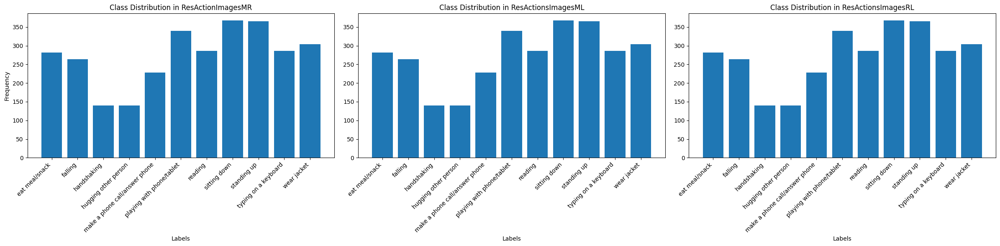

In [ ]:
# extract labels for each combined dataset
labels_MR = extract_labels(all_MR_images)
labels_ML = extract_labels(all_ML_images)
labels_RL = extract_labels(all_RL_images)

# count class occurences for each combined dataset
count_labels_MR = count_class_occurrences(labels_MR)
count_labels_ML = count_class_occurrences(labels_ML)
count_labels_RL = count_class_occurrences(labels_RL)

# prepare sorted counts for all combined datasets
sorted_counts = {
    'MR': [count_labels_MR[str(label)] if str(label) in count_labels_MR else 0 for label in sorted_labels],
    'ML': [count_labels_ML[str(label)] if str(label) in count_labels_ML else 0 for label in sorted_labels],
    'RL': [count_labels_RL[str(label)] if str(label) in count_labels_RL else 0 for label in sorted_labels]
}

# plot class distribution for all 3 new combined datasets
plt.figure(figsize=(24, 6))

# ResActionsImagesMR
plt.subplot(1, 3, 1)
plt.bar(label_names, sorted_counts['MR'])
plt.title('Class Distribution in ResActionImagesMR')
plt.xlabel('Labels')
plt.xticks(rotation=45, ha='right')
plt.ylabel('Frequency')

# ResActionsImagesML
plt.subplot(1, 3, 2)
plt.bar(label_names, sorted_counts['ML'])
plt.title('Class Distribution in ResActionsImagesML')
plt.xlabel('Labels')
plt.xticks(rotation=45, ha='right')

# ResActionsImagesRL
plt.subplot(1, 3, 3)
plt.bar(label_names, sorted_counts['RL'])
plt.title('Class Distribution in ResActionsImagesRL')
plt.xlabel('Labels')
plt.xticks(rotation=45, ha='right')

plt.tight_layout()
plt.show()

In [ ]:
# class distributions in numbers for the combined datasets (same as previously, but doubled!)
MR_counts, ML_counts, RL_counts = [], [], [] # save the counts for each dataset
print("Class Distribution in ResActionImagesMR:")
for label, count in zip(label_names, sorted_counts['MR']):
  print(f"{label}: {count}")
  MR_counts.append(count)

print("\nClass Distribution in ResActionsImagesML:")
for label, count in zip(label_names, sorted_counts['ML']):
  print(f"{label}: {count}")
  ML_counts.append(count)

print("\nClass Distribution in ResActionsImagesRL:")
for label, count in zip(label_names, sorted_counts['RL']):
  print(f"{label}: {count}")
  RL_counts.append(count)

Class Distribution in ResActionImagesMR:
eat meal/snack: 282
falling: 264
handshaking: 140
hugging other person: 140
make a phone call/answer phone: 228
playing with phone/tablet: 340
reading: 286
sitting down: 368
standing up: 366
typing on a keyboard: 286
wear jacket: 304

Class Distribution in ResActionsImagesML:
eat meal/snack: 282
falling: 264
handshaking: 140
hugging other person: 140
make a phone call/answer phone: 228
playing with phone/tablet: 340
reading: 286
sitting down: 368
standing up: 366
typing on a keyboard: 286
wear jacket: 304

Class Distribution in ResActionsImagesRL:
eat meal/snack: 282
falling: 264
handshaking: 140
hugging other person: 140
make a phone call/answer phone: 228
playing with phone/tablet: 340
reading: 286
sitting down: 368
standing up: 366
typing on a keyboard: 286
wear jacket: 304


Now, let's calculate the ```class weights``` that may be used to balance the data across all the datasets during our basic experimentation.

In [ ]:
# calculate the lists of class_weights for each dataset and convert them to tensors
class_weights_M = [1 / count for count in M_counts] # each element represents the gravity of each class in the dataset (those which are more, less gravity and vice versa!)
class_weights_M = torch.tensor(class_weights_M).to(device)
print(f"Class weights for the dataset of center camera (M):\n {class_weights_M}\n")

class_weights_L = [1 / count for count in L_counts]
class_weights_L = torch.tensor(class_weights_L).to(device)
print(f"Class weights for the dataset of left camera (L):\n {class_weights_L}\n")

class_weights_R = [1 / count for count in R_counts]
class_weights_R = torch.tensor(class_weights_R).to(device)
print(f"Class weights for the dataset of right camera (R):\n {class_weights_R}\n")

class_weights_MR = [1 / count for count in MR_counts]
class_weights_MR = torch.tensor(class_weights_MR).to(device)
print(f"Class weights for the dataset of center and right cameras (MR):\n {class_weights_MR}\n")

class_weights_ML = [1 / count for count in ML_counts]
class_weights_ML = torch.tensor(class_weights_ML).to(device)
print(f"Class weights for the dataset of center and left cameras (MR):\n {class_weights_ML}\n")

class_weights_RL = [1 / count for count in RL_counts]
class_weights_RL = torch.tensor(class_weights_RL).to(device)
print(f"Class weights for the dataset of right and left cameras (RL):\n {class_weights_MR}")

Class weights for the dataset of center camera (M):
 tensor([0.0071, 0.0076, 0.0143, 0.0143, 0.0088, 0.0059, 0.0070, 0.0054, 0.0055,
        0.0070, 0.0066], device='cuda:0')

Class weights for the dataset of left camera (L):
 tensor([0.0071, 0.0076, 0.0143, 0.0143, 0.0088, 0.0059, 0.0070, 0.0054, 0.0055,
        0.0070, 0.0066], device='cuda:0')

Class weights for the dataset of right camera (R):
 tensor([0.0071, 0.0076, 0.0143, 0.0143, 0.0088, 0.0059, 0.0070, 0.0054, 0.0055,
        0.0070, 0.0066], device='cuda:0')

Class weights for the dataset of center and right cameras (MR):
 tensor([0.0035, 0.0038, 0.0071, 0.0071, 0.0044, 0.0029, 0.0035, 0.0027, 0.0027,
        0.0035, 0.0033], device='cuda:0')

Class weights for the dataset of center and left cameras (MR):
 tensor([0.0035, 0.0038, 0.0071, 0.0071, 0.0044, 0.0029, 0.0035, 0.0027, 0.0027,
        0.0035, 0.0033], device='cuda:0')

Class weights for the dataset of right and left cameras (RL):
 tensor([0.0035, 0.0038, 0.0071, 0.007

Another processing step is to modify the labels ```['eat meal/snack', 'make a phone call/answer phone', 'playing with phone/tablet']``` to ```['eat meal snack', 'make a phone call answer phone', 'playing with phone tablet']``` to avoid issues with directory creation and file paths later when organizing our datasets.

In [ ]:
# define replacements for specific labels
replacements = {
    'eat meal/snack': 'eat meal snack',
    'make a phone call/answer phone': 'make a phone call answer phone',
    'playing with phone/tablet': 'playing with phone tablet'
}

# update the labels in label_dict
for key, value in label_dict.items():
    if value in replacements:
        label_dict[key] = replacements[value]  # use the modified label
    else:
        label_dict[key] = value  # keep the original label if no replacement is needed

# print updated label_dict to verify changes
print("Updated label_dict:")
print(label_dict)

Updated label_dict:
{10: 'eat meal snack', 11: 'falling', 14: 'handshaking', 16: 'hugging other person', 20: 'make a phone call answer phone', 23: 'playing with phone tablet', 30: 'reading', 33: 'sitting down', 34: 'standing up', 46: 'typing on a keyboard', 48: 'wear jacket'}


### Split the datasets and create data transformations.

Next, we organize the ```data/``` directory by creating separate subdirectories for training, validation, and testing (as illustrated in the image above). Each of these subdirectories is further divided into class specific folders, ensuring that images are correctly categorized. Initially, for the datasets M, R, L, we allocate 80% of the data for training, 10% for validation, and 10% for testing, maintaining a balanced class distribution across the splits with the possibility of increasing the validation set to 15%, if needed.

For the combined datasets (MR, ML, RL), we maintain the same 8:1 train-validation ratio used for individual datasets. This results in an 89% training set (equivalent to 8/9 of the combined dataset) and an 11% validation set (equivalent to 1/9 of the combined dataset), while the third dataset (1500 images) serves as the test set.

We generate all necessary paths, set up the directory structure, and copy the corresponding images to their designated locations.

In [ ]:
# define our project's paths
M_dataset_path = project_data_path / 'ResActionsImagesM'
L_dataset_path = project_data_path / 'ResActionsImagesL'
R_dataset_path = project_data_path / 'ResActionsImagesR'
small_dataset_path = project_data_path / 'small_dataset'
MR_dataset_path = project_data_path / 'ResActionsImagesMR'
ML_dataset_path = project_data_path / 'ResActionsImagesML'
RL_dataset_path = project_data_path / 'ResActionsImagesRL'
test_M_dataset_path = project_data_path / 'test_ResActionsImagesM'
test_L_dataset_path = project_data_path / 'test_ResActionsImagesL'
test_R_dataset_path = project_data_path / 'test_ResActionsImagesR'

datasets_paths = [M_dataset_path, L_dataset_path, R_dataset_path, small_dataset_path, MR_dataset_path, ML_dataset_path, RL_dataset_path, test_M_dataset_path, test_L_dataset_path, test_R_dataset_path]

In [ ]:
# define splits
data_splits = ['train', 'validation', 'test']
data_ratios = [0.80, 0.10, 0.10] # 80% for training, 10% for validation, 10% for testing
data_ratios_comb = [0.89, 0.11] # 89% for training and 11% for validation for combined big datasets

# create directories for individual datasets (M, R, L)
for dataset_path in [M_dataset_path, L_dataset_path, R_dataset_path]:
  for split in data_splits:
    for label in label_dict.values():
      os.makedirs(os.path.join(dataset_path, split, label), exist_ok=True)

# create directories for combined datasets (MR, ML, RL) - no test split
for dataset_path in [MR_dataset_path, ML_dataset_path, RL_dataset_path]:
  for split in ['train', 'validation']:
    for label in label_dict.values():
      os.makedirs(os.path.join(dataset_path, split, label), exist_ok=True)

# create directories for test datasets (test_ResActionsImagesM, test_ResActionsImagesR, test_ResActionsImagesL)
for dataset_path in [test_M_dataset_path, test_L_dataset_path, test_R_dataset_path]:
  for label in label_dict.values():
    os.makedirs(os.path.join(dataset_path, 'test', label), exist_ok=True)

# create directory for the small dataset
for split in data_splits:
  for label in small_label_list:
    os.makedirs(os.path.join(small_dataset_path, split, label), exist_ok=True)

# split all the datasets
M_train, M_val, M_test = dataset_splits(all_M_images, data_ratios)
L_train, L_val, L_test = dataset_splits(all_L_images, data_ratios)
R_train, R_val, R_test = dataset_splits(all_R_images, data_ratios)
small_train, small_val, small_test = dataset_splits_small(all_small_images, data_ratios) # seperate function for splitting the small dataset
MR_train, MR_val = dataset_splits(all_MR_images, data_ratios_comb, is_combined=True)
ML_train, ML_val = dataset_splits(all_ML_images, data_ratios_comb, is_combined=True)
RL_train, RL_val = dataset_splits(all_RL_images, data_ratios_comb, is_combined=True)

In [ ]:
# copy images to our project directories
for dataset in [
    (M_train, 'train', False, False, False), (M_val, 'validation', False, False, False), (M_test, 'test', False, False, False),
    (L_train, 'train', False, False, False), (L_val, 'validation', False, False, False), (L_test, 'test', False, False, False),
    (R_train, 'train', False, False, False), (R_val, 'validation', False, False, False), (R_test, 'test', False, False, False),
    (small_train, 'train', True, False, False), (small_val, 'validation', True, False, False), (small_test, 'test', True, False, False),
    (MR_train, 'train', False, True, False), (MR_val, 'validation', False, True, False),
    (ML_train, 'train', False, True, False), (ML_val, 'validation', False, True, False),
    (RL_train, 'train', False, True, False), (RL_val, 'validation', False, True, False),
    (all_M_images, 'test', False, False, True), (all_L_images, 'test', False, False, True), (all_R_images, 'test', False, False, True) ]:

    copy_images(*dataset, label_dict, small_label_list, datasets_paths) # *dataset: the tuple of each combo in the list

print("Dataset organized successfully!") # check on the left of Colab

Dataset organized successfully!


In [ ]:
# ensure the job is correctly done
for path in datasets_paths:
  image_count(path)
  print(" ")

For the directory '/content/project/data/ResActionsImagesM', counted 0 image(s).
For the directory '/content/project/data/ResActionsImagesM/validation', counted 0 image(s).
For the directory '/content/project/data/ResActionsImagesM/validation/make a phone call answer phone', counted 16 image(s).
For the directory '/content/project/data/ResActionsImagesM/validation/handshaking', counted 5 image(s).
For the directory '/content/project/data/ResActionsImagesM/validation/hugging other person', counted 7 image(s).
For the directory '/content/project/data/ResActionsImagesM/validation/eat meal snack', counted 10 image(s).
For the directory '/content/project/data/ResActionsImagesM/validation/typing on a keyboard', counted 20 image(s).
For the directory '/content/project/data/ResActionsImagesM/validation/standing up', counted 22 image(s).
For the directory '/content/project/data/ResActionsImagesM/validation/reading', counted 13 image(s).
For the directory '/content/project/data/ResActionsImagesM

As the final step in data processing, we ensure that all datasets are tensor-ready using PyTorch transformations. Additionally, we compute their mean and standard deviation and apply normalization within the same transformation pipeline.

In [ ]:
# check if the datasets are normalized
mean_std_calculation(all_M_images)
print(" ")
mean_std_calculation(all_L_images)
print(" ")
mean_std_calculation(all_R_images)
print(" ")
mean_std_calculation(all_small_images)
print(" ")
mean_std_calculation(all_MR_images)
print(" ")
mean_std_calculation(all_ML_images)
print(" ")
mean_std_calculation(all_RL_images)

Dataset Mean (per channel): [0.66428914 0.6632426  0.66349681]
Dataset Std (per channel): [0.05539324 0.05346889 0.05324469]
 
Dataset Mean (per channel): [0.66481566 0.66330308 0.66343341]
Dataset Std (per channel): [0.05597549 0.05816613 0.05580881]
 
Dataset Mean (per channel): [0.66364107 0.66322211 0.66351934]
Dataset Std (per channel): [0.05674516 0.05865095 0.05635707]
 
Dataset Mean (per channel): [0.66603075 0.66508167 0.66844883]
Dataset Std (per channel): [0.02296438 0.02852436 0.03080572]
 
Dataset Mean (per channel): [0.66396511 0.66323236 0.66350808]
Dataset Std (per channel): [0.05607327 0.05611977 0.05482297]
 
Dataset Mean (per channel): [0.6645524  0.66327284 0.66346511]
Dataset Std (per channel): [0.05568512 0.0558669  0.05454182]
 
Dataset Mean (per channel): [0.66422837 0.66326259 0.66347638]
Dataset Std (per channel): [0.05636164 0.05840904 0.05608361]


In [ ]:
# computed mean and std from all camera datasets
mean_M = [0.664, 0.663, 0.663]
std_M = [0.055, 0.054, 0.053]
mean_L = mean_M
std_L = [0.055, 0.058, 0.055]
mean_R = [0.663, 0.663, 0.663]
std_R = [0.056, 0.058, 0.056]
mean_small = [0.666, 0.665, 0.668]
std_small = [0.022, 0.028, 0.030]
mean_MR = mean_R
std_MR = [0.056, 0.056, 0.054]
mean_ML = mean_M
std_ML = [0.055, 0.055, 0.054]
mean_RL = mean_M
std_RL = std_R

# define the basic final data transformations
data_transform_M = transforms.Compose([
    transforms.ToTensor(),  # convert images to tensors
    transforms.Normalize(mean=mean_M, std=std_M)  # normalize to mean and std
])

data_transform_L = transforms.Compose([ transforms.ToTensor(), transforms.Normalize(mean=mean_L, std=std_L) ])
data_transform_R = transforms.Compose([ transforms.ToTensor(), transforms.Normalize(mean=mean_R, std=std_R) ])
data_transform_small = transforms.Compose([ transforms.ToTensor(), transforms.Normalize(mean=mean_small, std=std_small) ])
data_transform_MR = transforms.Compose([ transforms.ToTensor(), transforms.Normalize(mean=mean_MR, std=std_MR) ])
data_transform_ML = transforms.Compose([ transforms.ToTensor(), transforms.Normalize(mean=mean_ML, std=std_ML) ])
data_transform_RL = transforms.Compose([ transforms.ToTensor(), transforms.Normalize(mean=mean_RL, std=std_RL) ])

## Experiments on the big datasets.


With all datasets preprocessed, we now begin conducting experiments on each of them. The list of available experiments is provided below. A complete experimentation process includes all 20 experiments across all datasets, following the same workflow as in the baseline notebook ```full_experimentation_on_ResActionsImagesM_with_CNNs.ipynb```.

All experiments are structured as individual functions within the ```experiments.py``` module of the ```create_src_dir.ipynb``` notebook, ensuring flexibility and reusability.

**Experimentation Workflow**

The order of experiments should be selected based on the model's specific needs. The choice and sequence of experiments depend on whether the model suffers from overfitting or underfitting. When overfitting is present, it is generally more effective to prioritize techniques such as regularization (L1, L2, or dropout), data augmentation, and dataset balancing earlier in the workflow.

However, following the given instructions, L2 and dropout are applied first in our case to address overfitting before focusing on performance optimization. Balancing the datasets and data augmentation are applied later in our workflow to improve generalization.

In this project, we conduct a structured set of experiments (see the experiments list below), including experiment 2 (**L2 regularization**), experiment 3 (**dropout regularization**), experiment 14 (**hidden layer sizes**), experiment 15 (**optimizers and learning rates**), experiment 16 (**activation functions**), experiment 18 (**cross-validation**), experiment 19 (**dataset balancing**), and experiment 20 (**data augmentation**) to systematically improve and evaluate the model's performance.

**Experiments to choose from:**

1.   ```experiment_l1_regularization```
2.   ```experiment_l2_regularization```
3.   ```experiment_dropout_regularization```
4.   ```experiment_avgpool_instead_of_maxpool```
5.   ```experiment_batch_norm```
6.   ```experiment_extra_block```
7.   ```experiment_extra_layers_classifier```
8.   ```experiment_enhanced_blocks```
9.   ```experiment_simplified_block2```
10.   ```experiment_simplified_block_and_classifier```
11.   ```experiment_simplified_block_and_classifier_enhanced```
12.   ```experiment_simplified_block_and_classifier_without_block3```
13.   ```experiment_kernel_sizes```
14.   ```experiment_hidden_layer_sizes```
15.   ```experiment_optimizers_and_learning_rates```
16.   ```experiment_activation_functions```
17.   ```experiment_batch_sizes```
18.   ```cross_validation```
19.   ```experiment_balanced_dataset```
20.   ```experiment_data_augmentation```

Each experiment explores a distinct aspect of model performance, allowing us to systematically evaluate different configurations and enhancements.

**Further Optimization and Experimentation**

Of course, there are still many other aspects that could be explored, including:

*   Trying differeent values for ```weight constraints``` (max_norm is set to 2 in our case).
*   Adjusting the number of ```epochs``` to fine-tune training duration.
*   Using learning rate scheduling by experimenting with different ```LR Schedulers```.
*   Modifying ```padding``` and ```stride``` settings, where applicable (shaping issues).
*   Exploring ```weight initialization``` techniques, such as Xavier initialization, to improve convergence.
*   Experimenting with ```different dataset partition splits``` (e.g., using 15% for validation and test sets) to assess generalization across different data distributions.

These are just a few ideas for those interested in diving deeper into further optimization and experimentation beyond the predefined set of experiments.

We begin by initializing some general common hyperparameters before applying the full experimentation workflow to all seven datasets (M/M, R/R, L/L, MR/L, ML/R, RL/M, and the small dataset) in the next steps. When validation accuracy improves, the best configurations are saved, and architectural changes are considered.

Trained models and results are saved in their respective directories, with the best-performing model for each dataset preserved along with its test set results for each dataset. All results are prsented into a summary table at the end and included in the final ```.pdf``` report.

Let's define some additional key parameters and limit ```num_workers``` to 2 to prevent multiprocessing issues while ensuring efficient parallel data loading in dataloaders.

In [ ]:
# set some initial params
num_workers = min(2, os.cpu_count()) # limit to 2 workers

num_folds = 6 # number of folds for cross validation experiments
num_epochs = 34 # number of epochs

weight_decay_values_list = [1e-2, 1e-3, 1e-4, 1e-5, 1e-6] # set lambda (decay) values to try for all datasets
hidden_layer_sizes_list = [(32, 64, 64), (32, 32, 128), (64, 32, 64), (32, 32, 64), (64, 64, 32), (32, 64, 32)] # set some hidden layer sizes combos to try
learning_rates_list = [1e-2, 1e-3, 1e-4, 1e-5, 1e-6] # set some lr to try (no choice for custom optimizers list)
dropout_probs_combos_list = [
      [0.5, 0.5, 0.5, 0.5], [0.5, 0.5, 0.4, 0.5], [0.5, 0.4, 0.5, 0.5],
      [0.5, 0.4, 0.4, 0.5], [0.5, 0.5, 0.5, 0.4], [0.4, 0.5, 0.5, 0.5],
      [0.4, 0.5, 0.5, 0.4], [0.5, 0.5, 0.5, 0.7], [0.8, 0.5, 0.5, 0.5],
      [0.8, 0.7, 0.7, 0.6], [0.8, 0.8, 0.7, 0.5], [0.8, 0.5, 0.7, 0.5],
      [0.6, 0.5, 0.5, 0.5], [0.5, 0.6, 0.6, 0.5], [0.7, 0.6, 0.5, 0.5] ] # set some dropout probabilities to try

best_models_dict = {} # storage dictionary for all best performing models for each dataset
final_test_accuracies_dict = {} # storage dictionary for all final test accuracies for each dataset

### Experiments on M / M.

We start by creating dataloaders for M / M dataset.

In [ ]:
# create dataloaders
train_dataloader_M, val_dataloader_M, test_dataloader_M, class_names = create_dataloaders(M_dataset_path/'train', M_dataset_path/'validation', M_dataset_path/'test', data_transform_M, batch_size, num_workers)
print("Dataloaders created successfully!")

Dataloaders created successfully!


We train and evaluate the M / M baseline model.

In [ ]:
# train the MM baseline model

# create the model
MM_model_0 = CNN(in_features=num_channels, out_features=num_classes, hidden_units=init_hidden_units).to(device)

# setup loss function and optimizer
loss_fn = nn.CrossEntropyLoss()
optimizer = torch.optim.RMSprop(params=MM_model_0.parameters(), lr=0.001)

# start training
print("Starting training...")
start_time = time.time()
MM_model_0_results = train(model=MM_model_0,
                           train_dataloader=train_dataloader_M,
                           test_dataloader=val_dataloader_M,
                           optimizer=optimizer,
                           loss_fn=loss_fn,
                           epochs=num_epochs,
                           device=device)
end_time = time.time()

# calculate and print total training time
MM_total_training_time = end_time - start_time
print(f"\nTotal training time: {MM_total_training_time:.3f} seconds")

# calculate and print total trainabla params
MM_total_params = sum(p.numel() for p in MM_model_0.parameters())
print(f"Total number of trainable parameters: {MM_total_params}")

Starting training...


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.9669 | train_acc: 0.3452 | val_loss: 1.4951 | val_acc: 0.4000
Epoch: 2 | train_loss: 1.3050 | train_acc: 0.5640 | val_loss: 1.1690 | val_acc: 0.6239
Epoch: 3 | train_loss: 0.8825 | train_acc: 0.6986 | val_loss: 0.8118 | val_acc: 0.6960
Epoch: 4 | train_loss: 0.6533 | train_acc: 0.7767 | val_loss: 0.5782 | val_acc: 0.7915
Epoch: 5 | train_loss: 0.4928 | train_acc: 0.8413 | val_loss: 0.6136 | val_acc: 0.8074
Epoch: 6 | train_loss: 0.4239 | train_acc: 0.8668 | val_loss: 0.4623 | val_acc: 0.8511
Epoch: 7 | train_loss: 0.3607 | train_acc: 0.8883 | val_loss: 0.4961 | val_acc: 0.8227
Epoch: 8 | train_loss: 0.2391 | train_acc: 0.9310 | val_loss: 0.5417 | val_acc: 0.8574
Epoch: 9 | train_loss: 0.2545 | train_acc: 0.9212 | val_loss: 0.5535 | val_acc: 0.8477
Epoch: 10 | train_loss: 0.1487 | train_acc: 0.9548 | val_loss: 0.4681 | val_acc: 0.8386
Epoch: 11 | train_loss: 0.1241 | train_acc: 0.9597 | val_loss: 0.4451 | val_acc: 0.8659
Epoch: 12 | train_loss: 0.1033 | train_ac

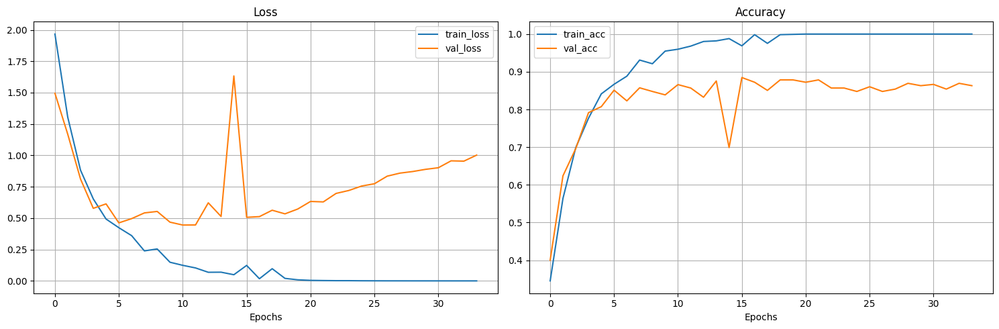

In [ ]:
# plot learning curves
plot_loss_curves(MM_model_0_results)

In [ ]:
# compute generalization gap
dif=compute_generalization_gap(MM_model_0_results)

Generalization gap (train acc - val acc): 0.1369


As observed both numerically and graphically, the baseline model for the M / M dataset demonstrates overfitting. To address this, we proceed with the experimentation workflow, starting with MM_model_1, in which we apply techniques to reduce overfitting before further optimizing the model's performance.

In [ ]:
# save the model
torch.save(MM_model_0.state_dict(), os.path.join(project_models_path, 'MM_model_0.pth'))
print("Model saved to 'MM_model_0.pth'")

Model saved to 'MM_model_0.pth'


Experiment 1. Apply L2 regularization.

In [ ]:
# experiment 1: L2 reg
MM_model_L2_results = experiment_l2_regularization(train_dataloader=train_dataloader_M,
                                                   val_dataloader=val_dataloader_M,
                                                   num_epochs=num_epochs,
                                                   device=device,
                                                   weight_decay_values_list=weight_decay_values_list,
                                                   num_channels=num_channels,
                                                   num_classes=num_classes,
                                                   init_hidden_units=init_hidden_units)

Experimenting with L2 Regularization
Weight decay values to try: [0.01, 0.001, 0.0001, 1e-05, 1e-06]

Testing with weight decay: 0.01


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.9180 | train_acc: 0.3296 | val_loss: 1.5112 | val_acc: 0.4597
Epoch: 2 | train_loss: 1.1861 | train_acc: 0.6008 | val_loss: 1.2827 | val_acc: 0.5813
Epoch: 3 | train_loss: 0.8978 | train_acc: 0.6906 | val_loss: 1.1136 | val_acc: 0.6398
Epoch: 4 | train_loss: 0.7096 | train_acc: 0.7479 | val_loss: 0.7884 | val_acc: 0.7318
Epoch: 5 | train_loss: 0.6330 | train_acc: 0.7784 | val_loss: 1.0991 | val_acc: 0.6312
Epoch: 6 | train_loss: 0.5373 | train_acc: 0.8121 | val_loss: 0.8139 | val_acc: 0.7398
Epoch: 7 | train_loss: 0.4605 | train_acc: 0.8457 | val_loss: 0.5628 | val_acc: 0.8261
Epoch: 8 | train_loss: 0.4104 | train_acc: 0.8564 | val_loss: 1.2515 | val_acc: 0.6330
Epoch: 9 | train_loss: 0.3981 | train_acc: 0.8613 | val_loss: 0.7479 | val_acc: 0.7784
Epoch: 10 | train_loss: 0.3855 | train_acc: 0.8702 | val_loss: 0.5232 | val_acc: 0.7955
Epoch: 11 | train_loss: 0.2959 | train_acc: 0.9022 | val_loss: 0.5983 | val_acc: 0.8074
Epoch: 12 | train_loss: 0.3511 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.0304 | train_acc: 0.3363 | val_loss: 1.5437 | val_acc: 0.4284
Epoch: 2 | train_loss: 1.2424 | train_acc: 0.5835 | val_loss: 1.0698 | val_acc: 0.6466
Epoch: 3 | train_loss: 0.9490 | train_acc: 0.6696 | val_loss: 1.3017 | val_acc: 0.5261
Epoch: 4 | train_loss: 0.6854 | train_acc: 0.7659 | val_loss: 0.6131 | val_acc: 0.7915
Epoch: 5 | train_loss: 0.5469 | train_acc: 0.8226 | val_loss: 0.5687 | val_acc: 0.8318
Epoch: 6 | train_loss: 0.4464 | train_acc: 0.8565 | val_loss: 0.4947 | val_acc: 0.8415
Epoch: 7 | train_loss: 0.3090 | train_acc: 0.9038 | val_loss: 0.5181 | val_acc: 0.8545
Epoch: 8 | train_loss: 0.2614 | train_acc: 0.9080 | val_loss: 0.4879 | val_acc: 0.8574
Epoch: 9 | train_loss: 0.1981 | train_acc: 0.9302 | val_loss: 0.4898 | val_acc: 0.8608
Epoch: 10 | train_loss: 0.1636 | train_acc: 0.9466 | val_loss: 0.4102 | val_acc: 0.8699
Epoch: 11 | train_loss: 0.1588 | train_acc: 0.9500 | val_loss: 0.6486 | val_acc: 0.8330
Epoch: 12 | train_loss: 0.1883 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.9740 | train_acc: 0.3200 | val_loss: 1.7914 | val_acc: 0.2801
Epoch: 2 | train_loss: 1.2134 | train_acc: 0.5763 | val_loss: 1.1549 | val_acc: 0.6210
Epoch: 3 | train_loss: 0.8068 | train_acc: 0.7241 | val_loss: 0.8367 | val_acc: 0.6898
Epoch: 4 | train_loss: 0.6016 | train_acc: 0.7863 | val_loss: 0.6282 | val_acc: 0.7852
Epoch: 5 | train_loss: 0.4081 | train_acc: 0.8751 | val_loss: 0.7462 | val_acc: 0.7420
Epoch: 6 | train_loss: 0.2919 | train_acc: 0.9186 | val_loss: 0.4793 | val_acc: 0.8886
Epoch: 7 | train_loss: 0.2294 | train_acc: 0.9162 | val_loss: 0.4930 | val_acc: 0.8824
Epoch: 8 | train_loss: 0.1678 | train_acc: 0.9498 | val_loss: 0.4064 | val_acc: 0.8324
Epoch: 9 | train_loss: 0.1206 | train_acc: 0.9613 | val_loss: 0.3911 | val_acc: 0.8540
Epoch: 10 | train_loss: 0.0766 | train_acc: 0.9770 | val_loss: 0.3738 | val_acc: 0.8915
Epoch: 11 | train_loss: 0.1447 | train_acc: 0.9556 | val_loss: 0.4266 | val_acc: 0.8574
Epoch: 12 | train_loss: 0.0512 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.0038 | train_acc: 0.3198 | val_loss: 1.3752 | val_acc: 0.5864
Epoch: 2 | train_loss: 1.0625 | train_acc: 0.6228 | val_loss: 0.8001 | val_acc: 0.7301
Epoch: 3 | train_loss: 0.7391 | train_acc: 0.7399 | val_loss: 0.7544 | val_acc: 0.7426
Epoch: 4 | train_loss: 0.5803 | train_acc: 0.7883 | val_loss: 0.6119 | val_acc: 0.7636
Epoch: 5 | train_loss: 0.4760 | train_acc: 0.8417 | val_loss: 0.5479 | val_acc: 0.8165
Epoch: 6 | train_loss: 0.3466 | train_acc: 0.8840 | val_loss: 0.4826 | val_acc: 0.8256
Epoch: 7 | train_loss: 0.3121 | train_acc: 0.8865 | val_loss: 0.4131 | val_acc: 0.8068
Epoch: 8 | train_loss: 0.2305 | train_acc: 0.9261 | val_loss: 0.3989 | val_acc: 0.8540
Epoch: 9 | train_loss: 0.2044 | train_acc: 0.9311 | val_loss: 0.5096 | val_acc: 0.8472
Epoch: 10 | train_loss: 0.1440 | train_acc: 0.9541 | val_loss: 0.4918 | val_acc: 0.8602
Epoch: 11 | train_loss: 0.1259 | train_acc: 0.9583 | val_loss: 0.7956 | val_acc: 0.7727
Epoch: 12 | train_loss: 0.1047 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.9075 | train_acc: 0.3259 | val_loss: 1.6675 | val_acc: 0.3619
Epoch: 2 | train_loss: 1.2468 | train_acc: 0.5759 | val_loss: 1.3530 | val_acc: 0.5739
Epoch: 3 | train_loss: 0.8928 | train_acc: 0.6905 | val_loss: 0.7993 | val_acc: 0.7261
Epoch: 4 | train_loss: 0.6387 | train_acc: 0.7872 | val_loss: 0.7868 | val_acc: 0.7330
Epoch: 5 | train_loss: 0.4886 | train_acc: 0.8454 | val_loss: 0.5105 | val_acc: 0.8165
Epoch: 6 | train_loss: 0.3577 | train_acc: 0.8693 | val_loss: 0.5330 | val_acc: 0.8330
Epoch: 7 | train_loss: 0.2770 | train_acc: 0.9088 | val_loss: 0.4832 | val_acc: 0.8727
Epoch: 8 | train_loss: 0.2096 | train_acc: 0.9310 | val_loss: 0.5437 | val_acc: 0.8165
Epoch: 9 | train_loss: 0.1720 | train_acc: 0.9457 | val_loss: 0.5474 | val_acc: 0.8727
Epoch: 10 | train_loss: 0.1274 | train_acc: 0.9589 | val_loss: 0.5223 | val_acc: 0.8790
Epoch: 11 | train_loss: 0.1610 | train_acc: 0.9482 | val_loss: 0.5467 | val_acc: 0.8665
Epoch: 12 | train_loss: 0.0700 | train_ac

In [ ]:
# # identify and print the best decay value based on the generalization gap
MM_best_decay_value, MM_min_diff_l2 = compute_multi_generalization_gaps(MM_model_L2_results)

Difference between train and val acc for 0.01: 0.1276
Difference between train and val acc for 0.001: 0.1194
Difference between train and val acc for 0.0001: 0.0932
Difference between train and val acc for 1e-05: 0.0966
Difference between train and val acc for 1e-06: 0.1210

The best (smallest) generalization gap is for 0.0001 and is 0.0932


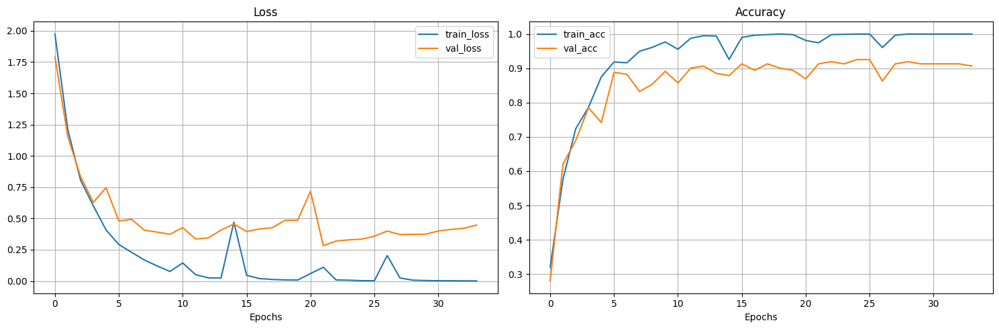

In [ ]:
# plot loss curves
plot_loss_curves(MM_model_L2_results[MM_best_decay_value])

As we can observe, the training and validation curves have converged, minimizing the gap between them. Let's further improve this by incorporating dropout layers.

Experiment 2. Apply dropout regularization layers.

In [ ]:
# experiment 2: dropout layers
MM_model_dropout_results = experiment_dropout_regularization(train_dataloader=train_dataloader_M,
                                                             val_dataloader=val_dataloader_M,
                                                             num_epochs=num_epochs,
                                                             device=device,
                                                             num_classes=num_classes,
                                                             best_decay_value=MM_best_decay_value,
                                                             dropout_probs_combos_list=dropout_probs_combos_list)

Experimenting with Dropout Regularization Layers
Dropout probabilities to try: [0.1, 0.3, 0.5, 0.6, 0.7, 0.9]
Total number of combinations to ideally try: 1296

Some possible 'good' combinations to try: [[0.5, 0.5, 0.5, 0.5], [0.5, 0.5, 0.4, 0.5], [0.5, 0.4, 0.5, 0.5], [0.5, 0.4, 0.4, 0.5], [0.5, 0.5, 0.5, 0.4], [0.4, 0.5, 0.5, 0.5], [0.4, 0.5, 0.5, 0.4], [0.5, 0.5, 0.5, 0.7], [0.8, 0.5, 0.5, 0.5], [0.8, 0.7, 0.7, 0.6], [0.8, 0.8, 0.7, 0.5], [0.8, 0.5, 0.7, 0.5], [0.6, 0.5, 0.5, 0.5], [0.5, 0.6, 0.6, 0.5], [0.7, 0.6, 0.5, 0.5]]

Testing with conv_dropout_prob: [0.5, 0.5, 0.5] and classifier dropout probability: 0.5


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.1430 | train_acc: 0.2338 | val_loss: 1.8539 | val_acc: 0.3312
Epoch: 2 | train_loss: 1.8151 | train_acc: 0.3721 | val_loss: 1.7623 | val_acc: 0.3812
Epoch: 3 | train_loss: 1.6050 | train_acc: 0.4437 | val_loss: 2.0432 | val_acc: 0.2727
Epoch: 4 | train_loss: 1.5007 | train_acc: 0.4826 | val_loss: 1.3773 | val_acc: 0.4966
Epoch: 5 | train_loss: 1.4709 | train_acc: 0.5062 | val_loss: 1.6349 | val_acc: 0.3972
Epoch: 6 | train_loss: 1.3811 | train_acc: 0.5326 | val_loss: 1.6081 | val_acc: 0.3937
Epoch: 7 | train_loss: 1.3439 | train_acc: 0.5500 | val_loss: 1.3806 | val_acc: 0.4807
Epoch: 8 | train_loss: 1.3053 | train_acc: 0.5617 | val_loss: 1.3653 | val_acc: 0.5284
Epoch: 9 | train_loss: 1.1914 | train_acc: 0.6027 | val_loss: 1.1257 | val_acc: 0.6426
Epoch: 10 | train_loss: 1.1416 | train_acc: 0.6270 | val_loss: 1.2616 | val_acc: 0.5369
Epoch: 11 | train_loss: 1.0546 | train_acc: 0.6291 | val_loss: 1.0370 | val_acc: 0.6523
Epoch: 12 | train_loss: 1.0332 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.0936 | train_acc: 0.2607 | val_loss: 2.0657 | val_acc: 0.2750
Epoch: 2 | train_loss: 1.7056 | train_acc: 0.4202 | val_loss: 1.5732 | val_acc: 0.4409
Epoch: 3 | train_loss: 1.5225 | train_acc: 0.4893 | val_loss: 1.4371 | val_acc: 0.5062
Epoch: 4 | train_loss: 1.3983 | train_acc: 0.5400 | val_loss: 1.5669 | val_acc: 0.4500
Epoch: 5 | train_loss: 1.2926 | train_acc: 0.5523 | val_loss: 1.2772 | val_acc: 0.5687
Epoch: 6 | train_loss: 1.2478 | train_acc: 0.5848 | val_loss: 1.3081 | val_acc: 0.5045
Epoch: 7 | train_loss: 1.1633 | train_acc: 0.6110 | val_loss: 0.9703 | val_acc: 0.7142
Epoch: 8 | train_loss: 1.0571 | train_acc: 0.6364 | val_loss: 1.0300 | val_acc: 0.6028
Epoch: 9 | train_loss: 0.9849 | train_acc: 0.6500 | val_loss: 1.0050 | val_acc: 0.6091
Epoch: 10 | train_loss: 0.9726 | train_acc: 0.6737 | val_loss: 1.0284 | val_acc: 0.5813
Epoch: 11 | train_loss: 0.9354 | train_acc: 0.6773 | val_loss: 0.8092 | val_acc: 0.6955
Epoch: 12 | train_loss: 0.8794 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.2099 | train_acc: 0.2085 | val_loss: 1.7674 | val_acc: 0.3920
Epoch: 2 | train_loss: 1.7849 | train_acc: 0.3753 | val_loss: 1.5282 | val_acc: 0.5432
Epoch: 3 | train_loss: 1.5814 | train_acc: 0.4686 | val_loss: 1.4850 | val_acc: 0.4313
Epoch: 4 | train_loss: 1.4298 | train_acc: 0.5236 | val_loss: 1.4707 | val_acc: 0.4437
Epoch: 5 | train_loss: 1.2995 | train_acc: 0.5758 | val_loss: 1.2377 | val_acc: 0.5528
Epoch: 6 | train_loss: 1.2779 | train_acc: 0.5689 | val_loss: 1.1308 | val_acc: 0.5875
Epoch: 7 | train_loss: 1.1726 | train_acc: 0.6142 | val_loss: 1.0615 | val_acc: 0.6057
Epoch: 8 | train_loss: 1.0958 | train_acc: 0.6302 | val_loss: 0.9749 | val_acc: 0.6244
Epoch: 9 | train_loss: 1.0777 | train_acc: 0.6309 | val_loss: 0.9739 | val_acc: 0.6739
Epoch: 10 | train_loss: 0.9890 | train_acc: 0.6643 | val_loss: 1.0635 | val_acc: 0.6057
Epoch: 11 | train_loss: 0.9262 | train_acc: 0.6864 | val_loss: 0.8223 | val_acc: 0.6892
Epoch: 12 | train_loss: 0.8944 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.1671 | train_acc: 0.2354 | val_loss: 1.7270 | val_acc: 0.3432
Epoch: 2 | train_loss: 1.6756 | train_acc: 0.3899 | val_loss: 1.9805 | val_acc: 0.2739
Epoch: 3 | train_loss: 1.5627 | train_acc: 0.4631 | val_loss: 1.5823 | val_acc: 0.4170
Epoch: 4 | train_loss: 1.3956 | train_acc: 0.5212 | val_loss: 1.3885 | val_acc: 0.5119
Epoch: 5 | train_loss: 1.3098 | train_acc: 0.5453 | val_loss: 1.1575 | val_acc: 0.5960
Epoch: 6 | train_loss: 1.2090 | train_acc: 0.5965 | val_loss: 1.1107 | val_acc: 0.6142
Epoch: 7 | train_loss: 1.1801 | train_acc: 0.6152 | val_loss: 1.1172 | val_acc: 0.5875
Epoch: 8 | train_loss: 1.0842 | train_acc: 0.6385 | val_loss: 1.0778 | val_acc: 0.5926
Epoch: 9 | train_loss: 1.0275 | train_acc: 0.6386 | val_loss: 0.8342 | val_acc: 0.7108
Epoch: 10 | train_loss: 0.9585 | train_acc: 0.6772 | val_loss: 0.9948 | val_acc: 0.6364
Epoch: 11 | train_loss: 0.9389 | train_acc: 0.7010 | val_loss: 0.9681 | val_acc: 0.6523
Epoch: 12 | train_loss: 0.8703 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.0684 | train_acc: 0.2625 | val_loss: 2.0097 | val_acc: 0.2699
Epoch: 2 | train_loss: 1.7014 | train_acc: 0.3874 | val_loss: 1.6014 | val_acc: 0.4898
Epoch: 3 | train_loss: 1.5241 | train_acc: 0.4902 | val_loss: 1.7072 | val_acc: 0.3659
Epoch: 4 | train_loss: 1.4301 | train_acc: 0.5081 | val_loss: 1.5325 | val_acc: 0.4381
Epoch: 5 | train_loss: 1.3745 | train_acc: 0.5511 | val_loss: 1.7198 | val_acc: 0.3665
Epoch: 6 | train_loss: 1.2718 | train_acc: 0.5560 | val_loss: 1.2591 | val_acc: 0.5341
Epoch: 7 | train_loss: 1.2388 | train_acc: 0.5900 | val_loss: 1.2741 | val_acc: 0.5222
Epoch: 8 | train_loss: 1.1262 | train_acc: 0.6210 | val_loss: 1.2436 | val_acc: 0.5193
Epoch: 9 | train_loss: 1.0934 | train_acc: 0.6222 | val_loss: 1.0079 | val_acc: 0.6000
Epoch: 10 | train_loss: 1.0468 | train_acc: 0.6503 | val_loss: 0.9965 | val_acc: 0.6239
Epoch: 11 | train_loss: 1.0162 | train_acc: 0.6532 | val_loss: 1.0389 | val_acc: 0.5966
Epoch: 12 | train_loss: 0.9521 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.0755 | train_acc: 0.2758 | val_loss: 1.6248 | val_acc: 0.3676
Epoch: 2 | train_loss: 1.6518 | train_acc: 0.4488 | val_loss: 1.5251 | val_acc: 0.4381
Epoch: 3 | train_loss: 1.3931 | train_acc: 0.5149 | val_loss: 1.3233 | val_acc: 0.4892
Epoch: 4 | train_loss: 1.2067 | train_acc: 0.5730 | val_loss: 1.0641 | val_acc: 0.6250
Epoch: 5 | train_loss: 1.1280 | train_acc: 0.6052 | val_loss: 0.9181 | val_acc: 0.6591
Epoch: 6 | train_loss: 1.0824 | train_acc: 0.6264 | val_loss: 0.9981 | val_acc: 0.6188
Epoch: 7 | train_loss: 0.9852 | train_acc: 0.6569 | val_loss: 0.8799 | val_acc: 0.6926
Epoch: 8 | train_loss: 0.9297 | train_acc: 0.6780 | val_loss: 0.9272 | val_acc: 0.6040
Epoch: 9 | train_loss: 0.8901 | train_acc: 0.6873 | val_loss: 0.8242 | val_acc: 0.6869
Epoch: 10 | train_loss: 0.8473 | train_acc: 0.6913 | val_loss: 0.7544 | val_acc: 0.6955
Epoch: 11 | train_loss: 0.8340 | train_acc: 0.6980 | val_loss: 1.0320 | val_acc: 0.6023
Epoch: 12 | train_loss: 0.8497 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.1763 | train_acc: 0.2306 | val_loss: 1.9176 | val_acc: 0.2500
Epoch: 2 | train_loss: 1.7360 | train_acc: 0.3998 | val_loss: 1.5540 | val_acc: 0.3812
Epoch: 3 | train_loss: 1.5565 | train_acc: 0.4621 | val_loss: 1.3752 | val_acc: 0.5994
Epoch: 4 | train_loss: 1.4637 | train_acc: 0.5095 | val_loss: 1.3369 | val_acc: 0.5460
Epoch: 5 | train_loss: 1.3489 | train_acc: 0.5476 | val_loss: 1.3560 | val_acc: 0.4972
Epoch: 6 | train_loss: 1.2199 | train_acc: 0.5820 | val_loss: 1.1309 | val_acc: 0.6341
Epoch: 7 | train_loss: 1.1725 | train_acc: 0.5858 | val_loss: 1.0005 | val_acc: 0.6710
Epoch: 8 | train_loss: 1.0762 | train_acc: 0.6445 | val_loss: 0.8965 | val_acc: 0.6989
Epoch: 9 | train_loss: 1.0088 | train_acc: 0.6744 | val_loss: 1.0138 | val_acc: 0.6335
Epoch: 10 | train_loss: 0.9773 | train_acc: 0.6791 | val_loss: 0.8081 | val_acc: 0.7080
Epoch: 11 | train_loss: 0.9110 | train_acc: 0.6918 | val_loss: 0.6857 | val_acc: 0.8136
Epoch: 12 | train_loss: 0.8681 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.1760 | train_acc: 0.2345 | val_loss: 1.9750 | val_acc: 0.3125
Epoch: 2 | train_loss: 1.8428 | train_acc: 0.3446 | val_loss: 1.9679 | val_acc: 0.2909
Epoch: 3 | train_loss: 1.7024 | train_acc: 0.4071 | val_loss: 1.7763 | val_acc: 0.3875
Epoch: 4 | train_loss: 1.5901 | train_acc: 0.4417 | val_loss: 1.8885 | val_acc: 0.3170
Epoch: 5 | train_loss: 1.5251 | train_acc: 0.4811 | val_loss: 1.8447 | val_acc: 0.3381
Epoch: 6 | train_loss: 1.5004 | train_acc: 0.5064 | val_loss: 1.6950 | val_acc: 0.3727
Epoch: 7 | train_loss: 1.4035 | train_acc: 0.5239 | val_loss: 1.6311 | val_acc: 0.3847
Epoch: 8 | train_loss: 1.3656 | train_acc: 0.5446 | val_loss: 1.3751 | val_acc: 0.5000
Epoch: 9 | train_loss: 1.2776 | train_acc: 0.5729 | val_loss: 1.3778 | val_acc: 0.4972
Epoch: 10 | train_loss: 1.2796 | train_acc: 0.5945 | val_loss: 1.3610 | val_acc: 0.5222
Epoch: 11 | train_loss: 1.2054 | train_acc: 0.6092 | val_loss: 1.2252 | val_acc: 0.5773
Epoch: 12 | train_loss: 1.0970 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.3644 | train_acc: 0.1830 | val_loss: 2.3593 | val_acc: 0.1375
Epoch: 2 | train_loss: 1.9818 | train_acc: 0.2940 | val_loss: 2.3643 | val_acc: 0.1466
Epoch: 3 | train_loss: 1.7604 | train_acc: 0.3785 | val_loss: 2.3936 | val_acc: 0.1375
Epoch: 4 | train_loss: 1.6970 | train_acc: 0.3997 | val_loss: 2.8733 | val_acc: 0.1375
Epoch: 5 | train_loss: 1.6127 | train_acc: 0.4375 | val_loss: 2.3970 | val_acc: 0.1437
Epoch: 6 | train_loss: 1.5896 | train_acc: 0.4620 | val_loss: 2.8761 | val_acc: 0.1375
Epoch: 7 | train_loss: 1.4934 | train_acc: 0.4934 | val_loss: 3.1096 | val_acc: 0.1375
Epoch: 8 | train_loss: 1.4887 | train_acc: 0.5093 | val_loss: 3.2567 | val_acc: 0.1375
Epoch: 9 | train_loss: 1.4681 | train_acc: 0.5117 | val_loss: 2.6589 | val_acc: 0.1437
Epoch: 10 | train_loss: 1.4690 | train_acc: 0.5172 | val_loss: 2.5814 | val_acc: 0.1437
Epoch: 11 | train_loss: 1.3758 | train_acc: 0.5471 | val_loss: 3.5639 | val_acc: 0.1375
Epoch: 12 | train_loss: 1.3555 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.3430 | train_acc: 0.2290 | val_loss: 2.3493 | val_acc: 0.1375
Epoch: 2 | train_loss: 2.0751 | train_acc: 0.2710 | val_loss: 2.3787 | val_acc: 0.1375
Epoch: 3 | train_loss: 1.9238 | train_acc: 0.3260 | val_loss: 2.5014 | val_acc: 0.1375
Epoch: 4 | train_loss: 1.8466 | train_acc: 0.3539 | val_loss: 2.6203 | val_acc: 0.1375
Epoch: 5 | train_loss: 1.8029 | train_acc: 0.3810 | val_loss: 2.6769 | val_acc: 0.1375
Epoch: 6 | train_loss: 1.7373 | train_acc: 0.4238 | val_loss: 2.7604 | val_acc: 0.1375
Epoch: 7 | train_loss: 1.7002 | train_acc: 0.4300 | val_loss: 2.9056 | val_acc: 0.1375
Epoch: 8 | train_loss: 1.7096 | train_acc: 0.4326 | val_loss: 2.9534 | val_acc: 0.1375
Epoch: 9 | train_loss: 1.6595 | train_acc: 0.4358 | val_loss: 2.7444 | val_acc: 0.1375
Epoch: 10 | train_loss: 1.6530 | train_acc: 0.4490 | val_loss: 3.0025 | val_acc: 0.1375
Epoch: 11 | train_loss: 1.5762 | train_acc: 0.4574 | val_loss: 2.8492 | val_acc: 0.1375
Epoch: 12 | train_loss: 1.5876 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.3963 | train_acc: 0.1552 | val_loss: 2.3571 | val_acc: 0.1375
Epoch: 2 | train_loss: 2.1130 | train_acc: 0.2765 | val_loss: 2.4052 | val_acc: 0.1375
Epoch: 3 | train_loss: 1.9467 | train_acc: 0.3300 | val_loss: 2.5276 | val_acc: 0.1375
Epoch: 4 | train_loss: 1.8583 | train_acc: 0.3670 | val_loss: 2.3249 | val_acc: 0.1437
Epoch: 5 | train_loss: 1.7948 | train_acc: 0.3899 | val_loss: 2.6083 | val_acc: 0.1375
Epoch: 6 | train_loss: 1.7784 | train_acc: 0.4039 | val_loss: 2.4246 | val_acc: 0.1437
Epoch: 7 | train_loss: 1.7294 | train_acc: 0.4293 | val_loss: 2.4788 | val_acc: 0.1375
Epoch: 8 | train_loss: 1.7135 | train_acc: 0.4189 | val_loss: 2.5165 | val_acc: 0.1375
Epoch: 9 | train_loss: 1.7110 | train_acc: 0.4330 | val_loss: 2.4579 | val_acc: 0.1437
Epoch: 10 | train_loss: 1.6351 | train_acc: 0.4567 | val_loss: 2.4064 | val_acc: 0.1437
Epoch: 11 | train_loss: 1.6033 | train_acc: 0.4615 | val_loss: 2.3276 | val_acc: 0.1562
Epoch: 12 | train_loss: 1.6060 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.3426 | train_acc: 0.1807 | val_loss: 2.3569 | val_acc: 0.1375
Epoch: 2 | train_loss: 2.0204 | train_acc: 0.2919 | val_loss: 2.4724 | val_acc: 0.1375
Epoch: 3 | train_loss: 1.8312 | train_acc: 0.3835 | val_loss: 2.6355 | val_acc: 0.1375
Epoch: 4 | train_loss: 1.7357 | train_acc: 0.4013 | val_loss: 2.7674 | val_acc: 0.1375
Epoch: 5 | train_loss: 1.7182 | train_acc: 0.4474 | val_loss: 2.7637 | val_acc: 0.1375
Epoch: 6 | train_loss: 1.6407 | train_acc: 0.4549 | val_loss: 2.7726 | val_acc: 0.1375
Epoch: 7 | train_loss: 1.6381 | train_acc: 0.4425 | val_loss: 2.8104 | val_acc: 0.1375
Epoch: 8 | train_loss: 1.5489 | train_acc: 0.4842 | val_loss: 2.4437 | val_acc: 0.1437
Epoch: 9 | train_loss: 1.5748 | train_acc: 0.4732 | val_loss: 2.6036 | val_acc: 0.1437
Epoch: 10 | train_loss: 1.5718 | train_acc: 0.4902 | val_loss: 2.6960 | val_acc: 0.1437
Epoch: 11 | train_loss: 1.4422 | train_acc: 0.5196 | val_loss: 2.5984 | val_acc: 0.1437
Epoch: 12 | train_loss: 1.4378 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.1308 | train_acc: 0.2589 | val_loss: 2.0185 | val_acc: 0.3034
Epoch: 2 | train_loss: 1.7728 | train_acc: 0.3646 | val_loss: 2.1804 | val_acc: 0.1625
Epoch: 3 | train_loss: 1.5993 | train_acc: 0.4555 | val_loss: 1.8717 | val_acc: 0.2739
Epoch: 4 | train_loss: 1.5486 | train_acc: 0.4704 | val_loss: 1.7362 | val_acc: 0.3392
Epoch: 5 | train_loss: 1.4230 | train_acc: 0.5180 | val_loss: 1.5347 | val_acc: 0.5000
Epoch: 6 | train_loss: 1.3728 | train_acc: 0.5539 | val_loss: 1.7330 | val_acc: 0.4233
Epoch: 7 | train_loss: 1.3110 | train_acc: 0.5699 | val_loss: 1.7131 | val_acc: 0.3278
Epoch: 8 | train_loss: 1.2916 | train_acc: 0.5722 | val_loss: 1.5315 | val_acc: 0.4608
Epoch: 9 | train_loss: 1.2473 | train_acc: 0.5902 | val_loss: 1.3187 | val_acc: 0.5193
Epoch: 10 | train_loss: 1.2122 | train_acc: 0.6016 | val_loss: 1.5125 | val_acc: 0.4614
Epoch: 11 | train_loss: 1.1592 | train_acc: 0.6078 | val_loss: 1.4874 | val_acc: 0.4699
Epoch: 12 | train_loss: 1.1224 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.2045 | train_acc: 0.2159 | val_loss: 1.8462 | val_acc: 0.2977
Epoch: 2 | train_loss: 1.8096 | train_acc: 0.3553 | val_loss: 1.6976 | val_acc: 0.4188
Epoch: 3 | train_loss: 1.6432 | train_acc: 0.4343 | val_loss: 1.7863 | val_acc: 0.3812
Epoch: 4 | train_loss: 1.5741 | train_acc: 0.4681 | val_loss: 1.7077 | val_acc: 0.3659
Epoch: 5 | train_loss: 1.4748 | train_acc: 0.5049 | val_loss: 1.5272 | val_acc: 0.4506
Epoch: 6 | train_loss: 1.4358 | train_acc: 0.5204 | val_loss: 1.4410 | val_acc: 0.4790
Epoch: 7 | train_loss: 1.3882 | train_acc: 0.5360 | val_loss: 1.2958 | val_acc: 0.5403
Epoch: 8 | train_loss: 1.3436 | train_acc: 0.5550 | val_loss: 1.5266 | val_acc: 0.4562
Epoch: 9 | train_loss: 1.2881 | train_acc: 0.5744 | val_loss: 1.3002 | val_acc: 0.5347
Epoch: 10 | train_loss: 1.2162 | train_acc: 0.5919 | val_loss: 1.0448 | val_acc: 0.6676
Epoch: 11 | train_loss: 1.1485 | train_acc: 0.6059 | val_loss: 1.2155 | val_acc: 0.5472
Epoch: 12 | train_loss: 1.1101 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.2099 | train_acc: 0.2323 | val_loss: 2.3408 | val_acc: 0.1375
Epoch: 2 | train_loss: 1.8156 | train_acc: 0.3537 | val_loss: 2.3799 | val_acc: 0.1528
Epoch: 3 | train_loss: 1.6553 | train_acc: 0.4334 | val_loss: 2.3717 | val_acc: 0.1437
Epoch: 4 | train_loss: 1.5572 | train_acc: 0.4704 | val_loss: 2.1217 | val_acc: 0.1966
Epoch: 5 | train_loss: 1.5116 | train_acc: 0.4985 | val_loss: 2.6159 | val_acc: 0.1437
Epoch: 6 | train_loss: 1.4549 | train_acc: 0.5071 | val_loss: 2.5958 | val_acc: 0.1437
Epoch: 7 | train_loss: 1.4146 | train_acc: 0.5134 | val_loss: 2.0677 | val_acc: 0.2125
Epoch: 8 | train_loss: 1.3683 | train_acc: 0.5348 | val_loss: 2.4882 | val_acc: 0.1500
Epoch: 9 | train_loss: 1.3908 | train_acc: 0.5541 | val_loss: 2.1348 | val_acc: 0.2000
Epoch: 10 | train_loss: 1.3134 | train_acc: 0.5529 | val_loss: 2.3732 | val_acc: 0.1688
Epoch: 11 | train_loss: 1.3076 | train_acc: 0.5693 | val_loss: 2.2584 | val_acc: 0.1938
Epoch: 12 | train_loss: 1.2941 | train_ac

In [ ]:
# # identify and print the best dropout probs combo value based on the generalization gap
MM_best_dropout_probs, MM_min_diff_dropout = compute_multi_generalization_gaps(MM_model_dropout_results)

Difference between train and val acc for (0.5, 0.5, 0.5, 0.5): 0.0178
Difference between train and val acc for (0.5, 0.5, 0.4, 0.5): 0.0552
Difference between train and val acc for (0.5, 0.4, 0.5, 0.5): 0.0281
Difference between train and val acc for (0.5, 0.4, 0.4, 0.5): 0.0636
Difference between train and val acc for (0.5, 0.5, 0.5, 0.4): -0.0002
Difference between train and val acc for (0.4, 0.5, 0.5, 0.5): 0.1020
Difference between train and val acc for (0.4, 0.5, 0.5, 0.4): -0.0233
Difference between train and val acc for (0.5, 0.5, 0.5, 0.7): -0.0860
Difference between train and val acc for (0.8, 0.5, 0.5, 0.5): 0.3774
Difference between train and val acc for (0.8, 0.7, 0.7, 0.6): 0.4009
Difference between train and val acc for (0.8, 0.8, 0.7, 0.5): 0.2113
Difference between train and val acc for (0.8, 0.5, 0.7, 0.5): 0.2176
Difference between train and val acc for (0.6, 0.5, 0.5, 0.5): 0.1041
Difference between train and val acc for (0.5, 0.6, 0.6, 0.5): 0.0862
Difference betwee

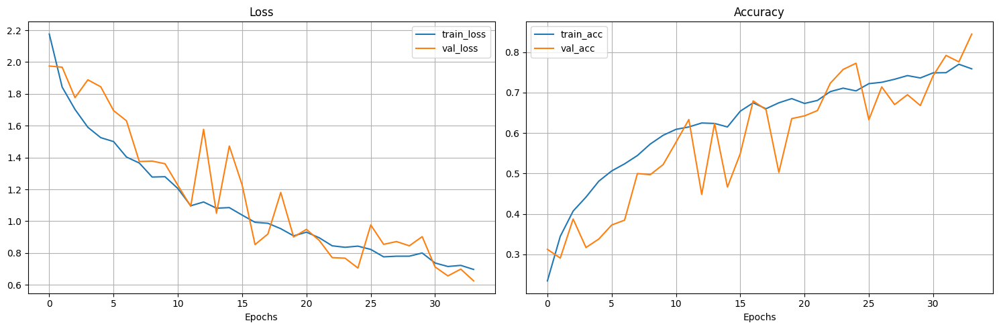

In [ ]:
# plot learning curves
plot_loss_curves(MM_model_dropout_results[MM_best_dropout_probs])

We now observe significantly improved convergence, with the validation curves nearly surpassing the training ones. Let's move on to the next experiments to further widen this gap.

Experiment 3: Try different hidden layer sizes.

In [ ]:
# experiment 3: hidden layer sizes
MM_model_hidden_results = experiment_hidden_layer_sizes(train_dataloader=train_dataloader_M,
                                                        val_dataloader=val_dataloader_M,
                                                        num_epochs=num_epochs,
                                                        device=device,
                                                        num_classes=num_classes,
                                                        best_decay_value=MM_best_decay_value,
                                                        best_dropout_probs_combo=MM_best_dropout_probs,
                                                        hidden_layer_sizes_list=hidden_layer_sizes_list)

Experimenting with Hidden Layer Sizes
Hidden layer sizes combinations to try: [(32, 64, 64), (32, 32, 128), (64, 32, 64), (32, 32, 64), (64, 64, 32), (32, 64, 32)]

Testing hidden layer sizes combination: (32, 64, 64)...


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.2578 | train_acc: 0.2058 | val_loss: 1.8419 | val_acc: 0.3000
Epoch: 2 | train_loss: 1.9163 | train_acc: 0.3186 | val_loss: 1.8016 | val_acc: 0.2875
Epoch: 3 | train_loss: 1.7091 | train_acc: 0.4176 | val_loss: 1.5083 | val_acc: 0.5062
Epoch: 4 | train_loss: 1.6419 | train_acc: 0.4331 | val_loss: 1.4956 | val_acc: 0.4932
Epoch: 5 | train_loss: 1.5179 | train_acc: 0.4927 | val_loss: 1.3014 | val_acc: 0.5835
Epoch: 6 | train_loss: 1.4354 | train_acc: 0.5198 | val_loss: 1.3286 | val_acc: 0.5528
Epoch: 7 | train_loss: 1.2874 | train_acc: 0.5690 | val_loss: 1.4231 | val_acc: 0.4659
Epoch: 8 | train_loss: 1.1987 | train_acc: 0.5934 | val_loss: 0.9811 | val_acc: 0.6614
Epoch: 9 | train_loss: 1.1190 | train_acc: 0.6290 | val_loss: 0.8753 | val_acc: 0.6648
Epoch: 10 | train_loss: 1.0357 | train_acc: 0.6370 | val_loss: 0.8152 | val_acc: 0.7017
Epoch: 11 | train_loss: 0.9813 | train_acc: 0.6640 | val_loss: 0.8907 | val_acc: 0.6489
Epoch: 12 | train_loss: 0.9841 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.2117 | train_acc: 0.2411 | val_loss: 1.8644 | val_acc: 0.3063
Epoch: 2 | train_loss: 1.8354 | train_acc: 0.3454 | val_loss: 1.7748 | val_acc: 0.3659
Epoch: 3 | train_loss: 1.6524 | train_acc: 0.4082 | val_loss: 1.4902 | val_acc: 0.4898
Epoch: 4 | train_loss: 1.5462 | train_acc: 0.4712 | val_loss: 1.3526 | val_acc: 0.5403
Epoch: 5 | train_loss: 1.4249 | train_acc: 0.5173 | val_loss: 1.2106 | val_acc: 0.5869
Epoch: 6 | train_loss: 1.3527 | train_acc: 0.5486 | val_loss: 1.1349 | val_acc: 0.5932
Epoch: 7 | train_loss: 1.2173 | train_acc: 0.5772 | val_loss: 1.1624 | val_acc: 0.5375
Epoch: 8 | train_loss: 1.1673 | train_acc: 0.5948 | val_loss: 0.9877 | val_acc: 0.6551
Epoch: 9 | train_loss: 1.1057 | train_acc: 0.6360 | val_loss: 0.8570 | val_acc: 0.7233
Epoch: 10 | train_loss: 1.0013 | train_acc: 0.6629 | val_loss: 0.8416 | val_acc: 0.7170
Epoch: 11 | train_loss: 0.9365 | train_acc: 0.6766 | val_loss: 0.7031 | val_acc: 0.7358
Epoch: 12 | train_loss: 0.9033 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.2053 | train_acc: 0.2172 | val_loss: 1.8905 | val_acc: 0.2750
Epoch: 2 | train_loss: 1.8943 | train_acc: 0.3398 | val_loss: 1.6362 | val_acc: 0.4744
Epoch: 3 | train_loss: 1.6690 | train_acc: 0.4015 | val_loss: 1.5093 | val_acc: 0.5000
Epoch: 4 | train_loss: 1.5774 | train_acc: 0.4613 | val_loss: 1.4029 | val_acc: 0.5301
Epoch: 5 | train_loss: 1.4975 | train_acc: 0.5048 | val_loss: 1.2908 | val_acc: 0.5778
Epoch: 6 | train_loss: 1.4280 | train_acc: 0.5264 | val_loss: 1.1462 | val_acc: 0.6585
Epoch: 7 | train_loss: 1.3249 | train_acc: 0.5465 | val_loss: 1.0160 | val_acc: 0.6648
Epoch: 8 | train_loss: 1.1636 | train_acc: 0.6131 | val_loss: 0.9539 | val_acc: 0.6773
Epoch: 9 | train_loss: 1.1658 | train_acc: 0.5957 | val_loss: 0.9113 | val_acc: 0.6989
Epoch: 10 | train_loss: 1.1047 | train_acc: 0.6271 | val_loss: 0.8170 | val_acc: 0.7420
Epoch: 11 | train_loss: 1.0323 | train_acc: 0.6598 | val_loss: 0.7670 | val_acc: 0.7983
Epoch: 12 | train_loss: 0.9754 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.2402 | train_acc: 0.2165 | val_loss: 1.8043 | val_acc: 0.3125
Epoch: 2 | train_loss: 1.8619 | train_acc: 0.3341 | val_loss: 1.6175 | val_acc: 0.4562
Epoch: 3 | train_loss: 1.6745 | train_acc: 0.4073 | val_loss: 1.5412 | val_acc: 0.4653
Epoch: 4 | train_loss: 1.5967 | train_acc: 0.4564 | val_loss: 1.4122 | val_acc: 0.5085
Epoch: 5 | train_loss: 1.4317 | train_acc: 0.5100 | val_loss: 1.2179 | val_acc: 0.5932
Epoch: 6 | train_loss: 1.3452 | train_acc: 0.5412 | val_loss: 1.2329 | val_acc: 0.5261
Epoch: 7 | train_loss: 1.2272 | train_acc: 0.5971 | val_loss: 0.9685 | val_acc: 0.6676
Epoch: 8 | train_loss: 1.1799 | train_acc: 0.6222 | val_loss: 0.9716 | val_acc: 0.6739
Epoch: 9 | train_loss: 1.0969 | train_acc: 0.6345 | val_loss: 0.7603 | val_acc: 0.7506
Epoch: 10 | train_loss: 1.0692 | train_acc: 0.6348 | val_loss: 0.7529 | val_acc: 0.7665
Epoch: 11 | train_loss: 1.0436 | train_acc: 0.6384 | val_loss: 0.7716 | val_acc: 0.7290
Epoch: 12 | train_loss: 1.0115 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.3447 | train_acc: 0.2042 | val_loss: 2.2901 | val_acc: 0.2608
Epoch: 2 | train_loss: 2.0559 | train_acc: 0.2844 | val_loss: 1.7949 | val_acc: 0.3653
Epoch: 3 | train_loss: 1.8628 | train_acc: 0.3472 | val_loss: 1.5898 | val_acc: 0.4807
Epoch: 4 | train_loss: 1.7303 | train_acc: 0.4194 | val_loss: 1.4563 | val_acc: 0.5301
Epoch: 5 | train_loss: 1.5705 | train_acc: 0.4500 | val_loss: 1.2064 | val_acc: 0.6705
Epoch: 6 | train_loss: 1.4427 | train_acc: 0.5223 | val_loss: 1.0617 | val_acc: 0.6648
Epoch: 7 | train_loss: 1.2637 | train_acc: 0.5779 | val_loss: 0.9374 | val_acc: 0.7017
Epoch: 8 | train_loss: 1.1952 | train_acc: 0.6059 | val_loss: 0.8370 | val_acc: 0.7051
Epoch: 9 | train_loss: 1.1555 | train_acc: 0.6197 | val_loss: 0.7824 | val_acc: 0.7267
Epoch: 10 | train_loss: 1.0543 | train_acc: 0.6308 | val_loss: 0.7687 | val_acc: 0.7267
Epoch: 11 | train_loss: 1.0430 | train_acc: 0.6534 | val_loss: 0.7311 | val_acc: 0.7455
Epoch: 12 | train_loss: 0.9794 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.2558 | train_acc: 0.2135 | val_loss: 1.9541 | val_acc: 0.3187
Epoch: 2 | train_loss: 1.9232 | train_acc: 0.3202 | val_loss: 1.7012 | val_acc: 0.4313
Epoch: 3 | train_loss: 1.7898 | train_acc: 0.3745 | val_loss: 1.6611 | val_acc: 0.4250
Epoch: 4 | train_loss: 1.6671 | train_acc: 0.4433 | val_loss: 1.4758 | val_acc: 0.5341
Epoch: 5 | train_loss: 1.5349 | train_acc: 0.4988 | val_loss: 1.3517 | val_acc: 0.5182
Epoch: 6 | train_loss: 1.4038 | train_acc: 0.5407 | val_loss: 1.1610 | val_acc: 0.6239
Epoch: 7 | train_loss: 1.2950 | train_acc: 0.5772 | val_loss: 0.9885 | val_acc: 0.6926
Epoch: 8 | train_loss: 1.2275 | train_acc: 0.5795 | val_loss: 1.1180 | val_acc: 0.6062
Epoch: 9 | train_loss: 1.1530 | train_acc: 0.6076 | val_loss: 0.8612 | val_acc: 0.7267
Epoch: 10 | train_loss: 1.0289 | train_acc: 0.6296 | val_loss: 0.8043 | val_acc: 0.7080
Epoch: 11 | train_loss: 1.0192 | train_acc: 0.6583 | val_loss: 0.8730 | val_acc: 0.6898
Epoch: 12 | train_loss: 0.9731 | train_ac

In [ ]:
# put all results in a table and print it
hidden_size_results_list = [(combo, MM_model_hidden_results[combo]['generalization_gap'], MM_model_hidden_results[combo]['val_acc'][-1]) for combo in MM_model_hidden_results]
hidden_size_results_df = pd.DataFrame(hidden_size_results_list, columns=['Hidden Layer Sizes', 'Generalization Gap', 'Validation Accuracy'])
hidden_size_df = hidden_size_results_df.sort_values(by='Validation Accuracy', ascending=False)
print("\n", hidden_size_df.to_string(index=False))


 Hidden Layer Sizes  Generalization Gap  Validation Accuracy
      (64, 32, 64)           -0.045612             0.857386
     (32, 32, 128)           -0.029322             0.856818
      (64, 64, 32)           -0.037788             0.856818
      (32, 64, 32)           -0.044476             0.853977
      (32, 32, 64)           -0.025988             0.847727
      (32, 64, 64)            0.010100             0.816477


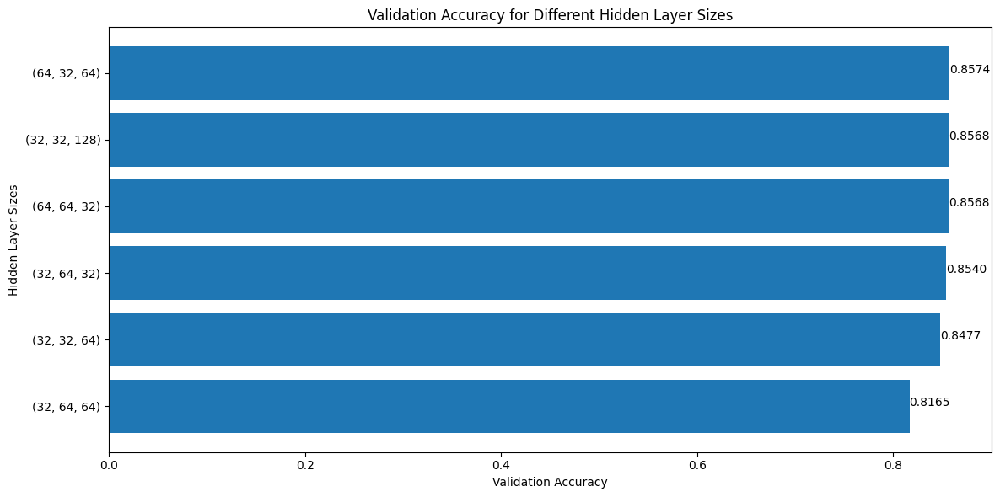

In [ ]:
# plot the results of hidden layer sizes experiment
plot_hidden_layer_results(hidden_size_df)

In [ ]:
MM_best_hidden_units = hidden_size_df.iloc[0]['Hidden Layer Sizes']
print(f"Best hidden layer sizes: {MM_best_hidden_units}")

Best hidden layer sizes: (64, 32, 64)


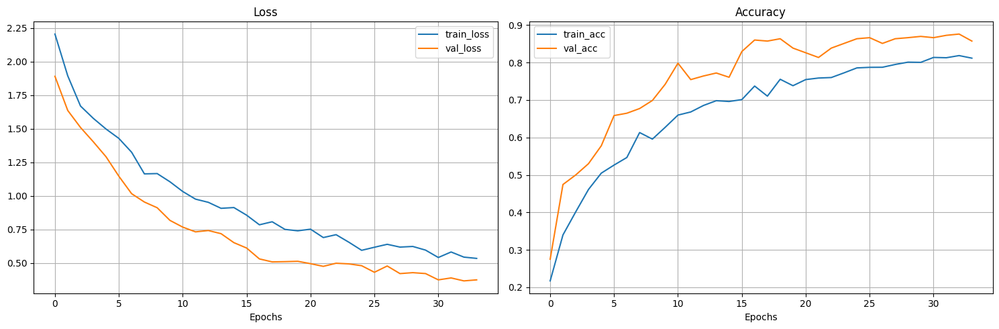

In [ ]:
# plot curves
plot_loss_curves(MM_model_hidden_results[MM_best_hidden_units])

As we see now, the gap is bigger, overfitting is no longer an issue, and validation accuracy has noticeably improved.

Experiment 4. Try different optimizers and learning rates.

In [ ]:
# experiment 4: optimizers and learning rates
MM_model_opt_results = experiment_optimizers_and_learning_rates(train_dataloader=train_dataloader_M,
                                                                val_dataloader=val_dataloader_M,
                                                                num_epochs=num_epochs,
                                                                device=device,
                                                                num_classes=num_classes,
                                                                best_hidden_units_combo=MM_best_hidden_units,
                                                                best_decay_value=MM_best_decay_value,
                                                                best_dropout_probs_combo=MM_best_dropout_probs,
                                                                learning_rates_list=learning_rates_list)

Experimenting with Optimizers and Learning Rates
Learning rates to try: [0.01, 0.001, 0.0001, 1e-05, 1e-06]
Optimizers to try: ['SGD', 'RMSprop', 'Adam', 'AdamW', 'NAdam']

Testing SGD optimizer...

Learning rate: 0.01... 



  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.3662 | train_acc: 0.1026 | val_loss: 2.3287 | val_acc: 0.1091
Epoch: 2 | train_loss: 2.3035 | train_acc: 0.1092 | val_loss: 2.2674 | val_acc: 0.1091
Epoch: 3 | train_loss: 2.2391 | train_acc: 0.1315 | val_loss: 2.2014 | val_acc: 0.1153
Epoch: 4 | train_loss: 2.1806 | train_acc: 0.1686 | val_loss: 2.1318 | val_acc: 0.1716
Epoch: 5 | train_loss: 2.1182 | train_acc: 0.2520 | val_loss: 2.0594 | val_acc: 0.3653
Epoch: 6 | train_loss: 2.0469 | train_acc: 0.3177 | val_loss: 1.9927 | val_acc: 0.4028
Epoch: 7 | train_loss: 1.9928 | train_acc: 0.3517 | val_loss: 1.9568 | val_acc: 0.4091
Epoch: 8 | train_loss: 1.9414 | train_acc: 0.3890 | val_loss: 1.8720 | val_acc: 0.4256
Epoch: 9 | train_loss: 1.8606 | train_acc: 0.4204 | val_loss: 1.8169 | val_acc: 0.4097
Epoch: 10 | train_loss: 1.8204 | train_acc: 0.3985 | val_loss: 1.7829 | val_acc: 0.4068
Epoch: 11 | train_loss: 1.7537 | train_acc: 0.4196 | val_loss: 1.7110 | val_acc: 0.4528
Epoch: 12 | train_loss: 1.7074 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.4055 | train_acc: 0.0747 | val_loss: 2.4030 | val_acc: 0.0614
Epoch: 2 | train_loss: 2.4053 | train_acc: 0.0789 | val_loss: 2.3950 | val_acc: 0.0761
Epoch: 3 | train_loss: 2.3822 | train_acc: 0.0878 | val_loss: 2.3870 | val_acc: 0.1153
Epoch: 4 | train_loss: 2.3736 | train_acc: 0.0953 | val_loss: 2.3792 | val_acc: 0.1091
Epoch: 5 | train_loss: 2.3665 | train_acc: 0.0871 | val_loss: 2.3703 | val_acc: 0.1091
Epoch: 6 | train_loss: 2.3591 | train_acc: 0.0978 | val_loss: 2.3620 | val_acc: 0.1091
Epoch: 7 | train_loss: 2.3487 | train_acc: 0.1174 | val_loss: 2.3531 | val_acc: 0.1091
Epoch: 8 | train_loss: 2.3332 | train_acc: 0.1190 | val_loss: 2.3428 | val_acc: 0.1091
Epoch: 9 | train_loss: 2.3199 | train_acc: 0.1084 | val_loss: 2.3321 | val_acc: 0.1091
Epoch: 10 | train_loss: 2.3057 | train_acc: 0.1182 | val_loss: 2.3196 | val_acc: 0.1091
Epoch: 11 | train_loss: 2.3060 | train_acc: 0.1173 | val_loss: 2.3086 | val_acc: 0.1091
Epoch: 12 | train_loss: 2.2924 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.4140 | train_acc: 0.0870 | val_loss: 2.4058 | val_acc: 0.0312
Epoch: 2 | train_loss: 2.4141 | train_acc: 0.0805 | val_loss: 2.4051 | val_acc: 0.0312
Epoch: 3 | train_loss: 2.4056 | train_acc: 0.0805 | val_loss: 2.4044 | val_acc: 0.0375
Epoch: 4 | train_loss: 2.3983 | train_acc: 0.1057 | val_loss: 2.4037 | val_acc: 0.0437
Epoch: 5 | train_loss: 2.4128 | train_acc: 0.0724 | val_loss: 2.4030 | val_acc: 0.0500
Epoch: 6 | train_loss: 2.4061 | train_acc: 0.0837 | val_loss: 2.4024 | val_acc: 0.0500
Epoch: 7 | train_loss: 2.3973 | train_acc: 0.0969 | val_loss: 2.4017 | val_acc: 0.0563
Epoch: 8 | train_loss: 2.4016 | train_acc: 0.0926 | val_loss: 2.4010 | val_acc: 0.0563
Epoch: 9 | train_loss: 2.4057 | train_acc: 0.0952 | val_loss: 2.4004 | val_acc: 0.0563
Epoch: 10 | train_loss: 2.4084 | train_acc: 0.0904 | val_loss: 2.3997 | val_acc: 0.0625
Epoch: 11 | train_loss: 2.4000 | train_acc: 0.0838 | val_loss: 2.3991 | val_acc: 0.0500
Epoch: 12 | train_loss: 2.4017 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.4193 | train_acc: 0.0755 | val_loss: 2.3951 | val_acc: 0.1534
Epoch: 2 | train_loss: 2.4228 | train_acc: 0.0714 | val_loss: 2.3950 | val_acc: 0.1534
Epoch: 3 | train_loss: 2.4315 | train_acc: 0.0755 | val_loss: 2.3949 | val_acc: 0.1534
Epoch: 4 | train_loss: 2.4278 | train_acc: 0.0690 | val_loss: 2.3949 | val_acc: 0.1534
Epoch: 5 | train_loss: 2.4138 | train_acc: 0.0904 | val_loss: 2.3948 | val_acc: 0.1534
Epoch: 6 | train_loss: 2.4280 | train_acc: 0.0731 | val_loss: 2.3947 | val_acc: 0.1534
Epoch: 7 | train_loss: 2.4253 | train_acc: 0.0745 | val_loss: 2.3946 | val_acc: 0.1534
Epoch: 8 | train_loss: 2.4194 | train_acc: 0.0827 | val_loss: 2.3945 | val_acc: 0.1534
Epoch: 9 | train_loss: 2.4217 | train_acc: 0.0780 | val_loss: 2.3944 | val_acc: 0.1534
Epoch: 10 | train_loss: 2.4211 | train_acc: 0.0885 | val_loss: 2.3944 | val_acc: 0.1534
Epoch: 11 | train_loss: 2.4280 | train_acc: 0.0780 | val_loss: 2.3943 | val_acc: 0.1534
Epoch: 12 | train_loss: 2.4245 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.4145 | train_acc: 0.0903 | val_loss: 2.4093 | val_acc: 0.0312
Epoch: 2 | train_loss: 2.4249 | train_acc: 0.0698 | val_loss: 2.4093 | val_acc: 0.0312
Epoch: 3 | train_loss: 2.4223 | train_acc: 0.0876 | val_loss: 2.4092 | val_acc: 0.0312
Epoch: 4 | train_loss: 2.4144 | train_acc: 0.0913 | val_loss: 2.4092 | val_acc: 0.0312
Epoch: 5 | train_loss: 2.4223 | train_acc: 0.0804 | val_loss: 2.4092 | val_acc: 0.0312
Epoch: 6 | train_loss: 2.4223 | train_acc: 0.0936 | val_loss: 2.4092 | val_acc: 0.0312
Epoch: 7 | train_loss: 2.4253 | train_acc: 0.0805 | val_loss: 2.4092 | val_acc: 0.0312
Epoch: 8 | train_loss: 2.4188 | train_acc: 0.0704 | val_loss: 2.4092 | val_acc: 0.0312
Epoch: 9 | train_loss: 2.4095 | train_acc: 0.0896 | val_loss: 2.4092 | val_acc: 0.0312
Epoch: 10 | train_loss: 2.4161 | train_acc: 0.0764 | val_loss: 2.4092 | val_acc: 0.0312
Epoch: 11 | train_loss: 2.4209 | train_acc: 0.0732 | val_loss: 2.4092 | val_acc: 0.0312
Epoch: 12 | train_loss: 2.4324 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 353.4058 | train_acc: 0.1274 | val_loss: 2.3571 | val_acc: 0.1375
Epoch: 2 | train_loss: 2.6430 | train_acc: 0.1060 | val_loss: 2.3938 | val_acc: 0.0750
Epoch: 3 | train_loss: 2.4091 | train_acc: 0.1143 | val_loss: 2.3545 | val_acc: 0.1091
Epoch: 4 | train_loss: 2.3970 | train_acc: 0.1027 | val_loss: 2.3732 | val_acc: 0.1062
Epoch: 5 | train_loss: 2.3966 | train_acc: 0.1265 | val_loss: 2.3707 | val_acc: 0.1062
Epoch: 6 | train_loss: 2.3834 | train_acc: 0.1117 | val_loss: 2.3782 | val_acc: 0.1375
Epoch: 7 | train_loss: 2.3986 | train_acc: 0.1110 | val_loss: 2.3759 | val_acc: 0.1062
Epoch: 8 | train_loss: 2.3703 | train_acc: 0.1216 | val_loss: 2.3477 | val_acc: 0.1375
Epoch: 9 | train_loss: 2.3906 | train_acc: 0.0954 | val_loss: 2.3678 | val_acc: 0.1062
Epoch: 10 | train_loss: 2.3811 | train_acc: 0.1165 | val_loss: 2.3593 | val_acc: 0.1375
Epoch: 11 | train_loss: 2.3866 | train_acc: 0.1101 | val_loss: 2.3516 | val_acc: 0.0750
Epoch: 12 | train_loss: 2.3934 | train_

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.2621 | train_acc: 0.2214 | val_loss: 1.7872 | val_acc: 0.2875
Epoch: 2 | train_loss: 1.8755 | train_acc: 0.3183 | val_loss: 1.6596 | val_acc: 0.4432
Epoch: 3 | train_loss: 1.6776 | train_acc: 0.3926 | val_loss: 1.5163 | val_acc: 0.4841
Epoch: 4 | train_loss: 1.5965 | train_acc: 0.4620 | val_loss: 1.3914 | val_acc: 0.5835
Epoch: 5 | train_loss: 1.4658 | train_acc: 0.4997 | val_loss: 1.2995 | val_acc: 0.5898
Epoch: 6 | train_loss: 1.3747 | train_acc: 0.5419 | val_loss: 1.0406 | val_acc: 0.6739
Epoch: 7 | train_loss: 1.2503 | train_acc: 0.5856 | val_loss: 1.0487 | val_acc: 0.6773
Epoch: 8 | train_loss: 1.1588 | train_acc: 0.5972 | val_loss: 0.8735 | val_acc: 0.7114
Epoch: 9 | train_loss: 1.0787 | train_acc: 0.6353 | val_loss: 0.7264 | val_acc: 0.7636
Epoch: 10 | train_loss: 1.0155 | train_acc: 0.6486 | val_loss: 0.6910 | val_acc: 0.7676
Epoch: 11 | train_loss: 0.9624 | train_acc: 0.6848 | val_loss: 0.6257 | val_acc: 0.7858
Epoch: 12 | train_loss: 0.8940 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.3056 | train_acc: 0.1148 | val_loss: 2.2340 | val_acc: 0.1153
Epoch: 2 | train_loss: 2.1879 | train_acc: 0.1663 | val_loss: 2.1266 | val_acc: 0.2591
Epoch: 3 | train_loss: 2.1320 | train_acc: 0.2646 | val_loss: 2.0949 | val_acc: 0.3841
Epoch: 4 | train_loss: 2.0336 | train_acc: 0.3358 | val_loss: 1.9768 | val_acc: 0.3966
Epoch: 5 | train_loss: 1.9451 | train_acc: 0.3784 | val_loss: 1.8621 | val_acc: 0.4091
Epoch: 6 | train_loss: 1.8419 | train_acc: 0.3973 | val_loss: 1.7370 | val_acc: 0.4653
Epoch: 7 | train_loss: 1.8079 | train_acc: 0.3963 | val_loss: 1.6718 | val_acc: 0.4403
Epoch: 8 | train_loss: 1.7542 | train_acc: 0.4129 | val_loss: 1.6106 | val_acc: 0.4903
Epoch: 9 | train_loss: 1.7515 | train_acc: 0.4122 | val_loss: 1.5771 | val_acc: 0.5182
Epoch: 10 | train_loss: 1.6618 | train_acc: 0.4375 | val_loss: 1.5487 | val_acc: 0.5028
Epoch: 11 | train_loss: 1.6573 | train_acc: 0.4367 | val_loss: 1.5151 | val_acc: 0.5091
Epoch: 12 | train_loss: 1.6369 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.3964 | train_acc: 0.0798 | val_loss: 2.3845 | val_acc: 0.1091
Epoch: 2 | train_loss: 2.3780 | train_acc: 0.0936 | val_loss: 2.3721 | val_acc: 0.1091
Epoch: 3 | train_loss: 2.3685 | train_acc: 0.0887 | val_loss: 2.3625 | val_acc: 0.1091
Epoch: 4 | train_loss: 2.3527 | train_acc: 0.0995 | val_loss: 2.3541 | val_acc: 0.1091
Epoch: 5 | train_loss: 2.3366 | train_acc: 0.1074 | val_loss: 2.3448 | val_acc: 0.1091
Epoch: 6 | train_loss: 2.3319 | train_acc: 0.1122 | val_loss: 2.3368 | val_acc: 0.1091
Epoch: 7 | train_loss: 2.3184 | train_acc: 0.1099 | val_loss: 2.3285 | val_acc: 0.1091
Epoch: 8 | train_loss: 2.3251 | train_acc: 0.1052 | val_loss: 2.3218 | val_acc: 0.1091
Epoch: 9 | train_loss: 2.3153 | train_acc: 0.1093 | val_loss: 2.3156 | val_acc: 0.1091
Epoch: 10 | train_loss: 2.3049 | train_acc: 0.1027 | val_loss: 2.3082 | val_acc: 0.1091
Epoch: 11 | train_loss: 2.2922 | train_acc: 0.1140 | val_loss: 2.3018 | val_acc: 0.1091
Epoch: 12 | train_loss: 2.2905 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.4124 | train_acc: 0.0919 | val_loss: 2.4032 | val_acc: 0.1125
Epoch: 2 | train_loss: 2.4027 | train_acc: 0.1010 | val_loss: 2.4021 | val_acc: 0.1125
Epoch: 3 | train_loss: 2.4079 | train_acc: 0.0911 | val_loss: 2.4010 | val_acc: 0.1062
Epoch: 4 | train_loss: 2.4040 | train_acc: 0.0967 | val_loss: 2.4000 | val_acc: 0.1062
Epoch: 5 | train_loss: 2.4111 | train_acc: 0.0968 | val_loss: 2.3992 | val_acc: 0.1062
Epoch: 6 | train_loss: 2.4057 | train_acc: 0.1011 | val_loss: 2.3984 | val_acc: 0.1062
Epoch: 7 | train_loss: 2.4014 | train_acc: 0.0902 | val_loss: 2.3976 | val_acc: 0.1000
Epoch: 8 | train_loss: 2.4096 | train_acc: 0.0929 | val_loss: 2.3969 | val_acc: 0.1000
Epoch: 9 | train_loss: 2.3895 | train_acc: 0.1084 | val_loss: 2.3961 | val_acc: 0.0938
Epoch: 10 | train_loss: 2.4006 | train_acc: 0.1061 | val_loss: 2.3954 | val_acc: 0.0938
Epoch: 11 | train_loss: 2.3912 | train_acc: 0.0951 | val_loss: 2.3946 | val_acc: 0.0938
Epoch: 12 | train_loss: 2.3969 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.3680 | train_acc: 0.1526 | val_loss: 2.1225 | val_acc: 0.2409
Epoch: 2 | train_loss: 2.1910 | train_acc: 0.2132 | val_loss: 2.0487 | val_acc: 0.2136
Epoch: 3 | train_loss: 2.1455 | train_acc: 0.2591 | val_loss: 2.0203 | val_acc: 0.2580
Epoch: 4 | train_loss: 2.0840 | train_acc: 0.3071 | val_loss: 2.0316 | val_acc: 0.2790
Epoch: 5 | train_loss: 2.1175 | train_acc: 0.2675 | val_loss: 1.8699 | val_acc: 0.3665
Epoch: 6 | train_loss: 2.0385 | train_acc: 0.2991 | val_loss: 2.0301 | val_acc: 0.2955
Epoch: 7 | train_loss: 2.0325 | train_acc: 0.2991 | val_loss: 2.0443 | val_acc: 0.3142
Epoch: 8 | train_loss: 2.1051 | train_acc: 0.2513 | val_loss: 2.1669 | val_acc: 0.2239
Epoch: 9 | train_loss: 2.1513 | train_acc: 0.2907 | val_loss: 2.1728 | val_acc: 0.1994
Epoch: 10 | train_loss: 2.2537 | train_acc: 0.2252 | val_loss: 2.2151 | val_acc: 0.1375
Epoch: 11 | train_loss: 2.1995 | train_acc: 0.2488 | val_loss: 2.2341 | val_acc: 0.1557
Epoch: 12 | train_loss: 2.1137 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.2380 | train_acc: 0.1680 | val_loss: 1.9936 | val_acc: 0.3250
Epoch: 2 | train_loss: 1.9074 | train_acc: 0.3199 | val_loss: 1.7106 | val_acc: 0.4625
Epoch: 3 | train_loss: 1.7272 | train_acc: 0.4028 | val_loss: 1.4968 | val_acc: 0.5489
Epoch: 4 | train_loss: 1.5687 | train_acc: 0.4702 | val_loss: 1.3756 | val_acc: 0.5062
Epoch: 5 | train_loss: 1.4403 | train_acc: 0.5099 | val_loss: 1.2239 | val_acc: 0.6369
Epoch: 6 | train_loss: 1.3678 | train_acc: 0.5490 | val_loss: 1.0766 | val_acc: 0.7023
Epoch: 7 | train_loss: 1.2200 | train_acc: 0.5776 | val_loss: 1.0083 | val_acc: 0.6835
Epoch: 8 | train_loss: 1.1131 | train_acc: 0.6132 | val_loss: 0.8552 | val_acc: 0.6983
Epoch: 9 | train_loss: 1.0267 | train_acc: 0.6548 | val_loss: 0.8448 | val_acc: 0.7239
Epoch: 10 | train_loss: 1.0441 | train_acc: 0.6298 | val_loss: 0.7613 | val_acc: 0.7665
Epoch: 11 | train_loss: 0.9826 | train_acc: 0.6715 | val_loss: 0.6971 | val_acc: 0.7267
Epoch: 12 | train_loss: 0.8965 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.3724 | train_acc: 0.1101 | val_loss: 2.3340 | val_acc: 0.1091
Epoch: 2 | train_loss: 2.2859 | train_acc: 0.1223 | val_loss: 2.2557 | val_acc: 0.1091
Epoch: 3 | train_loss: 2.2396 | train_acc: 0.1354 | val_loss: 2.1979 | val_acc: 0.1216
Epoch: 4 | train_loss: 2.1881 | train_acc: 0.1857 | val_loss: 2.1433 | val_acc: 0.2028
Epoch: 5 | train_loss: 2.1292 | train_acc: 0.2487 | val_loss: 2.0663 | val_acc: 0.3466
Epoch: 6 | train_loss: 2.0609 | train_acc: 0.3076 | val_loss: 1.9852 | val_acc: 0.3903
Epoch: 7 | train_loss: 1.9770 | train_acc: 0.3539 | val_loss: 1.8720 | val_acc: 0.4057
Epoch: 8 | train_loss: 1.9007 | train_acc: 0.3630 | val_loss: 1.7662 | val_acc: 0.4097
Epoch: 9 | train_loss: 1.8310 | train_acc: 0.3698 | val_loss: 1.7023 | val_acc: 0.4216
Epoch: 10 | train_loss: 1.7732 | train_acc: 0.3986 | val_loss: 1.6345 | val_acc: 0.4688
Epoch: 11 | train_loss: 1.7368 | train_acc: 0.4133 | val_loss: 1.5754 | val_acc: 0.5028
Epoch: 12 | train_loss: 1.6723 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.4273 | train_acc: 0.0805 | val_loss: 2.3982 | val_acc: 0.1261
Epoch: 2 | train_loss: 2.4059 | train_acc: 0.1000 | val_loss: 2.3909 | val_acc: 0.1381
Epoch: 3 | train_loss: 2.3931 | train_acc: 0.1149 | val_loss: 2.3842 | val_acc: 0.1528
Epoch: 4 | train_loss: 2.3845 | train_acc: 0.0902 | val_loss: 2.3778 | val_acc: 0.1335
Epoch: 5 | train_loss: 2.3712 | train_acc: 0.1066 | val_loss: 2.3709 | val_acc: 0.1335
Epoch: 6 | train_loss: 2.3598 | train_acc: 0.1149 | val_loss: 2.3641 | val_acc: 0.1091
Epoch: 7 | train_loss: 2.3474 | train_acc: 0.1173 | val_loss: 2.3567 | val_acc: 0.1091
Epoch: 8 | train_loss: 2.3352 | train_acc: 0.1265 | val_loss: 2.3483 | val_acc: 0.1091
Epoch: 9 | train_loss: 2.3249 | train_acc: 0.1211 | val_loss: 2.3404 | val_acc: 0.1091
Epoch: 10 | train_loss: 2.3218 | train_acc: 0.1182 | val_loss: 2.3316 | val_acc: 0.1091
Epoch: 11 | train_loss: 2.3096 | train_acc: 0.1148 | val_loss: 2.3230 | val_acc: 0.1091
Epoch: 12 | train_loss: 2.3068 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.4047 | train_acc: 0.0935 | val_loss: 2.3971 | val_acc: 0.0813
Epoch: 2 | train_loss: 2.4010 | train_acc: 0.0968 | val_loss: 2.3959 | val_acc: 0.0813
Epoch: 3 | train_loss: 2.4043 | train_acc: 0.1116 | val_loss: 2.3947 | val_acc: 0.0813
Epoch: 4 | train_loss: 2.3988 | train_acc: 0.0935 | val_loss: 2.3937 | val_acc: 0.0813
Epoch: 5 | train_loss: 2.4005 | train_acc: 0.1001 | val_loss: 2.3926 | val_acc: 0.0813
Epoch: 6 | train_loss: 2.4013 | train_acc: 0.1011 | val_loss: 2.3916 | val_acc: 0.0813
Epoch: 7 | train_loss: 2.3944 | train_acc: 0.1075 | val_loss: 2.3904 | val_acc: 0.0813
Epoch: 8 | train_loss: 2.4017 | train_acc: 0.0820 | val_loss: 2.3893 | val_acc: 0.0813
Epoch: 9 | train_loss: 2.3818 | train_acc: 0.1159 | val_loss: 2.3882 | val_acc: 0.0813
Epoch: 10 | train_loss: 2.3859 | train_acc: 0.1016 | val_loss: 2.3872 | val_acc: 0.0813
Epoch: 11 | train_loss: 2.3912 | train_acc: 0.0936 | val_loss: 2.3862 | val_acc: 0.0813
Epoch: 12 | train_loss: 2.3942 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.3601 | train_acc: 0.1920 | val_loss: 2.1713 | val_acc: 0.2074
Epoch: 2 | train_loss: 2.0668 | train_acc: 0.2545 | val_loss: 2.0188 | val_acc: 0.2477
Epoch: 3 | train_loss: 2.0714 | train_acc: 0.2744 | val_loss: 2.1036 | val_acc: 0.2386
Epoch: 4 | train_loss: 2.0439 | train_acc: 0.2646 | val_loss: 2.1473 | val_acc: 0.1460
Epoch: 5 | train_loss: 2.0363 | train_acc: 0.2741 | val_loss: 2.1321 | val_acc: 0.2114
Epoch: 6 | train_loss: 2.0675 | train_acc: 0.2806 | val_loss: 2.2661 | val_acc: 0.2148
Epoch: 7 | train_loss: 2.1393 | train_acc: 0.2383 | val_loss: 1.8490 | val_acc: 0.3563
Epoch: 8 | train_loss: 2.1530 | train_acc: 0.2473 | val_loss: 2.0946 | val_acc: 0.2511
Epoch: 9 | train_loss: 2.1235 | train_acc: 0.2605 | val_loss: 2.0983 | val_acc: 0.2506
Epoch: 10 | train_loss: 2.1731 | train_acc: 0.2445 | val_loss: 2.5291 | val_acc: 0.1062
Epoch: 11 | train_loss: 2.3953 | train_acc: 0.1223 | val_loss: 2.3595 | val_acc: 0.1375
Epoch: 12 | train_loss: 2.3037 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.2275 | train_acc: 0.1885 | val_loss: 1.9828 | val_acc: 0.3119
Epoch: 2 | train_loss: 1.8753 | train_acc: 0.3268 | val_loss: 1.6595 | val_acc: 0.3750
Epoch: 3 | train_loss: 1.7263 | train_acc: 0.3944 | val_loss: 1.6304 | val_acc: 0.3847
Epoch: 4 | train_loss: 1.5396 | train_acc: 0.4788 | val_loss: 1.3052 | val_acc: 0.5710
Epoch: 5 | train_loss: 1.4269 | train_acc: 0.5314 | val_loss: 1.1951 | val_acc: 0.5932
Epoch: 6 | train_loss: 1.3397 | train_acc: 0.5655 | val_loss: 1.1537 | val_acc: 0.5972
Epoch: 7 | train_loss: 1.2847 | train_acc: 0.5584 | val_loss: 1.0194 | val_acc: 0.6955
Epoch: 8 | train_loss: 1.1873 | train_acc: 0.5855 | val_loss: 0.8940 | val_acc: 0.6960
Epoch: 9 | train_loss: 1.0673 | train_acc: 0.6294 | val_loss: 0.8581 | val_acc: 0.7017
Epoch: 10 | train_loss: 1.0447 | train_acc: 0.6524 | val_loss: 0.7098 | val_acc: 0.7608
Epoch: 11 | train_loss: 0.9887 | train_acc: 0.6449 | val_loss: 0.6963 | val_acc: 0.7455
Epoch: 12 | train_loss: 0.9438 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.3489 | train_acc: 0.1002 | val_loss: 2.3056 | val_acc: 0.1091
Epoch: 2 | train_loss: 2.2725 | train_acc: 0.1238 | val_loss: 2.2530 | val_acc: 0.1091
Epoch: 3 | train_loss: 2.2222 | train_acc: 0.1559 | val_loss: 2.1960 | val_acc: 0.2341
Epoch: 4 | train_loss: 2.1636 | train_acc: 0.2281 | val_loss: 2.1268 | val_acc: 0.3028
Epoch: 5 | train_loss: 2.1167 | train_acc: 0.2658 | val_loss: 2.0657 | val_acc: 0.3278
Epoch: 6 | train_loss: 2.0459 | train_acc: 0.3155 | val_loss: 1.9722 | val_acc: 0.3716
Epoch: 7 | train_loss: 1.9244 | train_acc: 0.3523 | val_loss: 1.8463 | val_acc: 0.3966
Epoch: 8 | train_loss: 1.8631 | train_acc: 0.3666 | val_loss: 1.7613 | val_acc: 0.4307
Epoch: 9 | train_loss: 1.8025 | train_acc: 0.3989 | val_loss: 1.6806 | val_acc: 0.4341
Epoch: 10 | train_loss: 1.7535 | train_acc: 0.4048 | val_loss: 1.6206 | val_acc: 0.4313
Epoch: 11 | train_loss: 1.7007 | train_acc: 0.4172 | val_loss: 1.5610 | val_acc: 0.4778
Epoch: 12 | train_loss: 1.6950 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.3993 | train_acc: 0.1073 | val_loss: 2.3816 | val_acc: 0.1688
Epoch: 2 | train_loss: 2.3904 | train_acc: 0.1125 | val_loss: 2.3750 | val_acc: 0.2540
Epoch: 3 | train_loss: 2.3766 | train_acc: 0.1248 | val_loss: 2.3692 | val_acc: 0.2415
Epoch: 4 | train_loss: 2.3611 | train_acc: 0.1322 | val_loss: 2.3624 | val_acc: 0.1983
Epoch: 5 | train_loss: 2.3575 | train_acc: 0.1316 | val_loss: 2.3553 | val_acc: 0.1642
Epoch: 6 | train_loss: 2.3429 | train_acc: 0.1418 | val_loss: 2.3475 | val_acc: 0.1580
Epoch: 7 | train_loss: 2.3246 | train_acc: 0.1423 | val_loss: 2.3385 | val_acc: 0.1426
Epoch: 8 | train_loss: 2.3214 | train_acc: 0.1255 | val_loss: 2.3293 | val_acc: 0.1244
Epoch: 9 | train_loss: 2.3207 | train_acc: 0.1249 | val_loss: 2.3202 | val_acc: 0.1153
Epoch: 10 | train_loss: 2.3080 | train_acc: 0.1312 | val_loss: 2.3113 | val_acc: 0.1153
Epoch: 11 | train_loss: 2.2983 | train_acc: 0.1296 | val_loss: 2.3021 | val_acc: 0.1153
Epoch: 12 | train_loss: 2.2987 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.4526 | train_acc: 0.0722 | val_loss: 2.4166 | val_acc: 0.0813
Epoch: 2 | train_loss: 2.4384 | train_acc: 0.0863 | val_loss: 2.4153 | val_acc: 0.0875
Epoch: 3 | train_loss: 2.4465 | train_acc: 0.0878 | val_loss: 2.4138 | val_acc: 0.0938
Epoch: 4 | train_loss: 2.4253 | train_acc: 0.1049 | val_loss: 2.4126 | val_acc: 0.0875
Epoch: 5 | train_loss: 2.4457 | train_acc: 0.0952 | val_loss: 2.4113 | val_acc: 0.0938
Epoch: 6 | train_loss: 2.4244 | train_acc: 0.0862 | val_loss: 2.4101 | val_acc: 0.0938
Epoch: 7 | train_loss: 2.4361 | train_acc: 0.0912 | val_loss: 2.4088 | val_acc: 0.0938
Epoch: 8 | train_loss: 2.4242 | train_acc: 0.0872 | val_loss: 2.4076 | val_acc: 0.0938
Epoch: 9 | train_loss: 2.4263 | train_acc: 0.0929 | val_loss: 2.4064 | val_acc: 0.0938
Epoch: 10 | train_loss: 2.4174 | train_acc: 0.0926 | val_loss: 2.4053 | val_acc: 0.1000
Epoch: 11 | train_loss: 2.4258 | train_acc: 0.0868 | val_loss: 2.4043 | val_acc: 0.1062
Epoch: 12 | train_loss: 2.4211 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.4856 | train_acc: 0.1141 | val_loss: 2.3697 | val_acc: 0.0750
Epoch: 2 | train_loss: 2.3662 | train_acc: 0.1126 | val_loss: 2.3660 | val_acc: 0.0750
Epoch: 3 | train_loss: 3.1742 | train_acc: 0.1067 | val_loss: 2.3617 | val_acc: 0.0750
Epoch: 4 | train_loss: 2.3720 | train_acc: 0.1236 | val_loss: 2.3740 | val_acc: 0.1062
Epoch: 5 | train_loss: 2.3763 | train_acc: 0.1249 | val_loss: 2.3830 | val_acc: 0.1062
Epoch: 6 | train_loss: 2.3720 | train_acc: 0.1174 | val_loss: 2.3669 | val_acc: 0.0750
Epoch: 7 | train_loss: 2.3707 | train_acc: 0.1286 | val_loss: 2.3614 | val_acc: 0.1062
Epoch: 8 | train_loss: 2.3717 | train_acc: 0.1326 | val_loss: 2.3732 | val_acc: 0.1062
Epoch: 9 | train_loss: 2.3716 | train_acc: 0.1222 | val_loss: 2.3666 | val_acc: 0.1375
Epoch: 10 | train_loss: 2.3731 | train_acc: 0.1041 | val_loss: 2.3724 | val_acc: 0.1062
Epoch: 11 | train_loss: 2.3699 | train_acc: 0.1093 | val_loss: 2.3618 | val_acc: 0.0750
Epoch: 12 | train_loss: 2.3683 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.2607 | train_acc: 0.1509 | val_loss: 2.1662 | val_acc: 0.2313
Epoch: 2 | train_loss: 1.9715 | train_acc: 0.3332 | val_loss: 1.8302 | val_acc: 0.3477
Epoch: 3 | train_loss: 1.7197 | train_acc: 0.4255 | val_loss: 1.4802 | val_acc: 0.5188
Epoch: 4 | train_loss: 1.6222 | train_acc: 0.4500 | val_loss: 1.4136 | val_acc: 0.5835
Epoch: 5 | train_loss: 1.4066 | train_acc: 0.5143 | val_loss: 1.2035 | val_acc: 0.6085
Epoch: 6 | train_loss: 1.3199 | train_acc: 0.5497 | val_loss: 1.0432 | val_acc: 0.6744
Epoch: 7 | train_loss: 1.1938 | train_acc: 0.6000 | val_loss: 0.8979 | val_acc: 0.7051
Epoch: 8 | train_loss: 1.1348 | train_acc: 0.6002 | val_loss: 0.7961 | val_acc: 0.7267
Epoch: 9 | train_loss: 1.0261 | train_acc: 0.6314 | val_loss: 0.7719 | val_acc: 0.7580
Epoch: 10 | train_loss: 0.9833 | train_acc: 0.6617 | val_loss: 0.8589 | val_acc: 0.7051
Epoch: 11 | train_loss: 0.9563 | train_acc: 0.6633 | val_loss: 0.6630 | val_acc: 0.7761
Epoch: 12 | train_loss: 0.9223 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.3629 | train_acc: 0.0977 | val_loss: 2.3308 | val_acc: 0.1091
Epoch: 2 | train_loss: 2.2997 | train_acc: 0.1149 | val_loss: 2.2691 | val_acc: 0.1091
Epoch: 3 | train_loss: 2.2372 | train_acc: 0.1419 | val_loss: 2.2096 | val_acc: 0.1153
Epoch: 4 | train_loss: 2.1859 | train_acc: 0.1552 | val_loss: 2.1525 | val_acc: 0.1841
Epoch: 5 | train_loss: 2.1199 | train_acc: 0.2124 | val_loss: 2.0770 | val_acc: 0.2341
Epoch: 6 | train_loss: 2.0539 | train_acc: 0.2734 | val_loss: 2.0036 | val_acc: 0.4278
Epoch: 7 | train_loss: 1.9594 | train_acc: 0.3401 | val_loss: 1.9145 | val_acc: 0.4625
Epoch: 8 | train_loss: 1.9019 | train_acc: 0.3997 | val_loss: 1.8310 | val_acc: 0.4750
Epoch: 9 | train_loss: 1.8337 | train_acc: 0.3961 | val_loss: 1.7494 | val_acc: 0.4625
Epoch: 10 | train_loss: 1.7916 | train_acc: 0.4097 | val_loss: 1.7002 | val_acc: 0.4625
Epoch: 11 | train_loss: 1.7653 | train_acc: 0.4226 | val_loss: 1.6437 | val_acc: 0.4562
Epoch: 12 | train_loss: 1.7106 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.4146 | train_acc: 0.1075 | val_loss: 2.3889 | val_acc: 0.1062
Epoch: 2 | train_loss: 2.3975 | train_acc: 0.0962 | val_loss: 2.3817 | val_acc: 0.1636
Epoch: 3 | train_loss: 2.3920 | train_acc: 0.1139 | val_loss: 2.3746 | val_acc: 0.1750
Epoch: 4 | train_loss: 2.3783 | train_acc: 0.0986 | val_loss: 2.3675 | val_acc: 0.1153
Epoch: 5 | train_loss: 2.3582 | train_acc: 0.1208 | val_loss: 2.3602 | val_acc: 0.1091
Epoch: 6 | train_loss: 2.3552 | train_acc: 0.1215 | val_loss: 2.3535 | val_acc: 0.1091
Epoch: 7 | train_loss: 2.3407 | train_acc: 0.1151 | val_loss: 2.3457 | val_acc: 0.1091
Epoch: 8 | train_loss: 2.3376 | train_acc: 0.1176 | val_loss: 2.3379 | val_acc: 0.1091
Epoch: 9 | train_loss: 2.3173 | train_acc: 0.1282 | val_loss: 2.3298 | val_acc: 0.1091
Epoch: 10 | train_loss: 2.3163 | train_acc: 0.1280 | val_loss: 2.3214 | val_acc: 0.1091
Epoch: 11 | train_loss: 2.3038 | train_acc: 0.1214 | val_loss: 2.3127 | val_acc: 0.1091
Epoch: 12 | train_loss: 2.2857 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.3975 | train_acc: 0.0912 | val_loss: 2.3938 | val_acc: 0.1500
Epoch: 2 | train_loss: 2.3951 | train_acc: 0.1060 | val_loss: 2.3927 | val_acc: 0.1500
Epoch: 3 | train_loss: 2.4018 | train_acc: 0.0978 | val_loss: 2.3917 | val_acc: 0.1500
Epoch: 4 | train_loss: 2.4010 | train_acc: 0.0938 | val_loss: 2.3907 | val_acc: 0.1500
Epoch: 5 | train_loss: 2.3974 | train_acc: 0.1085 | val_loss: 2.3896 | val_acc: 0.1591
Epoch: 6 | train_loss: 2.4015 | train_acc: 0.1026 | val_loss: 2.3886 | val_acc: 0.1591
Epoch: 7 | train_loss: 2.3908 | train_acc: 0.0895 | val_loss: 2.3875 | val_acc: 0.1591
Epoch: 8 | train_loss: 2.3840 | train_acc: 0.1171 | val_loss: 2.3866 | val_acc: 0.1591
Epoch: 9 | train_loss: 2.3901 | train_acc: 0.1003 | val_loss: 2.3856 | val_acc: 0.1591
Epoch: 10 | train_loss: 2.3948 | train_acc: 0.1042 | val_loss: 2.3846 | val_acc: 0.1682
Epoch: 11 | train_loss: 2.3826 | train_acc: 0.1181 | val_loss: 2.3837 | val_acc: 0.1682
Epoch: 12 | train_loss: 2.3869 | train_ac

In [ ]:
# put all the results in a table and print it in desc order (results in a list in this case)
optimizers_df = pd.DataFrame(MM_model_opt_results, columns=['Optimizer', 'Best Learning Rate', 'Validation Accuracy'])
optimizers_df = optimizers_df.sort_values(by='Validation Accuracy', ascending=False)
print("\n", optimizers_df.to_string(index=False))


 Optimizer  Best Learning Rate  Validation Accuracy
    AdamW               0.001             0.869318
     Adam               0.001             0.865909
    NAdam               0.001             0.857386
  RMSprop               0.001             0.856818
      SGD               0.010             0.705114


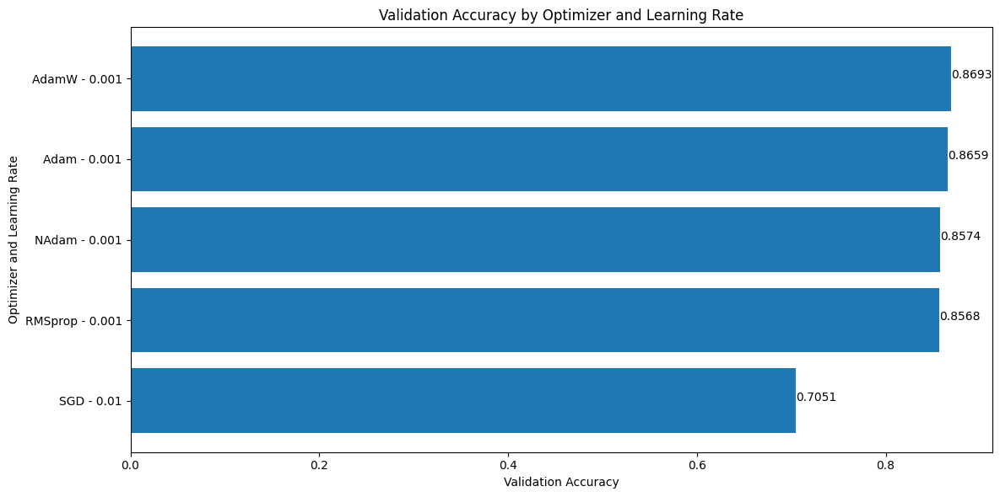

In [ ]:
# plot the results of the experiment
plot_optimizers_results(optimizers_df)

In [ ]:
# get and print best optimizer and learning rate
MM_best_optimizer_name = optimizers_df.iloc[0]['Optimizer']
MM_best_optimizer = torch.optim.__dict__[MM_best_optimizer_name]
print(f"Best optimizer: {MM_best_optimizer_name}")
MM_best_learning_rate = optimizers_df.iloc[0]['Best Learning Rate']
print(f"Best learning rate: {MM_best_learning_rate}")

Best optimizer: AdamW
Best learning rate: 0.001


Experiment 5. Try various activation functions.

In [ ]:
# experiment 5: activation functions
MM_model_act_fn_results = experiment_activation_functions(train_dataloader=train_dataloader_M,
                                                          val_dataloader=val_dataloader_M,
                                                          num_epochs=num_epochs,
                                                          device=device,
                                                          num_classes=num_classes,
                                                          best_hidden_units_combo=MM_best_hidden_units,
                                                          best_decay_value=MM_best_decay_value,
                                                          best_dropout_probs_combo=MM_best_dropout_probs,
                                                          best_optimizer=MM_best_optimizer,
                                                          best_learning_rate=MM_best_learning_rate)

Experimenting with Activation Functions
Activation functions to try: ['ReLU', 'LeakyReLU', 'ELU', 'GELU', 'SiLU']

Testing ReLU activation function as activation function in feature extractor...

Testing ReLU activation function as activation function in classifier...


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.3065 | train_acc: 0.1083 | val_loss: 2.2797 | val_acc: 0.2568
Epoch: 2 | train_loss: 2.1172 | train_acc: 0.2552 | val_loss: 1.9548 | val_acc: 0.3284
Epoch: 3 | train_loss: 1.9307 | train_acc: 0.3178 | val_loss: 1.7609 | val_acc: 0.4000
Epoch: 4 | train_loss: 1.8009 | train_acc: 0.3511 | val_loss: 1.7035 | val_acc: 0.3875
Epoch: 5 | train_loss: 1.7047 | train_acc: 0.4073 | val_loss: 1.5674 | val_acc: 0.4653
Epoch: 6 | train_loss: 1.6707 | train_acc: 0.3943 | val_loss: 1.4792 | val_acc: 0.4437
Epoch: 7 | train_loss: 1.6100 | train_acc: 0.4271 | val_loss: 1.3931 | val_acc: 0.5710
Epoch: 8 | train_loss: 1.5259 | train_acc: 0.4852 | val_loss: 1.3726 | val_acc: 0.5591
Epoch: 9 | train_loss: 1.4521 | train_acc: 0.5158 | val_loss: 1.2235 | val_acc: 0.6239
Epoch: 10 | train_loss: 1.3800 | train_acc: 0.5281 | val_loss: 1.1481 | val_acc: 0.6551
Epoch: 11 | train_loss: 1.3559 | train_acc: 0.5413 | val_loss: 1.0353 | val_acc: 0.7205
Epoch: 12 | train_loss: 1.2929 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.2853 | train_acc: 0.1344 | val_loss: 2.1155 | val_acc: 0.2591
Epoch: 2 | train_loss: 2.0265 | train_acc: 0.2805 | val_loss: 1.7910 | val_acc: 0.3375
Epoch: 3 | train_loss: 1.8073 | train_acc: 0.3518 | val_loss: 1.5851 | val_acc: 0.4528
Epoch: 4 | train_loss: 1.6947 | train_acc: 0.4099 | val_loss: 1.5067 | val_acc: 0.5210
Epoch: 5 | train_loss: 1.6083 | train_acc: 0.4459 | val_loss: 1.3832 | val_acc: 0.5278
Epoch: 6 | train_loss: 1.5086 | train_acc: 0.4857 | val_loss: 1.3147 | val_acc: 0.5960
Epoch: 7 | train_loss: 1.4235 | train_acc: 0.5049 | val_loss: 1.2221 | val_acc: 0.6062
Epoch: 8 | train_loss: 1.3520 | train_acc: 0.5268 | val_loss: 1.1414 | val_acc: 0.6455
Epoch: 9 | train_loss: 1.3059 | train_acc: 0.5634 | val_loss: 1.0142 | val_acc: 0.6619
Epoch: 10 | train_loss: 1.2347 | train_acc: 0.5732 | val_loss: 0.9885 | val_acc: 0.6676
Epoch: 11 | train_loss: 1.1296 | train_acc: 0.6051 | val_loss: 0.8711 | val_acc: 0.6989
Epoch: 12 | train_loss: 1.0878 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.2277 | train_acc: 0.1982 | val_loss: 1.9988 | val_acc: 0.3063
Epoch: 2 | train_loss: 1.9187 | train_acc: 0.3430 | val_loss: 1.7838 | val_acc: 0.3812
Epoch: 3 | train_loss: 1.7030 | train_acc: 0.3898 | val_loss: 1.6303 | val_acc: 0.4227
Epoch: 4 | train_loss: 1.6169 | train_acc: 0.4411 | val_loss: 1.3744 | val_acc: 0.5625
Epoch: 5 | train_loss: 1.4296 | train_acc: 0.5216 | val_loss: 1.1973 | val_acc: 0.6494
Epoch: 6 | train_loss: 1.3083 | train_acc: 0.5542 | val_loss: 1.0365 | val_acc: 0.6705
Epoch: 7 | train_loss: 1.2066 | train_acc: 0.5853 | val_loss: 0.9369 | val_acc: 0.6835
Epoch: 8 | train_loss: 1.1318 | train_acc: 0.6058 | val_loss: 0.8614 | val_acc: 0.6994
Epoch: 9 | train_loss: 1.0615 | train_acc: 0.6249 | val_loss: 0.8368 | val_acc: 0.7028
Epoch: 10 | train_loss: 1.0298 | train_acc: 0.6331 | val_loss: 0.7790 | val_acc: 0.7511
Epoch: 11 | train_loss: 1.0110 | train_acc: 0.6388 | val_loss: 0.7015 | val_acc: 0.7670
Epoch: 12 | train_loss: 0.9187 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.2607 | train_acc: 0.1299 | val_loss: 2.1044 | val_acc: 0.2125
Epoch: 2 | train_loss: 2.0486 | train_acc: 0.3053 | val_loss: 2.0325 | val_acc: 0.3074
Epoch: 3 | train_loss: 1.8365 | train_acc: 0.3818 | val_loss: 1.6465 | val_acc: 0.4125
Epoch: 4 | train_loss: 1.6672 | train_acc: 0.4368 | val_loss: 1.4145 | val_acc: 0.5153
Epoch: 5 | train_loss: 1.5721 | train_acc: 0.4617 | val_loss: 1.3592 | val_acc: 0.5409
Epoch: 6 | train_loss: 1.5085 | train_acc: 0.5105 | val_loss: 1.2448 | val_acc: 0.6125
Epoch: 7 | train_loss: 1.3250 | train_acc: 0.5517 | val_loss: 1.1730 | val_acc: 0.5591
Epoch: 8 | train_loss: 1.2734 | train_acc: 0.5699 | val_loss: 1.0281 | val_acc: 0.6648
Epoch: 9 | train_loss: 1.2044 | train_acc: 0.5806 | val_loss: 1.0069 | val_acc: 0.6472
Epoch: 10 | train_loss: 1.1288 | train_acc: 0.5966 | val_loss: 0.9598 | val_acc: 0.6739
Epoch: 11 | train_loss: 1.1029 | train_acc: 0.6339 | val_loss: 0.9208 | val_acc: 0.7023
Epoch: 12 | train_loss: 1.0738 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.2563 | train_acc: 0.1747 | val_loss: 2.2244 | val_acc: 0.2881
Epoch: 2 | train_loss: 2.0468 | train_acc: 0.3135 | val_loss: 1.8011 | val_acc: 0.4534
Epoch: 3 | train_loss: 1.8129 | train_acc: 0.3776 | val_loss: 1.6104 | val_acc: 0.5341
Epoch: 4 | train_loss: 1.7225 | train_acc: 0.4133 | val_loss: 1.5090 | val_acc: 0.5494
Epoch: 5 | train_loss: 1.5699 | train_acc: 0.4764 | val_loss: 1.4225 | val_acc: 0.6057
Epoch: 6 | train_loss: 1.3896 | train_acc: 0.5470 | val_loss: 1.1900 | val_acc: 0.6989
Epoch: 7 | train_loss: 1.2877 | train_acc: 0.5851 | val_loss: 0.9999 | val_acc: 0.7142
Epoch: 8 | train_loss: 1.1679 | train_acc: 0.6144 | val_loss: 0.9217 | val_acc: 0.7301
Epoch: 9 | train_loss: 1.1510 | train_acc: 0.6327 | val_loss: 0.8515 | val_acc: 0.7517
Epoch: 10 | train_loss: 1.0518 | train_acc: 0.6257 | val_loss: 0.7865 | val_acc: 0.7517
Epoch: 11 | train_loss: 0.9718 | train_acc: 0.6694 | val_loss: 0.7382 | val_acc: 0.7790
Epoch: 12 | train_loss: 0.9304 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.2972 | train_acc: 0.1328 | val_loss: 2.1585 | val_acc: 0.2437
Epoch: 2 | train_loss: 2.1382 | train_acc: 0.2842 | val_loss: 2.0309 | val_acc: 0.3187
Epoch: 3 | train_loss: 1.9640 | train_acc: 0.3127 | val_loss: 1.8646 | val_acc: 0.3665
Epoch: 4 | train_loss: 1.8178 | train_acc: 0.3542 | val_loss: 1.6636 | val_acc: 0.4119
Epoch: 5 | train_loss: 1.7136 | train_acc: 0.3864 | val_loss: 1.5935 | val_acc: 0.4341
Epoch: 6 | train_loss: 1.6694 | train_acc: 0.3884 | val_loss: 1.5201 | val_acc: 0.4841
Epoch: 7 | train_loss: 1.5440 | train_acc: 0.4697 | val_loss: 1.2828 | val_acc: 0.6091
Epoch: 8 | train_loss: 1.4453 | train_acc: 0.5089 | val_loss: 1.2315 | val_acc: 0.5966
Epoch: 9 | train_loss: 1.4186 | train_acc: 0.5230 | val_loss: 1.0702 | val_acc: 0.7017
Epoch: 10 | train_loss: 1.2725 | train_acc: 0.5458 | val_loss: 1.0094 | val_acc: 0.7142
Epoch: 11 | train_loss: 1.2508 | train_acc: 0.5710 | val_loss: 0.9380 | val_acc: 0.7114
Epoch: 12 | train_loss: 1.1846 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.2690 | train_acc: 0.1507 | val_loss: 2.0871 | val_acc: 0.1903
Epoch: 2 | train_loss: 2.0636 | train_acc: 0.2849 | val_loss: 1.8307 | val_acc: 0.3403
Epoch: 3 | train_loss: 1.8479 | train_acc: 0.3553 | val_loss: 1.6537 | val_acc: 0.4188
Epoch: 4 | train_loss: 1.7295 | train_acc: 0.3856 | val_loss: 1.5434 | val_acc: 0.4903
Epoch: 5 | train_loss: 1.6421 | train_acc: 0.4281 | val_loss: 1.3971 | val_acc: 0.4903
Epoch: 6 | train_loss: 1.5342 | train_acc: 0.4819 | val_loss: 1.2941 | val_acc: 0.5528
Epoch: 7 | train_loss: 1.5121 | train_acc: 0.4911 | val_loss: 1.1967 | val_acc: 0.6182
Epoch: 8 | train_loss: 1.3524 | train_acc: 0.5265 | val_loss: 1.1202 | val_acc: 0.5966
Epoch: 9 | train_loss: 1.2672 | train_acc: 0.5476 | val_loss: 1.0360 | val_acc: 0.6585
Epoch: 10 | train_loss: 1.2747 | train_acc: 0.5552 | val_loss: 1.0387 | val_acc: 0.6278
Epoch: 11 | train_loss: 1.1974 | train_acc: 0.5681 | val_loss: 0.9487 | val_acc: 0.7017
Epoch: 12 | train_loss: 1.0935 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.2618 | train_acc: 0.1493 | val_loss: 2.0918 | val_acc: 0.1716
Epoch: 2 | train_loss: 2.0299 | train_acc: 0.3184 | val_loss: 1.7535 | val_acc: 0.3688
Epoch: 3 | train_loss: 1.7798 | train_acc: 0.3631 | val_loss: 1.6222 | val_acc: 0.4188
Epoch: 4 | train_loss: 1.6263 | train_acc: 0.4438 | val_loss: 1.3582 | val_acc: 0.5125
Epoch: 5 | train_loss: 1.4952 | train_acc: 0.4894 | val_loss: 1.2657 | val_acc: 0.5585
Epoch: 6 | train_loss: 1.3147 | train_acc: 0.5572 | val_loss: 1.0797 | val_acc: 0.6585
Epoch: 7 | train_loss: 1.1926 | train_acc: 0.5946 | val_loss: 0.9328 | val_acc: 0.7205
Epoch: 8 | train_loss: 1.1346 | train_acc: 0.6206 | val_loss: 0.8300 | val_acc: 0.7142
Epoch: 9 | train_loss: 1.0260 | train_acc: 0.6525 | val_loss: 0.8103 | val_acc: 0.7705
Epoch: 10 | train_loss: 1.0337 | train_acc: 0.6450 | val_loss: 0.7878 | val_acc: 0.7415
Epoch: 11 | train_loss: 0.9771 | train_acc: 0.6676 | val_loss: 0.6820 | val_acc: 0.7636
Epoch: 12 | train_loss: 0.9073 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.2947 | train_acc: 0.1230 | val_loss: 2.1225 | val_acc: 0.1653
Epoch: 2 | train_loss: 2.0649 | train_acc: 0.2675 | val_loss: 1.8073 | val_acc: 0.3375
Epoch: 3 | train_loss: 1.7887 | train_acc: 0.3902 | val_loss: 1.5528 | val_acc: 0.4688
Epoch: 4 | train_loss: 1.6736 | train_acc: 0.4195 | val_loss: 1.4507 | val_acc: 0.4909
Epoch: 5 | train_loss: 1.5873 | train_acc: 0.4926 | val_loss: 1.2718 | val_acc: 0.5841
Epoch: 6 | train_loss: 1.4412 | train_acc: 0.5236 | val_loss: 1.1944 | val_acc: 0.6148
Epoch: 7 | train_loss: 1.3401 | train_acc: 0.5444 | val_loss: 1.0222 | val_acc: 0.6614
Epoch: 8 | train_loss: 1.2352 | train_acc: 0.5858 | val_loss: 0.9533 | val_acc: 0.7051
Epoch: 9 | train_loss: 1.1857 | train_acc: 0.6057 | val_loss: 0.9110 | val_acc: 0.7324
Epoch: 10 | train_loss: 1.1072 | train_acc: 0.6164 | val_loss: 0.8699 | val_acc: 0.7170
Epoch: 11 | train_loss: 1.0422 | train_acc: 0.6411 | val_loss: 0.7440 | val_acc: 0.7761
Epoch: 12 | train_loss: 1.0079 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.2553 | train_acc: 0.1682 | val_loss: 2.0816 | val_acc: 0.3000
Epoch: 2 | train_loss: 2.0171 | train_acc: 0.3317 | val_loss: 1.8088 | val_acc: 0.3438
Epoch: 3 | train_loss: 1.7523 | train_acc: 0.3930 | val_loss: 1.5966 | val_acc: 0.4898
Epoch: 4 | train_loss: 1.6471 | train_acc: 0.4534 | val_loss: 1.3819 | val_acc: 0.5716
Epoch: 5 | train_loss: 1.4992 | train_acc: 0.5260 | val_loss: 1.3301 | val_acc: 0.5841
Epoch: 6 | train_loss: 1.4417 | train_acc: 0.5315 | val_loss: 1.1644 | val_acc: 0.6614
Epoch: 7 | train_loss: 1.3091 | train_acc: 0.5699 | val_loss: 1.0533 | val_acc: 0.6494
Epoch: 8 | train_loss: 1.2155 | train_acc: 0.5970 | val_loss: 0.9588 | val_acc: 0.7273
Epoch: 9 | train_loss: 1.1454 | train_acc: 0.6127 | val_loss: 0.8649 | val_acc: 0.7330
Epoch: 10 | train_loss: 1.0550 | train_acc: 0.6376 | val_loss: 0.7696 | val_acc: 0.7426
Epoch: 11 | train_loss: 1.0106 | train_acc: 0.6365 | val_loss: 0.7650 | val_acc: 0.7511
Epoch: 12 | train_loss: 0.9424 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.1792 | train_acc: 0.1975 | val_loss: 1.7963 | val_acc: 0.3125
Epoch: 2 | train_loss: 1.7849 | train_acc: 0.3663 | val_loss: 1.3708 | val_acc: 0.5000
Epoch: 3 | train_loss: 1.4841 | train_acc: 0.4899 | val_loss: 0.9793 | val_acc: 0.6585
Epoch: 4 | train_loss: 1.2366 | train_acc: 0.5755 | val_loss: 0.7652 | val_acc: 0.7176
Epoch: 5 | train_loss: 1.0868 | train_acc: 0.6205 | val_loss: 0.6616 | val_acc: 0.7574
Epoch: 6 | train_loss: 0.9460 | train_acc: 0.6782 | val_loss: 0.6125 | val_acc: 0.7739
Epoch: 7 | train_loss: 0.9571 | train_acc: 0.6616 | val_loss: 0.5265 | val_acc: 0.8006
Epoch: 8 | train_loss: 0.9309 | train_acc: 0.6634 | val_loss: 0.5319 | val_acc: 0.7915
Epoch: 9 | train_loss: 0.8083 | train_acc: 0.7145 | val_loss: 0.5045 | val_acc: 0.7915
Epoch: 10 | train_loss: 0.8324 | train_acc: 0.7113 | val_loss: 0.4961 | val_acc: 0.8040
Epoch: 11 | train_loss: 0.7760 | train_acc: 0.7355 | val_loss: 0.5202 | val_acc: 0.7983
Epoch: 12 | train_loss: 0.7674 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.2180 | train_acc: 0.1936 | val_loss: 1.8580 | val_acc: 0.2875
Epoch: 2 | train_loss: 1.7005 | train_acc: 0.4204 | val_loss: 1.2066 | val_acc: 0.6176
Epoch: 3 | train_loss: 1.3009 | train_acc: 0.5263 | val_loss: 0.8675 | val_acc: 0.7210
Epoch: 4 | train_loss: 1.1948 | train_acc: 0.5862 | val_loss: 0.8205 | val_acc: 0.6750
Epoch: 5 | train_loss: 1.0337 | train_acc: 0.6383 | val_loss: 0.6646 | val_acc: 0.7858
Epoch: 6 | train_loss: 0.9579 | train_acc: 0.6632 | val_loss: 0.6135 | val_acc: 0.7915
Epoch: 7 | train_loss: 0.8902 | train_acc: 0.6861 | val_loss: 0.5583 | val_acc: 0.8011
Epoch: 8 | train_loss: 0.8535 | train_acc: 0.6994 | val_loss: 0.5533 | val_acc: 0.7886
Epoch: 9 | train_loss: 0.8959 | train_acc: 0.6941 | val_loss: 0.5436 | val_acc: 0.8199
Epoch: 10 | train_loss: 0.7897 | train_acc: 0.7072 | val_loss: 0.5031 | val_acc: 0.8352
Epoch: 11 | train_loss: 0.7550 | train_acc: 0.7405 | val_loss: 0.4710 | val_acc: 0.8170
Epoch: 12 | train_loss: 0.7682 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.0295 | train_acc: 0.2779 | val_loss: 1.5729 | val_acc: 0.4994
Epoch: 2 | train_loss: 1.5020 | train_acc: 0.4982 | val_loss: 0.9506 | val_acc: 0.6955
Epoch: 3 | train_loss: 1.1933 | train_acc: 0.5902 | val_loss: 0.7269 | val_acc: 0.7580
Epoch: 4 | train_loss: 1.0563 | train_acc: 0.6546 | val_loss: 0.6128 | val_acc: 0.7852
Epoch: 5 | train_loss: 0.8944 | train_acc: 0.6947 | val_loss: 0.5514 | val_acc: 0.8040
Epoch: 6 | train_loss: 0.8767 | train_acc: 0.6946 | val_loss: 0.5616 | val_acc: 0.8256
Epoch: 7 | train_loss: 0.7990 | train_acc: 0.7252 | val_loss: 0.5111 | val_acc: 0.8165
Epoch: 8 | train_loss: 0.7208 | train_acc: 0.7338 | val_loss: 0.4902 | val_acc: 0.8131
Epoch: 9 | train_loss: 0.7030 | train_acc: 0.7506 | val_loss: 0.4945 | val_acc: 0.8131
Epoch: 10 | train_loss: 0.6991 | train_acc: 0.7585 | val_loss: 0.4348 | val_acc: 0.8443
Epoch: 11 | train_loss: 0.6665 | train_acc: 0.7682 | val_loss: 0.4567 | val_acc: 0.8256
Epoch: 12 | train_loss: 0.6246 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.1687 | train_acc: 0.2250 | val_loss: 1.6973 | val_acc: 0.4500
Epoch: 2 | train_loss: 1.7052 | train_acc: 0.4352 | val_loss: 1.2541 | val_acc: 0.5250
Epoch: 3 | train_loss: 1.3648 | train_acc: 0.5441 | val_loss: 0.9178 | val_acc: 0.7023
Epoch: 4 | train_loss: 1.1516 | train_acc: 0.6074 | val_loss: 0.7374 | val_acc: 0.7420
Epoch: 5 | train_loss: 1.0517 | train_acc: 0.6472 | val_loss: 0.6520 | val_acc: 0.7670
Epoch: 6 | train_loss: 0.9953 | train_acc: 0.6542 | val_loss: 0.6061 | val_acc: 0.7614
Epoch: 7 | train_loss: 0.8685 | train_acc: 0.7110 | val_loss: 0.5326 | val_acc: 0.8165
Epoch: 8 | train_loss: 0.8575 | train_acc: 0.7142 | val_loss: 0.5212 | val_acc: 0.8227
Epoch: 9 | train_loss: 0.7844 | train_acc: 0.7165 | val_loss: 0.4807 | val_acc: 0.8045
Epoch: 10 | train_loss: 0.7809 | train_acc: 0.7470 | val_loss: 0.4643 | val_acc: 0.8256
Epoch: 11 | train_loss: 0.7671 | train_acc: 0.7446 | val_loss: 0.4502 | val_acc: 0.8443
Epoch: 12 | train_loss: 0.7305 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.1242 | train_acc: 0.2258 | val_loss: 1.6587 | val_acc: 0.3937
Epoch: 2 | train_loss: 1.6257 | train_acc: 0.4405 | val_loss: 1.0978 | val_acc: 0.6676
Epoch: 3 | train_loss: 1.3301 | train_acc: 0.5659 | val_loss: 0.8890 | val_acc: 0.7426
Epoch: 4 | train_loss: 1.1184 | train_acc: 0.6155 | val_loss: 0.6506 | val_acc: 0.8068
Epoch: 5 | train_loss: 1.0108 | train_acc: 0.6429 | val_loss: 0.6274 | val_acc: 0.7824
Epoch: 6 | train_loss: 0.9212 | train_acc: 0.6939 | val_loss: 0.6429 | val_acc: 0.7670
Epoch: 7 | train_loss: 0.8409 | train_acc: 0.7200 | val_loss: 0.5262 | val_acc: 0.8165
Epoch: 8 | train_loss: 0.8211 | train_acc: 0.7235 | val_loss: 0.5116 | val_acc: 0.8227
Epoch: 9 | train_loss: 0.7993 | train_acc: 0.7340 | val_loss: 0.4911 | val_acc: 0.8290
Epoch: 10 | train_loss: 0.7287 | train_acc: 0.7454 | val_loss: 0.4531 | val_acc: 0.8381
Epoch: 11 | train_loss: 0.7771 | train_acc: 0.7421 | val_loss: 0.4557 | val_acc: 0.8352
Epoch: 12 | train_loss: 0.7096 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.2260 | train_acc: 0.1845 | val_loss: 2.0177 | val_acc: 0.3000
Epoch: 2 | train_loss: 1.8885 | train_acc: 0.3180 | val_loss: 1.6669 | val_acc: 0.3875
Epoch: 3 | train_loss: 1.7357 | train_acc: 0.3716 | val_loss: 1.6476 | val_acc: 0.4256
Epoch: 4 | train_loss: 1.4998 | train_acc: 0.4998 | val_loss: 1.1624 | val_acc: 0.6278
Epoch: 5 | train_loss: 1.2943 | train_acc: 0.5612 | val_loss: 1.0521 | val_acc: 0.6119
Epoch: 6 | train_loss: 1.1282 | train_acc: 0.6081 | val_loss: 0.9160 | val_acc: 0.7170
Epoch: 7 | train_loss: 1.0119 | train_acc: 0.6412 | val_loss: 0.7184 | val_acc: 0.7455
Epoch: 8 | train_loss: 0.9742 | train_acc: 0.6647 | val_loss: 0.7230 | val_acc: 0.7301
Epoch: 9 | train_loss: 0.8752 | train_acc: 0.6744 | val_loss: 0.6515 | val_acc: 0.7699
Epoch: 10 | train_loss: 0.8733 | train_acc: 0.6880 | val_loss: 0.5938 | val_acc: 0.7824
Epoch: 11 | train_loss: 0.8637 | train_acc: 0.7035 | val_loss: 0.7002 | val_acc: 0.7608
Epoch: 12 | train_loss: 0.7996 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.1891 | train_acc: 0.2462 | val_loss: 1.9856 | val_acc: 0.3000
Epoch: 2 | train_loss: 1.8792 | train_acc: 0.3287 | val_loss: 1.7189 | val_acc: 0.3341
Epoch: 3 | train_loss: 1.6588 | train_acc: 0.4129 | val_loss: 1.3144 | val_acc: 0.5744
Epoch: 4 | train_loss: 1.4376 | train_acc: 0.5049 | val_loss: 1.1906 | val_acc: 0.6148
Epoch: 5 | train_loss: 1.2887 | train_acc: 0.5525 | val_loss: 1.0804 | val_acc: 0.6494
Epoch: 6 | train_loss: 1.2284 | train_acc: 0.5707 | val_loss: 0.9270 | val_acc: 0.6773
Epoch: 7 | train_loss: 1.1068 | train_acc: 0.6196 | val_loss: 0.8067 | val_acc: 0.7608
Epoch: 8 | train_loss: 1.0533 | train_acc: 0.6413 | val_loss: 0.8000 | val_acc: 0.7267
Epoch: 9 | train_loss: 0.9660 | train_acc: 0.6458 | val_loss: 0.7571 | val_acc: 0.7636
Epoch: 10 | train_loss: 0.9793 | train_acc: 0.6545 | val_loss: 0.7174 | val_acc: 0.7642
Epoch: 11 | train_loss: 0.9096 | train_acc: 0.6878 | val_loss: 0.7171 | val_acc: 0.7392
Epoch: 12 | train_loss: 0.8426 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.1133 | train_acc: 0.2373 | val_loss: 1.8213 | val_acc: 0.3063
Epoch: 2 | train_loss: 1.7728 | train_acc: 0.3624 | val_loss: 1.6879 | val_acc: 0.3688
Epoch: 3 | train_loss: 1.5831 | train_acc: 0.4320 | val_loss: 1.4259 | val_acc: 0.4710
Epoch: 4 | train_loss: 1.4406 | train_acc: 0.5162 | val_loss: 1.1195 | val_acc: 0.6182
Epoch: 5 | train_loss: 1.2648 | train_acc: 0.5803 | val_loss: 1.0128 | val_acc: 0.6369
Epoch: 6 | train_loss: 1.1121 | train_acc: 0.6131 | val_loss: 0.9296 | val_acc: 0.6364
Epoch: 7 | train_loss: 1.0666 | train_acc: 0.6238 | val_loss: 0.7998 | val_acc: 0.7477
Epoch: 8 | train_loss: 0.9710 | train_acc: 0.6554 | val_loss: 0.7662 | val_acc: 0.7108
Epoch: 9 | train_loss: 0.8881 | train_acc: 0.7004 | val_loss: 0.6960 | val_acc: 0.7364
Epoch: 10 | train_loss: 0.8763 | train_acc: 0.6911 | val_loss: 0.6408 | val_acc: 0.7670
Epoch: 11 | train_loss: 0.7430 | train_acc: 0.7361 | val_loss: 0.5935 | val_acc: 0.7795
Epoch: 12 | train_loss: 0.7451 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.2269 | train_acc: 0.2147 | val_loss: 1.9921 | val_acc: 0.2938
Epoch: 2 | train_loss: 1.8839 | train_acc: 0.3202 | val_loss: 1.7046 | val_acc: 0.4494
Epoch: 3 | train_loss: 1.7322 | train_acc: 0.3794 | val_loss: 1.6849 | val_acc: 0.4062
Epoch: 4 | train_loss: 1.5860 | train_acc: 0.4396 | val_loss: 1.3241 | val_acc: 0.5369
Epoch: 5 | train_loss: 1.4148 | train_acc: 0.5402 | val_loss: 1.3144 | val_acc: 0.5778
Epoch: 6 | train_loss: 1.2708 | train_acc: 0.5634 | val_loss: 1.0338 | val_acc: 0.6523
Epoch: 7 | train_loss: 1.1448 | train_acc: 0.6071 | val_loss: 0.8888 | val_acc: 0.7114
Epoch: 8 | train_loss: 1.0457 | train_acc: 0.6430 | val_loss: 0.8537 | val_acc: 0.6960
Epoch: 9 | train_loss: 1.0550 | train_acc: 0.6451 | val_loss: 0.7219 | val_acc: 0.7239
Epoch: 10 | train_loss: 0.9391 | train_acc: 0.6700 | val_loss: 0.7135 | val_acc: 0.7489
Epoch: 11 | train_loss: 0.8813 | train_acc: 0.6882 | val_loss: 0.6389 | val_acc: 0.7761
Epoch: 12 | train_loss: 0.8927 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.1730 | train_acc: 0.2643 | val_loss: 1.8883 | val_acc: 0.3375
Epoch: 2 | train_loss: 1.8088 | train_acc: 0.3522 | val_loss: 1.6649 | val_acc: 0.3932
Epoch: 3 | train_loss: 1.6690 | train_acc: 0.4175 | val_loss: 1.4291 | val_acc: 0.5739
Epoch: 4 | train_loss: 1.4081 | train_acc: 0.5342 | val_loss: 1.1413 | val_acc: 0.6176
Epoch: 5 | train_loss: 1.3411 | train_acc: 0.5563 | val_loss: 1.1463 | val_acc: 0.6023
Epoch: 6 | train_loss: 1.2635 | train_acc: 0.5976 | val_loss: 1.0687 | val_acc: 0.6273
Epoch: 7 | train_loss: 1.1228 | train_acc: 0.6280 | val_loss: 0.9855 | val_acc: 0.6489
Epoch: 8 | train_loss: 1.0612 | train_acc: 0.6339 | val_loss: 0.8905 | val_acc: 0.6795
Epoch: 9 | train_loss: 1.0472 | train_acc: 0.6323 | val_loss: 0.8242 | val_acc: 0.7142
Epoch: 10 | train_loss: 0.9236 | train_acc: 0.6821 | val_loss: 0.7499 | val_acc: 0.7233
Epoch: 11 | train_loss: 0.9204 | train_acc: 0.6890 | val_loss: 0.6842 | val_acc: 0.7733
Epoch: 12 | train_loss: 0.8701 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.2203 | train_acc: 0.1766 | val_loss: 1.9740 | val_acc: 0.2812
Epoch: 2 | train_loss: 1.9052 | train_acc: 0.3290 | val_loss: 1.8041 | val_acc: 0.3159
Epoch: 3 | train_loss: 1.7166 | train_acc: 0.3890 | val_loss: 1.4364 | val_acc: 0.5312
Epoch: 4 | train_loss: 1.4959 | train_acc: 0.4919 | val_loss: 1.2034 | val_acc: 0.5926
Epoch: 5 | train_loss: 1.3452 | train_acc: 0.5476 | val_loss: 1.0605 | val_acc: 0.6216
Epoch: 6 | train_loss: 1.1982 | train_acc: 0.5884 | val_loss: 0.8750 | val_acc: 0.6960
Epoch: 7 | train_loss: 1.0939 | train_acc: 0.6225 | val_loss: 0.7601 | val_acc: 0.7358
Epoch: 8 | train_loss: 1.0379 | train_acc: 0.6213 | val_loss: 0.7012 | val_acc: 0.7301
Epoch: 9 | train_loss: 0.9579 | train_acc: 0.6543 | val_loss: 0.6635 | val_acc: 0.7881
Epoch: 10 | train_loss: 0.9327 | train_acc: 0.6624 | val_loss: 0.6238 | val_acc: 0.8040
Epoch: 11 | train_loss: 0.8667 | train_acc: 0.7070 | val_loss: 0.6032 | val_acc: 0.7642
Epoch: 12 | train_loss: 0.8170 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.1722 | train_acc: 0.2298 | val_loss: 1.8393 | val_acc: 0.2938
Epoch: 2 | train_loss: 1.8585 | train_acc: 0.3237 | val_loss: 1.6886 | val_acc: 0.3438
Epoch: 3 | train_loss: 1.7147 | train_acc: 0.3873 | val_loss: 1.7337 | val_acc: 0.3659
Epoch: 4 | train_loss: 1.5437 | train_acc: 0.4582 | val_loss: 1.2117 | val_acc: 0.6182
Epoch: 5 | train_loss: 1.3667 | train_acc: 0.5481 | val_loss: 1.0948 | val_acc: 0.5807
Epoch: 6 | train_loss: 1.1897 | train_acc: 0.5887 | val_loss: 0.8919 | val_acc: 0.6835
Epoch: 7 | train_loss: 1.1103 | train_acc: 0.6118 | val_loss: 0.8154 | val_acc: 0.7176
Epoch: 8 | train_loss: 1.0313 | train_acc: 0.6406 | val_loss: 0.7878 | val_acc: 0.7205
Epoch: 9 | train_loss: 1.0059 | train_acc: 0.6588 | val_loss: 0.7454 | val_acc: 0.7301
Epoch: 10 | train_loss: 0.9017 | train_acc: 0.6847 | val_loss: 0.5942 | val_acc: 0.8045
Epoch: 11 | train_loss: 0.8290 | train_acc: 0.7137 | val_loss: 0.5776 | val_acc: 0.8045
Epoch: 12 | train_loss: 0.8209 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.1050 | train_acc: 0.2380 | val_loss: 1.7877 | val_acc: 0.3250
Epoch: 2 | train_loss: 1.7292 | train_acc: 0.3982 | val_loss: 1.5578 | val_acc: 0.5148
Epoch: 3 | train_loss: 1.5777 | train_acc: 0.4776 | val_loss: 1.3517 | val_acc: 0.5744
Epoch: 4 | train_loss: 1.3333 | train_acc: 0.5558 | val_loss: 1.1431 | val_acc: 0.5710
Epoch: 5 | train_loss: 1.2349 | train_acc: 0.5828 | val_loss: 1.0209 | val_acc: 0.6648
Epoch: 6 | train_loss: 1.0638 | train_acc: 0.6397 | val_loss: 0.8032 | val_acc: 0.7267
Epoch: 7 | train_loss: 0.9851 | train_acc: 0.6616 | val_loss: 0.6922 | val_acc: 0.7642
Epoch: 8 | train_loss: 0.9002 | train_acc: 0.6782 | val_loss: 0.6561 | val_acc: 0.7824
Epoch: 9 | train_loss: 0.8515 | train_acc: 0.6965 | val_loss: 0.7275 | val_acc: 0.7426
Epoch: 10 | train_loss: 0.7889 | train_acc: 0.7314 | val_loss: 0.6032 | val_acc: 0.7705
Epoch: 11 | train_loss: 0.7393 | train_acc: 0.7308 | val_loss: 0.6025 | val_acc: 0.7824
Epoch: 12 | train_loss: 0.7261 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.1883 | train_acc: 0.2064 | val_loss: 1.9422 | val_acc: 0.3284
Epoch: 2 | train_loss: 1.8540 | train_acc: 0.3516 | val_loss: 1.6926 | val_acc: 0.3937
Epoch: 3 | train_loss: 1.6792 | train_acc: 0.4087 | val_loss: 1.4491 | val_acc: 0.4835
Epoch: 4 | train_loss: 1.4935 | train_acc: 0.5017 | val_loss: 1.2199 | val_acc: 0.5312
Epoch: 5 | train_loss: 1.3552 | train_acc: 0.5471 | val_loss: 1.0493 | val_acc: 0.6244
Epoch: 6 | train_loss: 1.1684 | train_acc: 0.5871 | val_loss: 0.8854 | val_acc: 0.6744
Epoch: 7 | train_loss: 1.1101 | train_acc: 0.6167 | val_loss: 0.8034 | val_acc: 0.7114
Epoch: 8 | train_loss: 0.9981 | train_acc: 0.6655 | val_loss: 0.7255 | val_acc: 0.7517
Epoch: 9 | train_loss: 0.9297 | train_acc: 0.6683 | val_loss: 0.6950 | val_acc: 0.7426
Epoch: 10 | train_loss: 0.8540 | train_acc: 0.6956 | val_loss: 0.6213 | val_acc: 0.7483
Epoch: 11 | train_loss: 0.8948 | train_acc: 0.6985 | val_loss: 0.5786 | val_acc: 0.8102
Epoch: 12 | train_loss: 0.7736 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.2068 | train_acc: 0.2093 | val_loss: 2.0009 | val_acc: 0.2938
Epoch: 2 | train_loss: 1.8292 | train_acc: 0.3514 | val_loss: 1.6334 | val_acc: 0.4562
Epoch: 3 | train_loss: 1.6816 | train_acc: 0.4269 | val_loss: 1.4359 | val_acc: 0.5432
Epoch: 4 | train_loss: 1.4167 | train_acc: 0.5296 | val_loss: 1.1411 | val_acc: 0.6244
Epoch: 5 | train_loss: 1.2444 | train_acc: 0.5904 | val_loss: 0.9966 | val_acc: 0.6278
Epoch: 6 | train_loss: 1.1513 | train_acc: 0.6005 | val_loss: 1.0111 | val_acc: 0.6244
Epoch: 7 | train_loss: 1.0200 | train_acc: 0.6502 | val_loss: 0.7591 | val_acc: 0.7545
Epoch: 8 | train_loss: 0.9349 | train_acc: 0.6847 | val_loss: 0.6715 | val_acc: 0.7489
Epoch: 9 | train_loss: 0.9057 | train_acc: 0.6895 | val_loss: 0.6625 | val_acc: 0.7761
Epoch: 10 | train_loss: 0.8203 | train_acc: 0.7107 | val_loss: 0.5820 | val_acc: 0.8170
Epoch: 11 | train_loss: 0.7728 | train_acc: 0.7283 | val_loss: 0.5825 | val_acc: 0.7795
Epoch: 12 | train_loss: 0.7717 | train_ac

In [ ]:
# put all the results in a table and print it
activation_df = pd.DataFrame(MM_model_act_fn_results, columns=['Activation Function 1', 'Activation Function 2', 'Validation Accuracy'])
activation_df = activation_df.sort_values(by='Validation Accuracy', ascending=False)[:10] # print 10/25 best combos
print("\n", activation_df.to_string(index=False))


 Activation Function 1 Activation Function 2  Validation Accuracy
                 SiLU                  SiLU             0.906818
                 SiLU                  ReLU             0.906818
                 GELU                   ELU             0.903977
                 GELU             LeakyReLU             0.894318
                 GELU                  SiLU             0.894318
                  ELU                   ELU             0.875568
                  ELU                  GELU             0.875568
            LeakyReLU                  GELU             0.875568
                 ReLU                  ReLU             0.872727
                 ReLU             LeakyReLU             0.872727


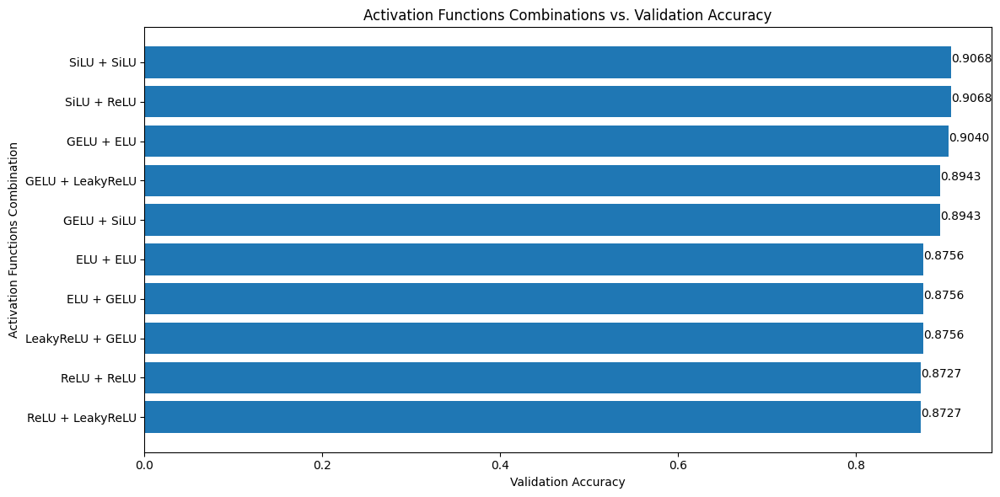

In [ ]:
# plot the results of activation functions experiment
plot_activation_function_results(activation_df)

In [ ]:
# print best performing activation functions combo
MM_best_activation_functions_names = activation_df.iloc[0]['Activation Function 1'], activation_df.iloc[0]['Activation Function 2']
print(f"Best activation functions: {MM_best_activation_functions_names}")

# convert string names to actual nn modules using getattr
MM_best_activation_functions = [getattr(nn, name)() for name in MM_best_activation_functions_names]

Best activation functions: ('SiLU', 'SiLU')


Let's gather all the best hyperparameters for M / M dataset into a configuration dictionary.

In [ ]:
# best configuration in a dictionary
MM_best_config = {
    'model': 'CNN_v2',
    'loss_fn': nn.CrossEntropyLoss(),
    'best_decay_value': MM_best_decay_value,
    'best_dropout_probs_combo': MM_best_dropout_probs,
    'best_hidden_units_combo': MM_best_hidden_units,
    'best_optimizer': MM_best_optimizer,
    'best_learning_rate': MM_best_learning_rate,
    'best_activation_functions': MM_best_activation_functions,
    'best_batch_size': batch_size,
    'epochs': num_epochs
}

Having gathered the best hyperparameters into a configuration dictionary, let's apply all optimizations and proceed with training and evaluating the new model for the M / M dataset. Since the initial model suffers from overfitting, we chose to create a fresh instance and apply the optimal configurations identified above rather than relying on the baseline weights from model_0. This strategy was consistently employed across all dataset experiments.

In [ ]:
# put it all together

# create a model
MM_model_1 = CNN_v2(out_features=num_classes, hidden_units=MM_best_hidden_units, dropout_probs=MM_best_dropout_probs, activation_functions=MM_best_activation_functions).to(device)

# set loss function and optimizer
loss_fn = nn.CrossEntropyLoss()
optimizer = MM_best_optimizer(params=MM_model_1.parameters(), lr=MM_best_learning_rate, weight_decay=MM_best_decay_value)

# start training
print("Starting training...")
start_time = time.time()
MM_model_1_results = train(model=MM_model_1,
                           train_dataloader=train_dataloader_M,
                           test_dataloader=val_dataloader_M,
                           optimizer=optimizer,
                           loss_fn=loss_fn,
                           epochs=num_epochs,
                           device=device)
end_time = time.time()

# calculate and print total training time
MM_model_1_training_time = end_time - start_time
print(f"\nTotal training time: {MM_model_1_training_time:.3f} seconds")

# calculate and print total trainabale params
MM_model_1_total_params = sum(p.numel() for p in MM_model_1.parameters() if p.requires_grad)
print(f"Total trainable params: {MM_model_1_total_params}")

Starting training...


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.1594 | train_acc: 0.2323 | val_loss: 1.8118 | val_acc: 0.3438
Epoch: 2 | train_loss: 1.8091 | train_acc: 0.3392 | val_loss: 1.6358 | val_acc: 0.4335
Epoch: 3 | train_loss: 1.6246 | train_acc: 0.4321 | val_loss: 1.3089 | val_acc: 0.5744
Epoch: 4 | train_loss: 1.3969 | train_acc: 0.5166 | val_loss: 1.0957 | val_acc: 0.6148
Epoch: 5 | train_loss: 1.2683 | train_acc: 0.5755 | val_loss: 1.0020 | val_acc: 0.6551
Epoch: 6 | train_loss: 1.1422 | train_acc: 0.6124 | val_loss: 0.8858 | val_acc: 0.7301
Epoch: 7 | train_loss: 1.0674 | train_acc: 0.6363 | val_loss: 0.8312 | val_acc: 0.7483
Epoch: 8 | train_loss: 1.0128 | train_acc: 0.6509 | val_loss: 0.7486 | val_acc: 0.7301
Epoch: 9 | train_loss: 0.8889 | train_acc: 0.6929 | val_loss: 0.6777 | val_acc: 0.7551
Epoch: 10 | train_loss: 0.8898 | train_acc: 0.6985 | val_loss: 0.6002 | val_acc: 0.7852
Epoch: 11 | train_loss: 0.7935 | train_acc: 0.7268 | val_loss: 0.5913 | val_acc: 0.7949
Epoch: 12 | train_loss: 0.7967 | train_ac

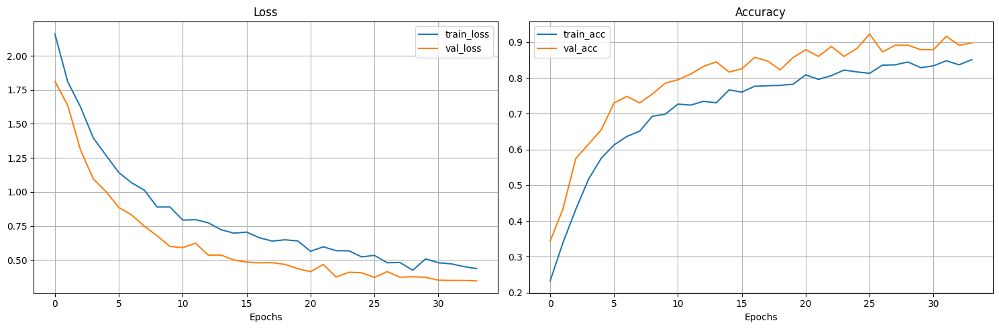

In [ ]:
# plot loss curves
plot_loss_curves(MM_model_1_results)

In the baseline model, the validation accuracy line was below training one and validation accuracy loss was above the training one. However, after fine-tuning the hyperparameters and selecting the optimal configuration, we now see validation curves be on the correct and expected form, accompanied by significantly improved validation accuracy and no signs of overfitting.

In [ ]:
# print final model_1 validation accuracy
MM_model_1_acc = MM_model_1_results['val_acc'][-1]
print(f"Final model_1 validation accuracy: {MM_model_1_acc}")

# save the MM final model 1 with best configuration found
torch.save(MM_model_1.state_dict(), os.path.join(project_models_path, 'MM_model_1.pth'))
print("Model saved to 'MM_model_1.pth'")

Final model_1 validation accuracy: 0.8977272727272727
Model saved to 'MM_model_1.pth'


Let's now take a closer look at the results using evaluation metrics such as precision, recall, and the confusion matrix. These metrics will provide deeper insights into the model's performance, highlighting class-wise accuracy and potential misclassifications.

We conduct this evaluation here because it allows us to get an idea of the model's effectiveness before introducing cross-validation, ensuring that all the improvements made so far have successfully addressed overfitting and enhanced performance (at some point) on a fixed validation set.

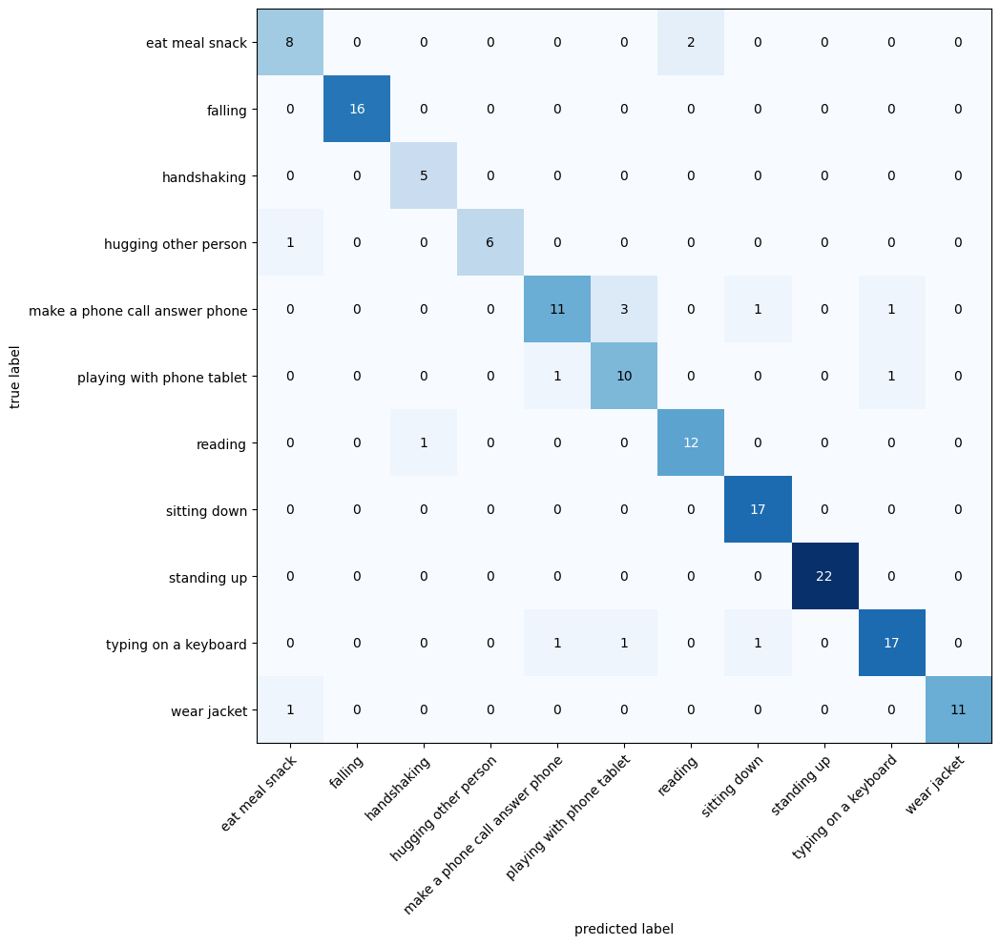

In [ ]:
# evaluation with torchmetrics

# retrieve actual and predicted labels and convert them to tensors for later process
MM_model_1_y_true = torch.tensor(MM_model_1_results['y_true'])
MM_model_1_y_pred = torch.tensor(MM_model_1_results['y_preds'])

# setup confusion matrix instance and compare predictions to targets
confmat = ConfusionMatrix(num_classes=len(class_names), task='multiclass')
confmat_tensor = confmat(MM_model_1_y_pred.clone().detach(), MM_model_1_y_true.clone().detach())

# see how it looks like
# print("Confusion Matrix:")
# print(confmat_tensor)

# plot the confusion matrix
fig, ax = plot_confusion_matrix(conf_mat=confmat_tensor.numpy(), class_names=class_names, figsize=(20,10));

In [ ]:
# calculate precision, recall and F1 scores using torchmetrics
#accuracy = Accuracy(average='macro', num_classes=len(test_data_M.classes), task='multiclass')
precision = Precision(average='macro', num_classes=len(class_names), task='multiclass')
recall = Recall(average='macro', num_classes=len(class_names), task='multiclass')
f1 = F1Score(average='macro', num_classes=len(class_names), task='multiclass')

#acc = accuracy(model_1_y_pred, model_1_y_true)
prec = precision(MM_model_1_y_pred, MM_model_1_y_true)
rec = recall(MM_model_1_y_pred, MM_model_1_y_true)
f1_score = f1(MM_model_1_y_pred, MM_model_1_y_true)

# print the results
print(f"Precision: {prec:.4f}\nRecall: {rec:.4f}\nF1-Score: {f1_score:.4f}") # Accuracy: {acc:.4f}\n

Precision: 0.8946
Recall: 0.8971
F1-Score: 0.8929


Most predictions are correct, with misclassifications typically occurring between similar classes, for example, confusing reading with eating a meal or making a phone call with playing with a tablet. Additionally, there is a strong balance between precision and recall, as evidenced by the nearly identical recall and F1 scores.

Let's also review the classification report for a detailed performance analysis.

In [ ]:
# classification report
print("Classification Report:")
print(classification_report(y_true=MM_model_1_y_true, y_pred=MM_model_1_y_pred, zero_division=1)) # zero_division=1: avoids the warning (precision=1 for undefined classes)

Classification Report:
              precision    recall  f1-score   support

           0       0.80      0.80      0.80        10
           1       1.00      1.00      1.00        16
           2       0.83      1.00      0.91         5
           3       1.00      0.86      0.92         7
           4       0.85      0.69      0.76        16
           5       0.71      0.83      0.77        12
           6       0.86      0.92      0.89        13
           7       0.89      1.00      0.94        17
           8       1.00      1.00      1.00        22
           9       0.89      0.85      0.87        20
          10       1.00      0.92      0.96        12

    accuracy                           0.90       150
   macro avg       0.89      0.90      0.89       150
weighted avg       0.90      0.90      0.90       150



Although we have less samples in handshaking and hugging other person, we get pretty good predictions (only 1 misclassification), while in falling and standing up classes, we haven't any wrong prediction.  

Experiment 6. Apply Cross-Validation.

To apply cross-validation, we first need to modify the dataset by merging the training and validation sets into a single dataset. Then, we take the previously trained model (MM_model_1) and apply the cross-validation method.

In [ ]:
# experiment 6: cross validation (1)

# combine train and validation sets

# define paths
source_dirs_M = ['/content/project/data/ResActionsImagesM/train', '/content/project/data/ResActionsImagesM/validation']
destination_dir_M = '/content/project/data/ResActionsImagesM/train_val_combined'

# create the destination directory if it doesn't exist
if not os.path.exists(destination_dir_M):
  os.makedirs(destination_dir_M)

# loop over all source dirs (train, validation) in ResActionsImagesM
for source_dir in source_dirs_M:
  # loop over all class dirs
  for class_dir in os.listdir(source_dir):

    # existing class path, we will use it for copying
    class_path = os.path.join(source_dir, class_dir)

    # create class dir in destination dir if doesn't exist (this goes in case of multiple runs)
    dest_class_path = os.path.join(destination_dir_M, class_dir)
    if not os.path.exists(dest_class_path):
      os.makedirs(dest_class_path)

    # copy all files (images) from the current class of the current source
    for file in os.listdir(class_path):
      shutil.copy(os.path.join(class_path, file), os.path.join(dest_class_path, file))

# check how many dirs in the new dir (expected num_classes=11)
print(f"Total number of folders of the new dir: {len(os.listdir(destination_dir_M))}")

# find and print how many images in total the new 'train_val_combined' dir has (expected the sum of initial train and validation dirs: 1201 + 150 = 1351)
train_val_total_images_M = 0
for class_dir in os.listdir(destination_dir_M):
  class_path = os.path.join(destination_dir_M, class_dir)
  train_val_total_images_M += len(os.listdir(class_path))
print(f"Total number of images of the new dir: {train_val_total_images_M}") # check on the left side of Colab

Total number of folders of the new dir: 11
Total number of images of the new dir: 1351


In [ ]:
# experiment 6: cross validation (2)

# create the new dataset using ImageFolder
MM_cross_val_dataset = ImageFolder(root=destination_dir_M, transform=data_transform_M)

# retrieve best pre-trained weights from model_1
MM_model_1_weights = MM_model_1.state_dict()

# run the experiment
MM_cv_results = cross_validation(dataset=MM_cross_val_dataset,
                                 num_epochs=num_epochs,
                                 device=device,
                                 num_classes=num_classes,
                                 num_folds=num_folds,
                                 best_config=MM_best_config,
                                 num_workers=num_workers,
                                 load_weights=True,
                                 best_weights=MM_model_1_weights)

Cross-Validation training ...
Dataset size: 1351
Number of folds: 6
Fold size: 225

Fold 1/6
Loading best weights ...


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.4787 | train_acc: 0.8394 | val_loss: 0.1840 | val_acc: 0.9414
Epoch: 2 | train_loss: 0.4035 | train_acc: 0.8634 | val_loss: 0.1654 | val_acc: 0.9414
Epoch: 3 | train_loss: 0.3951 | train_acc: 0.8663 | val_loss: 0.1800 | val_acc: 0.9336
Epoch: 4 | train_loss: 0.3625 | train_acc: 0.8816 | val_loss: 0.1902 | val_acc: 0.9492
Epoch: 5 | train_loss: 0.3842 | train_acc: 0.8625 | val_loss: 0.2017 | val_acc: 0.9258
Epoch: 6 | train_loss: 0.3521 | train_acc: 0.8720 | val_loss: 0.1833 | val_acc: 0.9258
Epoch: 7 | train_loss: 0.3537 | train_acc: 0.8759 | val_loss: 0.1812 | val_acc: 0.9336
Epoch: 8 | train_loss: 0.3611 | train_acc: 0.8863 | val_loss: 0.2087 | val_acc: 0.9258
Epoch: 9 | train_loss: 0.3434 | train_acc: 0.8802 | val_loss: 0.1798 | val_acc: 0.9336
Epoch: 10 | train_loss: 0.3535 | train_acc: 0.8920 | val_loss: 0.1807 | val_acc: 0.9414
Epoch: 11 | train_loss: 0.4442 | train_acc: 0.8611 | val_loss: 0.1912 | val_acc: 0.9297
Epoch: 12 | train_loss: 0.3330 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.4903 | train_acc: 0.8495 | val_loss: 0.2097 | val_acc: 0.9297
Epoch: 2 | train_loss: 0.3865 | train_acc: 0.8741 | val_loss: 0.1350 | val_acc: 0.9570
Epoch: 3 | train_loss: 0.3927 | train_acc: 0.8767 | val_loss: 0.1608 | val_acc: 0.9453
Epoch: 4 | train_loss: 0.4040 | train_acc: 0.8738 | val_loss: 0.1733 | val_acc: 0.9297
Epoch: 5 | train_loss: 0.3918 | train_acc: 0.8672 | val_loss: 0.1970 | val_acc: 0.9375
Epoch: 6 | train_loss: 0.4047 | train_acc: 0.8698 | val_loss: 0.1543 | val_acc: 0.9531
Epoch: 7 | train_loss: 0.4107 | train_acc: 0.8663 | val_loss: 0.1775 | val_acc: 0.9375
Epoch: 8 | train_loss: 0.3899 | train_acc: 0.8799 | val_loss: 0.1608 | val_acc: 0.9414
Epoch: 9 | train_loss: 0.3611 | train_acc: 0.8880 | val_loss: 0.1942 | val_acc: 0.9375
Epoch: 10 | train_loss: 0.3662 | train_acc: 0.8790 | val_loss: 0.1563 | val_acc: 0.9414
Epoch: 11 | train_loss: 0.3705 | train_acc: 0.8712 | val_loss: 0.1518 | val_acc: 0.9375
Epoch: 12 | train_loss: 0.4014 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.4262 | train_acc: 0.8611 | val_loss: 0.2695 | val_acc: 0.9297
Epoch: 2 | train_loss: 0.4481 | train_acc: 0.8486 | val_loss: 0.2343 | val_acc: 0.9414
Epoch: 3 | train_loss: 0.4246 | train_acc: 0.8608 | val_loss: 0.3011 | val_acc: 0.8711
Epoch: 4 | train_loss: 0.3858 | train_acc: 0.8776 | val_loss: 0.2784 | val_acc: 0.8750
Epoch: 5 | train_loss: 0.3815 | train_acc: 0.8793 | val_loss: 0.2601 | val_acc: 0.9375
Epoch: 6 | train_loss: 0.3826 | train_acc: 0.8776 | val_loss: 0.2436 | val_acc: 0.9414
Epoch: 7 | train_loss: 0.3653 | train_acc: 0.8811 | val_loss: 0.2374 | val_acc: 0.9258
Epoch: 8 | train_loss: 0.3613 | train_acc: 0.8707 | val_loss: 0.2475 | val_acc: 0.9297
Epoch: 9 | train_loss: 0.4078 | train_acc: 0.8561 | val_loss: 0.2489 | val_acc: 0.9375
Epoch: 10 | train_loss: 0.3805 | train_acc: 0.8790 | val_loss: 0.3373 | val_acc: 0.8477
Epoch: 11 | train_loss: 0.3839 | train_acc: 0.8776 | val_loss: 0.2282 | val_acc: 0.9258
Epoch: 12 | train_loss: 0.3846 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.4318 | train_acc: 0.8550 | val_loss: 0.1559 | val_acc: 0.9492
Epoch: 2 | train_loss: 0.4521 | train_acc: 0.8599 | val_loss: 0.1422 | val_acc: 0.9648
Epoch: 3 | train_loss: 0.3726 | train_acc: 0.8785 | val_loss: 0.1373 | val_acc: 0.9570
Epoch: 4 | train_loss: 0.4323 | train_acc: 0.8431 | val_loss: 0.1422 | val_acc: 0.9609
Epoch: 5 | train_loss: 0.4112 | train_acc: 0.8637 | val_loss: 0.1429 | val_acc: 0.9531
Epoch: 6 | train_loss: 0.3708 | train_acc: 0.8793 | val_loss: 0.1635 | val_acc: 0.9492
Epoch: 7 | train_loss: 0.3639 | train_acc: 0.8793 | val_loss: 0.1514 | val_acc: 0.9609
Epoch: 8 | train_loss: 0.3705 | train_acc: 0.8755 | val_loss: 0.1638 | val_acc: 0.9609
Epoch: 9 | train_loss: 0.3738 | train_acc: 0.8700 | val_loss: 0.1579 | val_acc: 0.9531
Epoch: 10 | train_loss: 0.3251 | train_acc: 0.8854 | val_loss: 0.1365 | val_acc: 0.9531
Epoch: 11 | train_loss: 0.3335 | train_acc: 0.8851 | val_loss: 0.1449 | val_acc: 0.9609
Epoch: 12 | train_loss: 0.3504 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.4539 | train_acc: 0.8516 | val_loss: 0.1403 | val_acc: 0.9648
Epoch: 2 | train_loss: 0.4272 | train_acc: 0.8498 | val_loss: 0.1137 | val_acc: 0.9688
Epoch: 3 | train_loss: 0.4389 | train_acc: 0.8448 | val_loss: 0.1276 | val_acc: 0.9766
Epoch: 4 | train_loss: 0.4092 | train_acc: 0.8642 | val_loss: 0.1279 | val_acc: 0.9766
Epoch: 5 | train_loss: 0.4107 | train_acc: 0.8767 | val_loss: 0.1238 | val_acc: 0.9609
Epoch: 6 | train_loss: 0.3782 | train_acc: 0.8767 | val_loss: 0.1342 | val_acc: 0.9688
Epoch: 7 | train_loss: 0.3775 | train_acc: 0.8738 | val_loss: 0.1091 | val_acc: 0.9648
Epoch: 8 | train_loss: 0.3712 | train_acc: 0.8712 | val_loss: 0.1244 | val_acc: 0.9609
Epoch: 9 | train_loss: 0.3835 | train_acc: 0.8674 | val_loss: 0.1328 | val_acc: 0.9609
Epoch: 10 | train_loss: 0.3511 | train_acc: 0.8915 | val_loss: 0.1380 | val_acc: 0.9531
Epoch: 11 | train_loss: 0.3366 | train_acc: 0.8776 | val_loss: 0.0992 | val_acc: 0.9688
Epoch: 12 | train_loss: 0.3458 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.4677 | train_acc: 0.8351 | val_loss: 0.1684 | val_acc: 0.9336
Epoch: 2 | train_loss: 0.4476 | train_acc: 0.8477 | val_loss: 0.1628 | val_acc: 0.9414
Epoch: 3 | train_loss: 0.4237 | train_acc: 0.8634 | val_loss: 0.1958 | val_acc: 0.9102
Epoch: 4 | train_loss: 0.4817 | train_acc: 0.8399 | val_loss: 0.1708 | val_acc: 0.9570
Epoch: 5 | train_loss: 0.3958 | train_acc: 0.8663 | val_loss: 0.1646 | val_acc: 0.9414
Epoch: 6 | train_loss: 0.3630 | train_acc: 0.8790 | val_loss: 0.1672 | val_acc: 0.9375
Epoch: 7 | train_loss: 0.4146 | train_acc: 0.8724 | val_loss: 0.1904 | val_acc: 0.9336
Epoch: 8 | train_loss: 0.3305 | train_acc: 0.8958 | val_loss: 0.1716 | val_acc: 0.9375
Epoch: 9 | train_loss: 0.3227 | train_acc: 0.8924 | val_loss: 0.1613 | val_acc: 0.9336
Epoch: 10 | train_loss: 0.3640 | train_acc: 0.8889 | val_loss: 0.1628 | val_acc: 0.9375
Epoch: 11 | train_loss: 0.3461 | train_acc: 0.8872 | val_loss: 0.1682 | val_acc: 0.9375
Epoch: 12 | train_loss: 0.3319 | train_ac

Let's summarize the cross-validation results graphically and numerically.

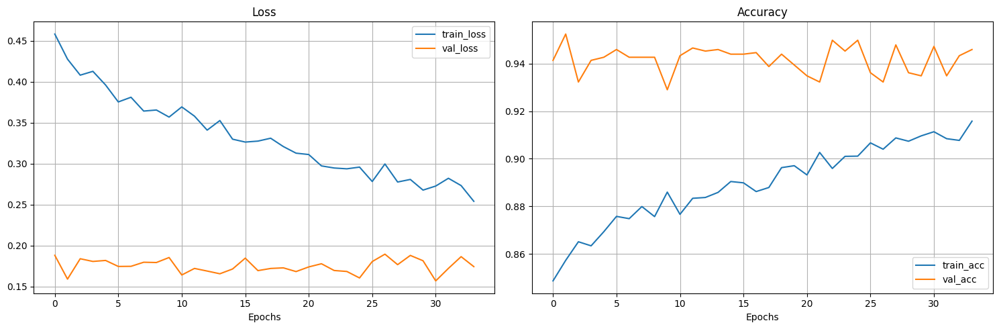

In [ ]:
# comptute and plot average cv results
MM_cv_avg_results = compute_avg_cv_results(MM_cv_results)

# plot the averaged learning curves
plot_loss_curves(MM_cv_avg_results)

Training loss steadily decreases, while validation loss remains relatively stable. Accuracy improves for both training and validation sets, with the two curves staying fairly close, with the validation one always above than the training accuracy curve, indicating consistent learning and minimal overfitting across folds.

In [ ]:
# retrieve all val accuracies in desc order from results dictionary along with their corresponding model's weights
MM_results_df = get_sorted_cv_results(MM_cv_results)

   Fold  Validation Accuracy  \
4     5             0.964844   
3     4             0.960938   
5     6             0.945312   
0     1             0.941406   
1     2             0.941406   
2     3             0.921875   

                                       Model Weights  
4  {'block1.0.weight': [[tensor([[-0.0102,  0.076...  
3  {'block1.0.weight': [[tensor([[ 0.0325,  0.125...  
5  {'block1.0.weight': [[tensor([[-0.0121,  0.128...  
0  {'block1.0.weight': [[tensor([[ 0.0033,  0.096...  
1  {'block1.0.weight': [[tensor([[-0.0029,  0.122...  
2  {'block1.0.weight': [[tensor([[ 0.0432,  0.117...  


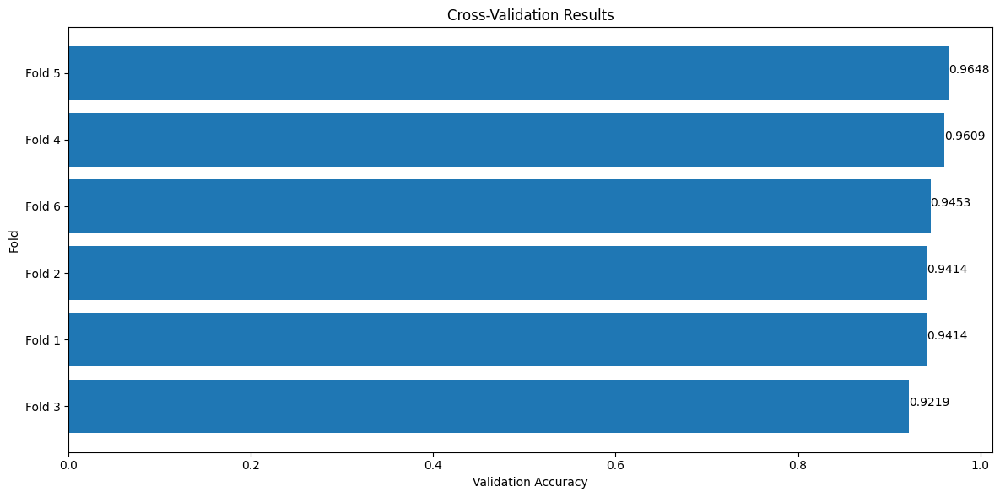

In [ ]:
# plot each fold results after cross-validation experiment
plot_cv_results(MM_results_df)

In addition to serving as an evaluation metric, cross-validation also acts as a mechanism for identifying the best-performing fold, which we might then use it for further experiments. So, we save the best fold's weights for potential future experiments.

In [ ]:
# retrieve best performing fold's weights
best_MM_cv_model_weights = MM_results_df.iloc[0]['Model Weights']
#print(best_MM_cv_model_weights)

# retrieve best performing fold number
MM_best_fold = MM_results_df.iloc[0]['Fold']
#print(f"Best performing fold: {MM_best_fold}")

# retrieve the corresponding results from cross validation experiment for the best case
MM_best_fold_index = max(MM_best_fold - 1, 0) # adjust -1 for sero indexing and ensure index is not negative (-1 if best weights are in the first position)
MM_model_2_results = MM_cv_results[MM_best_fold_index]

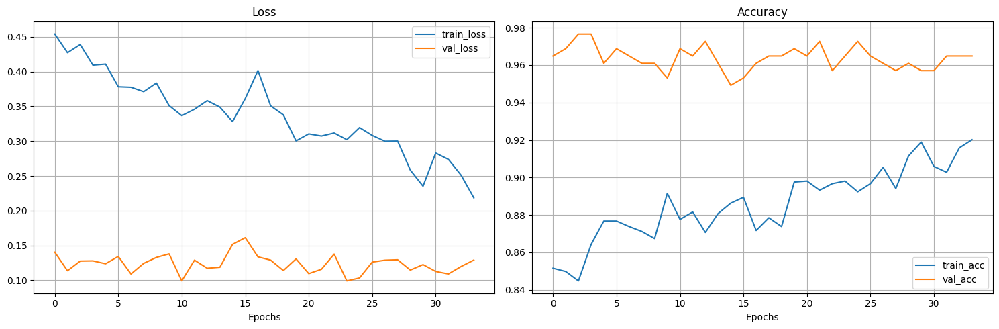

In [ ]:
# plot the curves of the fold/model with best performance
plot_loss_curves(MM_model_2_results)

In [ ]:
# before loading best weights, need to create a new instance
MM_model_2 = CNN_v2(out_features=num_classes, hidden_units=MM_best_hidden_units, dropout_probs=MM_best_dropout_probs, activation_functions=MM_best_activation_functions).to(device)

# now, load best weights
MM_model_2.load_state_dict(best_MM_cv_model_weights)

# print final model's val accuracy
MM_model_2_acc = MM_model_2_results['val_acc'][-1]
print(f"Final model accuracy: {MM_model_2_acc}")

# and save the model
torch.save(MM_model_2.state_dict(), os.path.join(project_models_path, 'MM_model_2.pth'))
print("Model saved to 'MM_model_2.pth'")

Final model accuracy: 0.96484375
Model saved to 'MM_model_2.pth'


Experiment 7. Balance the dataset.

In [ ]:
# experiment 7: balanced dataset (with early stopping enabled)

# create a new instance of the model for balanced dataset
MM_model_3 = CNN_v2(out_features=num_classes, hidden_units=MM_best_hidden_units, dropout_probs=MM_best_dropout_probs, activation_functions=MM_best_activation_functions).to(device)

# load model_1 weights
MM_model_3.load_state_dict(MM_model_1.state_dict()) # (model_1)

# load best performing model (weights) so far
#MM_model_3.load_state_dict(best_MM_cv_model_weights) # (model_2)

# start training on balanced dataset
MM_model_3_results = experiment_balanced_dataset(model=MM_model_3,
                                                 train_dataloader=train_dataloader_M,
                                                 val_dataloader=val_dataloader_M,
                                                 num_epochs=num_epochs,
                                                 device=device,
                                                 best_config=MM_best_config,
                                                 class_weights=class_weights_M)

Experimenting with Balanced Dataset


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.4351 | train_acc: 0.8597 | val_loss: 0.3131 | val_acc: 0.8943
Epoch: 2 | train_loss: 0.4217 | train_acc: 0.8725 | val_loss: 0.3088 | val_acc: 0.8693
Epoch: 3 | train_loss: 0.4408 | train_acc: 0.8579 | val_loss: 0.3263 | val_acc: 0.8852
Epoch: 4 | train_loss: 0.4344 | train_acc: 0.8498 | val_loss: 0.2953 | val_acc: 0.8915
Epoch: 5 | train_loss: 0.3641 | train_acc: 0.8884 | val_loss: 0.3131 | val_acc: 0.8915
Epoch: 6 | train_loss: 0.3736 | train_acc: 0.8777 | val_loss: 0.3235 | val_acc: 0.8852
Early stopping triggered at epoch 6.
Model restored from epoch 1.

Total training time: 4.946 seconds
Total trainable params: 180619


In [ ]:
# print best epoch and its corresponding val accuracy
MM_best_epoch_bal, MM_best_val_acc_bal = print_best_epoch_and_val_acc(MM_model_3_results)

Best epoch: 1
Best validation accuracy: 0.8943


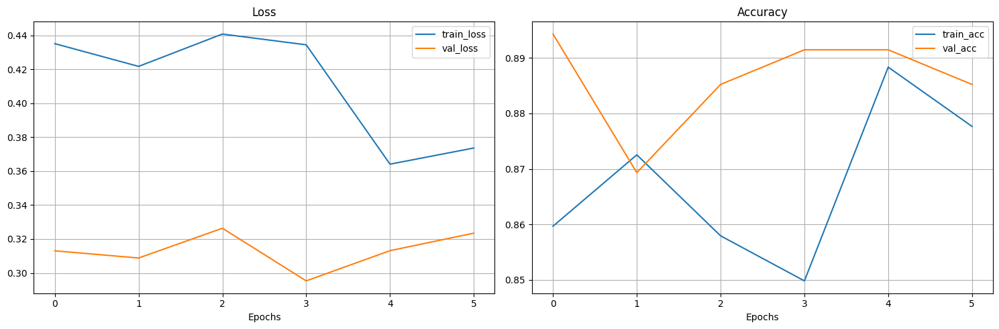

In [ ]:
# plot the results curves after balancing the dataset
plot_loss_curves(MM_model_3_results)

We observe that balancing the dataset leads to improved performance. Let's save the model, before applying data augmentation.


In [ ]:
# print final model's val accuracy
MM_model_3_acc = MM_best_val_acc_bal
print(f"Final model accuracy: {MM_model_3_acc}")

# save the model
torch.save(MM_model_3.state_dict(), os.path.join(project_models_path, 'MM_model_3.pth'))
print("Model saved to 'MM_model_3.pth'")

Final model accuracy: 0.8943181818181818
Model saved to 'MM_model_3.pth'


Experiment 8. Apply data augmentation.

In our final experiment, we can apply data augmentation using two approaches: a simple configuration with flipping and rotation, and a more aggressive Trivial augmentation method. For this experiment, we use Trivial augmentation along with model_3, the model obtained after balancing the dataset, as our baseline. We also considered using model_2, which was produced after cross validation, as the starting point for augmentation or even model_1.

In [ ]:
# experiment 8: data augmentation (with early stopping enabled)

# create a new instance of the model for data augmentation
MM_model_4 = CNN_v2(out_features=num_classes, hidden_units=MM_best_hidden_units, dropout_probs=MM_best_dropout_probs, activation_functions=MM_best_activation_functions).to(device)

# load weights of the model_1
#MM_model_4.load_state_dict(MM_model_1.state_dict()) # (model_1)

# load weights of the model produced after cross-validation
#MM_model_4.load_state_dict(best_MM_cv_model_weights) # (model_2)

# load best performing model (weights) so far
MM_model_4.load_state_dict(MM_model_3.state_dict()) # (model_3)

# start training with data augmentation
MM_model_4_results = experiment_data_augmentation(model=MM_model_4,
                                                  train_dir=M_dataset_path/'train',
                                                  val_dataloader=val_dataloader_M,
                                                  num_epochs=num_epochs,
                                                  device=device,
                                                  best_config=MM_best_config,
                                                  class_weights=class_weights_M,
                                                  num_workers=num_workers,
                                                  mean=mean_M,
                                                  std=std_M,
                                                  is_Trivial=True) # Trivial augmentataion by setting True!

Experimenting with Data Augmentation


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 4.2391 | train_acc: 0.4264 | val_loss: 0.5329 | val_acc: 0.8108
Epoch: 2 | train_loss: 1.8840 | train_acc: 0.4061 | val_loss: 0.5009 | val_acc: 0.8824
Epoch: 3 | train_loss: 1.7453 | train_acc: 0.4548 | val_loss: 0.5211 | val_acc: 0.8915
Epoch: 4 | train_loss: 1.6461 | train_acc: 0.4679 | val_loss: 0.4607 | val_acc: 0.8852
Epoch: 5 | train_loss: 1.7325 | train_acc: 0.4509 | val_loss: 0.4584 | val_acc: 0.8915
Epoch: 6 | train_loss: 1.6792 | train_acc: 0.4713 | val_loss: 0.4584 | val_acc: 0.8977
Epoch: 7 | train_loss: 1.6773 | train_acc: 0.4526 | val_loss: 0.4094 | val_acc: 0.8977
Epoch: 8 | train_loss: 1.6526 | train_acc: 0.4554 | val_loss: 0.4077 | val_acc: 0.8915
Epoch: 9 | train_loss: 1.6316 | train_acc: 0.4606 | val_loss: 0.3825 | val_acc: 0.9040
Epoch: 10 | train_loss: 1.6007 | train_acc: 0.4746 | val_loss: 0.4051 | val_acc: 0.8915
Epoch: 11 | train_loss: 1.5254 | train_acc: 0.4878 | val_loss: 0.4096 | val_acc: 0.8727
Epoch: 12 | train_loss: 1.6398 | train_ac

In [ ]:
# print best epoch and its corresponding val accuracy
MM_best_epoch_aug, MM_best_val_acc_aug = print_best_epoch_and_val_acc(MM_model_4_results)

Best epoch: 9
Best validation accuracy: 0.9040


We get a slightly better validation accuracy than the previous experiment with the balanced dataset.

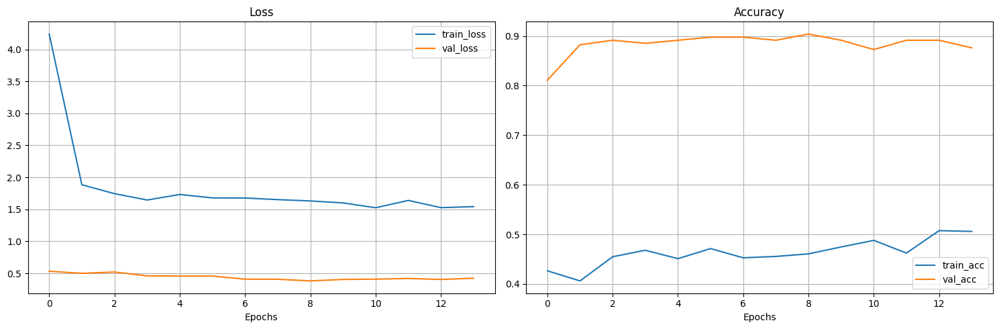

In [ ]:
# plot the results curves after data augmentation
plot_loss_curves(MM_model_4_results)

We observe significant differences between training and validation accuracies, both graphically and numerically. This arises because data augmentation introduces various transformations that increase the difficulty of the training samples, causing the model to struggle and maintain a lower training accuracy. In contrast, the validation dataset remains unaugmented and, therefore, easier to classify. This difference not only creates an accuracy gap but also acts as a form of regularization, preventing overfitting and enhancing generalization. Additionally, early stopping helps ensure that the model does not overfit, maintaining strong performance on the clean validation data.

In [ ]:
# print final model's val accuracy
MM_model_4_acc = MM_best_val_acc_aug
print(f"Final model accuracy: {MM_model_4_acc}")

# save the model
torch.save(MM_model_4.state_dict(), os.path.join(project_models_path, 'MM_model_4.pth'))
print("Model saved to 'MM_model_4.pth'")

Final model accuracy: 0.9039772727272727
Model saved to 'MM_model_4.pth'


With all experiments for this dataset completed, let's compare the models and select the best-performing one as the final result.

Model MM_model_1: 0.89772727
Model MM_model_2: 0.96484375
Model MM_model_3: 0.89431818
Model MM_model_4: 0.90397727


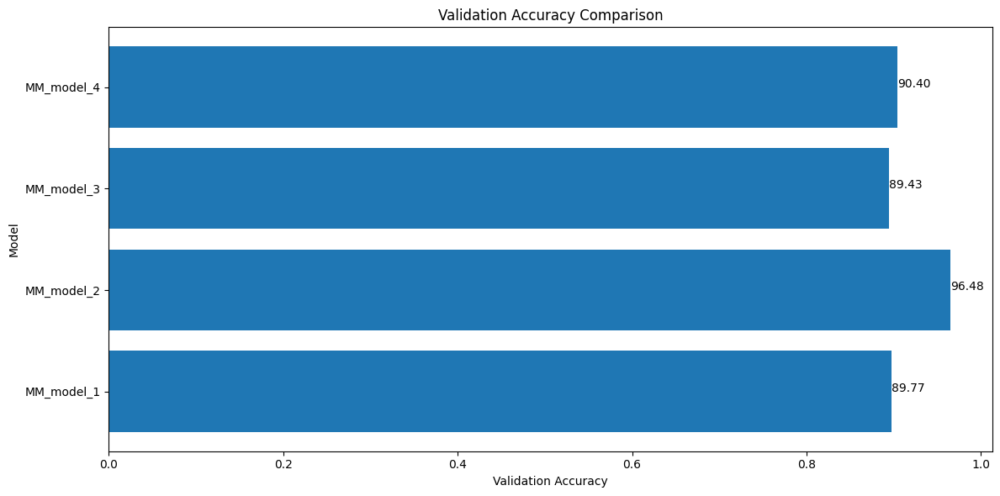

In [ ]:
# create a dataframe for comparison
compare_accs_MM = pd.DataFrame({'Model': ['MM_model_1', 'MM_model_2', 'MM_model_3', 'MM_model_4'], 'Validation Accuracy': [MM_model_1_acc, MM_model_2_acc, MM_model_3_acc, MM_model_4_acc]})

# print and plot test accuracies for all models of M / M dataset
print_and_plot_models_accuracies(compare_accs_MM)

For this scenario, we exclude model_2, coming from the best-performing fold of cross-validation and compare the remaining models.

In [ ]:
# drop model_2 from the dictionary
compare_accs_MM = compare_accs_MM.drop(1)

In [ ]:
# save the best performing model for M / M
best_models_dict = store_best_model(compare_accs_MM, 'M / M', best_models_dict)

# print the dictionary
print("Best models dictionary:")
print(best_models_dict)
print()

# retrieve best performing model for M / M
MM_best_model = f"{best_models_dict['M / M']['Model']}.pth"
#print(MM_best_model)

# initiate a model instance
MM_final_model = CNN_v2(out_features=num_classes, hidden_units=MM_best_hidden_units, dropout_probs=MM_best_dropout_probs, activation_functions=MM_best_activation_functions).to(device)

# load best weights
MM_final_model.load_state_dict(torch.load(os.path.join(project_models_path, MM_best_model), weights_only=True))

# put it on device
MM_final_model = MM_final_model.to(device)

# and evaluate on test set/dataloader
MM_test_results = eval_model(model=MM_final_model,
                             dataloader=test_dataloader_M,
                             loss_fn=MM_best_config['loss_fn'], # nn.CrossEntropyLoss(weight=class_weights_R)
                             device=device)
print(f"Test accuracy for {MM_best_model}: {MM_test_results['test_acc']:.4f}")

# save the test results to the dictionary
final_test_accuracies_dict['M / M'] = MM_test_results['test_acc']

Best models dictionary:
{'M / M': {'Model': 'MM_model_4', 'Validation Accuracy': 0.9039772727272727}}



  0%|          | 0/5 [00:00<?, ?it/s]

Test accuracy for MM_model_4.pth: 0.8639


### Experiments on R / R.

We start, again, by creating dataloaders for R / R dataset.

In [ ]:
# create dataloaders
train_dataloader_R, val_dataloader_R, test_dataloader_R, class_names = create_dataloaders(R_dataset_path/'train', R_dataset_path/'validation', R_dataset_path/'test', data_transform_R, batch_size, num_workers)
print("Dataloaders created successfully!")

Dataloaders created successfully!


We train and evaluate the R / R baseline model.

In [ ]:
# train the RR baseline model

# create the model
RR_model_0 = CNN(in_features=num_channels, out_features=num_classes, hidden_units=init_hidden_units).to(device)

# setup loss function and optimizer
loss_fn = nn.CrossEntropyLoss()
optimizer = torch.optim.RMSprop(params=RR_model_0.parameters(), lr=0.001)

# start training
print("Starting training...")
start_time = time.time()
RR_model_0_results = train(model=RR_model_0,
                           train_dataloader=train_dataloader_R,
                           test_dataloader=val_dataloader_R,
                           optimizer=optimizer,
                           loss_fn=loss_fn,
                           epochs=num_epochs,
                           device=device)
end_time = time.time()

# calculate and print total training time
RR_total_training_time = end_time - start_time
print(f"\nTotal training time: {RR_total_training_time:.3f} seconds")

# calculate and print total trainabla params
RR_total_params = sum(p.numel() for p in RR_model_0.parameters())
print(f"Total number of trainable parameters: {RR_total_params}")

Starting training...


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.0023 | train_acc: 0.2929 | val_loss: 1.5194 | val_acc: 0.4398
Epoch: 2 | train_loss: 1.2582 | train_acc: 0.5715 | val_loss: 1.2243 | val_acc: 0.6040
Epoch: 3 | train_loss: 0.8959 | train_acc: 0.7027 | val_loss: 0.8625 | val_acc: 0.7193
Epoch: 4 | train_loss: 0.7017 | train_acc: 0.7528 | val_loss: 0.6488 | val_acc: 0.7858
Epoch: 5 | train_loss: 0.4768 | train_acc: 0.8266 | val_loss: 0.6755 | val_acc: 0.8006
Epoch: 6 | train_loss: 0.4272 | train_acc: 0.8387 | val_loss: 1.1596 | val_acc: 0.7318
Epoch: 7 | train_loss: 0.2842 | train_acc: 0.9062 | val_loss: 0.5409 | val_acc: 0.8477
Epoch: 8 | train_loss: 0.2335 | train_acc: 0.9319 | val_loss: 0.6587 | val_acc: 0.8233
Epoch: 9 | train_loss: 0.1624 | train_acc: 0.9450 | val_loss: 0.6743 | val_acc: 0.8477
Epoch: 10 | train_loss: 0.1948 | train_acc: 0.9351 | val_loss: 0.6763 | val_acc: 0.8568
Epoch: 11 | train_loss: 0.0911 | train_acc: 0.9746 | val_loss: 0.8260 | val_acc: 0.8006
Epoch: 12 | train_loss: 0.0668 | train_ac

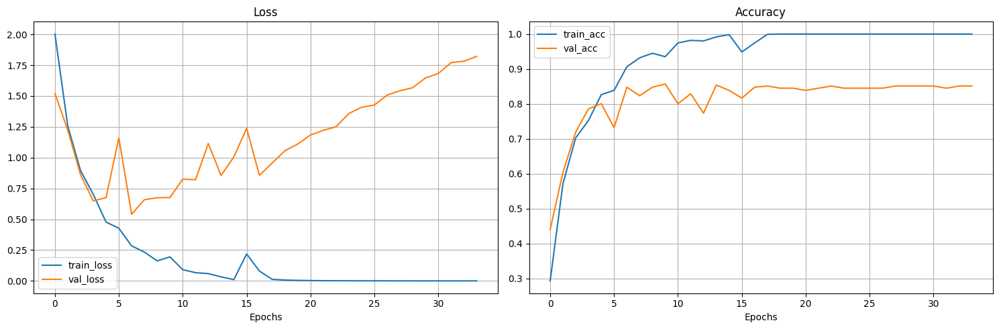

In [ ]:
# plot learning curves
plot_loss_curves(RR_model_0_results)

In [ ]:
# compute generalization gap
dif=compute_generalization_gap(RR_model_0_results)

Generalization gap (train acc - val acc): 0.1489


In comparison with the M/M case, the overfitting issue here is noticeably more intense, as demonstrated by both numerical metrics and graphical representations. To address this, we follow the same process as before: we apply techniques to reduce overfitting and optimize its performance.

In [ ]:
# save the model
torch.save(RR_model_0.state_dict(), os.path.join(project_models_path, 'RR_model_0.pth'))
print("Model saved to 'RR_model_0.pth'")

Model saved to 'RR_model_0.pth'


Experiment 1. Apply L2 regularization.

In [ ]:
# experiment 1: L2 reg
RR_model_L2_results = experiment_l2_regularization(train_dataloader=train_dataloader_R,
                                                   val_dataloader=val_dataloader_R,
                                                   num_epochs=num_epochs,
                                                   device=device,
                                                   weight_decay_values_list=weight_decay_values_list,
                                                   num_channels=num_channels,
                                                   num_classes=num_classes,
                                                   init_hidden_units=init_hidden_units)

Experimenting with L2 Regularization
Weight decay values to try: [0.01, 0.001, 0.0001, 1e-05, 1e-06]

Testing with weight decay: 0.01


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.1454 | train_acc: 0.2488 | val_loss: 1.6960 | val_acc: 0.4051
Epoch: 2 | train_loss: 1.4825 | train_acc: 0.4596 | val_loss: 1.2416 | val_acc: 0.6330
Epoch: 3 | train_loss: 1.2329 | train_acc: 0.5892 | val_loss: 1.1723 | val_acc: 0.6426
Epoch: 4 | train_loss: 0.9786 | train_acc: 0.6617 | val_loss: 0.8409 | val_acc: 0.7330
Epoch: 5 | train_loss: 0.7670 | train_acc: 0.7537 | val_loss: 0.7931 | val_acc: 0.7517
Epoch: 6 | train_loss: 0.6449 | train_acc: 0.7759 | val_loss: 0.7056 | val_acc: 0.8074
Epoch: 7 | train_loss: 0.5323 | train_acc: 0.8170 | val_loss: 0.8323 | val_acc: 0.7324
Epoch: 8 | train_loss: 0.4927 | train_acc: 0.8206 | val_loss: 0.8307 | val_acc: 0.7580
Epoch: 9 | train_loss: 0.4156 | train_acc: 0.8530 | val_loss: 0.6581 | val_acc: 0.7733
Epoch: 10 | train_loss: 0.3674 | train_acc: 0.8726 | val_loss: 0.6380 | val_acc: 0.8358
Epoch: 11 | train_loss: 0.3366 | train_acc: 0.8841 | val_loss: 0.5523 | val_acc: 0.8511
Epoch: 12 | train_loss: 0.3213 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.0197 | train_acc: 0.2788 | val_loss: 1.6113 | val_acc: 0.3523
Epoch: 2 | train_loss: 1.3365 | train_acc: 0.5473 | val_loss: 1.0594 | val_acc: 0.6875
Epoch: 3 | train_loss: 0.9279 | train_acc: 0.6773 | val_loss: 0.9428 | val_acc: 0.7352
Epoch: 4 | train_loss: 0.7072 | train_acc: 0.7420 | val_loss: 0.7581 | val_acc: 0.8068
Epoch: 5 | train_loss: 0.5828 | train_acc: 0.7941 | val_loss: 0.9986 | val_acc: 0.7142
Epoch: 6 | train_loss: 0.4888 | train_acc: 0.8308 | val_loss: 0.6959 | val_acc: 0.8261
Epoch: 7 | train_loss: 0.4070 | train_acc: 0.8647 | val_loss: 0.7648 | val_acc: 0.8295
Epoch: 8 | train_loss: 0.3114 | train_acc: 0.8890 | val_loss: 0.6762 | val_acc: 0.8545
Epoch: 9 | train_loss: 0.2549 | train_acc: 0.9122 | val_loss: 0.6908 | val_acc: 0.8477
Epoch: 10 | train_loss: 0.2177 | train_acc: 0.9252 | val_loss: 0.6435 | val_acc: 0.8790
Epoch: 11 | train_loss: 0.1628 | train_acc: 0.9509 | val_loss: 1.9744 | val_acc: 0.6347
Epoch: 12 | train_loss: 0.2878 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.0512 | train_acc: 0.2998 | val_loss: 1.4403 | val_acc: 0.6114
Epoch: 2 | train_loss: 1.1421 | train_acc: 0.6130 | val_loss: 0.7542 | val_acc: 0.7381
Epoch: 3 | train_loss: 0.7960 | train_acc: 0.7276 | val_loss: 0.8377 | val_acc: 0.7670
Epoch: 4 | train_loss: 0.6122 | train_acc: 0.7838 | val_loss: 0.6889 | val_acc: 0.7545
Epoch: 5 | train_loss: 0.4789 | train_acc: 0.8234 | val_loss: 0.5827 | val_acc: 0.8358
Epoch: 6 | train_loss: 0.4400 | train_acc: 0.8509 | val_loss: 0.6845 | val_acc: 0.8102
Epoch: 7 | train_loss: 0.3288 | train_acc: 0.8940 | val_loss: 0.5970 | val_acc: 0.8477
Epoch: 8 | train_loss: 0.2691 | train_acc: 0.9090 | val_loss: 1.0173 | val_acc: 0.7460
Epoch: 9 | train_loss: 0.2086 | train_acc: 0.9269 | val_loss: 0.5503 | val_acc: 0.8665
Epoch: 10 | train_loss: 0.1793 | train_acc: 0.9352 | val_loss: 0.8381 | val_acc: 0.8023
Epoch: 11 | train_loss: 0.1451 | train_acc: 0.9493 | val_loss: 0.8791 | val_acc: 0.8051
Epoch: 12 | train_loss: 0.0959 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.1300 | train_acc: 0.2962 | val_loss: 1.5426 | val_acc: 0.4278
Epoch: 2 | train_loss: 1.3284 | train_acc: 0.5576 | val_loss: 1.0856 | val_acc: 0.6091
Epoch: 3 | train_loss: 0.8670 | train_acc: 0.7112 | val_loss: 1.1987 | val_acc: 0.5824
Epoch: 4 | train_loss: 0.6493 | train_acc: 0.7763 | val_loss: 0.6914 | val_acc: 0.7693
Epoch: 5 | train_loss: 0.4692 | train_acc: 0.8446 | val_loss: 0.5547 | val_acc: 0.8170
Epoch: 6 | train_loss: 0.3558 | train_acc: 0.8791 | val_loss: 0.6772 | val_acc: 0.7818
Epoch: 7 | train_loss: 0.2959 | train_acc: 0.9015 | val_loss: 0.5596 | val_acc: 0.8205
Epoch: 8 | train_loss: 0.2583 | train_acc: 0.9111 | val_loss: 1.1072 | val_acc: 0.7307
Epoch: 9 | train_loss: 0.1955 | train_acc: 0.9301 | val_loss: 0.5478 | val_acc: 0.8602
Epoch: 10 | train_loss: 0.1720 | train_acc: 0.9416 | val_loss: 0.5602 | val_acc: 0.8631
Epoch: 11 | train_loss: 0.1091 | train_acc: 0.9681 | val_loss: 0.8325 | val_acc: 0.8068
Epoch: 12 | train_loss: 0.1054 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.0017 | train_acc: 0.3166 | val_loss: 1.4196 | val_acc: 0.4830
Epoch: 2 | train_loss: 1.2992 | train_acc: 0.5665 | val_loss: 0.9666 | val_acc: 0.6858
Epoch: 3 | train_loss: 0.8662 | train_acc: 0.7077 | val_loss: 0.8435 | val_acc: 0.7392
Epoch: 4 | train_loss: 0.6830 | train_acc: 0.7690 | val_loss: 0.8820 | val_acc: 0.7244
Epoch: 5 | train_loss: 0.5486 | train_acc: 0.8096 | val_loss: 0.9180 | val_acc: 0.7267
Epoch: 6 | train_loss: 0.4403 | train_acc: 0.8631 | val_loss: 0.9002 | val_acc: 0.7676
Epoch: 7 | train_loss: 0.3520 | train_acc: 0.8802 | val_loss: 0.7086 | val_acc: 0.7886
Epoch: 8 | train_loss: 0.2545 | train_acc: 0.9137 | val_loss: 0.7280 | val_acc: 0.8074
Epoch: 9 | train_loss: 0.1996 | train_acc: 0.9360 | val_loss: 0.8565 | val_acc: 0.8205
Epoch: 10 | train_loss: 0.1599 | train_acc: 0.9490 | val_loss: 0.8649 | val_acc: 0.8295
Epoch: 11 | train_loss: 0.2013 | train_acc: 0.9451 | val_loss: 1.0976 | val_acc: 0.7017
Epoch: 12 | train_loss: 0.1245 | train_ac

In [ ]:
# identify and print the best decay value based on the generalization gap
RR_best_decay_value, RR_min_diff_l2 = compute_multi_generalization_gaps(RR_model_L2_results)

Difference between train and val acc for 0.01: 0.1723
Difference between train and val acc for 0.001: 0.1335
Difference between train and val acc for 0.0001: 0.1489
Difference between train and val acc for 1e-05: 0.1244
Difference between train and val acc for 1e-06: 0.1739

The best (smallest) generalization gap is for 1e-05 and is 0.1244


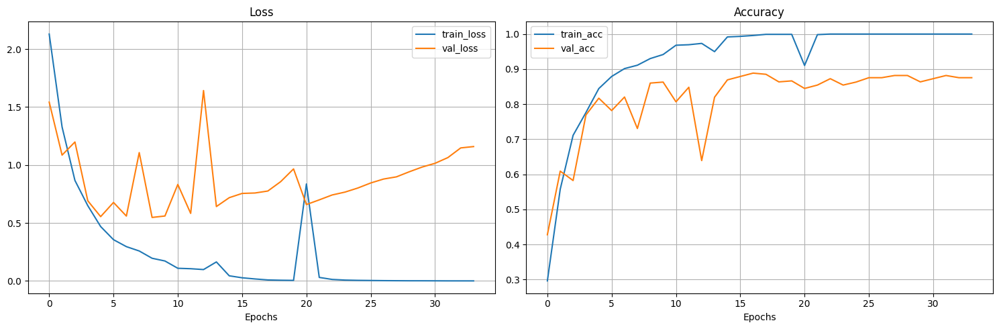

In [ ]:
# plot loss curves
plot_loss_curves(RR_model_L2_results[RR_best_decay_value])

The learning curves have converged to some extent, but there's still significant work needed to bring them even closer and fully eliminate overfitting. Let's move on to incorporating dropout layers.

Experiment 2. Apply dropout regularization layers.

In [ ]:
# experiment 2: dropout layers
RR_model_dropout_results = experiment_dropout_regularization(train_dataloader=train_dataloader_R,
                                                             val_dataloader=val_dataloader_R,
                                                             num_epochs=num_epochs,
                                                             device=device,
                                                             num_classes=num_classes,
                                                             best_decay_value=RR_best_decay_value,
                                                             dropout_probs_combos_list=dropout_probs_combos_list) # dropout_probs_combos_list same as above

Experimenting with Dropout Regularization Layers
Dropout probabilities to try: [0.1, 0.3, 0.5, 0.6, 0.7, 0.9]
Total number of combinations to ideally try: 1296

Some possible 'good' combinations to try: [[0.5, 0.5, 0.5, 0.5], [0.5, 0.5, 0.4, 0.5], [0.5, 0.4, 0.5, 0.5], [0.5, 0.4, 0.4, 0.5], [0.5, 0.5, 0.5, 0.4], [0.4, 0.5, 0.5, 0.5], [0.4, 0.5, 0.5, 0.4], [0.5, 0.5, 0.5, 0.7], [0.8, 0.5, 0.5, 0.5], [0.8, 0.7, 0.7, 0.6], [0.8, 0.8, 0.7, 0.5], [0.8, 0.5, 0.7, 0.5], [0.6, 0.5, 0.5, 0.5], [0.5, 0.6, 0.6, 0.5], [0.7, 0.6, 0.5, 0.5]]

Testing with conv_dropout_prob: [0.5, 0.5, 0.5] and classifier dropout probability: 0.5


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.1425 | train_acc: 0.2479 | val_loss: 1.7096 | val_acc: 0.4119
Epoch: 2 | train_loss: 1.7922 | train_acc: 0.3548 | val_loss: 1.6064 | val_acc: 0.3835
Epoch: 3 | train_loss: 1.6366 | train_acc: 0.4162 | val_loss: 1.5293 | val_acc: 0.3960
Epoch: 4 | train_loss: 1.5410 | train_acc: 0.4568 | val_loss: 1.5154 | val_acc: 0.4557
Epoch: 5 | train_loss: 1.4409 | train_acc: 0.5179 | val_loss: 1.2877 | val_acc: 0.5330
Epoch: 6 | train_loss: 1.3457 | train_acc: 0.5352 | val_loss: 1.3715 | val_acc: 0.5239
Epoch: 7 | train_loss: 1.2271 | train_acc: 0.5772 | val_loss: 1.0281 | val_acc: 0.6670
Epoch: 8 | train_loss: 1.1666 | train_acc: 0.6009 | val_loss: 0.9981 | val_acc: 0.6920
Epoch: 9 | train_loss: 1.1201 | train_acc: 0.6296 | val_loss: 0.9042 | val_acc: 0.7199
Epoch: 10 | train_loss: 1.0530 | train_acc: 0.6428 | val_loss: 1.1547 | val_acc: 0.6148
Epoch: 11 | train_loss: 1.0637 | train_acc: 0.6438 | val_loss: 0.9232 | val_acc: 0.7165
Epoch: 12 | train_loss: 0.9632 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.2264 | train_acc: 0.2108 | val_loss: 2.0034 | val_acc: 0.2125
Epoch: 2 | train_loss: 1.8426 | train_acc: 0.3330 | val_loss: 1.5674 | val_acc: 0.4114
Epoch: 3 | train_loss: 1.6806 | train_acc: 0.4280 | val_loss: 1.5612 | val_acc: 0.4455
Epoch: 4 | train_loss: 1.5400 | train_acc: 0.4751 | val_loss: 1.2763 | val_acc: 0.6045
Epoch: 5 | train_loss: 1.3778 | train_acc: 0.5310 | val_loss: 1.4625 | val_acc: 0.4364
Epoch: 6 | train_loss: 1.3084 | train_acc: 0.5747 | val_loss: 1.3303 | val_acc: 0.5176
Epoch: 7 | train_loss: 1.2182 | train_acc: 0.5788 | val_loss: 1.3730 | val_acc: 0.4807
Epoch: 8 | train_loss: 1.1271 | train_acc: 0.6173 | val_loss: 0.9820 | val_acc: 0.6574
Epoch: 9 | train_loss: 1.1342 | train_acc: 0.6221 | val_loss: 1.0554 | val_acc: 0.6170
Epoch: 10 | train_loss: 1.0800 | train_acc: 0.6328 | val_loss: 1.0414 | val_acc: 0.6455
Epoch: 11 | train_loss: 1.0247 | train_acc: 0.6543 | val_loss: 1.2758 | val_acc: 0.5864
Epoch: 12 | train_loss: 0.9981 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.1183 | train_acc: 0.2366 | val_loss: 1.7477 | val_acc: 0.3494
Epoch: 2 | train_loss: 1.7623 | train_acc: 0.3675 | val_loss: 1.4133 | val_acc: 0.4830
Epoch: 3 | train_loss: 1.5891 | train_acc: 0.4619 | val_loss: 1.5365 | val_acc: 0.4085
Epoch: 4 | train_loss: 1.4493 | train_acc: 0.5110 | val_loss: 1.1789 | val_acc: 0.5801
Epoch: 5 | train_loss: 1.3040 | train_acc: 0.5582 | val_loss: 1.1811 | val_acc: 0.6102
Epoch: 6 | train_loss: 1.2633 | train_acc: 0.5776 | val_loss: 1.0535 | val_acc: 0.7074
Epoch: 7 | train_loss: 1.1867 | train_acc: 0.6119 | val_loss: 1.0484 | val_acc: 0.6426
Epoch: 8 | train_loss: 1.1149 | train_acc: 0.6264 | val_loss: 0.9167 | val_acc: 0.7227
Epoch: 9 | train_loss: 1.0534 | train_acc: 0.6603 | val_loss: 1.0317 | val_acc: 0.6693
Epoch: 10 | train_loss: 0.9827 | train_acc: 0.6649 | val_loss: 0.9507 | val_acc: 0.6977
Epoch: 11 | train_loss: 0.9433 | train_acc: 0.6864 | val_loss: 1.0104 | val_acc: 0.6795
Epoch: 12 | train_loss: 0.9213 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.1020 | train_acc: 0.2430 | val_loss: 2.0927 | val_acc: 0.3028
Epoch: 2 | train_loss: 1.7669 | train_acc: 0.3609 | val_loss: 1.5717 | val_acc: 0.3932
Epoch: 3 | train_loss: 1.6345 | train_acc: 0.4204 | val_loss: 1.4029 | val_acc: 0.4892
Epoch: 4 | train_loss: 1.5398 | train_acc: 0.4645 | val_loss: 1.4285 | val_acc: 0.5045
Epoch: 5 | train_loss: 1.4643 | train_acc: 0.4801 | val_loss: 1.2544 | val_acc: 0.5455
Epoch: 6 | train_loss: 1.3298 | train_acc: 0.5241 | val_loss: 1.1863 | val_acc: 0.6284
Epoch: 7 | train_loss: 1.2744 | train_acc: 0.5681 | val_loss: 1.4019 | val_acc: 0.4784
Epoch: 8 | train_loss: 1.1896 | train_acc: 0.5886 | val_loss: 1.1805 | val_acc: 0.5943
Epoch: 9 | train_loss: 1.1043 | train_acc: 0.6255 | val_loss: 1.0362 | val_acc: 0.6301
Epoch: 10 | train_loss: 1.0541 | train_acc: 0.6270 | val_loss: 1.1349 | val_acc: 0.5636
Epoch: 11 | train_loss: 1.0061 | train_acc: 0.6405 | val_loss: 1.0351 | val_acc: 0.6170
Epoch: 12 | train_loss: 0.9422 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.1506 | train_acc: 0.2371 | val_loss: 1.8831 | val_acc: 0.2824
Epoch: 2 | train_loss: 1.8242 | train_acc: 0.3531 | val_loss: 1.9001 | val_acc: 0.3369
Epoch: 3 | train_loss: 1.6350 | train_acc: 0.4220 | val_loss: 1.8029 | val_acc: 0.3415
Epoch: 4 | train_loss: 1.5739 | train_acc: 0.4525 | val_loss: 1.8909 | val_acc: 0.2767
Epoch: 5 | train_loss: 1.4717 | train_acc: 0.5011 | val_loss: 1.3805 | val_acc: 0.5080
Epoch: 6 | train_loss: 1.3993 | train_acc: 0.5240 | val_loss: 1.6636 | val_acc: 0.4313
Epoch: 7 | train_loss: 1.3671 | train_acc: 0.5353 | val_loss: 1.8065 | val_acc: 0.3784
Epoch: 8 | train_loss: 1.2866 | train_acc: 0.5327 | val_loss: 1.6209 | val_acc: 0.4313
Epoch: 9 | train_loss: 1.2566 | train_acc: 0.5720 | val_loss: 1.4071 | val_acc: 0.5074
Epoch: 10 | train_loss: 1.1573 | train_acc: 0.5987 | val_loss: 1.7068 | val_acc: 0.4403
Epoch: 11 | train_loss: 1.1701 | train_acc: 0.6144 | val_loss: 1.4756 | val_acc: 0.5244
Epoch: 12 | train_loss: 1.0908 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.2009 | train_acc: 0.2143 | val_loss: 1.8370 | val_acc: 0.3557
Epoch: 2 | train_loss: 1.8431 | train_acc: 0.3261 | val_loss: 1.6111 | val_acc: 0.4369
Epoch: 3 | train_loss: 1.6968 | train_acc: 0.4104 | val_loss: 1.3664 | val_acc: 0.5426
Epoch: 4 | train_loss: 1.5407 | train_acc: 0.4622 | val_loss: 1.2785 | val_acc: 0.5557
Epoch: 5 | train_loss: 1.4530 | train_acc: 0.4895 | val_loss: 1.1581 | val_acc: 0.6148
Epoch: 6 | train_loss: 1.3936 | train_acc: 0.5173 | val_loss: 1.1605 | val_acc: 0.6301
Epoch: 7 | train_loss: 1.3277 | train_acc: 0.5386 | val_loss: 1.1850 | val_acc: 0.6176
Epoch: 8 | train_loss: 1.2448 | train_acc: 0.5827 | val_loss: 0.9752 | val_acc: 0.7176
Epoch: 9 | train_loss: 1.1468 | train_acc: 0.6216 | val_loss: 0.9007 | val_acc: 0.7420
Epoch: 10 | train_loss: 1.0826 | train_acc: 0.6243 | val_loss: 0.9106 | val_acc: 0.6960
Epoch: 11 | train_loss: 1.0042 | train_acc: 0.6502 | val_loss: 0.7933 | val_acc: 0.7761
Epoch: 12 | train_loss: 0.9549 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.1999 | train_acc: 0.2121 | val_loss: 1.6680 | val_acc: 0.3960
Epoch: 2 | train_loss: 1.8127 | train_acc: 0.3538 | val_loss: 1.5788 | val_acc: 0.3136
Epoch: 3 | train_loss: 1.6193 | train_acc: 0.4336 | val_loss: 1.3476 | val_acc: 0.4642
Epoch: 4 | train_loss: 1.4531 | train_acc: 0.4958 | val_loss: 1.2822 | val_acc: 0.5563
Epoch: 5 | train_loss: 1.3347 | train_acc: 0.5521 | val_loss: 0.9790 | val_acc: 0.6426
Epoch: 6 | train_loss: 1.2170 | train_acc: 0.5613 | val_loss: 0.9767 | val_acc: 0.6273
Epoch: 7 | train_loss: 1.1356 | train_acc: 0.6133 | val_loss: 0.8387 | val_acc: 0.7170
Epoch: 8 | train_loss: 1.0422 | train_acc: 0.6330 | val_loss: 0.8131 | val_acc: 0.7261
Epoch: 9 | train_loss: 1.0155 | train_acc: 0.6445 | val_loss: 0.7731 | val_acc: 0.7176
Epoch: 10 | train_loss: 0.9943 | train_acc: 0.6485 | val_loss: 0.8417 | val_acc: 0.7324
Epoch: 11 | train_loss: 0.9599 | train_acc: 0.6667 | val_loss: 0.7772 | val_acc: 0.7324
Epoch: 12 | train_loss: 0.8939 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.2664 | train_acc: 0.1790 | val_loss: 1.8766 | val_acc: 0.3398
Epoch: 2 | train_loss: 1.9404 | train_acc: 0.2926 | val_loss: 1.6335 | val_acc: 0.3898
Epoch: 3 | train_loss: 1.8298 | train_acc: 0.3644 | val_loss: 1.5628 | val_acc: 0.4517
Epoch: 4 | train_loss: 1.7155 | train_acc: 0.3924 | val_loss: 1.4833 | val_acc: 0.4585
Epoch: 5 | train_loss: 1.6324 | train_acc: 0.4328 | val_loss: 1.6231 | val_acc: 0.3932
Epoch: 6 | train_loss: 1.5629 | train_acc: 0.4732 | val_loss: 1.2618 | val_acc: 0.5830
Epoch: 7 | train_loss: 1.4319 | train_acc: 0.5118 | val_loss: 1.1365 | val_acc: 0.6983
Epoch: 8 | train_loss: 1.3982 | train_acc: 0.5376 | val_loss: 1.1544 | val_acc: 0.6920
Epoch: 9 | train_loss: 1.2865 | train_acc: 0.5673 | val_loss: 0.9584 | val_acc: 0.6983
Epoch: 10 | train_loss: 1.2143 | train_acc: 0.5878 | val_loss: 0.9633 | val_acc: 0.7199
Epoch: 11 | train_loss: 1.1549 | train_acc: 0.6156 | val_loss: 0.8264 | val_acc: 0.7420
Epoch: 12 | train_loss: 1.1114 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.2765 | train_acc: 0.2005 | val_loss: 2.2848 | val_acc: 0.1744
Epoch: 2 | train_loss: 1.9371 | train_acc: 0.3121 | val_loss: 2.5137 | val_acc: 0.1562
Epoch: 3 | train_loss: 1.8025 | train_acc: 0.3683 | val_loss: 2.3500 | val_acc: 0.1500
Epoch: 4 | train_loss: 1.7358 | train_acc: 0.3818 | val_loss: 2.5814 | val_acc: 0.1562
Epoch: 5 | train_loss: 1.6969 | train_acc: 0.4081 | val_loss: 2.3297 | val_acc: 0.1500
Epoch: 6 | train_loss: 1.6400 | train_acc: 0.4358 | val_loss: 2.6227 | val_acc: 0.1500
Epoch: 7 | train_loss: 1.6231 | train_acc: 0.4405 | val_loss: 2.5271 | val_acc: 0.1625
Epoch: 8 | train_loss: 1.5194 | train_acc: 0.4598 | val_loss: 2.4932 | val_acc: 0.1591
Epoch: 9 | train_loss: 1.5190 | train_acc: 0.4600 | val_loss: 2.2431 | val_acc: 0.1750
Epoch: 10 | train_loss: 1.4727 | train_acc: 0.4959 | val_loss: 2.1685 | val_acc: 0.2028
Epoch: 11 | train_loss: 1.4435 | train_acc: 0.5205 | val_loss: 2.6722 | val_acc: 0.1591
Epoch: 12 | train_loss: 1.4354 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.3522 | train_acc: 0.1587 | val_loss: 2.3592 | val_acc: 0.1500
Epoch: 2 | train_loss: 2.1007 | train_acc: 0.2432 | val_loss: 2.4280 | val_acc: 0.1562
Epoch: 3 | train_loss: 1.9762 | train_acc: 0.2958 | val_loss: 2.5465 | val_acc: 0.1562
Epoch: 4 | train_loss: 1.9167 | train_acc: 0.3079 | val_loss: 2.6112 | val_acc: 0.1562
Epoch: 5 | train_loss: 1.8618 | train_acc: 0.3294 | val_loss: 2.6338 | val_acc: 0.1562
Epoch: 6 | train_loss: 1.8401 | train_acc: 0.3320 | val_loss: 2.7200 | val_acc: 0.1562
Epoch: 7 | train_loss: 1.7992 | train_acc: 0.3456 | val_loss: 2.6039 | val_acc: 0.1562
Epoch: 8 | train_loss: 1.7805 | train_acc: 0.3614 | val_loss: 2.8292 | val_acc: 0.1562
Epoch: 9 | train_loss: 1.7229 | train_acc: 0.3816 | val_loss: 2.6761 | val_acc: 0.1562
Epoch: 10 | train_loss: 1.7044 | train_acc: 0.4006 | val_loss: 2.7951 | val_acc: 0.1562
Epoch: 11 | train_loss: 1.6851 | train_acc: 0.4116 | val_loss: 2.3797 | val_acc: 0.1562
Epoch: 12 | train_loss: 1.6945 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.3752 | train_acc: 0.1640 | val_loss: 2.3280 | val_acc: 0.1562
Epoch: 2 | train_loss: 2.1952 | train_acc: 0.2473 | val_loss: 2.3496 | val_acc: 0.1562
Epoch: 3 | train_loss: 2.0668 | train_acc: 0.2812 | val_loss: 2.3861 | val_acc: 0.1562
Epoch: 4 | train_loss: 1.9627 | train_acc: 0.3095 | val_loss: 2.4862 | val_acc: 0.1500
Epoch: 5 | train_loss: 1.9232 | train_acc: 0.3306 | val_loss: 2.5124 | val_acc: 0.1562
Epoch: 6 | train_loss: 1.8527 | train_acc: 0.3638 | val_loss: 2.6112 | val_acc: 0.1562
Epoch: 7 | train_loss: 1.8146 | train_acc: 0.3623 | val_loss: 2.6288 | val_acc: 0.1562
Epoch: 8 | train_loss: 1.7654 | train_acc: 0.3786 | val_loss: 2.6983 | val_acc: 0.1562
Epoch: 9 | train_loss: 1.7367 | train_acc: 0.3803 | val_loss: 2.6989 | val_acc: 0.1562
Epoch: 10 | train_loss: 1.7109 | train_acc: 0.3962 | val_loss: 2.8133 | val_acc: 0.1562
Epoch: 11 | train_loss: 1.7264 | train_acc: 0.4222 | val_loss: 2.9685 | val_acc: 0.1562
Epoch: 12 | train_loss: 1.6973 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.3004 | train_acc: 0.1880 | val_loss: 2.3154 | val_acc: 0.1562
Epoch: 2 | train_loss: 2.0156 | train_acc: 0.2736 | val_loss: 2.3481 | val_acc: 0.1562
Epoch: 3 | train_loss: 1.8910 | train_acc: 0.3118 | val_loss: 2.4019 | val_acc: 0.1500
Epoch: 4 | train_loss: 1.8460 | train_acc: 0.3244 | val_loss: 2.2825 | val_acc: 0.1773
Epoch: 5 | train_loss: 1.7772 | train_acc: 0.3664 | val_loss: 2.1782 | val_acc: 0.1864
Epoch: 6 | train_loss: 1.7306 | train_acc: 0.4008 | val_loss: 2.0236 | val_acc: 0.2875
Epoch: 7 | train_loss: 1.6666 | train_acc: 0.4047 | val_loss: 2.2148 | val_acc: 0.2199
Epoch: 8 | train_loss: 1.6804 | train_acc: 0.4195 | val_loss: 2.4449 | val_acc: 0.1500
Epoch: 9 | train_loss: 1.6141 | train_acc: 0.4471 | val_loss: 2.1359 | val_acc: 0.2602
Epoch: 10 | train_loss: 1.5986 | train_acc: 0.4319 | val_loss: 2.2541 | val_acc: 0.1932
Epoch: 11 | train_loss: 1.5610 | train_acc: 0.4475 | val_loss: 2.3105 | val_acc: 0.2966
Epoch: 12 | train_loss: 1.5682 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.3105 | train_acc: 0.1885 | val_loss: 2.1517 | val_acc: 0.2284
Epoch: 2 | train_loss: 1.8987 | train_acc: 0.2976 | val_loss: 1.6873 | val_acc: 0.3523
Epoch: 3 | train_loss: 1.6836 | train_acc: 0.3815 | val_loss: 1.6119 | val_acc: 0.4216
Epoch: 4 | train_loss: 1.6402 | train_acc: 0.3931 | val_loss: 1.6630 | val_acc: 0.3653
Epoch: 5 | train_loss: 1.5498 | train_acc: 0.4424 | val_loss: 1.4725 | val_acc: 0.4523
Epoch: 6 | train_loss: 1.5288 | train_acc: 0.4540 | val_loss: 2.1304 | val_acc: 0.2205
Epoch: 7 | train_loss: 1.4646 | train_acc: 0.4845 | val_loss: 1.5598 | val_acc: 0.4307
Epoch: 8 | train_loss: 1.4166 | train_acc: 0.4903 | val_loss: 1.8477 | val_acc: 0.3040
Epoch: 9 | train_loss: 1.3681 | train_acc: 0.5255 | val_loss: 1.5388 | val_acc: 0.4273
Epoch: 10 | train_loss: 1.3016 | train_acc: 0.5426 | val_loss: 1.7180 | val_acc: 0.3898
Epoch: 11 | train_loss: 1.2576 | train_acc: 0.5704 | val_loss: 1.4547 | val_acc: 0.4648
Epoch: 12 | train_loss: 1.1830 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.2251 | train_acc: 0.2206 | val_loss: 1.7286 | val_acc: 0.3773
Epoch: 2 | train_loss: 1.9198 | train_acc: 0.3331 | val_loss: 1.5844 | val_acc: 0.4489
Epoch: 3 | train_loss: 1.7541 | train_acc: 0.3995 | val_loss: 1.5036 | val_acc: 0.4455
Epoch: 4 | train_loss: 1.6907 | train_acc: 0.3877 | val_loss: 1.8235 | val_acc: 0.3216
Epoch: 5 | train_loss: 1.6112 | train_acc: 0.4393 | val_loss: 1.3968 | val_acc: 0.5267
Epoch: 6 | train_loss: 1.5402 | train_acc: 0.4630 | val_loss: 1.2742 | val_acc: 0.5767
Epoch: 7 | train_loss: 1.5195 | train_acc: 0.4811 | val_loss: 1.6059 | val_acc: 0.3966
Epoch: 8 | train_loss: 1.4336 | train_acc: 0.5018 | val_loss: 1.3239 | val_acc: 0.6330
Epoch: 9 | train_loss: 1.3708 | train_acc: 0.5441 | val_loss: 1.3502 | val_acc: 0.4807
Epoch: 10 | train_loss: 1.3294 | train_acc: 0.5556 | val_loss: 1.3146 | val_acc: 0.5580
Epoch: 11 | train_loss: 1.3169 | train_acc: 0.5435 | val_loss: 1.2087 | val_acc: 0.6330
Epoch: 12 | train_loss: 1.2565 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.2234 | train_acc: 0.2100 | val_loss: 2.5237 | val_acc: 0.1562
Epoch: 2 | train_loss: 1.9036 | train_acc: 0.3359 | val_loss: 2.4294 | val_acc: 0.1625
Epoch: 3 | train_loss: 1.7339 | train_acc: 0.3754 | val_loss: 2.3698 | val_acc: 0.1500
Epoch: 4 | train_loss: 1.6821 | train_acc: 0.3911 | val_loss: 2.1501 | val_acc: 0.1750
Epoch: 5 | train_loss: 1.6168 | train_acc: 0.4545 | val_loss: 2.5166 | val_acc: 0.1500
Epoch: 6 | train_loss: 1.5623 | train_acc: 0.4451 | val_loss: 2.3464 | val_acc: 0.1812
Epoch: 7 | train_loss: 1.5599 | train_acc: 0.4623 | val_loss: 2.5457 | val_acc: 0.1500
Epoch: 8 | train_loss: 1.5087 | train_acc: 0.4767 | val_loss: 2.2906 | val_acc: 0.1966
Epoch: 9 | train_loss: 1.4357 | train_acc: 0.4987 | val_loss: 2.3338 | val_acc: 0.1750
Epoch: 10 | train_loss: 1.4310 | train_acc: 0.5156 | val_loss: 2.7675 | val_acc: 0.1625
Epoch: 11 | train_loss: 1.3615 | train_acc: 0.5378 | val_loss: 3.4168 | val_acc: 0.1500
Epoch: 12 | train_loss: 1.4140 | train_ac

In [ ]:
# identify and print the best dropout probs combo value based on the generalization gap
RR_best_dropout_probs, RR_min_diff_dropout = compute_multi_generalization_gaps(RR_model_dropout_results)

Difference between train and val acc for (0.5, 0.5, 0.5, 0.5): 0.0161
Difference between train and val acc for (0.5, 0.5, 0.4, 0.5): 0.1997
Difference between train and val acc for (0.5, 0.4, 0.5, 0.5): 0.0780
Difference between train and val acc for (0.5, 0.4, 0.4, 0.5): 0.0443
Difference between train and val acc for (0.5, 0.5, 0.5, 0.4): 0.0993
Difference between train and val acc for (0.4, 0.5, 0.5, 0.5): 0.0136
Difference between train and val acc for (0.4, 0.5, 0.5, 0.4): 0.0593
Difference between train and val acc for (0.5, 0.5, 0.5, 0.7): -0.0033
Difference between train and val acc for (0.8, 0.5, 0.5, 0.5): 0.2072
Difference between train and val acc for (0.8, 0.7, 0.7, 0.6): 0.2344
Difference between train and val acc for (0.8, 0.8, 0.7, 0.5): 0.3393
Difference between train and val acc for (0.8, 0.5, 0.7, 0.5): 0.1001
Difference between train and val acc for (0.6, 0.5, 0.5, 0.5): 0.1696
Difference between train and val acc for (0.5, 0.6, 0.6, 0.5): 0.0440
Difference between 

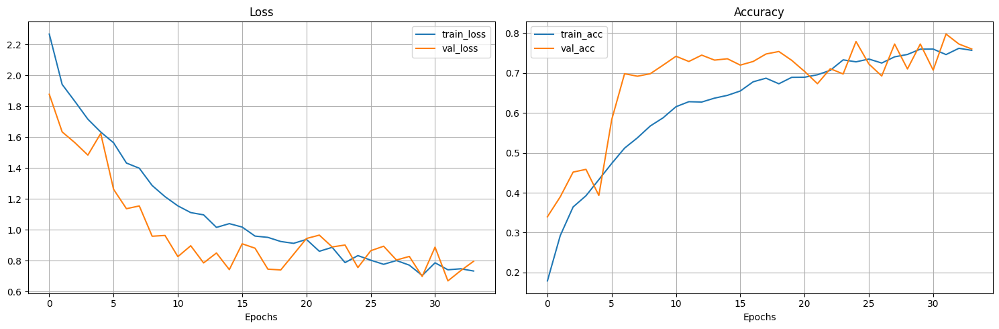

In [ ]:
# plot learning curves
plot_loss_curves(RR_model_dropout_results[RR_best_dropout_probs])

Overfitting has been nearly eliminated, but the lines are still very close. We aim to separate them further for clearer distinction. Let's proceed with further adjustments to achieve this.

Experiment 3: Try different hidden layer sizes.

In [ ]:
# experiment 3: hidden layer sizes
RR_model_hidden_results = experiment_hidden_layer_sizes(train_dataloader=train_dataloader_R,
                                                        val_dataloader=val_dataloader_R,
                                                        num_epochs=num_epochs,
                                                        device=device,
                                                        num_classes=num_classes,
                                                        best_decay_value=RR_best_decay_value,
                                                        best_dropout_probs_combo=RR_best_dropout_probs,
                                                        hidden_layer_sizes_list=hidden_layer_sizes_list)

Experimenting with Hidden Layer Sizes
Hidden layer sizes combinations to try: [(32, 64, 64), (32, 32, 128), (64, 32, 64), (32, 32, 64), (64, 64, 32), (32, 64, 32)]

Testing hidden layer sizes combination: (32, 64, 64)...


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.3738 | train_acc: 0.1746 | val_loss: 1.9345 | val_acc: 0.3648
Epoch: 2 | train_loss: 2.0031 | train_acc: 0.2710 | val_loss: 1.6904 | val_acc: 0.4023
Epoch: 3 | train_loss: 1.8386 | train_acc: 0.3408 | val_loss: 1.4996 | val_acc: 0.4835
Epoch: 4 | train_loss: 1.7463 | train_acc: 0.3859 | val_loss: 1.4560 | val_acc: 0.5244
Epoch: 5 | train_loss: 1.6508 | train_acc: 0.4033 | val_loss: 1.3274 | val_acc: 0.5585
Epoch: 6 | train_loss: 1.5284 | train_acc: 0.4788 | val_loss: 1.2175 | val_acc: 0.6085
Epoch: 7 | train_loss: 1.4640 | train_acc: 0.5138 | val_loss: 1.1682 | val_acc: 0.5710
Epoch: 8 | train_loss: 1.3586 | train_acc: 0.5503 | val_loss: 0.9713 | val_acc: 0.7051
Epoch: 9 | train_loss: 1.2570 | train_acc: 0.6057 | val_loss: 0.8415 | val_acc: 0.7330
Epoch: 10 | train_loss: 1.1774 | train_acc: 0.5995 | val_loss: 0.8243 | val_acc: 0.7449
Epoch: 11 | train_loss: 1.0920 | train_acc: 0.6355 | val_loss: 0.7805 | val_acc: 0.7602
Epoch: 12 | train_loss: 1.0584 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.2242 | train_acc: 0.2173 | val_loss: 1.7471 | val_acc: 0.3767
Epoch: 2 | train_loss: 1.9305 | train_acc: 0.2904 | val_loss: 1.5858 | val_acc: 0.4273
Epoch: 3 | train_loss: 1.7391 | train_acc: 0.3704 | val_loss: 1.4869 | val_acc: 0.4580
Epoch: 4 | train_loss: 1.6242 | train_acc: 0.4194 | val_loss: 1.2868 | val_acc: 0.5330
Epoch: 5 | train_loss: 1.5091 | train_acc: 0.4727 | val_loss: 1.1958 | val_acc: 0.5483
Epoch: 6 | train_loss: 1.3695 | train_acc: 0.5239 | val_loss: 1.0921 | val_acc: 0.5949
Epoch: 7 | train_loss: 1.3645 | train_acc: 0.5491 | val_loss: 0.9954 | val_acc: 0.6392
Epoch: 8 | train_loss: 1.2341 | train_acc: 0.5761 | val_loss: 0.8645 | val_acc: 0.6955
Epoch: 9 | train_loss: 1.1404 | train_acc: 0.6125 | val_loss: 0.8157 | val_acc: 0.7574
Epoch: 10 | train_loss: 1.1261 | train_acc: 0.6250 | val_loss: 0.7614 | val_acc: 0.7602
Epoch: 11 | train_loss: 1.0595 | train_acc: 0.6357 | val_loss: 0.7786 | val_acc: 0.7540
Epoch: 12 | train_loss: 0.9782 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.3290 | train_acc: 0.1970 | val_loss: 2.0368 | val_acc: 0.3273
Epoch: 2 | train_loss: 1.9617 | train_acc: 0.2905 | val_loss: 1.5937 | val_acc: 0.5614
Epoch: 3 | train_loss: 1.7101 | train_acc: 0.4113 | val_loss: 1.3264 | val_acc: 0.6398
Epoch: 4 | train_loss: 1.6135 | train_acc: 0.4437 | val_loss: 1.2027 | val_acc: 0.6085
Epoch: 5 | train_loss: 1.5104 | train_acc: 0.4621 | val_loss: 1.1180 | val_acc: 0.6739
Epoch: 6 | train_loss: 1.4157 | train_acc: 0.5034 | val_loss: 1.0525 | val_acc: 0.6830
Epoch: 7 | train_loss: 1.3146 | train_acc: 0.5392 | val_loss: 0.9829 | val_acc: 0.6892
Epoch: 8 | train_loss: 1.2606 | train_acc: 0.5642 | val_loss: 0.8496 | val_acc: 0.7602
Epoch: 9 | train_loss: 1.1748 | train_acc: 0.5824 | val_loss: 0.8669 | val_acc: 0.7170
Epoch: 10 | train_loss: 1.1187 | train_acc: 0.6027 | val_loss: 0.7712 | val_acc: 0.7540
Epoch: 11 | train_loss: 1.0645 | train_acc: 0.6331 | val_loss: 0.7308 | val_acc: 0.7483
Epoch: 12 | train_loss: 1.0162 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.3769 | train_acc: 0.1622 | val_loss: 1.9818 | val_acc: 0.3557
Epoch: 2 | train_loss: 2.0344 | train_acc: 0.2717 | val_loss: 1.7233 | val_acc: 0.3773
Epoch: 3 | train_loss: 1.8273 | train_acc: 0.3445 | val_loss: 1.5471 | val_acc: 0.4398
Epoch: 4 | train_loss: 1.7506 | train_acc: 0.3950 | val_loss: 1.4139 | val_acc: 0.5682
Epoch: 5 | train_loss: 1.6466 | train_acc: 0.4367 | val_loss: 1.3947 | val_acc: 0.5239
Epoch: 6 | train_loss: 1.5818 | train_acc: 0.4806 | val_loss: 1.2307 | val_acc: 0.6426
Epoch: 7 | train_loss: 1.4645 | train_acc: 0.4881 | val_loss: 1.1299 | val_acc: 0.6705
Epoch: 8 | train_loss: 1.4148 | train_acc: 0.5287 | val_loss: 1.0289 | val_acc: 0.6801
Epoch: 9 | train_loss: 1.2994 | train_acc: 0.5557 | val_loss: 0.9652 | val_acc: 0.7176
Epoch: 10 | train_loss: 1.2219 | train_acc: 0.5932 | val_loss: 0.9263 | val_acc: 0.7364
Epoch: 11 | train_loss: 1.2088 | train_acc: 0.5797 | val_loss: 0.8428 | val_acc: 0.7455
Epoch: 12 | train_loss: 1.0709 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.4098 | train_acc: 0.1675 | val_loss: 1.9878 | val_acc: 0.3568
Epoch: 2 | train_loss: 2.0325 | train_acc: 0.2725 | val_loss: 1.7754 | val_acc: 0.3835
Epoch: 3 | train_loss: 1.8671 | train_acc: 0.3177 | val_loss: 1.4788 | val_acc: 0.4710
Epoch: 4 | train_loss: 1.7416 | train_acc: 0.4114 | val_loss: 1.3012 | val_acc: 0.5551
Epoch: 5 | train_loss: 1.6263 | train_acc: 0.4379 | val_loss: 1.1481 | val_acc: 0.6210
Epoch: 6 | train_loss: 1.4501 | train_acc: 0.4882 | val_loss: 1.0106 | val_acc: 0.6676
Epoch: 7 | train_loss: 1.3506 | train_acc: 0.5454 | val_loss: 0.9795 | val_acc: 0.6142
Epoch: 8 | train_loss: 1.2789 | train_acc: 0.5796 | val_loss: 0.9532 | val_acc: 0.7170
Epoch: 9 | train_loss: 1.1671 | train_acc: 0.6184 | val_loss: 0.7990 | val_acc: 0.7358
Epoch: 10 | train_loss: 1.0916 | train_acc: 0.6268 | val_loss: 0.7286 | val_acc: 0.7449
Epoch: 11 | train_loss: 0.9885 | train_acc: 0.6502 | val_loss: 0.7204 | val_acc: 0.7545
Epoch: 12 | train_loss: 1.0120 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.3450 | train_acc: 0.1783 | val_loss: 1.7968 | val_acc: 0.3523
Epoch: 2 | train_loss: 2.0235 | train_acc: 0.2816 | val_loss: 1.6343 | val_acc: 0.4335
Epoch: 3 | train_loss: 1.8470 | train_acc: 0.3220 | val_loss: 1.5534 | val_acc: 0.4648
Epoch: 4 | train_loss: 1.7814 | train_acc: 0.3725 | val_loss: 1.4621 | val_acc: 0.4523
Epoch: 5 | train_loss: 1.6939 | train_acc: 0.4037 | val_loss: 1.3000 | val_acc: 0.5114
Epoch: 6 | train_loss: 1.6237 | train_acc: 0.4271 | val_loss: 1.3019 | val_acc: 0.5557
Epoch: 7 | train_loss: 1.5128 | train_acc: 0.4704 | val_loss: 1.1888 | val_acc: 0.5801
Epoch: 8 | train_loss: 1.4674 | train_acc: 0.4983 | val_loss: 1.0852 | val_acc: 0.6801
Epoch: 9 | train_loss: 1.3672 | train_acc: 0.5272 | val_loss: 1.0818 | val_acc: 0.7142
Epoch: 10 | train_loss: 1.2928 | train_acc: 0.5613 | val_loss: 0.9483 | val_acc: 0.7239
Epoch: 11 | train_loss: 1.2223 | train_acc: 0.5897 | val_loss: 0.9570 | val_acc: 0.6835
Epoch: 12 | train_loss: 1.1689 | train_ac

In [ ]:
# put all results in a table and print it
hidden_size_results_list = [(combo, RR_model_hidden_results[combo]['generalization_gap'], RR_model_hidden_results[combo]['val_acc'][-1]) for combo in RR_model_hidden_results]
hidden_size_results_df = pd.DataFrame(hidden_size_results_list, columns=['Hidden Layer Sizes', 'Generalization Gap', 'Validation Accuracy'])
hidden_size_df = hidden_size_results_df.sort_values(by='Validation Accuracy', ascending=False)
print("\n", hidden_size_df.to_string(index=False))


 Hidden Layer Sizes  Generalization Gap  Validation Accuracy
      (64, 64, 32)           -0.049343             0.841477
      (32, 64, 32)           -0.066255             0.828977
     (32, 32, 128)           -0.005525             0.816477
      (32, 32, 64)           -0.039401             0.813636
      (64, 32, 64)           -0.014923             0.813636
      (32, 64, 64)           -0.000181             0.813068


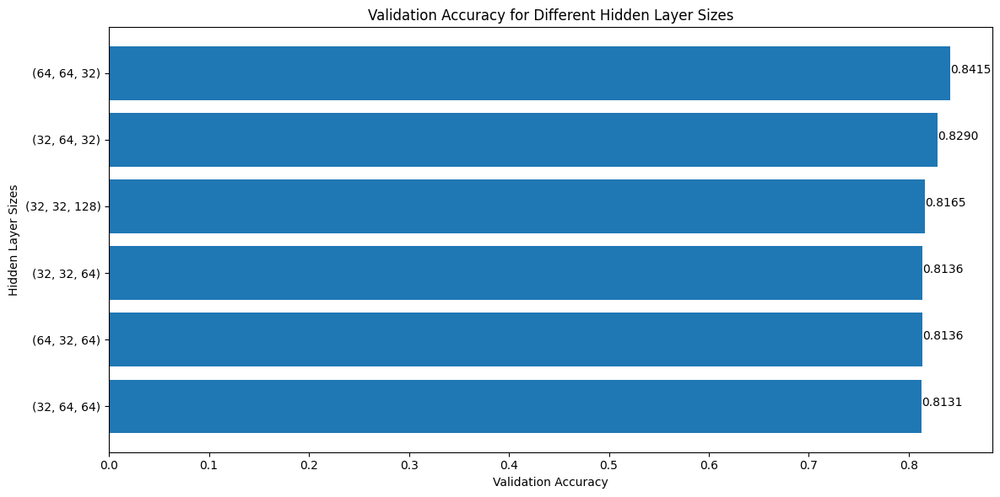

In [ ]:
# plot the results of hidden layer sizes experiment
plot_hidden_layer_results(hidden_size_df)

In [ ]:
RR_best_hidden_units = hidden_size_df.iloc[0]['Hidden Layer Sizes']
print(f"Best hidden layer sizes: {RR_best_hidden_units}")

Best hidden layer sizes: (64, 64, 32)


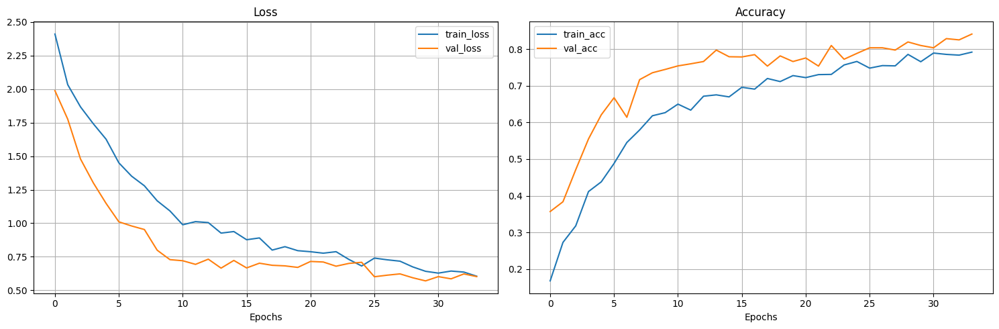

In [ ]:
# plot curves
plot_loss_curves(RR_model_hidden_results[RR_best_hidden_units])

After tuning the hidden layer sizes, the learning curves are more distinctly separated, clearly indicating the absence of overfitting.

Experiment 4. Try different optimizers and learning rates.

In [ ]:
# experiment 4: optimizers and learning rates
RR_model_opt_results = experiment_optimizers_and_learning_rates(train_dataloader=train_dataloader_R,
                                                                val_dataloader=val_dataloader_R,
                                                                num_epochs=num_epochs,
                                                                device=device,
                                                                num_classes=num_classes,
                                                                best_hidden_units_combo=RR_best_hidden_units,
                                                                best_decay_value=RR_best_decay_value,
                                                                best_dropout_probs_combo=RR_best_dropout_probs,
                                                                learning_rates_list=learning_rates_list)

Experimenting with Optimizers and Learning Rates
Learning rates to try: [0.01, 0.001, 0.0001, 1e-05, 1e-06]
Optimizers to try: ['SGD', 'RMSprop', 'Adam', 'AdamW', 'NAdam']

Testing SGD optimizer...

Learning rate: 0.01... 



  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.3806 | train_acc: 0.1200 | val_loss: 2.3457 | val_acc: 0.1517
Epoch: 2 | train_loss: 2.3287 | train_acc: 0.1273 | val_loss: 2.2746 | val_acc: 0.2710
Epoch: 3 | train_loss: 2.2793 | train_acc: 0.1665 | val_loss: 2.1928 | val_acc: 0.2898
Epoch: 4 | train_loss: 2.2299 | train_acc: 0.1954 | val_loss: 2.1396 | val_acc: 0.3085
Epoch: 5 | train_loss: 2.1947 | train_acc: 0.2520 | val_loss: 2.0911 | val_acc: 0.3551
Epoch: 6 | train_loss: 2.1564 | train_acc: 0.2876 | val_loss: 2.0395 | val_acc: 0.3614
Epoch: 7 | train_loss: 2.1257 | train_acc: 0.2990 | val_loss: 1.9942 | val_acc: 0.3864
Epoch: 8 | train_loss: 2.0730 | train_acc: 0.3093 | val_loss: 1.9292 | val_acc: 0.3835
Epoch: 9 | train_loss: 2.0475 | train_acc: 0.3293 | val_loss: 1.8787 | val_acc: 0.3898
Epoch: 10 | train_loss: 1.9990 | train_acc: 0.3434 | val_loss: 1.8273 | val_acc: 0.3960
Epoch: 11 | train_loss: 1.9415 | train_acc: 0.3650 | val_loss: 1.7692 | val_acc: 0.4176
Epoch: 12 | train_loss: 1.9194 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.4062 | train_acc: 0.0811 | val_loss: 2.3981 | val_acc: 0.0688
Epoch: 2 | train_loss: 2.4030 | train_acc: 0.0905 | val_loss: 2.3918 | val_acc: 0.1051
Epoch: 3 | train_loss: 2.3957 | train_acc: 0.0962 | val_loss: 2.3860 | val_acc: 0.1625
Epoch: 4 | train_loss: 2.3818 | train_acc: 0.0985 | val_loss: 2.3799 | val_acc: 0.1835
Epoch: 5 | train_loss: 2.3877 | train_acc: 0.0870 | val_loss: 2.3744 | val_acc: 0.1710
Epoch: 6 | train_loss: 2.3770 | train_acc: 0.1012 | val_loss: 2.3690 | val_acc: 0.1460
Epoch: 7 | train_loss: 2.3789 | train_acc: 0.1033 | val_loss: 2.3634 | val_acc: 0.1335
Epoch: 8 | train_loss: 2.3750 | train_acc: 0.1010 | val_loss: 2.3580 | val_acc: 0.1273
Epoch: 9 | train_loss: 2.3565 | train_acc: 0.1150 | val_loss: 2.3509 | val_acc: 0.1273
Epoch: 10 | train_loss: 2.3648 | train_acc: 0.0904 | val_loss: 2.3445 | val_acc: 0.1273
Epoch: 11 | train_loss: 2.3662 | train_acc: 0.1060 | val_loss: 2.3378 | val_acc: 0.1273
Epoch: 12 | train_loss: 2.3394 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.4244 | train_acc: 0.0690 | val_loss: 2.4102 | val_acc: 0.0875
Epoch: 2 | train_loss: 2.4101 | train_acc: 0.0756 | val_loss: 2.4097 | val_acc: 0.0875
Epoch: 3 | train_loss: 2.4223 | train_acc: 0.0723 | val_loss: 2.4093 | val_acc: 0.0875
Epoch: 4 | train_loss: 2.4150 | train_acc: 0.0885 | val_loss: 2.4088 | val_acc: 0.0875
Epoch: 5 | train_loss: 2.4236 | train_acc: 0.0771 | val_loss: 2.4083 | val_acc: 0.0875
Epoch: 6 | train_loss: 2.4108 | train_acc: 0.0895 | val_loss: 2.4079 | val_acc: 0.0875
Epoch: 7 | train_loss: 2.4127 | train_acc: 0.0780 | val_loss: 2.4075 | val_acc: 0.0875
Epoch: 8 | train_loss: 2.4067 | train_acc: 0.0993 | val_loss: 2.4070 | val_acc: 0.0875
Epoch: 9 | train_loss: 2.4197 | train_acc: 0.0748 | val_loss: 2.4065 | val_acc: 0.0875
Epoch: 10 | train_loss: 2.4116 | train_acc: 0.0828 | val_loss: 2.4061 | val_acc: 0.0875
Epoch: 11 | train_loss: 2.4198 | train_acc: 0.0757 | val_loss: 2.4057 | val_acc: 0.0875
Epoch: 12 | train_loss: 2.4015 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.4136 | train_acc: 0.1049 | val_loss: 2.3935 | val_acc: 0.0938
Epoch: 2 | train_loss: 2.4056 | train_acc: 0.1019 | val_loss: 2.3934 | val_acc: 0.0938
Epoch: 3 | train_loss: 2.4073 | train_acc: 0.1165 | val_loss: 2.3933 | val_acc: 0.0938
Epoch: 4 | train_loss: 2.4199 | train_acc: 0.1167 | val_loss: 2.3932 | val_acc: 0.0938
Epoch: 5 | train_loss: 2.4139 | train_acc: 0.0919 | val_loss: 2.3931 | val_acc: 0.0938
Epoch: 6 | train_loss: 2.4078 | train_acc: 0.1091 | val_loss: 2.3931 | val_acc: 0.1000
Epoch: 7 | train_loss: 2.4056 | train_acc: 0.1109 | val_loss: 2.3930 | val_acc: 0.1000
Epoch: 8 | train_loss: 2.4065 | train_acc: 0.1012 | val_loss: 2.3929 | val_acc: 0.1000
Epoch: 9 | train_loss: 2.4164 | train_acc: 0.0946 | val_loss: 2.3929 | val_acc: 0.1000
Epoch: 10 | train_loss: 2.4156 | train_acc: 0.0958 | val_loss: 2.3928 | val_acc: 0.1000
Epoch: 11 | train_loss: 2.4142 | train_acc: 0.0904 | val_loss: 2.3927 | val_acc: 0.1000
Epoch: 12 | train_loss: 2.4200 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.4182 | train_acc: 0.0911 | val_loss: 2.4034 | val_acc: 0.0875
Epoch: 2 | train_loss: 2.4208 | train_acc: 0.0779 | val_loss: 2.4034 | val_acc: 0.0875
Epoch: 3 | train_loss: 2.4141 | train_acc: 0.0846 | val_loss: 2.4034 | val_acc: 0.0875
Epoch: 4 | train_loss: 2.4252 | train_acc: 0.0625 | val_loss: 2.4034 | val_acc: 0.0875
Epoch: 5 | train_loss: 2.4186 | train_acc: 0.0895 | val_loss: 2.4034 | val_acc: 0.0875
Epoch: 6 | train_loss: 2.4207 | train_acc: 0.0812 | val_loss: 2.4034 | val_acc: 0.0875
Epoch: 7 | train_loss: 2.4231 | train_acc: 0.0812 | val_loss: 2.4034 | val_acc: 0.0875
Epoch: 8 | train_loss: 2.4215 | train_acc: 0.0764 | val_loss: 2.4034 | val_acc: 0.0875
Epoch: 9 | train_loss: 2.4271 | train_acc: 0.0732 | val_loss: 2.4034 | val_acc: 0.0875
Epoch: 10 | train_loss: 2.4198 | train_acc: 0.0845 | val_loss: 2.4034 | val_acc: 0.0875
Epoch: 11 | train_loss: 2.4069 | train_acc: 0.0780 | val_loss: 2.4033 | val_acc: 0.0875
Epoch: 12 | train_loss: 2.4217 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 497.5595 | train_acc: 0.0912 | val_loss: 2.3551 | val_acc: 0.0852
Epoch: 2 | train_loss: 2.4080 | train_acc: 0.1050 | val_loss: 2.3421 | val_acc: 0.1375
Epoch: 3 | train_loss: 2.4024 | train_acc: 0.0938 | val_loss: 2.3382 | val_acc: 0.1562
Epoch: 4 | train_loss: 2.3939 | train_acc: 0.1074 | val_loss: 2.3440 | val_acc: 0.1273
Epoch: 5 | train_loss: 2.3827 | train_acc: 0.1124 | val_loss: 2.3545 | val_acc: 0.1000
Epoch: 6 | train_loss: 2.3865 | train_acc: 0.1061 | val_loss: 2.3296 | val_acc: 0.1000
Epoch: 7 | train_loss: 2.3774 | train_acc: 0.1123 | val_loss: 2.3479 | val_acc: 0.0875
Epoch: 8 | train_loss: 2.3832 | train_acc: 0.1091 | val_loss: 2.3517 | val_acc: 0.0852
Epoch: 9 | train_loss: 2.3802 | train_acc: 0.1134 | val_loss: 2.3292 | val_acc: 0.1562
Epoch: 10 | train_loss: 2.3869 | train_acc: 0.0813 | val_loss: 2.3304 | val_acc: 0.1375
Epoch: 11 | train_loss: 2.3955 | train_acc: 0.1042 | val_loss: 2.3387 | val_acc: 0.1375
Epoch: 12 | train_loss: 2.3836 | train_

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.3285 | train_acc: 0.1935 | val_loss: 1.9630 | val_acc: 0.3710
Epoch: 2 | train_loss: 2.0397 | train_acc: 0.2981 | val_loss: 1.7860 | val_acc: 0.3682
Epoch: 3 | train_loss: 1.8352 | train_acc: 0.3424 | val_loss: 1.4782 | val_acc: 0.5364
Epoch: 4 | train_loss: 1.7110 | train_acc: 0.3897 | val_loss: 1.3595 | val_acc: 0.5210
Epoch: 5 | train_loss: 1.6464 | train_acc: 0.4273 | val_loss: 1.2368 | val_acc: 0.5585
Epoch: 6 | train_loss: 1.5133 | train_acc: 0.4885 | val_loss: 1.1008 | val_acc: 0.6585
Epoch: 7 | train_loss: 1.3663 | train_acc: 0.5239 | val_loss: 0.9936 | val_acc: 0.7261
Epoch: 8 | train_loss: 1.3130 | train_acc: 0.5266 | val_loss: 0.9201 | val_acc: 0.7330
Epoch: 9 | train_loss: 1.2038 | train_acc: 0.5901 | val_loss: 0.8902 | val_acc: 0.7080
Epoch: 10 | train_loss: 1.1371 | train_acc: 0.6034 | val_loss: 0.8257 | val_acc: 0.7670
Epoch: 11 | train_loss: 1.0797 | train_acc: 0.6201 | val_loss: 0.7388 | val_acc: 0.7636
Epoch: 12 | train_loss: 1.0495 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.3148 | train_acc: 0.1409 | val_loss: 2.2137 | val_acc: 0.2460
Epoch: 2 | train_loss: 2.2484 | train_acc: 0.1659 | val_loss: 2.1344 | val_acc: 0.2835
Epoch: 3 | train_loss: 2.1864 | train_acc: 0.2420 | val_loss: 2.0635 | val_acc: 0.3398
Epoch: 4 | train_loss: 2.1592 | train_acc: 0.2530 | val_loss: 1.9841 | val_acc: 0.3523
Epoch: 5 | train_loss: 2.0835 | train_acc: 0.2904 | val_loss: 1.9001 | val_acc: 0.3898
Epoch: 6 | train_loss: 2.0305 | train_acc: 0.2856 | val_loss: 1.8281 | val_acc: 0.3898
Epoch: 7 | train_loss: 1.9865 | train_acc: 0.3021 | val_loss: 1.7575 | val_acc: 0.4273
Epoch: 8 | train_loss: 1.9418 | train_acc: 0.3266 | val_loss: 1.6735 | val_acc: 0.4398
Epoch: 9 | train_loss: 1.8760 | train_acc: 0.3303 | val_loss: 1.6161 | val_acc: 0.4398
Epoch: 10 | train_loss: 1.8579 | train_acc: 0.3552 | val_loss: 1.5847 | val_acc: 0.4773
Epoch: 11 | train_loss: 1.8045 | train_acc: 0.3669 | val_loss: 1.5395 | val_acc: 0.4835
Epoch: 12 | train_loss: 1.8057 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.3896 | train_acc: 0.1174 | val_loss: 2.3745 | val_acc: 0.1585
Epoch: 2 | train_loss: 2.3834 | train_acc: 0.0962 | val_loss: 2.3642 | val_acc: 0.1273
Epoch: 3 | train_loss: 2.3636 | train_acc: 0.1092 | val_loss: 2.3542 | val_acc: 0.1273
Epoch: 4 | train_loss: 2.3609 | train_acc: 0.1117 | val_loss: 2.3445 | val_acc: 0.1273
Epoch: 5 | train_loss: 2.3643 | train_acc: 0.0905 | val_loss: 2.3359 | val_acc: 0.1273
Epoch: 6 | train_loss: 2.3508 | train_acc: 0.1043 | val_loss: 2.3262 | val_acc: 0.1273
Epoch: 7 | train_loss: 2.3191 | train_acc: 0.1238 | val_loss: 2.3151 | val_acc: 0.1273
Epoch: 8 | train_loss: 2.3274 | train_acc: 0.1192 | val_loss: 2.3045 | val_acc: 0.1273
Epoch: 9 | train_loss: 2.3175 | train_acc: 0.1090 | val_loss: 2.2934 | val_acc: 0.1273
Epoch: 10 | train_loss: 2.3226 | train_acc: 0.1101 | val_loss: 2.2859 | val_acc: 0.1273
Epoch: 11 | train_loss: 2.3039 | train_acc: 0.1139 | val_loss: 2.2780 | val_acc: 0.1273
Epoch: 12 | train_loss: 2.3052 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.4245 | train_acc: 0.0658 | val_loss: 2.4172 | val_acc: 0.0585
Epoch: 2 | train_loss: 2.4322 | train_acc: 0.0731 | val_loss: 2.4155 | val_acc: 0.0585
Epoch: 3 | train_loss: 2.4391 | train_acc: 0.0673 | val_loss: 2.4142 | val_acc: 0.0585
Epoch: 4 | train_loss: 2.4273 | train_acc: 0.0724 | val_loss: 2.4130 | val_acc: 0.0585
Epoch: 5 | train_loss: 2.4255 | train_acc: 0.0705 | val_loss: 2.4120 | val_acc: 0.0585
Epoch: 6 | train_loss: 2.4192 | train_acc: 0.0771 | val_loss: 2.4111 | val_acc: 0.0585
Epoch: 7 | train_loss: 2.4301 | train_acc: 0.0730 | val_loss: 2.4102 | val_acc: 0.0585
Epoch: 8 | train_loss: 2.4309 | train_acc: 0.0608 | val_loss: 2.4092 | val_acc: 0.0585
Epoch: 9 | train_loss: 2.4298 | train_acc: 0.0747 | val_loss: 2.4082 | val_acc: 0.0585
Epoch: 10 | train_loss: 2.4195 | train_acc: 0.0666 | val_loss: 2.4073 | val_acc: 0.0585
Epoch: 11 | train_loss: 2.4248 | train_acc: 0.0738 | val_loss: 2.4065 | val_acc: 0.0585
Epoch: 12 | train_loss: 2.4207 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.4380 | train_acc: 0.1166 | val_loss: 2.3366 | val_acc: 0.1562
Epoch: 2 | train_loss: 2.3906 | train_acc: 0.1412 | val_loss: 2.3176 | val_acc: 0.1619
Epoch: 3 | train_loss: 2.3838 | train_acc: 0.1356 | val_loss: 2.3481 | val_acc: 0.1000
Epoch: 4 | train_loss: 2.3690 | train_acc: 0.1012 | val_loss: 2.3291 | val_acc: 0.1562
Epoch: 5 | train_loss: 2.3803 | train_acc: 0.1168 | val_loss: 2.3399 | val_acc: 0.1273
Epoch: 6 | train_loss: 2.3777 | train_acc: 0.1094 | val_loss: 2.3304 | val_acc: 0.1562
Epoch: 7 | train_loss: 2.3757 | train_acc: 0.1042 | val_loss: 2.3390 | val_acc: 0.1562
Epoch: 8 | train_loss: 2.3684 | train_acc: 0.1018 | val_loss: 2.3415 | val_acc: 0.1000
Epoch: 9 | train_loss: 2.3706 | train_acc: 0.1143 | val_loss: 2.3362 | val_acc: 0.1000
Epoch: 10 | train_loss: 2.3714 | train_acc: 0.1083 | val_loss: 2.3429 | val_acc: 0.1000
Epoch: 11 | train_loss: 2.3698 | train_acc: 0.1107 | val_loss: 2.3462 | val_acc: 0.1375
Epoch: 12 | train_loss: 2.3696 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.2905 | train_acc: 0.1544 | val_loss: 2.0677 | val_acc: 0.3398
Epoch: 2 | train_loss: 2.1006 | train_acc: 0.2949 | val_loss: 1.7722 | val_acc: 0.3835
Epoch: 3 | train_loss: 1.8997 | train_acc: 0.3261 | val_loss: 1.5711 | val_acc: 0.4864
Epoch: 4 | train_loss: 1.8019 | train_acc: 0.3749 | val_loss: 1.4684 | val_acc: 0.5051
Epoch: 5 | train_loss: 1.7324 | train_acc: 0.3825 | val_loss: 1.4576 | val_acc: 0.4625
Epoch: 6 | train_loss: 1.6742 | train_acc: 0.4423 | val_loss: 1.3235 | val_acc: 0.5273
Epoch: 7 | train_loss: 1.5545 | train_acc: 0.4702 | val_loss: 1.0831 | val_acc: 0.6239
Epoch: 8 | train_loss: 1.3584 | train_acc: 0.5327 | val_loss: 0.8948 | val_acc: 0.7886
Epoch: 9 | train_loss: 1.2747 | train_acc: 0.5810 | val_loss: 0.8627 | val_acc: 0.7517
Epoch: 10 | train_loss: 1.1523 | train_acc: 0.5998 | val_loss: 0.7875 | val_acc: 0.7574
Epoch: 11 | train_loss: 1.1057 | train_acc: 0.6305 | val_loss: 0.7651 | val_acc: 0.7670
Epoch: 12 | train_loss: 1.0474 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.3836 | train_acc: 0.0977 | val_loss: 2.3235 | val_acc: 0.1273
Epoch: 2 | train_loss: 2.3109 | train_acc: 0.1247 | val_loss: 2.2364 | val_acc: 0.1398
Epoch: 3 | train_loss: 2.2556 | train_acc: 0.1567 | val_loss: 2.1968 | val_acc: 0.1585
Epoch: 4 | train_loss: 2.2412 | train_acc: 0.1355 | val_loss: 2.1810 | val_acc: 0.2023
Epoch: 5 | train_loss: 2.2158 | train_acc: 0.1644 | val_loss: 2.1221 | val_acc: 0.2273
Epoch: 6 | train_loss: 2.1710 | train_acc: 0.1893 | val_loss: 2.0802 | val_acc: 0.3023
Epoch: 7 | train_loss: 2.1498 | train_acc: 0.2315 | val_loss: 2.0300 | val_acc: 0.4085
Epoch: 8 | train_loss: 2.1019 | train_acc: 0.2873 | val_loss: 1.9519 | val_acc: 0.4148
Epoch: 9 | train_loss: 2.0468 | train_acc: 0.3213 | val_loss: 1.9033 | val_acc: 0.4273
Epoch: 10 | train_loss: 1.9842 | train_acc: 0.3330 | val_loss: 1.7815 | val_acc: 0.4273
Epoch: 11 | train_loss: 1.9153 | train_acc: 0.3538 | val_loss: 1.6705 | val_acc: 0.4460
Epoch: 12 | train_loss: 1.8494 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.4364 | train_acc: 0.0714 | val_loss: 2.4057 | val_acc: 0.0437
Epoch: 2 | train_loss: 2.4134 | train_acc: 0.0707 | val_loss: 2.3971 | val_acc: 0.0716
Epoch: 3 | train_loss: 2.4034 | train_acc: 0.0885 | val_loss: 2.3901 | val_acc: 0.1080
Epoch: 4 | train_loss: 2.4005 | train_acc: 0.0844 | val_loss: 2.3837 | val_acc: 0.1835
Epoch: 5 | train_loss: 2.3930 | train_acc: 0.0918 | val_loss: 2.3773 | val_acc: 0.1460
Epoch: 6 | train_loss: 2.3941 | train_acc: 0.0885 | val_loss: 2.3721 | val_acc: 0.1460
Epoch: 7 | train_loss: 2.3773 | train_acc: 0.0959 | val_loss: 2.3660 | val_acc: 0.1335
Epoch: 8 | train_loss: 2.3715 | train_acc: 0.1017 | val_loss: 2.3593 | val_acc: 0.1273
Epoch: 9 | train_loss: 2.3636 | train_acc: 0.1066 | val_loss: 2.3525 | val_acc: 0.1273
Epoch: 10 | train_loss: 2.3585 | train_acc: 0.1133 | val_loss: 2.3462 | val_acc: 0.1273
Epoch: 11 | train_loss: 2.3615 | train_acc: 0.0970 | val_loss: 2.3390 | val_acc: 0.1273
Epoch: 12 | train_loss: 2.3442 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.3903 | train_acc: 0.1183 | val_loss: 2.3817 | val_acc: 0.1062
Epoch: 2 | train_loss: 2.3944 | train_acc: 0.1116 | val_loss: 2.3808 | val_acc: 0.1062
Epoch: 3 | train_loss: 2.4031 | train_acc: 0.1320 | val_loss: 2.3799 | val_acc: 0.1062
Epoch: 4 | train_loss: 2.3961 | train_acc: 0.1167 | val_loss: 2.3790 | val_acc: 0.1062
Epoch: 5 | train_loss: 2.3870 | train_acc: 0.1076 | val_loss: 2.3781 | val_acc: 0.1426
Epoch: 6 | train_loss: 2.3990 | train_acc: 0.1150 | val_loss: 2.3774 | val_acc: 0.1426
Epoch: 7 | train_loss: 2.3904 | train_acc: 0.1061 | val_loss: 2.3765 | val_acc: 0.1426
Epoch: 8 | train_loss: 2.3969 | train_acc: 0.1273 | val_loss: 2.3756 | val_acc: 0.1335
Epoch: 9 | train_loss: 2.3847 | train_acc: 0.1183 | val_loss: 2.3748 | val_acc: 0.1335
Epoch: 10 | train_loss: 2.3831 | train_acc: 0.1174 | val_loss: 2.3740 | val_acc: 0.1335
Epoch: 11 | train_loss: 2.3912 | train_acc: 0.1168 | val_loss: 2.3732 | val_acc: 0.1335
Epoch: 12 | train_loss: 2.3753 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.6057 | train_acc: 0.1148 | val_loss: 2.3281 | val_acc: 0.1375
Epoch: 2 | train_loss: 2.3743 | train_acc: 0.1117 | val_loss: 2.3314 | val_acc: 0.1375
Epoch: 3 | train_loss: 2.3767 | train_acc: 0.1182 | val_loss: 2.3480 | val_acc: 0.1562
Epoch: 4 | train_loss: 2.3840 | train_acc: 0.1020 | val_loss: 2.3334 | val_acc: 0.1375
Epoch: 5 | train_loss: 2.3693 | train_acc: 0.1223 | val_loss: 2.3297 | val_acc: 0.1375
Epoch: 6 | train_loss: 2.3764 | train_acc: 0.1204 | val_loss: 2.3426 | val_acc: 0.1562
Epoch: 7 | train_loss: 2.3767 | train_acc: 0.1107 | val_loss: 2.3323 | val_acc: 0.1562
Epoch: 8 | train_loss: 2.3810 | train_acc: 0.0967 | val_loss: 2.3320 | val_acc: 0.1375
Epoch: 9 | train_loss: 2.3672 | train_acc: 0.1133 | val_loss: 2.3283 | val_acc: 0.1375
Epoch: 10 | train_loss: 2.3728 | train_acc: 0.1018 | val_loss: 2.3461 | val_acc: 0.1000
Epoch: 11 | train_loss: 2.3775 | train_acc: 0.1068 | val_loss: 2.3386 | val_acc: 0.1375
Epoch: 12 | train_loss: 2.3746 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.2994 | train_acc: 0.1362 | val_loss: 2.1160 | val_acc: 0.3273
Epoch: 2 | train_loss: 2.0796 | train_acc: 0.2782 | val_loss: 1.7637 | val_acc: 0.3898
Epoch: 3 | train_loss: 1.8738 | train_acc: 0.3293 | val_loss: 1.6215 | val_acc: 0.4494
Epoch: 4 | train_loss: 1.7643 | train_acc: 0.3464 | val_loss: 1.4864 | val_acc: 0.4455
Epoch: 5 | train_loss: 1.6802 | train_acc: 0.3948 | val_loss: 1.3891 | val_acc: 0.4864
Epoch: 6 | train_loss: 1.5930 | train_acc: 0.4431 | val_loss: 1.2454 | val_acc: 0.5835
Epoch: 7 | train_loss: 1.4884 | train_acc: 0.4998 | val_loss: 1.1250 | val_acc: 0.6773
Epoch: 8 | train_loss: 1.4039 | train_acc: 0.5377 | val_loss: 0.9285 | val_acc: 0.7176
Epoch: 9 | train_loss: 1.2700 | train_acc: 0.5500 | val_loss: 0.8672 | val_acc: 0.7517
Epoch: 10 | train_loss: 1.2291 | train_acc: 0.5680 | val_loss: 0.8071 | val_acc: 0.7489
Epoch: 11 | train_loss: 1.1430 | train_acc: 0.6037 | val_loss: 0.8256 | val_acc: 0.7358
Epoch: 12 | train_loss: 1.1109 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.3768 | train_acc: 0.0837 | val_loss: 2.3304 | val_acc: 0.1273
Epoch: 2 | train_loss: 2.3194 | train_acc: 0.1019 | val_loss: 2.2605 | val_acc: 0.1273
Epoch: 3 | train_loss: 2.2945 | train_acc: 0.1116 | val_loss: 2.2289 | val_acc: 0.1273
Epoch: 4 | train_loss: 2.2641 | train_acc: 0.1124 | val_loss: 2.1881 | val_acc: 0.1398
Epoch: 5 | train_loss: 2.2357 | train_acc: 0.1527 | val_loss: 2.1148 | val_acc: 0.1648
Epoch: 6 | train_loss: 2.1756 | train_acc: 0.2020 | val_loss: 2.0456 | val_acc: 0.3835
Epoch: 7 | train_loss: 2.1112 | train_acc: 0.2374 | val_loss: 1.9483 | val_acc: 0.3773
Epoch: 8 | train_loss: 2.0546 | train_acc: 0.2757 | val_loss: 1.8270 | val_acc: 0.4023
Epoch: 9 | train_loss: 1.9712 | train_acc: 0.3201 | val_loss: 1.7304 | val_acc: 0.4210
Epoch: 10 | train_loss: 1.9161 | train_acc: 0.3020 | val_loss: 1.6529 | val_acc: 0.4148
Epoch: 11 | train_loss: 1.8662 | train_acc: 0.3170 | val_loss: 1.5998 | val_acc: 0.4648
Epoch: 12 | train_loss: 1.8470 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.4196 | train_acc: 0.0697 | val_loss: 2.3957 | val_acc: 0.1011
Epoch: 2 | train_loss: 2.4036 | train_acc: 0.0723 | val_loss: 2.3899 | val_acc: 0.1648
Epoch: 3 | train_loss: 2.4011 | train_acc: 0.0805 | val_loss: 2.3852 | val_acc: 0.1648
Epoch: 4 | train_loss: 2.3891 | train_acc: 0.0812 | val_loss: 2.3788 | val_acc: 0.1648
Epoch: 5 | train_loss: 2.3787 | train_acc: 0.1017 | val_loss: 2.3716 | val_acc: 0.1648
Epoch: 6 | train_loss: 2.3787 | train_acc: 0.0887 | val_loss: 2.3640 | val_acc: 0.1460
Epoch: 7 | train_loss: 2.3758 | train_acc: 0.1116 | val_loss: 2.3568 | val_acc: 0.1460
Epoch: 8 | train_loss: 2.3655 | train_acc: 0.1042 | val_loss: 2.3479 | val_acc: 0.1398
Epoch: 9 | train_loss: 2.3544 | train_acc: 0.1216 | val_loss: 2.3380 | val_acc: 0.1335
Epoch: 10 | train_loss: 2.3396 | train_acc: 0.1198 | val_loss: 2.3268 | val_acc: 0.1273
Epoch: 11 | train_loss: 2.3487 | train_acc: 0.1028 | val_loss: 2.3158 | val_acc: 0.1273
Epoch: 12 | train_loss: 2.3372 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.4475 | train_acc: 0.0928 | val_loss: 2.4206 | val_acc: 0.1250
Epoch: 2 | train_loss: 2.4436 | train_acc: 0.0812 | val_loss: 2.4193 | val_acc: 0.1250
Epoch: 3 | train_loss: 2.4443 | train_acc: 0.0780 | val_loss: 2.4182 | val_acc: 0.1250
Epoch: 4 | train_loss: 2.4446 | train_acc: 0.0879 | val_loss: 2.4171 | val_acc: 0.1250
Epoch: 5 | train_loss: 2.4469 | train_acc: 0.0789 | val_loss: 2.4159 | val_acc: 0.1125
Epoch: 6 | train_loss: 2.4441 | train_acc: 0.0809 | val_loss: 2.4148 | val_acc: 0.1125
Epoch: 7 | train_loss: 2.4417 | train_acc: 0.0805 | val_loss: 2.4137 | val_acc: 0.1062
Epoch: 8 | train_loss: 2.4424 | train_acc: 0.0935 | val_loss: 2.4127 | val_acc: 0.1000
Epoch: 9 | train_loss: 2.4360 | train_acc: 0.0732 | val_loss: 2.4117 | val_acc: 0.1000
Epoch: 10 | train_loss: 2.4231 | train_acc: 0.0819 | val_loss: 2.4108 | val_acc: 0.0938
Epoch: 11 | train_loss: 2.4293 | train_acc: 0.0813 | val_loss: 2.4098 | val_acc: 0.0938
Epoch: 12 | train_loss: 2.4281 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.4847 | train_acc: 0.1085 | val_loss: 2.3423 | val_acc: 0.1000
Epoch: 2 | train_loss: 2.4537 | train_acc: 0.0978 | val_loss: 2.3326 | val_acc: 0.1562
Epoch: 3 | train_loss: 2.3711 | train_acc: 0.1140 | val_loss: 2.3433 | val_acc: 0.1000
Epoch: 4 | train_loss: 2.3772 | train_acc: 0.1100 | val_loss: 2.3372 | val_acc: 0.1375
Epoch: 5 | train_loss: 2.3718 | train_acc: 0.1100 | val_loss: 2.3343 | val_acc: 0.1562
Epoch: 6 | train_loss: 2.3734 | train_acc: 0.1082 | val_loss: 2.3346 | val_acc: 0.1375
Epoch: 7 | train_loss: 2.3731 | train_acc: 0.1135 | val_loss: 2.3303 | val_acc: 0.1562
Epoch: 8 | train_loss: 2.3718 | train_acc: 0.1051 | val_loss: 2.3474 | val_acc: 0.1562
Epoch: 9 | train_loss: 2.3778 | train_acc: 0.1060 | val_loss: 2.3305 | val_acc: 0.1375
Epoch: 10 | train_loss: 2.3695 | train_acc: 0.1248 | val_loss: 2.3237 | val_acc: 0.1562
Epoch: 11 | train_loss: 2.3760 | train_acc: 0.1066 | val_loss: 2.3394 | val_acc: 0.1000
Epoch: 12 | train_loss: 2.3732 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.2590 | train_acc: 0.1674 | val_loss: 1.9754 | val_acc: 0.4085
Epoch: 2 | train_loss: 1.9873 | train_acc: 0.2839 | val_loss: 1.6333 | val_acc: 0.4210
Epoch: 3 | train_loss: 1.8449 | train_acc: 0.3426 | val_loss: 1.5451 | val_acc: 0.4676
Epoch: 4 | train_loss: 1.7263 | train_acc: 0.4087 | val_loss: 1.3240 | val_acc: 0.5489
Epoch: 5 | train_loss: 1.5987 | train_acc: 0.4570 | val_loss: 1.2489 | val_acc: 0.6267
Epoch: 6 | train_loss: 1.4646 | train_acc: 0.5134 | val_loss: 1.1015 | val_acc: 0.7210
Epoch: 7 | train_loss: 1.3547 | train_acc: 0.5477 | val_loss: 0.9684 | val_acc: 0.7517
Epoch: 8 | train_loss: 1.2116 | train_acc: 0.5885 | val_loss: 0.8465 | val_acc: 0.7233
Epoch: 9 | train_loss: 1.1575 | train_acc: 0.6141 | val_loss: 0.7746 | val_acc: 0.7733
Epoch: 10 | train_loss: 1.1172 | train_acc: 0.6290 | val_loss: 0.7754 | val_acc: 0.7636
Epoch: 11 | train_loss: 1.0533 | train_acc: 0.6451 | val_loss: 0.7127 | val_acc: 0.7920
Epoch: 12 | train_loss: 1.0154 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.3705 | train_acc: 0.1058 | val_loss: 2.3208 | val_acc: 0.1273
Epoch: 2 | train_loss: 2.2960 | train_acc: 0.1159 | val_loss: 2.2366 | val_acc: 0.1273
Epoch: 3 | train_loss: 2.2724 | train_acc: 0.1207 | val_loss: 2.1949 | val_acc: 0.1273
Epoch: 4 | train_loss: 2.2380 | train_acc: 0.1375 | val_loss: 2.1491 | val_acc: 0.1335
Epoch: 5 | train_loss: 2.2162 | train_acc: 0.1698 | val_loss: 2.1023 | val_acc: 0.3023
Epoch: 6 | train_loss: 2.1610 | train_acc: 0.2166 | val_loss: 2.0573 | val_acc: 0.3773
Epoch: 7 | train_loss: 2.1154 | train_acc: 0.2758 | val_loss: 1.9772 | val_acc: 0.3898
Epoch: 8 | train_loss: 2.0635 | train_acc: 0.3129 | val_loss: 1.8912 | val_acc: 0.4023
Epoch: 9 | train_loss: 1.9983 | train_acc: 0.3163 | val_loss: 1.7897 | val_acc: 0.3960
Epoch: 10 | train_loss: 1.9429 | train_acc: 0.3357 | val_loss: 1.7076 | val_acc: 0.4273
Epoch: 11 | train_loss: 1.9300 | train_acc: 0.3180 | val_loss: 1.6494 | val_acc: 0.4773
Epoch: 12 | train_loss: 1.8667 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.4070 | train_acc: 0.0763 | val_loss: 2.3870 | val_acc: 0.1273
Epoch: 2 | train_loss: 2.4004 | train_acc: 0.0724 | val_loss: 2.3819 | val_acc: 0.1273
Epoch: 3 | train_loss: 2.3946 | train_acc: 0.0813 | val_loss: 2.3771 | val_acc: 0.1273
Epoch: 4 | train_loss: 2.3825 | train_acc: 0.0885 | val_loss: 2.3713 | val_acc: 0.1273
Epoch: 5 | train_loss: 2.3705 | train_acc: 0.0977 | val_loss: 2.3652 | val_acc: 0.1273
Epoch: 6 | train_loss: 2.3808 | train_acc: 0.0838 | val_loss: 2.3587 | val_acc: 0.1273
Epoch: 7 | train_loss: 2.3692 | train_acc: 0.0969 | val_loss: 2.3512 | val_acc: 0.1273
Epoch: 8 | train_loss: 2.3565 | train_acc: 0.0960 | val_loss: 2.3421 | val_acc: 0.1273
Epoch: 9 | train_loss: 2.3524 | train_acc: 0.1019 | val_loss: 2.3325 | val_acc: 0.1273
Epoch: 10 | train_loss: 2.3399 | train_acc: 0.1026 | val_loss: 2.3230 | val_acc: 0.1273
Epoch: 11 | train_loss: 2.3356 | train_acc: 0.0998 | val_loss: 2.3133 | val_acc: 0.1273
Epoch: 12 | train_loss: 2.3290 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.4198 | train_acc: 0.0803 | val_loss: 2.3951 | val_acc: 0.0375
Epoch: 2 | train_loss: 2.4101 | train_acc: 0.0806 | val_loss: 2.3940 | val_acc: 0.0375
Epoch: 3 | train_loss: 2.4134 | train_acc: 0.0780 | val_loss: 2.3930 | val_acc: 0.0375
Epoch: 4 | train_loss: 2.4064 | train_acc: 0.0895 | val_loss: 2.3920 | val_acc: 0.0375
Epoch: 5 | train_loss: 2.4076 | train_acc: 0.0928 | val_loss: 2.3911 | val_acc: 0.0437
Epoch: 6 | train_loss: 2.4142 | train_acc: 0.0715 | val_loss: 2.3902 | val_acc: 0.0437
Epoch: 7 | train_loss: 2.4009 | train_acc: 0.0962 | val_loss: 2.3893 | val_acc: 0.0437
Epoch: 8 | train_loss: 2.4081 | train_acc: 0.0797 | val_loss: 2.3883 | val_acc: 0.0437
Epoch: 9 | train_loss: 2.4019 | train_acc: 0.0969 | val_loss: 2.3875 | val_acc: 0.0437
Epoch: 10 | train_loss: 2.3998 | train_acc: 0.0961 | val_loss: 2.3867 | val_acc: 0.0500
Epoch: 11 | train_loss: 2.4028 | train_acc: 0.0904 | val_loss: 2.3859 | val_acc: 0.0591
Epoch: 12 | train_loss: 2.4048 | train_ac

In [ ]:
# put all the results in a table and print it in desc order (results in a list in this case)
optimizers_df = pd.DataFrame(RR_model_opt_results, columns=['Optimizer', 'Best Learning Rate', 'Validation Accuracy'])
optimizers_df = optimizers_df.sort_values(by='Validation Accuracy', ascending=False)
print("\n", optimizers_df.to_string(index=False))


 Optimizer  Best Learning Rate  Validation Accuracy
     Adam               0.001             0.822727
    NAdam               0.001             0.816477
    AdamW               0.001             0.813068
  RMSprop               0.001             0.781818
      SGD               0.010             0.652273


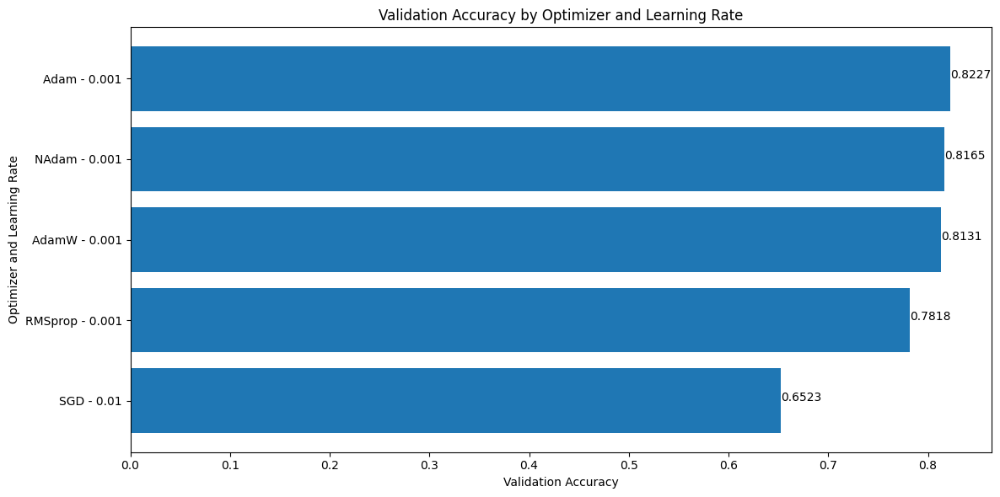

In [ ]:
# plot the results of the experiment
plot_optimizers_results(optimizers_df)

In [ ]:
# get and print best optimizer and learning rate
RR_best_optimizer_name = optimizers_df.iloc[0]['Optimizer']
RR_best_optimizer = torch.optim.__dict__[RR_best_optimizer_name]
print(f"Best optimizer: {RR_best_optimizer_name}")
RR_best_learning_rate = optimizers_df.iloc[0]['Best Learning Rate']
print(f"Best learning rate: {RR_best_learning_rate}")

Best optimizer: Adam
Best learning rate: 0.001


Experiment 5. Try various activation functions.

In [ ]:
# experiment 5: activation functions
RR_model_act_fn_results = experiment_activation_functions(train_dataloader=train_dataloader_R,
                                                          val_dataloader=val_dataloader_R,
                                                          num_epochs=num_epochs,
                                                          device=device,
                                                          num_classes=num_classes,
                                                          best_hidden_units_combo=RR_best_hidden_units,
                                                          best_decay_value=RR_best_decay_value,
                                                          best_dropout_probs_combo=RR_best_dropout_probs,
                                                          best_optimizer=RR_best_optimizer,
                                                          best_learning_rate=RR_best_learning_rate)

Experimenting with Activation Functions
Activation functions to try: ['ReLU', 'LeakyReLU', 'ELU', 'GELU', 'SiLU']

Testing ReLU activation function as activation function in feature extractor...

Testing ReLU activation function as activation function in classifier...


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.3068 | train_acc: 0.1242 | val_loss: 2.1015 | val_acc: 0.1398
Epoch: 2 | train_loss: 2.1969 | train_acc: 0.2455 | val_loss: 1.9829 | val_acc: 0.3835
Epoch: 3 | train_loss: 2.1047 | train_acc: 0.3144 | val_loss: 1.9315 | val_acc: 0.3869
Epoch: 4 | train_loss: 1.9783 | train_acc: 0.3127 | val_loss: 1.6812 | val_acc: 0.4398
Epoch: 5 | train_loss: 1.9327 | train_acc: 0.3530 | val_loss: 1.6691 | val_acc: 0.4773
Epoch: 6 | train_loss: 1.8025 | train_acc: 0.3571 | val_loss: 1.4921 | val_acc: 0.4773
Epoch: 7 | train_loss: 1.7095 | train_acc: 0.4034 | val_loss: 1.4974 | val_acc: 0.4585
Epoch: 8 | train_loss: 1.6354 | train_acc: 0.4366 | val_loss: 1.3333 | val_acc: 0.5551
Epoch: 9 | train_loss: 1.5455 | train_acc: 0.4656 | val_loss: 1.1844 | val_acc: 0.6051
Epoch: 10 | train_loss: 1.4462 | train_acc: 0.5043 | val_loss: 1.0931 | val_acc: 0.6670
Epoch: 11 | train_loss: 1.4438 | train_acc: 0.5032 | val_loss: 1.1515 | val_acc: 0.6170
Epoch: 12 | train_loss: 1.4103 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.3179 | train_acc: 0.1447 | val_loss: 2.1830 | val_acc: 0.2335
Epoch: 2 | train_loss: 2.1728 | train_acc: 0.2207 | val_loss: 1.9515 | val_acc: 0.3773
Epoch: 3 | train_loss: 2.0596 | train_acc: 0.2685 | val_loss: 1.7680 | val_acc: 0.3960
Epoch: 4 | train_loss: 1.9064 | train_acc: 0.3194 | val_loss: 1.5885 | val_acc: 0.4369
Epoch: 5 | train_loss: 1.8079 | train_acc: 0.3505 | val_loss: 1.5062 | val_acc: 0.4739
Epoch: 6 | train_loss: 1.7222 | train_acc: 0.3858 | val_loss: 1.3670 | val_acc: 0.5051
Epoch: 7 | train_loss: 1.6271 | train_acc: 0.4351 | val_loss: 1.2474 | val_acc: 0.5517
Epoch: 8 | train_loss: 1.5058 | train_acc: 0.4630 | val_loss: 1.2183 | val_acc: 0.6483
Epoch: 9 | train_loss: 1.4579 | train_acc: 0.4920 | val_loss: 1.0867 | val_acc: 0.6795
Epoch: 10 | train_loss: 1.3964 | train_acc: 0.5197 | val_loss: 1.0167 | val_acc: 0.7080
Epoch: 11 | train_loss: 1.3170 | train_acc: 0.5382 | val_loss: 1.2068 | val_acc: 0.6517
Epoch: 12 | train_loss: 1.3315 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.2709 | train_acc: 0.1474 | val_loss: 2.0719 | val_acc: 0.2898
Epoch: 2 | train_loss: 2.1241 | train_acc: 0.2822 | val_loss: 1.9181 | val_acc: 0.4494
Epoch: 3 | train_loss: 1.9801 | train_acc: 0.3241 | val_loss: 1.6457 | val_acc: 0.4244
Epoch: 4 | train_loss: 1.8614 | train_acc: 0.3524 | val_loss: 1.5675 | val_acc: 0.4557
Epoch: 5 | train_loss: 1.7057 | train_acc: 0.4049 | val_loss: 1.3966 | val_acc: 0.4932
Epoch: 6 | train_loss: 1.7154 | train_acc: 0.4217 | val_loss: 1.3429 | val_acc: 0.5119
Epoch: 7 | train_loss: 1.5336 | train_acc: 0.4926 | val_loss: 1.2939 | val_acc: 0.6523
Epoch: 8 | train_loss: 1.5072 | train_acc: 0.5009 | val_loss: 1.0897 | val_acc: 0.6926
Epoch: 9 | train_loss: 1.3838 | train_acc: 0.5428 | val_loss: 1.0310 | val_acc: 0.7705
Epoch: 10 | train_loss: 1.3144 | train_acc: 0.5506 | val_loss: 0.8914 | val_acc: 0.7580
Epoch: 11 | train_loss: 1.1996 | train_acc: 0.5749 | val_loss: 0.8651 | val_acc: 0.7699
Epoch: 12 | train_loss: 1.2000 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.3146 | train_acc: 0.1230 | val_loss: 2.2971 | val_acc: 0.2585
Epoch: 2 | train_loss: 2.2033 | train_acc: 0.1890 | val_loss: 2.0347 | val_acc: 0.3085
Epoch: 3 | train_loss: 2.0792 | train_acc: 0.3168 | val_loss: 1.7743 | val_acc: 0.4210
Epoch: 4 | train_loss: 1.8976 | train_acc: 0.3800 | val_loss: 1.7212 | val_acc: 0.4835
Epoch: 5 | train_loss: 1.7998 | train_acc: 0.3684 | val_loss: 1.5659 | val_acc: 0.4273
Epoch: 6 | train_loss: 1.7436 | train_acc: 0.3817 | val_loss: 1.4802 | val_acc: 0.5210
Epoch: 7 | train_loss: 1.6822 | train_acc: 0.4220 | val_loss: 1.3744 | val_acc: 0.5398
Epoch: 8 | train_loss: 1.6379 | train_acc: 0.4574 | val_loss: 1.3069 | val_acc: 0.6273
Epoch: 9 | train_loss: 1.5693 | train_acc: 0.4743 | val_loss: 1.2872 | val_acc: 0.6307
Epoch: 10 | train_loss: 1.4514 | train_acc: 0.5149 | val_loss: 1.1620 | val_acc: 0.6898
Epoch: 11 | train_loss: 1.4032 | train_acc: 0.5104 | val_loss: 1.1594 | val_acc: 0.6585
Epoch: 12 | train_loss: 1.3589 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.2759 | train_acc: 0.1271 | val_loss: 2.0660 | val_acc: 0.3210
Epoch: 2 | train_loss: 2.1206 | train_acc: 0.2685 | val_loss: 1.8337 | val_acc: 0.3710
Epoch: 3 | train_loss: 1.9801 | train_acc: 0.3138 | val_loss: 1.5966 | val_acc: 0.4432
Epoch: 4 | train_loss: 1.7962 | train_acc: 0.3879 | val_loss: 1.5368 | val_acc: 0.4869
Epoch: 5 | train_loss: 1.7034 | train_acc: 0.4261 | val_loss: 1.2848 | val_acc: 0.5994
Epoch: 6 | train_loss: 1.5992 | train_acc: 0.4849 | val_loss: 1.2032 | val_acc: 0.6335
Epoch: 7 | train_loss: 1.5980 | train_acc: 0.4705 | val_loss: 1.1546 | val_acc: 0.6614
Epoch: 8 | train_loss: 1.4375 | train_acc: 0.5322 | val_loss: 1.0372 | val_acc: 0.6739
Epoch: 9 | train_loss: 1.3688 | train_acc: 0.5498 | val_loss: 0.9964 | val_acc: 0.7239
Epoch: 10 | train_loss: 1.3618 | train_acc: 0.5730 | val_loss: 0.9774 | val_acc: 0.7114
Epoch: 11 | train_loss: 1.3035 | train_acc: 0.5683 | val_loss: 0.9055 | val_acc: 0.7142
Epoch: 12 | train_loss: 1.1767 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.3180 | train_acc: 0.1068 | val_loss: 2.3075 | val_acc: 0.1585
Epoch: 2 | train_loss: 2.2185 | train_acc: 0.1619 | val_loss: 2.1430 | val_acc: 0.2898
Epoch: 3 | train_loss: 2.1088 | train_acc: 0.2693 | val_loss: 1.7150 | val_acc: 0.4210
Epoch: 4 | train_loss: 1.9260 | train_acc: 0.3209 | val_loss: 1.5869 | val_acc: 0.4710
Epoch: 5 | train_loss: 1.8411 | train_acc: 0.3764 | val_loss: 1.4497 | val_acc: 0.4773
Epoch: 6 | train_loss: 1.7301 | train_acc: 0.4196 | val_loss: 1.3667 | val_acc: 0.6244
Epoch: 7 | train_loss: 1.6927 | train_acc: 0.4351 | val_loss: 1.2616 | val_acc: 0.6085
Epoch: 8 | train_loss: 1.5048 | train_acc: 0.5028 | val_loss: 1.0027 | val_acc: 0.6801
Epoch: 9 | train_loss: 1.4015 | train_acc: 0.5197 | val_loss: 0.9598 | val_acc: 0.6676
Epoch: 10 | train_loss: 1.3132 | train_acc: 0.5608 | val_loss: 0.8890 | val_acc: 0.7392
Epoch: 11 | train_loss: 1.2775 | train_acc: 0.5698 | val_loss: 0.8960 | val_acc: 0.7364
Epoch: 12 | train_loss: 1.1819 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.3281 | train_acc: 0.1419 | val_loss: 2.2399 | val_acc: 0.3210
Epoch: 2 | train_loss: 2.1782 | train_acc: 0.2451 | val_loss: 1.8571 | val_acc: 0.3398
Epoch: 3 | train_loss: 1.9613 | train_acc: 0.3029 | val_loss: 1.6934 | val_acc: 0.3710
Epoch: 4 | train_loss: 1.8709 | train_acc: 0.3077 | val_loss: 1.6013 | val_acc: 0.4239
Epoch: 5 | train_loss: 1.7699 | train_acc: 0.3696 | val_loss: 1.4512 | val_acc: 0.5551
Epoch: 6 | train_loss: 1.6179 | train_acc: 0.4138 | val_loss: 1.3470 | val_acc: 0.6148
Epoch: 7 | train_loss: 1.5623 | train_acc: 0.4473 | val_loss: 1.1654 | val_acc: 0.6489
Epoch: 8 | train_loss: 1.4628 | train_acc: 0.4975 | val_loss: 1.1358 | val_acc: 0.7335
Epoch: 9 | train_loss: 1.4004 | train_acc: 0.5184 | val_loss: 1.0288 | val_acc: 0.7392
Epoch: 10 | train_loss: 1.2984 | train_acc: 0.5394 | val_loss: 0.8823 | val_acc: 0.7176
Epoch: 11 | train_loss: 1.2925 | train_acc: 0.5688 | val_loss: 0.8703 | val_acc: 0.7420
Epoch: 12 | train_loss: 1.1905 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.2942 | train_acc: 0.1163 | val_loss: 2.1706 | val_acc: 0.3273
Epoch: 2 | train_loss: 2.1230 | train_acc: 0.2835 | val_loss: 1.8101 | val_acc: 0.3869
Epoch: 3 | train_loss: 1.9545 | train_acc: 0.3318 | val_loss: 1.6086 | val_acc: 0.4369
Epoch: 4 | train_loss: 1.8124 | train_acc: 0.3676 | val_loss: 1.4875 | val_acc: 0.4869
Epoch: 5 | train_loss: 1.7011 | train_acc: 0.4318 | val_loss: 1.3126 | val_acc: 0.6114
Epoch: 6 | train_loss: 1.6021 | train_acc: 0.4722 | val_loss: 1.1614 | val_acc: 0.6489
Epoch: 7 | train_loss: 1.4695 | train_acc: 0.5078 | val_loss: 1.0327 | val_acc: 0.7051
Epoch: 8 | train_loss: 1.3593 | train_acc: 0.5524 | val_loss: 0.9169 | val_acc: 0.7051
Epoch: 9 | train_loss: 1.3008 | train_acc: 0.5509 | val_loss: 0.8256 | val_acc: 0.7358
Epoch: 10 | train_loss: 1.1865 | train_acc: 0.5849 | val_loss: 0.8089 | val_acc: 0.7483
Epoch: 11 | train_loss: 1.1007 | train_acc: 0.6221 | val_loss: 0.7241 | val_acc: 0.8011
Epoch: 12 | train_loss: 1.1152 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.2880 | train_acc: 0.1305 | val_loss: 2.1638 | val_acc: 0.3892
Epoch: 2 | train_loss: 2.1920 | train_acc: 0.2796 | val_loss: 1.9449 | val_acc: 0.3710
Epoch: 3 | train_loss: 1.9881 | train_acc: 0.3170 | val_loss: 1.6808 | val_acc: 0.4273
Epoch: 4 | train_loss: 1.8458 | train_acc: 0.3654 | val_loss: 1.4850 | val_acc: 0.4523
Epoch: 5 | train_loss: 1.7268 | train_acc: 0.4142 | val_loss: 1.3598 | val_acc: 0.5244
Epoch: 6 | train_loss: 1.6237 | train_acc: 0.4663 | val_loss: 1.2635 | val_acc: 0.5932
Epoch: 7 | train_loss: 1.5678 | train_acc: 0.5038 | val_loss: 1.2693 | val_acc: 0.6057
Epoch: 8 | train_loss: 1.5077 | train_acc: 0.5231 | val_loss: 1.1472 | val_acc: 0.6773
Epoch: 9 | train_loss: 1.4186 | train_acc: 0.5282 | val_loss: 1.1007 | val_acc: 0.6773
Epoch: 10 | train_loss: 1.3603 | train_acc: 0.5501 | val_loss: 1.0540 | val_acc: 0.7210
Epoch: 11 | train_loss: 1.3110 | train_acc: 0.5654 | val_loss: 1.0274 | val_acc: 0.7210
Epoch: 12 | train_loss: 1.2897 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.3186 | train_acc: 0.1254 | val_loss: 2.2312 | val_acc: 0.2335
Epoch: 2 | train_loss: 2.1800 | train_acc: 0.2111 | val_loss: 1.9084 | val_acc: 0.4023
Epoch: 3 | train_loss: 1.9392 | train_acc: 0.2829 | val_loss: 1.5909 | val_acc: 0.4398
Epoch: 4 | train_loss: 1.8166 | train_acc: 0.3440 | val_loss: 1.4341 | val_acc: 0.4557
Epoch: 5 | train_loss: 1.6797 | train_acc: 0.4399 | val_loss: 1.3457 | val_acc: 0.5869
Epoch: 6 | train_loss: 1.5467 | train_acc: 0.4738 | val_loss: 1.2458 | val_acc: 0.5994
Epoch: 7 | train_loss: 1.4661 | train_acc: 0.5174 | val_loss: 1.1265 | val_acc: 0.6676
Epoch: 8 | train_loss: 1.3991 | train_acc: 0.5272 | val_loss: 1.0995 | val_acc: 0.6494
Epoch: 9 | train_loss: 1.3364 | train_acc: 0.5475 | val_loss: 1.0127 | val_acc: 0.6835
Epoch: 10 | train_loss: 1.2743 | train_acc: 0.5639 | val_loss: 0.9692 | val_acc: 0.6801
Epoch: 11 | train_loss: 1.2226 | train_acc: 0.5860 | val_loss: 0.8860 | val_acc: 0.7205
Epoch: 12 | train_loss: 1.1613 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.2290 | train_acc: 0.1831 | val_loss: 1.7024 | val_acc: 0.3210
Epoch: 2 | train_loss: 1.8899 | train_acc: 0.3422 | val_loss: 1.1984 | val_acc: 0.5585
Epoch: 3 | train_loss: 1.5682 | train_acc: 0.4524 | val_loss: 0.8881 | val_acc: 0.7176
Epoch: 4 | train_loss: 1.3273 | train_acc: 0.5222 | val_loss: 0.7290 | val_acc: 0.7261
Epoch: 5 | train_loss: 1.1542 | train_acc: 0.5929 | val_loss: 0.6419 | val_acc: 0.7727
Epoch: 6 | train_loss: 1.0741 | train_acc: 0.6115 | val_loss: 0.5274 | val_acc: 0.8199
Epoch: 7 | train_loss: 1.0980 | train_acc: 0.6230 | val_loss: 0.5592 | val_acc: 0.7858
Epoch: 8 | train_loss: 0.9521 | train_acc: 0.6567 | val_loss: 0.4715 | val_acc: 0.8011
Epoch: 9 | train_loss: 0.9167 | train_acc: 0.6807 | val_loss: 0.4559 | val_acc: 0.8227
Epoch: 10 | train_loss: 0.9549 | train_acc: 0.6687 | val_loss: 0.4568 | val_acc: 0.8199
Epoch: 11 | train_loss: 0.8720 | train_acc: 0.6792 | val_loss: 0.4258 | val_acc: 0.8352
Epoch: 12 | train_loss: 0.9027 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.2465 | train_acc: 0.1814 | val_loss: 1.6942 | val_acc: 0.3648
Epoch: 2 | train_loss: 1.8563 | train_acc: 0.3316 | val_loss: 1.2658 | val_acc: 0.6170
Epoch: 3 | train_loss: 1.5212 | train_acc: 0.4677 | val_loss: 0.8360 | val_acc: 0.7261
Epoch: 4 | train_loss: 1.2818 | train_acc: 0.5392 | val_loss: 0.8135 | val_acc: 0.7352
Epoch: 5 | train_loss: 1.2406 | train_acc: 0.5542 | val_loss: 0.6993 | val_acc: 0.8102
Epoch: 6 | train_loss: 1.0579 | train_acc: 0.6057 | val_loss: 0.5752 | val_acc: 0.8074
Epoch: 7 | train_loss: 1.0262 | train_acc: 0.6356 | val_loss: 0.6629 | val_acc: 0.7705
Epoch: 8 | train_loss: 0.9355 | train_acc: 0.6674 | val_loss: 0.5629 | val_acc: 0.7949
Epoch: 9 | train_loss: 1.0138 | train_acc: 0.6511 | val_loss: 0.5077 | val_acc: 0.8136
Epoch: 10 | train_loss: 0.8883 | train_acc: 0.6789 | val_loss: 0.5125 | val_acc: 0.8074
Epoch: 11 | train_loss: 0.9186 | train_acc: 0.6682 | val_loss: 0.4985 | val_acc: 0.8165
Epoch: 12 | train_loss: 0.8622 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.1520 | train_acc: 0.2121 | val_loss: 1.4727 | val_acc: 0.6148
Epoch: 2 | train_loss: 1.5848 | train_acc: 0.4474 | val_loss: 0.9245 | val_acc: 0.6739
Epoch: 3 | train_loss: 1.2985 | train_acc: 0.5441 | val_loss: 0.8208 | val_acc: 0.6739
Epoch: 4 | train_loss: 1.1365 | train_acc: 0.6058 | val_loss: 0.6877 | val_acc: 0.7205
Epoch: 5 | train_loss: 1.0539 | train_acc: 0.6293 | val_loss: 0.5922 | val_acc: 0.7949
Epoch: 6 | train_loss: 1.0103 | train_acc: 0.6682 | val_loss: 0.6069 | val_acc: 0.8136
Epoch: 7 | train_loss: 0.9158 | train_acc: 0.6641 | val_loss: 0.5021 | val_acc: 0.8165
Epoch: 8 | train_loss: 0.9356 | train_acc: 0.6641 | val_loss: 0.5081 | val_acc: 0.8261
Epoch: 9 | train_loss: 0.8244 | train_acc: 0.7038 | val_loss: 0.4820 | val_acc: 0.8506
Epoch: 10 | train_loss: 0.8263 | train_acc: 0.7084 | val_loss: 0.4201 | val_acc: 0.8506
Epoch: 11 | train_loss: 0.7958 | train_acc: 0.7305 | val_loss: 0.4113 | val_acc: 0.8602
Epoch: 12 | train_loss: 0.7427 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.1884 | train_acc: 0.2113 | val_loss: 1.7264 | val_acc: 0.3551
Epoch: 2 | train_loss: 1.8178 | train_acc: 0.3883 | val_loss: 1.1811 | val_acc: 0.5739
Epoch: 3 | train_loss: 1.4780 | train_acc: 0.4878 | val_loss: 0.8761 | val_acc: 0.7364
Epoch: 4 | train_loss: 1.2588 | train_acc: 0.5575 | val_loss: 0.7418 | val_acc: 0.7540
Epoch: 5 | train_loss: 1.1492 | train_acc: 0.5895 | val_loss: 0.6272 | val_acc: 0.7727
Epoch: 6 | train_loss: 1.1415 | train_acc: 0.5877 | val_loss: 0.5592 | val_acc: 0.8170
Epoch: 7 | train_loss: 1.0331 | train_acc: 0.6418 | val_loss: 0.5191 | val_acc: 0.8290
Epoch: 8 | train_loss: 0.9980 | train_acc: 0.6303 | val_loss: 0.4957 | val_acc: 0.8040
Epoch: 9 | train_loss: 0.9699 | train_acc: 0.6716 | val_loss: 0.4877 | val_acc: 0.8040
Epoch: 10 | train_loss: 0.9257 | train_acc: 0.6717 | val_loss: 0.4804 | val_acc: 0.8006
Epoch: 11 | train_loss: 0.8772 | train_acc: 0.6826 | val_loss: 0.4289 | val_acc: 0.8352
Epoch: 12 | train_loss: 0.8732 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.2174 | train_acc: 0.1857 | val_loss: 1.7927 | val_acc: 0.2733
Epoch: 2 | train_loss: 1.8244 | train_acc: 0.3494 | val_loss: 1.0614 | val_acc: 0.6955
Epoch: 3 | train_loss: 1.4477 | train_acc: 0.4903 | val_loss: 0.8761 | val_acc: 0.7267
Epoch: 4 | train_loss: 1.2825 | train_acc: 0.5776 | val_loss: 0.7756 | val_acc: 0.7483
Epoch: 5 | train_loss: 1.1816 | train_acc: 0.5889 | val_loss: 0.6839 | val_acc: 0.7858
Epoch: 6 | train_loss: 1.0862 | train_acc: 0.6252 | val_loss: 0.6047 | val_acc: 0.7886
Epoch: 7 | train_loss: 0.9700 | train_acc: 0.6604 | val_loss: 0.5739 | val_acc: 0.8318
Epoch: 8 | train_loss: 1.0062 | train_acc: 0.6444 | val_loss: 0.5620 | val_acc: 0.8318
Epoch: 9 | train_loss: 0.9031 | train_acc: 0.6822 | val_loss: 0.5418 | val_acc: 0.8068
Epoch: 10 | train_loss: 0.8804 | train_acc: 0.6907 | val_loss: 0.5288 | val_acc: 0.8045
Epoch: 11 | train_loss: 0.8421 | train_acc: 0.6871 | val_loss: 0.5154 | val_acc: 0.7790
Epoch: 12 | train_loss: 0.8058 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.2453 | train_acc: 0.1560 | val_loss: 1.9793 | val_acc: 0.3273
Epoch: 2 | train_loss: 1.9472 | train_acc: 0.2946 | val_loss: 1.5833 | val_acc: 0.3710
Epoch: 3 | train_loss: 1.8030 | train_acc: 0.3315 | val_loss: 1.3570 | val_acc: 0.6017
Epoch: 4 | train_loss: 1.5519 | train_acc: 0.4779 | val_loss: 1.1861 | val_acc: 0.5864
Epoch: 5 | train_loss: 1.5036 | train_acc: 0.4703 | val_loss: 1.0827 | val_acc: 0.6523
Epoch: 6 | train_loss: 1.3243 | train_acc: 0.5391 | val_loss: 0.9024 | val_acc: 0.7108
Epoch: 7 | train_loss: 1.2995 | train_acc: 0.5725 | val_loss: 0.8519 | val_acc: 0.7330
Epoch: 8 | train_loss: 1.1844 | train_acc: 0.5822 | val_loss: 0.9349 | val_acc: 0.7665
Epoch: 9 | train_loss: 1.1108 | train_acc: 0.6017 | val_loss: 0.7426 | val_acc: 0.7483
Epoch: 10 | train_loss: 1.0593 | train_acc: 0.6217 | val_loss: 0.7388 | val_acc: 0.7449
Epoch: 11 | train_loss: 1.0141 | train_acc: 0.6393 | val_loss: 0.6772 | val_acc: 0.7580
Epoch: 12 | train_loss: 1.0311 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.2628 | train_acc: 0.1986 | val_loss: 2.0858 | val_acc: 0.3619
Epoch: 2 | train_loss: 1.9787 | train_acc: 0.2858 | val_loss: 1.6798 | val_acc: 0.3773
Epoch: 3 | train_loss: 1.7921 | train_acc: 0.3273 | val_loss: 1.6142 | val_acc: 0.3835
Epoch: 4 | train_loss: 1.6574 | train_acc: 0.3793 | val_loss: 1.2733 | val_acc: 0.6051
Epoch: 5 | train_loss: 1.4977 | train_acc: 0.4663 | val_loss: 1.2005 | val_acc: 0.5795
Epoch: 6 | train_loss: 1.3530 | train_acc: 0.5033 | val_loss: 1.0691 | val_acc: 0.6517
Epoch: 7 | train_loss: 1.3739 | train_acc: 0.5369 | val_loss: 1.0153 | val_acc: 0.6386
Epoch: 8 | train_loss: 1.2861 | train_acc: 0.5440 | val_loss: 0.9119 | val_acc: 0.6830
Epoch: 9 | train_loss: 1.1603 | train_acc: 0.5866 | val_loss: 0.8414 | val_acc: 0.6949
Epoch: 10 | train_loss: 1.1189 | train_acc: 0.6111 | val_loss: 0.8218 | val_acc: 0.7074
Epoch: 11 | train_loss: 1.0453 | train_acc: 0.6362 | val_loss: 0.7731 | val_acc: 0.7108
Epoch: 12 | train_loss: 1.0205 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.1961 | train_acc: 0.2003 | val_loss: 1.7255 | val_acc: 0.3585
Epoch: 2 | train_loss: 1.9073 | train_acc: 0.3056 | val_loss: 1.6286 | val_acc: 0.4023
Epoch: 3 | train_loss: 1.7773 | train_acc: 0.3391 | val_loss: 1.4597 | val_acc: 0.5170
Epoch: 4 | train_loss: 1.6546 | train_acc: 0.4202 | val_loss: 1.2435 | val_acc: 0.6608
Epoch: 5 | train_loss: 1.4644 | train_acc: 0.5157 | val_loss: 0.9318 | val_acc: 0.7420
Epoch: 6 | train_loss: 1.2453 | train_acc: 0.5640 | val_loss: 0.8216 | val_acc: 0.7324
Epoch: 7 | train_loss: 1.1735 | train_acc: 0.6156 | val_loss: 0.7217 | val_acc: 0.7381
Epoch: 8 | train_loss: 1.0585 | train_acc: 0.6280 | val_loss: 0.6876 | val_acc: 0.7665
Epoch: 9 | train_loss: 1.0375 | train_acc: 0.6508 | val_loss: 0.6644 | val_acc: 0.7790
Epoch: 10 | train_loss: 0.9620 | train_acc: 0.6671 | val_loss: 0.6132 | val_acc: 0.7790
Epoch: 11 | train_loss: 0.8916 | train_acc: 0.6908 | val_loss: 0.5798 | val_acc: 0.7915
Epoch: 12 | train_loss: 0.8870 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.2213 | train_acc: 0.1714 | val_loss: 1.8709 | val_acc: 0.3523
Epoch: 2 | train_loss: 1.8948 | train_acc: 0.3079 | val_loss: 1.5685 | val_acc: 0.4023
Epoch: 3 | train_loss: 1.7896 | train_acc: 0.3571 | val_loss: 1.5023 | val_acc: 0.5210
Epoch: 4 | train_loss: 1.6414 | train_acc: 0.4428 | val_loss: 1.1648 | val_acc: 0.6301
Epoch: 5 | train_loss: 1.4603 | train_acc: 0.4873 | val_loss: 1.0514 | val_acc: 0.6773
Epoch: 6 | train_loss: 1.3371 | train_acc: 0.5412 | val_loss: 0.9497 | val_acc: 0.7295
Epoch: 7 | train_loss: 1.1955 | train_acc: 0.5730 | val_loss: 0.7902 | val_acc: 0.6960
Epoch: 8 | train_loss: 1.1403 | train_acc: 0.5942 | val_loss: 0.7192 | val_acc: 0.7273
Epoch: 9 | train_loss: 1.0839 | train_acc: 0.6239 | val_loss: 0.7275 | val_acc: 0.7210
Epoch: 10 | train_loss: 1.0820 | train_acc: 0.6196 | val_loss: 0.7225 | val_acc: 0.7483
Epoch: 11 | train_loss: 0.9904 | train_acc: 0.6255 | val_loss: 0.6524 | val_acc: 0.7420
Epoch: 12 | train_loss: 0.9266 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.2330 | train_acc: 0.2299 | val_loss: 1.8406 | val_acc: 0.3648
Epoch: 2 | train_loss: 1.9167 | train_acc: 0.2970 | val_loss: 1.5857 | val_acc: 0.3835
Epoch: 3 | train_loss: 1.7831 | train_acc: 0.3611 | val_loss: 1.2958 | val_acc: 0.5398
Epoch: 4 | train_loss: 1.5675 | train_acc: 0.4596 | val_loss: 1.1274 | val_acc: 0.6023
Epoch: 5 | train_loss: 1.3481 | train_acc: 0.5400 | val_loss: 0.9047 | val_acc: 0.6960
Epoch: 6 | train_loss: 1.2664 | train_acc: 0.5552 | val_loss: 0.7980 | val_acc: 0.7023
Epoch: 7 | train_loss: 1.1670 | train_acc: 0.5887 | val_loss: 0.7464 | val_acc: 0.6926
Epoch: 8 | train_loss: 1.0578 | train_acc: 0.6340 | val_loss: 0.6730 | val_acc: 0.7455
Epoch: 9 | train_loss: 1.0213 | train_acc: 0.6395 | val_loss: 0.6592 | val_acc: 0.7636
Epoch: 10 | train_loss: 0.9678 | train_acc: 0.6583 | val_loss: 0.6665 | val_acc: 0.7670
Epoch: 11 | train_loss: 0.9523 | train_acc: 0.6797 | val_loss: 0.6224 | val_acc: 0.7915
Epoch: 12 | train_loss: 0.8726 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.2380 | train_acc: 0.2012 | val_loss: 1.9575 | val_acc: 0.3085
Epoch: 2 | train_loss: 1.9585 | train_acc: 0.2946 | val_loss: 1.5645 | val_acc: 0.4398
Epoch: 3 | train_loss: 1.7309 | train_acc: 0.3951 | val_loss: 1.2845 | val_acc: 0.4869
Epoch: 4 | train_loss: 1.4900 | train_acc: 0.4753 | val_loss: 1.0454 | val_acc: 0.6614
Epoch: 5 | train_loss: 1.3166 | train_acc: 0.5395 | val_loss: 0.8442 | val_acc: 0.7017
Epoch: 6 | train_loss: 1.1979 | train_acc: 0.5666 | val_loss: 0.7872 | val_acc: 0.7358
Epoch: 7 | train_loss: 1.0591 | train_acc: 0.6361 | val_loss: 0.6730 | val_acc: 0.7506
Epoch: 8 | train_loss: 0.9859 | train_acc: 0.6332 | val_loss: 0.6548 | val_acc: 0.7568
Epoch: 9 | train_loss: 1.0070 | train_acc: 0.6386 | val_loss: 0.6414 | val_acc: 0.7636
Epoch: 10 | train_loss: 0.9879 | train_acc: 0.6503 | val_loss: 0.6251 | val_acc: 0.7852
Epoch: 11 | train_loss: 0.9090 | train_acc: 0.6831 | val_loss: 0.6042 | val_acc: 0.7915
Epoch: 12 | train_loss: 0.8949 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.2494 | train_acc: 0.1863 | val_loss: 1.9856 | val_acc: 0.3210
Epoch: 2 | train_loss: 1.9466 | train_acc: 0.2841 | val_loss: 1.5798 | val_acc: 0.3898
Epoch: 3 | train_loss: 1.7453 | train_acc: 0.3768 | val_loss: 1.3014 | val_acc: 0.5551
Epoch: 4 | train_loss: 1.5340 | train_acc: 0.4562 | val_loss: 1.0545 | val_acc: 0.6551
Epoch: 5 | train_loss: 1.3655 | train_acc: 0.5329 | val_loss: 0.8789 | val_acc: 0.6858
Epoch: 6 | train_loss: 1.2414 | train_acc: 0.5730 | val_loss: 0.8231 | val_acc: 0.6960
Epoch: 7 | train_loss: 1.1440 | train_acc: 0.5878 | val_loss: 0.7399 | val_acc: 0.7176
Epoch: 8 | train_loss: 1.0752 | train_acc: 0.6078 | val_loss: 0.7290 | val_acc: 0.7301
Epoch: 9 | train_loss: 1.0685 | train_acc: 0.6122 | val_loss: 0.6869 | val_acc: 0.7580
Epoch: 10 | train_loss: 0.9302 | train_acc: 0.6707 | val_loss: 0.6001 | val_acc: 0.7761
Epoch: 11 | train_loss: 0.8992 | train_acc: 0.6840 | val_loss: 0.6133 | val_acc: 0.8074
Epoch: 12 | train_loss: 0.9031 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.1289 | train_acc: 0.2222 | val_loss: 1.6744 | val_acc: 0.3619
Epoch: 2 | train_loss: 1.8493 | train_acc: 0.3412 | val_loss: 1.5038 | val_acc: 0.5835
Epoch: 3 | train_loss: 1.5929 | train_acc: 0.4417 | val_loss: 1.1652 | val_acc: 0.6080
Epoch: 4 | train_loss: 1.4121 | train_acc: 0.5397 | val_loss: 1.0241 | val_acc: 0.6403
Epoch: 5 | train_loss: 1.3312 | train_acc: 0.5429 | val_loss: 0.8590 | val_acc: 0.6835
Epoch: 6 | train_loss: 1.1674 | train_acc: 0.5953 | val_loss: 0.7512 | val_acc: 0.7261
Epoch: 7 | train_loss: 1.0603 | train_acc: 0.6472 | val_loss: 0.6880 | val_acc: 0.7261
Epoch: 8 | train_loss: 1.0194 | train_acc: 0.6296 | val_loss: 0.6674 | val_acc: 0.7420
Epoch: 9 | train_loss: 0.9679 | train_acc: 0.6541 | val_loss: 0.5777 | val_acc: 0.7852
Epoch: 10 | train_loss: 0.8830 | train_acc: 0.6897 | val_loss: 0.5523 | val_acc: 0.7977
Epoch: 11 | train_loss: 0.8822 | train_acc: 0.6821 | val_loss: 0.5731 | val_acc: 0.7727
Epoch: 12 | train_loss: 0.8319 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.2408 | train_acc: 0.1909 | val_loss: 1.9105 | val_acc: 0.3460
Epoch: 2 | train_loss: 1.8682 | train_acc: 0.3014 | val_loss: 1.5552 | val_acc: 0.4551
Epoch: 3 | train_loss: 1.7234 | train_acc: 0.3571 | val_loss: 1.3309 | val_acc: 0.5148
Epoch: 4 | train_loss: 1.5855 | train_acc: 0.4638 | val_loss: 1.1399 | val_acc: 0.6392
Epoch: 5 | train_loss: 1.4163 | train_acc: 0.5221 | val_loss: 0.9753 | val_acc: 0.6489
Epoch: 6 | train_loss: 1.3432 | train_acc: 0.5476 | val_loss: 0.8373 | val_acc: 0.7051
Epoch: 7 | train_loss: 1.1624 | train_acc: 0.5894 | val_loss: 0.7651 | val_acc: 0.7574
Epoch: 8 | train_loss: 1.1310 | train_acc: 0.6131 | val_loss: 0.6997 | val_acc: 0.7273
Epoch: 9 | train_loss: 0.9906 | train_acc: 0.6395 | val_loss: 0.6867 | val_acc: 0.7301
Epoch: 10 | train_loss: 1.0119 | train_acc: 0.6471 | val_loss: 0.6719 | val_acc: 0.7449
Epoch: 11 | train_loss: 0.9915 | train_acc: 0.6520 | val_loss: 0.6539 | val_acc: 0.7705
Epoch: 12 | train_loss: 0.9773 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.2647 | train_acc: 0.1640 | val_loss: 2.0173 | val_acc: 0.3773
Epoch: 2 | train_loss: 1.9240 | train_acc: 0.3086 | val_loss: 1.5570 | val_acc: 0.4244
Epoch: 3 | train_loss: 1.7369 | train_acc: 0.4151 | val_loss: 1.2558 | val_acc: 0.6324
Epoch: 4 | train_loss: 1.5231 | train_acc: 0.4934 | val_loss: 1.0731 | val_acc: 0.6580
Epoch: 5 | train_loss: 1.3855 | train_acc: 0.5223 | val_loss: 0.9433 | val_acc: 0.6801
Epoch: 6 | train_loss: 1.2671 | train_acc: 0.5742 | val_loss: 0.8069 | val_acc: 0.7301
Epoch: 7 | train_loss: 1.1390 | train_acc: 0.6101 | val_loss: 0.7218 | val_acc: 0.7239
Epoch: 8 | train_loss: 1.1234 | train_acc: 0.6229 | val_loss: 0.7272 | val_acc: 0.7574
Epoch: 9 | train_loss: 0.9928 | train_acc: 0.6529 | val_loss: 0.6309 | val_acc: 0.7545
Epoch: 10 | train_loss: 0.9647 | train_acc: 0.6607 | val_loss: 0.6667 | val_acc: 0.7733
Epoch: 11 | train_loss: 0.9155 | train_acc: 0.6560 | val_loss: 0.6372 | val_acc: 0.7949
Epoch: 12 | train_loss: 0.8975 | train_ac

In [ ]:
# put all the results in a table and print it
activation_df = pd.DataFrame(RR_model_act_fn_results, columns=['Activation Function 1', 'Activation Function 2', 'Validation Accuracy'])
activation_df = activation_df.sort_values(by='Validation Accuracy', ascending=False)[:10]
print("\n", activation_df.to_string(index=False))


 Activation Function 1 Activation Function 2  Validation Accuracy
                  ELU                  GELU             0.915909
                  ELU                  ReLU             0.888068
                 SiLU             LeakyReLU             0.888068
                 SiLU                   ELU             0.878409
                  ELU                   ELU             0.876136
                 SiLU                  GELU             0.872159
                  ELU             LeakyReLU             0.869886
                  ELU                  SiLU             0.869318
                 SiLU                  SiLU             0.856818
                 GELU                  SiLU             0.856818


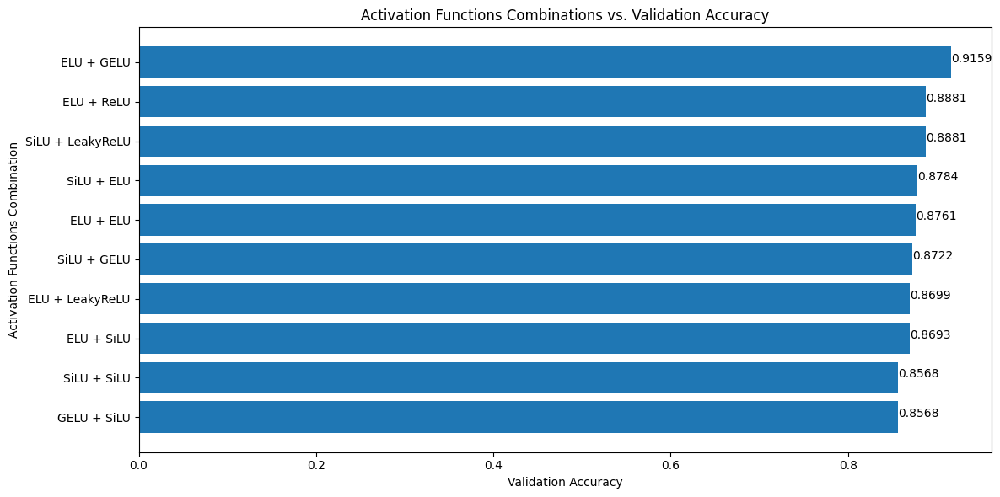

In [ ]:
# plot the results of activation functions experiment
plot_activation_function_results(activation_df)

In [ ]:
# print best performing activation functions combo
RR_best_activation_functions_names = activation_df.iloc[0]['Activation Function 1'], activation_df.iloc[0]['Activation Function 2']
print(f"Best activation functions: {RR_best_activation_functions_names}")

# convert string names to actual nn modules using getattr
RR_best_activation_functions = [getattr(nn, name)() for name in RR_best_activation_functions_names]

Best activation functions: ('ELU', 'GELU')


Let's gather all the best hyperparameters into a configuration dictionary and put it all together to train a new model (model_1).

In [ ]:
# best configuration in a dictionary
RR_best_config = {
    'model': 'CNN_v2',
    'loss_fn': nn.CrossEntropyLoss(),
    'best_decay_value': RR_best_decay_value,
    'best_dropout_probs_combo': RR_best_dropout_probs,
    'best_hidden_units_combo': RR_best_hidden_units,
    'best_optimizer': RR_best_optimizer,
    'best_learning_rate': RR_best_learning_rate,
    'best_activation_functions': RR_best_activation_functions,
    'best_batch_size': batch_size,
    'epochs': num_epochs
}

In [ ]:
# put it all together

# create a model
RR_model_1 = CNN_v2(out_features=num_classes, hidden_units=RR_best_hidden_units, dropout_probs=RR_best_dropout_probs, activation_functions=RR_best_activation_functions).to(device)

# set loss function and optimizer
loss_fn = nn.CrossEntropyLoss()
optimizer = RR_best_optimizer(params=RR_model_1.parameters(), lr=RR_best_learning_rate, weight_decay=RR_best_decay_value)

# start training
print("Starting training...")
start_time = time.time()
RR_model_1_results = train(model=RR_model_1,
                           train_dataloader=train_dataloader_R,
                           test_dataloader=val_dataloader_R,
                           optimizer=optimizer,
                           loss_fn=loss_fn,
                           epochs=num_epochs,
                           device=device)
end_time = time.time()

# calculate and print total training time
RR_model_1_training_time = end_time - start_time
print(f"\nTotal training time: {RR_model_1_training_time:.3f} seconds")

# calculate and print total trainabale params
RR_model_1_total_params = sum(p.numel() for p in RR_model_1.parameters() if p.requires_grad)
print(f"Total trainable params: {RR_model_1_total_params}")

Starting training...


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.2288 | train_acc: 0.2057 | val_loss: 1.7717 | val_acc: 0.3710
Epoch: 2 | train_loss: 1.8875 | train_acc: 0.3336 | val_loss: 1.1748 | val_acc: 0.6398
Epoch: 3 | train_loss: 1.5302 | train_acc: 0.4834 | val_loss: 0.8305 | val_acc: 0.7233
Epoch: 4 | train_loss: 1.4149 | train_acc: 0.4976 | val_loss: 0.8713 | val_acc: 0.6869
Epoch: 5 | train_loss: 1.2032 | train_acc: 0.5647 | val_loss: 0.6639 | val_acc: 0.7602
Epoch: 6 | train_loss: 1.1038 | train_acc: 0.6048 | val_loss: 0.5663 | val_acc: 0.7886
Epoch: 7 | train_loss: 0.9898 | train_acc: 0.6554 | val_loss: 0.5715 | val_acc: 0.8045
Epoch: 8 | train_loss: 0.9800 | train_acc: 0.6546 | val_loss: 0.4884 | val_acc: 0.8602
Epoch: 9 | train_loss: 1.0099 | train_acc: 0.6516 | val_loss: 0.4858 | val_acc: 0.8199
Epoch: 10 | train_loss: 0.9170 | train_acc: 0.6822 | val_loss: 0.4565 | val_acc: 0.8665
Epoch: 11 | train_loss: 0.8551 | train_acc: 0.7142 | val_loss: 0.4733 | val_acc: 0.8409
Epoch: 12 | train_loss: 0.8660 | train_ac

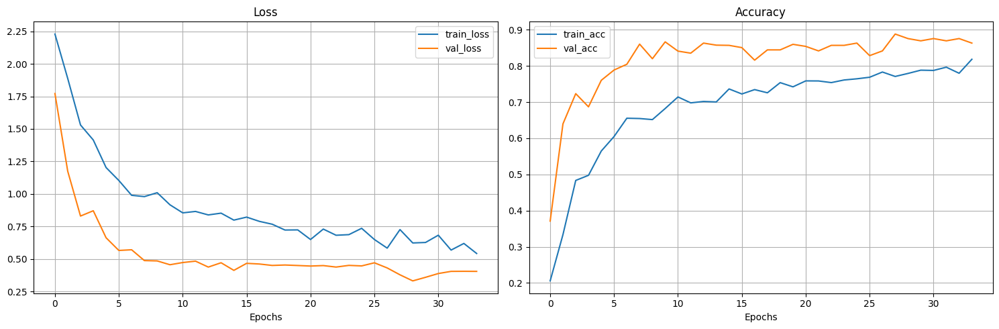

In [ ]:
# plot loss curves
plot_loss_curves(RR_model_1_results)

We observe an improvement in validation accuracy compared to the baseline model with no signs of overfitting anymore. Let's save the model and proceed to its evaluation by using evaluation metrics such as precision, recall, and the confusion matrix.

In [ ]:
# print final model's val accuracy
RR_model_1_acc = RR_model_1_results['val_acc'][-1]
print(f"Final model accuracy: {RR_model_1_acc}")

# save the RR final model 1 with best configuration found
torch.save(RR_model_1.state_dict(), os.path.join(project_models_path, 'RR_model_1.pth'))
print("Model saved to 'RR_model_1.pth'")

Final model accuracy: 0.8630681818181818
Model saved to 'RR_model_1.pth'


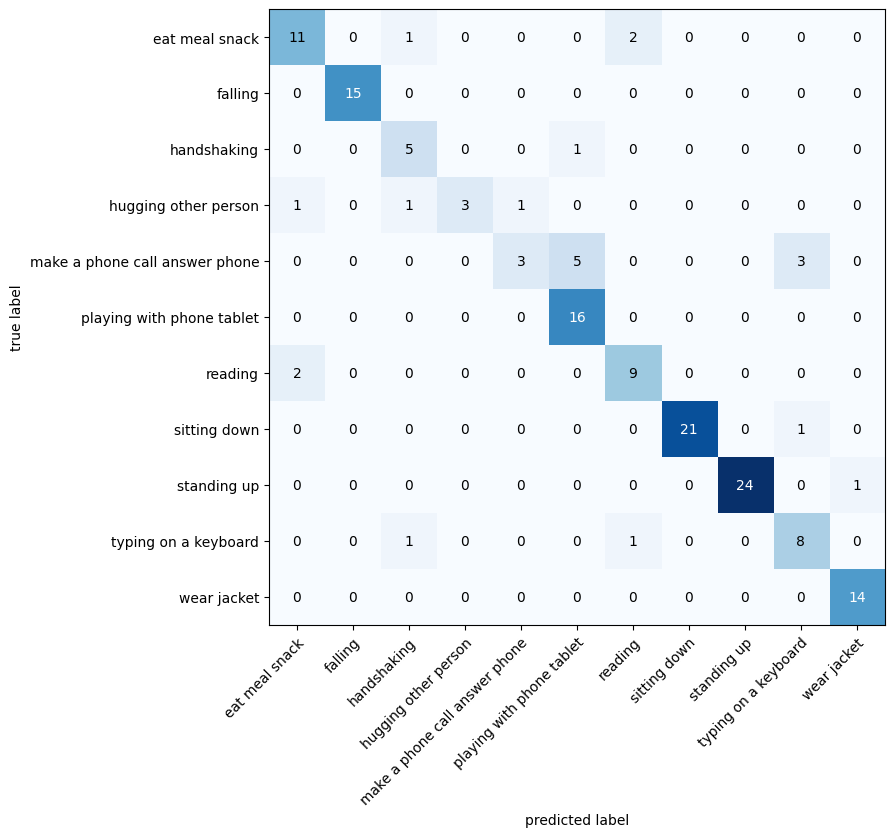

In [ ]:
# evaluation with torchmetrics

# retrieve actual and predicted labels and convert them to tensors for later process
RR_model_1_y_true = torch.tensor(RR_model_1_results['y_true'])
RR_model_1_y_pred = torch.tensor(RR_model_1_results['y_preds'])

# setup confusion matrix instance and compare predictions to targets
confmat = ConfusionMatrix(num_classes=len(class_names), task='multiclass')
confmat_tensor = confmat(RR_model_1_y_pred.clone().detach(), RR_model_1_y_true.clone().detach())

# plot the confusion matrix
fig, ax = plot_confusion_matrix(conf_mat=confmat_tensor.numpy(), class_names=class_names, figsize=(20,8));

In [ ]:
# calculate precision, recall and F1 scores using torchmetrics
precision = Precision(average='macro', num_classes=len(class_names), task='multiclass')
recall = Recall(average='macro', num_classes=len(class_names), task='multiclass')
f1 = F1Score(average='macro', num_classes=len(class_names), task='multiclass')

prec = precision(RR_model_1_y_pred, RR_model_1_y_true)
rec = recall(RR_model_1_y_pred, RR_model_1_y_true)
f1_score = f1(RR_model_1_y_pred, RR_model_1_y_true)

# print the results
print(f"Precision: {prec:.4f}\nRecall: {rec:.4f}\nF1-Score: {f1_score:.4f}")

Precision: 0.8398
Recall: 0.8113
F1-Score: 0.8037


In [ ]:
# classification report
print("Classification Report:")
print(classification_report(y_true=RR_model_1_y_true, y_pred=RR_model_1_y_pred, zero_division=1))

Classification Report:
              precision    recall  f1-score   support

           0       0.79      0.79      0.79        14
           1       1.00      1.00      1.00        15
           2       0.62      0.83      0.71         6
           3       1.00      0.50      0.67         6
           4       0.75      0.27      0.40        11
           5       0.73      1.00      0.84        16
           6       0.75      0.82      0.78        11
           7       1.00      0.95      0.98        22
           8       1.00      0.96      0.98        25
           9       0.67      0.80      0.73        10
          10       0.93      1.00      0.97        14

    accuracy                           0.86       150
   macro avg       0.84      0.81      0.80       150
weighted avg       0.87      0.86      0.85       150



Although misclassifications still occur mainly between similar classes (as seen in the M / M case), their increased frequency results in lower precision, recall, and F1 scores.

Experiment 6. Apply Cross-Validation.

To perform cross-validation, we start by combining the training and validation sets into a single dataset. Next, we use the previously trained model (RR_model_1) and apply the cross-validation process.


In [ ]:
# experiment 6: cross validation (1)

# combine train and validation sets

# define paths
source_dirs_R = ['/content/project/data/ResActionsImagesR/train', '/content/project/data/ResActionsImagesR/validation']
destination_dir_R = '/content/project/data/ResActionsImagesR/train_val_combined'

# create the destination directory if it doesn't exist
if not os.path.exists(destination_dir_R):
  os.makedirs(destination_dir_R)

# loop over all source dirs (train, validation) in ResActionsImagesR
for source_dir in source_dirs_R:
  # loop over all class dirs
  for class_dir in os.listdir(source_dir):

    # existing class path, we will use it for copying
    class_path = os.path.join(source_dir, class_dir)

    # create class dir in destination dir if doesn't exist (this goes in case of multiple runs)
    dest_class_path = os.path.join(destination_dir_R, class_dir)
    if not os.path.exists(dest_class_path):
      os.makedirs(dest_class_path)

    # copy all files (images) from the current class of the current source
    for file in os.listdir(class_path):
      shutil.copy(os.path.join(class_path, file), os.path.join(dest_class_path, file))

# check how many dirs in the new dir (expected num_classes=11)
print(f"Total number of folders of the new dir: {len(os.listdir(destination_dir_R))}")

# find and print how many images in total the new 'train_val_combined' dir has (expected the sum of initial train and validation dirs: 1201 + 150 = 1351)
train_val_total_images_R = 0
for class_dir in os.listdir(destination_dir_R):
  class_path = os.path.join(destination_dir_R, class_dir)
  train_val_total_images_R += len(os.listdir(class_path))
print(f"Total number of images of the new dir: {train_val_total_images_R}")

Total number of folders of the new dir: 11
Total number of images of the new dir: 1351


In [ ]:
# experiment 6: cross validation (2)

# create the new dataset using ImageFolder
RR_cross_val_dataset = ImageFolder(root=destination_dir_R, transform=data_transform_R)

# retrieve best pre-trained weights from model_1
RR_model_1_weights = RR_model_1.state_dict()

# run the experiment
RR_cv_results = cross_validation(dataset=RR_cross_val_dataset,
                                 num_epochs=num_epochs,
                                 device=device,
                                 num_classes=num_classes,
                                 num_folds=num_folds,
                                 best_config=RR_best_config,
                                 num_workers=num_workers,
                                 load_weights=True,
                                 best_weights=RR_model_1_weights)

Cross-Validation training ...
Dataset size: 1351
Number of folds: 6
Fold size: 225

Fold 1/6
Loading best weights ...


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.5922 | train_acc: 0.7866 | val_loss: 0.2166 | val_acc: 0.9141
Epoch: 2 | train_loss: 0.6746 | train_acc: 0.7714 | val_loss: 0.2263 | val_acc: 0.9375
Epoch: 3 | train_loss: 0.5969 | train_acc: 0.7977 | val_loss: 0.2217 | val_acc: 0.9219
Epoch: 4 | train_loss: 0.6000 | train_acc: 0.7965 | val_loss: 0.2266 | val_acc: 0.9219
Epoch: 5 | train_loss: 0.5608 | train_acc: 0.8030 | val_loss: 0.2160 | val_acc: 0.9375
Epoch: 6 | train_loss: 0.5556 | train_acc: 0.8200 | val_loss: 0.2136 | val_acc: 0.9336
Epoch: 7 | train_loss: 0.5981 | train_acc: 0.8148 | val_loss: 0.2246 | val_acc: 0.9336
Epoch: 8 | train_loss: 0.5606 | train_acc: 0.8064 | val_loss: 0.2244 | val_acc: 0.9102
Epoch: 9 | train_loss: 0.5528 | train_acc: 0.8283 | val_loss: 0.2302 | val_acc: 0.9258
Epoch: 10 | train_loss: 0.6226 | train_acc: 0.8061 | val_loss: 0.2499 | val_acc: 0.9219
Epoch: 11 | train_loss: 0.5696 | train_acc: 0.7974 | val_loss: 0.2421 | val_acc: 0.9258
Epoch: 12 | train_loss: 0.6010 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.6385 | train_acc: 0.7766 | val_loss: 0.2440 | val_acc: 0.9414
Epoch: 2 | train_loss: 0.6309 | train_acc: 0.7962 | val_loss: 0.2622 | val_acc: 0.9336
Epoch: 3 | train_loss: 0.5743 | train_acc: 0.8220 | val_loss: 0.2542 | val_acc: 0.8945
Epoch: 4 | train_loss: 0.5511 | train_acc: 0.8090 | val_loss: 0.2517 | val_acc: 0.9297
Epoch: 5 | train_loss: 0.6080 | train_acc: 0.8099 | val_loss: 0.2584 | val_acc: 0.9531
Epoch: 6 | train_loss: 0.5706 | train_acc: 0.7995 | val_loss: 0.2651 | val_acc: 0.9336
Epoch: 7 | train_loss: 0.5902 | train_acc: 0.8014 | val_loss: 0.3027 | val_acc: 0.8750
Epoch: 8 | train_loss: 0.5977 | train_acc: 0.7878 | val_loss: 0.3051 | val_acc: 0.9258
Epoch: 9 | train_loss: 0.5812 | train_acc: 0.8139 | val_loss: 0.3382 | val_acc: 0.8477
Epoch: 10 | train_loss: 0.6051 | train_acc: 0.8064 | val_loss: 0.3160 | val_acc: 0.8477
Epoch: 11 | train_loss: 0.5760 | train_acc: 0.8078 | val_loss: 0.3027 | val_acc: 0.9297
Epoch: 12 | train_loss: 0.5254 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.6820 | train_acc: 0.7950 | val_loss: 0.1762 | val_acc: 0.9531
Epoch: 2 | train_loss: 0.6612 | train_acc: 0.7917 | val_loss: 0.1899 | val_acc: 0.9219
Epoch: 3 | train_loss: 0.6320 | train_acc: 0.7931 | val_loss: 0.1841 | val_acc: 0.9297
Epoch: 4 | train_loss: 0.6110 | train_acc: 0.7809 | val_loss: 0.1980 | val_acc: 0.9219
Epoch: 5 | train_loss: 0.5060 | train_acc: 0.8132 | val_loss: 0.1826 | val_acc: 0.9375
Epoch: 6 | train_loss: 0.6463 | train_acc: 0.8026 | val_loss: 0.1646 | val_acc: 0.9531
Epoch: 7 | train_loss: 0.5591 | train_acc: 0.8030 | val_loss: 0.1916 | val_acc: 0.9297
Epoch: 8 | train_loss: 0.5770 | train_acc: 0.7910 | val_loss: 0.1794 | val_acc: 0.9258
Epoch: 9 | train_loss: 0.6202 | train_acc: 0.7960 | val_loss: 0.1749 | val_acc: 0.9453
Epoch: 10 | train_loss: 0.6139 | train_acc: 0.7991 | val_loss: 0.1959 | val_acc: 0.9336
Epoch: 11 | train_loss: 0.6046 | train_acc: 0.8108 | val_loss: 0.1966 | val_acc: 0.9336
Epoch: 12 | train_loss: 0.5429 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.6111 | train_acc: 0.7865 | val_loss: 0.5587 | val_acc: 0.8477
Epoch: 2 | train_loss: 0.6830 | train_acc: 0.7861 | val_loss: 0.5210 | val_acc: 0.8828
Epoch: 3 | train_loss: 0.6536 | train_acc: 0.7780 | val_loss: 0.5154 | val_acc: 0.8594
Epoch: 4 | train_loss: 0.6046 | train_acc: 0.8003 | val_loss: 0.5366 | val_acc: 0.8633
Epoch: 5 | train_loss: 0.5690 | train_acc: 0.8134 | val_loss: 0.5721 | val_acc: 0.8672
Epoch: 6 | train_loss: 0.5638 | train_acc: 0.8035 | val_loss: 0.6614 | val_acc: 0.8398
Epoch: 7 | train_loss: 0.5892 | train_acc: 0.7988 | val_loss: 0.5134 | val_acc: 0.8633
Epoch: 8 | train_loss: 0.5247 | train_acc: 0.8273 | val_loss: 0.5662 | val_acc: 0.8164
Epoch: 9 | train_loss: 0.5914 | train_acc: 0.8035 | val_loss: 0.5207 | val_acc: 0.8594
Epoch: 10 | train_loss: 0.5804 | train_acc: 0.7936 | val_loss: 0.4514 | val_acc: 0.8633
Epoch: 11 | train_loss: 0.5141 | train_acc: 0.8408 | val_loss: 0.5850 | val_acc: 0.8633
Epoch: 12 | train_loss: 0.5750 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.7109 | train_acc: 0.7792 | val_loss: 0.2484 | val_acc: 0.9258
Epoch: 2 | train_loss: 0.5617 | train_acc: 0.7951 | val_loss: 0.2352 | val_acc: 0.9297
Epoch: 3 | train_loss: 0.6482 | train_acc: 0.8056 | val_loss: 0.2539 | val_acc: 0.9102
Epoch: 4 | train_loss: 0.5773 | train_acc: 0.7922 | val_loss: 0.2658 | val_acc: 0.9180
Epoch: 5 | train_loss: 0.6430 | train_acc: 0.7901 | val_loss: 0.2746 | val_acc: 0.9180
Epoch: 6 | train_loss: 0.5640 | train_acc: 0.8043 | val_loss: 0.2898 | val_acc: 0.9023
Epoch: 7 | train_loss: 0.5784 | train_acc: 0.8078 | val_loss: 0.2747 | val_acc: 0.9141
Epoch: 8 | train_loss: 0.5618 | train_acc: 0.8003 | val_loss: 0.2622 | val_acc: 0.9141
Epoch: 9 | train_loss: 0.5171 | train_acc: 0.8273 | val_loss: 0.2439 | val_acc: 0.9258
Epoch: 10 | train_loss: 0.4986 | train_acc: 0.8299 | val_loss: 0.2642 | val_acc: 0.9102
Epoch: 11 | train_loss: 0.5408 | train_acc: 0.8170 | val_loss: 0.2710 | val_acc: 0.9336
Epoch: 12 | train_loss: 0.5360 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.6631 | train_acc: 0.7731 | val_loss: 0.1959 | val_acc: 0.9375
Epoch: 2 | train_loss: 0.6045 | train_acc: 0.7809 | val_loss: 0.1985 | val_acc: 0.9258
Epoch: 3 | train_loss: 0.6486 | train_acc: 0.7800 | val_loss: 0.2424 | val_acc: 0.9023
Epoch: 4 | train_loss: 0.6471 | train_acc: 0.7835 | val_loss: 0.2307 | val_acc: 0.9141
Epoch: 5 | train_loss: 0.6048 | train_acc: 0.7852 | val_loss: 0.2178 | val_acc: 0.9258
Epoch: 6 | train_loss: 0.6542 | train_acc: 0.7839 | val_loss: 0.1972 | val_acc: 0.9414
Epoch: 7 | train_loss: 0.5616 | train_acc: 0.8047 | val_loss: 0.1966 | val_acc: 0.9453
Epoch: 8 | train_loss: 0.6005 | train_acc: 0.7962 | val_loss: 0.2194 | val_acc: 0.9141
Epoch: 9 | train_loss: 0.5604 | train_acc: 0.8078 | val_loss: 0.1955 | val_acc: 0.9375
Epoch: 10 | train_loss: 0.5581 | train_acc: 0.8062 | val_loss: 0.2127 | val_acc: 0.9141
Epoch: 11 | train_loss: 0.5975 | train_acc: 0.8095 | val_loss: 0.2006 | val_acc: 0.9297
Epoch: 12 | train_loss: 0.6384 | train_ac

In [ ]:
# retrieve all val accuracies in desc order from results dictionary along with their corresponding model's weights
RR_results_df = get_sorted_cv_results(RR_cv_results)

   Fold  Validation Accuracy  \
2     3             0.953125   
5     6             0.945312   
4     5             0.917969   
1     2             0.914062   
0     1             0.910156   
3     4             0.875000   

                                       Model Weights  
2  {'block1.0.weight': [[tensor([[ 0.1007,  0.096...  
5  {'block1.0.weight': [[tensor([[ 0.0531,  0.091...  
4  {'block1.0.weight': [[tensor([[ 0.0939,  0.095...  
1  {'block1.0.weight': [[tensor([[ 0.0705,  0.058...  
0  {'block1.0.weight': [[tensor([[ 0.0399,  0.025...  
3  {'block1.0.weight': [[tensor([[ 0.0996,  0.078...  


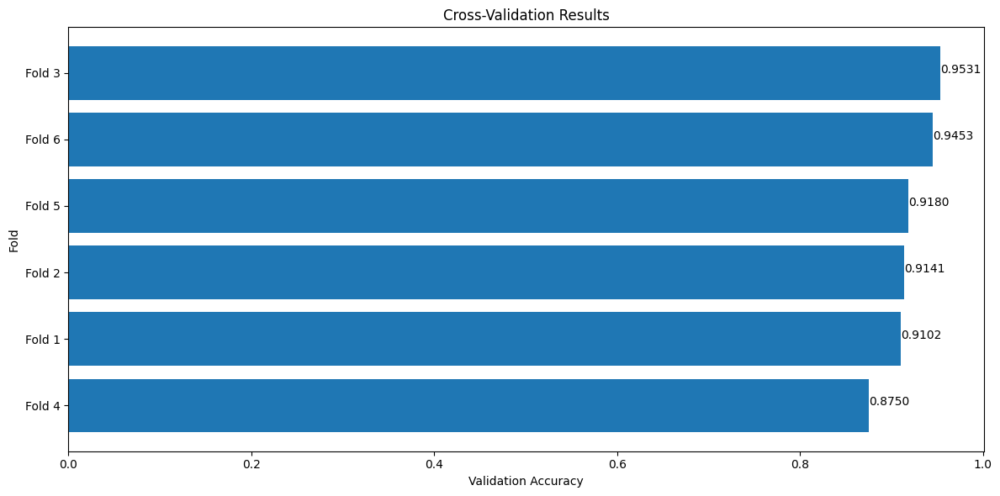

In [ ]:
# plot each fold results after cross-validation experiment
plot_cv_results(RR_results_df)

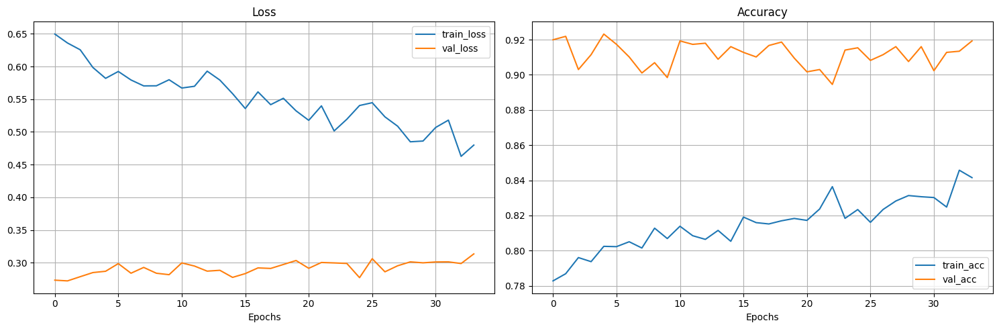

In [ ]:
# comptute and plot average cv results
RR_cv_avg_results = compute_avg_cv_results(RR_cv_results)

# plot the averaged learning curves
plot_loss_curves(RR_cv_avg_results)

Cross-validation confirms that RR_model_1 is free from overfitting. We will now save the best fold's weights for a possible future use and move on to the next experiment.


In [ ]:
# retrieve best performing fold's weights
best_RR_cv_model_weights = RR_results_df.iloc[0]['Model Weights']

# retrieve best performing fold number
RR_best_fold = RR_results_df.iloc[0]['Fold']

# retrieve the corresponding results from cross validation experiment for the best case
RR_best_fold_index = max(RR_best_fold - 1, 0) # adjust -1 for sero indexing and ensure index is not negative (-1 if best weights are in the first position)
RR_model_2_results = RR_cv_results[RR_best_fold_index]

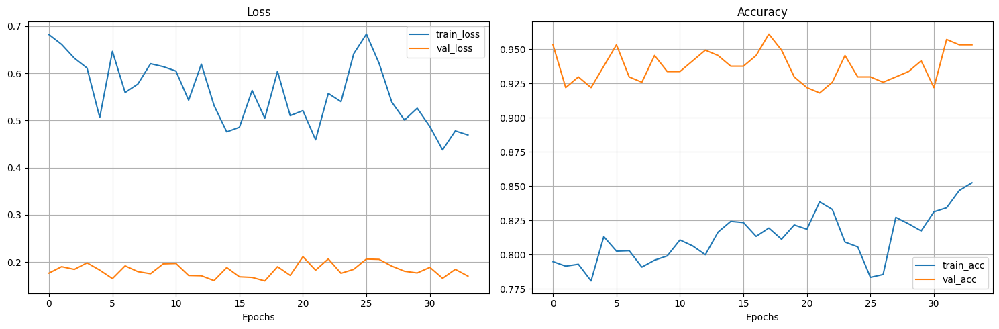

In [ ]:
# plot the curves of the model with best config
plot_loss_curves(RR_model_2_results)

In [ ]:
# before loading best weights, need to create a new instance
RR_model_2 = CNN_v2(out_features=num_classes, hidden_units=RR_best_hidden_units, dropout_probs=RR_best_dropout_probs, activation_functions=RR_best_activation_functions).to(device)

# now, load best weights
RR_model_2.load_state_dict(best_RR_cv_model_weights)

# print final model's val accuracy
RR_model_2_acc = RR_model_2_results['val_acc'][-1]
print(f"Final model accuracy: {RR_model_2_acc}")

# save the model
torch.save(RR_model_2.state_dict(), os.path.join(project_models_path, 'RR_model_2.pth'))
print("Model saved to 'RR_model_2.pth'")

Final model accuracy: 0.953125
Model saved to 'RR_model_2.pth'


Experiment 7. Balance the dataset.

In [ ]:
# create a new instance of the model for balanced dataset
RR_model_3 = CNN_v2(out_features=num_classes, hidden_units=RR_best_hidden_units, dropout_probs=RR_best_dropout_probs, activation_functions=RR_best_activation_functions).to(device)

# load model_1 weights
RR_model_3.load_state_dict(RR_model_1.state_dict()) # (model_1)

# load best performing model (weights) so far
#RR_model_3.load_state_dict(best_RR_cv_model_weights) # (model_2)

# start training on balanced dataset
RR_model_3_results = experiment_balanced_dataset(model=RR_model_3,
                                                 train_dataloader=train_dataloader_R,
                                                 val_dataloader=val_dataloader_R,
                                                 num_epochs=num_epochs,
                                                 device=device,
                                                 best_config=RR_best_config,
                                                 class_weights=class_weights_R)

Experimenting with Balanced Dataset


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.6431 | train_acc: 0.7989 | val_loss: 0.4926 | val_acc: 0.8420
Epoch: 2 | train_loss: 0.6640 | train_acc: 0.7971 | val_loss: 0.3904 | val_acc: 0.8852
Epoch: 3 | train_loss: 0.6122 | train_acc: 0.8089 | val_loss: 0.4028 | val_acc: 0.8693
Epoch: 4 | train_loss: 0.6288 | train_acc: 0.7889 | val_loss: 0.4307 | val_acc: 0.8727
Epoch: 5 | train_loss: 0.6466 | train_acc: 0.7846 | val_loss: 0.4450 | val_acc: 0.8568
Epoch: 6 | train_loss: 0.6246 | train_acc: 0.7920 | val_loss: 0.3737 | val_acc: 0.8756
Epoch: 7 | train_loss: 0.6032 | train_acc: 0.8102 | val_loss: 0.4036 | val_acc: 0.8534
Early stopping triggered at epoch 7.
Model restored from epoch 2.

Total training time: 6.887 seconds
Total trainable params: 161195


In [ ]:
# print best epoch and its corresponding val accuracy
RR_best_epoch_bal, RR_best_val_acc_bal = print_best_epoch_and_val_acc(RR_model_3_results)

Best epoch: 2
Best validation accuracy: 0.8852


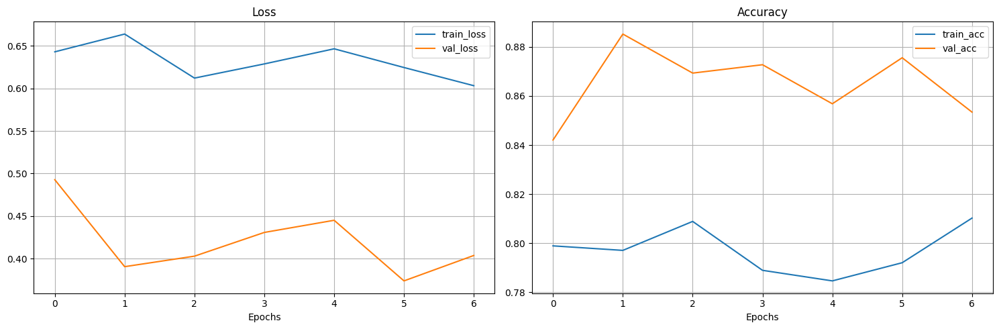

In [ ]:
# plot the results curves after balancing the dataset
plot_loss_curves(RR_model_3_results)

We observe that balancing the dataset leads to a better performance. Now, let's save the model and implement data augmentation experiment.



In [ ]:
# print final model's val accuracy
RR_model_3_acc = RR_best_val_acc_bal
print(f"Final model accuracy: {RR_model_3_acc}")

# save the model
torch.save(RR_model_3.state_dict(), os.path.join(project_models_path, 'RR_model_3.pth'))
print("Model saved to 'RR_model_3.pth'")

Final model accuracy: 0.8852272727272726
Model saved to 'RR_model_3.pth'


Experiment 8. Apply data augmentation.


We will apply data augmentation using the TrivialAugment configuration, with model_3 serving as our starting point.

In [ ]:
# experiment 8: data augmentation (with early stopping enabled)

# create a new instance of the model for data augmentation
RR_model_4 = CNN_v2(out_features=num_classes, hidden_units=RR_best_hidden_units, dropout_probs=RR_best_dropout_probs, activation_functions=RR_best_activation_functions).to(device)

# load weights of the model_1
#RR_model_4.load_state_dict(RR_model_1.state_dict()) # (model_1)

# load weights of the model produced after cross-validation
#RR_model_4.load_state_dict(best_RR_cv_model_weights) # (model_2)

# load best performing model (weights) so far
RR_model_4.load_state_dict(RR_model_3.state_dict()) # (model_3)

# start training with data augmentation
RR_model_4_results = experiment_data_augmentation(model=RR_model_4,
                                                  train_dir=R_dataset_path/'train',
                                                  val_dataloader=val_dataloader_R,
                                                  num_epochs=num_epochs,
                                                  device=device,
                                                  best_config=RR_best_config,
                                                  class_weights=class_weights_R,
                                                  num_workers=num_workers,
                                                  mean=mean_R,
                                                  std=std_R,
                                                  is_Trivial=True)

Experimenting with Data Augmentation


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 4.1887 | train_acc: 0.3746 | val_loss: 0.6440 | val_acc: 0.8017
Epoch: 2 | train_loss: 1.9916 | train_acc: 0.3661 | val_loss: 0.5798 | val_acc: 0.8108
Epoch: 3 | train_loss: 1.7503 | train_acc: 0.4219 | val_loss: 0.5676 | val_acc: 0.8108
Epoch: 4 | train_loss: 1.7263 | train_acc: 0.3966 | val_loss: 0.5559 | val_acc: 0.8045
Epoch: 5 | train_loss: 1.7298 | train_acc: 0.4076 | val_loss: 0.4983 | val_acc: 0.8290
Epoch: 6 | train_loss: 1.7211 | train_acc: 0.4074 | val_loss: 0.5140 | val_acc: 0.7983
Epoch: 7 | train_loss: 1.7429 | train_acc: 0.4044 | val_loss: 0.5123 | val_acc: 0.8165
Epoch: 8 | train_loss: 1.6588 | train_acc: 0.4138 | val_loss: 0.4732 | val_acc: 0.8352
Epoch: 9 | train_loss: 1.7006 | train_acc: 0.4082 | val_loss: 0.4680 | val_acc: 0.8352
Epoch: 10 | train_loss: 1.7082 | train_acc: 0.4080 | val_loss: 0.4665 | val_acc: 0.8415
Epoch: 11 | train_loss: 1.7922 | train_acc: 0.3924 | val_loss: 0.4882 | val_acc: 0.8165
Epoch: 12 | train_loss: 1.6650 | train_ac

In [ ]:
# print best epoch and its corresponding val accuracy
RR_best_epoch_aug, RR_best_val_acc_aug = print_best_epoch_and_val_acc(RR_model_4_results)

Best epoch: 19
Best validation accuracy: 0.8659


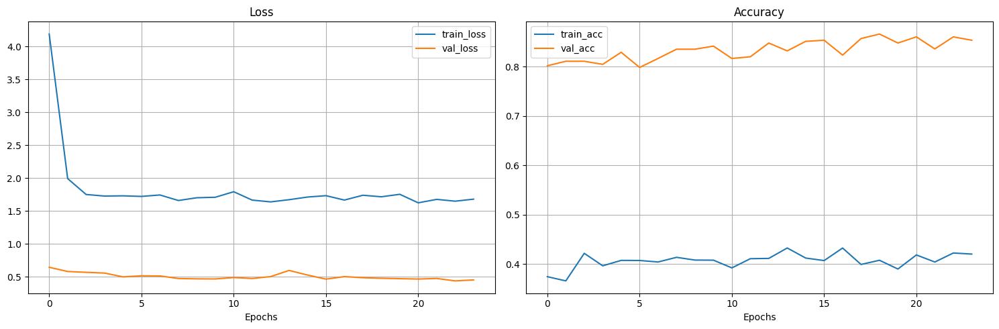

In [ ]:
# plot the results curves after data augmentation
plot_loss_curves(RR_model_4_results)

We get similar results like in the previous experiment. Let's save the model and move on to the evaluation on the test set with best performing model for R / R dataset.


In [ ]:
# print final model's val accuracy
RR_model_4_acc = RR_best_val_acc_aug
print(f"Final model accuracy: {RR_model_4_acc}")

# save the model
torch.save(RR_model_4.state_dict(), os.path.join(project_models_path, 'RR_model_4.pth'))
print("Model saved to 'RR_model_4.pth'")

Final model accuracy: 0.865909090909091
Model saved to 'RR_model_4.pth'


We compare the models and select the best-performing one as the final result (excluding model_2 that comes from cross-validaation).


Model RR_model_1: 0.86306818
Model RR_model_2: 0.95312500
Model RR_model_3: 0.88522727
Model RR_model_4: 0.86590909


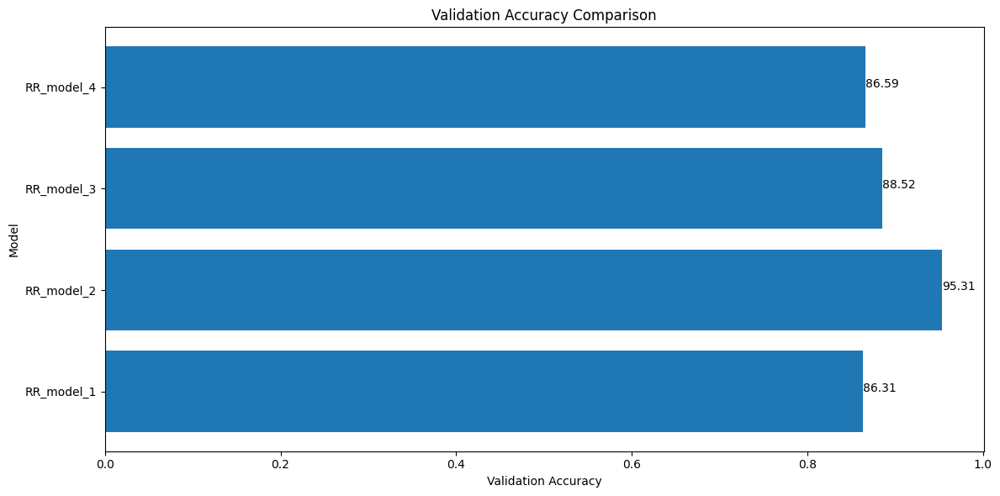

In [ ]:
# create a dataframe for comparison
compare_accs_RR = pd.DataFrame({'Model': ['RR_model_1', 'RR_model_2', 'RR_model_3', 'RR_model_4'], 'Validation Accuracy': [RR_model_1_acc, RR_model_2_acc, RR_model_3_acc, RR_model_4_acc]})

# print and plot test accuracies for all models of R / R dataset
print_and_plot_models_accuracies(compare_accs_RR)

In [ ]:
# drop model_2 from the dictionary
compare_accs_RR = compare_accs_RR.drop(1)

In [ ]:
# save the best performing model for R / R
best_models_dict = store_best_model(compare_accs_RR, 'R / R', best_models_dict)

# print the dictionary
print("Best models dictionary:")
print(best_models_dict)
print()

# retrieve best performing model for R / R
RR_best_model = f"{best_models_dict['R / R']['Model']}.pth"
#print(RR_best_model)

# initiate a model instance
RR_final_model = CNN_v2(out_features=num_classes, hidden_units=RR_best_hidden_units, dropout_probs=RR_best_dropout_probs, activation_functions=RR_best_activation_functions).to(device)

# load best weights
RR_final_model.load_state_dict(torch.load(os.path.join(project_models_path, RR_best_model)))

# put it on device
RR_final_model = RR_final_model.to(device)

# and evaluate on test set
RR_test_results = eval_model(model=RR_final_model,
                             dataloader=test_dataloader_R,
                             loss_fn=RR_best_config['loss_fn'], # nn.CrossEntropyLoss(weight=class_weights_R)
                             device=device)
print(f"Test accuracy for {RR_best_model}: {RR_test_results['test_acc']:.4f}")

# save the test results to the dictionary
final_test_accuracies_dict['R / R'] = RR_test_results['test_acc']

Best models dictionary:
{'M / M': {'Model': 'MM_model_4', 'Validation Accuracy': 0.9039772727272727}, 'R / R': {'Model': 'RR_model_3', 'Validation Accuracy': 0.8852272727272726}}



  0%|          | 0/5 [00:00<?, ?it/s]

Test accuracy for RR_model_3.pth: 0.8427


### Experiments on L / L.

We start by creating dataloaders for L / L dataset.

In [ ]:
# create dataloaders
train_dataloader_L, val_dataloader_L, test_dataloader_L, class_names = create_dataloaders(L_dataset_path/'train', L_dataset_path/'validation', L_dataset_path/'test', data_transform_L, batch_size, num_workers)
print("Dataloaders created successfully!")

Dataloaders created successfully!


We train and evaluate the L / L baseline model.

In [ ]:
# train the LL baseline model

# create the model
LL_model_0 = CNN(in_features=num_channels, out_features=num_classes, hidden_units=init_hidden_units).to(device)

# setup loss function and optimizer
loss_fn = nn.CrossEntropyLoss()
optimizer = torch.optim.RMSprop(params=LL_model_0.parameters(), lr=0.001)

# start training
print("Starting training...")
start_time = time.time()
LL_model_0_results = train(model=LL_model_0,
                           train_dataloader=train_dataloader_L,
                           test_dataloader=val_dataloader_L,
                           optimizer=optimizer,
                           loss_fn=loss_fn,
                           epochs=num_epochs,
                           device=device)
end_time = time.time()

# calculate and print total training time
LL_total_training_time = end_time - start_time
print(f"\nTotal training time: {LL_total_training_time:.3f} seconds")

# calculate and print total trainabla params
LL_total_params = sum(p.numel() for p in LL_model_0.parameters())
print(f"Total number of trainable parameters: {LL_total_params}")

Starting training...


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.9860 | train_acc: 0.2974 | val_loss: 1.4441 | val_acc: 0.5017
Epoch: 2 | train_loss: 1.1015 | train_acc: 0.6130 | val_loss: 0.8624 | val_acc: 0.7017
Epoch: 3 | train_loss: 0.7038 | train_acc: 0.7529 | val_loss: 0.6769 | val_acc: 0.7977
Epoch: 4 | train_loss: 0.5276 | train_acc: 0.8179 | val_loss: 0.6706 | val_acc: 0.8045
Epoch: 5 | train_loss: 0.4146 | train_acc: 0.8554 | val_loss: 0.5773 | val_acc: 0.8068
Epoch: 6 | train_loss: 0.3298 | train_acc: 0.8884 | val_loss: 0.6961 | val_acc: 0.8102
Epoch: 7 | train_loss: 0.3085 | train_acc: 0.8998 | val_loss: 0.5380 | val_acc: 0.8506
Epoch: 8 | train_loss: 0.2125 | train_acc: 0.9270 | val_loss: 0.5689 | val_acc: 0.8386
Epoch: 9 | train_loss: 0.2539 | train_acc: 0.9228 | val_loss: 0.5418 | val_acc: 0.8597
Epoch: 10 | train_loss: 0.1355 | train_acc: 0.9581 | val_loss: 0.6205 | val_acc: 0.8540
Epoch: 11 | train_loss: 0.1021 | train_acc: 0.9656 | val_loss: 0.8563 | val_acc: 0.7670
Epoch: 12 | train_loss: 0.0852 | train_ac

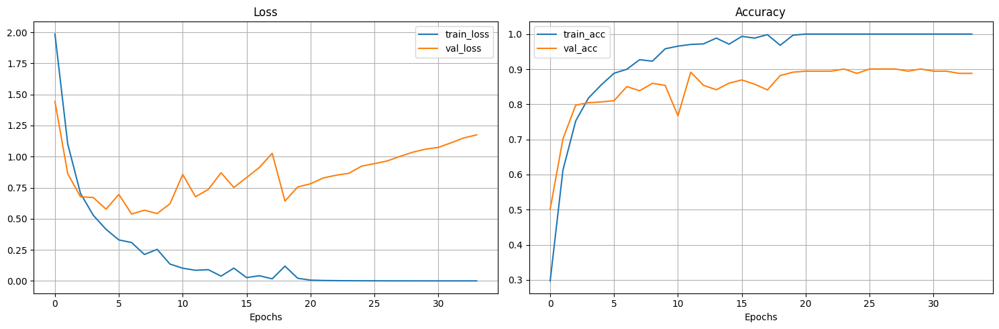

In [ ]:
# plot learning curves
plot_loss_curves(LL_model_0_results)

In [ ]:
# compute generalization gap
dif=compute_generalization_gap(LL_model_0_results)

Generalization gap (train acc - val acc): 0.1119


Both numbers and graphs show us that the baseline model for the L / L dataset suffers from overfitting, as expected like the the two previous cases (same images but from different view/camera).

In [ ]:
# save the model
torch.save(LL_model_0.state_dict(), os.path.join(project_models_path, 'LL_model_0.pth'))
print("Model saved to 'LL_model_0.pth'")

Model saved to 'LL_model_0.pth'


Experiment 1. Apply L2 regularization.

In [ ]:
# experiment 1: L2 reg
LL_model_L2_results = experiment_l2_regularization(train_dataloader=train_dataloader_L,
                                                   val_dataloader=val_dataloader_L,
                                                   num_epochs=num_epochs,
                                                   device=device,
                                                   weight_decay_values_list=weight_decay_values_list,
                                                   num_channels=num_channels,
                                                   num_classes=num_classes,
                                                   init_hidden_units=init_hidden_units)

Experimenting with L2 Regularization
Weight decay values to try: [0.01, 0.001, 0.0001, 1e-05, 1e-06]

Testing with weight decay: 0.01


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.0802 | train_acc: 0.2585 | val_loss: 1.6174 | val_acc: 0.4210
Epoch: 2 | train_loss: 1.5642 | train_acc: 0.4476 | val_loss: 1.5415 | val_acc: 0.5051
Epoch: 3 | train_loss: 1.2903 | train_acc: 0.5622 | val_loss: 1.2056 | val_acc: 0.6136
Epoch: 4 | train_loss: 1.0077 | train_acc: 0.6532 | val_loss: 1.0868 | val_acc: 0.6449
Epoch: 5 | train_loss: 0.8852 | train_acc: 0.6889 | val_loss: 1.1138 | val_acc: 0.5835
Epoch: 6 | train_loss: 0.7446 | train_acc: 0.7298 | val_loss: 0.8954 | val_acc: 0.7330
Epoch: 7 | train_loss: 0.6371 | train_acc: 0.7684 | val_loss: 0.8293 | val_acc: 0.7540
Epoch: 8 | train_loss: 0.5333 | train_acc: 0.8161 | val_loss: 0.8234 | val_acc: 0.7824
Epoch: 9 | train_loss: 0.5114 | train_acc: 0.8255 | val_loss: 0.7543 | val_acc: 0.7636
Epoch: 10 | train_loss: 0.4302 | train_acc: 0.8462 | val_loss: 0.7265 | val_acc: 0.8142
Epoch: 11 | train_loss: 0.4310 | train_acc: 0.8400 | val_loss: 0.7124 | val_acc: 0.7733
Epoch: 12 | train_loss: 0.3602 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.1137 | train_acc: 0.3330 | val_loss: 1.4112 | val_acc: 0.5330
Epoch: 2 | train_loss: 1.2552 | train_acc: 0.5753 | val_loss: 1.2070 | val_acc: 0.6011
Epoch: 3 | train_loss: 0.9099 | train_acc: 0.6797 | val_loss: 0.8941 | val_acc: 0.7295
Epoch: 4 | train_loss: 0.6757 | train_acc: 0.7635 | val_loss: 0.9230 | val_acc: 0.7261
Epoch: 5 | train_loss: 0.5415 | train_acc: 0.8103 | val_loss: 0.8169 | val_acc: 0.7858
Epoch: 6 | train_loss: 0.3995 | train_acc: 0.8696 | val_loss: 0.9228 | val_acc: 0.7295
Epoch: 7 | train_loss: 0.3744 | train_acc: 0.8713 | val_loss: 0.9317 | val_acc: 0.7449
Epoch: 8 | train_loss: 0.3146 | train_acc: 0.8934 | val_loss: 0.9369 | val_acc: 0.7392
Epoch: 9 | train_loss: 0.2642 | train_acc: 0.9169 | val_loss: 0.7030 | val_acc: 0.8227
Epoch: 10 | train_loss: 0.1822 | train_acc: 0.9401 | val_loss: 0.9394 | val_acc: 0.7477
Epoch: 11 | train_loss: 0.2023 | train_acc: 0.9269 | val_loss: 0.8755 | val_acc: 0.7881
Epoch: 12 | train_loss: 0.1869 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.2799 | train_acc: 0.2488 | val_loss: 1.6230 | val_acc: 0.4426
Epoch: 2 | train_loss: 1.4164 | train_acc: 0.5179 | val_loss: 1.4564 | val_acc: 0.4852
Epoch: 3 | train_loss: 1.0050 | train_acc: 0.6590 | val_loss: 1.1110 | val_acc: 0.6267
Epoch: 4 | train_loss: 0.8191 | train_acc: 0.7036 | val_loss: 0.7861 | val_acc: 0.7392
Epoch: 5 | train_loss: 0.6666 | train_acc: 0.7654 | val_loss: 0.8771 | val_acc: 0.7477
Epoch: 6 | train_loss: 0.5757 | train_acc: 0.7898 | val_loss: 0.6931 | val_acc: 0.7852
Epoch: 7 | train_loss: 0.4918 | train_acc: 0.8275 | val_loss: 1.0241 | val_acc: 0.6813
Epoch: 8 | train_loss: 0.4328 | train_acc: 0.8465 | val_loss: 0.6059 | val_acc: 0.8256
Epoch: 9 | train_loss: 0.3384 | train_acc: 0.8753 | val_loss: 0.6412 | val_acc: 0.8261
Epoch: 10 | train_loss: 0.2849 | train_acc: 0.8990 | val_loss: 0.6732 | val_acc: 0.8347
Epoch: 11 | train_loss: 0.2308 | train_acc: 0.9243 | val_loss: 0.5810 | val_acc: 0.8443
Epoch: 12 | train_loss: 0.1993 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.9616 | train_acc: 0.3296 | val_loss: 1.9770 | val_acc: 0.3364
Epoch: 2 | train_loss: 1.0257 | train_acc: 0.6285 | val_loss: 0.8214 | val_acc: 0.7216
Epoch: 3 | train_loss: 0.7100 | train_acc: 0.7586 | val_loss: 0.8009 | val_acc: 0.7295
Epoch: 4 | train_loss: 0.5447 | train_acc: 0.8080 | val_loss: 0.9170 | val_acc: 0.7545
Epoch: 5 | train_loss: 0.5104 | train_acc: 0.8316 | val_loss: 0.6790 | val_acc: 0.8261
Epoch: 6 | train_loss: 0.3986 | train_acc: 0.8630 | val_loss: 0.8935 | val_acc: 0.7642
Epoch: 7 | train_loss: 0.3684 | train_acc: 0.8705 | val_loss: 0.6244 | val_acc: 0.8199
Epoch: 8 | train_loss: 0.3262 | train_acc: 0.8752 | val_loss: 0.7762 | val_acc: 0.7886
Epoch: 9 | train_loss: 0.2742 | train_acc: 0.9079 | val_loss: 0.5931 | val_acc: 0.8540
Epoch: 10 | train_loss: 0.2535 | train_acc: 0.9170 | val_loss: 0.6345 | val_acc: 0.8540
Epoch: 11 | train_loss: 0.1723 | train_acc: 0.9475 | val_loss: 0.6954 | val_acc: 0.8295
Epoch: 12 | train_loss: 0.1675 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.0025 | train_acc: 0.3306 | val_loss: 1.3734 | val_acc: 0.5466
Epoch: 2 | train_loss: 1.0895 | train_acc: 0.6241 | val_loss: 1.1041 | val_acc: 0.6636
Epoch: 3 | train_loss: 0.6805 | train_acc: 0.7576 | val_loss: 0.8405 | val_acc: 0.7233
Epoch: 4 | train_loss: 0.5402 | train_acc: 0.8128 | val_loss: 0.6907 | val_acc: 0.8074
Epoch: 5 | train_loss: 0.4267 | train_acc: 0.8504 | val_loss: 0.5338 | val_acc: 0.8415
Epoch: 6 | train_loss: 0.3600 | train_acc: 0.8727 | val_loss: 0.6895 | val_acc: 0.7949
Epoch: 7 | train_loss: 0.2891 | train_acc: 0.9064 | val_loss: 0.6542 | val_acc: 0.8597
Epoch: 8 | train_loss: 0.2610 | train_acc: 0.9106 | val_loss: 0.5444 | val_acc: 0.8511
Epoch: 9 | train_loss: 0.1894 | train_acc: 0.9408 | val_loss: 0.4847 | val_acc: 0.8602
Epoch: 10 | train_loss: 0.1426 | train_acc: 0.9523 | val_loss: 0.5250 | val_acc: 0.8756
Epoch: 11 | train_loss: 0.1251 | train_acc: 0.9613 | val_loss: 0.5486 | val_acc: 0.8818
Epoch: 12 | train_loss: 0.1112 | train_ac

In [ ]:
# identify and print the best decay value based on the generalization gap
LL_best_decay_value, LL_min_diff_l2 = compute_multi_generalization_gaps(LL_model_L2_results)

Difference between train and val acc for 0.01: 0.0905
Difference between train and val acc for 0.001: 0.1557
Difference between train and val acc for 0.0001: 0.1244
Difference between train and val acc for 1e-05: 0.1335
Difference between train and val acc for 1e-06: 0.1642

The best (smallest) generalization gap is for 0.01 and is 0.0905


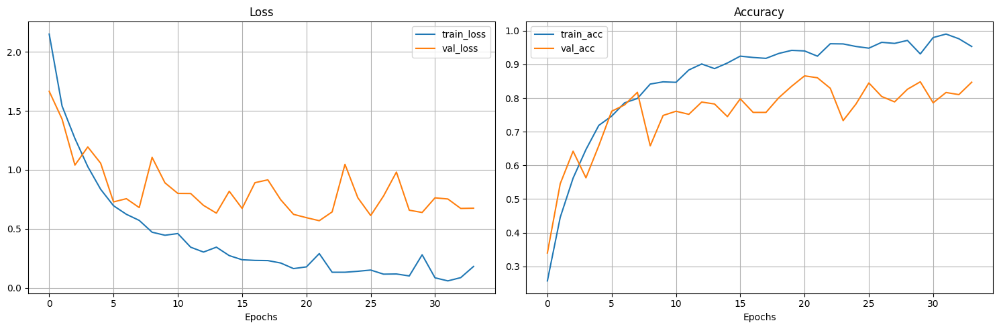

In [ ]:
# plot loss curves
plot_loss_curves(LL_model_L2_results[LL_best_decay_value])

L2 regularization provides a slight improvement, but to achieve a more substantial effect, let's apply dropout, aiming for the validation lines to diverge as desired.

Experiment 2. Apply dropout regularization layers.

In [ ]:
# experiment 2: dropout layers
LL_model_dropout_results = experiment_dropout_regularization(train_dataloader=train_dataloader_L,
                                                             val_dataloader=val_dataloader_L,
                                                             num_epochs=num_epochs,
                                                             device=device,
                                                             num_classes=num_classes,
                                                             best_decay_value=LL_best_decay_value,
                                                             dropout_probs_combos_list=dropout_probs_combos_list)

Experimenting with Dropout Regularization Layers
Dropout probabilities to try: [0.1, 0.3, 0.5, 0.6, 0.7, 0.9]
Total number of combinations to ideally try: 1296

Some possible 'good' combinations to try: [[0.5, 0.5, 0.5, 0.5], [0.5, 0.5, 0.4, 0.5], [0.5, 0.4, 0.5, 0.5], [0.5, 0.4, 0.4, 0.5], [0.5, 0.5, 0.5, 0.4], [0.4, 0.5, 0.5, 0.5], [0.4, 0.5, 0.5, 0.4], [0.5, 0.5, 0.5, 0.7], [0.8, 0.5, 0.5, 0.5], [0.8, 0.7, 0.7, 0.6], [0.8, 0.8, 0.7, 0.5], [0.8, 0.5, 0.7, 0.5], [0.6, 0.5, 0.5, 0.5], [0.5, 0.6, 0.6, 0.5], [0.7, 0.6, 0.5, 0.5]]

Testing with conv_dropout_prob: [0.5, 0.5, 0.5] and classifier dropout probability: 0.5


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.1876 | train_acc: 0.2436 | val_loss: 1.9727 | val_acc: 0.2028
Epoch: 2 | train_loss: 1.8628 | train_acc: 0.3239 | val_loss: 1.8018 | val_acc: 0.3273
Epoch: 3 | train_loss: 1.7529 | train_acc: 0.3794 | val_loss: 1.6846 | val_acc: 0.3892
Epoch: 4 | train_loss: 1.6542 | train_acc: 0.4179 | val_loss: 1.4480 | val_acc: 0.5170
Epoch: 5 | train_loss: 1.6122 | train_acc: 0.4449 | val_loss: 1.6072 | val_acc: 0.4392
Epoch: 6 | train_loss: 1.5645 | train_acc: 0.4706 | val_loss: 1.5437 | val_acc: 0.5108
Epoch: 7 | train_loss: 1.4855 | train_acc: 0.4940 | val_loss: 1.5224 | val_acc: 0.5085
Epoch: 8 | train_loss: 1.4615 | train_acc: 0.4869 | val_loss: 1.5264 | val_acc: 0.4920
Epoch: 9 | train_loss: 1.4127 | train_acc: 0.5302 | val_loss: 1.3040 | val_acc: 0.5739
Epoch: 10 | train_loss: 1.3200 | train_acc: 0.5396 | val_loss: 1.3219 | val_acc: 0.5733
Epoch: 11 | train_loss: 1.2882 | train_acc: 0.5573 | val_loss: 1.2289 | val_acc: 0.6045
Epoch: 12 | train_loss: 1.2436 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.2392 | train_acc: 0.2429 | val_loss: 1.9339 | val_acc: 0.3398
Epoch: 2 | train_loss: 1.8388 | train_acc: 0.3696 | val_loss: 1.8792 | val_acc: 0.3239
Epoch: 3 | train_loss: 1.7407 | train_acc: 0.3915 | val_loss: 1.5942 | val_acc: 0.4330
Epoch: 4 | train_loss: 1.6352 | train_acc: 0.4235 | val_loss: 1.5253 | val_acc: 0.4676
Epoch: 5 | train_loss: 1.5660 | train_acc: 0.4496 | val_loss: 1.3987 | val_acc: 0.5295
Epoch: 6 | train_loss: 1.4806 | train_acc: 0.4761 | val_loss: 1.3461 | val_acc: 0.5267
Epoch: 7 | train_loss: 1.4735 | train_acc: 0.4970 | val_loss: 1.3901 | val_acc: 0.5142
Epoch: 8 | train_loss: 1.3817 | train_acc: 0.5320 | val_loss: 1.3548 | val_acc: 0.5830
Epoch: 9 | train_loss: 1.3348 | train_acc: 0.5499 | val_loss: 1.2649 | val_acc: 0.5983
Epoch: 10 | train_loss: 1.2390 | train_acc: 0.5951 | val_loss: 1.1953 | val_acc: 0.6142
Epoch: 11 | train_loss: 1.2230 | train_acc: 0.5827 | val_loss: 1.1512 | val_acc: 0.6386
Epoch: 12 | train_loss: 1.2024 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.2433 | train_acc: 0.2109 | val_loss: 1.8470 | val_acc: 0.3011
Epoch: 2 | train_loss: 1.8232 | train_acc: 0.3530 | val_loss: 1.6198 | val_acc: 0.4574
Epoch: 3 | train_loss: 1.7137 | train_acc: 0.3858 | val_loss: 1.5605 | val_acc: 0.4210
Epoch: 4 | train_loss: 1.6689 | train_acc: 0.4287 | val_loss: 1.4710 | val_acc: 0.4239
Epoch: 5 | train_loss: 1.5635 | train_acc: 0.4482 | val_loss: 1.5528 | val_acc: 0.4739
Epoch: 6 | train_loss: 1.4809 | train_acc: 0.4898 | val_loss: 1.2608 | val_acc: 0.6108
Epoch: 7 | train_loss: 1.4129 | train_acc: 0.5370 | val_loss: 1.1269 | val_acc: 0.6705
Epoch: 8 | train_loss: 1.3080 | train_acc: 0.5654 | val_loss: 1.1293 | val_acc: 0.6386
Epoch: 9 | train_loss: 1.2649 | train_acc: 0.5743 | val_loss: 1.3140 | val_acc: 0.5869
Epoch: 10 | train_loss: 1.1918 | train_acc: 0.5926 | val_loss: 1.0903 | val_acc: 0.6420
Epoch: 11 | train_loss: 1.1537 | train_acc: 0.5872 | val_loss: 0.9669 | val_acc: 0.7108
Epoch: 12 | train_loss: 1.1562 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.2027 | train_acc: 0.2058 | val_loss: 1.8256 | val_acc: 0.3551
Epoch: 2 | train_loss: 1.8120 | train_acc: 0.3622 | val_loss: 1.5481 | val_acc: 0.4864
Epoch: 3 | train_loss: 1.7292 | train_acc: 0.3941 | val_loss: 1.5720 | val_acc: 0.4511
Epoch: 4 | train_loss: 1.5946 | train_acc: 0.4517 | val_loss: 1.4404 | val_acc: 0.5074
Epoch: 5 | train_loss: 1.5447 | train_acc: 0.4598 | val_loss: 1.3596 | val_acc: 0.5642
Epoch: 6 | train_loss: 1.4564 | train_acc: 0.5133 | val_loss: 1.6547 | val_acc: 0.4472
Epoch: 7 | train_loss: 1.3737 | train_acc: 0.5403 | val_loss: 1.3788 | val_acc: 0.5420
Epoch: 8 | train_loss: 1.2832 | train_acc: 0.5785 | val_loss: 1.1860 | val_acc: 0.6580
Epoch: 9 | train_loss: 1.2258 | train_acc: 0.6018 | val_loss: 1.1381 | val_acc: 0.6420
Epoch: 10 | train_loss: 1.1859 | train_acc: 0.6029 | val_loss: 1.1394 | val_acc: 0.6330
Epoch: 11 | train_loss: 1.1040 | train_acc: 0.6242 | val_loss: 1.1193 | val_acc: 0.6205
Epoch: 12 | train_loss: 1.0692 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.2879 | train_acc: 0.2183 | val_loss: 1.8721 | val_acc: 0.2790
Epoch: 2 | train_loss: 1.8711 | train_acc: 0.3556 | val_loss: 1.6520 | val_acc: 0.4136
Epoch: 3 | train_loss: 1.6842 | train_acc: 0.4160 | val_loss: 1.5122 | val_acc: 0.5114
Epoch: 4 | train_loss: 1.6236 | train_acc: 0.4432 | val_loss: 1.4993 | val_acc: 0.4960
Epoch: 5 | train_loss: 1.5247 | train_acc: 0.4540 | val_loss: 1.4129 | val_acc: 0.5494
Epoch: 6 | train_loss: 1.4452 | train_acc: 0.5210 | val_loss: 1.3750 | val_acc: 0.5545
Epoch: 7 | train_loss: 1.3674 | train_acc: 0.5358 | val_loss: 1.2231 | val_acc: 0.5739
Epoch: 8 | train_loss: 1.2750 | train_acc: 0.5598 | val_loss: 1.0543 | val_acc: 0.6267
Epoch: 9 | train_loss: 1.1852 | train_acc: 0.6087 | val_loss: 1.0644 | val_acc: 0.6608
Epoch: 10 | train_loss: 1.1096 | train_acc: 0.6182 | val_loss: 1.0935 | val_acc: 0.6983
Epoch: 11 | train_loss: 1.0630 | train_acc: 0.6379 | val_loss: 0.9761 | val_acc: 0.6733
Epoch: 12 | train_loss: 1.0566 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.3034 | train_acc: 0.2023 | val_loss: 1.9498 | val_acc: 0.3705
Epoch: 2 | train_loss: 1.8850 | train_acc: 0.3129 | val_loss: 1.6216 | val_acc: 0.4176
Epoch: 3 | train_loss: 1.7509 | train_acc: 0.3791 | val_loss: 1.5426 | val_acc: 0.4801
Epoch: 4 | train_loss: 1.6771 | train_acc: 0.4050 | val_loss: 1.4935 | val_acc: 0.5239
Epoch: 5 | train_loss: 1.5770 | train_acc: 0.4556 | val_loss: 1.3737 | val_acc: 0.5295
Epoch: 6 | train_loss: 1.5565 | train_acc: 0.4394 | val_loss: 1.3201 | val_acc: 0.5545
Epoch: 7 | train_loss: 1.5065 | train_acc: 0.4900 | val_loss: 1.4958 | val_acc: 0.4676
Epoch: 8 | train_loss: 1.4432 | train_acc: 0.5293 | val_loss: 1.2102 | val_acc: 0.5795
Epoch: 9 | train_loss: 1.3533 | train_acc: 0.5353 | val_loss: 1.2233 | val_acc: 0.6051
Epoch: 10 | train_loss: 1.2896 | train_acc: 0.5739 | val_loss: 1.1335 | val_acc: 0.6170
Epoch: 11 | train_loss: 1.2528 | train_acc: 0.5872 | val_loss: 1.0173 | val_acc: 0.7045
Epoch: 12 | train_loss: 1.1456 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.1677 | train_acc: 0.2576 | val_loss: 1.7386 | val_acc: 0.3835
Epoch: 2 | train_loss: 1.7842 | train_acc: 0.3629 | val_loss: 1.5956 | val_acc: 0.4682
Epoch: 3 | train_loss: 1.6165 | train_acc: 0.4286 | val_loss: 1.3774 | val_acc: 0.5903
Epoch: 4 | train_loss: 1.4147 | train_acc: 0.4809 | val_loss: 1.1507 | val_acc: 0.6358
Epoch: 5 | train_loss: 1.3187 | train_acc: 0.5462 | val_loss: 1.2310 | val_acc: 0.5892
Epoch: 6 | train_loss: 1.1871 | train_acc: 0.5773 | val_loss: 1.0674 | val_acc: 0.6420
Epoch: 7 | train_loss: 1.1816 | train_acc: 0.5895 | val_loss: 1.0329 | val_acc: 0.6710
Epoch: 8 | train_loss: 1.0740 | train_acc: 0.6242 | val_loss: 1.1552 | val_acc: 0.6091
Epoch: 9 | train_loss: 1.0776 | train_acc: 0.6164 | val_loss: 0.9191 | val_acc: 0.6795
Epoch: 10 | train_loss: 1.0473 | train_acc: 0.6401 | val_loss: 1.0143 | val_acc: 0.6460
Epoch: 11 | train_loss: 1.0050 | train_acc: 0.6642 | val_loss: 0.8723 | val_acc: 0.7261
Epoch: 12 | train_loss: 0.9509 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.2777 | train_acc: 0.1879 | val_loss: 1.8554 | val_acc: 0.3489
Epoch: 2 | train_loss: 1.9791 | train_acc: 0.2976 | val_loss: 1.7848 | val_acc: 0.3364
Epoch: 3 | train_loss: 1.8242 | train_acc: 0.3325 | val_loss: 1.6704 | val_acc: 0.4205
Epoch: 4 | train_loss: 1.7903 | train_acc: 0.3504 | val_loss: 1.5460 | val_acc: 0.4176
Epoch: 5 | train_loss: 1.7055 | train_acc: 0.3860 | val_loss: 1.5505 | val_acc: 0.4767
Epoch: 6 | train_loss: 1.6585 | train_acc: 0.4217 | val_loss: 1.9314 | val_acc: 0.3080
Epoch: 7 | train_loss: 1.5874 | train_acc: 0.4548 | val_loss: 1.4391 | val_acc: 0.5142
Epoch: 8 | train_loss: 1.5129 | train_acc: 0.4776 | val_loss: 1.3315 | val_acc: 0.5858
Epoch: 9 | train_loss: 1.4932 | train_acc: 0.5074 | val_loss: 1.3715 | val_acc: 0.5608
Epoch: 10 | train_loss: 1.4508 | train_acc: 0.5196 | val_loss: 1.3362 | val_acc: 0.5580
Epoch: 11 | train_loss: 1.4011 | train_acc: 0.5251 | val_loss: 1.1371 | val_acc: 0.6330
Epoch: 12 | train_loss: 1.2888 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.3046 | train_acc: 0.1962 | val_loss: 2.5552 | val_acc: 0.1000
Epoch: 2 | train_loss: 1.9664 | train_acc: 0.3000 | val_loss: 2.0730 | val_acc: 0.2614
Epoch: 3 | train_loss: 1.8041 | train_acc: 0.3700 | val_loss: 2.6332 | val_acc: 0.1000
Epoch: 4 | train_loss: 1.7454 | train_acc: 0.3770 | val_loss: 2.8687 | val_acc: 0.1000
Epoch: 5 | train_loss: 1.6596 | train_acc: 0.4212 | val_loss: 2.5213 | val_acc: 0.1187
Epoch: 6 | train_loss: 1.6809 | train_acc: 0.3952 | val_loss: 2.3959 | val_acc: 0.1125
Epoch: 7 | train_loss: 1.6279 | train_acc: 0.4376 | val_loss: 3.2317 | val_acc: 0.1000
Epoch: 8 | train_loss: 1.5782 | train_acc: 0.4564 | val_loss: 2.8716 | val_acc: 0.1000
Epoch: 9 | train_loss: 1.5684 | train_acc: 0.4580 | val_loss: 2.5232 | val_acc: 0.1307
Epoch: 10 | train_loss: 1.5332 | train_acc: 0.4695 | val_loss: 2.6894 | val_acc: 0.1062
Epoch: 11 | train_loss: 1.5177 | train_acc: 0.4727 | val_loss: 2.3325 | val_acc: 0.1437
Epoch: 12 | train_loss: 1.4363 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.3561 | train_acc: 0.2018 | val_loss: 2.3930 | val_acc: 0.1000
Epoch: 2 | train_loss: 2.1350 | train_acc: 0.2405 | val_loss: 2.4604 | val_acc: 0.1000
Epoch: 3 | train_loss: 1.9587 | train_acc: 0.2993 | val_loss: 2.5362 | val_acc: 0.1000
Epoch: 4 | train_loss: 1.9074 | train_acc: 0.3214 | val_loss: 2.7156 | val_acc: 0.1000
Epoch: 5 | train_loss: 1.8462 | train_acc: 0.3521 | val_loss: 2.6080 | val_acc: 0.1000
Epoch: 6 | train_loss: 1.8103 | train_acc: 0.3625 | val_loss: 2.1742 | val_acc: 0.1852
Epoch: 7 | train_loss: 1.7952 | train_acc: 0.3777 | val_loss: 2.2257 | val_acc: 0.1489
Epoch: 8 | train_loss: 1.7467 | train_acc: 0.3892 | val_loss: 2.4016 | val_acc: 0.1091
Epoch: 9 | train_loss: 1.7186 | train_acc: 0.3966 | val_loss: 2.3466 | val_acc: 0.1244
Epoch: 10 | train_loss: 1.6983 | train_acc: 0.4122 | val_loss: 2.1629 | val_acc: 0.1489
Epoch: 11 | train_loss: 1.7264 | train_acc: 0.3875 | val_loss: 2.4895 | val_acc: 0.1091
Epoch: 12 | train_loss: 1.6519 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.3555 | train_acc: 0.1895 | val_loss: 2.4167 | val_acc: 0.1000
Epoch: 2 | train_loss: 2.1389 | train_acc: 0.2618 | val_loss: 2.4820 | val_acc: 0.1000
Epoch: 3 | train_loss: 1.9957 | train_acc: 0.3170 | val_loss: 2.4582 | val_acc: 0.1000
Epoch: 4 | train_loss: 1.9054 | train_acc: 0.3468 | val_loss: 2.5486 | val_acc: 0.1000
Epoch: 5 | train_loss: 1.8831 | train_acc: 0.3547 | val_loss: 2.6500 | val_acc: 0.1000
Epoch: 6 | train_loss: 1.8373 | train_acc: 0.3745 | val_loss: 2.7280 | val_acc: 0.1000
Epoch: 7 | train_loss: 1.7968 | train_acc: 0.3904 | val_loss: 2.6914 | val_acc: 0.1000
Epoch: 8 | train_loss: 1.7456 | train_acc: 0.3898 | val_loss: 2.6726 | val_acc: 0.1000
Epoch: 9 | train_loss: 1.7600 | train_acc: 0.4005 | val_loss: 2.7337 | val_acc: 0.1000
Epoch: 10 | train_loss: 1.7054 | train_acc: 0.4030 | val_loss: 2.5914 | val_acc: 0.1000
Epoch: 11 | train_loss: 1.7229 | train_acc: 0.4115 | val_loss: 2.5741 | val_acc: 0.1000
Epoch: 12 | train_loss: 1.6678 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.3208 | train_acc: 0.1757 | val_loss: 2.3927 | val_acc: 0.1153
Epoch: 2 | train_loss: 2.0536 | train_acc: 0.2587 | val_loss: 2.6903 | val_acc: 0.1000
Epoch: 3 | train_loss: 1.9301 | train_acc: 0.3175 | val_loss: 2.6913 | val_acc: 0.1000
Epoch: 4 | train_loss: 1.8404 | train_acc: 0.3571 | val_loss: 2.8323 | val_acc: 0.1000
Epoch: 5 | train_loss: 1.7918 | train_acc: 0.3622 | val_loss: 2.8983 | val_acc: 0.1000
Epoch: 6 | train_loss: 1.7901 | train_acc: 0.3688 | val_loss: 3.0240 | val_acc: 0.1000
Epoch: 7 | train_loss: 1.7192 | train_acc: 0.3957 | val_loss: 3.1787 | val_acc: 0.1000
Epoch: 8 | train_loss: 1.7419 | train_acc: 0.4008 | val_loss: 3.0665 | val_acc: 0.1000
Epoch: 9 | train_loss: 1.6885 | train_acc: 0.4184 | val_loss: 3.0325 | val_acc: 0.1000
Epoch: 10 | train_loss: 1.6580 | train_acc: 0.4054 | val_loss: 3.0936 | val_acc: 0.1000
Epoch: 11 | train_loss: 1.6338 | train_acc: 0.4476 | val_loss: 3.3273 | val_acc: 0.1000
Epoch: 12 | train_loss: 1.6457 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.2394 | train_acc: 0.2126 | val_loss: 2.0831 | val_acc: 0.2795
Epoch: 2 | train_loss: 1.8718 | train_acc: 0.3447 | val_loss: 1.7886 | val_acc: 0.3699
Epoch: 3 | train_loss: 1.7598 | train_acc: 0.3884 | val_loss: 1.6566 | val_acc: 0.4330
Epoch: 4 | train_loss: 1.6823 | train_acc: 0.4237 | val_loss: 1.7229 | val_acc: 0.3830
Epoch: 5 | train_loss: 1.5682 | train_acc: 0.4483 | val_loss: 1.7960 | val_acc: 0.3648
Epoch: 6 | train_loss: 1.5302 | train_acc: 0.4762 | val_loss: 1.5850 | val_acc: 0.4699
Epoch: 7 | train_loss: 1.4104 | train_acc: 0.5259 | val_loss: 1.3431 | val_acc: 0.5670
Epoch: 8 | train_loss: 1.3206 | train_acc: 0.5386 | val_loss: 1.3219 | val_acc: 0.5795
Epoch: 9 | train_loss: 1.2682 | train_acc: 0.5787 | val_loss: 1.1386 | val_acc: 0.6608
Epoch: 10 | train_loss: 1.1960 | train_acc: 0.6007 | val_loss: 1.1355 | val_acc: 0.6455
Epoch: 11 | train_loss: 1.1590 | train_acc: 0.5978 | val_loss: 1.0585 | val_acc: 0.6580
Epoch: 12 | train_loss: 1.0901 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.2155 | train_acc: 0.2085 | val_loss: 1.7277 | val_acc: 0.4398
Epoch: 2 | train_loss: 1.8777 | train_acc: 0.3090 | val_loss: 1.7381 | val_acc: 0.3830
Epoch: 3 | train_loss: 1.7585 | train_acc: 0.3591 | val_loss: 1.5247 | val_acc: 0.4426
Epoch: 4 | train_loss: 1.7380 | train_acc: 0.3786 | val_loss: 1.7409 | val_acc: 0.4080
Epoch: 5 | train_loss: 1.6554 | train_acc: 0.4130 | val_loss: 1.5329 | val_acc: 0.4642
Epoch: 6 | train_loss: 1.6188 | train_acc: 0.4079 | val_loss: 1.4352 | val_acc: 0.4892
Epoch: 7 | train_loss: 1.5599 | train_acc: 0.4460 | val_loss: 1.6001 | val_acc: 0.4392
Epoch: 8 | train_loss: 1.5028 | train_acc: 0.5007 | val_loss: 1.4507 | val_acc: 0.5142
Epoch: 9 | train_loss: 1.4608 | train_acc: 0.5031 | val_loss: 1.3464 | val_acc: 0.5648
Epoch: 10 | train_loss: 1.3842 | train_acc: 0.5343 | val_loss: 1.2596 | val_acc: 0.6295
Epoch: 11 | train_loss: 1.3919 | train_acc: 0.5401 | val_loss: 1.2022 | val_acc: 0.6142
Epoch: 12 | train_loss: 1.3867 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.2557 | train_acc: 0.2160 | val_loss: 2.2892 | val_acc: 0.1727
Epoch: 2 | train_loss: 1.8775 | train_acc: 0.3232 | val_loss: 1.8727 | val_acc: 0.2989
Epoch: 3 | train_loss: 1.7987 | train_acc: 0.3472 | val_loss: 1.8400 | val_acc: 0.3966
Epoch: 4 | train_loss: 1.6812 | train_acc: 0.4145 | val_loss: 1.8400 | val_acc: 0.3528
Epoch: 5 | train_loss: 1.6468 | train_acc: 0.4194 | val_loss: 1.9904 | val_acc: 0.1864
Epoch: 6 | train_loss: 1.6331 | train_acc: 0.4300 | val_loss: 1.8155 | val_acc: 0.3682
Epoch: 7 | train_loss: 1.6188 | train_acc: 0.4350 | val_loss: 2.1729 | val_acc: 0.1955
Epoch: 8 | train_loss: 1.5804 | train_acc: 0.4226 | val_loss: 1.6801 | val_acc: 0.4335
Epoch: 9 | train_loss: 1.5310 | train_acc: 0.4830 | val_loss: 1.6667 | val_acc: 0.3989
Epoch: 10 | train_loss: 1.5215 | train_acc: 0.4791 | val_loss: 1.9786 | val_acc: 0.2557
Epoch: 11 | train_loss: 1.4588 | train_acc: 0.4960 | val_loss: 1.6302 | val_acc: 0.4398
Epoch: 12 | train_loss: 1.4677 | train_ac

In [ ]:
# # identify and print the best dropout probs combo value based on the generalization gap
LL_best_dropout_probs, LL_min_diff_dropout = compute_multi_generalization_gaps(LL_model_dropout_results)

Difference between train and val acc for (0.5, 0.5, 0.5, 0.5): 0.0799
Difference between train and val acc for (0.5, 0.5, 0.4, 0.5): 0.0010
Difference between train and val acc for (0.5, 0.4, 0.5, 0.5): -0.0513
Difference between train and val acc for (0.5, 0.4, 0.4, 0.5): 0.0268
Difference between train and val acc for (0.5, 0.5, 0.5, 0.4): 0.0445
Difference between train and val acc for (0.4, 0.5, 0.5, 0.5): -0.0211
Difference between train and val acc for (0.4, 0.5, 0.5, 0.4): -0.0024
Difference between train and val acc for (0.5, 0.5, 0.5, 0.7): -0.0502
Difference between train and val acc for (0.8, 0.5, 0.5, 0.5): 0.4791
Difference between train and val acc for (0.8, 0.7, 0.7, 0.6): 0.3532
Difference between train and val acc for (0.8, 0.8, 0.7, 0.5): 0.3108
Difference between train and val acc for (0.8, 0.5, 0.7, 0.5): 0.2737
Difference between train and val acc for (0.6, 0.5, 0.5, 0.5): -0.0328
Difference between train and val acc for (0.5, 0.6, 0.6, 0.5): 0.0118
Difference betw

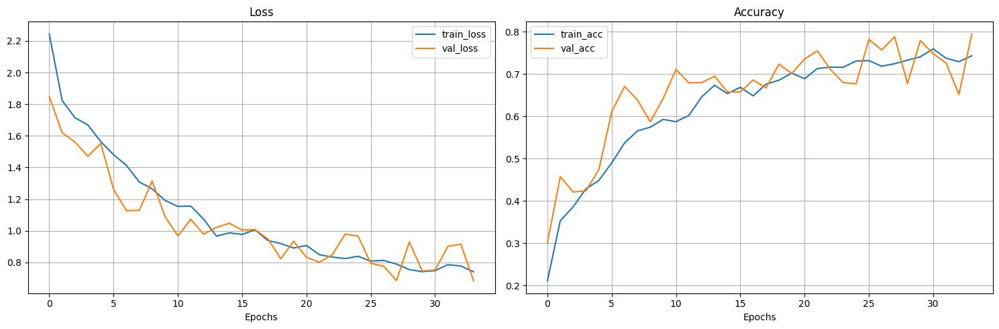

In [ ]:
# plot learning curves
plot_loss_curves(LL_model_dropout_results[LL_best_dropout_probs])

Once again, the curves are so closely aligned that the reduction in overfitting is barely noticeable. Let's experiment with different layer sizes to eliminate it.

Experiment 3: Try different hidden layer sizes.

In [ ]:
# experiment 3: hidden layer sizes
LL_model_hidden_results = experiment_hidden_layer_sizes(train_dataloader=train_dataloader_L,
                                                        val_dataloader=val_dataloader_L,
                                                        num_epochs=num_epochs,
                                                        device=device,
                                                        num_classes=num_classes,
                                                        best_decay_value=LL_best_decay_value,
                                                        best_dropout_probs_combo=LL_best_dropout_probs,
                                                        hidden_layer_sizes_list=hidden_layer_sizes_list)

Experimenting with Hidden Layer Sizes
Hidden layer sizes combinations to try: [(32, 64, 64), (32, 32, 128), (64, 32, 64), (32, 32, 64), (64, 64, 32), (32, 64, 32)]

Testing hidden layer sizes combination: (32, 64, 64)...


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.4886 | train_acc: 0.2113 | val_loss: 1.7580 | val_acc: 0.3614
Epoch: 2 | train_loss: 1.8875 | train_acc: 0.3326 | val_loss: 1.6311 | val_acc: 0.3926
Epoch: 3 | train_loss: 1.7374 | train_acc: 0.3668 | val_loss: 1.5582 | val_acc: 0.4455
Epoch: 4 | train_loss: 1.6276 | train_acc: 0.4309 | val_loss: 1.4927 | val_acc: 0.4892
Epoch: 5 | train_loss: 1.5739 | train_acc: 0.4348 | val_loss: 1.3660 | val_acc: 0.5830
Epoch: 6 | train_loss: 1.5088 | train_acc: 0.4849 | val_loss: 1.5130 | val_acc: 0.4830
Epoch: 7 | train_loss: 1.4349 | train_acc: 0.5060 | val_loss: 1.2663 | val_acc: 0.5920
Epoch: 8 | train_loss: 1.3694 | train_acc: 0.5446 | val_loss: 1.2683 | val_acc: 0.6170
Epoch: 9 | train_loss: 1.2691 | train_acc: 0.5828 | val_loss: 1.2274 | val_acc: 0.6358
Epoch: 10 | train_loss: 1.1843 | train_acc: 0.5969 | val_loss: 1.1302 | val_acc: 0.6580
Epoch: 11 | train_loss: 1.1493 | train_acc: 0.6151 | val_loss: 0.9692 | val_acc: 0.6795
Epoch: 12 | train_loss: 1.1224 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.3676 | train_acc: 0.1954 | val_loss: 2.0436 | val_acc: 0.3114
Epoch: 2 | train_loss: 1.8626 | train_acc: 0.3630 | val_loss: 1.5226 | val_acc: 0.5426
Epoch: 3 | train_loss: 1.7075 | train_acc: 0.3957 | val_loss: 1.4001 | val_acc: 0.5614
Epoch: 4 | train_loss: 1.5832 | train_acc: 0.4645 | val_loss: 1.2641 | val_acc: 0.5830
Epoch: 5 | train_loss: 1.4107 | train_acc: 0.5058 | val_loss: 1.0994 | val_acc: 0.6545
Epoch: 6 | train_loss: 1.2925 | train_acc: 0.5688 | val_loss: 1.0621 | val_acc: 0.6426
Epoch: 7 | train_loss: 1.2194 | train_acc: 0.5839 | val_loss: 1.1049 | val_acc: 0.5994
Epoch: 8 | train_loss: 1.1217 | train_acc: 0.6186 | val_loss: 0.8695 | val_acc: 0.7108
Epoch: 9 | train_loss: 1.0218 | train_acc: 0.6371 | val_loss: 0.8360 | val_acc: 0.7045
Epoch: 10 | train_loss: 0.9390 | train_acc: 0.6635 | val_loss: 0.8217 | val_acc: 0.7267
Epoch: 11 | train_loss: 0.8862 | train_acc: 0.6943 | val_loss: 0.7823 | val_acc: 0.7324
Epoch: 12 | train_loss: 0.8997 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.4125 | train_acc: 0.1255 | val_loss: 2.3812 | val_acc: 0.1000
Epoch: 2 | train_loss: 2.3691 | train_acc: 0.1044 | val_loss: 2.3797 | val_acc: 0.1000
Epoch: 3 | train_loss: 2.3620 | train_acc: 0.1117 | val_loss: 2.3443 | val_acc: 0.2426
Epoch: 4 | train_loss: 2.0997 | train_acc: 0.2354 | val_loss: 1.7195 | val_acc: 0.3710
Epoch: 5 | train_loss: 1.7923 | train_acc: 0.3304 | val_loss: 1.6149 | val_acc: 0.4619
Epoch: 6 | train_loss: 1.6821 | train_acc: 0.3810 | val_loss: 1.5153 | val_acc: 0.4426
Epoch: 7 | train_loss: 1.6281 | train_acc: 0.4245 | val_loss: 1.4711 | val_acc: 0.5551
Epoch: 8 | train_loss: 1.5191 | train_acc: 0.4771 | val_loss: 1.4680 | val_acc: 0.5080
Epoch: 9 | train_loss: 1.4012 | train_acc: 0.5206 | val_loss: 1.2420 | val_acc: 0.5733
Epoch: 10 | train_loss: 1.3251 | train_acc: 0.5559 | val_loss: 1.1321 | val_acc: 0.6483
Epoch: 11 | train_loss: 1.2589 | train_acc: 0.5780 | val_loss: 1.0729 | val_acc: 0.6205
Epoch: 12 | train_loss: 1.2114 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.2686 | train_acc: 0.2134 | val_loss: 1.7884 | val_acc: 0.3426
Epoch: 2 | train_loss: 1.8669 | train_acc: 0.3341 | val_loss: 1.7036 | val_acc: 0.3455
Epoch: 3 | train_loss: 1.7078 | train_acc: 0.4227 | val_loss: 1.4231 | val_acc: 0.4977
Epoch: 4 | train_loss: 1.5289 | train_acc: 0.4822 | val_loss: 1.2088 | val_acc: 0.5858
Epoch: 5 | train_loss: 1.3315 | train_acc: 0.5428 | val_loss: 1.0404 | val_acc: 0.6642
Epoch: 6 | train_loss: 1.2970 | train_acc: 0.5723 | val_loss: 0.9974 | val_acc: 0.6920
Epoch: 7 | train_loss: 1.1830 | train_acc: 0.5902 | val_loss: 0.9674 | val_acc: 0.6790
Epoch: 8 | train_loss: 1.0917 | train_acc: 0.6206 | val_loss: 0.8892 | val_acc: 0.6574
Epoch: 9 | train_loss: 1.0419 | train_acc: 0.6383 | val_loss: 0.9849 | val_acc: 0.6699
Epoch: 10 | train_loss: 1.0026 | train_acc: 0.6673 | val_loss: 0.8744 | val_acc: 0.6955
Epoch: 11 | train_loss: 0.9380 | train_acc: 0.6650 | val_loss: 0.8368 | val_acc: 0.6949
Epoch: 12 | train_loss: 0.9404 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.2994 | train_acc: 0.2084 | val_loss: 1.9512 | val_acc: 0.3773
Epoch: 2 | train_loss: 1.9486 | train_acc: 0.3235 | val_loss: 1.6274 | val_acc: 0.4318
Epoch: 3 | train_loss: 1.7978 | train_acc: 0.3672 | val_loss: 1.5071 | val_acc: 0.4989
Epoch: 4 | train_loss: 1.6413 | train_acc: 0.4318 | val_loss: 1.3833 | val_acc: 0.5420
Epoch: 5 | train_loss: 1.5430 | train_acc: 0.4810 | val_loss: 1.2657 | val_acc: 0.5795
Epoch: 6 | train_loss: 1.3997 | train_acc: 0.5318 | val_loss: 1.1334 | val_acc: 0.5670
Epoch: 7 | train_loss: 1.2934 | train_acc: 0.5737 | val_loss: 1.0471 | val_acc: 0.6170
Epoch: 8 | train_loss: 1.2086 | train_acc: 0.5827 | val_loss: 0.9664 | val_acc: 0.7176
Epoch: 9 | train_loss: 1.1328 | train_acc: 0.6156 | val_loss: 0.9328 | val_acc: 0.6489
Epoch: 10 | train_loss: 1.1163 | train_acc: 0.6288 | val_loss: 0.9030 | val_acc: 0.6983
Epoch: 11 | train_loss: 1.0412 | train_acc: 0.6438 | val_loss: 1.0214 | val_acc: 0.6222
Epoch: 12 | train_loss: 1.0554 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.3381 | train_acc: 0.1890 | val_loss: 1.9554 | val_acc: 0.3051
Epoch: 2 | train_loss: 1.8861 | train_acc: 0.3405 | val_loss: 1.6024 | val_acc: 0.4682
Epoch: 3 | train_loss: 1.6898 | train_acc: 0.3994 | val_loss: 1.6159 | val_acc: 0.4398
Epoch: 4 | train_loss: 1.6122 | train_acc: 0.4552 | val_loss: 1.3572 | val_acc: 0.5233
Epoch: 5 | train_loss: 1.4837 | train_acc: 0.4977 | val_loss: 1.2644 | val_acc: 0.5835
Epoch: 6 | train_loss: 1.4155 | train_acc: 0.5167 | val_loss: 1.3811 | val_acc: 0.5182
Epoch: 7 | train_loss: 1.3130 | train_acc: 0.5542 | val_loss: 1.0063 | val_acc: 0.6670
Epoch: 8 | train_loss: 1.2392 | train_acc: 0.5614 | val_loss: 1.0093 | val_acc: 0.6295
Epoch: 9 | train_loss: 1.1780 | train_acc: 0.5938 | val_loss: 0.9638 | val_acc: 0.7386
Epoch: 10 | train_loss: 1.1434 | train_acc: 0.6086 | val_loss: 0.9396 | val_acc: 0.7295
Epoch: 11 | train_loss: 1.0188 | train_acc: 0.6583 | val_loss: 0.8883 | val_acc: 0.6920
Epoch: 12 | train_loss: 1.0713 | train_ac

In [ ]:
# put all results in a table and print it
hidden_size_results_list = [(combo, LL_model_hidden_results[combo]['generalization_gap'], LL_model_hidden_results[combo]['val_acc'][-1]) for combo in LL_model_hidden_results]
hidden_size_results_df = pd.DataFrame(hidden_size_results_list, columns=['Hidden Layer Sizes', 'Generalization Gap', 'Validation Accuracy'])
hidden_size_df = hidden_size_results_df.sort_values(by='Validation Accuracy', ascending=False)
print("\n", hidden_size_df.to_string(index=False))


 Hidden Layer Sizes  Generalization Gap  Validation Accuracy
      (32, 32, 64)           -0.013811             0.813636
     (32, 32, 128)           -0.021421             0.803977
      (32, 64, 32)           -0.057896             0.803977
      (64, 64, 32)           -0.005242             0.798295
      (64, 32, 64)           -0.018393             0.785227
      (32, 64, 64)            0.043126             0.751136


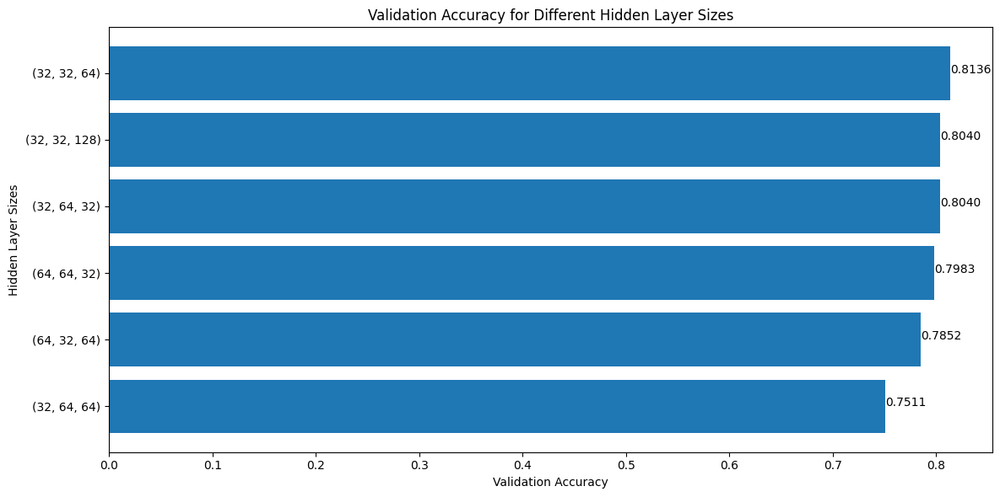

In [ ]:
# plot the results of hidden layer sizes experiment
plot_hidden_layer_results(hidden_size_df)

In [ ]:
LL_best_hidden_units = hidden_size_df.iloc[0]['Hidden Layer Sizes']
print(f"Best hidden layer sizes: {LL_best_hidden_units}")

Best hidden layer sizes: (32, 32, 64)


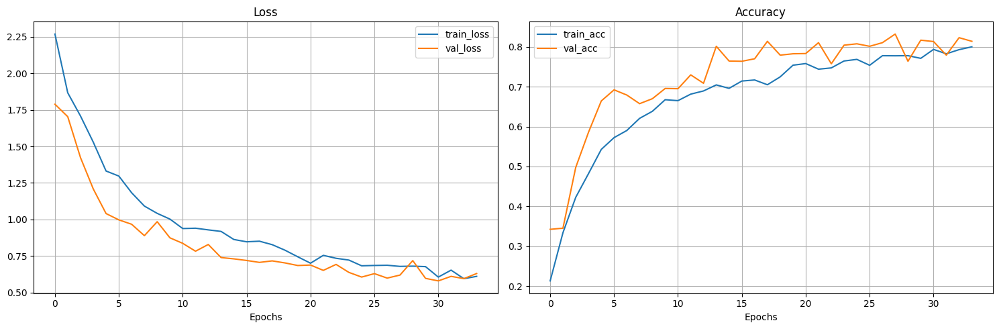

In [ ]:
# plot curves
plot_loss_curves(LL_model_hidden_results[LL_best_hidden_units])

Things now are better, but there is still space for improvement.

Experiment 4. Try different optimizers and learning rates.

In [ ]:
# experiment 4: optimizers and learning rates
LL_model_opt_results = experiment_optimizers_and_learning_rates(train_dataloader=train_dataloader_L,
                                                                val_dataloader=val_dataloader_L,
                                                                num_epochs=num_epochs,
                                                                device=device,
                                                                num_classes=num_classes,
                                                                best_hidden_units_combo=LL_best_hidden_units,
                                                                best_decay_value=LL_best_decay_value,
                                                                best_dropout_probs_combo=LL_best_dropout_probs,
                                                                learning_rates_list=learning_rates_list)

Experimenting with Optimizers and Learning Rates
Learning rates to try: [0.01, 0.001, 0.0001, 1e-05, 1e-06]
Optimizers to try: ['SGD', 'RMSprop', 'Adam', 'AdamW', 'NAdam']

Testing SGD optimizer...

Learning rate: 0.01... 



  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.3484 | train_acc: 0.1131 | val_loss: 2.2863 | val_acc: 0.1517
Epoch: 2 | train_loss: 2.2925 | train_acc: 0.1248 | val_loss: 2.2184 | val_acc: 0.2142
Epoch: 3 | train_loss: 2.2437 | train_acc: 0.1592 | val_loss: 2.1640 | val_acc: 0.2926
Epoch: 4 | train_loss: 2.1926 | train_acc: 0.2311 | val_loss: 2.0908 | val_acc: 0.3239
Epoch: 5 | train_loss: 2.1428 | train_acc: 0.2620 | val_loss: 2.0464 | val_acc: 0.3614
Epoch: 6 | train_loss: 2.0731 | train_acc: 0.3218 | val_loss: 1.9622 | val_acc: 0.4051
Epoch: 7 | train_loss: 2.0336 | train_acc: 0.3389 | val_loss: 1.8999 | val_acc: 0.4239
Epoch: 8 | train_loss: 1.9773 | train_acc: 0.3573 | val_loss: 1.8207 | val_acc: 0.4301
Epoch: 9 | train_loss: 1.9241 | train_acc: 0.3860 | val_loss: 1.7752 | val_acc: 0.4739
Epoch: 10 | train_loss: 1.8660 | train_acc: 0.3948 | val_loss: 1.7275 | val_acc: 0.4614
Epoch: 11 | train_loss: 1.8524 | train_acc: 0.4050 | val_loss: 1.7078 | val_acc: 0.4801
Epoch: 12 | train_loss: 1.7938 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.4079 | train_acc: 0.1470 | val_loss: 2.3942 | val_acc: 0.1364
Epoch: 2 | train_loss: 2.3944 | train_acc: 0.1488 | val_loss: 2.3848 | val_acc: 0.2364
Epoch: 3 | train_loss: 2.3901 | train_acc: 0.1627 | val_loss: 2.3757 | val_acc: 0.2455
Epoch: 4 | train_loss: 2.3770 | train_acc: 0.1583 | val_loss: 2.3668 | val_acc: 0.2392
Epoch: 5 | train_loss: 2.3740 | train_acc: 0.1503 | val_loss: 2.3581 | val_acc: 0.2392
Epoch: 6 | train_loss: 2.3555 | train_acc: 0.1518 | val_loss: 2.3485 | val_acc: 0.2330
Epoch: 7 | train_loss: 2.3503 | train_acc: 0.1545 | val_loss: 2.3390 | val_acc: 0.2330
Epoch: 8 | train_loss: 2.3473 | train_acc: 0.1426 | val_loss: 2.3292 | val_acc: 0.2267
Epoch: 9 | train_loss: 2.3344 | train_acc: 0.1699 | val_loss: 2.3193 | val_acc: 0.2267
Epoch: 10 | train_loss: 2.3324 | train_acc: 0.1362 | val_loss: 2.3100 | val_acc: 0.2267
Epoch: 11 | train_loss: 2.3260 | train_acc: 0.1454 | val_loss: 2.2997 | val_acc: 0.2267
Epoch: 12 | train_loss: 2.3157 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.4196 | train_acc: 0.0846 | val_loss: 2.4073 | val_acc: 0.1000
Epoch: 2 | train_loss: 2.4052 | train_acc: 0.0952 | val_loss: 2.4062 | val_acc: 0.1000
Epoch: 3 | train_loss: 2.4086 | train_acc: 0.1001 | val_loss: 2.4050 | val_acc: 0.1000
Epoch: 4 | train_loss: 2.4048 | train_acc: 0.1058 | val_loss: 2.4039 | val_acc: 0.1000
Epoch: 5 | train_loss: 2.3979 | train_acc: 0.1068 | val_loss: 2.4027 | val_acc: 0.1062
Epoch: 6 | train_loss: 2.3973 | train_acc: 0.0903 | val_loss: 2.4016 | val_acc: 0.1062
Epoch: 7 | train_loss: 2.4000 | train_acc: 0.1085 | val_loss: 2.4004 | val_acc: 0.1062
Epoch: 8 | train_loss: 2.3961 | train_acc: 0.0920 | val_loss: 2.3992 | val_acc: 0.1250
Epoch: 9 | train_loss: 2.3979 | train_acc: 0.0984 | val_loss: 2.3981 | val_acc: 0.1187
Epoch: 10 | train_loss: 2.3980 | train_acc: 0.1116 | val_loss: 2.3971 | val_acc: 0.1187
Epoch: 11 | train_loss: 2.3901 | train_acc: 0.1075 | val_loss: 2.3959 | val_acc: 0.1187
Epoch: 12 | train_loss: 2.3927 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.3966 | train_acc: 0.1100 | val_loss: 2.3928 | val_acc: 0.0994
Epoch: 2 | train_loss: 2.4049 | train_acc: 0.0951 | val_loss: 2.3927 | val_acc: 0.0994
Epoch: 3 | train_loss: 2.4037 | train_acc: 0.0987 | val_loss: 2.3926 | val_acc: 0.0994
Epoch: 4 | train_loss: 2.4116 | train_acc: 0.0789 | val_loss: 2.3925 | val_acc: 0.0994
Epoch: 5 | train_loss: 2.4125 | train_acc: 0.0798 | val_loss: 2.3924 | val_acc: 0.0994
Epoch: 6 | train_loss: 2.4016 | train_acc: 0.0894 | val_loss: 2.3923 | val_acc: 0.0994
Epoch: 7 | train_loss: 2.4016 | train_acc: 0.0929 | val_loss: 2.3922 | val_acc: 0.0994
Epoch: 8 | train_loss: 2.4050 | train_acc: 0.0805 | val_loss: 2.3921 | val_acc: 0.0994
Epoch: 9 | train_loss: 2.4075 | train_acc: 0.0894 | val_loss: 2.3919 | val_acc: 0.0994
Epoch: 10 | train_loss: 2.4014 | train_acc: 0.1042 | val_loss: 2.3918 | val_acc: 0.0994
Epoch: 11 | train_loss: 2.4008 | train_acc: 0.0952 | val_loss: 2.3917 | val_acc: 0.0994
Epoch: 12 | train_loss: 2.3985 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.4014 | train_acc: 0.0853 | val_loss: 2.3938 | val_acc: 0.0500
Epoch: 2 | train_loss: 2.3900 | train_acc: 0.0880 | val_loss: 2.3938 | val_acc: 0.0500
Epoch: 3 | train_loss: 2.3937 | train_acc: 0.0804 | val_loss: 2.3938 | val_acc: 0.0500
Epoch: 4 | train_loss: 2.3976 | train_acc: 0.0887 | val_loss: 2.3938 | val_acc: 0.0500
Epoch: 5 | train_loss: 2.4010 | train_acc: 0.0886 | val_loss: 2.3938 | val_acc: 0.0500
Epoch: 6 | train_loss: 2.4018 | train_acc: 0.0853 | val_loss: 2.3937 | val_acc: 0.0500
Epoch: 7 | train_loss: 2.3957 | train_acc: 0.0896 | val_loss: 2.3937 | val_acc: 0.0500
Epoch: 8 | train_loss: 2.4058 | train_acc: 0.0904 | val_loss: 2.3937 | val_acc: 0.0500
Epoch: 9 | train_loss: 2.3927 | train_acc: 0.0812 | val_loss: 2.3937 | val_acc: 0.0500
Epoch: 10 | train_loss: 2.4010 | train_acc: 0.0755 | val_loss: 2.3937 | val_acc: 0.0500
Epoch: 11 | train_loss: 2.4022 | train_acc: 0.0854 | val_loss: 2.3936 | val_acc: 0.0500
Epoch: 12 | train_loss: 2.3929 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 131.8347 | train_acc: 0.1158 | val_loss: 2.3715 | val_acc: 0.1170
Epoch: 2 | train_loss: 2.3808 | train_acc: 0.1026 | val_loss: 2.4015 | val_acc: 0.1000
Epoch: 3 | train_loss: 2.5967 | train_acc: 0.1183 | val_loss: 2.3993 | val_acc: 0.1000
Epoch: 4 | train_loss: 2.3760 | train_acc: 0.1232 | val_loss: 2.3913 | val_acc: 0.1062
Epoch: 5 | train_loss: 3.4081 | train_acc: 0.1118 | val_loss: 2.3860 | val_acc: 0.0938
Epoch: 6 | train_loss: 2.3704 | train_acc: 0.1075 | val_loss: 2.3934 | val_acc: 0.1062
Epoch: 7 | train_loss: 2.3965 | train_acc: 0.1068 | val_loss: 2.7095 | val_acc: 0.0938
Epoch: 8 | train_loss: 2.4216 | train_acc: 0.1034 | val_loss: 2.3823 | val_acc: 0.0938
Epoch: 9 | train_loss: 2.3724 | train_acc: 0.0961 | val_loss: 2.3696 | val_acc: 0.1062
Epoch: 10 | train_loss: 2.3790 | train_acc: 0.1026 | val_loss: 2.3671 | val_acc: 0.1000
Epoch: 11 | train_loss: 9.0802 | train_acc: 0.0952 | val_loss: 2.4158 | val_acc: 0.1000
Epoch: 12 | train_loss: 2.3993 | train_

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.2849 | train_acc: 0.2275 | val_loss: 1.8611 | val_acc: 0.2898
Epoch: 2 | train_loss: 1.8728 | train_acc: 0.3261 | val_loss: 1.5845 | val_acc: 0.4705
Epoch: 3 | train_loss: 1.7046 | train_acc: 0.3949 | val_loss: 1.5037 | val_acc: 0.4767
Epoch: 4 | train_loss: 1.5991 | train_acc: 0.4397 | val_loss: 1.3849 | val_acc: 0.5614
Epoch: 5 | train_loss: 1.4522 | train_acc: 0.5286 | val_loss: 1.2788 | val_acc: 0.5705
Epoch: 6 | train_loss: 1.2849 | train_acc: 0.5596 | val_loss: 1.0264 | val_acc: 0.6920
Epoch: 7 | train_loss: 1.1557 | train_acc: 0.6029 | val_loss: 0.9683 | val_acc: 0.6358
Epoch: 8 | train_loss: 1.0539 | train_acc: 0.6418 | val_loss: 0.8250 | val_acc: 0.7233
Epoch: 9 | train_loss: 1.0158 | train_acc: 0.6509 | val_loss: 0.8302 | val_acc: 0.7045
Epoch: 10 | train_loss: 0.9543 | train_acc: 0.6704 | val_loss: 0.8198 | val_acc: 0.7420
Epoch: 11 | train_loss: 0.9338 | train_acc: 0.6713 | val_loss: 0.7707 | val_acc: 0.7420
Epoch: 12 | train_loss: 0.8736 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.2892 | train_acc: 0.1220 | val_loss: 2.1400 | val_acc: 0.2045
Epoch: 2 | train_loss: 2.1667 | train_acc: 0.2224 | val_loss: 2.0418 | val_acc: 0.4017
Epoch: 3 | train_loss: 2.0351 | train_acc: 0.3110 | val_loss: 1.8587 | val_acc: 0.4176
Epoch: 4 | train_loss: 1.9157 | train_acc: 0.3484 | val_loss: 1.7238 | val_acc: 0.4489
Epoch: 5 | train_loss: 1.8195 | train_acc: 0.3656 | val_loss: 1.6195 | val_acc: 0.5051
Epoch: 6 | train_loss: 1.7939 | train_acc: 0.4023 | val_loss: 1.5576 | val_acc: 0.5017
Epoch: 7 | train_loss: 1.7089 | train_acc: 0.4198 | val_loss: 1.5196 | val_acc: 0.4858
Epoch: 8 | train_loss: 1.6501 | train_acc: 0.4324 | val_loss: 1.4804 | val_acc: 0.5239
Epoch: 9 | train_loss: 1.6239 | train_acc: 0.4417 | val_loss: 1.4767 | val_acc: 0.5364
Epoch: 10 | train_loss: 1.6140 | train_acc: 0.4393 | val_loss: 1.4159 | val_acc: 0.5392
Epoch: 11 | train_loss: 1.5984 | train_acc: 0.4652 | val_loss: 1.4314 | val_acc: 0.5455
Epoch: 12 | train_loss: 1.5510 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.3858 | train_acc: 0.1075 | val_loss: 2.3670 | val_acc: 0.1455
Epoch: 2 | train_loss: 2.3632 | train_acc: 0.1141 | val_loss: 2.3507 | val_acc: 0.1455
Epoch: 3 | train_loss: 2.3481 | train_acc: 0.1068 | val_loss: 2.3367 | val_acc: 0.1455
Epoch: 4 | train_loss: 2.3420 | train_acc: 0.0946 | val_loss: 2.3236 | val_acc: 0.1455
Epoch: 5 | train_loss: 2.3270 | train_acc: 0.1018 | val_loss: 2.3106 | val_acc: 0.1455
Epoch: 6 | train_loss: 2.3166 | train_acc: 0.0978 | val_loss: 2.2984 | val_acc: 0.1455
Epoch: 7 | train_loss: 2.2992 | train_acc: 0.1130 | val_loss: 2.2859 | val_acc: 0.1455
Epoch: 8 | train_loss: 2.2990 | train_acc: 0.1036 | val_loss: 2.2758 | val_acc: 0.1455
Epoch: 9 | train_loss: 2.2956 | train_acc: 0.0938 | val_loss: 2.2656 | val_acc: 0.1455
Epoch: 10 | train_loss: 2.2822 | train_acc: 0.1125 | val_loss: 2.2558 | val_acc: 0.1455
Epoch: 11 | train_loss: 2.2740 | train_acc: 0.1158 | val_loss: 2.2464 | val_acc: 0.1455
Epoch: 12 | train_loss: 2.2721 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.4190 | train_acc: 0.0681 | val_loss: 2.4056 | val_acc: 0.0563
Epoch: 2 | train_loss: 2.4144 | train_acc: 0.0772 | val_loss: 2.4028 | val_acc: 0.0563
Epoch: 3 | train_loss: 2.4117 | train_acc: 0.0723 | val_loss: 2.4007 | val_acc: 0.0563
Epoch: 4 | train_loss: 2.4074 | train_acc: 0.0756 | val_loss: 2.3988 | val_acc: 0.0563
Epoch: 5 | train_loss: 2.4126 | train_acc: 0.0829 | val_loss: 2.3970 | val_acc: 0.0625
Epoch: 6 | train_loss: 2.4062 | train_acc: 0.0650 | val_loss: 2.3952 | val_acc: 0.0716
Epoch: 7 | train_loss: 2.4027 | train_acc: 0.0868 | val_loss: 2.3936 | val_acc: 0.0716
Epoch: 8 | train_loss: 2.4008 | train_acc: 0.0797 | val_loss: 2.3920 | val_acc: 0.0653
Epoch: 9 | train_loss: 2.3963 | train_acc: 0.0904 | val_loss: 2.3903 | val_acc: 0.0744
Epoch: 10 | train_loss: 2.3964 | train_acc: 0.0845 | val_loss: 2.3887 | val_acc: 0.1045
Epoch: 11 | train_loss: 2.3945 | train_acc: 0.0919 | val_loss: 2.3871 | val_acc: 0.1227
Epoch: 12 | train_loss: 2.3905 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.4245 | train_acc: 0.1437 | val_loss: 2.2615 | val_acc: 0.1875
Epoch: 2 | train_loss: 2.2179 | train_acc: 0.2037 | val_loss: 1.9909 | val_acc: 0.3455
Epoch: 3 | train_loss: 2.1717 | train_acc: 0.2482 | val_loss: 1.8130 | val_acc: 0.3960
Epoch: 4 | train_loss: 2.1785 | train_acc: 0.2381 | val_loss: 1.9808 | val_acc: 0.3239
Epoch: 5 | train_loss: 2.1218 | train_acc: 0.2610 | val_loss: 1.8299 | val_acc: 0.3250
Epoch: 6 | train_loss: 2.0893 | train_acc: 0.2651 | val_loss: 1.8228 | val_acc: 0.2977
Epoch: 7 | train_loss: 2.0252 | train_acc: 0.2810 | val_loss: 1.6121 | val_acc: 0.4080
Epoch: 8 | train_loss: 1.9474 | train_acc: 0.3003 | val_loss: 1.7519 | val_acc: 0.3472
Epoch: 9 | train_loss: 1.9480 | train_acc: 0.3029 | val_loss: 1.6373 | val_acc: 0.3994
Epoch: 10 | train_loss: 1.9394 | train_acc: 0.3080 | val_loss: 1.7064 | val_acc: 0.3455
Epoch: 11 | train_loss: 1.8924 | train_acc: 0.3233 | val_loss: 1.5870 | val_acc: 0.4426
Epoch: 12 | train_loss: 1.8506 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.1951 | train_acc: 0.2091 | val_loss: 1.9610 | val_acc: 0.2705
Epoch: 2 | train_loss: 1.8515 | train_acc: 0.3357 | val_loss: 1.5427 | val_acc: 0.4926
Epoch: 3 | train_loss: 1.7091 | train_acc: 0.4040 | val_loss: 1.4874 | val_acc: 0.4920
Epoch: 4 | train_loss: 1.5803 | train_acc: 0.4695 | val_loss: 1.3205 | val_acc: 0.5642
Epoch: 5 | train_loss: 1.4382 | train_acc: 0.5211 | val_loss: 1.1498 | val_acc: 0.6080
Epoch: 6 | train_loss: 1.3016 | train_acc: 0.5459 | val_loss: 0.9236 | val_acc: 0.7045
Epoch: 7 | train_loss: 1.1816 | train_acc: 0.6118 | val_loss: 0.8926 | val_acc: 0.7261
Epoch: 8 | train_loss: 1.0288 | train_acc: 0.6409 | val_loss: 0.8367 | val_acc: 0.7017
Epoch: 9 | train_loss: 1.0368 | train_acc: 0.6472 | val_loss: 0.7563 | val_acc: 0.7170
Epoch: 10 | train_loss: 1.0208 | train_acc: 0.6543 | val_loss: 0.7679 | val_acc: 0.7511
Epoch: 11 | train_loss: 0.9586 | train_acc: 0.6650 | val_loss: 0.7869 | val_acc: 0.7295
Epoch: 12 | train_loss: 0.9415 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.3679 | train_acc: 0.1102 | val_loss: 2.3073 | val_acc: 0.1455
Epoch: 2 | train_loss: 2.2729 | train_acc: 0.1214 | val_loss: 2.2044 | val_acc: 0.2330
Epoch: 3 | train_loss: 2.2145 | train_acc: 0.1562 | val_loss: 2.1524 | val_acc: 0.3239
Epoch: 4 | train_loss: 2.1448 | train_acc: 0.2347 | val_loss: 2.0317 | val_acc: 0.3364
Epoch: 5 | train_loss: 2.0771 | train_acc: 0.3182 | val_loss: 1.9224 | val_acc: 0.3801
Epoch: 6 | train_loss: 1.9893 | train_acc: 0.3400 | val_loss: 1.8262 | val_acc: 0.4301
Epoch: 7 | train_loss: 1.8969 | train_acc: 0.3628 | val_loss: 1.7158 | val_acc: 0.4392
Epoch: 8 | train_loss: 1.8164 | train_acc: 0.3866 | val_loss: 1.6332 | val_acc: 0.4364
Epoch: 9 | train_loss: 1.7758 | train_acc: 0.4063 | val_loss: 1.5654 | val_acc: 0.4858
Epoch: 10 | train_loss: 1.7357 | train_acc: 0.4078 | val_loss: 1.5347 | val_acc: 0.4892
Epoch: 11 | train_loss: 1.6797 | train_acc: 0.4242 | val_loss: 1.5254 | val_acc: 0.4864
Epoch: 12 | train_loss: 1.6623 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.3880 | train_acc: 0.1394 | val_loss: 2.3874 | val_acc: 0.1500
Epoch: 2 | train_loss: 2.3724 | train_acc: 0.1371 | val_loss: 2.3771 | val_acc: 0.1187
Epoch: 3 | train_loss: 2.3649 | train_acc: 0.1151 | val_loss: 2.3658 | val_acc: 0.1636
Epoch: 4 | train_loss: 2.3512 | train_acc: 0.1533 | val_loss: 2.3554 | val_acc: 0.1960
Epoch: 5 | train_loss: 2.3410 | train_acc: 0.1281 | val_loss: 2.3443 | val_acc: 0.1614
Epoch: 6 | train_loss: 2.3290 | train_acc: 0.1165 | val_loss: 2.3315 | val_acc: 0.1517
Epoch: 7 | train_loss: 2.3229 | train_acc: 0.1140 | val_loss: 2.3202 | val_acc: 0.1455
Epoch: 8 | train_loss: 2.3070 | train_acc: 0.1324 | val_loss: 2.3068 | val_acc: 0.1455
Epoch: 9 | train_loss: 2.3003 | train_acc: 0.1215 | val_loss: 2.2948 | val_acc: 0.1455
Epoch: 10 | train_loss: 2.2985 | train_acc: 0.1182 | val_loss: 2.2857 | val_acc: 0.1455
Epoch: 11 | train_loss: 2.2882 | train_acc: 0.1200 | val_loss: 2.2759 | val_acc: 0.1455
Epoch: 12 | train_loss: 2.2864 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.3963 | train_acc: 0.0961 | val_loss: 2.3955 | val_acc: 0.0688
Epoch: 2 | train_loss: 2.3955 | train_acc: 0.1011 | val_loss: 2.3938 | val_acc: 0.0688
Epoch: 3 | train_loss: 2.3878 | train_acc: 0.1043 | val_loss: 2.3922 | val_acc: 0.0688
Epoch: 4 | train_loss: 2.3861 | train_acc: 0.1052 | val_loss: 2.3906 | val_acc: 0.0778
Epoch: 5 | train_loss: 2.3831 | train_acc: 0.1160 | val_loss: 2.3889 | val_acc: 0.0966
Epoch: 6 | train_loss: 2.3819 | train_acc: 0.1081 | val_loss: 2.3873 | val_acc: 0.1057
Epoch: 7 | train_loss: 2.3814 | train_acc: 0.1141 | val_loss: 2.3856 | val_acc: 0.1057
Epoch: 8 | train_loss: 2.3739 | train_acc: 0.1092 | val_loss: 2.3840 | val_acc: 0.1511
Epoch: 9 | train_loss: 2.3707 | train_acc: 0.1254 | val_loss: 2.3825 | val_acc: 0.1693
Epoch: 10 | train_loss: 2.3856 | train_acc: 0.1101 | val_loss: 2.3809 | val_acc: 0.2000
Epoch: 11 | train_loss: 2.3730 | train_acc: 0.1304 | val_loss: 2.3793 | val_acc: 0.2062
Epoch: 12 | train_loss: 2.3775 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.3189 | train_acc: 0.1889 | val_loss: 1.7695 | val_acc: 0.3801
Epoch: 2 | train_loss: 2.0298 | train_acc: 0.2718 | val_loss: 1.7876 | val_acc: 0.4483
Epoch: 3 | train_loss: 2.1306 | train_acc: 0.2641 | val_loss: 1.5466 | val_acc: 0.5114
Epoch: 4 | train_loss: 2.0872 | train_acc: 0.2753 | val_loss: 2.0452 | val_acc: 0.2812
Epoch: 5 | train_loss: 2.1295 | train_acc: 0.2102 | val_loss: 2.0498 | val_acc: 0.2125
Epoch: 6 | train_loss: 2.0743 | train_acc: 0.2423 | val_loss: 2.0227 | val_acc: 0.2278
Epoch: 7 | train_loss: 2.0686 | train_acc: 0.2325 | val_loss: 2.0902 | val_acc: 0.2062
Epoch: 8 | train_loss: 2.0637 | train_acc: 0.2232 | val_loss: 2.0164 | val_acc: 0.2313
Epoch: 9 | train_loss: 2.0500 | train_acc: 0.2726 | val_loss: 2.0547 | val_acc: 0.2562
Epoch: 10 | train_loss: 2.0395 | train_acc: 0.2736 | val_loss: 1.9519 | val_acc: 0.2750
Epoch: 11 | train_loss: 1.9874 | train_acc: 0.2914 | val_loss: 1.9077 | val_acc: 0.2875
Epoch: 12 | train_loss: 1.9383 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.2288 | train_acc: 0.1762 | val_loss: 2.0011 | val_acc: 0.3307
Epoch: 2 | train_loss: 1.9333 | train_acc: 0.3339 | val_loss: 1.7596 | val_acc: 0.3801
Epoch: 3 | train_loss: 1.7193 | train_acc: 0.4017 | val_loss: 1.4684 | val_acc: 0.5148
Epoch: 4 | train_loss: 1.6057 | train_acc: 0.4426 | val_loss: 1.3819 | val_acc: 0.5330
Epoch: 5 | train_loss: 1.5447 | train_acc: 0.4696 | val_loss: 1.3400 | val_acc: 0.5301
Epoch: 6 | train_loss: 1.4337 | train_acc: 0.5099 | val_loss: 1.1699 | val_acc: 0.6205
Epoch: 7 | train_loss: 1.2981 | train_acc: 0.5542 | val_loss: 1.0607 | val_acc: 0.6830
Epoch: 8 | train_loss: 1.1743 | train_acc: 0.6016 | val_loss: 0.9399 | val_acc: 0.6920
Epoch: 9 | train_loss: 1.0866 | train_acc: 0.6232 | val_loss: 0.8655 | val_acc: 0.6858
Epoch: 10 | train_loss: 1.0526 | train_acc: 0.6494 | val_loss: 0.8432 | val_acc: 0.7199
Epoch: 11 | train_loss: 0.9172 | train_acc: 0.6841 | val_loss: 0.7311 | val_acc: 0.7693
Epoch: 12 | train_loss: 0.8714 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.3418 | train_acc: 0.0994 | val_loss: 2.2570 | val_acc: 0.1517
Epoch: 2 | train_loss: 2.2681 | train_acc: 0.1230 | val_loss: 2.1891 | val_acc: 0.1989
Epoch: 3 | train_loss: 2.2131 | train_acc: 0.1404 | val_loss: 2.0971 | val_acc: 0.2489
Epoch: 4 | train_loss: 2.1551 | train_acc: 0.1946 | val_loss: 2.0249 | val_acc: 0.3364
Epoch: 5 | train_loss: 2.0650 | train_acc: 0.2570 | val_loss: 1.8959 | val_acc: 0.3801
Epoch: 6 | train_loss: 1.9890 | train_acc: 0.2981 | val_loss: 1.7807 | val_acc: 0.4892
Epoch: 7 | train_loss: 1.9034 | train_acc: 0.3683 | val_loss: 1.6773 | val_acc: 0.4955
Epoch: 8 | train_loss: 1.8228 | train_acc: 0.3946 | val_loss: 1.5791 | val_acc: 0.5080
Epoch: 9 | train_loss: 1.7732 | train_acc: 0.4000 | val_loss: 1.5223 | val_acc: 0.5017
Epoch: 10 | train_loss: 1.7273 | train_acc: 0.4161 | val_loss: 1.5086 | val_acc: 0.5239
Epoch: 11 | train_loss: 1.7012 | train_acc: 0.4276 | val_loss: 1.4541 | val_acc: 0.5295
Epoch: 12 | train_loss: 1.6705 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.3774 | train_acc: 0.0861 | val_loss: 2.3663 | val_acc: 0.1455
Epoch: 2 | train_loss: 2.3611 | train_acc: 0.0952 | val_loss: 2.3572 | val_acc: 0.1455
Epoch: 3 | train_loss: 2.3562 | train_acc: 0.0878 | val_loss: 2.3479 | val_acc: 0.1455
Epoch: 4 | train_loss: 2.3400 | train_acc: 0.0961 | val_loss: 2.3367 | val_acc: 0.1455
Epoch: 5 | train_loss: 2.3284 | train_acc: 0.1049 | val_loss: 2.3249 | val_acc: 0.1455
Epoch: 6 | train_loss: 2.3208 | train_acc: 0.0978 | val_loss: 2.3125 | val_acc: 0.1455
Epoch: 7 | train_loss: 2.3099 | train_acc: 0.1066 | val_loss: 2.2995 | val_acc: 0.1455
Epoch: 8 | train_loss: 2.3075 | train_acc: 0.0978 | val_loss: 2.2871 | val_acc: 0.1455
Epoch: 9 | train_loss: 2.3034 | train_acc: 0.1027 | val_loss: 2.2758 | val_acc: 0.1455
Epoch: 10 | train_loss: 2.2786 | train_acc: 0.1068 | val_loss: 2.2621 | val_acc: 0.1455
Epoch: 11 | train_loss: 2.2837 | train_acc: 0.1101 | val_loss: 2.2491 | val_acc: 0.1455
Epoch: 12 | train_loss: 2.2602 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.4219 | train_acc: 0.0657 | val_loss: 2.4144 | val_acc: 0.0528
Epoch: 2 | train_loss: 2.4234 | train_acc: 0.0844 | val_loss: 2.4132 | val_acc: 0.0528
Epoch: 3 | train_loss: 2.4226 | train_acc: 0.0798 | val_loss: 2.4121 | val_acc: 0.0528
Epoch: 4 | train_loss: 2.4216 | train_acc: 0.0722 | val_loss: 2.4110 | val_acc: 0.0466
Epoch: 5 | train_loss: 2.4115 | train_acc: 0.0895 | val_loss: 2.4100 | val_acc: 0.0466
Epoch: 6 | train_loss: 2.4148 | train_acc: 0.0977 | val_loss: 2.4089 | val_acc: 0.0528
Epoch: 7 | train_loss: 2.4212 | train_acc: 0.0624 | val_loss: 2.4078 | val_acc: 0.0528
Epoch: 8 | train_loss: 2.4146 | train_acc: 0.0913 | val_loss: 2.4068 | val_acc: 0.0619
Epoch: 9 | train_loss: 2.4106 | train_acc: 0.0894 | val_loss: 2.4058 | val_acc: 0.0619
Epoch: 10 | train_loss: 2.4154 | train_acc: 0.0763 | val_loss: 2.4047 | val_acc: 0.0682
Epoch: 11 | train_loss: 2.4136 | train_acc: 0.0829 | val_loss: 2.4036 | val_acc: 0.0682
Epoch: 12 | train_loss: 2.4080 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.4794 | train_acc: 0.1496 | val_loss: 2.2964 | val_acc: 0.2386
Epoch: 2 | train_loss: 2.3013 | train_acc: 0.1750 | val_loss: 2.2683 | val_acc: 0.2955
Epoch: 3 | train_loss: 2.1381 | train_acc: 0.2609 | val_loss: 1.8157 | val_acc: 0.3841
Epoch: 4 | train_loss: 2.0328 | train_acc: 0.2612 | val_loss: 1.7158 | val_acc: 0.4233
Epoch: 5 | train_loss: 2.0276 | train_acc: 0.2632 | val_loss: 1.8702 | val_acc: 0.2835
Epoch: 6 | train_loss: 1.9998 | train_acc: 0.2725 | val_loss: 1.6216 | val_acc: 0.4182
Epoch: 7 | train_loss: 1.9381 | train_acc: 0.3198 | val_loss: 1.7149 | val_acc: 0.4500
Epoch: 8 | train_loss: 1.8971 | train_acc: 0.3555 | val_loss: 1.4775 | val_acc: 0.5114
Epoch: 9 | train_loss: 1.8930 | train_acc: 0.3590 | val_loss: 1.6011 | val_acc: 0.4688
Epoch: 10 | train_loss: 1.9504 | train_acc: 0.3747 | val_loss: 1.5212 | val_acc: 0.4489
Epoch: 11 | train_loss: 1.8242 | train_acc: 0.3523 | val_loss: 1.4539 | val_acc: 0.4523
Epoch: 12 | train_loss: 1.7347 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.1825 | train_acc: 0.2348 | val_loss: 1.8557 | val_acc: 0.4676
Epoch: 2 | train_loss: 1.8517 | train_acc: 0.3474 | val_loss: 1.5558 | val_acc: 0.4358
Epoch: 3 | train_loss: 1.7006 | train_acc: 0.3891 | val_loss: 1.4101 | val_acc: 0.5795
Epoch: 4 | train_loss: 1.5619 | train_acc: 0.4541 | val_loss: 1.3606 | val_acc: 0.5767
Epoch: 5 | train_loss: 1.4891 | train_acc: 0.4944 | val_loss: 1.2023 | val_acc: 0.6455
Epoch: 6 | train_loss: 1.2974 | train_acc: 0.5589 | val_loss: 1.0157 | val_acc: 0.6733
Epoch: 7 | train_loss: 1.1758 | train_acc: 0.6034 | val_loss: 1.1454 | val_acc: 0.6210
Epoch: 8 | train_loss: 1.1123 | train_acc: 0.6185 | val_loss: 0.8516 | val_acc: 0.6983
Epoch: 9 | train_loss: 1.0110 | train_acc: 0.6405 | val_loss: 0.8482 | val_acc: 0.7080
Epoch: 10 | train_loss: 0.9689 | train_acc: 0.6503 | val_loss: 0.8828 | val_acc: 0.7045
Epoch: 11 | train_loss: 0.9539 | train_acc: 0.7021 | val_loss: 0.8314 | val_acc: 0.7108
Epoch: 12 | train_loss: 0.9149 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.3466 | train_acc: 0.1052 | val_loss: 2.2568 | val_acc: 0.1642
Epoch: 2 | train_loss: 2.2415 | train_acc: 0.1339 | val_loss: 2.1454 | val_acc: 0.2051
Epoch: 3 | train_loss: 2.1722 | train_acc: 0.1805 | val_loss: 2.0365 | val_acc: 0.3176
Epoch: 4 | train_loss: 2.0883 | train_acc: 0.2702 | val_loss: 1.9282 | val_acc: 0.3739
Epoch: 5 | train_loss: 1.9985 | train_acc: 0.3369 | val_loss: 1.7915 | val_acc: 0.4301
Epoch: 6 | train_loss: 1.9024 | train_acc: 0.3622 | val_loss: 1.6873 | val_acc: 0.4364
Epoch: 7 | train_loss: 1.8023 | train_acc: 0.3945 | val_loss: 1.5961 | val_acc: 0.4864
Epoch: 8 | train_loss: 1.7652 | train_acc: 0.4221 | val_loss: 1.5288 | val_acc: 0.4892
Epoch: 9 | train_loss: 1.7058 | train_acc: 0.4218 | val_loss: 1.4842 | val_acc: 0.5080
Epoch: 10 | train_loss: 1.7049 | train_acc: 0.4336 | val_loss: 1.4621 | val_acc: 0.5267
Epoch: 11 | train_loss: 1.6395 | train_acc: 0.4499 | val_loss: 1.4484 | val_acc: 0.5392
Epoch: 12 | train_loss: 1.6163 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.4034 | train_acc: 0.0967 | val_loss: 2.3846 | val_acc: 0.2205
Epoch: 2 | train_loss: 2.3824 | train_acc: 0.1173 | val_loss: 2.3701 | val_acc: 0.1994
Epoch: 3 | train_loss: 2.3732 | train_acc: 0.0994 | val_loss: 2.3566 | val_acc: 0.1489
Epoch: 4 | train_loss: 2.3577 | train_acc: 0.1148 | val_loss: 2.3410 | val_acc: 0.1455
Epoch: 5 | train_loss: 2.3451 | train_acc: 0.1086 | val_loss: 2.3247 | val_acc: 0.1455
Epoch: 6 | train_loss: 2.3364 | train_acc: 0.1076 | val_loss: 2.3094 | val_acc: 0.1455
Epoch: 7 | train_loss: 2.3088 | train_acc: 0.1157 | val_loss: 2.2921 | val_acc: 0.1455
Epoch: 8 | train_loss: 2.3008 | train_acc: 0.1208 | val_loss: 2.2745 | val_acc: 0.1455
Epoch: 9 | train_loss: 2.2915 | train_acc: 0.1116 | val_loss: 2.2599 | val_acc: 0.1455
Epoch: 10 | train_loss: 2.2803 | train_acc: 0.1255 | val_loss: 2.2450 | val_acc: 0.1455
Epoch: 11 | train_loss: 2.2739 | train_acc: 0.1182 | val_loss: 2.2322 | val_acc: 0.1455
Epoch: 12 | train_loss: 2.2701 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.3851 | train_acc: 0.0985 | val_loss: 2.3799 | val_acc: 0.1108
Epoch: 2 | train_loss: 2.3877 | train_acc: 0.0979 | val_loss: 2.3786 | val_acc: 0.1472
Epoch: 3 | train_loss: 2.3812 | train_acc: 0.1182 | val_loss: 2.3773 | val_acc: 0.1472
Epoch: 4 | train_loss: 2.3844 | train_acc: 0.1031 | val_loss: 2.3760 | val_acc: 0.1562
Epoch: 5 | train_loss: 2.3837 | train_acc: 0.0987 | val_loss: 2.3747 | val_acc: 0.1898
Epoch: 6 | train_loss: 2.3830 | train_acc: 0.1074 | val_loss: 2.3734 | val_acc: 0.1898
Epoch: 7 | train_loss: 2.3813 | train_acc: 0.1027 | val_loss: 2.3721 | val_acc: 0.1989
Epoch: 8 | train_loss: 2.3778 | train_acc: 0.1240 | val_loss: 2.3707 | val_acc: 0.2170
Epoch: 9 | train_loss: 2.3727 | train_acc: 0.1239 | val_loss: 2.3694 | val_acc: 0.2199
Epoch: 10 | train_loss: 2.3720 | train_acc: 0.1239 | val_loss: 2.3680 | val_acc: 0.2227
Epoch: 11 | train_loss: 2.3748 | train_acc: 0.1232 | val_loss: 2.3667 | val_acc: 0.2165
Epoch: 12 | train_loss: 2.3709 | train_ac

In [ ]:
# put all the results in a table and print it in desc order (results in a list in this case)
optimizers_df = pd.DataFrame(LL_model_opt_results, columns=['Optimizer', 'Best Learning Rate', 'Validation Accuracy'])
optimizers_df = optimizers_df.sort_values(by='Validation Accuracy', ascending=False)
print("\n", optimizers_df.to_string(index=False))


 Optimizer  Best Learning Rate  Validation Accuracy
    AdamW               0.001             0.835795
    NAdam               0.001             0.828977
     Adam               0.001             0.819886
  RMSprop               0.001             0.797727
      SGD               0.010             0.648295


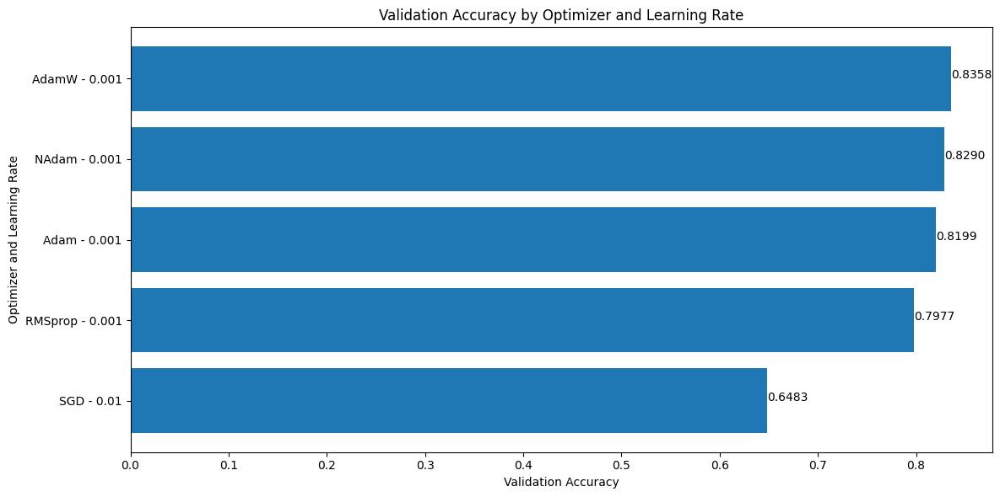

In [ ]:
# plot the results of the experiment
plot_optimizers_results(optimizers_df)

In [ ]:
# get and print best optimizer and learning rate
LL_best_optimizer_name = optimizers_df.iloc[0]['Optimizer']
LL_best_optimizer = torch.optim.__dict__[LL_best_optimizer_name]
print(f"Best optimizer: {LL_best_optimizer_name}")
LL_best_learning_rate = optimizers_df.iloc[0]['Best Learning Rate']
print(f"Best learning rate: {LL_best_learning_rate}")

Best optimizer: AdamW
Best learning rate: 0.001


Experiment 5. Try various activation functions.

In [ ]:
# experiment 5: activation functions
LL_model_act_fn_results = experiment_activation_functions(train_dataloader=train_dataloader_L,
                                                          val_dataloader=val_dataloader_L,
                                                          num_epochs=num_epochs,
                                                          device=device,
                                                          num_classes=num_classes,
                                                          best_hidden_units_combo=LL_best_hidden_units,
                                                          best_decay_value=LL_best_decay_value,
                                                          best_dropout_probs_combo=LL_best_dropout_probs,
                                                          best_optimizer=LL_best_optimizer,
                                                          best_learning_rate=LL_best_learning_rate)

Experimenting with Activation Functions
Activation functions to try: ['ReLU', 'LeakyReLU', 'ELU', 'GELU', 'SiLU']

Testing ReLU activation function as activation function in feature extractor...

Testing ReLU activation function as activation function in classifier...


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.2452 | train_acc: 0.1458 | val_loss: 1.9649 | val_acc: 0.3176
Epoch: 2 | train_loss: 1.9109 | train_acc: 0.3305 | val_loss: 1.7986 | val_acc: 0.3142
Epoch: 3 | train_loss: 1.7807 | train_acc: 0.3351 | val_loss: 1.5399 | val_acc: 0.5608
Epoch: 4 | train_loss: 1.6885 | train_acc: 0.3826 | val_loss: 1.4883 | val_acc: 0.4551
Epoch: 5 | train_loss: 1.5847 | train_acc: 0.4366 | val_loss: 1.3957 | val_acc: 0.5142
Epoch: 6 | train_loss: 1.5087 | train_acc: 0.4724 | val_loss: 1.2244 | val_acc: 0.5864
Epoch: 7 | train_loss: 1.3967 | train_acc: 0.5129 | val_loss: 1.1909 | val_acc: 0.6295
Epoch: 8 | train_loss: 1.3539 | train_acc: 0.5445 | val_loss: 1.1145 | val_acc: 0.6420
Epoch: 9 | train_loss: 1.2640 | train_acc: 0.5606 | val_loss: 1.0451 | val_acc: 0.6642
Epoch: 10 | train_loss: 1.1731 | train_acc: 0.5955 | val_loss: 0.9380 | val_acc: 0.6983
Epoch: 11 | train_loss: 1.0730 | train_acc: 0.6338 | val_loss: 0.8687 | val_acc: 0.7045
Epoch: 12 | train_loss: 1.0401 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.3018 | train_acc: 0.1108 | val_loss: 2.2251 | val_acc: 0.3301
Epoch: 2 | train_loss: 2.0657 | train_acc: 0.2629 | val_loss: 1.6993 | val_acc: 0.3864
Epoch: 3 | train_loss: 1.8256 | train_acc: 0.3446 | val_loss: 1.6450 | val_acc: 0.4455
Epoch: 4 | train_loss: 1.6970 | train_acc: 0.3897 | val_loss: 1.4488 | val_acc: 0.4864
Epoch: 5 | train_loss: 1.6112 | train_acc: 0.4243 | val_loss: 1.3256 | val_acc: 0.5801
Epoch: 6 | train_loss: 1.4485 | train_acc: 0.5088 | val_loss: 1.1125 | val_acc: 0.6420
Epoch: 7 | train_loss: 1.3143 | train_acc: 0.5649 | val_loss: 1.0678 | val_acc: 0.6545
Epoch: 8 | train_loss: 1.2281 | train_acc: 0.5830 | val_loss: 1.0318 | val_acc: 0.6455
Epoch: 9 | train_loss: 1.1846 | train_acc: 0.5747 | val_loss: 1.0289 | val_acc: 0.6358
Epoch: 10 | train_loss: 1.1381 | train_acc: 0.6206 | val_loss: 0.9305 | val_acc: 0.7295
Epoch: 11 | train_loss: 1.0830 | train_acc: 0.6159 | val_loss: 0.9537 | val_acc: 0.6858
Epoch: 12 | train_loss: 0.9915 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.2336 | train_acc: 0.1697 | val_loss: 2.0384 | val_acc: 0.3364
Epoch: 2 | train_loss: 1.9002 | train_acc: 0.3416 | val_loss: 1.6509 | val_acc: 0.4295
Epoch: 3 | train_loss: 1.6936 | train_acc: 0.4073 | val_loss: 1.4205 | val_acc: 0.5142
Epoch: 4 | train_loss: 1.5108 | train_acc: 0.4851 | val_loss: 1.2740 | val_acc: 0.5767
Epoch: 5 | train_loss: 1.4031 | train_acc: 0.5214 | val_loss: 1.1218 | val_acc: 0.6795
Epoch: 6 | train_loss: 1.2285 | train_acc: 0.5985 | val_loss: 1.0037 | val_acc: 0.6727
Epoch: 7 | train_loss: 1.1549 | train_acc: 0.5934 | val_loss: 0.9216 | val_acc: 0.7227
Epoch: 8 | train_loss: 0.9822 | train_acc: 0.6453 | val_loss: 0.8355 | val_acc: 0.6983
Epoch: 9 | train_loss: 0.9584 | train_acc: 0.6590 | val_loss: 0.7920 | val_acc: 0.7295
Epoch: 10 | train_loss: 0.8944 | train_acc: 0.6995 | val_loss: 0.8451 | val_acc: 0.7477
Epoch: 11 | train_loss: 0.8449 | train_acc: 0.7119 | val_loss: 0.7987 | val_acc: 0.7227
Epoch: 12 | train_loss: 0.8236 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.2526 | train_acc: 0.1641 | val_loss: 2.0616 | val_acc: 0.3801
Epoch: 2 | train_loss: 2.0323 | train_acc: 0.3095 | val_loss: 1.8329 | val_acc: 0.3676
Epoch: 3 | train_loss: 1.7459 | train_acc: 0.4053 | val_loss: 1.5033 | val_acc: 0.5267
Epoch: 4 | train_loss: 1.6721 | train_acc: 0.4293 | val_loss: 1.4840 | val_acc: 0.5205
Epoch: 5 | train_loss: 1.5563 | train_acc: 0.4710 | val_loss: 1.2874 | val_acc: 0.5955
Epoch: 6 | train_loss: 1.4222 | train_acc: 0.5018 | val_loss: 1.0827 | val_acc: 0.6858
Epoch: 7 | train_loss: 1.2895 | train_acc: 0.5580 | val_loss: 1.0769 | val_acc: 0.6301
Epoch: 8 | train_loss: 1.2329 | train_acc: 0.5793 | val_loss: 0.9946 | val_acc: 0.6892
Epoch: 9 | train_loss: 1.0966 | train_acc: 0.6373 | val_loss: 0.9817 | val_acc: 0.6830
Epoch: 10 | train_loss: 1.0593 | train_acc: 0.6239 | val_loss: 0.8787 | val_acc: 0.7301
Epoch: 11 | train_loss: 0.9726 | train_acc: 0.6453 | val_loss: 0.8069 | val_acc: 0.7477
Epoch: 12 | train_loss: 0.8577 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.2274 | train_acc: 0.1664 | val_loss: 1.9958 | val_acc: 0.3614
Epoch: 2 | train_loss: 2.0418 | train_acc: 0.3063 | val_loss: 1.7216 | val_acc: 0.4767
Epoch: 3 | train_loss: 1.8676 | train_acc: 0.3930 | val_loss: 1.5731 | val_acc: 0.4642
Epoch: 4 | train_loss: 1.6723 | train_acc: 0.4271 | val_loss: 1.4592 | val_acc: 0.5017
Epoch: 5 | train_loss: 1.6169 | train_acc: 0.4426 | val_loss: 1.3826 | val_acc: 0.5205
Epoch: 6 | train_loss: 1.5094 | train_acc: 0.4892 | val_loss: 1.2962 | val_acc: 0.5955
Epoch: 7 | train_loss: 1.4437 | train_acc: 0.5276 | val_loss: 1.2101 | val_acc: 0.5642
Epoch: 8 | train_loss: 1.3123 | train_acc: 0.5549 | val_loss: 1.1579 | val_acc: 0.5989
Epoch: 9 | train_loss: 1.2415 | train_acc: 0.5914 | val_loss: 1.0688 | val_acc: 0.6455
Epoch: 10 | train_loss: 1.1618 | train_acc: 0.5968 | val_loss: 0.9515 | val_acc: 0.6705
Epoch: 11 | train_loss: 1.1005 | train_acc: 0.6214 | val_loss: 0.9005 | val_acc: 0.6920
Epoch: 12 | train_loss: 1.0601 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.2754 | train_acc: 0.1525 | val_loss: 2.1355 | val_acc: 0.3739
Epoch: 2 | train_loss: 2.0527 | train_acc: 0.3037 | val_loss: 1.6844 | val_acc: 0.4580
Epoch: 3 | train_loss: 1.8256 | train_acc: 0.3544 | val_loss: 1.5450 | val_acc: 0.4767
Epoch: 4 | train_loss: 1.7186 | train_acc: 0.3973 | val_loss: 1.4593 | val_acc: 0.5267
Epoch: 5 | train_loss: 1.6166 | train_acc: 0.4212 | val_loss: 1.3959 | val_acc: 0.5114
Epoch: 6 | train_loss: 1.4963 | train_acc: 0.4714 | val_loss: 1.2788 | val_acc: 0.6045
Epoch: 7 | train_loss: 1.3762 | train_acc: 0.5157 | val_loss: 1.1472 | val_acc: 0.6295
Epoch: 8 | train_loss: 1.2628 | train_acc: 0.5741 | val_loss: 1.0409 | val_acc: 0.6330
Epoch: 9 | train_loss: 1.2057 | train_acc: 0.5976 | val_loss: 1.0354 | val_acc: 0.6301
Epoch: 10 | train_loss: 1.1359 | train_acc: 0.6166 | val_loss: 0.9066 | val_acc: 0.6864
Epoch: 11 | train_loss: 1.0442 | train_acc: 0.6414 | val_loss: 0.9536 | val_acc: 0.7233
Epoch: 12 | train_loss: 0.9755 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.2516 | train_acc: 0.1427 | val_loss: 2.1325 | val_acc: 0.3676
Epoch: 2 | train_loss: 2.0475 | train_acc: 0.3163 | val_loss: 1.7627 | val_acc: 0.4426
Epoch: 3 | train_loss: 1.8125 | train_acc: 0.3676 | val_loss: 1.5536 | val_acc: 0.4551
Epoch: 4 | train_loss: 1.6818 | train_acc: 0.3924 | val_loss: 1.5008 | val_acc: 0.4926
Epoch: 5 | train_loss: 1.6285 | train_acc: 0.4352 | val_loss: 1.3607 | val_acc: 0.5767
Epoch: 6 | train_loss: 1.5464 | train_acc: 0.4696 | val_loss: 1.2303 | val_acc: 0.6045
Epoch: 7 | train_loss: 1.3974 | train_acc: 0.5269 | val_loss: 1.1576 | val_acc: 0.6670
Epoch: 8 | train_loss: 1.2777 | train_acc: 0.5643 | val_loss: 1.0256 | val_acc: 0.6767
Epoch: 9 | train_loss: 1.1857 | train_acc: 0.6042 | val_loss: 0.9522 | val_acc: 0.7170
Epoch: 10 | train_loss: 1.0995 | train_acc: 0.6050 | val_loss: 0.9479 | val_acc: 0.6892
Epoch: 11 | train_loss: 1.0314 | train_acc: 0.6304 | val_loss: 0.8225 | val_acc: 0.7477
Epoch: 12 | train_loss: 1.0224 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.2003 | train_acc: 0.2003 | val_loss: 1.8392 | val_acc: 0.3955
Epoch: 2 | train_loss: 1.8809 | train_acc: 0.3475 | val_loss: 1.6353 | val_acc: 0.4239
Epoch: 3 | train_loss: 1.6872 | train_acc: 0.4031 | val_loss: 1.4425 | val_acc: 0.5142
Epoch: 4 | train_loss: 1.6286 | train_acc: 0.4344 | val_loss: 1.3565 | val_acc: 0.5455
Epoch: 5 | train_loss: 1.4585 | train_acc: 0.5031 | val_loss: 1.2956 | val_acc: 0.5830
Epoch: 6 | train_loss: 1.3201 | train_acc: 0.5453 | val_loss: 1.1638 | val_acc: 0.6205
Epoch: 7 | train_loss: 1.2320 | train_acc: 0.5843 | val_loss: 0.9194 | val_acc: 0.6858
Epoch: 8 | train_loss: 1.0674 | train_acc: 0.6393 | val_loss: 0.9531 | val_acc: 0.6983
Epoch: 9 | train_loss: 1.0037 | train_acc: 0.6528 | val_loss: 0.8861 | val_acc: 0.6733
Epoch: 10 | train_loss: 0.9069 | train_acc: 0.6878 | val_loss: 0.7760 | val_acc: 0.7449
Epoch: 11 | train_loss: 0.8722 | train_acc: 0.7083 | val_loss: 0.8178 | val_acc: 0.6983
Epoch: 12 | train_loss: 0.8494 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.2626 | train_acc: 0.1665 | val_loss: 1.9108 | val_acc: 0.3801
Epoch: 2 | train_loss: 1.8889 | train_acc: 0.3392 | val_loss: 1.5513 | val_acc: 0.5080
Epoch: 3 | train_loss: 1.7287 | train_acc: 0.4017 | val_loss: 1.4864 | val_acc: 0.4955
Epoch: 4 | train_loss: 1.5876 | train_acc: 0.4631 | val_loss: 1.3268 | val_acc: 0.6233
Epoch: 5 | train_loss: 1.4451 | train_acc: 0.5144 | val_loss: 1.1613 | val_acc: 0.6670
Epoch: 6 | train_loss: 1.2702 | train_acc: 0.5681 | val_loss: 0.9904 | val_acc: 0.6670
Epoch: 7 | train_loss: 1.2523 | train_acc: 0.5870 | val_loss: 0.9382 | val_acc: 0.6955
Epoch: 8 | train_loss: 1.1523 | train_acc: 0.6160 | val_loss: 0.9232 | val_acc: 0.7142
Epoch: 9 | train_loss: 1.0475 | train_acc: 0.6393 | val_loss: 0.8336 | val_acc: 0.7170
Epoch: 10 | train_loss: 0.9630 | train_acc: 0.6592 | val_loss: 0.8456 | val_acc: 0.7142
Epoch: 11 | train_loss: 0.9315 | train_acc: 0.6896 | val_loss: 0.7950 | val_acc: 0.7511
Epoch: 12 | train_loss: 0.8870 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.2656 | train_acc: 0.1845 | val_loss: 2.1753 | val_acc: 0.2625
Epoch: 2 | train_loss: 1.9488 | train_acc: 0.3277 | val_loss: 1.6311 | val_acc: 0.4676
Epoch: 3 | train_loss: 1.7271 | train_acc: 0.4063 | val_loss: 1.4668 | val_acc: 0.5205
Epoch: 4 | train_loss: 1.6303 | train_acc: 0.4307 | val_loss: 1.4528 | val_acc: 0.5205
Epoch: 5 | train_loss: 1.5122 | train_acc: 0.4738 | val_loss: 1.3719 | val_acc: 0.5420
Epoch: 6 | train_loss: 1.3858 | train_acc: 0.5025 | val_loss: 1.2366 | val_acc: 0.6108
Epoch: 7 | train_loss: 1.3008 | train_acc: 0.5650 | val_loss: 1.1666 | val_acc: 0.6386
Epoch: 8 | train_loss: 1.2295 | train_acc: 0.5893 | val_loss: 1.0397 | val_acc: 0.6858
Epoch: 9 | train_loss: 1.1298 | train_acc: 0.6225 | val_loss: 0.9936 | val_acc: 0.6767
Epoch: 10 | train_loss: 1.0619 | train_acc: 0.6395 | val_loss: 0.9551 | val_acc: 0.6830
Epoch: 11 | train_loss: 1.0001 | train_acc: 0.6671 | val_loss: 0.8719 | val_acc: 0.7170
Epoch: 12 | train_loss: 0.9709 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.1634 | train_acc: 0.2060 | val_loss: 1.6816 | val_acc: 0.4710
Epoch: 2 | train_loss: 1.6369 | train_acc: 0.4385 | val_loss: 1.1148 | val_acc: 0.5989
Epoch: 3 | train_loss: 1.3256 | train_acc: 0.5467 | val_loss: 0.8099 | val_acc: 0.7574
Epoch: 4 | train_loss: 1.0232 | train_acc: 0.6426 | val_loss: 0.7377 | val_acc: 0.7386
Epoch: 5 | train_loss: 0.9342 | train_acc: 0.6743 | val_loss: 0.6453 | val_acc: 0.8131
Epoch: 6 | train_loss: 0.7800 | train_acc: 0.7295 | val_loss: 0.6626 | val_acc: 0.7580
Epoch: 7 | train_loss: 0.7730 | train_acc: 0.7307 | val_loss: 0.5858 | val_acc: 0.8568
Epoch: 8 | train_loss: 0.7355 | train_acc: 0.7407 | val_loss: 0.5646 | val_acc: 0.8318
Epoch: 9 | train_loss: 0.6809 | train_acc: 0.7720 | val_loss: 0.4909 | val_acc: 0.8693
Epoch: 10 | train_loss: 0.6321 | train_acc: 0.7659 | val_loss: 0.4649 | val_acc: 0.8756
Epoch: 11 | train_loss: 0.6162 | train_acc: 0.7799 | val_loss: 0.5607 | val_acc: 0.8068
Epoch: 12 | train_loss: 0.6460 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.1203 | train_acc: 0.2184 | val_loss: 1.7074 | val_acc: 0.3614
Epoch: 2 | train_loss: 1.7463 | train_acc: 0.3819 | val_loss: 1.2317 | val_acc: 0.5955
Epoch: 3 | train_loss: 1.3589 | train_acc: 0.5219 | val_loss: 0.9067 | val_acc: 0.7170
Epoch: 4 | train_loss: 1.1421 | train_acc: 0.5887 | val_loss: 0.8133 | val_acc: 0.7261
Epoch: 5 | train_loss: 0.9612 | train_acc: 0.6566 | val_loss: 0.6947 | val_acc: 0.7420
Epoch: 6 | train_loss: 0.9019 | train_acc: 0.6627 | val_loss: 0.6510 | val_acc: 0.7574
Epoch: 7 | train_loss: 0.8194 | train_acc: 0.7061 | val_loss: 0.5761 | val_acc: 0.8040
Epoch: 8 | train_loss: 0.7386 | train_acc: 0.7246 | val_loss: 0.5438 | val_acc: 0.8472
Epoch: 9 | train_loss: 0.6873 | train_acc: 0.7536 | val_loss: 0.4885 | val_acc: 0.8472
Epoch: 10 | train_loss: 0.6476 | train_acc: 0.7740 | val_loss: 0.4801 | val_acc: 0.8631
Epoch: 11 | train_loss: 0.5794 | train_acc: 0.7851 | val_loss: 0.4431 | val_acc: 0.8409
Epoch: 12 | train_loss: 0.5741 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.0879 | train_acc: 0.2651 | val_loss: 1.5548 | val_acc: 0.5080
Epoch: 2 | train_loss: 1.5803 | train_acc: 0.4597 | val_loss: 1.1559 | val_acc: 0.6420
Epoch: 3 | train_loss: 1.2481 | train_acc: 0.5661 | val_loss: 0.8737 | val_acc: 0.7074
Epoch: 4 | train_loss: 1.0303 | train_acc: 0.6271 | val_loss: 0.7270 | val_acc: 0.7545
Epoch: 5 | train_loss: 0.8509 | train_acc: 0.6927 | val_loss: 0.6869 | val_acc: 0.7881
Epoch: 6 | train_loss: 0.7806 | train_acc: 0.7298 | val_loss: 0.5463 | val_acc: 0.8006
Epoch: 7 | train_loss: 0.7552 | train_acc: 0.7399 | val_loss: 0.5421 | val_acc: 0.8068
Epoch: 8 | train_loss: 0.6627 | train_acc: 0.7725 | val_loss: 0.5145 | val_acc: 0.8534
Epoch: 9 | train_loss: 0.6389 | train_acc: 0.7831 | val_loss: 0.5557 | val_acc: 0.8443
Epoch: 10 | train_loss: 0.5661 | train_acc: 0.7948 | val_loss: 0.4910 | val_acc: 0.8506
Epoch: 11 | train_loss: 0.5608 | train_acc: 0.7957 | val_loss: 0.5202 | val_acc: 0.8227
Epoch: 12 | train_loss: 0.5607 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.0723 | train_acc: 0.2633 | val_loss: 1.4908 | val_acc: 0.5580
Epoch: 2 | train_loss: 1.4413 | train_acc: 0.5048 | val_loss: 1.1266 | val_acc: 0.6330
Epoch: 3 | train_loss: 1.1959 | train_acc: 0.5689 | val_loss: 0.7421 | val_acc: 0.7977
Epoch: 4 | train_loss: 1.0019 | train_acc: 0.6290 | val_loss: 0.6227 | val_acc: 0.7949
Epoch: 5 | train_loss: 0.8474 | train_acc: 0.6897 | val_loss: 0.6998 | val_acc: 0.7949
Epoch: 6 | train_loss: 0.8086 | train_acc: 0.7152 | val_loss: 0.6770 | val_acc: 0.7983
Epoch: 7 | train_loss: 0.7478 | train_acc: 0.7470 | val_loss: 0.5565 | val_acc: 0.8318
Epoch: 8 | train_loss: 0.6824 | train_acc: 0.7593 | val_loss: 0.5798 | val_acc: 0.8227
Epoch: 9 | train_loss: 0.7065 | train_acc: 0.7473 | val_loss: 0.5361 | val_acc: 0.8506
Epoch: 10 | train_loss: 0.6389 | train_acc: 0.7833 | val_loss: 0.5343 | val_acc: 0.8318
Epoch: 11 | train_loss: 0.5935 | train_acc: 0.8053 | val_loss: 0.4762 | val_acc: 0.8631
Epoch: 12 | train_loss: 0.5528 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.0721 | train_acc: 0.2583 | val_loss: 1.6504 | val_acc: 0.3989
Epoch: 2 | train_loss: 1.6869 | train_acc: 0.4295 | val_loss: 1.2053 | val_acc: 0.5642
Epoch: 3 | train_loss: 1.2642 | train_acc: 0.5581 | val_loss: 0.8554 | val_acc: 0.7074
Epoch: 4 | train_loss: 1.0608 | train_acc: 0.6266 | val_loss: 0.8321 | val_acc: 0.7574
Epoch: 5 | train_loss: 0.9229 | train_acc: 0.6675 | val_loss: 0.7155 | val_acc: 0.7324
Epoch: 6 | train_loss: 0.8655 | train_acc: 0.7020 | val_loss: 0.6352 | val_acc: 0.8324
Epoch: 7 | train_loss: 0.7502 | train_acc: 0.7398 | val_loss: 0.6097 | val_acc: 0.8352
Epoch: 8 | train_loss: 0.6982 | train_acc: 0.7332 | val_loss: 0.5274 | val_acc: 0.8443
Epoch: 9 | train_loss: 0.6825 | train_acc: 0.7545 | val_loss: 0.4927 | val_acc: 0.8631
Epoch: 10 | train_loss: 0.6246 | train_acc: 0.7748 | val_loss: 0.5523 | val_acc: 0.8443
Epoch: 11 | train_loss: 0.5758 | train_acc: 0.7882 | val_loss: 0.5329 | val_acc: 0.8631
Epoch: 12 | train_loss: 0.5714 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.1652 | train_acc: 0.2365 | val_loss: 1.8461 | val_acc: 0.3955
Epoch: 2 | train_loss: 1.8418 | train_acc: 0.3285 | val_loss: 1.5825 | val_acc: 0.4642
Epoch: 3 | train_loss: 1.6609 | train_acc: 0.3947 | val_loss: 1.4217 | val_acc: 0.4739
Epoch: 4 | train_loss: 1.5373 | train_acc: 0.4672 | val_loss: 1.3694 | val_acc: 0.5273
Epoch: 5 | train_loss: 1.3977 | train_acc: 0.5129 | val_loss: 1.1283 | val_acc: 0.6136
Epoch: 6 | train_loss: 1.3009 | train_acc: 0.5615 | val_loss: 1.0171 | val_acc: 0.6920
Epoch: 7 | train_loss: 1.1062 | train_acc: 0.6132 | val_loss: 0.8300 | val_acc: 0.7261
Epoch: 8 | train_loss: 1.0389 | train_acc: 0.6200 | val_loss: 0.8116 | val_acc: 0.7574
Epoch: 9 | train_loss: 0.8975 | train_acc: 0.6813 | val_loss: 0.7335 | val_acc: 0.7392
Epoch: 10 | train_loss: 0.8618 | train_acc: 0.7043 | val_loss: 0.6943 | val_acc: 0.7665
Epoch: 11 | train_loss: 0.8175 | train_acc: 0.7084 | val_loss: 0.6445 | val_acc: 0.7761
Epoch: 12 | train_loss: 0.8442 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.1921 | train_acc: 0.1984 | val_loss: 2.0065 | val_acc: 0.2989
Epoch: 2 | train_loss: 1.7996 | train_acc: 0.3448 | val_loss: 1.5594 | val_acc: 0.4114
Epoch: 3 | train_loss: 1.6483 | train_acc: 0.4103 | val_loss: 1.3967 | val_acc: 0.5574
Epoch: 4 | train_loss: 1.4804 | train_acc: 0.4989 | val_loss: 1.2427 | val_acc: 0.6142
Epoch: 5 | train_loss: 1.2911 | train_acc: 0.5494 | val_loss: 0.9625 | val_acc: 0.6824
Epoch: 6 | train_loss: 1.0948 | train_acc: 0.6222 | val_loss: 0.7891 | val_acc: 0.7386
Epoch: 7 | train_loss: 0.9694 | train_acc: 0.6649 | val_loss: 0.7074 | val_acc: 0.7511
Epoch: 8 | train_loss: 0.8895 | train_acc: 0.6787 | val_loss: 0.7826 | val_acc: 0.7142
Epoch: 9 | train_loss: 0.9029 | train_acc: 0.6892 | val_loss: 0.7985 | val_acc: 0.7636
Epoch: 10 | train_loss: 0.7943 | train_acc: 0.7102 | val_loss: 0.6816 | val_acc: 0.7511
Epoch: 11 | train_loss: 0.7764 | train_acc: 0.7191 | val_loss: 0.6595 | val_acc: 0.7824
Epoch: 12 | train_loss: 0.7394 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.0916 | train_acc: 0.2523 | val_loss: 1.7195 | val_acc: 0.3955
Epoch: 2 | train_loss: 1.7621 | train_acc: 0.3835 | val_loss: 1.5182 | val_acc: 0.5045
Epoch: 3 | train_loss: 1.5711 | train_acc: 0.4783 | val_loss: 1.2650 | val_acc: 0.6511
Epoch: 4 | train_loss: 1.2484 | train_acc: 0.5723 | val_loss: 0.9352 | val_acc: 0.6949
Epoch: 5 | train_loss: 1.0603 | train_acc: 0.6213 | val_loss: 0.8765 | val_acc: 0.7227
Epoch: 6 | train_loss: 0.9361 | train_acc: 0.6892 | val_loss: 0.7473 | val_acc: 0.7915
Epoch: 7 | train_loss: 0.8849 | train_acc: 0.6954 | val_loss: 0.7102 | val_acc: 0.7693
Epoch: 8 | train_loss: 0.7577 | train_acc: 0.7330 | val_loss: 0.6577 | val_acc: 0.8131
Epoch: 9 | train_loss: 0.7258 | train_acc: 0.7355 | val_loss: 0.6313 | val_acc: 0.8256
Epoch: 10 | train_loss: 0.7175 | train_acc: 0.7516 | val_loss: 0.6321 | val_acc: 0.8381
Epoch: 11 | train_loss: 0.6426 | train_acc: 0.7799 | val_loss: 0.6109 | val_acc: 0.8506
Epoch: 12 | train_loss: 0.6149 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.1483 | train_acc: 0.2477 | val_loss: 1.7912 | val_acc: 0.3426
Epoch: 2 | train_loss: 1.8252 | train_acc: 0.3318 | val_loss: 1.5344 | val_acc: 0.4705
Epoch: 3 | train_loss: 1.6927 | train_acc: 0.4259 | val_loss: 1.4839 | val_acc: 0.5761
Epoch: 4 | train_loss: 1.5287 | train_acc: 0.4821 | val_loss: 1.3792 | val_acc: 0.6449
Epoch: 5 | train_loss: 1.3287 | train_acc: 0.5337 | val_loss: 1.1013 | val_acc: 0.6301
Epoch: 6 | train_loss: 1.1390 | train_acc: 0.5920 | val_loss: 0.9136 | val_acc: 0.6733
Epoch: 7 | train_loss: 1.0289 | train_acc: 0.6381 | val_loss: 0.8548 | val_acc: 0.7261
Epoch: 8 | train_loss: 0.8878 | train_acc: 0.6619 | val_loss: 0.7233 | val_acc: 0.7790
Epoch: 9 | train_loss: 0.8742 | train_acc: 0.6744 | val_loss: 0.7113 | val_acc: 0.7602
Epoch: 10 | train_loss: 0.7889 | train_acc: 0.7076 | val_loss: 0.7059 | val_acc: 0.7977
Epoch: 11 | train_loss: 0.7484 | train_acc: 0.7275 | val_loss: 0.6711 | val_acc: 0.7540
Epoch: 12 | train_loss: 0.7381 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.1725 | train_acc: 0.2340 | val_loss: 1.8099 | val_acc: 0.3767
Epoch: 2 | train_loss: 1.7922 | train_acc: 0.3567 | val_loss: 1.6080 | val_acc: 0.4551
Epoch: 3 | train_loss: 1.6449 | train_acc: 0.3959 | val_loss: 1.5356 | val_acc: 0.4585
Epoch: 4 | train_loss: 1.5126 | train_acc: 0.4680 | val_loss: 1.3570 | val_acc: 0.5898
Epoch: 5 | train_loss: 1.3610 | train_acc: 0.5584 | val_loss: 1.0735 | val_acc: 0.6824
Epoch: 6 | train_loss: 1.1485 | train_acc: 0.5976 | val_loss: 0.9042 | val_acc: 0.7011
Epoch: 7 | train_loss: 1.0722 | train_acc: 0.6198 | val_loss: 0.8722 | val_acc: 0.7176
Epoch: 8 | train_loss: 0.9420 | train_acc: 0.6744 | val_loss: 0.7850 | val_acc: 0.7858
Epoch: 9 | train_loss: 0.8694 | train_acc: 0.6880 | val_loss: 0.7742 | val_acc: 0.7733
Epoch: 10 | train_loss: 0.8200 | train_acc: 0.7083 | val_loss: 0.8357 | val_acc: 0.7733
Epoch: 11 | train_loss: 0.7647 | train_acc: 0.7308 | val_loss: 0.5926 | val_acc: 0.8102
Epoch: 12 | train_loss: 0.7306 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.1575 | train_acc: 0.2209 | val_loss: 1.8333 | val_acc: 0.3614
Epoch: 2 | train_loss: 1.7590 | train_acc: 0.3582 | val_loss: 1.7273 | val_acc: 0.4085
Epoch: 3 | train_loss: 1.5937 | train_acc: 0.4221 | val_loss: 1.3066 | val_acc: 0.5920
Epoch: 4 | train_loss: 1.4055 | train_acc: 0.5138 | val_loss: 1.1345 | val_acc: 0.6051
Epoch: 5 | train_loss: 1.2039 | train_acc: 0.5804 | val_loss: 0.8978 | val_acc: 0.7011
Epoch: 6 | train_loss: 1.0627 | train_acc: 0.6292 | val_loss: 0.7819 | val_acc: 0.7324
Epoch: 7 | train_loss: 0.9329 | train_acc: 0.6615 | val_loss: 0.6960 | val_acc: 0.7386
Epoch: 8 | train_loss: 0.8559 | train_acc: 0.6896 | val_loss: 0.6930 | val_acc: 0.7352
Epoch: 9 | train_loss: 0.8146 | train_acc: 0.7182 | val_loss: 0.6243 | val_acc: 0.7915
Epoch: 10 | train_loss: 0.7112 | train_acc: 0.7545 | val_loss: 0.5963 | val_acc: 0.7977
Epoch: 11 | train_loss: 0.6982 | train_acc: 0.7424 | val_loss: 0.5205 | val_acc: 0.8631
Epoch: 12 | train_loss: 0.7333 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.1826 | train_acc: 0.1986 | val_loss: 1.7038 | val_acc: 0.3801
Epoch: 2 | train_loss: 1.7699 | train_acc: 0.3504 | val_loss: 1.4723 | val_acc: 0.5176
Epoch: 3 | train_loss: 1.6177 | train_acc: 0.4109 | val_loss: 1.3215 | val_acc: 0.5551
Epoch: 4 | train_loss: 1.4394 | train_acc: 0.4981 | val_loss: 1.1447 | val_acc: 0.6080
Epoch: 5 | train_loss: 1.2213 | train_acc: 0.5705 | val_loss: 0.9395 | val_acc: 0.6949
Epoch: 6 | train_loss: 1.1192 | train_acc: 0.6206 | val_loss: 0.8086 | val_acc: 0.7199
Epoch: 7 | train_loss: 0.9746 | train_acc: 0.6429 | val_loss: 0.7415 | val_acc: 0.7295
Epoch: 8 | train_loss: 0.9126 | train_acc: 0.6739 | val_loss: 0.6687 | val_acc: 0.7602
Epoch: 9 | train_loss: 0.7889 | train_acc: 0.7077 | val_loss: 0.6333 | val_acc: 0.7790
Epoch: 10 | train_loss: 0.8168 | train_acc: 0.7101 | val_loss: 0.6101 | val_acc: 0.8131
Epoch: 11 | train_loss: 0.7569 | train_acc: 0.7322 | val_loss: 0.6176 | val_acc: 0.7915
Epoch: 12 | train_loss: 0.7153 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.0860 | train_acc: 0.2493 | val_loss: 1.6236 | val_acc: 0.4051
Epoch: 2 | train_loss: 1.7203 | train_acc: 0.3923 | val_loss: 1.4442 | val_acc: 0.5080
Epoch: 3 | train_loss: 1.4893 | train_acc: 0.4842 | val_loss: 1.2392 | val_acc: 0.5699
Epoch: 4 | train_loss: 1.3345 | train_acc: 0.5417 | val_loss: 1.0450 | val_acc: 0.6420
Epoch: 5 | train_loss: 1.2072 | train_acc: 0.5856 | val_loss: 0.9205 | val_acc: 0.6886
Epoch: 6 | train_loss: 1.0259 | train_acc: 0.6311 | val_loss: 0.7914 | val_acc: 0.7136
Epoch: 7 | train_loss: 0.9233 | train_acc: 0.6816 | val_loss: 0.7132 | val_acc: 0.7636
Epoch: 8 | train_loss: 0.8515 | train_acc: 0.6814 | val_loss: 0.6773 | val_acc: 0.7352
Epoch: 9 | train_loss: 0.7886 | train_acc: 0.7143 | val_loss: 0.6525 | val_acc: 0.7727
Epoch: 10 | train_loss: 0.7324 | train_acc: 0.7338 | val_loss: 0.5799 | val_acc: 0.7852
Epoch: 11 | train_loss: 0.6955 | train_acc: 0.7636 | val_loss: 0.5358 | val_acc: 0.8102
Epoch: 12 | train_loss: 0.6675 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.1689 | train_acc: 0.2205 | val_loss: 1.8633 | val_acc: 0.3267
Epoch: 2 | train_loss: 1.7731 | train_acc: 0.3594 | val_loss: 1.4971 | val_acc: 0.4301
Epoch: 3 | train_loss: 1.6371 | train_acc: 0.4188 | val_loss: 1.4493 | val_acc: 0.5574
Epoch: 4 | train_loss: 1.4333 | train_acc: 0.4801 | val_loss: 1.1858 | val_acc: 0.6136
Epoch: 5 | train_loss: 1.3087 | train_acc: 0.5608 | val_loss: 0.9874 | val_acc: 0.6824
Epoch: 6 | train_loss: 1.1527 | train_acc: 0.6174 | val_loss: 0.9106 | val_acc: 0.6852
Epoch: 7 | train_loss: 0.9916 | train_acc: 0.6464 | val_loss: 0.8055 | val_acc: 0.7540
Epoch: 8 | train_loss: 0.8957 | train_acc: 0.6748 | val_loss: 0.8195 | val_acc: 0.7483
Epoch: 9 | train_loss: 0.8836 | train_acc: 0.6965 | val_loss: 0.6678 | val_acc: 0.8193
Epoch: 10 | train_loss: 0.7994 | train_acc: 0.7440 | val_loss: 0.6123 | val_acc: 0.8165
Epoch: 11 | train_loss: 0.7383 | train_acc: 0.7438 | val_loss: 0.6743 | val_acc: 0.7727
Epoch: 12 | train_loss: 0.7110 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.1097 | train_acc: 0.2503 | val_loss: 1.7759 | val_acc: 0.3426
Epoch: 2 | train_loss: 1.7382 | train_acc: 0.3712 | val_loss: 1.4493 | val_acc: 0.5205
Epoch: 3 | train_loss: 1.5685 | train_acc: 0.4637 | val_loss: 1.3904 | val_acc: 0.5994
Epoch: 4 | train_loss: 1.3771 | train_acc: 0.5338 | val_loss: 1.0877 | val_acc: 0.6574
Epoch: 5 | train_loss: 1.2087 | train_acc: 0.5758 | val_loss: 0.9607 | val_acc: 0.6886
Epoch: 6 | train_loss: 1.0379 | train_acc: 0.6182 | val_loss: 0.9320 | val_acc: 0.6830
Epoch: 7 | train_loss: 0.9797 | train_acc: 0.6725 | val_loss: 0.8062 | val_acc: 0.7386
Epoch: 8 | train_loss: 0.8847 | train_acc: 0.6847 | val_loss: 0.7086 | val_acc: 0.7602
Epoch: 9 | train_loss: 0.8536 | train_acc: 0.6939 | val_loss: 0.6887 | val_acc: 0.7852
Epoch: 10 | train_loss: 0.7774 | train_acc: 0.7219 | val_loss: 0.7302 | val_acc: 0.7670
Epoch: 11 | train_loss: 0.7416 | train_acc: 0.7473 | val_loss: 0.6319 | val_acc: 0.8102
Epoch: 12 | train_loss: 0.7331 | train_ac

In [ ]:
# put all the results in a table and print it
activation_df = pd.DataFrame(LL_model_act_fn_results, columns=['Activation Function 1', 'Activation Function 2', 'Validation Accuracy'])
activation_df = activation_df.sort_values(by='Validation Accuracy', ascending=False)[:10]
print("\n", activation_df.to_string(index=False))


 Activation Function 1 Activation Function 2  Validation Accuracy
                 SiLU                   ELU             0.903409
                 SiLU             LeakyReLU             0.891477
                 SiLU                  SiLU             0.890909
                  ELU                  ReLU             0.888068
                 SiLU                  GELU             0.884659
                  ELU                  GELU             0.884659
                 GELU                  GELU             0.875568
                 SiLU                  ReLU             0.869318
                  ELU                   ELU             0.863068
                 GELU                  SiLU             0.860227


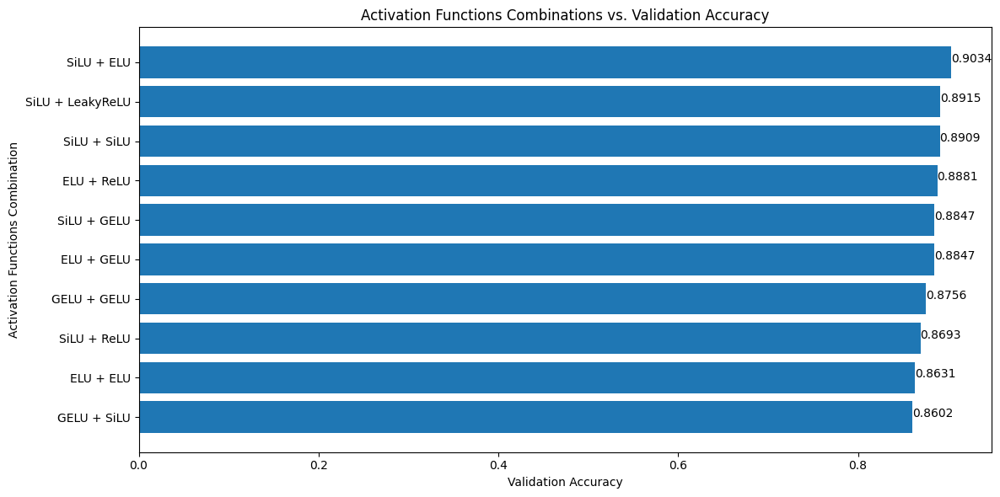

In [ ]:
# plot the results of activation functions experiment
plot_activation_function_results(activation_df)

In [ ]:
# print best performing activation functions combo
LL_best_activation_functions_names = activation_df.iloc[0]['Activation Function 1'], activation_df.iloc[0]['Activation Function 2']
print(f"Best activation functions: {LL_best_activation_functions_names}")

# convert string names to actual nn modules using getattr
LL_best_activation_functions = [getattr(nn, name)() for name in LL_best_activation_functions_names]

Best activation functions: ('SiLU', 'ELU')


Let's gather all the best hyperparameters into a configuration dictionary and proceed with training and evaluating a new model.


In [ ]:
# best configuration in a dictionary
LL_best_config = {
    'model': 'CNN_v2',
    'loss_fn': nn.CrossEntropyLoss(),
    'best_decay_value': LL_best_decay_value,
    'best_dropout_probs_combo': LL_best_dropout_probs,
    'best_hidden_units_combo': LL_best_hidden_units,
    'best_optimizer': LL_best_optimizer,
    'best_learning_rate': LL_best_learning_rate,
    'best_activation_functions': LL_best_activation_functions,
    'best_batch_size': batch_size,
    'epochs': num_epochs
}

In [ ]:
# put it all together

# create a model
LL_model_1 = CNN_v2(out_features=num_classes, hidden_units=LL_best_hidden_units, dropout_probs=LL_best_dropout_probs, activation_functions=LL_best_activation_functions).to(device)

# set loss function and optimizer
loss_fn = nn.CrossEntropyLoss()
optimizer = LL_best_optimizer(params=LL_model_1.parameters(), lr=LL_best_learning_rate, weight_decay=LL_best_decay_value)

# start training
print("Starting training...")
start_time = time.time()
LL_model_1_results = train(model=LL_model_1,
                           train_dataloader=train_dataloader_L,
                           test_dataloader=val_dataloader_L,
                           optimizer=optimizer,
                           loss_fn=loss_fn,
                           epochs=num_epochs,
                           device=device)
end_time = time.time()

# calculate and print total training time
LL_model_1_training_time = end_time - start_time
print(f"\nTotal training time: {LL_model_1_training_time:.3f} seconds")

# calculate and print total trainabale params
LL_model_1_total_params = sum(p.numel() for p in LL_model_1.parameters() if p.requires_grad)
print(f"Total trainable params: {LL_model_1_total_params}")

Starting training...


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.1141 | train_acc: 0.2262 | val_loss: 1.6663 | val_acc: 0.4114
Epoch: 2 | train_loss: 1.7904 | train_acc: 0.3628 | val_loss: 1.4414 | val_acc: 0.5511
Epoch: 3 | train_loss: 1.5209 | train_acc: 0.4786 | val_loss: 1.1897 | val_acc: 0.6449
Epoch: 4 | train_loss: 1.3281 | train_acc: 0.5591 | val_loss: 1.0842 | val_acc: 0.6682
Epoch: 5 | train_loss: 1.1030 | train_acc: 0.5969 | val_loss: 0.8443 | val_acc: 0.7324
Epoch: 6 | train_loss: 0.9436 | train_acc: 0.6626 | val_loss: 0.7199 | val_acc: 0.7415
Epoch: 7 | train_loss: 0.8603 | train_acc: 0.7100 | val_loss: 0.7376 | val_acc: 0.7636
Epoch: 8 | train_loss: 0.8256 | train_acc: 0.7044 | val_loss: 0.6926 | val_acc: 0.7574
Epoch: 9 | train_loss: 0.7196 | train_acc: 0.7485 | val_loss: 0.5933 | val_acc: 0.7949
Epoch: 10 | train_loss: 0.6756 | train_acc: 0.7693 | val_loss: 0.6595 | val_acc: 0.7858
Epoch: 11 | train_loss: 0.6529 | train_acc: 0.7716 | val_loss: 0.5589 | val_acc: 0.8381
Epoch: 12 | train_loss: 0.6169 | train_ac

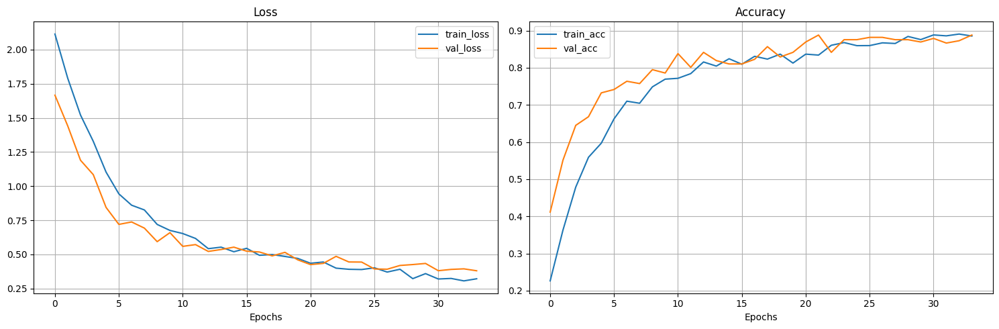

In [ ]:
# plot loss curves
plot_loss_curves(LL_model_1_results)

Despite using our optimal configuration, the model still exhibits signs of overfitting, as evidenced by the very narrow gap between the training and validation curves.

In [ ]:
# print final model's val accuracy
LL_model_1_acc = LL_model_1_results['val_acc'][-1]
print(f"Final model accuracy: {LL_model_1_acc}")

# save the LL final model 1 with best configuration found
torch.save(LL_model_1.state_dict(), os.path.join(project_models_path, 'LL_model_1.pth'))
print("Model saved to 'LL_model_1.pth'")

Final model accuracy: 0.8880681818181818
Model saved to 'LL_model_1.pth'


As slightly with no overfitting, let's take a closer look at the results using evaluation metrics such as precision, recall, and the confusion matrix.

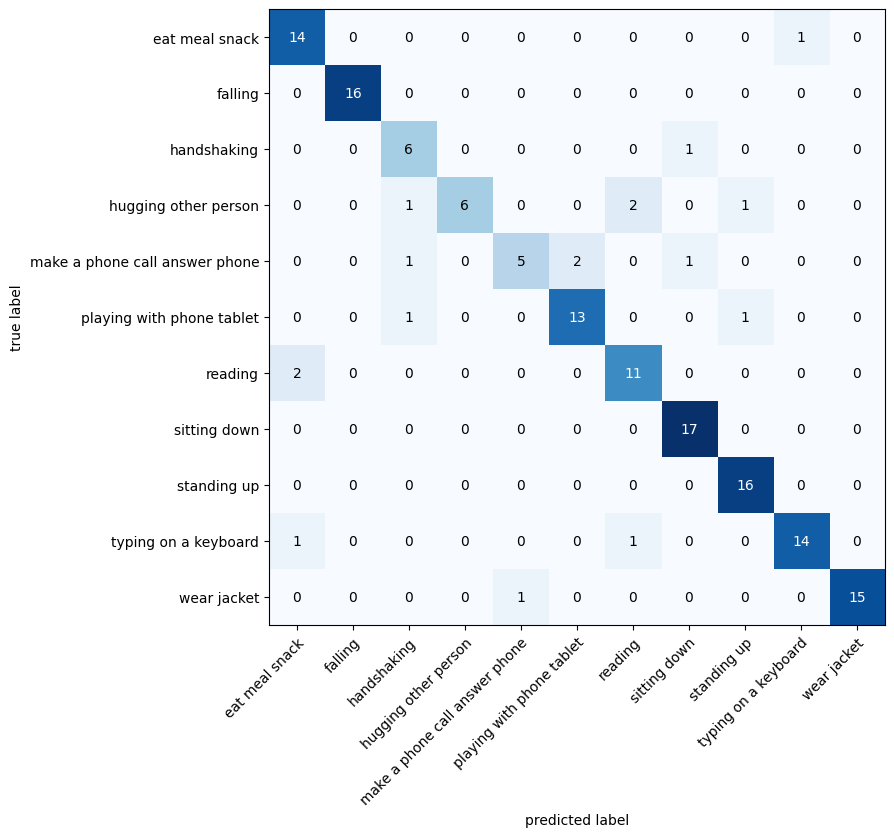

In [ ]:
# evaluation with torchmetrics

# retrieve actual and predicted labels and convert them to tensors for later process
LL_model_1_y_true = torch.tensor(LL_model_1_results['y_true'])
LL_model_1_y_pred = torch.tensor(LL_model_1_results['y_preds'])

# setup confusion matrix instance and compare predictions to targets
confmat = ConfusionMatrix(num_classes=len(class_names), task='multiclass')
confmat_tensor = confmat(LL_model_1_y_pred.clone().detach(), LL_model_1_y_true.clone().detach())

# plot the confusion matrix
fig, ax = plot_confusion_matrix(conf_mat=confmat_tensor.numpy(), class_names=class_names, figsize=(20,8));

In [ ]:
# calculate precision, recall and F1 scores using torchmetrics
precision = Precision(average='macro', num_classes=len(class_names), task='multiclass')
recall = Recall(average='macro', num_classes=len(class_names), task='multiclass')
f1 = F1Score(average='macro', num_classes=len(class_names), task='multiclass')

prec = precision(LL_model_1_y_pred, LL_model_1_y_true)
rec = recall(LL_model_1_y_pred, LL_model_1_y_true)
f1_score = f1(LL_model_1_y_pred, LL_model_1_y_true)

# print the results
print(f"Precision: {prec:.4f}\nRecall: {rec:.4f}\nF1-Score: {f1_score:.4f}")

Precision: 0.8812
Recall: 0.8610
F1-Score: 0.8618


In [ ]:
# classification report
print("Classification Report:")
print(classification_report(y_true=LL_model_1_y_true, y_pred=LL_model_1_y_pred, zero_division=1))

Classification Report:
              precision    recall  f1-score   support

           0       0.82      0.93      0.88        15
           1       1.00      1.00      1.00        16
           2       0.67      0.86      0.75         7
           3       1.00      0.60      0.75        10
           4       0.83      0.56      0.67         9
           5       0.87      0.87      0.87        15
           6       0.79      0.85      0.81        13
           7       0.89      1.00      0.94        17
           8       0.89      1.00      0.94        16
           9       0.93      0.88      0.90        16
          10       1.00      0.94      0.97        16

    accuracy                           0.89       150
   macro avg       0.88      0.86      0.86       150
weighted avg       0.89      0.89      0.88       150



A higher recall than precision indicates that while the model successfully captures most positive instances, it also tends to produce more false positives with both having very descent rates. Let's see if we can further widen the gap between the curves.


Experiment 6. Apply Cross-Validation.

Again, the same process: to perform cross-validation, we begin by combining the training and validation sets into a single dataset. Then, we use the previously trained model (LL_model_1) and apply the cross-validation technique.

In [ ]:
# experiment 6: cross validation (1)

# combine train and validation sets

# define paths
source_dirs_L = ['/content/project/data/ResActionsImagesL/train', '/content/project/data/ResActionsImagesL/validation']
destination_dir_L = '/content/project/data/ResActionsImagesL/train_val_combined'

# create the destination directory if it doesn't exist
if not os.path.exists(destination_dir_L):
  os.makedirs(destination_dir_L)

# loop over all source dirs (train, validation) in ResActionsImagesL
for source_dir in source_dirs_L:
  # loop over all class dirs
  for class_dir in os.listdir(source_dir):

    # existing class path, we will use it for copying
    class_path = os.path.join(source_dir, class_dir)

    # create class dir in destination dir if doesn't exist (this goes in case of multiple runs)
    dest_class_path = os.path.join(destination_dir_L, class_dir)
    if not os.path.exists(dest_class_path):
      os.makedirs(dest_class_path)

    # copy all files (images) from the current class of the current source
    for file in os.listdir(class_path):
      shutil.copy(os.path.join(class_path, file), os.path.join(dest_class_path, file))

# check how many dirs in the new dir (expected num_classes=11)
print(f"Total number of folders of the new dir: {len(os.listdir(destination_dir_L))}")

# find and print how many images in total the new 'train_val_combined' dir has (expected the sum of initial train and validation dirs: 1201 + 150 = 1351)
train_val_total_images_L = 0
for class_dir in os.listdir(destination_dir_L):
  class_path = os.path.join(destination_dir_L, class_dir)
  train_val_total_images_L += len(os.listdir(class_path))
print(f"Total number of images of the new dir: {train_val_total_images_L}")

Total number of folders of the new dir: 11
Total number of images of the new dir: 1351


In [ ]:
# experiment 6: cross validation (2)

# create the new dataset using ImageFolder
LL_cross_val_dataset = ImageFolder(root=destination_dir_L, transform=data_transform_L)

# retrieve best pre-trained weights from model_1
LL_model_1_weights = LL_model_1.state_dict()

# run the experiment
LL_cv_results = cross_validation(dataset=LL_cross_val_dataset,
                                 num_epochs=num_epochs,
                                 device=device,
                                 num_classes=num_classes,
                                 num_folds=num_folds,
                                 best_config=LL_best_config,
                                 num_workers=num_workers,
                                 load_weights=True,
                                 best_weights=LL_model_1_weights)

Cross-Validation training ...
Dataset size: 1351
Number of folds: 6
Fold size: 225

Fold 1/6
Loading best weights ...


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.3472 | train_acc: 0.8915 | val_loss: 0.1405 | val_acc: 0.9492
Epoch: 2 | train_loss: 0.3508 | train_acc: 0.8898 | val_loss: 0.1695 | val_acc: 0.9453
Epoch: 3 | train_loss: 0.3247 | train_acc: 0.8781 | val_loss: 0.1962 | val_acc: 0.9414
Epoch: 4 | train_loss: 0.2855 | train_acc: 0.9010 | val_loss: 0.1829 | val_acc: 0.9414
Epoch: 5 | train_loss: 0.3170 | train_acc: 0.8911 | val_loss: 0.2007 | val_acc: 0.9219
Epoch: 6 | train_loss: 0.2896 | train_acc: 0.8998 | val_loss: 0.1814 | val_acc: 0.9375
Epoch: 7 | train_loss: 0.2749 | train_acc: 0.8998 | val_loss: 0.2000 | val_acc: 0.9375
Epoch: 8 | train_loss: 0.3074 | train_acc: 0.8880 | val_loss: 0.1855 | val_acc: 0.9375
Epoch: 9 | train_loss: 0.3239 | train_acc: 0.8825 | val_loss: 0.2044 | val_acc: 0.9258
Epoch: 10 | train_loss: 0.2388 | train_acc: 0.9167 | val_loss: 0.1960 | val_acc: 0.9336
Epoch: 11 | train_loss: 0.2145 | train_acc: 0.9245 | val_loss: 0.2279 | val_acc: 0.9219
Epoch: 12 | train_loss: 0.2617 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.3713 | train_acc: 0.8660 | val_loss: 0.2186 | val_acc: 0.9336
Epoch: 2 | train_loss: 0.3228 | train_acc: 0.8724 | val_loss: 0.2023 | val_acc: 0.9336
Epoch: 3 | train_loss: 0.3240 | train_acc: 0.8976 | val_loss: 0.1796 | val_acc: 0.9531
Epoch: 4 | train_loss: 0.2868 | train_acc: 0.9071 | val_loss: 0.1959 | val_acc: 0.9375
Epoch: 5 | train_loss: 0.2789 | train_acc: 0.9010 | val_loss: 0.1718 | val_acc: 0.9492
Epoch: 6 | train_loss: 0.3054 | train_acc: 0.9019 | val_loss: 0.2159 | val_acc: 0.9336
Epoch: 7 | train_loss: 0.2788 | train_acc: 0.9010 | val_loss: 0.1860 | val_acc: 0.9492
Epoch: 8 | train_loss: 0.2860 | train_acc: 0.9028 | val_loss: 0.1937 | val_acc: 0.9414
Epoch: 9 | train_loss: 0.2440 | train_acc: 0.9085 | val_loss: 0.2129 | val_acc: 0.9453
Epoch: 10 | train_loss: 0.2656 | train_acc: 0.9097 | val_loss: 0.2320 | val_acc: 0.9219
Epoch: 11 | train_loss: 0.2606 | train_acc: 0.9062 | val_loss: 0.2004 | val_acc: 0.9336
Epoch: 12 | train_loss: 0.2085 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.3296 | train_acc: 0.8880 | val_loss: 0.1309 | val_acc: 0.9570
Epoch: 2 | train_loss: 0.3691 | train_acc: 0.8672 | val_loss: 0.1265 | val_acc: 0.9453
Epoch: 3 | train_loss: 0.3196 | train_acc: 0.8889 | val_loss: 0.1217 | val_acc: 0.9609
Epoch: 4 | train_loss: 0.2828 | train_acc: 0.9024 | val_loss: 0.1348 | val_acc: 0.9609
Epoch: 5 | train_loss: 0.3179 | train_acc: 0.8932 | val_loss: 0.1218 | val_acc: 0.9570
Epoch: 6 | train_loss: 0.3163 | train_acc: 0.8955 | val_loss: 0.1277 | val_acc: 0.9609
Epoch: 7 | train_loss: 0.2886 | train_acc: 0.9062 | val_loss: 0.1415 | val_acc: 0.9492
Epoch: 8 | train_loss: 0.2832 | train_acc: 0.8967 | val_loss: 0.1423 | val_acc: 0.9492
Epoch: 9 | train_loss: 0.3219 | train_acc: 0.9010 | val_loss: 0.1319 | val_acc: 0.9570
Epoch: 10 | train_loss: 0.2884 | train_acc: 0.8981 | val_loss: 0.1310 | val_acc: 0.9570
Epoch: 11 | train_loss: 0.2804 | train_acc: 0.9016 | val_loss: 0.1541 | val_acc: 0.9453
Epoch: 12 | train_loss: 0.2657 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.3534 | train_acc: 0.8717 | val_loss: 0.1075 | val_acc: 0.9648
Epoch: 2 | train_loss: 0.3330 | train_acc: 0.8816 | val_loss: 0.1331 | val_acc: 0.9492
Epoch: 3 | train_loss: 0.3198 | train_acc: 0.8816 | val_loss: 0.1517 | val_acc: 0.9297
Epoch: 4 | train_loss: 0.3109 | train_acc: 0.8898 | val_loss: 0.1562 | val_acc: 0.9531
Epoch: 5 | train_loss: 0.3420 | train_acc: 0.8720 | val_loss: 0.1382 | val_acc: 0.9531
Epoch: 6 | train_loss: 0.3187 | train_acc: 0.8856 | val_loss: 0.1418 | val_acc: 0.9453
Epoch: 7 | train_loss: 0.2878 | train_acc: 0.9054 | val_loss: 0.1374 | val_acc: 0.9492
Epoch: 8 | train_loss: 0.2968 | train_acc: 0.8984 | val_loss: 0.1306 | val_acc: 0.9453
Epoch: 9 | train_loss: 0.2932 | train_acc: 0.9045 | val_loss: 0.1878 | val_acc: 0.9258
Epoch: 10 | train_loss: 0.3094 | train_acc: 0.8911 | val_loss: 0.1633 | val_acc: 0.9375
Epoch: 11 | train_loss: 0.2529 | train_acc: 0.9132 | val_loss: 0.1470 | val_acc: 0.9336
Epoch: 12 | train_loss: 0.2326 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.3885 | train_acc: 0.8707 | val_loss: 0.1308 | val_acc: 0.9648
Epoch: 2 | train_loss: 0.3316 | train_acc: 0.8793 | val_loss: 0.1011 | val_acc: 0.9727
Epoch: 3 | train_loss: 0.3407 | train_acc: 0.8786 | val_loss: 0.1192 | val_acc: 0.9766
Epoch: 4 | train_loss: 0.3302 | train_acc: 0.8932 | val_loss: 0.1176 | val_acc: 0.9688
Epoch: 5 | train_loss: 0.2974 | train_acc: 0.8941 | val_loss: 0.1283 | val_acc: 0.9688
Epoch: 6 | train_loss: 0.2865 | train_acc: 0.9019 | val_loss: 0.1277 | val_acc: 0.9727
Epoch: 7 | train_loss: 0.2827 | train_acc: 0.8958 | val_loss: 0.1326 | val_acc: 0.9609
Epoch: 8 | train_loss: 0.2744 | train_acc: 0.9080 | val_loss: 0.1133 | val_acc: 0.9766
Epoch: 9 | train_loss: 0.2822 | train_acc: 0.9019 | val_loss: 0.1211 | val_acc: 0.9609
Epoch: 10 | train_loss: 0.2806 | train_acc: 0.9106 | val_loss: 0.1074 | val_acc: 0.9766
Epoch: 11 | train_loss: 0.2764 | train_acc: 0.9045 | val_loss: 0.1013 | val_acc: 0.9727
Epoch: 12 | train_loss: 0.2435 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.3220 | train_acc: 0.8845 | val_loss: 0.1639 | val_acc: 0.9531
Epoch: 2 | train_loss: 0.3452 | train_acc: 0.8778 | val_loss: 0.1837 | val_acc: 0.9453
Epoch: 3 | train_loss: 0.3534 | train_acc: 0.8755 | val_loss: 0.2134 | val_acc: 0.9336
Epoch: 4 | train_loss: 0.3574 | train_acc: 0.8724 | val_loss: 0.1831 | val_acc: 0.9336
Epoch: 5 | train_loss: 0.2638 | train_acc: 0.9028 | val_loss: 0.2285 | val_acc: 0.9297
Epoch: 6 | train_loss: 0.2714 | train_acc: 0.9149 | val_loss: 0.2043 | val_acc: 0.9375
Epoch: 7 | train_loss: 0.2853 | train_acc: 0.9045 | val_loss: 0.2308 | val_acc: 0.9297
Epoch: 8 | train_loss: 0.2987 | train_acc: 0.8981 | val_loss: 0.1966 | val_acc: 0.9375
Epoch: 9 | train_loss: 0.2512 | train_acc: 0.9123 | val_loss: 0.1944 | val_acc: 0.9453
Epoch: 10 | train_loss: 0.2316 | train_acc: 0.9102 | val_loss: 0.2233 | val_acc: 0.9297
Epoch: 11 | train_loss: 0.2669 | train_acc: 0.9076 | val_loss: 0.2321 | val_acc: 0.9141
Epoch: 12 | train_loss: 0.2638 | train_ac

In [ ]:
# retrieve all val accuracies in desc order from results dictionary along with their corresponding model's weights
LL_results_df = get_sorted_cv_results(LL_cv_results)

   Fold  Validation Accuracy  \
4     5             0.949219   
2     3             0.937500   
3     4             0.929688   
5     6             0.929688   
1     2             0.921875   
0     1             0.910156   

                                       Model Weights  
4  {'block1.0.weight': [[tensor([[ 0.0446,  0.075...  
2  {'block1.0.weight': [[tensor([[ 0.0656,  0.114...  
3  {'block1.0.weight': [[tensor([[ 0.0730,  0.101...  
5  {'block1.0.weight': [[tensor([[ 0.0581,  0.107...  
1  {'block1.0.weight': [[tensor([[ 0.0646,  0.078...  
0  {'block1.0.weight': [[tensor([[ 0.0465,  0.099...  


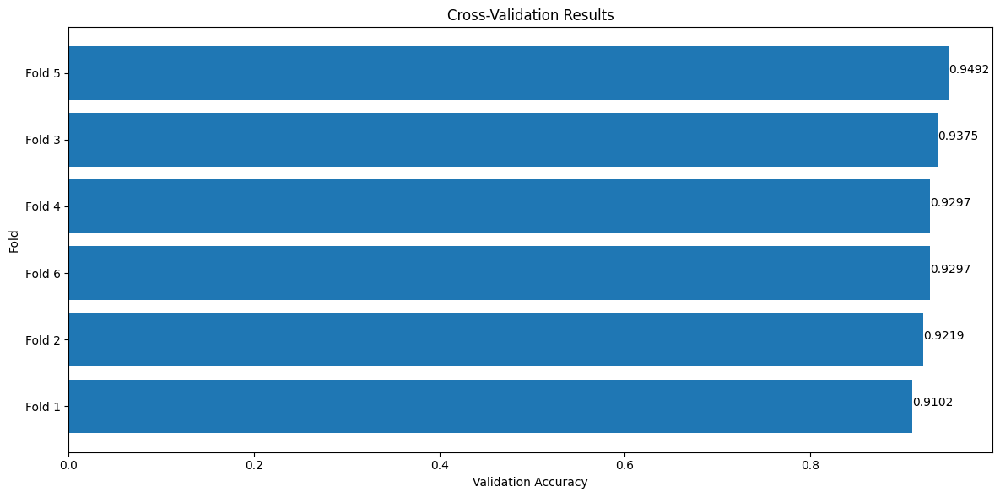

In [ ]:
# plot each fold results after cross-validation experiment
plot_cv_results(LL_results_df)

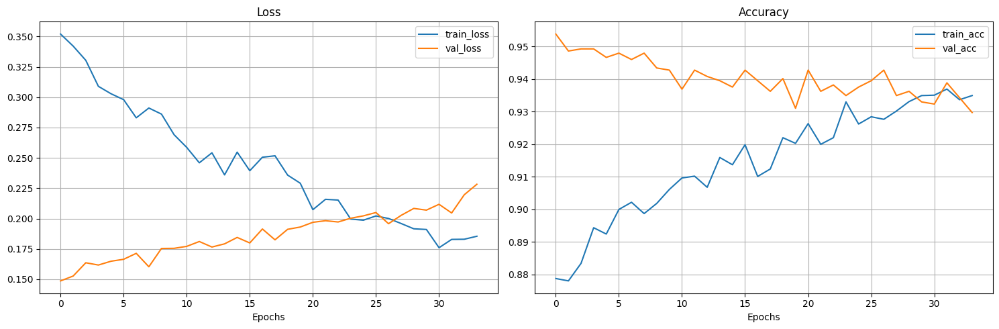

In [ ]:
# comptute and plot average cv results
LL_cv_avg_results = compute_avg_cv_results(LL_cv_results)

# plot the averaged learning curves
plot_loss_curves(LL_cv_avg_results)

The learning curves indicate potential overfitting and more measures have to be taken. We save the best performing fold's weights and move on to next trial.

In [ ]:
# retrieve best performing fold's weights
best_LL_cv_model_weights = LL_results_df.iloc[0]['Model Weights']

# retrieve best performing fold number
LL_best_fold = LL_results_df.iloc[0]['Fold']

# retrieve the corresponding results from cross validation experiment for the best case
LL_best_fold_index = max(LL_best_fold - 1, 0)
LL_model_2_results = LL_cv_results[LL_best_fold_index]

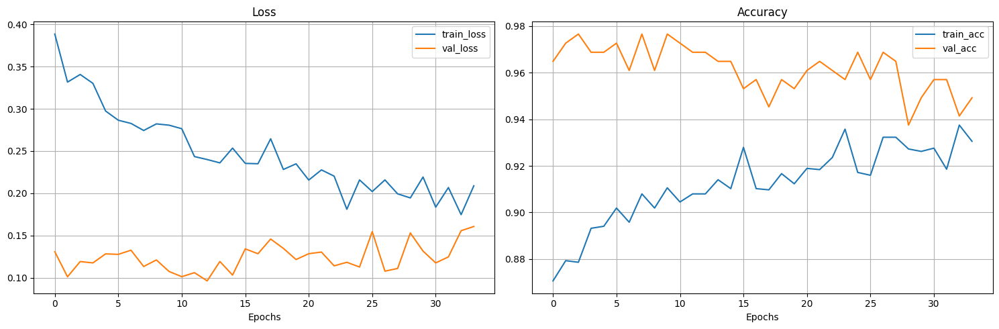

In [ ]:
# plot the curves of the model with best config
plot_loss_curves(LL_model_2_results)

In [ ]:
# before loading best weights, need to create a new instance
LL_model_2 = CNN_v2(out_features=num_classes, hidden_units=LL_best_hidden_units, dropout_probs=LL_best_dropout_probs, activation_functions=LL_best_activation_functions).to(device)

# now, load best weights
LL_model_2.load_state_dict(best_LL_cv_model_weights)

# print final model's val accuracy
LL_model_2_acc = LL_model_2_results['val_acc'][-1]
print(f"Final model accuracy: {LL_model_2_acc}")

# save the model
torch.save(LL_model_2.state_dict(), os.path.join(project_models_path, 'LL_model_2.pth'))
print("Model saved to 'LL_model_2.pth'")

Final model accuracy: 0.94921875
Model saved to 'LL_model_2.pth'


Experiment 7. Balance the dataset.

In [ ]:
# experiment 7: balanced dataset (with early stopping enabled)

# create a new instance of the model for balanced dataset
LL_model_3 = CNN_v2(out_features=num_classes, hidden_units=LL_best_hidden_units, dropout_probs=LL_best_dropout_probs, activation_functions=LL_best_activation_functions).to(device)

# load model_1 weights
LL_model_3.load_state_dict(LL_model_1.state_dict()) # (model_1)

# load best performing model (weights) so far
#LL_model_3.load_state_dict(best_LL_cv_model_weights) # (model_2)

# start training on balanced dataset
LL_model_3_results = experiment_balanced_dataset(model=LL_model_3,
                                                 train_dataloader=train_dataloader_L,
                                                 val_dataloader=val_dataloader_L,
                                                 num_epochs=num_epochs,
                                                 device=device,
                                                 best_config=LL_best_config,
                                                 class_weights=class_weights_L)

Experimenting with Balanced Dataset


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.3449 | train_acc: 0.8767 | val_loss: 0.4089 | val_acc: 0.8818
Epoch: 2 | train_loss: 0.3206 | train_acc: 0.8923 | val_loss: 0.3606 | val_acc: 0.8818
Epoch: 3 | train_loss: 0.3220 | train_acc: 0.8891 | val_loss: 0.4050 | val_acc: 0.8665
Epoch: 4 | train_loss: 0.2994 | train_acc: 0.8998 | val_loss: 0.3862 | val_acc: 0.8972
Epoch: 5 | train_loss: 0.3172 | train_acc: 0.8891 | val_loss: 0.4449 | val_acc: 0.8756
Epoch: 6 | train_loss: 0.2977 | train_acc: 0.9038 | val_loss: 0.4153 | val_acc: 0.8756
Epoch: 7 | train_loss: 0.2920 | train_acc: 0.9021 | val_loss: 0.4154 | val_acc: 0.8602
Epoch: 8 | train_loss: 0.2732 | train_acc: 0.9064 | val_loss: 0.3885 | val_acc: 0.8915
Epoch: 9 | train_loss: 0.2682 | train_acc: 0.9062 | val_loss: 0.4011 | val_acc: 0.9006
Early stopping triggered at epoch 9.
Model restored from epoch 4.

Total training time: 10.883 seconds
Total trainable params: 170507


In [ ]:
# print best epoch and its corresponding val accuracy
LL_best_epoch_bal, LL_best_val_acc_bal = print_best_epoch_and_val_acc(LL_model_3_results)

Best epoch: 4
Best validation accuracy: 0.8972


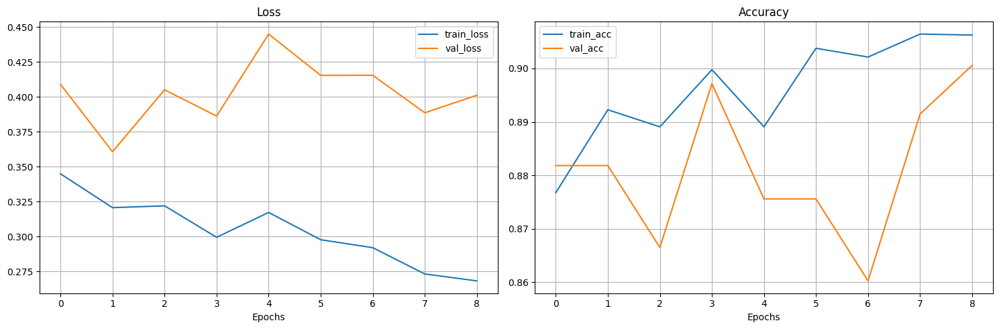

In [ ]:
# plot the results curves after balancing the dataset
plot_loss_curves(LL_model_3_results)

Balancing the dataset does not eliminates overfitting, so let's try our last experiment of data augmentation.

In [ ]:
# print final model's val accuracy
LL_model_3_acc = LL_best_val_acc_bal
print(f"Final model accuracy: {LL_model_3_acc}")

# save the model
torch.save(LL_model_3.state_dict(), os.path.join(project_models_path, 'LL_model_3.pth'))
print("Model saved to 'LL_model_3.pth'")

Final model accuracy: 0.897159090909091
Model saved to 'LL_model_3.pth'


Experiment 8. Apply data augmentation.


Here, we become more aggresive and apply TrivialAugment on the balanced dataset.

In [ ]:
# experiment 8: data augmentation (with early stopping enabled)

# create a new instance of the model for data augmentation
LL_model_4 = CNN_v2(out_features=num_classes, hidden_units=LL_best_hidden_units, dropout_probs=LL_best_dropout_probs, activation_functions=LL_best_activation_functions).to(device)

# load weights of the model_1
#LL_model_4.load_state_dict(LL_model_1.state_dict()) # (model_1)

# load weights of the model produced after cross-validation
#LL_model_4.load_state_dict(best_LL_cv_model_weights) # (model_2)

# load best performing model (weights) so far
LL_model_4.load_state_dict(LL_model_3.state_dict()) # (model_3)

# start training with data augmentation
LL_model_4_results = experiment_data_augmentation(model=LL_model_4,
                                                  train_dir=L_dataset_path/'train',
                                                  val_dataloader=val_dataloader_L,
                                                  num_epochs=num_epochs,
                                                  device=device,
                                                  best_config=LL_best_config,
                                                  class_weights=class_weights_L,
                                                  num_workers=num_workers,
                                                  mean=mean_L,
                                                  std=std_L,
                                                  is_Trivial=True)

Experimenting with Data Augmentation


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 3.8887 | train_acc: 0.4387 | val_loss: 0.5899 | val_acc: 0.8108
Epoch: 2 | train_loss: 1.8380 | train_acc: 0.4681 | val_loss: 0.5448 | val_acc: 0.7886
Epoch: 3 | train_loss: 1.7493 | train_acc: 0.4761 | val_loss: 0.5428 | val_acc: 0.8449
Epoch: 4 | train_loss: 1.6647 | train_acc: 0.4855 | val_loss: 0.5507 | val_acc: 0.8199
Epoch: 5 | train_loss: 1.6718 | train_acc: 0.4814 | val_loss: 0.5293 | val_acc: 0.8477
Epoch: 6 | train_loss: 1.6028 | train_acc: 0.4969 | val_loss: 0.5165 | val_acc: 0.8574
Epoch: 7 | train_loss: 1.5419 | train_acc: 0.4991 | val_loss: 0.4972 | val_acc: 0.8352
Epoch: 8 | train_loss: 1.5712 | train_acc: 0.4839 | val_loss: 0.5384 | val_acc: 0.8506
Epoch: 9 | train_loss: 1.5102 | train_acc: 0.5048 | val_loss: 0.5043 | val_acc: 0.8568
Epoch: 10 | train_loss: 1.5765 | train_acc: 0.4914 | val_loss: 0.4602 | val_acc: 0.8818
Epoch: 11 | train_loss: 1.5042 | train_acc: 0.5191 | val_loss: 0.5116 | val_acc: 0.8381
Epoch: 12 | train_loss: 1.4934 | train_ac

In [ ]:
# print best epoch and its corresponding val accuracy
LL_best_epoch_aug, LL_best_val_acc_aug = print_best_epoch_and_val_acc(LL_model_4_results)

Best epoch: 10
Best validation accuracy: 0.8818


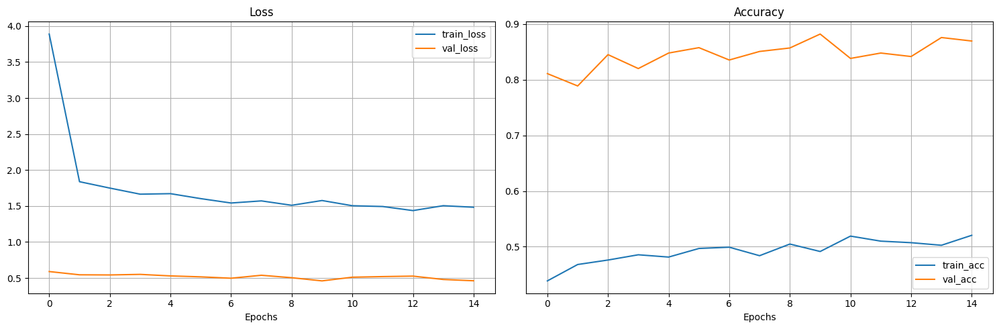

In [ ]:
# plot the results curves after data augmentation experiment
plot_loss_curves(LL_model_4_results)

And here we see the true power of data augmentation that accomplishes what all previous experiments failed to do: to eliminate overfitting while preserving strong performance.

In [ ]:
# print final model's val accuracy
LL_model_4_acc = LL_best_val_acc_aug
print(f"Final model accuracy: {LL_model_4_acc}")

# save the model
torch.save(LL_model_4.state_dict(), os.path.join(project_models_path, 'LL_model_4.pth'))
print("Model saved to 'LL_model_4.pth'")

Final model accuracy: 0.8818181818181818
Model saved to 'LL_model_4.pth'


Let's follow the protocol and select the best-performing model (model_4 in this case) as the final result.


Model LL_model_1: 0.88806818
Model LL_model_2: 0.94921875
Model LL_model_3: 0.89715909
Model LL_model_4: 0.88181818


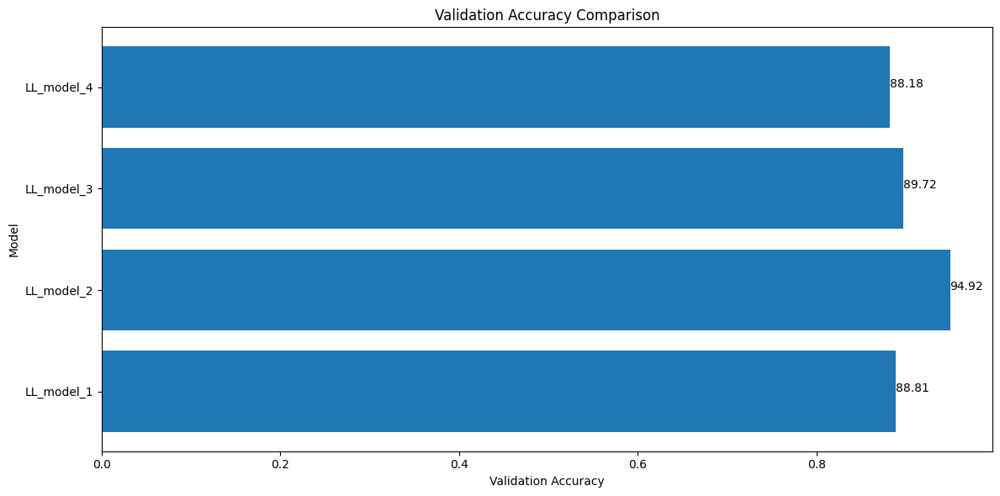

In [ ]:
# create a dataframe for comparison
compare_accs_LL = pd.DataFrame({'Model': ['LL_model_1', 'LL_model_2', 'LL_model_3', 'LL_model_4'], 'Validation Accuracy': [LL_model_1_acc, LL_model_2_acc, LL_model_3_acc, LL_model_4_acc]})

# print and plot test accuracies for all models of L / L dataset
print_and_plot_models_accuracies(compare_accs_LL)

Obviously, model 4 is our final choice for the L / L dataset.


In [ ]:
# drop all except model_4
compare_accs_LL = compare_accs_LL.iloc[[3]]
print(compare_accs_LL)

        Model  Validation Accuracy
3  LL_model_4             0.881818


In [ ]:
# save the best performing model for L / L
best_models_dict = store_best_model(compare_accs_LL, 'L / L', best_models_dict)

# print the dictionary
print("Best models dictionary:")
print(best_models_dict)
print()

# retrieve best performing model for L / L
LL_best_model = f"{best_models_dict['L / L']['Model']}.pth"
#print(LL_best_model)

# initiate a model instance
LL_final_model = CNN_v2(out_features=num_classes, hidden_units=LL_best_hidden_units, dropout_probs=LL_best_dropout_probs, activation_functions=LL_best_activation_functions).to(device)

# load best weights
LL_final_model.load_state_dict(torch.load(os.path.join(project_models_path, LL_best_model)))

# put it on device
LL_final_model = LL_final_model.to(device)

# and evaluate on test set
LL_test_results = eval_model(model=LL_final_model,
                             dataloader=test_dataloader_L,
                             loss_fn=LL_best_config['loss_fn'], # nn.CrossEntropyLoss(weight=class_weights_R)
                             device=device)
print(f"Test accuracy for {LL_best_model}: {LL_test_results['test_acc']:.4f}")

# save the test results to the dictionary
final_test_accuracies_dict['L / L'] = LL_test_results['test_acc']

Best models dictionary:
{'M / M': {'Model': 'MM_model_4', 'Validation Accuracy': 0.9039772727272727}, 'R / R': {'Model': 'RR_model_3', 'Validation Accuracy': 0.8852272727272726}, 'L / L': {'Model': 'LL_model_4', 'Validation Accuracy': 0.8818181818181818}}



  0%|          | 0/5 [00:00<?, ?it/s]

Test accuracy for LL_model_4.pth: 0.8264


### Experiments on M, R / L.

We start by creating dataloaders for MR / L dataset.

In [ ]:
# create dataloaders
train_dataloader_MR, val_dataloader_MR, test_dataloader_L_full = create_combined_dataloaders(MR_dataset_path/'train', MR_dataset_path/'validation', test_L_dataset_path/'test', data_transform_MR, data_transform_L, batch_size, num_workers)
print("Dataloaders created successfully!")

Dataloaders created successfully!


We train and evaluate the MR / L baseline model.

In [ ]:
# train the MR baseline model

# create the model
MR_model_0 = CNN(in_features=num_channels, out_features=num_classes, hidden_units=init_hidden_units).to(device)

# setup loss function and optimizer
loss_fn = nn.CrossEntropyLoss()
optimizer = torch.optim.RMSprop(params=MR_model_0.parameters(), lr=0.001)

# start training
print("Starting training...")
start_time = time.time()
MR_model_0_results = train(model=MR_model_0,
                           train_dataloader=train_dataloader_MR,
                           test_dataloader=val_dataloader_MR,
                           optimizer=optimizer,
                           loss_fn=loss_fn,
                           epochs=num_epochs,
                           device=device)
end_time = time.time()

# calculate and print total training time
MR_total_training_time = end_time - start_time
print(f"\nTotal training time: {MR_total_training_time:.3f} seconds")

# calculate and print total trainabla params
MR_total_params = sum(p.numel() for p in MR_model_0.parameters())
print(f"Total number of trainable parameters: {MR_total_params}")

Starting training...


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.6927 | train_acc: 0.4206 | val_loss: 1.0970 | val_acc: 0.6150
Epoch: 2 | train_loss: 0.7527 | train_acc: 0.7420 | val_loss: 0.5388 | val_acc: 0.8109
Epoch: 3 | train_loss: 0.4858 | train_acc: 0.8371 | val_loss: 0.3661 | val_acc: 0.8670
Epoch: 4 | train_loss: 0.3889 | train_acc: 0.8729 | val_loss: 0.2772 | val_acc: 0.9031
Epoch: 5 | train_loss: 0.2887 | train_acc: 0.8982 | val_loss: 0.1846 | val_acc: 0.9469
Epoch: 6 | train_loss: 0.2351 | train_acc: 0.9232 | val_loss: 0.1625 | val_acc: 0.9516
Epoch: 7 | train_loss: 0.1721 | train_acc: 0.9444 | val_loss: 0.1555 | val_acc: 0.9422
Epoch: 8 | train_loss: 0.1463 | train_acc: 0.9500 | val_loss: 0.1496 | val_acc: 0.9437
Epoch: 9 | train_loss: 0.1216 | train_acc: 0.9634 | val_loss: 0.1998 | val_acc: 0.9281
Epoch: 10 | train_loss: 0.0883 | train_acc: 0.9689 | val_loss: 0.1301 | val_acc: 0.9578
Epoch: 11 | train_loss: 0.0684 | train_acc: 0.9812 | val_loss: 0.0467 | val_acc: 0.9844
Epoch: 12 | train_loss: 0.1077 | train_ac

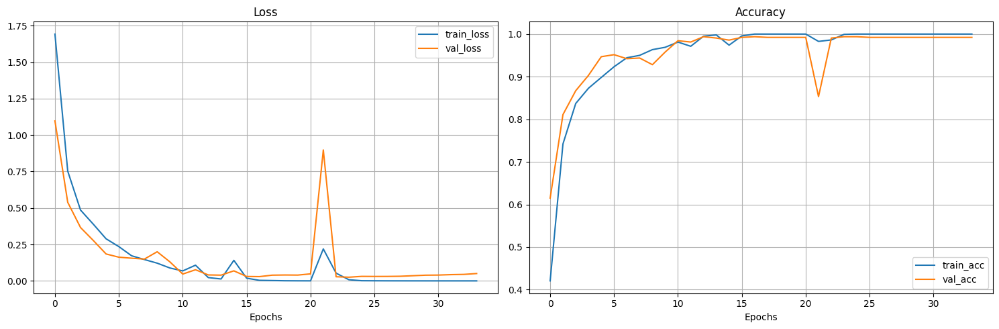

In [ ]:
# plot learning curves
plot_loss_curves(MR_model_0_results)

In [ ]:
# compute generalization gap
dif=compute_generalization_gap(MR_model_0_results)

Generalization gap (train acc - val acc): 0.0078


As observed both numerically and graphically, the baseline model for the MR / L dataset does show overfitting, although the gap between train and validation curves is much smaller compared to previous cases.

Another significant and expected outcome across all combined datasets is an increase in training time,as it is observed here as well as in all subsequent training scenarios for all combined datasets.

In [ ]:
# save the model
torch.save(MR_model_0.state_dict(), os.path.join(project_models_path, 'MR_model_0.pth'))
print("Model saved to 'MR_model_0.pth'")

Model saved to 'MR_model_0.pth'


Experiment 1. Apply L2 regularization.

In [ ]:
# experiment 1: L2 reg
MR_model_L2_results = experiment_l2_regularization(train_dataloader=train_dataloader_MR,
                                                   val_dataloader=val_dataloader_MR,
                                                   num_epochs=num_epochs,
                                                   device=device,
                                                   weight_decay_values_list=weight_decay_values_list,
                                                   num_channels=num_channels,
                                                   num_classes=num_classes,
                                                   init_hidden_units=init_hidden_units)

Experimenting with L2 Regularization
Weight decay values to try: [0.01, 0.001, 0.0001, 1e-05, 1e-06]

Testing with weight decay: 0.01


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.6746 | train_acc: 0.4159 | val_loss: 1.4386 | val_acc: 0.5386
Epoch: 2 | train_loss: 0.9799 | train_acc: 0.6721 | val_loss: 0.9681 | val_acc: 0.6641
Epoch: 3 | train_loss: 0.7393 | train_acc: 0.7640 | val_loss: 0.6125 | val_acc: 0.7922
Epoch: 4 | train_loss: 0.6011 | train_acc: 0.7985 | val_loss: 0.6087 | val_acc: 0.7900
Epoch: 5 | train_loss: 0.4822 | train_acc: 0.8364 | val_loss: 0.4712 | val_acc: 0.8167
Epoch: 6 | train_loss: 0.3948 | train_acc: 0.8677 | val_loss: 0.3826 | val_acc: 0.8625
Epoch: 7 | train_loss: 0.3542 | train_acc: 0.8840 | val_loss: 0.3498 | val_acc: 0.8938
Epoch: 8 | train_loss: 0.2989 | train_acc: 0.9031 | val_loss: 0.2648 | val_acc: 0.9139
Epoch: 9 | train_loss: 0.2828 | train_acc: 0.9037 | val_loss: 0.2714 | val_acc: 0.8984
Epoch: 10 | train_loss: 0.2592 | train_acc: 0.9101 | val_loss: 0.2423 | val_acc: 0.9094
Epoch: 11 | train_loss: 0.2588 | train_acc: 0.9070 | val_loss: 0.1738 | val_acc: 0.9484
Epoch: 12 | train_loss: 0.2100 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.5367 | train_acc: 0.4650 | val_loss: 0.9479 | val_acc: 0.6719
Epoch: 2 | train_loss: 0.8054 | train_acc: 0.7361 | val_loss: 0.6877 | val_acc: 0.7672
Epoch: 3 | train_loss: 0.5991 | train_acc: 0.8025 | val_loss: 0.4690 | val_acc: 0.8453
Epoch: 4 | train_loss: 0.4147 | train_acc: 0.8621 | val_loss: 0.2328 | val_acc: 0.9297
Epoch: 5 | train_loss: 0.2956 | train_acc: 0.9021 | val_loss: 0.2818 | val_acc: 0.8906
Epoch: 6 | train_loss: 0.2497 | train_acc: 0.9163 | val_loss: 0.1638 | val_acc: 0.9422
Epoch: 7 | train_loss: 0.1915 | train_acc: 0.9270 | val_loss: 0.1790 | val_acc: 0.9313
Epoch: 8 | train_loss: 0.2197 | train_acc: 0.9351 | val_loss: 0.1005 | val_acc: 0.9672
Epoch: 9 | train_loss: 0.1269 | train_acc: 0.9520 | val_loss: 0.2614 | val_acc: 0.9141
Epoch: 10 | train_loss: 0.1285 | train_acc: 0.9567 | val_loss: 0.1362 | val_acc: 0.9500
Epoch: 11 | train_loss: 0.0930 | train_acc: 0.9688 | val_loss: 0.0592 | val_acc: 0.9812
Epoch: 12 | train_loss: 0.1284 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.5464 | train_acc: 0.4780 | val_loss: 0.8147 | val_acc: 0.7514
Epoch: 2 | train_loss: 0.6386 | train_acc: 0.7858 | val_loss: 0.4237 | val_acc: 0.8686
Epoch: 3 | train_loss: 0.3913 | train_acc: 0.8643 | val_loss: 0.2904 | val_acc: 0.9044
Epoch: 4 | train_loss: 0.2828 | train_acc: 0.9049 | val_loss: 0.2159 | val_acc: 0.9141
Epoch: 5 | train_loss: 0.1990 | train_acc: 0.9279 | val_loss: 0.1489 | val_acc: 0.9500
Epoch: 6 | train_loss: 0.1621 | train_acc: 0.9474 | val_loss: 0.1080 | val_acc: 0.9656
Epoch: 7 | train_loss: 0.1242 | train_acc: 0.9563 | val_loss: 0.0752 | val_acc: 0.9766
Epoch: 8 | train_loss: 0.0918 | train_acc: 0.9676 | val_loss: 0.1208 | val_acc: 0.9516
Epoch: 9 | train_loss: 0.1019 | train_acc: 0.9701 | val_loss: 0.0841 | val_acc: 0.9703
Epoch: 10 | train_loss: 0.0428 | train_acc: 0.9859 | val_loss: 0.0370 | val_acc: 0.9906
Epoch: 11 | train_loss: 0.0705 | train_acc: 0.9782 | val_loss: 0.0398 | val_acc: 0.9875
Epoch: 12 | train_loss: 0.0206 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.4986 | train_acc: 0.5068 | val_loss: 1.0053 | val_acc: 0.6614
Epoch: 2 | train_loss: 0.7364 | train_acc: 0.7531 | val_loss: 0.6328 | val_acc: 0.7703
Epoch: 3 | train_loss: 0.4823 | train_acc: 0.8342 | val_loss: 0.3649 | val_acc: 0.8592
Epoch: 4 | train_loss: 0.3322 | train_acc: 0.8773 | val_loss: 0.3581 | val_acc: 0.8684
Epoch: 5 | train_loss: 0.2615 | train_acc: 0.9085 | val_loss: 0.1973 | val_acc: 0.9375
Epoch: 6 | train_loss: 0.2020 | train_acc: 0.9288 | val_loss: 0.1916 | val_acc: 0.9281
Epoch: 7 | train_loss: 0.1552 | train_acc: 0.9432 | val_loss: 0.1066 | val_acc: 0.9625
Epoch: 8 | train_loss: 0.1259 | train_acc: 0.9533 | val_loss: 0.1335 | val_acc: 0.9469
Epoch: 9 | train_loss: 0.2074 | train_acc: 0.9461 | val_loss: 0.2696 | val_acc: 0.9156
Epoch: 10 | train_loss: 0.0759 | train_acc: 0.9783 | val_loss: 0.1073 | val_acc: 0.9563
Epoch: 11 | train_loss: 0.0458 | train_acc: 0.9846 | val_loss: 0.1134 | val_acc: 0.9563
Epoch: 12 | train_loss: 0.0820 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.6614 | train_acc: 0.4554 | val_loss: 1.0569 | val_acc: 0.6403
Epoch: 2 | train_loss: 0.8358 | train_acc: 0.7193 | val_loss: 0.7553 | val_acc: 0.7375
Epoch: 3 | train_loss: 0.5356 | train_acc: 0.8174 | val_loss: 0.4097 | val_acc: 0.8562
Epoch: 4 | train_loss: 0.3963 | train_acc: 0.8717 | val_loss: 0.3719 | val_acc: 0.8781
Epoch: 5 | train_loss: 0.2903 | train_acc: 0.9053 | val_loss: 0.5320 | val_acc: 0.8327
Epoch: 6 | train_loss: 0.2523 | train_acc: 0.9160 | val_loss: 0.2033 | val_acc: 0.9344
Epoch: 7 | train_loss: 0.2089 | train_acc: 0.9278 | val_loss: 0.5286 | val_acc: 0.8150
Epoch: 8 | train_loss: 0.1941 | train_acc: 0.9364 | val_loss: 0.1700 | val_acc: 0.9453
Epoch: 9 | train_loss: 0.1346 | train_acc: 0.9535 | val_loss: 0.1004 | val_acc: 0.9656
Epoch: 10 | train_loss: 0.0967 | train_acc: 0.9659 | val_loss: 0.1571 | val_acc: 0.9391
Epoch: 11 | train_loss: 0.1162 | train_acc: 0.9647 | val_loss: 0.0614 | val_acc: 0.9844
Epoch: 12 | train_loss: 0.0696 | train_ac

In [ ]:
# identify and print the best decay value based on the generalization gap
MR_best_decay_value, MR_min_diff_l2 = compute_multi_generalization_gaps(MR_model_L2_results)

Difference between train and val acc for 0.01: -0.0142
Difference between train and val acc for 0.001: 0.0023
Difference between train and val acc for 0.0001: 0.0031
Difference between train and val acc for 1e-05: 0.0062
Difference between train and val acc for 1e-06: 0.0078

The best (smallest) generalization gap is for 0.01 and is -0.0142


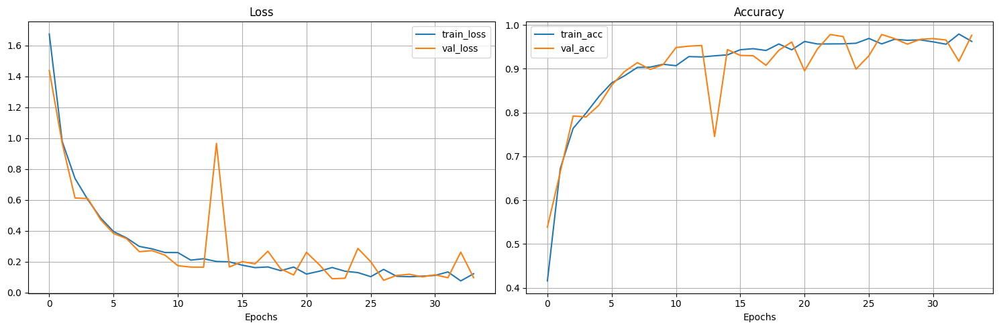

In [ ]:
# plot loss curves
plot_loss_curves(MR_model_L2_results[MR_best_decay_value])

The training and validation curves remain very close, with a slight  improve than the baseline model. Let's proceed with experimenting with dropout layers to further widen the gap.

Experiment 2. Apply dropout regularization layers.

In [ ]:
# experiment 2: dropout layers
MR_model_dropout_results = experiment_dropout_regularization(train_dataloader=train_dataloader_MR,
                                                             val_dataloader=val_dataloader_MR,
                                                             num_epochs=num_epochs,
                                                             device=device,
                                                             num_classes=num_classes,
                                                             best_decay_value=MR_best_decay_value,
                                                             dropout_probs_combos_list=dropout_probs_combos_list)

Experimenting with Dropout Regularization Layers
Dropout probabilities to try: [0.1, 0.3, 0.5, 0.6, 0.7, 0.9]
Total number of combinations to ideally try: 1296

Some possible 'good' combinations to try: [[0.5, 0.5, 0.5, 0.5], [0.5, 0.5, 0.4, 0.5], [0.5, 0.4, 0.5, 0.5], [0.5, 0.4, 0.4, 0.5], [0.5, 0.5, 0.5, 0.4], [0.4, 0.5, 0.5, 0.5], [0.4, 0.5, 0.5, 0.4], [0.5, 0.5, 0.5, 0.7], [0.8, 0.5, 0.5, 0.5], [0.8, 0.7, 0.7, 0.6], [0.8, 0.8, 0.7, 0.5], [0.8, 0.5, 0.7, 0.5], [0.6, 0.5, 0.5, 0.5], [0.5, 0.6, 0.6, 0.5], [0.7, 0.6, 0.5, 0.5]]

Testing with conv_dropout_prob: [0.5, 0.5, 0.5] and classifier dropout probability: 0.5


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.9241 | train_acc: 0.3243 | val_loss: 1.5286 | val_acc: 0.4467
Epoch: 2 | train_loss: 1.5489 | train_acc: 0.4702 | val_loss: 1.4921 | val_acc: 0.4962
Epoch: 3 | train_loss: 1.3820 | train_acc: 0.5578 | val_loss: 1.1652 | val_acc: 0.6406
Epoch: 4 | train_loss: 1.2782 | train_acc: 0.5696 | val_loss: 1.0025 | val_acc: 0.6839
Epoch: 5 | train_loss: 1.1660 | train_acc: 0.6103 | val_loss: 1.4805 | val_acc: 0.4590
Epoch: 6 | train_loss: 1.0843 | train_acc: 0.6415 | val_loss: 1.0938 | val_acc: 0.6286
Epoch: 7 | train_loss: 1.0143 | train_acc: 0.6632 | val_loss: 0.7654 | val_acc: 0.7514
Epoch: 8 | train_loss: 0.9573 | train_acc: 0.6827 | val_loss: 0.8471 | val_acc: 0.7059
Epoch: 9 | train_loss: 0.9346 | train_acc: 0.6794 | val_loss: 0.7231 | val_acc: 0.7457
Epoch: 10 | train_loss: 0.9247 | train_acc: 0.6893 | val_loss: 0.8122 | val_acc: 0.7207
Epoch: 11 | train_loss: 0.8961 | train_acc: 0.6960 | val_loss: 0.6536 | val_acc: 0.8105
Epoch: 12 | train_loss: 0.8675 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.8796 | train_acc: 0.3193 | val_loss: 1.4638 | val_acc: 0.4672
Epoch: 2 | train_loss: 1.5171 | train_acc: 0.4911 | val_loss: 1.3660 | val_acc: 0.5341
Epoch: 3 | train_loss: 1.3780 | train_acc: 0.5440 | val_loss: 1.3441 | val_acc: 0.5169
Epoch: 4 | train_loss: 1.2456 | train_acc: 0.5922 | val_loss: 1.4252 | val_acc: 0.4644
Epoch: 5 | train_loss: 1.1489 | train_acc: 0.6221 | val_loss: 1.0797 | val_acc: 0.6348
Epoch: 6 | train_loss: 1.0818 | train_acc: 0.6436 | val_loss: 0.9813 | val_acc: 0.6776
Epoch: 7 | train_loss: 1.0328 | train_acc: 0.6497 | val_loss: 0.9344 | val_acc: 0.6817
Epoch: 8 | train_loss: 0.9730 | train_acc: 0.6771 | val_loss: 0.8288 | val_acc: 0.7259
Epoch: 9 | train_loss: 0.9591 | train_acc: 0.6789 | val_loss: 0.8244 | val_acc: 0.7556
Epoch: 10 | train_loss: 0.9155 | train_acc: 0.6953 | val_loss: 0.7412 | val_acc: 0.7711
Epoch: 11 | train_loss: 0.8719 | train_acc: 0.7083 | val_loss: 0.7197 | val_acc: 0.7554
Epoch: 12 | train_loss: 0.8615 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.9107 | train_acc: 0.3130 | val_loss: 1.4094 | val_acc: 0.5436
Epoch: 2 | train_loss: 1.4959 | train_acc: 0.5071 | val_loss: 1.2355 | val_acc: 0.6200
Epoch: 3 | train_loss: 1.3282 | train_acc: 0.5610 | val_loss: 1.1239 | val_acc: 0.6403
Epoch: 4 | train_loss: 1.1853 | train_acc: 0.6111 | val_loss: 0.9706 | val_acc: 0.6922
Epoch: 5 | train_loss: 1.1010 | train_acc: 0.6367 | val_loss: 1.0070 | val_acc: 0.6573
Epoch: 6 | train_loss: 1.0395 | train_acc: 0.6540 | val_loss: 0.9060 | val_acc: 0.7105
Epoch: 7 | train_loss: 0.9803 | train_acc: 0.6714 | val_loss: 0.8243 | val_acc: 0.7184
Epoch: 8 | train_loss: 0.9246 | train_acc: 0.6896 | val_loss: 0.9743 | val_acc: 0.6541
Epoch: 9 | train_loss: 0.9101 | train_acc: 0.6962 | val_loss: 0.7785 | val_acc: 0.7589
Epoch: 10 | train_loss: 0.9000 | train_acc: 0.6988 | val_loss: 1.0364 | val_acc: 0.6529
Epoch: 11 | train_loss: 0.8699 | train_acc: 0.7068 | val_loss: 0.7441 | val_acc: 0.7669
Epoch: 12 | train_loss: 0.8346 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.8533 | train_acc: 0.3533 | val_loss: 1.3482 | val_acc: 0.5258
Epoch: 2 | train_loss: 1.4118 | train_acc: 0.5258 | val_loss: 1.0613 | val_acc: 0.6359
Epoch: 3 | train_loss: 1.2267 | train_acc: 0.5890 | val_loss: 0.9171 | val_acc: 0.7141
Epoch: 4 | train_loss: 1.1375 | train_acc: 0.6320 | val_loss: 0.8286 | val_acc: 0.7467
Epoch: 5 | train_loss: 1.0580 | train_acc: 0.6570 | val_loss: 0.9739 | val_acc: 0.6928
Epoch: 6 | train_loss: 0.9890 | train_acc: 0.6839 | val_loss: 0.8366 | val_acc: 0.7409
Epoch: 7 | train_loss: 0.9416 | train_acc: 0.6883 | val_loss: 1.2156 | val_acc: 0.5718
Epoch: 8 | train_loss: 0.9038 | train_acc: 0.6986 | val_loss: 0.7121 | val_acc: 0.7545
Epoch: 9 | train_loss: 0.8855 | train_acc: 0.7180 | val_loss: 0.6859 | val_acc: 0.7936
Epoch: 10 | train_loss: 0.8384 | train_acc: 0.7269 | val_loss: 0.6334 | val_acc: 0.7952
Epoch: 11 | train_loss: 0.8321 | train_acc: 0.7338 | val_loss: 0.7238 | val_acc: 0.7887
Epoch: 12 | train_loss: 0.8280 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.9671 | train_acc: 0.3219 | val_loss: 1.7972 | val_acc: 0.3481
Epoch: 2 | train_loss: 1.5656 | train_acc: 0.4711 | val_loss: 1.6496 | val_acc: 0.3615
Epoch: 3 | train_loss: 1.4097 | train_acc: 0.5258 | val_loss: 1.1844 | val_acc: 0.6181
Epoch: 4 | train_loss: 1.3261 | train_acc: 0.5622 | val_loss: 1.3163 | val_acc: 0.5216
Epoch: 5 | train_loss: 1.2221 | train_acc: 0.6058 | val_loss: 1.0241 | val_acc: 0.6609
Epoch: 6 | train_loss: 1.1500 | train_acc: 0.6151 | val_loss: 1.1567 | val_acc: 0.5881
Epoch: 7 | train_loss: 1.0654 | train_acc: 0.6530 | val_loss: 1.0025 | val_acc: 0.6539
Epoch: 8 | train_loss: 1.0145 | train_acc: 0.6643 | val_loss: 0.8368 | val_acc: 0.7197
Epoch: 9 | train_loss: 0.9564 | train_acc: 0.6792 | val_loss: 0.8943 | val_acc: 0.6903
Epoch: 10 | train_loss: 0.9226 | train_acc: 0.6951 | val_loss: 0.7415 | val_acc: 0.7684
Epoch: 11 | train_loss: 0.9166 | train_acc: 0.7002 | val_loss: 0.8556 | val_acc: 0.6998
Epoch: 12 | train_loss: 0.8964 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.9548 | train_acc: 0.3140 | val_loss: 1.6115 | val_acc: 0.4558
Epoch: 2 | train_loss: 1.5562 | train_acc: 0.4682 | val_loss: 1.3291 | val_acc: 0.5384
Epoch: 3 | train_loss: 1.3484 | train_acc: 0.5465 | val_loss: 1.1059 | val_acc: 0.6336
Epoch: 4 | train_loss: 1.2472 | train_acc: 0.5838 | val_loss: 0.9778 | val_acc: 0.6928
Epoch: 5 | train_loss: 1.1292 | train_acc: 0.6279 | val_loss: 0.8787 | val_acc: 0.7109
Epoch: 6 | train_loss: 1.0532 | train_acc: 0.6420 | val_loss: 0.8031 | val_acc: 0.7422
Epoch: 7 | train_loss: 0.9843 | train_acc: 0.6701 | val_loss: 0.7849 | val_acc: 0.7403
Epoch: 8 | train_loss: 0.9465 | train_acc: 0.6723 | val_loss: 0.8043 | val_acc: 0.7141
Epoch: 9 | train_loss: 0.8761 | train_acc: 0.6987 | val_loss: 0.6410 | val_acc: 0.8014
Epoch: 10 | train_loss: 0.8351 | train_acc: 0.7056 | val_loss: 0.6317 | val_acc: 0.8078
Epoch: 11 | train_loss: 0.8058 | train_acc: 0.7338 | val_loss: 0.6027 | val_acc: 0.8230
Epoch: 12 | train_loss: 0.7849 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.9657 | train_acc: 0.3045 | val_loss: 1.4390 | val_acc: 0.5203
Epoch: 2 | train_loss: 1.5380 | train_acc: 0.4818 | val_loss: 1.4359 | val_acc: 0.4780
Epoch: 3 | train_loss: 1.3455 | train_acc: 0.5554 | val_loss: 0.9872 | val_acc: 0.6891
Epoch: 4 | train_loss: 1.1803 | train_acc: 0.6150 | val_loss: 0.8892 | val_acc: 0.7139
Epoch: 5 | train_loss: 1.0847 | train_acc: 0.6517 | val_loss: 0.8394 | val_acc: 0.7202
Epoch: 6 | train_loss: 1.0256 | train_acc: 0.6627 | val_loss: 0.8937 | val_acc: 0.6980
Epoch: 7 | train_loss: 0.9686 | train_acc: 0.6812 | val_loss: 0.8011 | val_acc: 0.7276
Epoch: 8 | train_loss: 0.9201 | train_acc: 0.6976 | val_loss: 0.7037 | val_acc: 0.7609
Epoch: 9 | train_loss: 0.8821 | train_acc: 0.7056 | val_loss: 0.5840 | val_acc: 0.8266
Epoch: 10 | train_loss: 0.8541 | train_acc: 0.7197 | val_loss: 0.6172 | val_acc: 0.8077
Epoch: 11 | train_loss: 0.8385 | train_acc: 0.7239 | val_loss: 0.6845 | val_acc: 0.7641
Epoch: 12 | train_loss: 0.8251 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.9837 | train_acc: 0.2763 | val_loss: 1.8299 | val_acc: 0.3318
Epoch: 2 | train_loss: 1.6383 | train_acc: 0.4272 | val_loss: 1.4060 | val_acc: 0.5280
Epoch: 3 | train_loss: 1.4678 | train_acc: 0.5138 | val_loss: 1.2409 | val_acc: 0.6164
Epoch: 4 | train_loss: 1.3874 | train_acc: 0.5492 | val_loss: 1.2568 | val_acc: 0.5978
Epoch: 5 | train_loss: 1.2709 | train_acc: 0.5759 | val_loss: 1.2579 | val_acc: 0.5761
Epoch: 6 | train_loss: 1.2232 | train_acc: 0.5910 | val_loss: 1.0535 | val_acc: 0.6509
Epoch: 7 | train_loss: 1.1644 | train_acc: 0.6235 | val_loss: 1.1099 | val_acc: 0.6353
Epoch: 8 | train_loss: 1.1224 | train_acc: 0.6240 | val_loss: 1.0749 | val_acc: 0.6459
Epoch: 9 | train_loss: 1.0585 | train_acc: 0.6526 | val_loss: 1.1070 | val_acc: 0.6218
Epoch: 10 | train_loss: 1.0495 | train_acc: 0.6480 | val_loss: 1.0183 | val_acc: 0.6681
Epoch: 11 | train_loss: 1.0243 | train_acc: 0.6572 | val_loss: 0.9250 | val_acc: 0.6917
Epoch: 12 | train_loss: 0.9887 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.0178 | train_acc: 0.3009 | val_loss: 3.0540 | val_acc: 0.1172
Epoch: 2 | train_loss: 1.7152 | train_acc: 0.4075 | val_loss: 2.9639 | val_acc: 0.1172
Epoch: 3 | train_loss: 1.6219 | train_acc: 0.4461 | val_loss: 2.3563 | val_acc: 0.1470
Epoch: 4 | train_loss: 1.5308 | train_acc: 0.4948 | val_loss: 3.1631 | val_acc: 0.1219
Epoch: 5 | train_loss: 1.5133 | train_acc: 0.5023 | val_loss: 3.1640 | val_acc: 0.1219
Epoch: 6 | train_loss: 1.4578 | train_acc: 0.5171 | val_loss: 2.9687 | val_acc: 0.1234
Epoch: 7 | train_loss: 1.4135 | train_acc: 0.5299 | val_loss: 3.3129 | val_acc: 0.1219
Epoch: 8 | train_loss: 1.3964 | train_acc: 0.5280 | val_loss: 2.7755 | val_acc: 0.1328
Epoch: 9 | train_loss: 1.3325 | train_acc: 0.5630 | val_loss: 3.9827 | val_acc: 0.1172
Epoch: 10 | train_loss: 1.3223 | train_acc: 0.5638 | val_loss: 2.8350 | val_acc: 0.1297
Epoch: 11 | train_loss: 1.2672 | train_acc: 0.5805 | val_loss: 2.3451 | val_acc: 0.1992
Epoch: 12 | train_loss: 1.2772 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.1492 | train_acc: 0.2586 | val_loss: 2.5903 | val_acc: 0.1172
Epoch: 2 | train_loss: 1.8809 | train_acc: 0.3397 | val_loss: 2.6794 | val_acc: 0.1187
Epoch: 3 | train_loss: 1.7933 | train_acc: 0.3691 | val_loss: 2.8284 | val_acc: 0.1187
Epoch: 4 | train_loss: 1.7442 | train_acc: 0.4145 | val_loss: 2.9506 | val_acc: 0.1172
Epoch: 5 | train_loss: 1.7277 | train_acc: 0.4150 | val_loss: 2.7462 | val_acc: 0.1187
Epoch: 6 | train_loss: 1.6782 | train_acc: 0.4289 | val_loss: 2.8284 | val_acc: 0.1187
Epoch: 7 | train_loss: 1.6732 | train_acc: 0.4465 | val_loss: 3.0666 | val_acc: 0.1172
Epoch: 8 | train_loss: 1.6531 | train_acc: 0.4457 | val_loss: 3.0068 | val_acc: 0.1172
Epoch: 9 | train_loss: 1.6335 | train_acc: 0.4540 | val_loss: 2.9424 | val_acc: 0.1187
Epoch: 10 | train_loss: 1.6197 | train_acc: 0.4590 | val_loss: 2.5230 | val_acc: 0.1266
Epoch: 11 | train_loss: 1.6094 | train_acc: 0.4637 | val_loss: 2.5904 | val_acc: 0.1234
Epoch: 12 | train_loss: 1.5874 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.1972 | train_acc: 0.2277 | val_loss: 2.5650 | val_acc: 0.1172
Epoch: 2 | train_loss: 1.8845 | train_acc: 0.3386 | val_loss: 2.8038 | val_acc: 0.1172
Epoch: 3 | train_loss: 1.7843 | train_acc: 0.3764 | val_loss: 2.5494 | val_acc: 0.1219
Epoch: 4 | train_loss: 1.7453 | train_acc: 0.4089 | val_loss: 2.6374 | val_acc: 0.1203
Epoch: 5 | train_loss: 1.7284 | train_acc: 0.4074 | val_loss: 2.6831 | val_acc: 0.1203
Epoch: 6 | train_loss: 1.6787 | train_acc: 0.4282 | val_loss: 2.8942 | val_acc: 0.1187
Epoch: 7 | train_loss: 1.6767 | train_acc: 0.4366 | val_loss: 2.3768 | val_acc: 0.1281
Epoch: 8 | train_loss: 1.6696 | train_acc: 0.4416 | val_loss: 2.5401 | val_acc: 0.1234
Epoch: 9 | train_loss: 1.6584 | train_acc: 0.4365 | val_loss: 3.0417 | val_acc: 0.1187
Epoch: 10 | train_loss: 1.6367 | train_acc: 0.4347 | val_loss: 2.5534 | val_acc: 0.1266
Epoch: 11 | train_loss: 1.6178 | train_acc: 0.4656 | val_loss: 2.8342 | val_acc: 0.1172
Epoch: 12 | train_loss: 1.6071 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.0683 | train_acc: 0.2794 | val_loss: 2.6193 | val_acc: 0.1172
Epoch: 2 | train_loss: 1.7974 | train_acc: 0.3829 | val_loss: 2.7423 | val_acc: 0.1187
Epoch: 3 | train_loss: 1.7027 | train_acc: 0.4186 | val_loss: 2.9801 | val_acc: 0.1172
Epoch: 4 | train_loss: 1.6476 | train_acc: 0.4473 | val_loss: 2.8476 | val_acc: 0.1187
Epoch: 5 | train_loss: 1.5955 | train_acc: 0.4686 | val_loss: 2.7163 | val_acc: 0.1250
Epoch: 6 | train_loss: 1.6231 | train_acc: 0.4652 | val_loss: 3.1628 | val_acc: 0.1172
Epoch: 7 | train_loss: 1.5445 | train_acc: 0.4956 | val_loss: 3.0229 | val_acc: 0.1187
Epoch: 8 | train_loss: 1.5301 | train_acc: 0.4846 | val_loss: 3.1088 | val_acc: 0.1172
Epoch: 9 | train_loss: 1.5304 | train_acc: 0.4972 | val_loss: 3.2623 | val_acc: 0.1172
Epoch: 10 | train_loss: 1.5175 | train_acc: 0.4918 | val_loss: 3.3852 | val_acc: 0.1187
Epoch: 11 | train_loss: 1.4965 | train_acc: 0.5095 | val_loss: 3.5137 | val_acc: 0.1187
Epoch: 12 | train_loss: 1.4704 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.9599 | train_acc: 0.3050 | val_loss: 1.9762 | val_acc: 0.2099
Epoch: 2 | train_loss: 1.6136 | train_acc: 0.4419 | val_loss: 1.8326 | val_acc: 0.2865
Epoch: 3 | train_loss: 1.4503 | train_acc: 0.5189 | val_loss: 1.3744 | val_acc: 0.5275
Epoch: 4 | train_loss: 1.3237 | train_acc: 0.5609 | val_loss: 1.3301 | val_acc: 0.5478
Epoch: 5 | train_loss: 1.2536 | train_acc: 0.5872 | val_loss: 1.1933 | val_acc: 0.5950
Epoch: 6 | train_loss: 1.1785 | train_acc: 0.6099 | val_loss: 1.1190 | val_acc: 0.6466
Epoch: 7 | train_loss: 1.0907 | train_acc: 0.6348 | val_loss: 1.2069 | val_acc: 0.5603
Epoch: 8 | train_loss: 1.0633 | train_acc: 0.6507 | val_loss: 1.1363 | val_acc: 0.5883
Epoch: 9 | train_loss: 1.0111 | train_acc: 0.6676 | val_loss: 1.0542 | val_acc: 0.6341
Epoch: 10 | train_loss: 0.9899 | train_acc: 0.6651 | val_loss: 0.8925 | val_acc: 0.6912
Epoch: 11 | train_loss: 0.9746 | train_acc: 0.6709 | val_loss: 1.1600 | val_acc: 0.5493
Epoch: 12 | train_loss: 0.9367 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.9864 | train_acc: 0.2910 | val_loss: 1.6617 | val_acc: 0.3688
Epoch: 2 | train_loss: 1.6661 | train_acc: 0.4175 | val_loss: 1.4613 | val_acc: 0.4842
Epoch: 3 | train_loss: 1.5262 | train_acc: 0.4931 | val_loss: 1.3204 | val_acc: 0.5339
Epoch: 4 | train_loss: 1.3824 | train_acc: 0.5389 | val_loss: 1.2053 | val_acc: 0.5915
Epoch: 5 | train_loss: 1.3454 | train_acc: 0.5520 | val_loss: 1.1773 | val_acc: 0.6131
Epoch: 6 | train_loss: 1.2776 | train_acc: 0.5790 | val_loss: 1.0822 | val_acc: 0.6353
Epoch: 7 | train_loss: 1.2086 | train_acc: 0.6034 | val_loss: 1.2013 | val_acc: 0.5837
Epoch: 8 | train_loss: 1.1164 | train_acc: 0.6156 | val_loss: 0.9710 | val_acc: 0.6556
Epoch: 9 | train_loss: 1.1167 | train_acc: 0.6255 | val_loss: 0.9065 | val_acc: 0.6898
Epoch: 10 | train_loss: 1.0595 | train_acc: 0.6589 | val_loss: 0.7970 | val_acc: 0.7261
Epoch: 11 | train_loss: 1.0460 | train_acc: 0.6585 | val_loss: 0.8520 | val_acc: 0.6881
Epoch: 12 | train_loss: 0.9891 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.0598 | train_acc: 0.2799 | val_loss: 2.2462 | val_acc: 0.1733
Epoch: 2 | train_loss: 1.6976 | train_acc: 0.4204 | val_loss: 2.2104 | val_acc: 0.1678
Epoch: 3 | train_loss: 1.5623 | train_acc: 0.4775 | val_loss: 2.0481 | val_acc: 0.2327
Epoch: 4 | train_loss: 1.4856 | train_acc: 0.5089 | val_loss: 1.6247 | val_acc: 0.4018
Epoch: 5 | train_loss: 1.4038 | train_acc: 0.5326 | val_loss: 2.8624 | val_acc: 0.1297
Epoch: 6 | train_loss: 1.3796 | train_acc: 0.5410 | val_loss: 2.1559 | val_acc: 0.2158
Epoch: 7 | train_loss: 1.3198 | train_acc: 0.5700 | val_loss: 2.3415 | val_acc: 0.1814
Epoch: 8 | train_loss: 1.2786 | train_acc: 0.5832 | val_loss: 2.1026 | val_acc: 0.2394
Epoch: 9 | train_loss: 1.2284 | train_acc: 0.6043 | val_loss: 2.0068 | val_acc: 0.2708
Epoch: 10 | train_loss: 1.1848 | train_acc: 0.5989 | val_loss: 1.5618 | val_acc: 0.4077
Epoch: 11 | train_loss: 1.1541 | train_acc: 0.6190 | val_loss: 1.7744 | val_acc: 0.3430
Epoch: 12 | train_loss: 1.0991 | train_ac

In [ ]:
# # identify and print the best dropout probs combo value based on the generalization gap
MR_best_dropout_probs, MR_min_diff_dropout = compute_multi_generalization_gaps(MR_model_dropout_results)

Difference between train and val acc for (0.5, 0.5, 0.5, 0.5): -0.0890
Difference between train and val acc for (0.5, 0.5, 0.4, 0.5): -0.0195
Difference between train and val acc for (0.5, 0.4, 0.5, 0.5): -0.0609
Difference between train and val acc for (0.5, 0.4, 0.4, 0.5): -0.0847
Difference between train and val acc for (0.5, 0.5, 0.5, 0.4): -0.0794
Difference between train and val acc for (0.4, 0.5, 0.5, 0.5): -0.1050
Difference between train and val acc for (0.4, 0.5, 0.5, 0.4): -0.0345
Difference between train and val acc for (0.5, 0.5, 0.5, 0.7): -0.0308
Difference between train and val acc for (0.8, 0.5, 0.5, 0.5): 0.4253
Difference between train and val acc for (0.8, 0.7, 0.7, 0.6): 0.2272
Difference between train and val acc for (0.8, 0.8, 0.7, 0.5): 0.3667
Difference between train and val acc for (0.8, 0.5, 0.7, 0.5): 0.3226
Difference between train and val acc for (0.6, 0.5, 0.5, 0.5): -0.0405
Difference between train and val acc for (0.5, 0.6, 0.6, 0.5): -0.1248
Difference

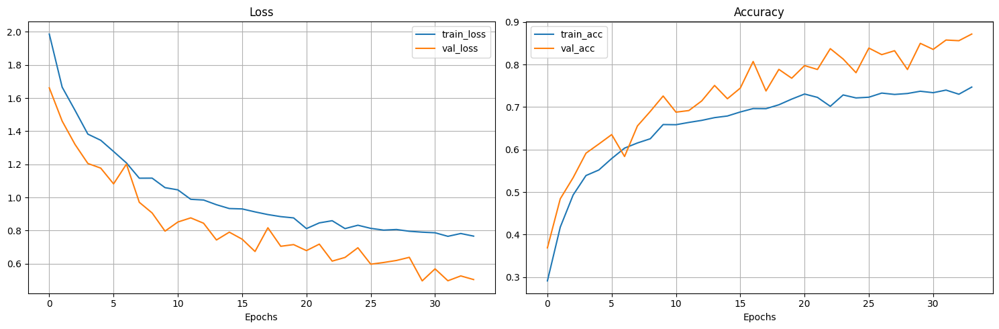

In [ ]:
# plot learning curves
plot_loss_curves(MR_model_dropout_results[MR_best_dropout_probs])

And yes, as expected, the gap widened significantly, confirming the complete absence of overfitting.

Experiment 3: Try different hidden layer sizes.

In [ ]:
# experiment 3: hidden layer sizes
MR_model_hidden_results = experiment_hidden_layer_sizes(train_dataloader=train_dataloader_MR,
                                                        val_dataloader=val_dataloader_MR,
                                                        num_epochs=num_epochs,
                                                        device=device,
                                                        num_classes=num_classes,
                                                        best_decay_value=MR_best_decay_value,
                                                        best_dropout_probs_combo=MR_best_dropout_probs,
                                                        hidden_layer_sizes_list=hidden_layer_sizes_list)

Experimenting with Hidden Layer Sizes
Hidden layer sizes combinations to try: [(32, 64, 64), (32, 32, 128), (64, 32, 64), (32, 32, 64), (64, 64, 32), (32, 64, 32)]

Testing hidden layer sizes combination: (32, 64, 64)...


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.0762 | train_acc: 0.2702 | val_loss: 1.5650 | val_acc: 0.4455
Epoch: 2 | train_loss: 1.6124 | train_acc: 0.4593 | val_loss: 1.1520 | val_acc: 0.6311
Epoch: 3 | train_loss: 1.3376 | train_acc: 0.5529 | val_loss: 1.0013 | val_acc: 0.6414
Epoch: 4 | train_loss: 1.2158 | train_acc: 0.5820 | val_loss: 0.9785 | val_acc: 0.6695
Epoch: 5 | train_loss: 1.1173 | train_acc: 0.6199 | val_loss: 0.9118 | val_acc: 0.6855
Epoch: 6 | train_loss: 1.0367 | train_acc: 0.6530 | val_loss: 0.7401 | val_acc: 0.7353
Epoch: 7 | train_loss: 0.9606 | train_acc: 0.6752 | val_loss: 0.6983 | val_acc: 0.7523
Epoch: 8 | train_loss: 0.9436 | train_acc: 0.6706 | val_loss: 0.7137 | val_acc: 0.7464
Epoch: 9 | train_loss: 0.9157 | train_acc: 0.6881 | val_loss: 0.7061 | val_acc: 0.7447
Epoch: 10 | train_loss: 0.8554 | train_acc: 0.7014 | val_loss: 0.5719 | val_acc: 0.7995
Epoch: 11 | train_loss: 0.8781 | train_acc: 0.6901 | val_loss: 0.6097 | val_acc: 0.7767
Epoch: 12 | train_loss: 0.8360 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.9867 | train_acc: 0.3096 | val_loss: 1.5117 | val_acc: 0.5344
Epoch: 2 | train_loss: 1.5834 | train_acc: 0.4697 | val_loss: 1.2160 | val_acc: 0.6170
Epoch: 3 | train_loss: 1.3371 | train_acc: 0.5495 | val_loss: 1.0634 | val_acc: 0.6405
Epoch: 4 | train_loss: 1.1961 | train_acc: 0.5938 | val_loss: 0.8399 | val_acc: 0.7304
Epoch: 5 | train_loss: 1.0719 | train_acc: 0.6409 | val_loss: 0.7897 | val_acc: 0.7406
Epoch: 6 | train_loss: 1.0066 | train_acc: 0.6700 | val_loss: 0.6823 | val_acc: 0.7842
Epoch: 7 | train_loss: 0.9533 | train_acc: 0.6725 | val_loss: 0.6293 | val_acc: 0.7997
Epoch: 8 | train_loss: 0.9246 | train_acc: 0.6861 | val_loss: 0.7511 | val_acc: 0.7365
Epoch: 9 | train_loss: 0.8620 | train_acc: 0.7008 | val_loss: 0.5478 | val_acc: 0.8172
Epoch: 10 | train_loss: 0.8399 | train_acc: 0.7143 | val_loss: 0.5299 | val_acc: 0.8484
Epoch: 11 | train_loss: 0.8254 | train_acc: 0.7120 | val_loss: 0.5606 | val_acc: 0.8391
Epoch: 12 | train_loss: 0.8159 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.0183 | train_acc: 0.2912 | val_loss: 1.5007 | val_acc: 0.4809
Epoch: 2 | train_loss: 1.5591 | train_acc: 0.4698 | val_loss: 1.1932 | val_acc: 0.5893
Epoch: 3 | train_loss: 1.3320 | train_acc: 0.5548 | val_loss: 1.0214 | val_acc: 0.6756
Epoch: 4 | train_loss: 1.2296 | train_acc: 0.6006 | val_loss: 0.8768 | val_acc: 0.7031
Epoch: 5 | train_loss: 1.1089 | train_acc: 0.6243 | val_loss: 0.8431 | val_acc: 0.7294
Epoch: 6 | train_loss: 1.0922 | train_acc: 0.6330 | val_loss: 0.7447 | val_acc: 0.7575
Epoch: 7 | train_loss: 1.0637 | train_acc: 0.6429 | val_loss: 0.7350 | val_acc: 0.7483
Epoch: 8 | train_loss: 1.0188 | train_acc: 0.6579 | val_loss: 0.7265 | val_acc: 0.7653
Epoch: 9 | train_loss: 1.0009 | train_acc: 0.6682 | val_loss: 0.7498 | val_acc: 0.7695
Epoch: 10 | train_loss: 0.9552 | train_acc: 0.6949 | val_loss: 0.6956 | val_acc: 0.7781
Epoch: 11 | train_loss: 0.9350 | train_acc: 0.7011 | val_loss: 0.6719 | val_acc: 0.7855
Epoch: 12 | train_loss: 0.9240 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.9803 | train_acc: 0.2918 | val_loss: 1.4558 | val_acc: 0.4971
Epoch: 2 | train_loss: 1.6340 | train_acc: 0.4317 | val_loss: 1.2827 | val_acc: 0.5855
Epoch: 3 | train_loss: 1.4778 | train_acc: 0.5095 | val_loss: 1.2893 | val_acc: 0.5631
Epoch: 4 | train_loss: 1.3367 | train_acc: 0.5568 | val_loss: 1.1030 | val_acc: 0.6136
Epoch: 5 | train_loss: 1.2268 | train_acc: 0.5865 | val_loss: 1.0100 | val_acc: 0.6620
Epoch: 6 | train_loss: 1.1464 | train_acc: 0.6179 | val_loss: 0.8704 | val_acc: 0.7094
Epoch: 7 | train_loss: 1.0627 | train_acc: 0.6415 | val_loss: 0.7335 | val_acc: 0.7500
Epoch: 8 | train_loss: 1.0328 | train_acc: 0.6665 | val_loss: 0.7199 | val_acc: 0.7716
Epoch: 9 | train_loss: 1.0007 | train_acc: 0.6572 | val_loss: 0.6751 | val_acc: 0.7731
Epoch: 10 | train_loss: 0.9584 | train_acc: 0.6776 | val_loss: 0.6482 | val_acc: 0.7812
Epoch: 11 | train_loss: 0.8987 | train_acc: 0.6898 | val_loss: 0.5888 | val_acc: 0.7953
Epoch: 12 | train_loss: 0.9057 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.0851 | train_acc: 0.2677 | val_loss: 1.4960 | val_acc: 0.4825
Epoch: 2 | train_loss: 1.6802 | train_acc: 0.4182 | val_loss: 1.3239 | val_acc: 0.6109
Epoch: 3 | train_loss: 1.4675 | train_acc: 0.5291 | val_loss: 1.1118 | val_acc: 0.6328
Epoch: 4 | train_loss: 1.3232 | train_acc: 0.5603 | val_loss: 0.9982 | val_acc: 0.6950
Epoch: 5 | train_loss: 1.1944 | train_acc: 0.6021 | val_loss: 0.8434 | val_acc: 0.7266
Epoch: 6 | train_loss: 1.0992 | train_acc: 0.6311 | val_loss: 0.7306 | val_acc: 0.7641
Epoch: 7 | train_loss: 1.0451 | train_acc: 0.6519 | val_loss: 0.6774 | val_acc: 0.7558
Epoch: 8 | train_loss: 0.9894 | train_acc: 0.6631 | val_loss: 0.7484 | val_acc: 0.7547
Epoch: 9 | train_loss: 0.9701 | train_acc: 0.6770 | val_loss: 0.6521 | val_acc: 0.7795
Epoch: 10 | train_loss: 0.9429 | train_acc: 0.6820 | val_loss: 0.5809 | val_acc: 0.8063
Epoch: 11 | train_loss: 0.9109 | train_acc: 0.7004 | val_loss: 0.5513 | val_acc: 0.8342
Epoch: 12 | train_loss: 0.8944 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.0892 | train_acc: 0.2790 | val_loss: 1.6120 | val_acc: 0.4608
Epoch: 2 | train_loss: 1.7367 | train_acc: 0.4000 | val_loss: 1.3893 | val_acc: 0.5328
Epoch: 3 | train_loss: 1.5360 | train_acc: 0.5010 | val_loss: 1.2654 | val_acc: 0.5934
Epoch: 4 | train_loss: 1.3869 | train_acc: 0.5457 | val_loss: 1.0452 | val_acc: 0.6462
Epoch: 5 | train_loss: 1.2571 | train_acc: 0.5874 | val_loss: 0.9109 | val_acc: 0.7122
Epoch: 6 | train_loss: 1.1549 | train_acc: 0.6246 | val_loss: 0.7830 | val_acc: 0.7375
Epoch: 7 | train_loss: 1.1017 | train_acc: 0.6490 | val_loss: 0.8476 | val_acc: 0.7096
Epoch: 8 | train_loss: 1.0246 | train_acc: 0.6583 | val_loss: 0.7037 | val_acc: 0.7748
Epoch: 9 | train_loss: 0.9982 | train_acc: 0.6607 | val_loss: 0.6658 | val_acc: 0.7812
Epoch: 10 | train_loss: 0.9129 | train_acc: 0.6911 | val_loss: 0.6682 | val_acc: 0.7980
Epoch: 11 | train_loss: 0.9259 | train_acc: 0.6962 | val_loss: 0.6359 | val_acc: 0.7766
Epoch: 12 | train_loss: 0.9270 | train_ac

In [ ]:
# put all results in a table and print it
hidden_size_results_list = [(combo, MR_model_hidden_results[combo]['generalization_gap'], MR_model_hidden_results[combo]['val_acc'][-1]) for combo in MR_model_hidden_results]
hidden_size_results_df = pd.DataFrame(hidden_size_results_list, columns=['Hidden Layer Sizes', 'Generalization Gap', 'Validation Accuracy'])
hidden_size_df = hidden_size_results_df.sort_values(by='Validation Accuracy', ascending=False)
print("\n", hidden_size_df.to_string(index=False))


 Hidden Layer Sizes  Generalization Gap  Validation Accuracy
      (32, 64, 64)           -0.115249             0.893750
      (64, 32, 64)           -0.095270             0.882812
      (32, 32, 64)           -0.127632             0.876563
      (64, 64, 32)           -0.127099             0.874838
     (32, 32, 128)           -0.094967             0.873437
      (32, 64, 32)           -0.047173             0.811530


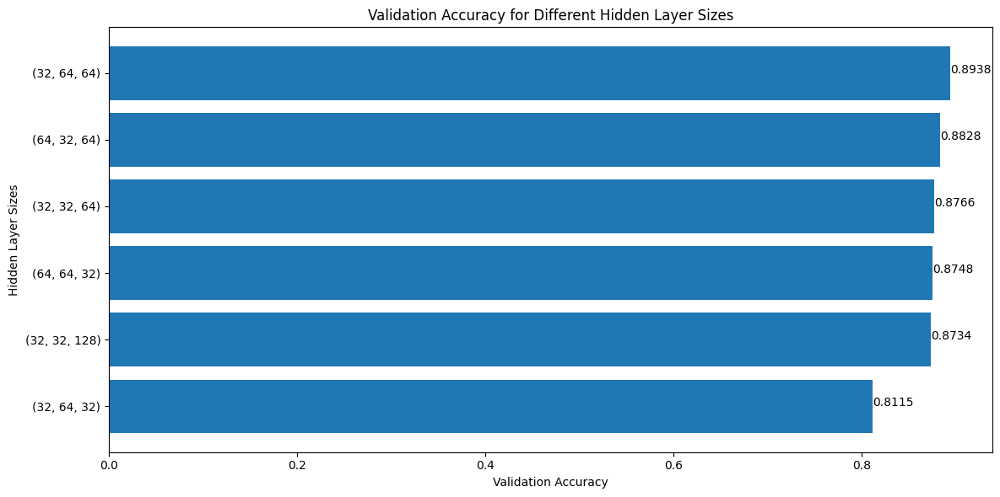

In [ ]:
# plot the results of hidden layer sizes experiment
plot_hidden_layer_results(hidden_size_df)

In [ ]:
MR_best_hidden_units = hidden_size_df.iloc[0]['Hidden Layer Sizes']
print(f"Best hidden layer sizes: {MR_best_hidden_units}")

Best hidden layer sizes: (32, 64, 64)


Let's plot the learning curves once again to confirm that overfitting remains absent.

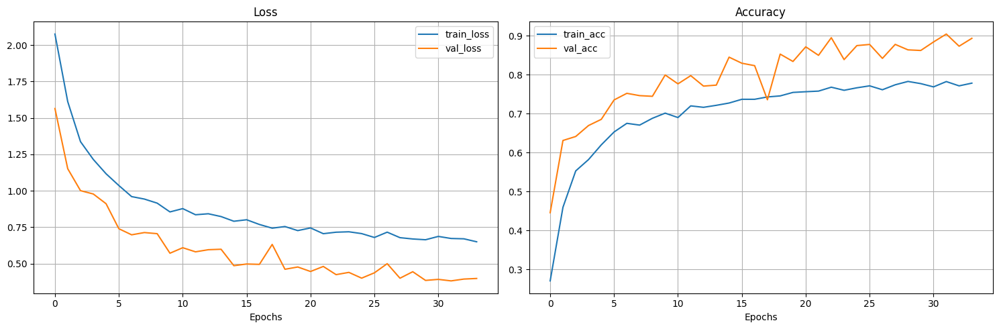

In [ ]:
# plot curves to verify that overfitting does not appeear
plot_loss_curves(MR_model_hidden_results[MR_best_hidden_units])

Experiment 4. Try different optimizers and learning rates.

In [ ]:
# experiment 4: optimizers and learning rates
MR_model_opt_results = experiment_optimizers_and_learning_rates(train_dataloader=train_dataloader_MR,
                                                                val_dataloader=val_dataloader_MR,
                                                                num_epochs=num_epochs,
                                                                device=device,
                                                                num_classes=num_classes,
                                                                best_hidden_units_combo=MR_best_hidden_units,
                                                                best_decay_value=MR_best_decay_value,
                                                                best_dropout_probs_combo=MR_best_dropout_probs,
                                                                learning_rates_list=learning_rates_list)

Experimenting with Optimizers and Learning Rates
Learning rates to try: [0.01, 0.001, 0.0001, 1e-05, 1e-06]
Optimizers to try: ['SGD', 'RMSprop', 'Adam', 'AdamW', 'NAdam']

Testing SGD optimizer...

Learning rate: 0.01... 



  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.2972 | train_acc: 0.1387 | val_loss: 2.1994 | val_acc: 0.2000
Epoch: 2 | train_loss: 2.1640 | train_acc: 0.2338 | val_loss: 2.0353 | val_acc: 0.3703
Epoch: 3 | train_loss: 2.0512 | train_acc: 0.3350 | val_loss: 1.9007 | val_acc: 0.4219
Epoch: 4 | train_loss: 1.9417 | train_acc: 0.4008 | val_loss: 1.7956 | val_acc: 0.4712
Epoch: 5 | train_loss: 1.8516 | train_acc: 0.4299 | val_loss: 1.6873 | val_acc: 0.4933
Epoch: 6 | train_loss: 1.7395 | train_acc: 0.4509 | val_loss: 1.5526 | val_acc: 0.5248
Epoch: 7 | train_loss: 1.6714 | train_acc: 0.4625 | val_loss: 1.4452 | val_acc: 0.5483
Epoch: 8 | train_loss: 1.5915 | train_acc: 0.4811 | val_loss: 1.3754 | val_acc: 0.5622
Epoch: 9 | train_loss: 1.5362 | train_acc: 0.4814 | val_loss: 1.3160 | val_acc: 0.5778
Epoch: 10 | train_loss: 1.5039 | train_acc: 0.5024 | val_loss: 1.2759 | val_acc: 0.5934
Epoch: 11 | train_loss: 1.4530 | train_acc: 0.5203 | val_loss: 1.2273 | val_acc: 0.6059
Epoch: 12 | train_loss: 1.4144 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.3939 | train_acc: 0.1080 | val_loss: 2.3729 | val_acc: 0.1864
Epoch: 2 | train_loss: 2.3726 | train_acc: 0.1144 | val_loss: 2.3537 | val_acc: 0.1280
Epoch: 3 | train_loss: 2.3523 | train_acc: 0.1142 | val_loss: 2.3328 | val_acc: 0.1203
Epoch: 4 | train_loss: 2.3362 | train_acc: 0.1025 | val_loss: 2.3131 | val_acc: 0.1203
Epoch: 5 | train_loss: 2.3133 | train_acc: 0.1204 | val_loss: 2.2931 | val_acc: 0.1203
Epoch: 6 | train_loss: 2.2991 | train_acc: 0.1189 | val_loss: 2.2756 | val_acc: 0.1234
Epoch: 7 | train_loss: 2.2838 | train_acc: 0.1261 | val_loss: 2.2594 | val_acc: 0.1234
Epoch: 8 | train_loss: 2.2736 | train_acc: 0.1335 | val_loss: 2.2449 | val_acc: 0.1250
Epoch: 9 | train_loss: 2.2674 | train_acc: 0.1351 | val_loss: 2.2311 | val_acc: 0.1313
Epoch: 10 | train_loss: 2.2545 | train_acc: 0.1365 | val_loss: 2.2183 | val_acc: 0.1437
Epoch: 11 | train_loss: 2.2478 | train_acc: 0.1357 | val_loss: 2.2054 | val_acc: 0.1578
Epoch: 12 | train_loss: 2.2278 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.4122 | train_acc: 0.1114 | val_loss: 2.3976 | val_acc: 0.0813
Epoch: 2 | train_loss: 2.4019 | train_acc: 0.1045 | val_loss: 2.3947 | val_acc: 0.0813
Epoch: 3 | train_loss: 2.4041 | train_acc: 0.1128 | val_loss: 2.3919 | val_acc: 0.0813
Epoch: 4 | train_loss: 2.4028 | train_acc: 0.1093 | val_loss: 2.3891 | val_acc: 0.0828
Epoch: 5 | train_loss: 2.3939 | train_acc: 0.1193 | val_loss: 2.3865 | val_acc: 0.0844
Epoch: 6 | train_loss: 2.3925 | train_acc: 0.1184 | val_loss: 2.3840 | val_acc: 0.0844
Epoch: 7 | train_loss: 2.3866 | train_acc: 0.1283 | val_loss: 2.3814 | val_acc: 0.0844
Epoch: 8 | train_loss: 2.3806 | train_acc: 0.1292 | val_loss: 2.3789 | val_acc: 0.0859
Epoch: 9 | train_loss: 2.3885 | train_acc: 0.1218 | val_loss: 2.3765 | val_acc: 0.0892
Epoch: 10 | train_loss: 2.3819 | train_acc: 0.1214 | val_loss: 2.3741 | val_acc: 0.0974
Epoch: 11 | train_loss: 2.3747 | train_acc: 0.1307 | val_loss: 2.3717 | val_acc: 0.1103
Epoch: 12 | train_loss: 2.3708 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.4360 | train_acc: 0.0799 | val_loss: 2.4077 | val_acc: 0.0672
Epoch: 2 | train_loss: 2.4285 | train_acc: 0.0781 | val_loss: 2.4073 | val_acc: 0.0672
Epoch: 3 | train_loss: 2.4354 | train_acc: 0.0853 | val_loss: 2.4070 | val_acc: 0.0688
Epoch: 4 | train_loss: 2.4298 | train_acc: 0.0831 | val_loss: 2.4067 | val_acc: 0.0688
Epoch: 5 | train_loss: 2.4274 | train_acc: 0.0798 | val_loss: 2.4064 | val_acc: 0.0703
Epoch: 6 | train_loss: 2.4243 | train_acc: 0.0868 | val_loss: 2.4061 | val_acc: 0.0703
Epoch: 7 | train_loss: 2.4309 | train_acc: 0.0818 | val_loss: 2.4058 | val_acc: 0.0703
Epoch: 8 | train_loss: 2.4288 | train_acc: 0.0709 | val_loss: 2.4054 | val_acc: 0.0703
Epoch: 9 | train_loss: 2.4261 | train_acc: 0.0843 | val_loss: 2.4051 | val_acc: 0.0703
Epoch: 10 | train_loss: 2.4248 | train_acc: 0.0860 | val_loss: 2.4048 | val_acc: 0.0719
Epoch: 11 | train_loss: 2.4259 | train_acc: 0.0780 | val_loss: 2.4045 | val_acc: 0.0719
Epoch: 12 | train_loss: 2.4285 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.4206 | train_acc: 0.0968 | val_loss: 2.4023 | val_acc: 0.1016
Epoch: 2 | train_loss: 2.4218 | train_acc: 0.0964 | val_loss: 2.4023 | val_acc: 0.1016
Epoch: 3 | train_loss: 2.4208 | train_acc: 0.0991 | val_loss: 2.4023 | val_acc: 0.1016
Epoch: 4 | train_loss: 2.4208 | train_acc: 0.0912 | val_loss: 2.4023 | val_acc: 0.1016
Epoch: 5 | train_loss: 2.4265 | train_acc: 0.0971 | val_loss: 2.4022 | val_acc: 0.1016
Epoch: 6 | train_loss: 2.4235 | train_acc: 0.0954 | val_loss: 2.4022 | val_acc: 0.1016
Epoch: 7 | train_loss: 2.4264 | train_acc: 0.1004 | val_loss: 2.4022 | val_acc: 0.1016
Epoch: 8 | train_loss: 2.4201 | train_acc: 0.0890 | val_loss: 2.4022 | val_acc: 0.1016
Epoch: 9 | train_loss: 2.4227 | train_acc: 0.0902 | val_loss: 2.4021 | val_acc: 0.1016
Epoch: 10 | train_loss: 2.4241 | train_acc: 0.0907 | val_loss: 2.4021 | val_acc: 0.1016
Epoch: 11 | train_loss: 2.4233 | train_acc: 0.0846 | val_loss: 2.4021 | val_acc: 0.1016
Epoch: 12 | train_loss: 2.4178 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 223.4282 | train_acc: 0.1113 | val_loss: 2.3881 | val_acc: 0.1016
Epoch: 2 | train_loss: 5.2156 | train_acc: 0.1120 | val_loss: 3.3032 | val_acc: 0.0859
Epoch: 3 | train_loss: 2.3882 | train_acc: 0.1115 | val_loss: 2.3731 | val_acc: 0.1172
Epoch: 4 | train_loss: 2.3948 | train_acc: 0.1144 | val_loss: 2.3696 | val_acc: 0.1016
Epoch: 5 | train_loss: 2.5194 | train_acc: 0.1184 | val_loss: 2.3746 | val_acc: 0.1172
Epoch: 6 | train_loss: 2.3722 | train_acc: 0.1127 | val_loss: 2.3693 | val_acc: 0.1172
Epoch: 7 | train_loss: 2.6215 | train_acc: 0.1073 | val_loss: 2.3684 | val_acc: 0.1172
Epoch: 8 | train_loss: 2.7335 | train_acc: 0.0998 | val_loss: 2.3813 | val_acc: 0.1016
Epoch: 9 | train_loss: 2.3733 | train_acc: 0.1122 | val_loss: 2.3701 | val_acc: 0.1172
Epoch: 10 | train_loss: 2.3684 | train_acc: 0.1065 | val_loss: 2.3710 | val_acc: 0.1125
Epoch: 11 | train_loss: 2.4006 | train_acc: 0.1080 | val_loss: 2.3861 | val_acc: 0.1016
Epoch: 12 | train_loss: 2.3705 | train_

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.0428 | train_acc: 0.3051 | val_loss: 2.1936 | val_acc: 0.1675
Epoch: 2 | train_loss: 1.5628 | train_acc: 0.4739 | val_loss: 1.1273 | val_acc: 0.6181
Epoch: 3 | train_loss: 1.3250 | train_acc: 0.5539 | val_loss: 0.9269 | val_acc: 0.7106
Epoch: 4 | train_loss: 1.1751 | train_acc: 0.6060 | val_loss: 0.8344 | val_acc: 0.7186
Epoch: 5 | train_loss: 1.0854 | train_acc: 0.6335 | val_loss: 0.7513 | val_acc: 0.7422
Epoch: 6 | train_loss: 1.0340 | train_acc: 0.6479 | val_loss: 0.7486 | val_acc: 0.7600
Epoch: 7 | train_loss: 0.9861 | train_acc: 0.6655 | val_loss: 0.6746 | val_acc: 0.8028
Epoch: 8 | train_loss: 0.9120 | train_acc: 0.6864 | val_loss: 0.5831 | val_acc: 0.8063
Epoch: 9 | train_loss: 0.8722 | train_acc: 0.7041 | val_loss: 0.6033 | val_acc: 0.8011
Epoch: 10 | train_loss: 0.8580 | train_acc: 0.7081 | val_loss: 0.5651 | val_acc: 0.8073
Epoch: 11 | train_loss: 0.8153 | train_acc: 0.7234 | val_loss: 0.5394 | val_acc: 0.8169
Epoch: 12 | train_loss: 0.7963 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.2107 | train_acc: 0.1760 | val_loss: 2.0316 | val_acc: 0.3953
Epoch: 2 | train_loss: 2.0100 | train_acc: 0.3313 | val_loss: 1.7656 | val_acc: 0.4842
Epoch: 3 | train_loss: 1.8206 | train_acc: 0.3983 | val_loss: 1.5652 | val_acc: 0.4952
Epoch: 4 | train_loss: 1.6924 | train_acc: 0.4451 | val_loss: 1.4374 | val_acc: 0.5311
Epoch: 5 | train_loss: 1.6377 | train_acc: 0.4562 | val_loss: 1.4016 | val_acc: 0.5339
Epoch: 6 | train_loss: 1.5795 | train_acc: 0.4682 | val_loss: 1.3429 | val_acc: 0.5497
Epoch: 7 | train_loss: 1.5254 | train_acc: 0.4874 | val_loss: 1.2756 | val_acc: 0.5762
Epoch: 8 | train_loss: 1.4856 | train_acc: 0.5060 | val_loss: 1.2417 | val_acc: 0.6075
Epoch: 9 | train_loss: 1.4496 | train_acc: 0.5140 | val_loss: 1.2064 | val_acc: 0.6137
Epoch: 10 | train_loss: 1.4051 | train_acc: 0.5277 | val_loss: 1.1439 | val_acc: 0.6233
Epoch: 11 | train_loss: 1.3828 | train_acc: 0.5588 | val_loss: 1.1316 | val_acc: 0.6262
Epoch: 12 | train_loss: 1.3152 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.3828 | train_acc: 0.1336 | val_loss: 2.3658 | val_acc: 0.2264
Epoch: 2 | train_loss: 2.3444 | train_acc: 0.1446 | val_loss: 2.3369 | val_acc: 0.2109
Epoch: 3 | train_loss: 2.3215 | train_acc: 0.1381 | val_loss: 2.3122 | val_acc: 0.1828
Epoch: 4 | train_loss: 2.2925 | train_acc: 0.1320 | val_loss: 2.2907 | val_acc: 0.1641
Epoch: 5 | train_loss: 2.2832 | train_acc: 0.1313 | val_loss: 2.2744 | val_acc: 0.1641
Epoch: 6 | train_loss: 2.2750 | train_acc: 0.1351 | val_loss: 2.2598 | val_acc: 0.1641
Epoch: 7 | train_loss: 2.2669 | train_acc: 0.1343 | val_loss: 2.2462 | val_acc: 0.1703
Epoch: 8 | train_loss: 2.2524 | train_acc: 0.1336 | val_loss: 2.2320 | val_acc: 0.1641
Epoch: 9 | train_loss: 2.2392 | train_acc: 0.1414 | val_loss: 2.2179 | val_acc: 0.1734
Epoch: 10 | train_loss: 2.2292 | train_acc: 0.1492 | val_loss: 2.2066 | val_acc: 0.1938
Epoch: 11 | train_loss: 2.2224 | train_acc: 0.1557 | val_loss: 2.1919 | val_acc: 0.2000
Epoch: 12 | train_loss: 2.2146 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.4130 | train_acc: 0.0820 | val_loss: 2.4000 | val_acc: 0.0953
Epoch: 2 | train_loss: 2.4007 | train_acc: 0.0981 | val_loss: 2.3963 | val_acc: 0.0953
Epoch: 3 | train_loss: 2.3954 | train_acc: 0.0833 | val_loss: 2.3930 | val_acc: 0.0953
Epoch: 4 | train_loss: 2.3864 | train_acc: 0.0986 | val_loss: 2.3898 | val_acc: 0.0953
Epoch: 5 | train_loss: 2.3886 | train_acc: 0.0986 | val_loss: 2.3867 | val_acc: 0.0953
Epoch: 6 | train_loss: 2.3819 | train_acc: 0.0976 | val_loss: 2.3836 | val_acc: 0.0953
Epoch: 7 | train_loss: 2.3784 | train_acc: 0.0942 | val_loss: 2.3805 | val_acc: 0.0953
Epoch: 8 | train_loss: 2.3707 | train_acc: 0.1028 | val_loss: 2.3773 | val_acc: 0.1003
Epoch: 9 | train_loss: 2.3685 | train_acc: 0.1080 | val_loss: 2.3741 | val_acc: 0.1086
Epoch: 10 | train_loss: 2.3648 | train_acc: 0.1013 | val_loss: 2.3711 | val_acc: 0.1235
Epoch: 11 | train_loss: 2.3600 | train_acc: 0.1057 | val_loss: 2.3679 | val_acc: 0.1415
Epoch: 12 | train_loss: 2.3588 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.3304 | train_acc: 0.2038 | val_loss: 2.3666 | val_acc: 0.1203
Epoch: 2 | train_loss: 2.3155 | train_acc: 0.1910 | val_loss: 2.1788 | val_acc: 0.2693
Epoch: 3 | train_loss: 2.1873 | train_acc: 0.2224 | val_loss: 1.9050 | val_acc: 0.3683
Epoch: 4 | train_loss: 2.0639 | train_acc: 0.2665 | val_loss: 1.8032 | val_acc: 0.3184
Epoch: 5 | train_loss: 2.0496 | train_acc: 0.2819 | val_loss: 2.0531 | val_acc: 0.2427
Epoch: 6 | train_loss: 2.0892 | train_acc: 0.2715 | val_loss: 1.8937 | val_acc: 0.2750
Epoch: 7 | train_loss: 2.0288 | train_acc: 0.2711 | val_loss: 2.0852 | val_acc: 0.2452
Epoch: 8 | train_loss: 2.0419 | train_acc: 0.2735 | val_loss: 1.7975 | val_acc: 0.3750
Epoch: 9 | train_loss: 2.0361 | train_acc: 0.2737 | val_loss: 1.9070 | val_acc: 0.2962
Epoch: 10 | train_loss: 2.0273 | train_acc: 0.2694 | val_loss: 1.9723 | val_acc: 0.2904
Epoch: 11 | train_loss: 1.9907 | train_acc: 0.2995 | val_loss: 1.9856 | val_acc: 0.3042
Epoch: 12 | train_loss: 1.9977 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.0678 | train_acc: 0.2759 | val_loss: 1.6392 | val_acc: 0.4700
Epoch: 2 | train_loss: 1.6712 | train_acc: 0.4209 | val_loss: 1.3922 | val_acc: 0.5608
Epoch: 3 | train_loss: 1.4797 | train_acc: 0.5176 | val_loss: 1.1543 | val_acc: 0.6251
Epoch: 4 | train_loss: 1.3388 | train_acc: 0.5560 | val_loss: 1.0340 | val_acc: 0.6950
Epoch: 5 | train_loss: 1.2081 | train_acc: 0.5916 | val_loss: 0.8644 | val_acc: 0.7290
Epoch: 6 | train_loss: 1.0983 | train_acc: 0.6335 | val_loss: 0.7676 | val_acc: 0.7577
Epoch: 7 | train_loss: 1.0070 | train_acc: 0.6723 | val_loss: 0.7065 | val_acc: 0.7698
Epoch: 8 | train_loss: 0.9835 | train_acc: 0.6621 | val_loss: 0.6581 | val_acc: 0.7776
Epoch: 9 | train_loss: 0.9627 | train_acc: 0.6819 | val_loss: 0.6651 | val_acc: 0.7766
Epoch: 10 | train_loss: 0.8960 | train_acc: 0.6980 | val_loss: 0.6076 | val_acc: 0.8391
Epoch: 11 | train_loss: 0.8845 | train_acc: 0.7110 | val_loss: 0.6222 | val_acc: 0.8070
Epoch: 12 | train_loss: 0.8353 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.3065 | train_acc: 0.1163 | val_loss: 2.2153 | val_acc: 0.1422
Epoch: 2 | train_loss: 2.1721 | train_acc: 0.1980 | val_loss: 2.0426 | val_acc: 0.3781
Epoch: 3 | train_loss: 1.9971 | train_acc: 0.3493 | val_loss: 1.7719 | val_acc: 0.5031
Epoch: 4 | train_loss: 1.8240 | train_acc: 0.4098 | val_loss: 1.5269 | val_acc: 0.5203
Epoch: 5 | train_loss: 1.6888 | train_acc: 0.4382 | val_loss: 1.4116 | val_acc: 0.5484
Epoch: 6 | train_loss: 1.6261 | train_acc: 0.4587 | val_loss: 1.3576 | val_acc: 0.5823
Epoch: 7 | train_loss: 1.5604 | train_acc: 0.4887 | val_loss: 1.2922 | val_acc: 0.5952
Epoch: 8 | train_loss: 1.4919 | train_acc: 0.5136 | val_loss: 1.2328 | val_acc: 0.5936
Epoch: 9 | train_loss: 1.4372 | train_acc: 0.5348 | val_loss: 1.1816 | val_acc: 0.6217
Epoch: 10 | train_loss: 1.4119 | train_acc: 0.5382 | val_loss: 1.1412 | val_acc: 0.6420
Epoch: 11 | train_loss: 1.3657 | train_acc: 0.5502 | val_loss: 1.1100 | val_acc: 0.6403
Epoch: 12 | train_loss: 1.3388 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.3944 | train_acc: 0.0959 | val_loss: 2.3777 | val_acc: 0.1406
Epoch: 2 | train_loss: 2.3527 | train_acc: 0.1295 | val_loss: 2.3522 | val_acc: 0.2073
Epoch: 3 | train_loss: 2.3279 | train_acc: 0.1280 | val_loss: 2.3230 | val_acc: 0.1578
Epoch: 4 | train_loss: 2.2960 | train_acc: 0.1296 | val_loss: 2.2914 | val_acc: 0.1344
Epoch: 5 | train_loss: 2.2798 | train_acc: 0.1337 | val_loss: 2.2677 | val_acc: 0.1297
Epoch: 6 | train_loss: 2.2600 | train_acc: 0.1310 | val_loss: 2.2476 | val_acc: 0.1297
Epoch: 7 | train_loss: 2.2511 | train_acc: 0.1357 | val_loss: 2.2328 | val_acc: 0.1391
Epoch: 8 | train_loss: 2.2516 | train_acc: 0.1352 | val_loss: 2.2210 | val_acc: 0.1547
Epoch: 9 | train_loss: 2.2284 | train_acc: 0.1428 | val_loss: 2.2066 | val_acc: 0.1609
Epoch: 10 | train_loss: 2.2129 | train_acc: 0.1557 | val_loss: 2.1938 | val_acc: 0.1828
Epoch: 11 | train_loss: 2.2106 | train_acc: 0.1518 | val_loss: 2.1798 | val_acc: 0.2109
Epoch: 12 | train_loss: 2.1955 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.4078 | train_acc: 0.0744 | val_loss: 2.4006 | val_acc: 0.0719
Epoch: 2 | train_loss: 2.4057 | train_acc: 0.0721 | val_loss: 2.3979 | val_acc: 0.0781
Epoch: 3 | train_loss: 2.4051 | train_acc: 0.0749 | val_loss: 2.3954 | val_acc: 0.0828
Epoch: 4 | train_loss: 2.4010 | train_acc: 0.0753 | val_loss: 2.3929 | val_acc: 0.0891
Epoch: 5 | train_loss: 2.3933 | train_acc: 0.0820 | val_loss: 2.3903 | val_acc: 0.0922
Epoch: 6 | train_loss: 2.3919 | train_acc: 0.0781 | val_loss: 2.3879 | val_acc: 0.0969
Epoch: 7 | train_loss: 2.3841 | train_acc: 0.0907 | val_loss: 2.3853 | val_acc: 0.1002
Epoch: 8 | train_loss: 2.3807 | train_acc: 0.0926 | val_loss: 2.3827 | val_acc: 0.1017
Epoch: 9 | train_loss: 2.3803 | train_acc: 0.0846 | val_loss: 2.3803 | val_acc: 0.1048
Epoch: 10 | train_loss: 2.3745 | train_acc: 0.0915 | val_loss: 2.3778 | val_acc: 0.1048
Epoch: 11 | train_loss: 2.3737 | train_acc: 0.0870 | val_loss: 2.3753 | val_acc: 0.1064
Epoch: 12 | train_loss: 2.3741 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.4201 | train_acc: 0.1150 | val_loss: 2.3662 | val_acc: 0.1125
Epoch: 2 | train_loss: 2.3685 | train_acc: 0.1118 | val_loss: 2.3634 | val_acc: 0.1172
Epoch: 3 | train_loss: 2.3981 | train_acc: 0.1176 | val_loss: 2.3706 | val_acc: 0.1125
Epoch: 4 | train_loss: 2.3830 | train_acc: 0.1155 | val_loss: 2.3801 | val_acc: 0.0969
Epoch: 5 | train_loss: 2.4043 | train_acc: 0.1132 | val_loss: 2.3868 | val_acc: 0.0969
Epoch: 6 | train_loss: 2.3739 | train_acc: 0.1117 | val_loss: 2.3764 | val_acc: 0.1172
Epoch: 7 | train_loss: 2.3697 | train_acc: 0.1182 | val_loss: 2.3737 | val_acc: 0.1125
Epoch: 8 | train_loss: 2.3691 | train_acc: 0.1221 | val_loss: 2.3813 | val_acc: 0.1016
Epoch: 9 | train_loss: 2.3760 | train_acc: 0.1223 | val_loss: 2.3933 | val_acc: 0.1125
Epoch: 10 | train_loss: 2.3679 | train_acc: 0.1204 | val_loss: 2.3770 | val_acc: 0.1016
Epoch: 11 | train_loss: 2.3718 | train_acc: 0.1171 | val_loss: 2.3648 | val_acc: 0.1125
Epoch: 12 | train_loss: 2.3684 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.0484 | train_acc: 0.2731 | val_loss: 1.5765 | val_acc: 0.4601
Epoch: 2 | train_loss: 1.6778 | train_acc: 0.4294 | val_loss: 1.3103 | val_acc: 0.5577
Epoch: 3 | train_loss: 1.4387 | train_acc: 0.5133 | val_loss: 1.0902 | val_acc: 0.6540
Epoch: 4 | train_loss: 1.2564 | train_acc: 0.5729 | val_loss: 0.8948 | val_acc: 0.6997
Epoch: 5 | train_loss: 1.0972 | train_acc: 0.6204 | val_loss: 0.7717 | val_acc: 0.7433
Epoch: 6 | train_loss: 1.0254 | train_acc: 0.6426 | val_loss: 0.6767 | val_acc: 0.7776
Epoch: 7 | train_loss: 0.9495 | train_acc: 0.6746 | val_loss: 0.6320 | val_acc: 0.7903
Epoch: 8 | train_loss: 0.8671 | train_acc: 0.7045 | val_loss: 0.5733 | val_acc: 0.8073
Epoch: 9 | train_loss: 0.8085 | train_acc: 0.7262 | val_loss: 0.5502 | val_acc: 0.8045
Epoch: 10 | train_loss: 0.8055 | train_acc: 0.7227 | val_loss: 0.5164 | val_acc: 0.8516
Epoch: 11 | train_loss: 0.7553 | train_acc: 0.7447 | val_loss: 0.5556 | val_acc: 0.8339
Epoch: 12 | train_loss: 0.7789 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.3054 | train_acc: 0.0945 | val_loss: 2.2234 | val_acc: 0.1266
Epoch: 2 | train_loss: 2.1918 | train_acc: 0.1690 | val_loss: 2.0860 | val_acc: 0.2594
Epoch: 3 | train_loss: 2.0659 | train_acc: 0.2832 | val_loss: 1.9003 | val_acc: 0.5264
Epoch: 4 | train_loss: 1.9176 | train_acc: 0.3844 | val_loss: 1.6619 | val_acc: 0.5091
Epoch: 5 | train_loss: 1.7398 | train_acc: 0.4227 | val_loss: 1.4781 | val_acc: 0.5155
Epoch: 6 | train_loss: 1.6726 | train_acc: 0.4411 | val_loss: 1.4051 | val_acc: 0.5514
Epoch: 7 | train_loss: 1.6044 | train_acc: 0.4645 | val_loss: 1.3325 | val_acc: 0.5592
Epoch: 8 | train_loss: 1.5370 | train_acc: 0.4955 | val_loss: 1.2620 | val_acc: 0.5873
Epoch: 9 | train_loss: 1.4965 | train_acc: 0.4984 | val_loss: 1.2198 | val_acc: 0.6059
Epoch: 10 | train_loss: 1.4450 | train_acc: 0.5181 | val_loss: 1.1811 | val_acc: 0.6045
Epoch: 11 | train_loss: 1.4227 | train_acc: 0.5402 | val_loss: 1.1336 | val_acc: 0.6355
Epoch: 12 | train_loss: 1.3756 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.4122 | train_acc: 0.1206 | val_loss: 2.3869 | val_acc: 0.2048
Epoch: 2 | train_loss: 2.3685 | train_acc: 0.1132 | val_loss: 2.3597 | val_acc: 0.1359
Epoch: 3 | train_loss: 2.3447 | train_acc: 0.1166 | val_loss: 2.3318 | val_acc: 0.1203
Epoch: 4 | train_loss: 2.3179 | train_acc: 0.1162 | val_loss: 2.3051 | val_acc: 0.1203
Epoch: 5 | train_loss: 2.2912 | train_acc: 0.1173 | val_loss: 2.2790 | val_acc: 0.1203
Epoch: 6 | train_loss: 2.2787 | train_acc: 0.1268 | val_loss: 2.2576 | val_acc: 0.1203
Epoch: 7 | train_loss: 2.2602 | train_acc: 0.1339 | val_loss: 2.2378 | val_acc: 0.1297
Epoch: 8 | train_loss: 2.2461 | train_acc: 0.1340 | val_loss: 2.2212 | val_acc: 0.1625
Epoch: 9 | train_loss: 2.2400 | train_acc: 0.1460 | val_loss: 2.2056 | val_acc: 0.2062
Epoch: 10 | train_loss: 2.2156 | train_acc: 0.1622 | val_loss: 2.1866 | val_acc: 0.2313
Epoch: 11 | train_loss: 2.1977 | train_acc: 0.1781 | val_loss: 2.1654 | val_acc: 0.2453
Epoch: 12 | train_loss: 2.1844 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.4257 | train_acc: 0.1157 | val_loss: 2.4003 | val_acc: 0.1578
Epoch: 2 | train_loss: 2.4160 | train_acc: 0.1127 | val_loss: 2.3968 | val_acc: 0.1656
Epoch: 3 | train_loss: 2.4149 | train_acc: 0.1016 | val_loss: 2.3934 | val_acc: 0.1830
Epoch: 4 | train_loss: 2.4072 | train_acc: 0.1154 | val_loss: 2.3902 | val_acc: 0.1863
Epoch: 5 | train_loss: 2.3976 | train_acc: 0.1270 | val_loss: 2.3870 | val_acc: 0.1817
Epoch: 6 | train_loss: 2.3943 | train_acc: 0.1213 | val_loss: 2.3840 | val_acc: 0.1855
Epoch: 7 | train_loss: 2.3867 | train_acc: 0.1248 | val_loss: 2.3810 | val_acc: 0.1957
Epoch: 8 | train_loss: 2.3827 | train_acc: 0.1372 | val_loss: 2.3779 | val_acc: 0.1929
Epoch: 9 | train_loss: 2.3780 | train_acc: 0.1285 | val_loss: 2.3750 | val_acc: 0.2143
Epoch: 10 | train_loss: 2.3798 | train_acc: 0.1265 | val_loss: 2.3719 | val_acc: 0.2209
Epoch: 11 | train_loss: 2.3646 | train_acc: 0.1149 | val_loss: 2.3690 | val_acc: 0.2261
Epoch: 12 | train_loss: 2.3732 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.4479 | train_acc: 0.1216 | val_loss: 2.3712 | val_acc: 0.1016
Epoch: 2 | train_loss: 2.3630 | train_acc: 0.1229 | val_loss: 2.3702 | val_acc: 0.1016
Epoch: 3 | train_loss: 2.3654 | train_acc: 0.1147 | val_loss: 2.3673 | val_acc: 0.1016
Epoch: 4 | train_loss: 2.3637 | train_acc: 0.1125 | val_loss: 2.3646 | val_acc: 0.1172
Epoch: 5 | train_loss: 2.3633 | train_acc: 0.1178 | val_loss: 2.3666 | val_acc: 0.1172
Epoch: 6 | train_loss: 2.3616 | train_acc: 0.1210 | val_loss: 2.3657 | val_acc: 0.1172
Epoch: 7 | train_loss: 2.3620 | train_acc: 0.1159 | val_loss: 2.3653 | val_acc: 0.1172
Epoch: 8 | train_loss: 2.3608 | train_acc: 0.1194 | val_loss: 2.3677 | val_acc: 0.1172
Epoch: 9 | train_loss: 2.3603 | train_acc: 0.1208 | val_loss: 2.3662 | val_acc: 0.1172
Epoch: 10 | train_loss: 2.3609 | train_acc: 0.1197 | val_loss: 2.3657 | val_acc: 0.1172
Epoch: 11 | train_loss: 2.3591 | train_acc: 0.1263 | val_loss: 2.3729 | val_acc: 0.1016
Epoch: 12 | train_loss: 2.3608 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.0580 | train_acc: 0.2719 | val_loss: 1.4966 | val_acc: 0.5123
Epoch: 2 | train_loss: 1.6455 | train_acc: 0.4392 | val_loss: 1.2692 | val_acc: 0.5373
Epoch: 3 | train_loss: 1.3787 | train_acc: 0.5377 | val_loss: 0.9365 | val_acc: 0.6997
Epoch: 4 | train_loss: 1.1803 | train_acc: 0.5982 | val_loss: 0.9444 | val_acc: 0.6615
Epoch: 5 | train_loss: 1.0605 | train_acc: 0.6441 | val_loss: 0.7181 | val_acc: 0.7655
Epoch: 6 | train_loss: 1.0005 | train_acc: 0.6507 | val_loss: 0.6487 | val_acc: 0.8008
Epoch: 7 | train_loss: 0.9128 | train_acc: 0.6864 | val_loss: 0.7575 | val_acc: 0.7320
Epoch: 8 | train_loss: 0.8696 | train_acc: 0.6957 | val_loss: 0.6227 | val_acc: 0.8078
Epoch: 9 | train_loss: 0.8328 | train_acc: 0.7222 | val_loss: 0.6171 | val_acc: 0.8109
Epoch: 10 | train_loss: 0.8005 | train_acc: 0.7326 | val_loss: 0.6122 | val_acc: 0.7844
Epoch: 11 | train_loss: 0.7706 | train_acc: 0.7370 | val_loss: 0.5186 | val_acc: 0.8531
Epoch: 12 | train_loss: 0.7671 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.3008 | train_acc: 0.1109 | val_loss: 2.1988 | val_acc: 0.1375
Epoch: 2 | train_loss: 2.1838 | train_acc: 0.1767 | val_loss: 2.0639 | val_acc: 0.2734
Epoch: 3 | train_loss: 2.0323 | train_acc: 0.3002 | val_loss: 1.8182 | val_acc: 0.4813
Epoch: 4 | train_loss: 1.8783 | train_acc: 0.3814 | val_loss: 1.5984 | val_acc: 0.5188
Epoch: 5 | train_loss: 1.7317 | train_acc: 0.4427 | val_loss: 1.4523 | val_acc: 0.5466
Epoch: 6 | train_loss: 1.6723 | train_acc: 0.4560 | val_loss: 1.3729 | val_acc: 0.5919
Epoch: 7 | train_loss: 1.5768 | train_acc: 0.4836 | val_loss: 1.2932 | val_acc: 0.6012
Epoch: 8 | train_loss: 1.5196 | train_acc: 0.4951 | val_loss: 1.2209 | val_acc: 0.6386
Epoch: 9 | train_loss: 1.4515 | train_acc: 0.5278 | val_loss: 1.1502 | val_acc: 0.6403
Epoch: 10 | train_loss: 1.3888 | train_acc: 0.5487 | val_loss: 1.0869 | val_acc: 0.6730
Epoch: 11 | train_loss: 1.3426 | train_acc: 0.5633 | val_loss: 1.0362 | val_acc: 0.6856
Epoch: 12 | train_loss: 1.2815 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.3728 | train_acc: 0.1196 | val_loss: 2.3568 | val_acc: 0.1812
Epoch: 2 | train_loss: 2.3482 | train_acc: 0.1181 | val_loss: 2.3292 | val_acc: 0.1422
Epoch: 3 | train_loss: 2.3104 | train_acc: 0.1216 | val_loss: 2.3017 | val_acc: 0.1281
Epoch: 4 | train_loss: 2.2927 | train_acc: 0.1236 | val_loss: 2.2782 | val_acc: 0.1250
Epoch: 5 | train_loss: 2.2827 | train_acc: 0.1186 | val_loss: 2.2577 | val_acc: 0.1250
Epoch: 6 | train_loss: 2.2722 | train_acc: 0.1188 | val_loss: 2.2445 | val_acc: 0.1266
Epoch: 7 | train_loss: 2.2525 | train_acc: 0.1229 | val_loss: 2.2299 | val_acc: 0.1391
Epoch: 8 | train_loss: 2.2448 | train_acc: 0.1387 | val_loss: 2.2153 | val_acc: 0.1484
Epoch: 9 | train_loss: 2.2243 | train_acc: 0.1394 | val_loss: 2.1973 | val_acc: 0.1594
Epoch: 10 | train_loss: 2.2141 | train_acc: 0.1582 | val_loss: 2.1836 | val_acc: 0.1969
Epoch: 11 | train_loss: 2.2010 | train_acc: 0.1601 | val_loss: 2.1651 | val_acc: 0.2406
Epoch: 12 | train_loss: 2.1897 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.4429 | train_acc: 0.0872 | val_loss: 2.4250 | val_acc: 0.0859
Epoch: 2 | train_loss: 2.4301 | train_acc: 0.0978 | val_loss: 2.4207 | val_acc: 0.0859
Epoch: 3 | train_loss: 2.4296 | train_acc: 0.0873 | val_loss: 2.4166 | val_acc: 0.0859
Epoch: 4 | train_loss: 2.4259 | train_acc: 0.0904 | val_loss: 2.4127 | val_acc: 0.0859
Epoch: 5 | train_loss: 2.4216 | train_acc: 0.0969 | val_loss: 2.4090 | val_acc: 0.0859
Epoch: 6 | train_loss: 2.4154 | train_acc: 0.0982 | val_loss: 2.4055 | val_acc: 0.0859
Epoch: 7 | train_loss: 2.4097 | train_acc: 0.0956 | val_loss: 2.4019 | val_acc: 0.0859
Epoch: 8 | train_loss: 2.4081 | train_acc: 0.0984 | val_loss: 2.3985 | val_acc: 0.0859
Epoch: 9 | train_loss: 2.3998 | train_acc: 0.1026 | val_loss: 2.3952 | val_acc: 0.0859
Epoch: 10 | train_loss: 2.4013 | train_acc: 0.1051 | val_loss: 2.3917 | val_acc: 0.0859
Epoch: 11 | train_loss: 2.3902 | train_acc: 0.1122 | val_loss: 2.3883 | val_acc: 0.0859
Epoch: 12 | train_loss: 2.3842 | train_ac

In [ ]:
# put all the results in a table and print it in desc order (results in a list in this case)
optimizers_df = pd.DataFrame(MR_model_opt_results, columns=['Optimizer', 'Best Learning Rate', 'Validation Accuracy'])
optimizers_df = optimizers_df.sort_values(by='Validation Accuracy', ascending=False)
print("\n", optimizers_df.to_string(index=False))


 Optimizer  Best Learning Rate  Validation Accuracy
    AdamW               0.001             0.945151
    NAdam               0.001             0.914062
     Adam               0.001             0.903125
  RMSprop               0.001             0.892188
      SGD               0.010             0.796875


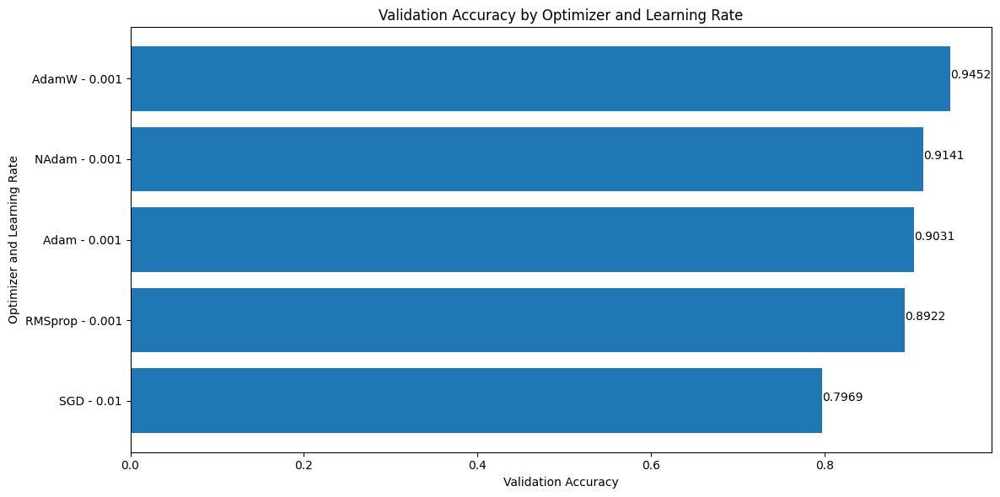

In [ ]:
# plot the results of the experiment
plot_optimizers_results(optimizers_df)

In [ ]:
# get and print best optimizer and learning rate
MR_best_optimizer_name = optimizers_df.iloc[0]['Optimizer']
MR_best_optimizer = torch.optim.__dict__[MR_best_optimizer_name]
print(f"Best optimizer: {MR_best_optimizer_name}")
MR_best_learning_rate = optimizers_df.iloc[0]['Best Learning Rate']
print(f"Best learning rate: {MR_best_learning_rate}")

Best optimizer: AdamW
Best learning rate: 0.001


Experiment 5. Try various activation functions.

In [ ]:
# experiment 5: activation functions
MR_model_act_fn_results = experiment_activation_functions(train_dataloader=train_dataloader_MR,
                                                          val_dataloader=val_dataloader_MR,
                                                          num_epochs=num_epochs,
                                                          device=device,
                                                          num_classes=num_classes,
                                                          best_hidden_units_combo=MR_best_hidden_units,
                                                          best_decay_value=MR_best_decay_value,
                                                          best_dropout_probs_combo=MR_best_dropout_probs,
                                                          best_optimizer=MR_best_optimizer,
                                                          best_learning_rate=MR_best_learning_rate)

Experimenting with Activation Functions
Activation functions to try: ['ReLU', 'LeakyReLU', 'ELU', 'GELU', 'SiLU']

Testing ReLU activation function as activation function in feature extractor...

Testing ReLU activation function as activation function in classifier...


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.1467 | train_acc: 0.2209 | val_loss: 1.7671 | val_acc: 0.3686
Epoch: 2 | train_loss: 1.7731 | train_acc: 0.3680 | val_loss: 1.4155 | val_acc: 0.5203
Epoch: 3 | train_loss: 1.5567 | train_acc: 0.4737 | val_loss: 1.2193 | val_acc: 0.5856
Epoch: 4 | train_loss: 1.3814 | train_acc: 0.5443 | val_loss: 1.1361 | val_acc: 0.6161
Epoch: 5 | train_loss: 1.2594 | train_acc: 0.5648 | val_loss: 0.9201 | val_acc: 0.6934
Epoch: 6 | train_loss: 1.1169 | train_acc: 0.6165 | val_loss: 0.7887 | val_acc: 0.7217
Epoch: 7 | train_loss: 1.0785 | train_acc: 0.6294 | val_loss: 0.7487 | val_acc: 0.7342
Epoch: 8 | train_loss: 0.9896 | train_acc: 0.6517 | val_loss: 0.7073 | val_acc: 0.7578
Epoch: 9 | train_loss: 0.9408 | train_acc: 0.6694 | val_loss: 0.6619 | val_acc: 0.7858
Epoch: 10 | train_loss: 0.9044 | train_acc: 0.6790 | val_loss: 0.6479 | val_acc: 0.8045
Epoch: 11 | train_loss: 0.8597 | train_acc: 0.7007 | val_loss: 0.6023 | val_acc: 0.8014
Epoch: 12 | train_loss: 0.8521 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.1493 | train_acc: 0.2099 | val_loss: 1.7330 | val_acc: 0.3844
Epoch: 2 | train_loss: 1.7385 | train_acc: 0.4031 | val_loss: 1.4372 | val_acc: 0.4953
Epoch: 3 | train_loss: 1.5570 | train_acc: 0.4556 | val_loss: 1.2718 | val_acc: 0.5795
Epoch: 4 | train_loss: 1.4617 | train_acc: 0.5018 | val_loss: 1.1815 | val_acc: 0.6438
Epoch: 5 | train_loss: 1.2752 | train_acc: 0.5666 | val_loss: 0.9829 | val_acc: 0.6500
Epoch: 6 | train_loss: 1.1525 | train_acc: 0.5949 | val_loss: 0.8946 | val_acc: 0.6839
Epoch: 7 | train_loss: 1.0410 | train_acc: 0.6303 | val_loss: 0.7480 | val_acc: 0.7484
Epoch: 8 | train_loss: 0.9995 | train_acc: 0.6465 | val_loss: 0.6945 | val_acc: 0.7562
Epoch: 9 | train_loss: 0.9553 | train_acc: 0.6670 | val_loss: 0.6913 | val_acc: 0.7670
Epoch: 10 | train_loss: 0.8924 | train_acc: 0.6831 | val_loss: 0.6487 | val_acc: 0.7891
Epoch: 11 | train_loss: 0.8651 | train_acc: 0.6933 | val_loss: 0.6272 | val_acc: 0.7747
Epoch: 12 | train_loss: 0.8567 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.0415 | train_acc: 0.2631 | val_loss: 1.6107 | val_acc: 0.4133
Epoch: 2 | train_loss: 1.6481 | train_acc: 0.4427 | val_loss: 1.3733 | val_acc: 0.5336
Epoch: 3 | train_loss: 1.4369 | train_acc: 0.5160 | val_loss: 1.1227 | val_acc: 0.6198
Epoch: 4 | train_loss: 1.2951 | train_acc: 0.5642 | val_loss: 1.0544 | val_acc: 0.6261
Epoch: 5 | train_loss: 1.1413 | train_acc: 0.6063 | val_loss: 0.8988 | val_acc: 0.6712
Epoch: 6 | train_loss: 1.0235 | train_acc: 0.6404 | val_loss: 0.7588 | val_acc: 0.7294
Epoch: 7 | train_loss: 0.9706 | train_acc: 0.6639 | val_loss: 0.7544 | val_acc: 0.7136
Epoch: 8 | train_loss: 0.8810 | train_acc: 0.6928 | val_loss: 0.6289 | val_acc: 0.7889
Epoch: 9 | train_loss: 0.8377 | train_acc: 0.7088 | val_loss: 0.5448 | val_acc: 0.8216
Epoch: 10 | train_loss: 0.8210 | train_acc: 0.7153 | val_loss: 0.5453 | val_acc: 0.8153
Epoch: 11 | train_loss: 0.7832 | train_acc: 0.7313 | val_loss: 0.5453 | val_acc: 0.8028
Epoch: 12 | train_loss: 0.7519 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.1007 | train_acc: 0.2484 | val_loss: 1.7089 | val_acc: 0.4248
Epoch: 2 | train_loss: 1.6786 | train_acc: 0.4313 | val_loss: 1.4026 | val_acc: 0.5637
Epoch: 3 | train_loss: 1.4883 | train_acc: 0.4987 | val_loss: 1.2208 | val_acc: 0.6170
Epoch: 4 | train_loss: 1.3379 | train_acc: 0.5483 | val_loss: 1.0942 | val_acc: 0.6481
Epoch: 5 | train_loss: 1.2201 | train_acc: 0.5885 | val_loss: 0.9721 | val_acc: 0.6731
Epoch: 6 | train_loss: 1.0957 | train_acc: 0.6290 | val_loss: 0.7954 | val_acc: 0.7294
Epoch: 7 | train_loss: 1.0561 | train_acc: 0.6507 | val_loss: 0.7587 | val_acc: 0.7295
Epoch: 8 | train_loss: 0.9534 | train_acc: 0.6792 | val_loss: 0.6843 | val_acc: 0.7545
Epoch: 9 | train_loss: 0.9456 | train_acc: 0.6804 | val_loss: 0.7109 | val_acc: 0.7344
Epoch: 10 | train_loss: 0.8901 | train_acc: 0.6916 | val_loss: 0.6617 | val_acc: 0.7795
Epoch: 11 | train_loss: 0.8511 | train_acc: 0.7074 | val_loss: 0.6096 | val_acc: 0.7889
Epoch: 12 | train_loss: 0.8203 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.1023 | train_acc: 0.2451 | val_loss: 1.6121 | val_acc: 0.4572
Epoch: 2 | train_loss: 1.7301 | train_acc: 0.4131 | val_loss: 1.4342 | val_acc: 0.5614
Epoch: 3 | train_loss: 1.5008 | train_acc: 0.5086 | val_loss: 1.1241 | val_acc: 0.6103
Epoch: 4 | train_loss: 1.2925 | train_acc: 0.5657 | val_loss: 0.9635 | val_acc: 0.6619
Epoch: 5 | train_loss: 1.1392 | train_acc: 0.6157 | val_loss: 0.8128 | val_acc: 0.7248
Epoch: 6 | train_loss: 1.0288 | train_acc: 0.6463 | val_loss: 0.8126 | val_acc: 0.6981
Epoch: 7 | train_loss: 0.9929 | train_acc: 0.6653 | val_loss: 0.6677 | val_acc: 0.7728
Epoch: 8 | train_loss: 0.9310 | train_acc: 0.6767 | val_loss: 0.6850 | val_acc: 0.7887
Epoch: 9 | train_loss: 0.8815 | train_acc: 0.6996 | val_loss: 0.6563 | val_acc: 0.7748
Epoch: 10 | train_loss: 0.8336 | train_acc: 0.7184 | val_loss: 0.6516 | val_acc: 0.7717
Epoch: 11 | train_loss: 0.8196 | train_acc: 0.7249 | val_loss: 0.7473 | val_acc: 0.7272
Epoch: 12 | train_loss: 0.7674 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.1554 | train_acc: 0.2340 | val_loss: 1.8399 | val_acc: 0.3453
Epoch: 2 | train_loss: 1.7547 | train_acc: 0.3961 | val_loss: 1.5452 | val_acc: 0.4764
Epoch: 3 | train_loss: 1.5580 | train_acc: 0.4721 | val_loss: 1.2649 | val_acc: 0.5947
Epoch: 4 | train_loss: 1.3399 | train_acc: 0.5509 | val_loss: 0.9675 | val_acc: 0.6886
Epoch: 5 | train_loss: 1.2012 | train_acc: 0.5964 | val_loss: 0.8982 | val_acc: 0.7167
Epoch: 6 | train_loss: 1.0740 | train_acc: 0.6385 | val_loss: 0.7999 | val_acc: 0.7169
Epoch: 7 | train_loss: 0.9839 | train_acc: 0.6671 | val_loss: 0.6740 | val_acc: 0.7841
Epoch: 8 | train_loss: 0.9856 | train_acc: 0.6712 | val_loss: 0.6773 | val_acc: 0.7672
Epoch: 9 | train_loss: 0.9013 | train_acc: 0.6890 | val_loss: 0.6137 | val_acc: 0.7684
Epoch: 10 | train_loss: 0.8555 | train_acc: 0.6994 | val_loss: 0.5758 | val_acc: 0.8077
Epoch: 11 | train_loss: 0.8524 | train_acc: 0.7121 | val_loss: 0.5463 | val_acc: 0.8141
Epoch: 12 | train_loss: 0.8255 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.1592 | train_acc: 0.2379 | val_loss: 1.6507 | val_acc: 0.4266
Epoch: 2 | train_loss: 1.7673 | train_acc: 0.4011 | val_loss: 1.4941 | val_acc: 0.5101
Epoch: 3 | train_loss: 1.6184 | train_acc: 0.4614 | val_loss: 1.3079 | val_acc: 0.5766
Epoch: 4 | train_loss: 1.4127 | train_acc: 0.5289 | val_loss: 1.1736 | val_acc: 0.6664
Epoch: 5 | train_loss: 1.2241 | train_acc: 0.5801 | val_loss: 0.9016 | val_acc: 0.7186
Epoch: 6 | train_loss: 1.0922 | train_acc: 0.6365 | val_loss: 0.8221 | val_acc: 0.7167
Epoch: 7 | train_loss: 1.0186 | train_acc: 0.6547 | val_loss: 0.7341 | val_acc: 0.7592
Epoch: 8 | train_loss: 0.9494 | train_acc: 0.6691 | val_loss: 0.7152 | val_acc: 0.7452
Epoch: 9 | train_loss: 0.9144 | train_acc: 0.6930 | val_loss: 0.6888 | val_acc: 0.7936
Epoch: 10 | train_loss: 0.8696 | train_acc: 0.7042 | val_loss: 0.6028 | val_acc: 0.7969
Epoch: 11 | train_loss: 0.8542 | train_acc: 0.7082 | val_loss: 0.5371 | val_acc: 0.8172
Epoch: 12 | train_loss: 0.7802 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.1037 | train_acc: 0.2609 | val_loss: 1.6146 | val_acc: 0.4436
Epoch: 2 | train_loss: 1.6536 | train_acc: 0.4399 | val_loss: 1.3607 | val_acc: 0.5139
Epoch: 3 | train_loss: 1.4272 | train_acc: 0.5186 | val_loss: 1.3217 | val_acc: 0.5554
Epoch: 4 | train_loss: 1.2769 | train_acc: 0.5796 | val_loss: 0.9076 | val_acc: 0.6733
Epoch: 5 | train_loss: 1.0758 | train_acc: 0.6381 | val_loss: 0.7787 | val_acc: 0.7358
Epoch: 6 | train_loss: 0.9972 | train_acc: 0.6644 | val_loss: 0.6462 | val_acc: 0.7700
Epoch: 7 | train_loss: 0.8909 | train_acc: 0.6982 | val_loss: 0.7494 | val_acc: 0.7434
Epoch: 8 | train_loss: 0.8508 | train_acc: 0.7083 | val_loss: 0.5718 | val_acc: 0.7962
Epoch: 9 | train_loss: 0.7929 | train_acc: 0.7252 | val_loss: 0.5164 | val_acc: 0.8545
Epoch: 10 | train_loss: 0.7528 | train_acc: 0.7475 | val_loss: 0.4688 | val_acc: 0.8577
Epoch: 11 | train_loss: 0.7262 | train_acc: 0.7523 | val_loss: 0.5620 | val_acc: 0.8193
Epoch: 12 | train_loss: 0.7297 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.1450 | train_acc: 0.2429 | val_loss: 1.8685 | val_acc: 0.4105
Epoch: 2 | train_loss: 1.7715 | train_acc: 0.4125 | val_loss: 1.4942 | val_acc: 0.5341
Epoch: 3 | train_loss: 1.5326 | train_acc: 0.4924 | val_loss: 1.2560 | val_acc: 0.5983
Epoch: 4 | train_loss: 1.3875 | train_acc: 0.5512 | val_loss: 0.9969 | val_acc: 0.6697
Epoch: 5 | train_loss: 1.2233 | train_acc: 0.5818 | val_loss: 0.9404 | val_acc: 0.6919
Epoch: 6 | train_loss: 1.1193 | train_acc: 0.6121 | val_loss: 0.8099 | val_acc: 0.7136
Epoch: 7 | train_loss: 1.0834 | train_acc: 0.6310 | val_loss: 0.8320 | val_acc: 0.7073
Epoch: 8 | train_loss: 0.9773 | train_acc: 0.6709 | val_loss: 0.7930 | val_acc: 0.7334
Epoch: 9 | train_loss: 0.9044 | train_acc: 0.6901 | val_loss: 0.6410 | val_acc: 0.7873
Epoch: 10 | train_loss: 0.8810 | train_acc: 0.6936 | val_loss: 0.5645 | val_acc: 0.8170
Epoch: 11 | train_loss: 0.8431 | train_acc: 0.7054 | val_loss: 0.5812 | val_acc: 0.8059
Epoch: 12 | train_loss: 0.8077 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.0685 | train_acc: 0.2731 | val_loss: 1.8715 | val_acc: 0.3275
Epoch: 2 | train_loss: 1.6996 | train_acc: 0.4328 | val_loss: 1.7180 | val_acc: 0.4003
Epoch: 3 | train_loss: 1.4788 | train_acc: 0.5074 | val_loss: 1.1440 | val_acc: 0.6217
Epoch: 4 | train_loss: 1.3384 | train_acc: 0.5537 | val_loss: 1.0557 | val_acc: 0.6702
Epoch: 5 | train_loss: 1.1532 | train_acc: 0.6098 | val_loss: 0.8436 | val_acc: 0.7061
Epoch: 6 | train_loss: 1.0375 | train_acc: 0.6552 | val_loss: 0.7458 | val_acc: 0.7406
Epoch: 7 | train_loss: 0.9904 | train_acc: 0.6623 | val_loss: 0.7427 | val_acc: 0.7233
Epoch: 8 | train_loss: 0.8963 | train_acc: 0.6968 | val_loss: 0.6650 | val_acc: 0.7873
Epoch: 9 | train_loss: 0.8569 | train_acc: 0.7056 | val_loss: 0.6183 | val_acc: 0.7967
Epoch: 10 | train_loss: 0.8396 | train_acc: 0.7135 | val_loss: 0.5769 | val_acc: 0.7950
Epoch: 11 | train_loss: 0.7960 | train_acc: 0.7237 | val_loss: 0.5525 | val_acc: 0.8077
Epoch: 12 | train_loss: 0.7504 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.8591 | train_acc: 0.3550 | val_loss: 1.0119 | val_acc: 0.6745
Epoch: 2 | train_loss: 1.2180 | train_acc: 0.5712 | val_loss: 0.6941 | val_acc: 0.7672
Epoch: 3 | train_loss: 1.0308 | train_acc: 0.6446 | val_loss: 0.5751 | val_acc: 0.8031
Epoch: 4 | train_loss: 0.8934 | train_acc: 0.7081 | val_loss: 0.4605 | val_acc: 0.8389
Epoch: 5 | train_loss: 0.7999 | train_acc: 0.7222 | val_loss: 0.3805 | val_acc: 0.8672
Epoch: 6 | train_loss: 0.7823 | train_acc: 0.7382 | val_loss: 0.3792 | val_acc: 0.8561
Epoch: 7 | train_loss: 0.7515 | train_acc: 0.7400 | val_loss: 0.3528 | val_acc: 0.8594
Epoch: 8 | train_loss: 0.7060 | train_acc: 0.7583 | val_loss: 0.3048 | val_acc: 0.8750
Epoch: 9 | train_loss: 0.6720 | train_acc: 0.7581 | val_loss: 0.2562 | val_acc: 0.9234
Epoch: 10 | train_loss: 0.6663 | train_acc: 0.7713 | val_loss: 0.2517 | val_acc: 0.9062
Epoch: 11 | train_loss: 0.6370 | train_acc: 0.7891 | val_loss: 0.2672 | val_acc: 0.8967
Epoch: 12 | train_loss: 0.6296 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.9502 | train_acc: 0.3098 | val_loss: 1.0865 | val_acc: 0.6438
Epoch: 2 | train_loss: 1.2693 | train_acc: 0.5583 | val_loss: 0.7261 | val_acc: 0.7570
Epoch: 3 | train_loss: 1.0615 | train_acc: 0.6402 | val_loss: 0.5590 | val_acc: 0.7929
Epoch: 4 | train_loss: 0.8632 | train_acc: 0.6973 | val_loss: 0.5132 | val_acc: 0.8375
Epoch: 5 | train_loss: 0.8149 | train_acc: 0.7123 | val_loss: 0.4562 | val_acc: 0.8438
Epoch: 6 | train_loss: 0.8155 | train_acc: 0.7180 | val_loss: 0.3784 | val_acc: 0.8453
Epoch: 7 | train_loss: 0.7708 | train_acc: 0.7383 | val_loss: 0.3466 | val_acc: 0.8686
Epoch: 8 | train_loss: 0.7206 | train_acc: 0.7580 | val_loss: 0.3314 | val_acc: 0.8641
Epoch: 9 | train_loss: 0.6796 | train_acc: 0.7647 | val_loss: 0.2988 | val_acc: 0.8825
Epoch: 10 | train_loss: 0.6538 | train_acc: 0.7790 | val_loss: 0.3025 | val_acc: 0.8938
Epoch: 11 | train_loss: 0.6459 | train_acc: 0.7741 | val_loss: 0.3103 | val_acc: 0.8762
Epoch: 12 | train_loss: 0.5933 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.8043 | train_acc: 0.3589 | val_loss: 0.9041 | val_acc: 0.6912
Epoch: 2 | train_loss: 1.1130 | train_acc: 0.6128 | val_loss: 0.5727 | val_acc: 0.8077
Epoch: 3 | train_loss: 0.9293 | train_acc: 0.6735 | val_loss: 0.4920 | val_acc: 0.8234
Epoch: 4 | train_loss: 0.8153 | train_acc: 0.7103 | val_loss: 0.3839 | val_acc: 0.8733
Epoch: 5 | train_loss: 0.7511 | train_acc: 0.7410 | val_loss: 0.3643 | val_acc: 0.8656
Epoch: 6 | train_loss: 0.6863 | train_acc: 0.7614 | val_loss: 0.3186 | val_acc: 0.8952
Epoch: 7 | train_loss: 0.6480 | train_acc: 0.7773 | val_loss: 0.2769 | val_acc: 0.8969
Epoch: 8 | train_loss: 0.6111 | train_acc: 0.7860 | val_loss: 0.2491 | val_acc: 0.9123
Epoch: 9 | train_loss: 0.6313 | train_acc: 0.7716 | val_loss: 0.2676 | val_acc: 0.9153
Epoch: 10 | train_loss: 0.6000 | train_acc: 0.7986 | val_loss: 0.2467 | val_acc: 0.9094
Epoch: 11 | train_loss: 0.6055 | train_acc: 0.7986 | val_loss: 0.2404 | val_acc: 0.9139
Epoch: 12 | train_loss: 0.5772 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.7804 | train_acc: 0.3815 | val_loss: 0.9350 | val_acc: 0.6750
Epoch: 2 | train_loss: 1.1632 | train_acc: 0.5981 | val_loss: 0.6600 | val_acc: 0.7865
Epoch: 3 | train_loss: 0.9657 | train_acc: 0.6693 | val_loss: 0.5227 | val_acc: 0.8219
Epoch: 4 | train_loss: 0.8663 | train_acc: 0.6984 | val_loss: 0.4831 | val_acc: 0.8109
Epoch: 5 | train_loss: 0.8234 | train_acc: 0.7103 | val_loss: 0.3968 | val_acc: 0.8562
Epoch: 6 | train_loss: 0.7748 | train_acc: 0.7376 | val_loss: 0.3827 | val_acc: 0.8497
Epoch: 7 | train_loss: 0.7262 | train_acc: 0.7380 | val_loss: 0.2908 | val_acc: 0.8828
Epoch: 8 | train_loss: 0.6858 | train_acc: 0.7715 | val_loss: 0.3140 | val_acc: 0.8952
Epoch: 9 | train_loss: 0.6689 | train_acc: 0.7640 | val_loss: 0.2613 | val_acc: 0.9109
Epoch: 10 | train_loss: 0.6525 | train_acc: 0.7778 | val_loss: 0.2734 | val_acc: 0.9062
Epoch: 11 | train_loss: 0.6288 | train_acc: 0.7802 | val_loss: 0.2659 | val_acc: 0.9120
Epoch: 12 | train_loss: 0.6130 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.9037 | train_acc: 0.3236 | val_loss: 1.0196 | val_acc: 0.6875
Epoch: 2 | train_loss: 1.2211 | train_acc: 0.5806 | val_loss: 0.7072 | val_acc: 0.7703
Epoch: 3 | train_loss: 1.0011 | train_acc: 0.6451 | val_loss: 0.5469 | val_acc: 0.8169
Epoch: 4 | train_loss: 0.9278 | train_acc: 0.7027 | val_loss: 0.4920 | val_acc: 0.8290
Epoch: 5 | train_loss: 0.8203 | train_acc: 0.7111 | val_loss: 0.4603 | val_acc: 0.8589
Epoch: 6 | train_loss: 0.7778 | train_acc: 0.7279 | val_loss: 0.3742 | val_acc: 0.8578
Epoch: 7 | train_loss: 0.7995 | train_acc: 0.7271 | val_loss: 0.3607 | val_acc: 0.8933
Epoch: 8 | train_loss: 0.7390 | train_acc: 0.7480 | val_loss: 0.3031 | val_acc: 0.9125
Epoch: 9 | train_loss: 0.6638 | train_acc: 0.7803 | val_loss: 0.2706 | val_acc: 0.9078
Epoch: 10 | train_loss: 0.6548 | train_acc: 0.7678 | val_loss: 0.2785 | val_acc: 0.9125
Epoch: 11 | train_loss: 0.6131 | train_acc: 0.7904 | val_loss: 0.2650 | val_acc: 0.9078
Epoch: 12 | train_loss: 0.6327 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.0185 | train_acc: 0.2836 | val_loss: 1.5699 | val_acc: 0.4858
Epoch: 2 | train_loss: 1.4910 | train_acc: 0.4826 | val_loss: 0.9755 | val_acc: 0.6530
Epoch: 3 | train_loss: 1.1485 | train_acc: 0.6045 | val_loss: 1.3921 | val_acc: 0.5398
Epoch: 4 | train_loss: 1.0376 | train_acc: 0.6445 | val_loss: 0.8467 | val_acc: 0.7332
Epoch: 5 | train_loss: 0.8897 | train_acc: 0.6870 | val_loss: 0.7436 | val_acc: 0.7372
Epoch: 6 | train_loss: 0.8655 | train_acc: 0.7101 | val_loss: 0.7882 | val_acc: 0.7354
Epoch: 7 | train_loss: 0.7804 | train_acc: 0.7292 | val_loss: 0.5872 | val_acc: 0.8051
Epoch: 8 | train_loss: 0.7848 | train_acc: 0.7301 | val_loss: 0.7771 | val_acc: 0.7151
Epoch: 9 | train_loss: 0.7573 | train_acc: 0.7395 | val_loss: 0.5435 | val_acc: 0.8098
Epoch: 10 | train_loss: 0.6937 | train_acc: 0.7571 | val_loss: 0.6078 | val_acc: 0.7845
Epoch: 11 | train_loss: 0.6687 | train_acc: 0.7793 | val_loss: 0.5407 | val_acc: 0.8076
Epoch: 12 | train_loss: 0.6739 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.9840 | train_acc: 0.3006 | val_loss: 1.7160 | val_acc: 0.3827
Epoch: 2 | train_loss: 1.4961 | train_acc: 0.4797 | val_loss: 1.1428 | val_acc: 0.6287
Epoch: 3 | train_loss: 1.1988 | train_acc: 0.5883 | val_loss: 0.9040 | val_acc: 0.7059
Epoch: 4 | train_loss: 1.0004 | train_acc: 0.6407 | val_loss: 0.8392 | val_acc: 0.6948
Epoch: 5 | train_loss: 0.9342 | train_acc: 0.6721 | val_loss: 0.6663 | val_acc: 0.7623
Epoch: 6 | train_loss: 0.8702 | train_acc: 0.6970 | val_loss: 0.6261 | val_acc: 0.7809
Epoch: 7 | train_loss: 0.8082 | train_acc: 0.7129 | val_loss: 0.6874 | val_acc: 0.7633
Epoch: 8 | train_loss: 0.7799 | train_acc: 0.7259 | val_loss: 0.7348 | val_acc: 0.7269
Epoch: 9 | train_loss: 0.7386 | train_acc: 0.7414 | val_loss: 0.5674 | val_acc: 0.7931
Epoch: 10 | train_loss: 0.7141 | train_acc: 0.7455 | val_loss: 0.5295 | val_acc: 0.8086
Epoch: 11 | train_loss: 0.7087 | train_acc: 0.7492 | val_loss: 0.4401 | val_acc: 0.8419
Epoch: 12 | train_loss: 0.6367 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.8844 | train_acc: 0.3144 | val_loss: 1.5897 | val_acc: 0.4371
Epoch: 2 | train_loss: 1.3808 | train_acc: 0.5326 | val_loss: 1.0787 | val_acc: 0.6155
Epoch: 3 | train_loss: 1.1101 | train_acc: 0.6077 | val_loss: 0.8360 | val_acc: 0.7082
Epoch: 4 | train_loss: 0.9833 | train_acc: 0.6656 | val_loss: 0.8809 | val_acc: 0.6954
Epoch: 5 | train_loss: 0.8712 | train_acc: 0.7076 | val_loss: 0.7737 | val_acc: 0.7240
Epoch: 6 | train_loss: 0.8037 | train_acc: 0.7277 | val_loss: 0.8421 | val_acc: 0.6864
Epoch: 7 | train_loss: 0.7699 | train_acc: 0.7309 | val_loss: 0.5525 | val_acc: 0.7825
Epoch: 8 | train_loss: 0.7740 | train_acc: 0.7368 | val_loss: 0.5737 | val_acc: 0.7920
Epoch: 9 | train_loss: 0.6477 | train_acc: 0.7840 | val_loss: 0.4465 | val_acc: 0.8155
Epoch: 10 | train_loss: 0.6235 | train_acc: 0.7770 | val_loss: 0.4614 | val_acc: 0.8295
Epoch: 11 | train_loss: 0.6341 | train_acc: 0.7855 | val_loss: 0.4234 | val_acc: 0.8389
Epoch: 12 | train_loss: 0.5730 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.9451 | train_acc: 0.3220 | val_loss: 1.4317 | val_acc: 0.5431
Epoch: 2 | train_loss: 1.3343 | train_acc: 0.5507 | val_loss: 1.1720 | val_acc: 0.5689
Epoch: 3 | train_loss: 1.0329 | train_acc: 0.6387 | val_loss: 0.7655 | val_acc: 0.7308
Epoch: 4 | train_loss: 0.8931 | train_acc: 0.6891 | val_loss: 0.9335 | val_acc: 0.6648
Epoch: 5 | train_loss: 0.8843 | train_acc: 0.7048 | val_loss: 0.6437 | val_acc: 0.7669
Epoch: 6 | train_loss: 0.7642 | train_acc: 0.7407 | val_loss: 0.5798 | val_acc: 0.7907
Epoch: 7 | train_loss: 0.7636 | train_acc: 0.7294 | val_loss: 0.5416 | val_acc: 0.8009
Epoch: 8 | train_loss: 0.7208 | train_acc: 0.7522 | val_loss: 0.5777 | val_acc: 0.7818
Epoch: 9 | train_loss: 0.6896 | train_acc: 0.7565 | val_loss: 0.4161 | val_acc: 0.8389
Epoch: 10 | train_loss: 0.6505 | train_acc: 0.7716 | val_loss: 0.4029 | val_acc: 0.8436
Epoch: 11 | train_loss: 0.6467 | train_acc: 0.7756 | val_loss: 0.4064 | val_acc: 0.8514
Epoch: 12 | train_loss: 0.6332 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.9485 | train_acc: 0.2974 | val_loss: 1.4783 | val_acc: 0.4878
Epoch: 2 | train_loss: 1.4090 | train_acc: 0.5270 | val_loss: 0.8908 | val_acc: 0.6667
Epoch: 3 | train_loss: 1.0676 | train_acc: 0.6223 | val_loss: 1.0645 | val_acc: 0.6048
Epoch: 4 | train_loss: 0.9752 | train_acc: 0.6602 | val_loss: 0.9001 | val_acc: 0.7045
Epoch: 5 | train_loss: 0.8703 | train_acc: 0.6969 | val_loss: 0.7254 | val_acc: 0.7415
Epoch: 6 | train_loss: 0.8443 | train_acc: 0.7019 | val_loss: 0.6727 | val_acc: 0.7554
Epoch: 7 | train_loss: 0.7842 | train_acc: 0.7272 | val_loss: 0.7859 | val_acc: 0.6918
Epoch: 8 | train_loss: 0.7603 | train_acc: 0.7393 | val_loss: 0.5166 | val_acc: 0.7995
Epoch: 9 | train_loss: 0.7026 | train_acc: 0.7542 | val_loss: 0.5960 | val_acc: 0.7606
Epoch: 10 | train_loss: 0.6682 | train_acc: 0.7702 | val_loss: 0.4455 | val_acc: 0.8139
Epoch: 11 | train_loss: 0.6757 | train_acc: 0.7766 | val_loss: 0.3938 | val_acc: 0.8387
Epoch: 12 | train_loss: 0.6012 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.9323 | train_acc: 0.3109 | val_loss: 1.3876 | val_acc: 0.5217
Epoch: 2 | train_loss: 1.3860 | train_acc: 0.5269 | val_loss: 0.9834 | val_acc: 0.6753
Epoch: 3 | train_loss: 1.0989 | train_acc: 0.6233 | val_loss: 0.7072 | val_acc: 0.7464
Epoch: 4 | train_loss: 0.9197 | train_acc: 0.6827 | val_loss: 0.6568 | val_acc: 0.7570
Epoch: 5 | train_loss: 0.8230 | train_acc: 0.7146 | val_loss: 0.6203 | val_acc: 0.7673
Epoch: 6 | train_loss: 0.8200 | train_acc: 0.7278 | val_loss: 0.6187 | val_acc: 0.7673
Epoch: 7 | train_loss: 0.7703 | train_acc: 0.7395 | val_loss: 0.5335 | val_acc: 0.8184
Epoch: 8 | train_loss: 0.7073 | train_acc: 0.7570 | val_loss: 0.4174 | val_acc: 0.8670
Epoch: 9 | train_loss: 0.6684 | train_acc: 0.7702 | val_loss: 0.4505 | val_acc: 0.8261
Epoch: 10 | train_loss: 0.6365 | train_acc: 0.7764 | val_loss: 0.3872 | val_acc: 0.8589
Epoch: 11 | train_loss: 0.6238 | train_acc: 0.7825 | val_loss: 0.3351 | val_acc: 0.8853
Epoch: 12 | train_loss: 0.5953 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.9811 | train_acc: 0.2742 | val_loss: 1.5333 | val_acc: 0.5156
Epoch: 2 | train_loss: 1.5381 | train_acc: 0.4731 | val_loss: 1.0431 | val_acc: 0.6839
Epoch: 3 | train_loss: 1.1838 | train_acc: 0.5964 | val_loss: 0.8240 | val_acc: 0.7133
Epoch: 4 | train_loss: 0.9987 | train_acc: 0.6557 | val_loss: 0.6720 | val_acc: 0.7434
Epoch: 5 | train_loss: 0.9271 | train_acc: 0.6785 | val_loss: 0.6318 | val_acc: 0.7773
Epoch: 6 | train_loss: 0.8409 | train_acc: 0.7157 | val_loss: 0.5948 | val_acc: 0.7855
Epoch: 7 | train_loss: 0.7873 | train_acc: 0.7350 | val_loss: 0.5210 | val_acc: 0.8037
Epoch: 8 | train_loss: 0.7749 | train_acc: 0.7303 | val_loss: 0.5081 | val_acc: 0.8143
Epoch: 9 | train_loss: 0.6816 | train_acc: 0.7654 | val_loss: 0.4157 | val_acc: 0.8558
Epoch: 10 | train_loss: 0.6501 | train_acc: 0.7820 | val_loss: 0.4123 | val_acc: 0.8512
Epoch: 11 | train_loss: 0.6383 | train_acc: 0.7687 | val_loss: 0.3374 | val_acc: 0.8859
Epoch: 12 | train_loss: 0.6285 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.8385 | train_acc: 0.3498 | val_loss: 1.2967 | val_acc: 0.5886
Epoch: 2 | train_loss: 1.2726 | train_acc: 0.5765 | val_loss: 0.9010 | val_acc: 0.6786
Epoch: 3 | train_loss: 0.9941 | train_acc: 0.6624 | val_loss: 0.6244 | val_acc: 0.7762
Epoch: 4 | train_loss: 0.8484 | train_acc: 0.7141 | val_loss: 0.6208 | val_acc: 0.7586
Epoch: 5 | train_loss: 0.7665 | train_acc: 0.7414 | val_loss: 0.4461 | val_acc: 0.8609
Epoch: 6 | train_loss: 0.7088 | train_acc: 0.7464 | val_loss: 0.6962 | val_acc: 0.7394
Epoch: 7 | train_loss: 0.7085 | train_acc: 0.7574 | val_loss: 0.4667 | val_acc: 0.8426
Epoch: 8 | train_loss: 0.6518 | train_acc: 0.7748 | val_loss: 0.3428 | val_acc: 0.8776
Epoch: 9 | train_loss: 0.6216 | train_acc: 0.7788 | val_loss: 0.3867 | val_acc: 0.8839
Epoch: 10 | train_loss: 0.5952 | train_acc: 0.8026 | val_loss: 0.2847 | val_acc: 0.9123
Epoch: 11 | train_loss: 0.5415 | train_acc: 0.8231 | val_loss: 0.3241 | val_acc: 0.8808
Epoch: 12 | train_loss: 0.5150 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.9069 | train_acc: 0.3143 | val_loss: 1.2050 | val_acc: 0.6234
Epoch: 2 | train_loss: 1.2844 | train_acc: 0.5687 | val_loss: 0.8964 | val_acc: 0.6614
Epoch: 3 | train_loss: 1.0274 | train_acc: 0.6576 | val_loss: 0.6919 | val_acc: 0.7697
Epoch: 4 | train_loss: 0.8828 | train_acc: 0.6974 | val_loss: 0.6966 | val_acc: 0.7661
Epoch: 5 | train_loss: 0.8224 | train_acc: 0.7143 | val_loss: 0.6063 | val_acc: 0.7772
Epoch: 6 | train_loss: 0.7974 | train_acc: 0.7319 | val_loss: 0.4782 | val_acc: 0.8450
Epoch: 7 | train_loss: 0.7042 | train_acc: 0.7513 | val_loss: 0.4364 | val_acc: 0.8577
Epoch: 8 | train_loss: 0.6699 | train_acc: 0.7728 | val_loss: 0.4484 | val_acc: 0.8276
Epoch: 9 | train_loss: 0.6406 | train_acc: 0.7723 | val_loss: 0.3151 | val_acc: 0.8938
Epoch: 10 | train_loss: 0.6355 | train_acc: 0.7794 | val_loss: 0.3273 | val_acc: 0.8780
Epoch: 11 | train_loss: 0.6443 | train_acc: 0.7837 | val_loss: 0.3299 | val_acc: 0.8889
Epoch: 12 | train_loss: 0.5726 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.9494 | train_acc: 0.2991 | val_loss: 1.4628 | val_acc: 0.5245
Epoch: 2 | train_loss: 1.4094 | train_acc: 0.5185 | val_loss: 0.9324 | val_acc: 0.6873
Epoch: 3 | train_loss: 1.1029 | train_acc: 0.6281 | val_loss: 0.8037 | val_acc: 0.7259
Epoch: 4 | train_loss: 0.9158 | train_acc: 0.6676 | val_loss: 0.6887 | val_acc: 0.7415
Epoch: 5 | train_loss: 0.8716 | train_acc: 0.6969 | val_loss: 0.5350 | val_acc: 0.8123
Epoch: 6 | train_loss: 0.7933 | train_acc: 0.7284 | val_loss: 0.4872 | val_acc: 0.8294
Epoch: 7 | train_loss: 0.7321 | train_acc: 0.7535 | val_loss: 0.4786 | val_acc: 0.8233
Epoch: 8 | train_loss: 0.6863 | train_acc: 0.7549 | val_loss: 0.4031 | val_acc: 0.8514
Epoch: 9 | train_loss: 0.6439 | train_acc: 0.7738 | val_loss: 0.4075 | val_acc: 0.8591
Epoch: 10 | train_loss: 0.6374 | train_acc: 0.7795 | val_loss: 0.3199 | val_acc: 0.9061
Epoch: 11 | train_loss: 0.5982 | train_acc: 0.7893 | val_loss: 0.2827 | val_acc: 0.9094
Epoch: 12 | train_loss: 0.5856 | train_ac

In [ ]:
# put all the results in a table and print it
activation_df = pd.DataFrame(MR_model_act_fn_results, columns=['Activation Function 1', 'Activation Function 2', 'Validation Accuracy'])
activation_df = activation_df.sort_values(by='Validation Accuracy', ascending=False)[:10]
print("\n", activation_df.to_string(index=False))


 Activation Function 1 Activation Function 2  Validation Accuracy
                 SiLU             LeakyReLU             0.975000
                 GELU                  GELU             0.973437
                 SiLU                  SiLU             0.973276
                 SiLU                  GELU             0.971875
                  ELU                  ReLU             0.967187
                  ELU                  GELU             0.967187
                  ELU                  SiLU             0.965625
                 GELU                  SiLU             0.965625
                 SiLU                   ELU             0.965625
                 SiLU                  ReLU             0.964063


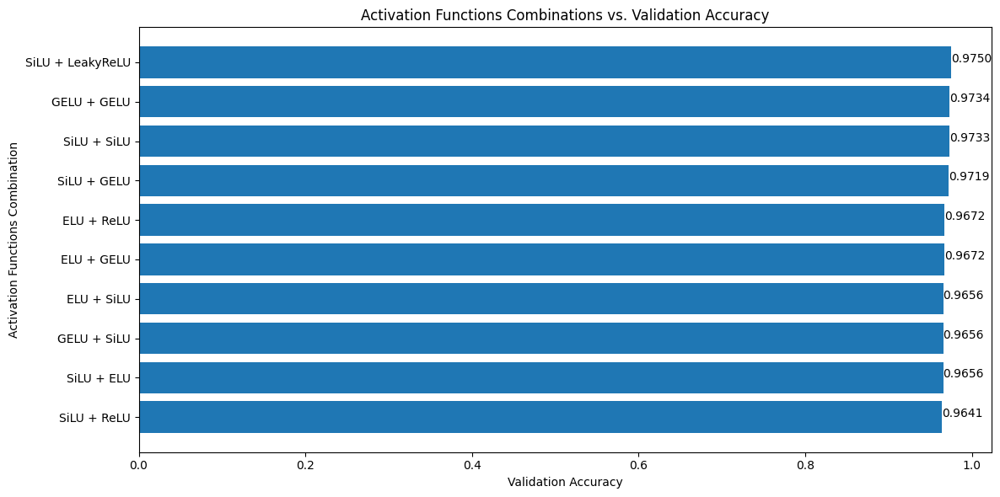

In [ ]:
# plot the results of activation functions experiment
plot_activation_function_results(activation_df)

In [ ]:
# print best performing activation functions combo
MR_best_activation_functions_names = activation_df.iloc[0]['Activation Function 1'], activation_df.iloc[0]['Activation Function 2']
print(f"Best activation functions: {MR_best_activation_functions_names}")

# convert string names to actual nn modules using getattr
MR_best_activation_functions = [getattr(nn, name)() for name in MR_best_activation_functions_names]

Best activation functions: ('SiLU', 'LeakyReLU')


We combine all the best hyperparameters found above to train a new model for MR / L dataset.

In [ ]:
# best configuration in a dictionary
MR_best_config = {
    'model': 'CNN_v2',
    'loss_fn': nn.CrossEntropyLoss(),
    'best_decay_value': MR_best_decay_value,
    'best_dropout_probs_combo': MR_best_dropout_probs,
    'best_hidden_units_combo': MR_best_hidden_units,
    'best_optimizer': MR_best_optimizer,
    'best_learning_rate': MR_best_learning_rate,
    'best_activation_functions': MR_best_activation_functions,
    'best_batch_size': batch_size,
    'epochs': num_epochs
}

In [ ]:
# put it all together

# create a model
MR_model_1 = CNN_v2(out_features=num_classes, hidden_units=MR_best_hidden_units, dropout_probs=MR_best_dropout_probs, activation_functions=MR_best_activation_functions).to(device)

# set loss function and optimizer
loss_fn = nn.CrossEntropyLoss()
optimizer = MR_best_optimizer(params=MR_model_1.parameters(), lr=MR_best_learning_rate, weight_decay=MR_best_decay_value)

# start training
print("Starting training...")
start_time = time.time()
MR_model_1_results = train(model=MR_model_1,
                           train_dataloader=train_dataloader_MR,
                           test_dataloader=val_dataloader_MR,
                           optimizer=optimizer,
                           loss_fn=loss_fn,
                           epochs=num_epochs,
                           device=device)
end_time = time.time()

# calculate and print total training time
MR_model_1_training_time = end_time - start_time
print(f"\nTotal training time: {MR_model_1_training_time:.3f} seconds")

# calculate and print total trainabale params
MR_model_1_total_params = sum(p.numel() for p in MR_model_1.parameters() if p.requires_grad)
print(f"Total trainable params: {MR_model_1_total_params}")

Starting training...


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.9690 | train_acc: 0.3018 | val_loss: 1.4959 | val_acc: 0.5526
Epoch: 2 | train_loss: 1.4245 | train_acc: 0.5106 | val_loss: 0.9543 | val_acc: 0.6884
Epoch: 3 | train_loss: 1.0796 | train_acc: 0.6315 | val_loss: 0.9179 | val_acc: 0.6921
Epoch: 4 | train_loss: 0.9174 | train_acc: 0.6923 | val_loss: 0.6029 | val_acc: 0.7912
Epoch: 5 | train_loss: 0.8453 | train_acc: 0.7028 | val_loss: 0.5749 | val_acc: 0.8025
Epoch: 6 | train_loss: 0.7920 | train_acc: 0.7304 | val_loss: 0.5259 | val_acc: 0.8101
Epoch: 7 | train_loss: 0.7210 | train_acc: 0.7443 | val_loss: 0.4256 | val_acc: 0.8605
Epoch: 8 | train_loss: 0.6796 | train_acc: 0.7699 | val_loss: 0.3767 | val_acc: 0.8480
Epoch: 9 | train_loss: 0.6833 | train_acc: 0.7681 | val_loss: 0.4345 | val_acc: 0.8445
Epoch: 10 | train_loss: 0.6266 | train_acc: 0.7836 | val_loss: 0.3576 | val_acc: 0.8683
Epoch: 11 | train_loss: 0.6458 | train_acc: 0.7778 | val_loss: 0.3512 | val_acc: 0.8589
Epoch: 12 | train_loss: 0.6045 | train_ac

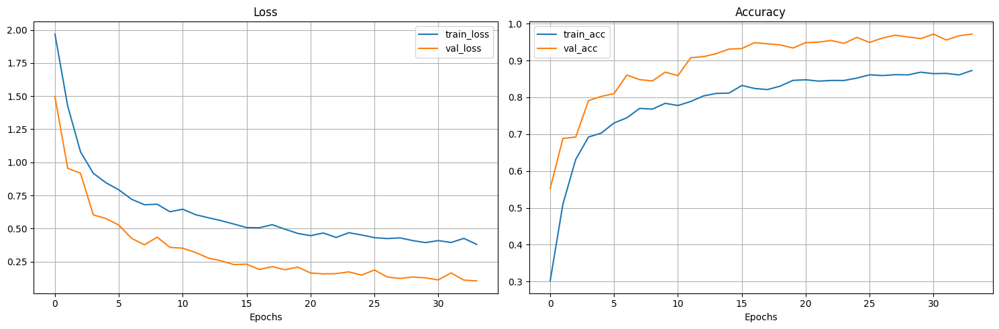

In [ ]:
# plot loss curves
plot_loss_curves(MR_model_1_results)

We observe an improvement in validation accuracy compared to the baseline model. Let's save the model and try some more experiments.


In [ ]:
# print final model's val accuracy
MR_model_1_acc = MR_model_1_results['val_acc'][-1]
print(f"Final model accuracy: {MR_model_1_acc}")

# save the MR final model 1 with best configuration found
torch.save(MR_model_1.state_dict(), os.path.join(project_models_path, 'MR_model_1.pth'))
print("Model saved to 'MR_model_1.pth'")

Final model accuracy: 0.9717133620689655
Model saved to 'MR_model_1.pth'


In the combined dataset scenario, where the training data is almost doubled, we achieve significantly better accuracy compared to using individual datasets. This improvement occurs because the larger (and more diverse) dataset enables the model to learn more robust features and generalize more effectively across varying examples.

Let's take a look at the results using evaluation metrics such as precision, recall, and the confusion matrix.

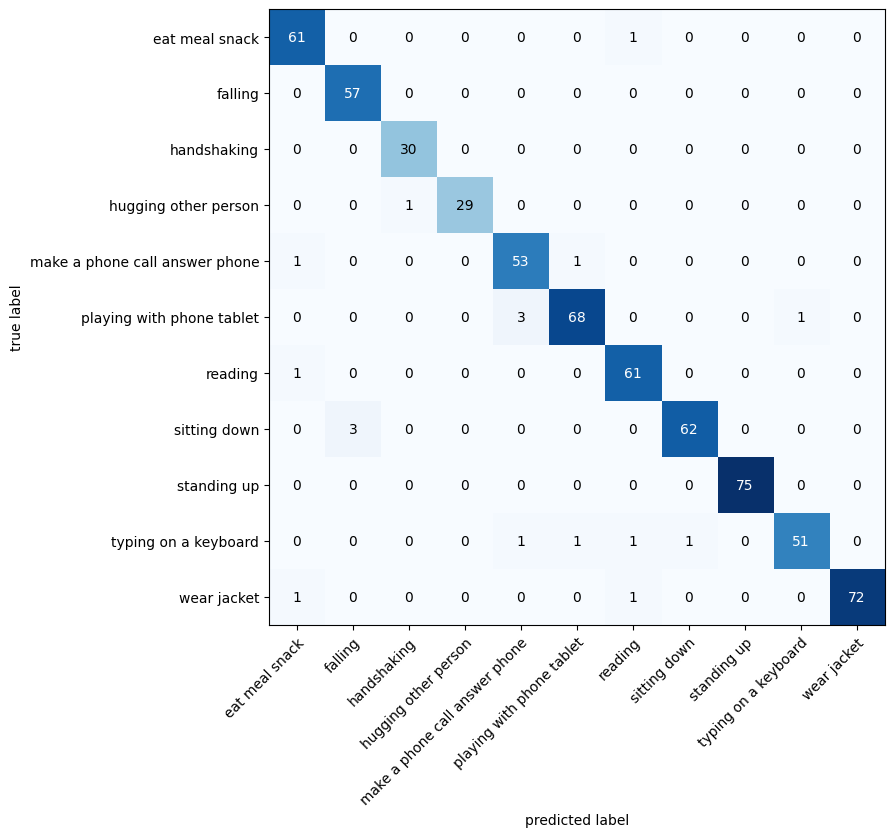

In [ ]:
# evaluation with torchmetrics

# retrieve actual and predicted labels and convert them to tensors for later process
MR_model_1_y_true = torch.tensor(MR_model_1_results['y_true'])
MR_model_1_y_pred = torch.tensor(MR_model_1_results['y_preds'])

# setup confusion matrix instance and compare predictions to targets
confmat = ConfusionMatrix(num_classes=len(class_names), task='multiclass')
confmat_tensor = confmat(MR_model_1_y_pred.clone().detach(), MR_model_1_y_true.clone().detach())

# plot the confusion matrix
fig, ax = plot_confusion_matrix(conf_mat=confmat_tensor.numpy(), class_names=class_names, figsize=(20,8));

In [ ]:
# calculate precision, recall and F1 scores using torchmetrics
precision = Precision(average='macro', num_classes=len(class_names), task='multiclass')
recall = Recall(average='macro', num_classes=len(class_names), task='multiclass')
f1 = F1Score(average='macro', num_classes=len(class_names), task='multiclass')

prec = precision(MR_model_1_y_pred, MR_model_1_y_true)
rec = recall(MR_model_1_y_pred, MR_model_1_y_true)
f1_score = f1(MR_model_1_y_pred, MR_model_1_y_true)

# print the results
print(f"Precision: {prec:.4f}\nRecall: {rec:.4f}\nF1-Score: {f1_score:.4f}")

Precision: 0.9718
Recall: 0.9724
F1-Score: 0.9718


In [ ]:
# classification report
print("Classification Report:")
print(classification_report(y_true=MR_model_1_y_true, y_pred=MR_model_1_y_pred, zero_division=1))

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.98      0.97        62
           1       0.95      1.00      0.97        57
           2       0.97      1.00      0.98        30
           3       1.00      0.97      0.98        30
           4       0.93      0.96      0.95        55
           5       0.97      0.94      0.96        72
           6       0.95      0.98      0.97        62
           7       0.98      0.95      0.97        65
           8       1.00      1.00      1.00        75
           9       0.98      0.93      0.95        55
          10       1.00      0.97      0.99        74

    accuracy                           0.97       637
   macro avg       0.97      0.97      0.97       637
weighted avg       0.97      0.97      0.97       637



As expected, the precision, recall, and F1 scores are very similar, all reaching perfect levels.

Experiment 6. Apply Cross-Validation.

As usual, we merge the training and validation datasets into one unified set before applying our method.

In [ ]:
# experiment 6: cross validation (1)

# combine train and validation sets

# define paths
source_dirs_MR = ['/content/project/data/ResActionsImagesMR/train', '/content/project/data/ResActionsImagesMR/validation']
destination_dir_MR = '/content/project/data/ResActionsImagesMR/train_val_combined'

# create the destination directory if it doesn't exist
if not os.path.exists(destination_dir_MR):
  os.makedirs(destination_dir_MR)

# loop over all source dirs (train, validation) in ResActionsImagesMR
for source_dir in source_dirs_MR:
  # loop over all class dirs
  for class_dir in os.listdir(source_dir):

    # existing class path, we will use it for copying
    class_path = os.path.join(source_dir, class_dir)

    # create class dir in destination dir if doesn't exist (this goes in case of multiple runs)
    dest_class_path = os.path.join(destination_dir_MR, class_dir)
    if not os.path.exists(dest_class_path):
      os.makedirs(dest_class_path)

    # copy all files (images) from the current class of the current source
    for file in os.listdir(class_path):
      shutil.copy(os.path.join(class_path, file), os.path.join(dest_class_path, file))

# check how many dirs in the new dir (expected num_classes=11)
print(f"Total number of folders of the new dir: {len(os.listdir(destination_dir_MR))}")

# find and print how many images in total the new 'train_val_combined' dir has (expected the sum of initial train and validation dirs: (1201 + 150) * 2 = 2702)
train_val_total_images_MR = 0
for class_dir in os.listdir(destination_dir_MR):
  class_path = os.path.join(destination_dir_MR, class_dir)
  train_val_total_images_MR += len(os.listdir(class_path))
print(f"Total number of images of the new dir: {train_val_total_images_MR}")

Total number of folders of the new dir: 11
Total number of images of the new dir: 3004


In [ ]:
# experiment 6: cross validation (2)

# create the new dataset using ImageFolder
MR_cross_val_dataset = ImageFolder(root=destination_dir_MR, transform=data_transform_MR)

# retrieve best pre-trained weights from model_1
MR_model_1_weights = MR_model_1.state_dict()

# run the experiment
MR_cv_results = cross_validation(dataset=MR_cross_val_dataset,
                                 num_epochs=num_epochs,
                                 device=device,
                                 num_classes=num_classes,
                                 num_folds=num_folds,
                                 best_config=MR_best_config,
                                 num_workers=num_workers,
                                 load_weights=True,
                                 best_weights=MR_model_1_weights)

Cross-Validation training ...
Dataset size: 3004
Number of folds: 6
Fold size: 500

Fold 1/6
Loading best weights ...


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.3856 | train_acc: 0.8746 | val_loss: 0.1557 | val_acc: 0.9290
Epoch: 2 | train_loss: 0.4073 | train_acc: 0.8699 | val_loss: 0.1366 | val_acc: 0.9434
Epoch: 3 | train_loss: 0.3690 | train_acc: 0.8722 | val_loss: 0.1330 | val_acc: 0.9486
Epoch: 4 | train_loss: 0.3569 | train_acc: 0.8790 | val_loss: 0.1280 | val_acc: 0.9551
Epoch: 5 | train_loss: 0.3780 | train_acc: 0.8667 | val_loss: 0.1506 | val_acc: 0.9355
Epoch: 6 | train_loss: 0.3620 | train_acc: 0.8758 | val_loss: 0.1184 | val_acc: 0.9570
Epoch: 7 | train_loss: 0.3795 | train_acc: 0.8821 | val_loss: 0.1148 | val_acc: 0.9609
Epoch: 8 | train_loss: 0.3416 | train_acc: 0.8801 | val_loss: 0.1382 | val_acc: 0.9570
Epoch: 9 | train_loss: 0.3388 | train_acc: 0.8877 | val_loss: 0.1307 | val_acc: 0.9570
Epoch: 10 | train_loss: 0.3621 | train_acc: 0.8794 | val_loss: 0.1334 | val_acc: 0.9564
Epoch: 11 | train_loss: 0.3418 | train_acc: 0.8790 | val_loss: 0.1420 | val_acc: 0.9434
Epoch: 12 | train_loss: 0.3320 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.3890 | train_acc: 0.8730 | val_loss: 0.1441 | val_acc: 0.9486
Epoch: 2 | train_loss: 0.3991 | train_acc: 0.8655 | val_loss: 0.1552 | val_acc: 0.9408
Epoch: 3 | train_loss: 0.3688 | train_acc: 0.8746 | val_loss: 0.1526 | val_acc: 0.9362
Epoch: 4 | train_loss: 0.3781 | train_acc: 0.8758 | val_loss: 0.1741 | val_acc: 0.9349
Epoch: 5 | train_loss: 0.4366 | train_acc: 0.8659 | val_loss: 0.1893 | val_acc: 0.9388
Epoch: 6 | train_loss: 0.3653 | train_acc: 0.8778 | val_loss: 0.2001 | val_acc: 0.9290
Epoch: 7 | train_loss: 0.3933 | train_acc: 0.8683 | val_loss: 0.1706 | val_acc: 0.9329
Epoch: 8 | train_loss: 0.3406 | train_acc: 0.8805 | val_loss: 0.1919 | val_acc: 0.9388
Epoch: 9 | train_loss: 0.3444 | train_acc: 0.8881 | val_loss: 0.1749 | val_acc: 0.9408
Epoch: 10 | train_loss: 0.3298 | train_acc: 0.8928 | val_loss: 0.2025 | val_acc: 0.9290
Epoch: 11 | train_loss: 0.3351 | train_acc: 0.8857 | val_loss: 0.2051 | val_acc: 0.9329
Epoch: 12 | train_loss: 0.3050 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.4131 | train_acc: 0.8521 | val_loss: 0.1369 | val_acc: 0.9505
Epoch: 2 | train_loss: 0.4010 | train_acc: 0.8687 | val_loss: 0.1265 | val_acc: 0.9603
Epoch: 3 | train_loss: 0.3802 | train_acc: 0.8703 | val_loss: 0.1321 | val_acc: 0.9603
Epoch: 4 | train_loss: 0.3595 | train_acc: 0.8718 | val_loss: 0.1203 | val_acc: 0.9564
Epoch: 5 | train_loss: 0.3667 | train_acc: 0.8813 | val_loss: 0.1113 | val_acc: 0.9720
Epoch: 6 | train_loss: 0.3375 | train_acc: 0.8813 | val_loss: 0.1205 | val_acc: 0.9622
Epoch: 7 | train_loss: 0.3763 | train_acc: 0.8758 | val_loss: 0.1133 | val_acc: 0.9681
Epoch: 8 | train_loss: 0.3565 | train_acc: 0.8778 | val_loss: 0.1354 | val_acc: 0.9544
Epoch: 9 | train_loss: 0.3452 | train_acc: 0.8869 | val_loss: 0.1234 | val_acc: 0.9525
Epoch: 10 | train_loss: 0.3383 | train_acc: 0.8833 | val_loss: 0.1155 | val_acc: 0.9564
Epoch: 11 | train_loss: 0.3748 | train_acc: 0.8774 | val_loss: 0.2006 | val_acc: 0.9349
Epoch: 12 | train_loss: 0.3341 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.3913 | train_acc: 0.8667 | val_loss: 0.1308 | val_acc: 0.9460
Epoch: 2 | train_loss: 0.3985 | train_acc: 0.8635 | val_loss: 0.1495 | val_acc: 0.9401
Epoch: 3 | train_loss: 0.3833 | train_acc: 0.8703 | val_loss: 0.1227 | val_acc: 0.9505
Epoch: 4 | train_loss: 0.3626 | train_acc: 0.8786 | val_loss: 0.1595 | val_acc: 0.9421
Epoch: 5 | train_loss: 0.3682 | train_acc: 0.8797 | val_loss: 0.1576 | val_acc: 0.9388
Epoch: 6 | train_loss: 0.3226 | train_acc: 0.8849 | val_loss: 0.1527 | val_acc: 0.9479
Epoch: 7 | train_loss: 0.3350 | train_acc: 0.8908 | val_loss: 0.1346 | val_acc: 0.9564
Epoch: 8 | train_loss: 0.3440 | train_acc: 0.8825 | val_loss: 0.1430 | val_acc: 0.9440
Epoch: 9 | train_loss: 0.3558 | train_acc: 0.8766 | val_loss: 0.1692 | val_acc: 0.9284
Epoch: 10 | train_loss: 0.3222 | train_acc: 0.8948 | val_loss: 0.2316 | val_acc: 0.9023
Epoch: 11 | train_loss: 0.3183 | train_acc: 0.8900 | val_loss: 0.1709 | val_acc: 0.9303
Epoch: 12 | train_loss: 0.3392 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.3761 | train_acc: 0.8782 | val_loss: 0.1640 | val_acc: 0.9492
Epoch: 2 | train_loss: 0.3760 | train_acc: 0.8746 | val_loss: 0.1728 | val_acc: 0.9609
Epoch: 3 | train_loss: 0.3661 | train_acc: 0.8829 | val_loss: 0.1362 | val_acc: 0.9648
Epoch: 4 | train_loss: 0.3618 | train_acc: 0.8774 | val_loss: 0.1627 | val_acc: 0.9551
Epoch: 5 | train_loss: 0.3843 | train_acc: 0.8679 | val_loss: 0.1646 | val_acc: 0.9570
Epoch: 6 | train_loss: 0.3703 | train_acc: 0.8742 | val_loss: 0.1827 | val_acc: 0.9525
Epoch: 7 | train_loss: 0.3550 | train_acc: 0.8833 | val_loss: 0.1896 | val_acc: 0.9512
Epoch: 8 | train_loss: 0.3334 | train_acc: 0.8892 | val_loss: 0.1767 | val_acc: 0.9492
Epoch: 9 | train_loss: 0.3366 | train_acc: 0.8821 | val_loss: 0.2207 | val_acc: 0.9375
Epoch: 10 | train_loss: 0.3170 | train_acc: 0.8944 | val_loss: 0.1899 | val_acc: 0.9473
Epoch: 11 | train_loss: 0.3099 | train_acc: 0.8928 | val_loss: 0.1832 | val_acc: 0.9551
Epoch: 12 | train_loss: 0.3685 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.3902 | train_acc: 0.8762 | val_loss: 0.1483 | val_acc: 0.9544
Epoch: 2 | train_loss: 0.4024 | train_acc: 0.8655 | val_loss: 0.1971 | val_acc: 0.9486
Epoch: 3 | train_loss: 0.4096 | train_acc: 0.8643 | val_loss: 0.1395 | val_acc: 0.9603
Epoch: 4 | train_loss: 0.3934 | train_acc: 0.8782 | val_loss: 0.1389 | val_acc: 0.9603
Epoch: 5 | train_loss: 0.3878 | train_acc: 0.8703 | val_loss: 0.1410 | val_acc: 0.9564
Epoch: 6 | train_loss: 0.3435 | train_acc: 0.8896 | val_loss: 0.1441 | val_acc: 0.9583
Epoch: 7 | train_loss: 0.3491 | train_acc: 0.8786 | val_loss: 0.1576 | val_acc: 0.9564
Epoch: 8 | train_loss: 0.3605 | train_acc: 0.8841 | val_loss: 0.1542 | val_acc: 0.9583
Epoch: 9 | train_loss: 0.3289 | train_acc: 0.8940 | val_loss: 0.1397 | val_acc: 0.9642
Epoch: 10 | train_loss: 0.3483 | train_acc: 0.8873 | val_loss: 0.1758 | val_acc: 0.9486
Epoch: 11 | train_loss: 0.3863 | train_acc: 0.8687 | val_loss: 0.1482 | val_acc: 0.9544
Epoch: 12 | train_loss: 0.3497 | train_ac

In [ ]:
# retrieve all val accuracies in desc order from results dictionary along with their corresponding model's weights
MR_results_df = get_sorted_cv_results(MR_cv_results)

   Fold  Validation Accuracy  \
0     1             0.962891   
5     6             0.952474   
4     5             0.951172   
2     3             0.944661   
3     4             0.934245   
1     2             0.929036   

                                       Model Weights  
0  {'block1.0.weight': [[tensor([[ 0.0403,  0.006...  
5  {'block1.0.weight': [[tensor([[ 0.0302,  0.043...  
4  {'block1.0.weight': [[tensor([[ 0.0706,  0.048...  
2  {'block1.0.weight': [[tensor([[ 0.0460,  0.035...  
3  {'block1.0.weight': [[tensor([[ 0.0354,  0.049...  
1  {'block1.0.weight': [[tensor([[ 0.0505,  0.023...  


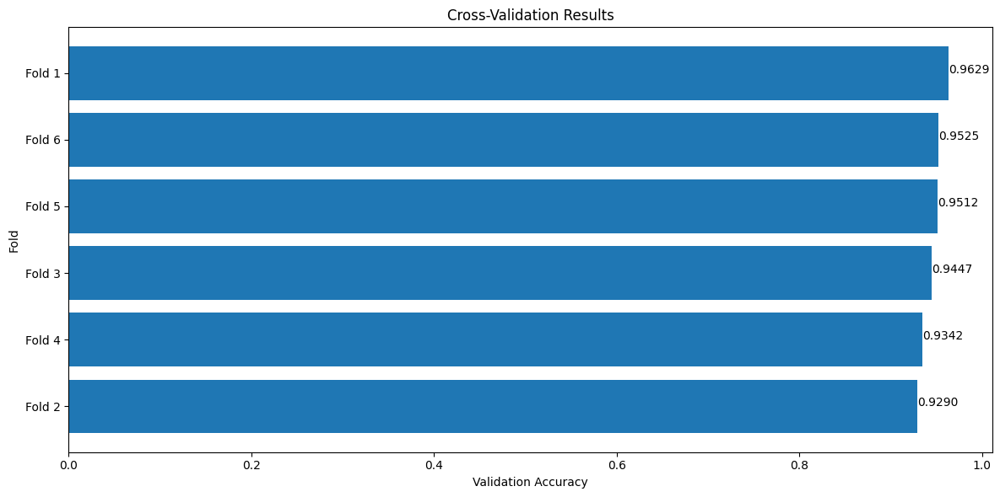

In [ ]:
# plot each fold results after cross-validation experiment
plot_cv_results(MR_results_df)

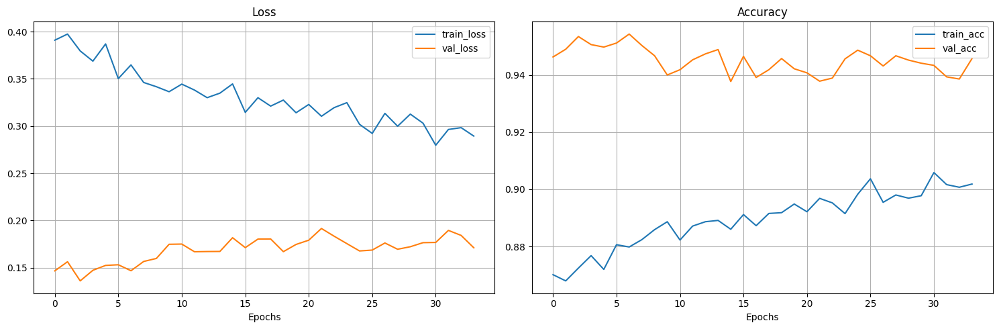

In [ ]:
# comptute and plot average cv results
MR_cv_avg_results = compute_avg_cv_results(MR_cv_results)

# plot the averaged learning curves
plot_loss_curves(MR_cv_avg_results)

Cross-validation confirms the absence of overfitting, with high validation accuracies consistently observed across the average of all folds.

We also retrieve and save best fold's weights for any potential future use.

In [ ]:
# retrieve best performing fold's weights
best_MR_cv_model_weights = MR_results_df.iloc[0]['Model Weights']

# retrieve best performing fold number
MR_best_fold = MR_results_df.iloc[0]['Fold']

# retrieve the corresponding results from cross validation experiment for the best case
MR_best_fold_index = max(MR_best_fold - 1, 0) # min vaalue for Fold is 1, so min index is 0!
MR_model_2_results = MR_cv_results[MR_best_fold_index]

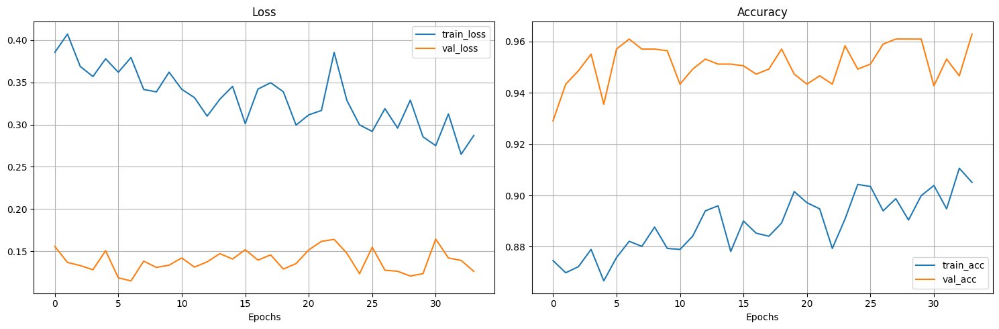

In [ ]:
# plot the curves of the model with best config
plot_loss_curves(MR_model_2_results)

In [ ]:
# before loading best weights, need to create a new instance
MR_model_2 = CNN_v2(out_features=num_classes, hidden_units=MR_best_hidden_units, dropout_probs=MR_best_dropout_probs, activation_functions=MR_best_activation_functions).to(device)

# load best weights
MR_model_2.load_state_dict(best_MR_cv_model_weights)

# print final model's val accuracy
MR_model_2_acc = MR_model_2_results['val_acc'][-1]
print(f"Final model accuracy: {MR_model_2_acc}")

# save the model
torch.save(MR_model_2.state_dict(), os.path.join(project_models_path, 'MR_model_2.pth'))
print("Model saved to 'MR_model_2.pth'")

Final model accuracy: 0.962890625
Model saved to 'MR_model_2.pth'


Experiment 7. Balance the dataset.

In [ ]:
# experiment 7: balanced dataset (with early stopping enabled)

# create a new instance of the model for balanced dataset
MR_model_3 = CNN_v2(out_features=num_classes, hidden_units=MR_best_hidden_units, dropout_probs=MR_best_dropout_probs, activation_functions=MR_best_activation_functions).to(device)

# load model_1 weights
MR_model_3.load_state_dict(MR_model_1.state_dict()) # (model_1)

# load best performing model (weights) so far
#MR_model_3.load_state_dict(best_MR_cv_model_weights) # (model 2)

# start training on balanced dataset
MR_model_3_results = experiment_balanced_dataset(model=MR_model_3,
                                                 train_dataloader=train_dataloader_MR,
                                                 val_dataloader=val_dataloader_MR,
                                                 num_epochs=num_epochs,
                                                 device=device,
                                                 best_config=MR_best_config,
                                                 class_weights=class_weights_MR)

Experimenting with Balanced Dataset


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.4353 | train_acc: 0.8703 | val_loss: 0.1712 | val_acc: 0.9445
Epoch: 2 | train_loss: 0.4414 | train_acc: 0.8658 | val_loss: 0.1320 | val_acc: 0.9544
Epoch: 3 | train_loss: 0.4035 | train_acc: 0.8675 | val_loss: 0.1001 | val_acc: 0.9669
Epoch: 4 | train_loss: 0.4213 | train_acc: 0.8641 | val_loss: 0.1053 | val_acc: 0.9639
Epoch: 5 | train_loss: 0.3721 | train_acc: 0.8755 | val_loss: 0.0928 | val_acc: 0.9684
Epoch: 6 | train_loss: 0.4019 | train_acc: 0.8757 | val_loss: 0.0921 | val_acc: 0.9748
Epoch: 7 | train_loss: 0.3656 | train_acc: 0.8836 | val_loss: 0.0881 | val_acc: 0.9748
Epoch: 8 | train_loss: 0.3834 | train_acc: 0.8766 | val_loss: 0.1028 | val_acc: 0.9731
Epoch: 9 | train_loss: 0.3677 | train_acc: 0.8794 | val_loss: 0.0856 | val_acc: 0.9766
Epoch: 10 | train_loss: 0.4171 | train_acc: 0.8723 | val_loss: 0.0976 | val_acc: 0.9688
Epoch: 11 | train_loss: 0.3695 | train_acc: 0.8779 | val_loss: 0.1051 | val_acc: 0.9684
Early stopping triggered at epoch 11.
Mod

In [ ]:
# print best epoch and its corresponding val accuracy
MR_best_epoch_bal, MR_best_val_acc_bal = print_best_epoch_and_val_acc(MR_model_3_results)

Best epoch: 6
Best validation accuracy: 0.9748


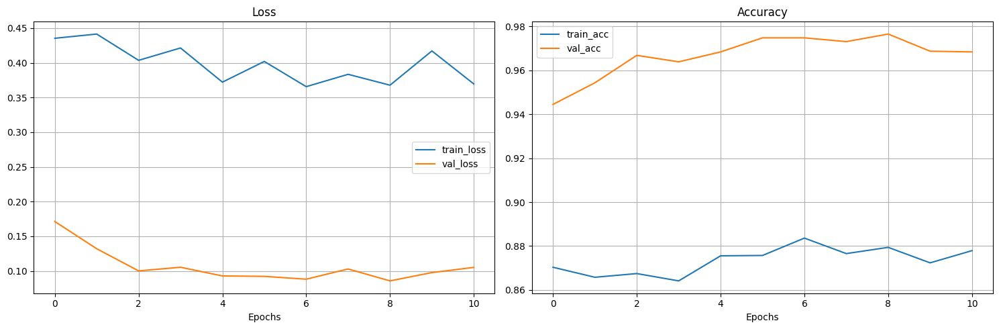

In [ ]:
# plot the results curves after balancing the dataset
plot_loss_curves(MR_model_3_results)

Balancing the dataset leads to an even higher and improved performance. Now, let's see if data augmentation can give us a little more to this direction.



In [ ]:
# print final model's val accuracy
MR_model_3_acc = MR_best_val_acc_bal
print(f"Final model accuracy: {MR_model_3_acc}")

# save the model
torch.save(MR_model_3.state_dict(), os.path.join(project_models_path, 'MR_model_3.pth'))
print("Model saved to 'MR_model_3.pth'")

Final model accuracy: 0.9748383620689655
Model saved to 'MR_model_3.pth'


Experiment 8. Apply data augmentation.


In [ ]:
# experiment 8: data augmentation (with early stopping enabled)

# create a new instance of the model for data augmentation
MR_model_4 = CNN_v2(out_features=num_classes, hidden_units=MR_best_hidden_units, dropout_probs=MR_best_dropout_probs, activation_functions=MR_best_activation_functions).to(device)

# load weights of the model_1
#MR_model_4.load_state_dict(MR_model_1.state_dict()) # (model_1)

# load weights of the model produced after cross-validation
#MR_model_4.load_state_dict(best_MR_cv_model_weights) # (model_2)

# load best performing model (weights) so far
MR_model_4.load_state_dict(MR_model_3.state_dict()) # (model_3)

# start training with data augmentation
MR_model_4_results = experiment_data_augmentation(model=MR_model_4,
                                                  train_dir=MR_dataset_path/'train',
                                                  val_dataloader=val_dataloader_MR,
                                                  num_epochs=num_epochs,
                                                  device=device,
                                                  best_config=MR_best_config,
                                                  class_weights=class_weights_MR,
                                                  num_workers=num_workers,
                                                  mean=mean_MR,
                                                  std=std_MR,
                                                  is_Trivial=True)

Experimenting with Data Augmentation


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.7476 | train_acc: 0.4303 | val_loss: 0.2609 | val_acc: 0.9575
Epoch: 2 | train_loss: 1.7360 | train_acc: 0.4429 | val_loss: 0.2031 | val_acc: 0.9641
Epoch: 3 | train_loss: 1.6444 | train_acc: 0.4582 | val_loss: 0.2213 | val_acc: 0.9547
Epoch: 4 | train_loss: 1.6169 | train_acc: 0.4552 | val_loss: 0.1861 | val_acc: 0.9559
Epoch: 5 | train_loss: 1.6032 | train_acc: 0.4674 | val_loss: 0.1858 | val_acc: 0.9498
Epoch: 6 | train_loss: 1.5177 | train_acc: 0.4854 | val_loss: 0.1761 | val_acc: 0.9512
Epoch: 7 | train_loss: 1.5294 | train_acc: 0.4851 | val_loss: 0.1804 | val_acc: 0.9437
Early stopping triggered at epoch 7.
Model restored from epoch 2.

Total training time: 18.540 seconds
Total trainable params: 225867


In [ ]:
# print best epoch and its corresponding val accuracy
MR_best_epoch_aug, MR_best_val_acc_aug = print_best_epoch_and_val_acc(MR_model_4_results)

Best epoch: 2
Best validation accuracy: 0.9641


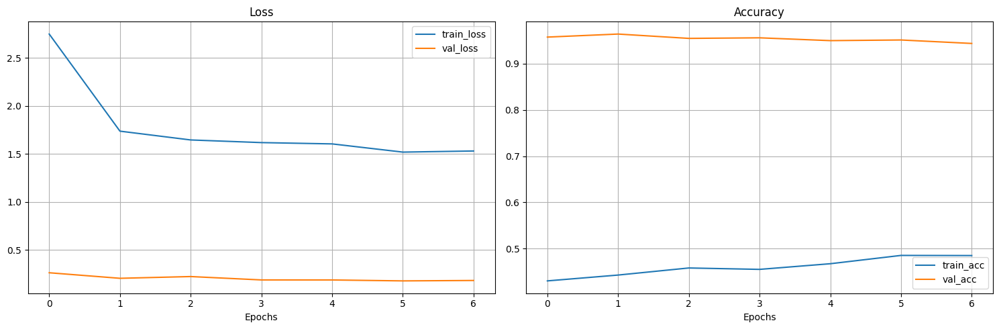

In [ ]:
# plot the results curves after data augmentation
plot_loss_curves(MR_model_4_results)

Finally, data augmentation gives us similar results with the previous experiment.

In [ ]:
# print final model's val accuracy
MR_model_4_acc = MR_best_val_acc_aug
print(f"Final model accuracy: {MR_model_4_acc}")

# save the model
torch.save(MR_model_4.state_dict(), os.path.join(project_models_path, 'MR_model_4.pth'))
print("Model saved to 'MR_model_4.pth'")

Final model accuracy: 0.9640625
Model saved to 'MR_model_4.pth'


With all experiments for this dataset completed, let's compare the models, select the best-performing one as our final result for this dataset and evaluate it on the test set.

Model MR_model_1: 0.97171336
Model MR_model_2: 0.96289062
Model MR_model_3: 0.97483836
Model MR_model_4: 0.96406250


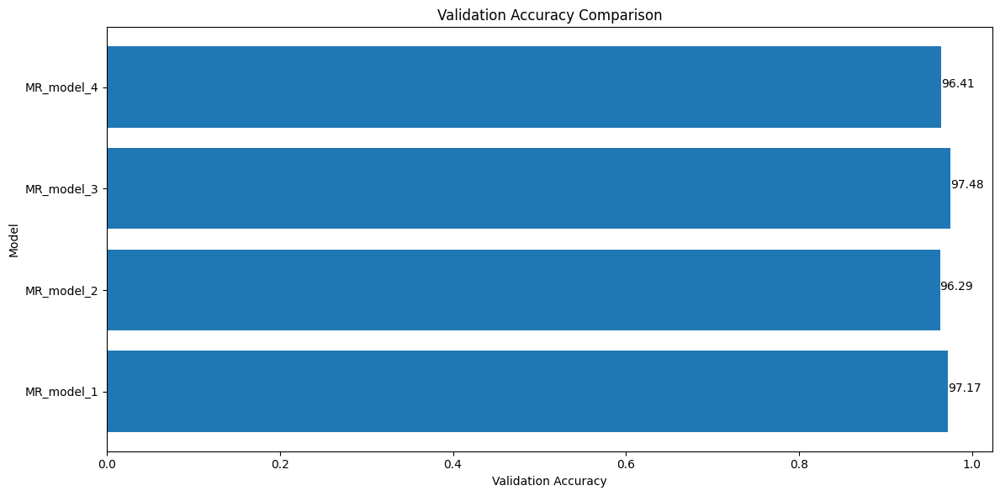

In [ ]:
# create a dataframe for comparison
compare_accs_MR = pd.DataFrame({'Model': ['MR_model_1', 'MR_model_2', 'MR_model_3', 'MR_model_4'], 'Validation Accuracy': [MR_model_1_acc, MR_model_2_acc, MR_model_3_acc, MR_model_4_acc]})

# print and plot test accuracies for all models of MR / L dataset
print_and_plot_models_accuracies(compare_accs_MR)

In [ ]:
# save the best performing model for MR / L
best_models_dict = store_best_model(compare_accs_MR, 'MR / L', best_models_dict)

# print the dictionary
print("Best models dictionary:")
print(best_models_dict)
print()

# retrieve best performing model for MR / L
MR_best_model = f"{best_models_dict['MR / L']['Model']}.pth"
#print(MR_best_model)

# initiate a model instance
MR_final_model = CNN_v2(out_features=num_classes, hidden_units=MR_best_hidden_units, dropout_probs=MR_best_dropout_probs, activation_functions=MR_best_activation_functions).to(device)

# load best weights
MR_final_model.load_state_dict(torch.load(os.path.join(project_models_path, MR_best_model)))

# put it on device
MR_final_model = MR_final_model.to(device)

# and evaluate on the test set
MR_test_results = eval_model(model=MR_final_model,
                             dataloader=test_dataloader_L_full,
                             loss_fn=nn.CrossEntropyLoss(), # nn.CrossEntropyLoss(weight=class_weights_MR)
                             device=device)
print(f"Test accuracy for {MR_best_model}: {MR_test_results['test_acc']:.4f}")

# save the test results to the dictionary
final_test_accuracies_dict['MR / L'] = MR_test_results['test_acc']

Best models dictionary:
{'M / M': {'Model': 'MM_model_4', 'Validation Accuracy': 0.9039772727272727}, 'R / R': {'Model': 'RR_model_3', 'Validation Accuracy': 0.8852272727272726}, 'L / L': {'Model': 'LL_model_4', 'Validation Accuracy': 0.8818181818181818}, 'MR / L': {'Model': 'MR_model_3', 'Validation Accuracy': 0.9748383620689655}}



  0%|          | 0/47 [00:00<?, ?it/s]

Test accuracy for MR_model_3.pth: 0.8756


### Experiments on M, L / R.

We start by creating dataloaders for ML / R dataset.

In [ ]:
# create dataloaders
train_dataloader_ML, val_dataloader_ML, test_dataloader_R_full = create_combined_dataloaders(ML_dataset_path/'train', ML_dataset_path/'validation', test_R_dataset_path/'test', data_transform_ML, data_transform_R, batch_size, num_workers)
print("Dataloaders created successfully!")

Dataloaders created successfully!


We train and evaluate the ML / R baseline model.

In [ ]:
# train the ML baseline model

# create the model
ML_model_0 = CNN(in_features=num_channels, out_features=num_classes, hidden_units=init_hidden_units).to(device)

# setup loss function and optimizer
loss_fn = nn.CrossEntropyLoss()
optimizer = torch.optim.RMSprop(params=ML_model_0.parameters(), lr=0.001)

# start training
print("Starting training...")
start_time = time.time()
ML_model_0_results = train(model=ML_model_0,
                           train_dataloader=train_dataloader_ML,
                           test_dataloader=val_dataloader_ML,
                           optimizer=optimizer,
                           loss_fn=loss_fn,
                           epochs=num_epochs,
                           device=device)
end_time = time.time()

# calculate and print total training time
ML_total_training_time = end_time - start_time
print(f"\nTotal training time: {ML_total_training_time:.3f} seconds")

# calculate and print total trainabla params
ML_total_params = sum(p.numel() for p in ML_model_0.parameters())
print(f"Total number of trainable parameters: {ML_total_params}")

Starting training...


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.3723 | train_acc: 0.5368 | val_loss: 0.9233 | val_acc: 0.6641
Epoch: 2 | train_loss: 0.5901 | train_acc: 0.8030 | val_loss: 0.4164 | val_acc: 0.8750
Epoch: 3 | train_loss: 0.4053 | train_acc: 0.8694 | val_loss: 0.3288 | val_acc: 0.8938
Epoch: 4 | train_loss: 0.2810 | train_acc: 0.9082 | val_loss: 0.2885 | val_acc: 0.9109
Epoch: 5 | train_loss: 0.2147 | train_acc: 0.9260 | val_loss: 0.4384 | val_acc: 0.8266
Epoch: 6 | train_loss: 0.1723 | train_acc: 0.9449 | val_loss: 0.1471 | val_acc: 0.9484
Epoch: 7 | train_loss: 0.1260 | train_acc: 0.9571 | val_loss: 0.2338 | val_acc: 0.9094
Epoch: 8 | train_loss: 0.1020 | train_acc: 0.9661 | val_loss: 0.0638 | val_acc: 0.9750
Epoch: 9 | train_loss: 0.0996 | train_acc: 0.9698 | val_loss: 0.0428 | val_acc: 0.9906
Epoch: 10 | train_loss: 0.0535 | train_acc: 0.9825 | val_loss: 0.0302 | val_acc: 0.9906
Epoch: 11 | train_loss: 0.0464 | train_acc: 0.9852 | val_loss: 0.0407 | val_acc: 0.9875
Epoch: 12 | train_loss: 0.0368 | train_ac

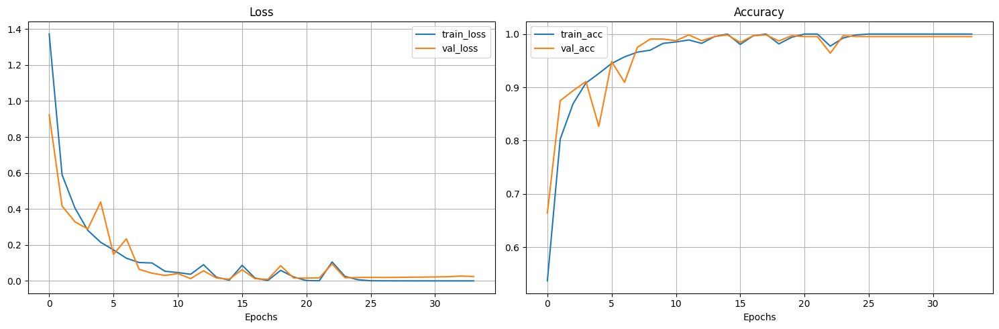

In [ ]:
# plot learning curves
plot_loss_curves(ML_model_0_results)

Results indicate that while some overfitting is present, the gap between the training and validation curves is much smaller than that observed with individual datasets.

In [ ]:
# compute generalization gap
dif=compute_generalization_gap(ML_model_0_results)

Generalization gap (train acc - val acc): 0.0047


In [ ]:
# save the model
torch.save(ML_model_0.state_dict(), os.path.join(project_models_path, 'ML_model_0.pth'))
print("Model saved to 'ML_model_0.pth'")

Model saved to 'ML_model_0.pth'


Experiment 1. Apply L2 regularization.

In [ ]:
# experiment 1: L2 reg
ML_model_L2_results = experiment_l2_regularization(train_dataloader=train_dataloader_ML,
                                                   val_dataloader=val_dataloader_ML,
                                                   num_epochs=num_epochs,
                                                   device=device,
                                                   weight_decay_values_list=weight_decay_values_list,
                                                   num_channels=num_channels,
                                                   num_classes=num_classes,
                                                   init_hidden_units=init_hidden_units)

Experimenting with L2 Regularization
Weight decay values to try: [0.01, 0.001, 0.0001, 1e-05, 1e-06]

Testing with weight decay: 0.01


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.6008 | train_acc: 0.4409 | val_loss: 1.0979 | val_acc: 0.6307
Epoch: 2 | train_loss: 0.9340 | train_acc: 0.6792 | val_loss: 0.8325 | val_acc: 0.6844
Epoch: 3 | train_loss: 0.6963 | train_acc: 0.7532 | val_loss: 0.8219 | val_acc: 0.7078
Epoch: 4 | train_loss: 0.5459 | train_acc: 0.8118 | val_loss: 0.6083 | val_acc: 0.7750
Epoch: 5 | train_loss: 0.4550 | train_acc: 0.8544 | val_loss: 0.4610 | val_acc: 0.8344
Epoch: 6 | train_loss: 0.3860 | train_acc: 0.8684 | val_loss: 0.5098 | val_acc: 0.8094
Epoch: 7 | train_loss: 0.3560 | train_acc: 0.8788 | val_loss: 0.2731 | val_acc: 0.9031
Epoch: 8 | train_loss: 0.3103 | train_acc: 0.8935 | val_loss: 0.2485 | val_acc: 0.9000
Epoch: 9 | train_loss: 0.3046 | train_acc: 0.8938 | val_loss: 0.2534 | val_acc: 0.9172
Epoch: 10 | train_loss: 0.2780 | train_acc: 0.9115 | val_loss: 0.2023 | val_acc: 0.9328
Epoch: 11 | train_loss: 0.2616 | train_acc: 0.9175 | val_loss: 0.1695 | val_acc: 0.9484
Epoch: 12 | train_loss: 0.2362 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.5105 | train_acc: 0.5059 | val_loss: 0.9580 | val_acc: 0.6625
Epoch: 2 | train_loss: 0.7645 | train_acc: 0.7367 | val_loss: 0.5555 | val_acc: 0.8266
Epoch: 3 | train_loss: 0.5067 | train_acc: 0.8310 | val_loss: 0.4030 | val_acc: 0.8641
Epoch: 4 | train_loss: 0.3688 | train_acc: 0.8752 | val_loss: 0.4710 | val_acc: 0.8281
Epoch: 5 | train_loss: 0.2956 | train_acc: 0.9021 | val_loss: 0.3163 | val_acc: 0.8807
Epoch: 6 | train_loss: 0.2712 | train_acc: 0.9038 | val_loss: 0.1693 | val_acc: 0.9484
Epoch: 7 | train_loss: 0.2043 | train_acc: 0.9296 | val_loss: 0.1862 | val_acc: 0.9281
Epoch: 8 | train_loss: 0.1922 | train_acc: 0.9374 | val_loss: 0.1341 | val_acc: 0.9547
Epoch: 9 | train_loss: 0.1479 | train_acc: 0.9485 | val_loss: 0.4444 | val_acc: 0.8547
Epoch: 10 | train_loss: 0.1422 | train_acc: 0.9495 | val_loss: 0.1088 | val_acc: 0.9609
Epoch: 11 | train_loss: 0.1042 | train_acc: 0.9661 | val_loss: 0.1233 | val_acc: 0.9437
Epoch: 12 | train_loss: 0.1093 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.4601 | train_acc: 0.4972 | val_loss: 0.8521 | val_acc: 0.6979
Epoch: 2 | train_loss: 0.6459 | train_acc: 0.7802 | val_loss: 0.7023 | val_acc: 0.7411
Epoch: 3 | train_loss: 0.4774 | train_acc: 0.8426 | val_loss: 0.4086 | val_acc: 0.8651
Epoch: 4 | train_loss: 0.3641 | train_acc: 0.8838 | val_loss: 0.2745 | val_acc: 0.9031
Epoch: 5 | train_loss: 0.2884 | train_acc: 0.9026 | val_loss: 0.2606 | val_acc: 0.9109
Epoch: 6 | train_loss: 0.2452 | train_acc: 0.9215 | val_loss: 0.3837 | val_acc: 0.8385
Epoch: 7 | train_loss: 0.1909 | train_acc: 0.9323 | val_loss: 0.2039 | val_acc: 0.9328
Epoch: 8 | train_loss: 0.1730 | train_acc: 0.9419 | val_loss: 0.1217 | val_acc: 0.9563
Epoch: 9 | train_loss: 0.1305 | train_acc: 0.9548 | val_loss: 0.1224 | val_acc: 0.9547
Epoch: 10 | train_loss: 0.1132 | train_acc: 0.9646 | val_loss: 0.0848 | val_acc: 0.9734
Epoch: 11 | train_loss: 0.0782 | train_acc: 0.9761 | val_loss: 0.0763 | val_acc: 0.9766
Epoch: 12 | train_loss: 0.1166 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.6013 | train_acc: 0.4467 | val_loss: 1.0187 | val_acc: 0.6333
Epoch: 2 | train_loss: 0.7364 | train_acc: 0.7441 | val_loss: 0.5408 | val_acc: 0.8208
Epoch: 3 | train_loss: 0.5061 | train_acc: 0.8249 | val_loss: 0.4451 | val_acc: 0.8438
Epoch: 4 | train_loss: 0.3717 | train_acc: 0.8757 | val_loss: 0.3201 | val_acc: 0.9000
Epoch: 5 | train_loss: 0.2913 | train_acc: 0.8945 | val_loss: 0.4139 | val_acc: 0.8469
Epoch: 6 | train_loss: 0.2313 | train_acc: 0.9199 | val_loss: 0.1986 | val_acc: 0.9484
Epoch: 7 | train_loss: 0.1619 | train_acc: 0.9493 | val_loss: 0.1661 | val_acc: 0.9437
Epoch: 8 | train_loss: 0.1520 | train_acc: 0.9489 | val_loss: 0.1079 | val_acc: 0.9750
Epoch: 9 | train_loss: 0.0881 | train_acc: 0.9691 | val_loss: 0.0833 | val_acc: 0.9750
Epoch: 10 | train_loss: 0.0930 | train_acc: 0.9714 | val_loss: 0.0976 | val_acc: 0.9844
Epoch: 11 | train_loss: 0.1420 | train_acc: 0.9638 | val_loss: 0.1556 | val_acc: 0.9391
Epoch: 12 | train_loss: 0.0352 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.5932 | train_acc: 0.4349 | val_loss: 1.7737 | val_acc: 0.4219
Epoch: 2 | train_loss: 0.7356 | train_acc: 0.7441 | val_loss: 0.5877 | val_acc: 0.7781
Epoch: 3 | train_loss: 0.4841 | train_acc: 0.8362 | val_loss: 0.4496 | val_acc: 0.8453
Epoch: 4 | train_loss: 0.3603 | train_acc: 0.8759 | val_loss: 0.2783 | val_acc: 0.9047
Epoch: 5 | train_loss: 0.2763 | train_acc: 0.9071 | val_loss: 0.1782 | val_acc: 0.9469
Epoch: 6 | train_loss: 0.2175 | train_acc: 0.9272 | val_loss: 0.2661 | val_acc: 0.8969
Epoch: 7 | train_loss: 0.1742 | train_acc: 0.9459 | val_loss: 1.4770 | val_acc: 0.6599
Epoch: 8 | train_loss: 0.1511 | train_acc: 0.9518 | val_loss: 0.0882 | val_acc: 0.9734
Epoch: 9 | train_loss: 0.0971 | train_acc: 0.9695 | val_loss: 0.0731 | val_acc: 0.9750
Epoch: 10 | train_loss: 0.0987 | train_acc: 0.9681 | val_loss: 0.0464 | val_acc: 0.9906
Epoch: 11 | train_loss: 0.0512 | train_acc: 0.9842 | val_loss: 0.0408 | val_acc: 0.9891
Epoch: 12 | train_loss: 0.0762 | train_ac

In [ ]:
# identify and print the best decay value based on the generalization gap
ML_best_decay_value, ML_min_diff_l2 = compute_multi_generalization_gaps(ML_model_L2_results)

Difference between train and val acc for 0.01: 0.0040
Difference between train and val acc for 0.001: 0.0076
Difference between train and val acc for 0.0001: 0.0094
Difference between train and val acc for 1e-05: 0.0078
Difference between train and val acc for 1e-06: 0.0031

The best (smallest) generalization gap is for 1e-06 and is 0.0031


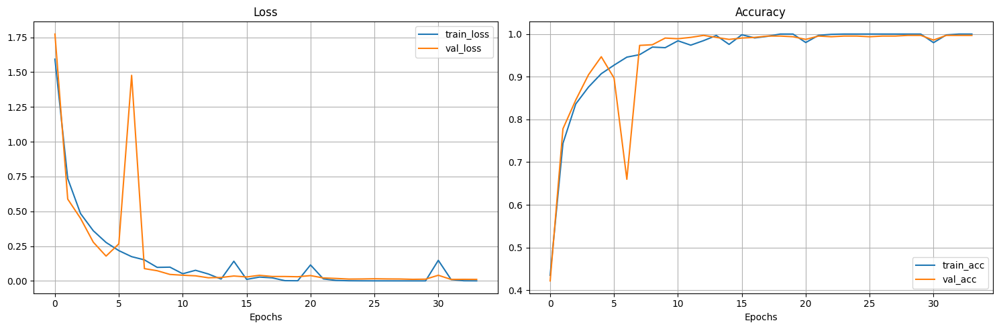

In [ ]:
# plot loss curves
plot_loss_curves(ML_model_L2_results[ML_best_decay_value])

L2 regularization provides some improvement, but as we'll see below, using dropout will completely eliminate overfitting.

Experiment 2. Apply dropout regularization layers.

In [ ]:
# experiment 2: dropout layers
ML_model_dropout_results = experiment_dropout_regularization(train_dataloader=train_dataloader_ML,
                                                             val_dataloader=val_dataloader_ML,
                                                             num_epochs=num_epochs,
                                                             device=device,
                                                             num_classes=num_classes,
                                                             best_decay_value=ML_best_decay_value,
                                                             dropout_probs_combos_list=dropout_probs_combos_list)

Experimenting with Dropout Regularization Layers
Dropout probabilities to try: [0.1, 0.3, 0.5, 0.6, 0.7, 0.9]
Total number of combinations to ideally try: 1296

Some possible 'good' combinations to try: [[0.5, 0.5, 0.5, 0.5], [0.5, 0.5, 0.4, 0.5], [0.5, 0.4, 0.5, 0.5], [0.5, 0.4, 0.4, 0.5], [0.5, 0.5, 0.5, 0.4], [0.4, 0.5, 0.5, 0.5], [0.4, 0.5, 0.5, 0.4], [0.5, 0.5, 0.5, 0.7], [0.8, 0.5, 0.5, 0.5], [0.8, 0.7, 0.7, 0.6], [0.8, 0.8, 0.7, 0.5], [0.8, 0.5, 0.7, 0.5], [0.6, 0.5, 0.5, 0.5], [0.5, 0.6, 0.6, 0.5], [0.7, 0.6, 0.5, 0.5]]

Testing with conv_dropout_prob: [0.5, 0.5, 0.5] and classifier dropout probability: 0.5


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.9509 | train_acc: 0.3088 | val_loss: 1.8311 | val_acc: 0.3292
Epoch: 2 | train_loss: 1.5939 | train_acc: 0.4446 | val_loss: 1.8274 | val_acc: 0.3474
Epoch: 3 | train_loss: 1.4264 | train_acc: 0.5211 | val_loss: 1.3099 | val_acc: 0.5380
Epoch: 4 | train_loss: 1.2447 | train_acc: 0.5816 | val_loss: 1.4837 | val_acc: 0.4464
Epoch: 5 | train_loss: 1.1261 | train_acc: 0.6188 | val_loss: 1.1068 | val_acc: 0.6167
Epoch: 6 | train_loss: 1.0253 | train_acc: 0.6470 | val_loss: 1.2009 | val_acc: 0.5891
Epoch: 7 | train_loss: 0.9460 | train_acc: 0.6719 | val_loss: 1.1432 | val_acc: 0.5953
Epoch: 8 | train_loss: 0.9267 | train_acc: 0.6888 | val_loss: 1.0055 | val_acc: 0.6542
Epoch: 9 | train_loss: 0.8358 | train_acc: 0.7205 | val_loss: 0.9035 | val_acc: 0.6729
Epoch: 10 | train_loss: 0.8046 | train_acc: 0.7254 | val_loss: 1.0787 | val_acc: 0.6177
Epoch: 11 | train_loss: 0.7780 | train_acc: 0.7288 | val_loss: 0.8272 | val_acc: 0.7031
Epoch: 12 | train_loss: 0.7698 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.9574 | train_acc: 0.3053 | val_loss: 1.6454 | val_acc: 0.3870
Epoch: 2 | train_loss: 1.5267 | train_acc: 0.4748 | val_loss: 1.3588 | val_acc: 0.5406
Epoch: 3 | train_loss: 1.3433 | train_acc: 0.5443 | val_loss: 1.0875 | val_acc: 0.6208
Epoch: 4 | train_loss: 1.1924 | train_acc: 0.5997 | val_loss: 1.0834 | val_acc: 0.6182
Epoch: 5 | train_loss: 1.0539 | train_acc: 0.6340 | val_loss: 0.9698 | val_acc: 0.6807
Epoch: 6 | train_loss: 0.9926 | train_acc: 0.6600 | val_loss: 0.8731 | val_acc: 0.7130
Epoch: 7 | train_loss: 0.8983 | train_acc: 0.6901 | val_loss: 0.9076 | val_acc: 0.6786
Epoch: 8 | train_loss: 0.8436 | train_acc: 0.7096 | val_loss: 0.7325 | val_acc: 0.7547
Epoch: 9 | train_loss: 0.8245 | train_acc: 0.7254 | val_loss: 0.6945 | val_acc: 0.7698
Epoch: 10 | train_loss: 0.7803 | train_acc: 0.7286 | val_loss: 0.6628 | val_acc: 0.7807
Epoch: 11 | train_loss: 0.7473 | train_acc: 0.7419 | val_loss: 0.6907 | val_acc: 0.7714
Epoch: 12 | train_loss: 0.7109 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.9670 | train_acc: 0.3174 | val_loss: 1.5792 | val_acc: 0.4557
Epoch: 2 | train_loss: 1.4912 | train_acc: 0.4965 | val_loss: 1.3420 | val_acc: 0.5177
Epoch: 3 | train_loss: 1.2834 | train_acc: 0.5644 | val_loss: 1.4168 | val_acc: 0.4818
Epoch: 4 | train_loss: 1.0998 | train_acc: 0.6231 | val_loss: 0.9922 | val_acc: 0.6375
Epoch: 5 | train_loss: 0.9934 | train_acc: 0.6615 | val_loss: 1.0125 | val_acc: 0.6312
Epoch: 6 | train_loss: 0.9147 | train_acc: 0.6836 | val_loss: 0.8610 | val_acc: 0.6906
Epoch: 7 | train_loss: 0.8558 | train_acc: 0.6988 | val_loss: 0.7951 | val_acc: 0.7422
Epoch: 8 | train_loss: 0.8335 | train_acc: 0.7047 | val_loss: 0.6859 | val_acc: 0.7495
Epoch: 9 | train_loss: 0.7682 | train_acc: 0.7321 | val_loss: 0.7820 | val_acc: 0.7229
Epoch: 10 | train_loss: 0.7437 | train_acc: 0.7364 | val_loss: 0.6038 | val_acc: 0.7641
Epoch: 11 | train_loss: 0.7483 | train_acc: 0.7482 | val_loss: 0.7100 | val_acc: 0.7469
Epoch: 12 | train_loss: 0.7093 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.9281 | train_acc: 0.3358 | val_loss: 1.5204 | val_acc: 0.4635
Epoch: 2 | train_loss: 1.5060 | train_acc: 0.4914 | val_loss: 1.4377 | val_acc: 0.5026
Epoch: 3 | train_loss: 1.2747 | train_acc: 0.5660 | val_loss: 0.9740 | val_acc: 0.6505
Epoch: 4 | train_loss: 1.0883 | train_acc: 0.6329 | val_loss: 0.8230 | val_acc: 0.7380
Epoch: 5 | train_loss: 0.9730 | train_acc: 0.6674 | val_loss: 0.7659 | val_acc: 0.7240
Epoch: 6 | train_loss: 0.8818 | train_acc: 0.6954 | val_loss: 0.7993 | val_acc: 0.7026
Epoch: 7 | train_loss: 0.8475 | train_acc: 0.6983 | val_loss: 0.7011 | val_acc: 0.7646
Epoch: 8 | train_loss: 0.7922 | train_acc: 0.7292 | val_loss: 0.7816 | val_acc: 0.7021
Epoch: 9 | train_loss: 0.7460 | train_acc: 0.7420 | val_loss: 0.6106 | val_acc: 0.7729
Epoch: 10 | train_loss: 0.6959 | train_acc: 0.7685 | val_loss: 0.5254 | val_acc: 0.8255
Epoch: 11 | train_loss: 0.6783 | train_acc: 0.7731 | val_loss: 0.5387 | val_acc: 0.8271
Epoch: 12 | train_loss: 0.6111 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.9721 | train_acc: 0.3093 | val_loss: 1.8201 | val_acc: 0.3474
Epoch: 2 | train_loss: 1.5895 | train_acc: 0.4533 | val_loss: 1.4120 | val_acc: 0.4979
Epoch: 3 | train_loss: 1.4143 | train_acc: 0.5322 | val_loss: 1.2644 | val_acc: 0.5510
Epoch: 4 | train_loss: 1.2405 | train_acc: 0.5848 | val_loss: 1.2036 | val_acc: 0.5526
Epoch: 5 | train_loss: 1.1013 | train_acc: 0.6341 | val_loss: 1.0614 | val_acc: 0.6188
Epoch: 6 | train_loss: 1.0257 | train_acc: 0.6612 | val_loss: 1.1567 | val_acc: 0.6276
Epoch: 7 | train_loss: 0.9317 | train_acc: 0.6785 | val_loss: 1.0476 | val_acc: 0.6406
Epoch: 8 | train_loss: 0.8451 | train_acc: 0.7092 | val_loss: 1.0588 | val_acc: 0.6521
Epoch: 9 | train_loss: 0.8346 | train_acc: 0.7050 | val_loss: 0.9643 | val_acc: 0.6703
Epoch: 10 | train_loss: 0.7906 | train_acc: 0.7307 | val_loss: 0.8910 | val_acc: 0.7156
Epoch: 11 | train_loss: 0.7751 | train_acc: 0.7347 | val_loss: 1.1682 | val_acc: 0.6333
Epoch: 12 | train_loss: 0.7174 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.9803 | train_acc: 0.2998 | val_loss: 1.5679 | val_acc: 0.4526
Epoch: 2 | train_loss: 1.5498 | train_acc: 0.4580 | val_loss: 1.2502 | val_acc: 0.5703
Epoch: 3 | train_loss: 1.3069 | train_acc: 0.5650 | val_loss: 1.0178 | val_acc: 0.6589
Epoch: 4 | train_loss: 1.1564 | train_acc: 0.6138 | val_loss: 0.9508 | val_acc: 0.6802
Epoch: 5 | train_loss: 1.0470 | train_acc: 0.6405 | val_loss: 0.8292 | val_acc: 0.7005
Epoch: 6 | train_loss: 0.9819 | train_acc: 0.6699 | val_loss: 0.7680 | val_acc: 0.7333
Epoch: 7 | train_loss: 0.8930 | train_acc: 0.6960 | val_loss: 0.7455 | val_acc: 0.7297
Epoch: 8 | train_loss: 0.8387 | train_acc: 0.7162 | val_loss: 0.6490 | val_acc: 0.7615
Epoch: 9 | train_loss: 0.8270 | train_acc: 0.7288 | val_loss: 0.6198 | val_acc: 0.7875
Epoch: 10 | train_loss: 0.7797 | train_acc: 0.7305 | val_loss: 0.5924 | val_acc: 0.8120
Epoch: 11 | train_loss: 0.7770 | train_acc: 0.7389 | val_loss: 0.5419 | val_acc: 0.8151
Epoch: 12 | train_loss: 0.7241 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.9472 | train_acc: 0.3165 | val_loss: 1.5531 | val_acc: 0.4609
Epoch: 2 | train_loss: 1.4849 | train_acc: 0.4874 | val_loss: 1.2089 | val_acc: 0.5979
Epoch: 3 | train_loss: 1.2344 | train_acc: 0.5839 | val_loss: 1.1420 | val_acc: 0.6026
Epoch: 4 | train_loss: 1.0421 | train_acc: 0.6527 | val_loss: 0.7866 | val_acc: 0.7589
Epoch: 5 | train_loss: 0.9232 | train_acc: 0.6977 | val_loss: 0.8476 | val_acc: 0.6755
Epoch: 6 | train_loss: 0.8870 | train_acc: 0.6999 | val_loss: 0.6780 | val_acc: 0.7526
Epoch: 7 | train_loss: 0.8264 | train_acc: 0.7283 | val_loss: 0.6684 | val_acc: 0.7573
Epoch: 8 | train_loss: 0.7779 | train_acc: 0.7318 | val_loss: 0.6050 | val_acc: 0.7885
Epoch: 9 | train_loss: 0.7083 | train_acc: 0.7440 | val_loss: 0.5420 | val_acc: 0.8172
Epoch: 10 | train_loss: 0.7217 | train_acc: 0.7532 | val_loss: 0.5119 | val_acc: 0.8286
Epoch: 11 | train_loss: 0.6672 | train_acc: 0.7694 | val_loss: 0.4804 | val_acc: 0.8422
Epoch: 12 | train_loss: 0.6202 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.9521 | train_acc: 0.2876 | val_loss: 1.5733 | val_acc: 0.4375
Epoch: 2 | train_loss: 1.6237 | train_acc: 0.4248 | val_loss: 1.3663 | val_acc: 0.5432
Epoch: 3 | train_loss: 1.4566 | train_acc: 0.4938 | val_loss: 1.5070 | val_acc: 0.4401
Epoch: 4 | train_loss: 1.3101 | train_acc: 0.5543 | val_loss: 1.0866 | val_acc: 0.6250
Epoch: 5 | train_loss: 1.1873 | train_acc: 0.5992 | val_loss: 0.9650 | val_acc: 0.7021
Epoch: 6 | train_loss: 1.1282 | train_acc: 0.6174 | val_loss: 0.9476 | val_acc: 0.6802
Epoch: 7 | train_loss: 1.0597 | train_acc: 0.6322 | val_loss: 0.8790 | val_acc: 0.6813
Epoch: 8 | train_loss: 0.9931 | train_acc: 0.6508 | val_loss: 0.8440 | val_acc: 0.7130
Epoch: 9 | train_loss: 0.9762 | train_acc: 0.6662 | val_loss: 0.8342 | val_acc: 0.7271
Epoch: 10 | train_loss: 0.9549 | train_acc: 0.6601 | val_loss: 0.7266 | val_acc: 0.7589
Epoch: 11 | train_loss: 0.9082 | train_acc: 0.6885 | val_loss: 0.8772 | val_acc: 0.7109
Epoch: 12 | train_loss: 0.8771 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.0457 | train_acc: 0.2888 | val_loss: 2.7292 | val_acc: 0.1156
Epoch: 2 | train_loss: 1.7193 | train_acc: 0.4105 | val_loss: 2.9722 | val_acc: 0.1203
Epoch: 3 | train_loss: 1.6302 | train_acc: 0.4537 | val_loss: 3.0026 | val_acc: 0.1219
Epoch: 4 | train_loss: 1.5410 | train_acc: 0.4836 | val_loss: 2.7810 | val_acc: 0.1344
Epoch: 5 | train_loss: 1.4909 | train_acc: 0.5115 | val_loss: 3.2526 | val_acc: 0.1266
Epoch: 6 | train_loss: 1.4073 | train_acc: 0.5291 | val_loss: 2.9096 | val_acc: 0.1469
Epoch: 7 | train_loss: 1.3711 | train_acc: 0.5480 | val_loss: 2.4421 | val_acc: 0.1953
Epoch: 8 | train_loss: 1.3146 | train_acc: 0.5709 | val_loss: 2.2736 | val_acc: 0.2271
Epoch: 9 | train_loss: 1.2396 | train_acc: 0.5953 | val_loss: 2.8771 | val_acc: 0.1688
Epoch: 10 | train_loss: 1.1926 | train_acc: 0.6116 | val_loss: 2.0005 | val_acc: 0.3229
Epoch: 11 | train_loss: 1.1626 | train_acc: 0.6129 | val_loss: 2.1343 | val_acc: 0.2703
Epoch: 12 | train_loss: 1.1672 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.1913 | train_acc: 0.2384 | val_loss: 2.4617 | val_acc: 0.1156
Epoch: 2 | train_loss: 1.8925 | train_acc: 0.3414 | val_loss: 2.5290 | val_acc: 0.1156
Epoch: 3 | train_loss: 1.7917 | train_acc: 0.3675 | val_loss: 2.4981 | val_acc: 0.1234
Epoch: 4 | train_loss: 1.7491 | train_acc: 0.3908 | val_loss: 2.3250 | val_acc: 0.1333
Epoch: 5 | train_loss: 1.6565 | train_acc: 0.4222 | val_loss: 2.7124 | val_acc: 0.1234
Epoch: 6 | train_loss: 1.6531 | train_acc: 0.4274 | val_loss: 2.4632 | val_acc: 0.1380
Epoch: 7 | train_loss: 1.6214 | train_acc: 0.4424 | val_loss: 2.5676 | val_acc: 0.1313
Epoch: 8 | train_loss: 1.6248 | train_acc: 0.4534 | val_loss: 2.5095 | val_acc: 0.1349
Epoch: 9 | train_loss: 1.6034 | train_acc: 0.4460 | val_loss: 2.6684 | val_acc: 0.1266
Epoch: 10 | train_loss: 1.5967 | train_acc: 0.4493 | val_loss: 2.2767 | val_acc: 0.1635
Epoch: 11 | train_loss: 1.5672 | train_acc: 0.4724 | val_loss: 2.1007 | val_acc: 0.2177
Epoch: 12 | train_loss: 1.5442 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.2140 | train_acc: 0.2341 | val_loss: 2.4605 | val_acc: 0.1156
Epoch: 2 | train_loss: 1.9018 | train_acc: 0.3526 | val_loss: 2.5750 | val_acc: 0.1156
Epoch: 3 | train_loss: 1.7996 | train_acc: 0.3749 | val_loss: 2.7676 | val_acc: 0.1156
Epoch: 4 | train_loss: 1.7141 | train_acc: 0.4094 | val_loss: 2.8165 | val_acc: 0.1156
Epoch: 5 | train_loss: 1.7041 | train_acc: 0.4054 | val_loss: 2.3279 | val_acc: 0.1286
Epoch: 6 | train_loss: 1.6475 | train_acc: 0.4336 | val_loss: 2.6468 | val_acc: 0.1203
Epoch: 7 | train_loss: 1.6315 | train_acc: 0.4487 | val_loss: 2.6245 | val_acc: 0.1203
Epoch: 8 | train_loss: 1.5841 | train_acc: 0.4607 | val_loss: 2.6908 | val_acc: 0.1203
Epoch: 9 | train_loss: 1.5773 | train_acc: 0.4657 | val_loss: 2.6340 | val_acc: 0.1250
Epoch: 10 | train_loss: 1.5633 | train_acc: 0.4626 | val_loss: 2.5132 | val_acc: 0.1281
Epoch: 11 | train_loss: 1.5332 | train_acc: 0.4803 | val_loss: 2.5148 | val_acc: 0.1297
Epoch: 12 | train_loss: 1.5545 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.1313 | train_acc: 0.2560 | val_loss: 2.4363 | val_acc: 0.1172
Epoch: 2 | train_loss: 1.7995 | train_acc: 0.3730 | val_loss: 2.7067 | val_acc: 0.1187
Epoch: 3 | train_loss: 1.7150 | train_acc: 0.4084 | val_loss: 2.6126 | val_acc: 0.1344
Epoch: 4 | train_loss: 1.6311 | train_acc: 0.4259 | val_loss: 2.6603 | val_acc: 0.1266
Epoch: 5 | train_loss: 1.6011 | train_acc: 0.4402 | val_loss: 2.8426 | val_acc: 0.1250
Epoch: 6 | train_loss: 1.5516 | train_acc: 0.4719 | val_loss: 2.8452 | val_acc: 0.1250
Epoch: 7 | train_loss: 1.4978 | train_acc: 0.4876 | val_loss: 2.9954 | val_acc: 0.1250
Epoch: 8 | train_loss: 1.5054 | train_acc: 0.4795 | val_loss: 2.8975 | val_acc: 0.1297
Epoch: 9 | train_loss: 1.4470 | train_acc: 0.5103 | val_loss: 2.2867 | val_acc: 0.1703
Epoch: 10 | train_loss: 1.4281 | train_acc: 0.5134 | val_loss: 2.6030 | val_acc: 0.1693
Epoch: 11 | train_loss: 1.3773 | train_acc: 0.5295 | val_loss: 2.6144 | val_acc: 0.1667
Epoch: 12 | train_loss: 1.3470 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.9342 | train_acc: 0.3159 | val_loss: 1.7714 | val_acc: 0.3521
Epoch: 2 | train_loss: 1.5445 | train_acc: 0.4664 | val_loss: 1.3687 | val_acc: 0.5464
Epoch: 3 | train_loss: 1.4080 | train_acc: 0.5205 | val_loss: 1.3901 | val_acc: 0.4927
Epoch: 4 | train_loss: 1.2370 | train_acc: 0.5721 | val_loss: 1.3595 | val_acc: 0.5104
Epoch: 5 | train_loss: 1.1280 | train_acc: 0.6184 | val_loss: 1.1920 | val_acc: 0.5875
Epoch: 6 | train_loss: 1.0453 | train_acc: 0.6391 | val_loss: 1.0461 | val_acc: 0.6245
Epoch: 7 | train_loss: 0.9781 | train_acc: 0.6644 | val_loss: 1.0365 | val_acc: 0.6531
Epoch: 8 | train_loss: 0.9283 | train_acc: 0.6757 | val_loss: 0.8535 | val_acc: 0.7057
Epoch: 9 | train_loss: 0.9083 | train_acc: 0.6937 | val_loss: 0.8046 | val_acc: 0.7099
Epoch: 10 | train_loss: 0.8283 | train_acc: 0.7096 | val_loss: 0.7455 | val_acc: 0.7599
Epoch: 11 | train_loss: 0.8362 | train_acc: 0.7124 | val_loss: 0.7028 | val_acc: 0.7286
Epoch: 12 | train_loss: 0.7897 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.9945 | train_acc: 0.2866 | val_loss: 1.7268 | val_acc: 0.3870
Epoch: 2 | train_loss: 1.6090 | train_acc: 0.4528 | val_loss: 1.3968 | val_acc: 0.5229
Epoch: 3 | train_loss: 1.4292 | train_acc: 0.5192 | val_loss: 1.2147 | val_acc: 0.5922
Epoch: 4 | train_loss: 1.3018 | train_acc: 0.5594 | val_loss: 1.0597 | val_acc: 0.6255
Epoch: 5 | train_loss: 1.2320 | train_acc: 0.5883 | val_loss: 0.9805 | val_acc: 0.6484
Epoch: 6 | train_loss: 1.1586 | train_acc: 0.6045 | val_loss: 0.9840 | val_acc: 0.6438
Epoch: 7 | train_loss: 1.0864 | train_acc: 0.6379 | val_loss: 0.8436 | val_acc: 0.7031
Epoch: 8 | train_loss: 1.0624 | train_acc: 0.6395 | val_loss: 0.8533 | val_acc: 0.7281
Epoch: 9 | train_loss: 1.0152 | train_acc: 0.6513 | val_loss: 0.8397 | val_acc: 0.6917
Epoch: 10 | train_loss: 0.9784 | train_acc: 0.6726 | val_loss: 0.9511 | val_acc: 0.6719
Epoch: 11 | train_loss: 0.9735 | train_acc: 0.6678 | val_loss: 0.8487 | val_acc: 0.7083
Epoch: 12 | train_loss: 0.9505 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.0037 | train_acc: 0.3042 | val_loss: 2.2182 | val_acc: 0.1818
Epoch: 2 | train_loss: 1.6767 | train_acc: 0.4166 | val_loss: 2.3522 | val_acc: 0.1583
Epoch: 3 | train_loss: 1.5787 | train_acc: 0.4648 | val_loss: 2.3561 | val_acc: 0.1562
Epoch: 4 | train_loss: 1.4770 | train_acc: 0.4961 | val_loss: 2.0851 | val_acc: 0.2016
Epoch: 5 | train_loss: 1.4234 | train_acc: 0.5146 | val_loss: 2.4837 | val_acc: 0.1562
Epoch: 6 | train_loss: 1.3418 | train_acc: 0.5492 | val_loss: 1.5275 | val_acc: 0.4526
Epoch: 7 | train_loss: 1.2649 | train_acc: 0.5785 | val_loss: 1.7197 | val_acc: 0.3828
Epoch: 8 | train_loss: 1.2005 | train_acc: 0.5969 | val_loss: 1.8816 | val_acc: 0.3286
Epoch: 9 | train_loss: 1.1685 | train_acc: 0.6121 | val_loss: 1.5787 | val_acc: 0.4339
Epoch: 10 | train_loss: 1.1286 | train_acc: 0.6333 | val_loss: 1.6300 | val_acc: 0.4297
Epoch: 11 | train_loss: 1.0962 | train_acc: 0.6344 | val_loss: 1.2299 | val_acc: 0.5781
Epoch: 12 | train_loss: 1.0541 | train_ac

In [ ]:
# identify and print the best dropout probs combo value based on the generalization gap
ML_best_dropout_probs, ML_min_diff_dropout = compute_multi_generalization_gaps(ML_model_dropout_results)

Difference between train and val acc for (0.5, 0.5, 0.5, 0.5): -0.0833
Difference between train and val acc for (0.5, 0.5, 0.4, 0.5): -0.0499
Difference between train and val acc for (0.5, 0.4, 0.5, 0.5): -0.0480
Difference between train and val acc for (0.5, 0.4, 0.4, 0.5): -0.0506
Difference between train and val acc for (0.5, 0.5, 0.5, 0.4): -0.0514
Difference between train and val acc for (0.4, 0.5, 0.5, 0.5): -0.0715
Difference between train and val acc for (0.4, 0.5, 0.5, 0.4): -0.0343
Difference between train and val acc for (0.5, 0.5, 0.5, 0.7): -0.0580
Difference between train and val acc for (0.8, 0.5, 0.5, 0.5): -0.0348
Difference between train and val acc for (0.8, 0.7, 0.7, 0.6): 0.1878
Difference between train and val acc for (0.8, 0.8, 0.7, 0.5): 0.1035
Difference between train and val acc for (0.8, 0.5, 0.7, 0.5): 0.3415
Difference between train and val acc for (0.6, 0.5, 0.5, 0.5): -0.0556
Difference between train and val acc for (0.5, 0.6, 0.6, 0.5): -0.0565
Differenc

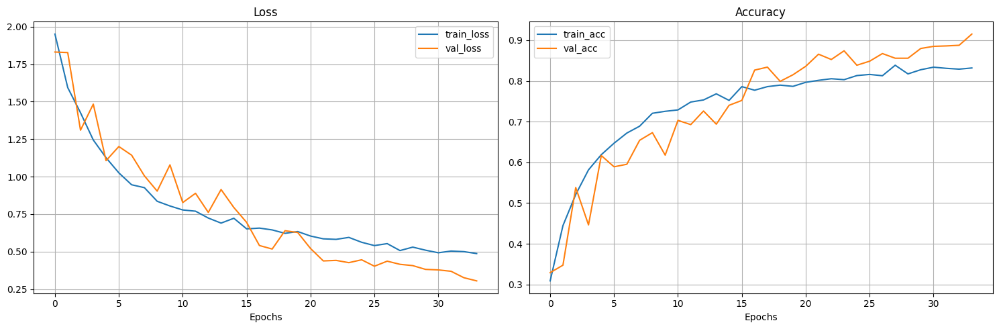

In [ ]:
# plot learning curves
plot_loss_curves(ML_model_dropout_results[ML_best_dropout_probs])

As expected, applying dropout has effectively eliminated overfitting.

Experiment 3: Try different hidden layer sizes.

In [ ]:
# experiment 3: hidden layer sizes
ML_model_hidden_results = experiment_hidden_layer_sizes(train_dataloader=train_dataloader_ML,
                                                        val_dataloader=val_dataloader_ML,
                                                        num_epochs=num_epochs,
                                                        device=device,
                                                        num_classes=num_classes,
                                                        best_decay_value=ML_best_decay_value,
                                                        best_dropout_probs_combo=ML_best_dropout_probs,
                                                        hidden_layer_sizes_list=hidden_layer_sizes_list)

Experimenting with Hidden Layer Sizes
Hidden layer sizes combinations to try: [(32, 64, 64), (32, 32, 128), (64, 32, 64), (32, 32, 64), (64, 64, 32), (32, 64, 32)]

Testing hidden layer sizes combination: (32, 64, 64)...


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.0339 | train_acc: 0.2992 | val_loss: 1.6533 | val_acc: 0.4422
Epoch: 2 | train_loss: 1.5382 | train_acc: 0.4855 | val_loss: 1.0637 | val_acc: 0.6380
Epoch: 3 | train_loss: 1.2006 | train_acc: 0.5931 | val_loss: 0.8662 | val_acc: 0.6745
Epoch: 4 | train_loss: 1.0278 | train_acc: 0.6430 | val_loss: 0.7180 | val_acc: 0.7365
Epoch: 5 | train_loss: 0.9122 | train_acc: 0.6776 | val_loss: 0.6644 | val_acc: 0.7568
Epoch: 6 | train_loss: 0.8160 | train_acc: 0.7210 | val_loss: 0.5792 | val_acc: 0.7953
Epoch: 7 | train_loss: 0.7616 | train_acc: 0.7448 | val_loss: 0.5135 | val_acc: 0.8401
Epoch: 8 | train_loss: 0.7285 | train_acc: 0.7559 | val_loss: 0.4545 | val_acc: 0.8432
Epoch: 9 | train_loss: 0.6548 | train_acc: 0.7743 | val_loss: 0.4658 | val_acc: 0.8172
Epoch: 10 | train_loss: 0.6448 | train_acc: 0.7840 | val_loss: 0.3994 | val_acc: 0.8844
Epoch: 11 | train_loss: 0.6159 | train_acc: 0.7918 | val_loss: 0.4296 | val_acc: 0.8417
Epoch: 12 | train_loss: 0.5833 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.0792 | train_acc: 0.2976 | val_loss: 1.5455 | val_acc: 0.4792
Epoch: 2 | train_loss: 1.5613 | train_acc: 0.4728 | val_loss: 1.1986 | val_acc: 0.6229
Epoch: 3 | train_loss: 1.3124 | train_acc: 0.5655 | val_loss: 0.9593 | val_acc: 0.6714
Epoch: 4 | train_loss: 1.1077 | train_acc: 0.6339 | val_loss: 0.8259 | val_acc: 0.7255
Epoch: 5 | train_loss: 0.9853 | train_acc: 0.6632 | val_loss: 0.7469 | val_acc: 0.7349
Epoch: 6 | train_loss: 0.8986 | train_acc: 0.6947 | val_loss: 0.6749 | val_acc: 0.7818
Epoch: 7 | train_loss: 0.8361 | train_acc: 0.7145 | val_loss: 0.6140 | val_acc: 0.8010
Epoch: 8 | train_loss: 0.8355 | train_acc: 0.7151 | val_loss: 0.6306 | val_acc: 0.7682
Epoch: 9 | train_loss: 0.7428 | train_acc: 0.7481 | val_loss: 0.5226 | val_acc: 0.8260
Epoch: 10 | train_loss: 0.7041 | train_acc: 0.7641 | val_loss: 0.4850 | val_acc: 0.8380
Epoch: 11 | train_loss: 0.6974 | train_acc: 0.7629 | val_loss: 0.5501 | val_acc: 0.8125
Epoch: 12 | train_loss: 0.6572 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.0414 | train_acc: 0.2763 | val_loss: 1.4866 | val_acc: 0.5073
Epoch: 2 | train_loss: 1.4620 | train_acc: 0.4957 | val_loss: 1.1195 | val_acc: 0.6281
Epoch: 3 | train_loss: 1.1840 | train_acc: 0.5825 | val_loss: 0.8300 | val_acc: 0.7339
Epoch: 4 | train_loss: 1.0087 | train_acc: 0.6503 | val_loss: 0.7392 | val_acc: 0.7177
Epoch: 5 | train_loss: 0.9223 | train_acc: 0.6717 | val_loss: 0.6627 | val_acc: 0.7557
Epoch: 6 | train_loss: 0.8684 | train_acc: 0.6937 | val_loss: 0.6827 | val_acc: 0.7719
Epoch: 7 | train_loss: 0.8023 | train_acc: 0.7162 | val_loss: 0.6082 | val_acc: 0.7734
Epoch: 8 | train_loss: 0.7892 | train_acc: 0.7305 | val_loss: 0.6103 | val_acc: 0.7547
Epoch: 9 | train_loss: 0.7394 | train_acc: 0.7478 | val_loss: 0.5268 | val_acc: 0.8260
Epoch: 10 | train_loss: 0.6989 | train_acc: 0.7600 | val_loss: 0.4561 | val_acc: 0.8594
Epoch: 11 | train_loss: 0.6780 | train_acc: 0.7723 | val_loss: 0.4257 | val_acc: 0.8609
Epoch: 12 | train_loss: 0.6466 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.9341 | train_acc: 0.3145 | val_loss: 1.6152 | val_acc: 0.4135
Epoch: 2 | train_loss: 1.5770 | train_acc: 0.4570 | val_loss: 1.3373 | val_acc: 0.5609
Epoch: 3 | train_loss: 1.3383 | train_acc: 0.5420 | val_loss: 0.9858 | val_acc: 0.6833
Epoch: 4 | train_loss: 1.1495 | train_acc: 0.6107 | val_loss: 0.9511 | val_acc: 0.6474
Epoch: 5 | train_loss: 1.0331 | train_acc: 0.6487 | val_loss: 0.7675 | val_acc: 0.7604
Epoch: 6 | train_loss: 0.9468 | train_acc: 0.6709 | val_loss: 0.6976 | val_acc: 0.7479
Epoch: 7 | train_loss: 0.8877 | train_acc: 0.7008 | val_loss: 0.7206 | val_acc: 0.7281
Epoch: 8 | train_loss: 0.8565 | train_acc: 0.7110 | val_loss: 0.6956 | val_acc: 0.7604
Epoch: 9 | train_loss: 0.8105 | train_acc: 0.7224 | val_loss: 0.6391 | val_acc: 0.7578
Epoch: 10 | train_loss: 0.7896 | train_acc: 0.7379 | val_loss: 0.5429 | val_acc: 0.7990
Epoch: 11 | train_loss: 0.7489 | train_acc: 0.7417 | val_loss: 0.5622 | val_acc: 0.8120
Epoch: 12 | train_loss: 0.7210 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.0629 | train_acc: 0.2874 | val_loss: 1.5592 | val_acc: 0.4797
Epoch: 2 | train_loss: 1.4662 | train_acc: 0.4922 | val_loss: 0.9484 | val_acc: 0.6797
Epoch: 3 | train_loss: 1.1707 | train_acc: 0.5961 | val_loss: 0.7674 | val_acc: 0.7344
Epoch: 4 | train_loss: 1.0023 | train_acc: 0.6566 | val_loss: 0.6633 | val_acc: 0.7750
Epoch: 5 | train_loss: 0.8961 | train_acc: 0.6905 | val_loss: 0.6043 | val_acc: 0.7833
Epoch: 6 | train_loss: 0.8540 | train_acc: 0.7092 | val_loss: 0.5706 | val_acc: 0.8229
Epoch: 7 | train_loss: 0.7717 | train_acc: 0.7338 | val_loss: 0.5119 | val_acc: 0.8297
Epoch: 8 | train_loss: 0.7537 | train_acc: 0.7446 | val_loss: 0.4604 | val_acc: 0.8688
Epoch: 9 | train_loss: 0.6928 | train_acc: 0.7539 | val_loss: 0.4485 | val_acc: 0.8422
Epoch: 10 | train_loss: 0.6917 | train_acc: 0.7659 | val_loss: 0.4458 | val_acc: 0.8656
Epoch: 11 | train_loss: 0.6633 | train_acc: 0.7777 | val_loss: 0.3925 | val_acc: 0.8984
Epoch: 12 | train_loss: 0.6699 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.9769 | train_acc: 0.3076 | val_loss: 1.6685 | val_acc: 0.3714
Epoch: 2 | train_loss: 1.5438 | train_acc: 0.4631 | val_loss: 1.1305 | val_acc: 0.6219
Epoch: 3 | train_loss: 1.2466 | train_acc: 0.5855 | val_loss: 0.8900 | val_acc: 0.6672
Epoch: 4 | train_loss: 1.0754 | train_acc: 0.6334 | val_loss: 0.7398 | val_acc: 0.7474
Epoch: 5 | train_loss: 0.9523 | train_acc: 0.6758 | val_loss: 0.7025 | val_acc: 0.7661
Epoch: 6 | train_loss: 0.8515 | train_acc: 0.7118 | val_loss: 0.5953 | val_acc: 0.8234
Epoch: 7 | train_loss: 0.8149 | train_acc: 0.7250 | val_loss: 0.5521 | val_acc: 0.8250
Epoch: 8 | train_loss: 0.7667 | train_acc: 0.7414 | val_loss: 0.5441 | val_acc: 0.8187
Epoch: 9 | train_loss: 0.7518 | train_acc: 0.7546 | val_loss: 0.5147 | val_acc: 0.8234
Epoch: 10 | train_loss: 0.7011 | train_acc: 0.7664 | val_loss: 0.4806 | val_acc: 0.8578
Epoch: 11 | train_loss: 0.6847 | train_acc: 0.7686 | val_loss: 0.4480 | val_acc: 0.8641
Epoch: 12 | train_loss: 0.6439 | train_ac

In [ ]:
# put all results in a table and print it
hidden_size_results_list = [(combo, ML_model_hidden_results[combo]['generalization_gap'], ML_model_hidden_results[combo]['val_acc'][-1]) for combo in ML_model_hidden_results]
hidden_size_results_df = pd.DataFrame(hidden_size_results_list, columns=['Hidden Layer Sizes', 'Generalization Gap', 'Validation Accuracy'])
hidden_size_df = hidden_size_results_df.sort_values(by='Validation Accuracy', ascending=False)
print("\n", hidden_size_df.to_string(index=False))


 Hidden Layer Sizes  Generalization Gap  Validation Accuracy
      (32, 64, 64)           -0.073885             0.959375
     (32, 32, 128)           -0.075744             0.951562
      (64, 32, 64)           -0.092618             0.951562
      (64, 64, 32)           -0.073977             0.950000
      (32, 64, 32)           -0.079357             0.943750
      (32, 32, 64)           -0.065076             0.928125


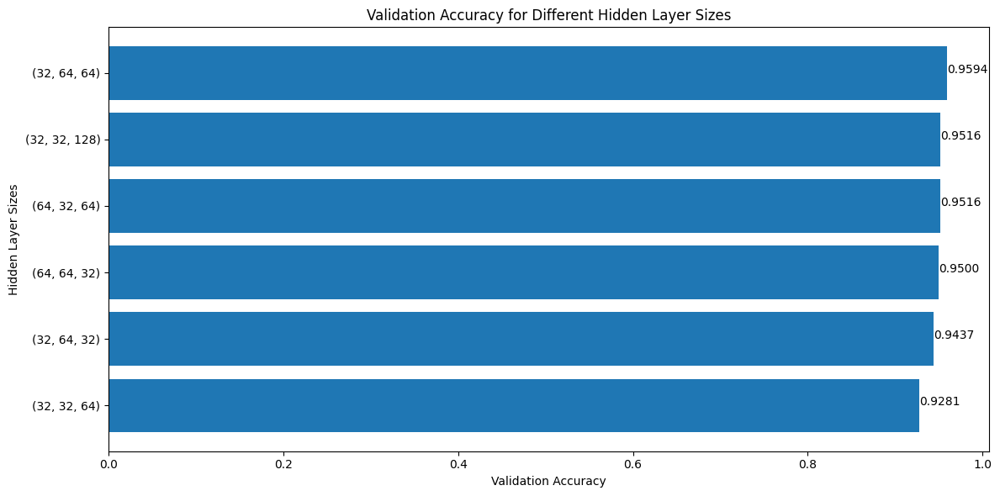

In [ ]:
# plot the results of hidden layer sizes experiment
plot_hidden_layer_results(hidden_size_df)

In [ ]:
ML_best_hidden_units = hidden_size_df.iloc[0]['Hidden Layer Sizes']
print(f"Best hidden layer sizes: {ML_best_hidden_units}")

Best hidden layer sizes: (32, 64, 64)


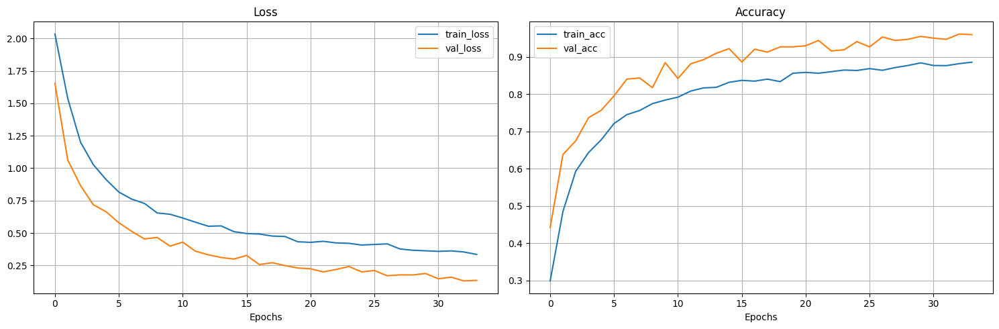

In [ ]:
# plot curves
plot_loss_curves(ML_model_hidden_results[ML_best_hidden_units])

And, with this experiment, we observe that the gap has widened, confirming the absence of overfitting.

Experiment 4. Try different optimizers and learning rates.

In [ ]:
# experiment 4: optimizers and learning rates
ML_model_opt_results = experiment_optimizers_and_learning_rates(train_dataloader=train_dataloader_ML,
                                                                val_dataloader=val_dataloader_ML,
                                                                num_epochs=num_epochs,
                                                                device=device,
                                                                num_classes=num_classes,
                                                                best_hidden_units_combo=ML_best_hidden_units,
                                                                best_decay_value=ML_best_decay_value,
                                                                best_dropout_probs_combo=ML_best_dropout_probs,
                                                                learning_rates_list=learning_rates_list)

Experimenting with Optimizers and Learning Rates
Learning rates to try: [0.01, 0.001, 0.0001, 1e-05, 1e-06]
Optimizers to try: ['SGD', 'RMSprop', 'Adam', 'AdamW', 'NAdam']

Testing SGD optimizer...

Learning rate: 0.01... 



  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.3032 | train_acc: 0.1158 | val_loss: 2.2066 | val_acc: 0.1219
Epoch: 2 | train_loss: 2.1468 | train_acc: 0.2353 | val_loss: 2.0482 | val_acc: 0.3323
Epoch: 3 | train_loss: 1.9891 | train_acc: 0.3664 | val_loss: 1.8676 | val_acc: 0.4557
Epoch: 4 | train_loss: 1.8443 | train_acc: 0.4191 | val_loss: 1.7005 | val_acc: 0.4448
Epoch: 5 | train_loss: 1.7103 | train_acc: 0.4347 | val_loss: 1.5605 | val_acc: 0.4891
Epoch: 6 | train_loss: 1.6124 | train_acc: 0.4643 | val_loss: 1.4543 | val_acc: 0.5109
Epoch: 7 | train_loss: 1.5473 | train_acc: 0.4802 | val_loss: 1.3969 | val_acc: 0.5385
Epoch: 8 | train_loss: 1.4853 | train_acc: 0.5045 | val_loss: 1.3115 | val_acc: 0.5682
Epoch: 9 | train_loss: 1.4506 | train_acc: 0.5179 | val_loss: 1.2561 | val_acc: 0.5891
Epoch: 10 | train_loss: 1.4047 | train_acc: 0.5317 | val_loss: 1.2060 | val_acc: 0.5917
Epoch: 11 | train_loss: 1.3651 | train_acc: 0.5568 | val_loss: 1.1504 | val_acc: 0.6167
Epoch: 12 | train_loss: 1.2997 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.3683 | train_acc: 0.0982 | val_loss: 2.3541 | val_acc: 0.1172
Epoch: 2 | train_loss: 2.3377 | train_acc: 0.1054 | val_loss: 2.3276 | val_acc: 0.1078
Epoch: 3 | train_loss: 2.3145 | train_acc: 0.1152 | val_loss: 2.3022 | val_acc: 0.1078
Epoch: 4 | train_loss: 2.2873 | train_acc: 0.1166 | val_loss: 2.2807 | val_acc: 0.1078
Epoch: 5 | train_loss: 2.2809 | train_acc: 0.1107 | val_loss: 2.2653 | val_acc: 0.1078
Epoch: 6 | train_loss: 2.2609 | train_acc: 0.1224 | val_loss: 2.2504 | val_acc: 0.1078
Epoch: 7 | train_loss: 2.2442 | train_acc: 0.1255 | val_loss: 2.2357 | val_acc: 0.1125
Epoch: 8 | train_loss: 2.2348 | train_acc: 0.1339 | val_loss: 2.2233 | val_acc: 0.1219
Epoch: 9 | train_loss: 2.2209 | train_acc: 0.1437 | val_loss: 2.2092 | val_acc: 0.1406
Epoch: 10 | train_loss: 2.2192 | train_acc: 0.1552 | val_loss: 2.1970 | val_acc: 0.2000
Epoch: 11 | train_loss: 2.1922 | train_acc: 0.1702 | val_loss: 2.1838 | val_acc: 0.2453
Epoch: 12 | train_loss: 2.1885 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.3937 | train_acc: 0.1089 | val_loss: 2.3918 | val_acc: 0.1927
Epoch: 2 | train_loss: 2.3910 | train_acc: 0.1226 | val_loss: 2.3903 | val_acc: 0.2083
Epoch: 3 | train_loss: 2.3918 | train_acc: 0.1143 | val_loss: 2.3888 | val_acc: 0.2188
Epoch: 4 | train_loss: 2.3887 | train_acc: 0.1240 | val_loss: 2.3874 | val_acc: 0.2266
Epoch: 5 | train_loss: 2.3861 | train_acc: 0.1239 | val_loss: 2.3860 | val_acc: 0.2250
Epoch: 6 | train_loss: 2.3835 | train_acc: 0.1270 | val_loss: 2.3845 | val_acc: 0.2318
Epoch: 7 | train_loss: 2.3833 | train_acc: 0.1222 | val_loss: 2.3831 | val_acc: 0.2333
Epoch: 8 | train_loss: 2.3802 | train_acc: 0.1437 | val_loss: 2.3816 | val_acc: 0.2349
Epoch: 9 | train_loss: 2.3768 | train_acc: 0.1329 | val_loss: 2.3801 | val_acc: 0.2370
Epoch: 10 | train_loss: 2.3753 | train_acc: 0.1339 | val_loss: 2.3786 | val_acc: 0.2375
Epoch: 11 | train_loss: 2.3766 | train_acc: 0.1373 | val_loss: 2.3772 | val_acc: 0.2375
Epoch: 12 | train_loss: 2.3722 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.4108 | train_acc: 0.1054 | val_loss: 2.3985 | val_acc: 0.1062
Epoch: 2 | train_loss: 2.4103 | train_acc: 0.1090 | val_loss: 2.3981 | val_acc: 0.1094
Epoch: 3 | train_loss: 2.4062 | train_acc: 0.1026 | val_loss: 2.3978 | val_acc: 0.1094
Epoch: 4 | train_loss: 2.4141 | train_acc: 0.1068 | val_loss: 2.3974 | val_acc: 0.1094
Epoch: 5 | train_loss: 2.4065 | train_acc: 0.1139 | val_loss: 2.3971 | val_acc: 0.1094
Epoch: 6 | train_loss: 2.4084 | train_acc: 0.1075 | val_loss: 2.3968 | val_acc: 0.1094
Epoch: 7 | train_loss: 2.4061 | train_acc: 0.1221 | val_loss: 2.3964 | val_acc: 0.1078
Epoch: 8 | train_loss: 2.4072 | train_acc: 0.1102 | val_loss: 2.3961 | val_acc: 0.1094
Epoch: 9 | train_loss: 2.4083 | train_acc: 0.1068 | val_loss: 2.3958 | val_acc: 0.1109
Epoch: 10 | train_loss: 2.4084 | train_acc: 0.1118 | val_loss: 2.3955 | val_acc: 0.1109
Epoch: 11 | train_loss: 2.4073 | train_acc: 0.1017 | val_loss: 2.3951 | val_acc: 0.1109
Epoch: 12 | train_loss: 2.4039 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.4030 | train_acc: 0.0735 | val_loss: 2.4006 | val_acc: 0.0693
Epoch: 2 | train_loss: 2.4051 | train_acc: 0.0843 | val_loss: 2.4006 | val_acc: 0.0693
Epoch: 3 | train_loss: 2.4073 | train_acc: 0.0722 | val_loss: 2.4006 | val_acc: 0.0693
Epoch: 4 | train_loss: 2.4054 | train_acc: 0.0788 | val_loss: 2.4005 | val_acc: 0.0693
Epoch: 5 | train_loss: 2.4079 | train_acc: 0.0761 | val_loss: 2.4005 | val_acc: 0.0693
Epoch: 6 | train_loss: 2.4047 | train_acc: 0.0851 | val_loss: 2.4005 | val_acc: 0.0693
Epoch: 7 | train_loss: 2.4083 | train_acc: 0.0685 | val_loss: 2.4004 | val_acc: 0.0693
Epoch: 8 | train_loss: 2.4056 | train_acc: 0.0774 | val_loss: 2.4004 | val_acc: 0.0693
Epoch: 9 | train_loss: 2.4049 | train_acc: 0.0845 | val_loss: 2.4004 | val_acc: 0.0693
Epoch: 10 | train_loss: 2.4043 | train_acc: 0.0747 | val_loss: 2.4004 | val_acc: 0.0693
Epoch: 11 | train_loss: 2.4067 | train_acc: 0.0811 | val_loss: 2.4003 | val_acc: 0.0693
Epoch: 12 | train_loss: 2.4092 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 301.3156 | train_acc: 0.1151 | val_loss: 2.3824 | val_acc: 0.1078
Epoch: 2 | train_loss: 2.3813 | train_acc: 0.1070 | val_loss: 2.3889 | val_acc: 0.1047
Epoch: 3 | train_loss: 2.3760 | train_acc: 0.1138 | val_loss: 2.3924 | val_acc: 0.1156
Epoch: 4 | train_loss: 2.3738 | train_acc: 0.1103 | val_loss: 2.4012 | val_acc: 0.1156
Epoch: 5 | train_loss: 2.3713 | train_acc: 0.1167 | val_loss: 2.3788 | val_acc: 0.1078
Epoch: 6 | train_loss: 2.3756 | train_acc: 0.1119 | val_loss: 2.3865 | val_acc: 0.1156
Epoch: 7 | train_loss: 2.3689 | train_acc: 0.1146 | val_loss: 2.3792 | val_acc: 0.1156
Epoch: 8 | train_loss: 2.3729 | train_acc: 0.1188 | val_loss: 2.3948 | val_acc: 0.1047
Epoch: 9 | train_loss: 2.3720 | train_acc: 0.1159 | val_loss: 2.3832 | val_acc: 0.1156
Epoch: 10 | train_loss: 2.3861 | train_acc: 0.1066 | val_loss: 2.3842 | val_acc: 0.1156
Epoch: 11 | train_loss: 2.4204 | train_acc: 0.1202 | val_loss: 2.3797 | val_acc: 0.1156
Epoch: 12 | train_loss: 2.3718 | train_

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.9417 | train_acc: 0.3359 | val_loss: 1.3842 | val_acc: 0.5620
Epoch: 2 | train_loss: 1.4010 | train_acc: 0.5253 | val_loss: 1.0305 | val_acc: 0.6464
Epoch: 3 | train_loss: 1.1546 | train_acc: 0.6055 | val_loss: 0.7630 | val_acc: 0.7312
Epoch: 4 | train_loss: 0.9979 | train_acc: 0.6457 | val_loss: 0.7263 | val_acc: 0.7469
Epoch: 5 | train_loss: 0.8570 | train_acc: 0.7012 | val_loss: 0.6347 | val_acc: 0.7911
Epoch: 6 | train_loss: 0.8195 | train_acc: 0.7127 | val_loss: 0.6542 | val_acc: 0.7714
Epoch: 7 | train_loss: 0.7564 | train_acc: 0.7364 | val_loss: 0.6432 | val_acc: 0.7448
Epoch: 8 | train_loss: 0.7149 | train_acc: 0.7568 | val_loss: 0.5198 | val_acc: 0.8266
Epoch: 9 | train_loss: 0.6860 | train_acc: 0.7649 | val_loss: 0.4955 | val_acc: 0.8448
Epoch: 10 | train_loss: 0.6395 | train_acc: 0.7819 | val_loss: 0.5034 | val_acc: 0.8141
Epoch: 11 | train_loss: 0.6179 | train_acc: 0.7913 | val_loss: 0.4299 | val_acc: 0.8500
Epoch: 12 | train_loss: 0.5668 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.1643 | train_acc: 0.2076 | val_loss: 1.9867 | val_acc: 0.3635
Epoch: 2 | train_loss: 1.9070 | train_acc: 0.3608 | val_loss: 1.6833 | val_acc: 0.4885
Epoch: 3 | train_loss: 1.7269 | train_acc: 0.4299 | val_loss: 1.5303 | val_acc: 0.4885
Epoch: 4 | train_loss: 1.6344 | train_acc: 0.4507 | val_loss: 1.4274 | val_acc: 0.5307
Epoch: 5 | train_loss: 1.5442 | train_acc: 0.4754 | val_loss: 1.3272 | val_acc: 0.5495
Epoch: 6 | train_loss: 1.4937 | train_acc: 0.5117 | val_loss: 1.2697 | val_acc: 0.5776
Epoch: 7 | train_loss: 1.4194 | train_acc: 0.5357 | val_loss: 1.1817 | val_acc: 0.6120
Epoch: 8 | train_loss: 1.3769 | train_acc: 0.5499 | val_loss: 1.1234 | val_acc: 0.6432
Epoch: 9 | train_loss: 1.2996 | train_acc: 0.5746 | val_loss: 1.0743 | val_acc: 0.6557
Epoch: 10 | train_loss: 1.2481 | train_acc: 0.5930 | val_loss: 1.0245 | val_acc: 0.6693
Epoch: 11 | train_loss: 1.1965 | train_acc: 0.6097 | val_loss: 0.9617 | val_acc: 0.6964
Epoch: 12 | train_loss: 1.1533 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.3728 | train_acc: 0.1013 | val_loss: 2.3587 | val_acc: 0.1562
Epoch: 2 | train_loss: 2.3223 | train_acc: 0.1181 | val_loss: 2.3238 | val_acc: 0.1109
Epoch: 3 | train_loss: 2.3027 | train_acc: 0.1116 | val_loss: 2.2984 | val_acc: 0.1109
Epoch: 4 | train_loss: 2.2763 | train_acc: 0.1179 | val_loss: 2.2762 | val_acc: 0.1109
Epoch: 5 | train_loss: 2.2713 | train_acc: 0.1225 | val_loss: 2.2609 | val_acc: 0.1109
Epoch: 6 | train_loss: 2.2473 | train_acc: 0.1255 | val_loss: 2.2461 | val_acc: 0.1141
Epoch: 7 | train_loss: 2.2400 | train_acc: 0.1330 | val_loss: 2.2305 | val_acc: 0.1234
Epoch: 8 | train_loss: 2.2207 | train_acc: 0.1464 | val_loss: 2.2130 | val_acc: 0.1625
Epoch: 9 | train_loss: 2.2076 | train_acc: 0.1577 | val_loss: 2.1961 | val_acc: 0.1828
Epoch: 10 | train_loss: 2.1886 | train_acc: 0.1616 | val_loss: 2.1761 | val_acc: 0.2094
Epoch: 11 | train_loss: 2.1748 | train_acc: 0.1863 | val_loss: 2.1540 | val_acc: 0.2276
Epoch: 12 | train_loss: 2.1607 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.3989 | train_acc: 0.1044 | val_loss: 2.3922 | val_acc: 0.1047
Epoch: 2 | train_loss: 2.3955 | train_acc: 0.1034 | val_loss: 2.3897 | val_acc: 0.1354
Epoch: 3 | train_loss: 2.3919 | train_acc: 0.1222 | val_loss: 2.3874 | val_acc: 0.1771
Epoch: 4 | train_loss: 2.3876 | train_acc: 0.1187 | val_loss: 2.3852 | val_acc: 0.1797
Epoch: 5 | train_loss: 2.3813 | train_acc: 0.1120 | val_loss: 2.3831 | val_acc: 0.1948
Epoch: 6 | train_loss: 2.3809 | train_acc: 0.1222 | val_loss: 2.3810 | val_acc: 0.1938
Epoch: 7 | train_loss: 2.3753 | train_acc: 0.1303 | val_loss: 2.3788 | val_acc: 0.1906
Epoch: 8 | train_loss: 2.3720 | train_acc: 0.1303 | val_loss: 2.3767 | val_acc: 0.1812
Epoch: 9 | train_loss: 2.3663 | train_acc: 0.1360 | val_loss: 2.3745 | val_acc: 0.1703
Epoch: 10 | train_loss: 2.3658 | train_acc: 0.1283 | val_loss: 2.3724 | val_acc: 0.1672
Epoch: 11 | train_loss: 2.3627 | train_acc: 0.1345 | val_loss: 2.3702 | val_acc: 0.1562
Epoch: 12 | train_loss: 2.3608 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.3964 | train_acc: 0.1182 | val_loss: 2.3791 | val_acc: 0.1047
Epoch: 2 | train_loss: 2.3663 | train_acc: 0.1112 | val_loss: 2.3804 | val_acc: 0.1156
Epoch: 3 | train_loss: 2.3683 | train_acc: 0.1246 | val_loss: 2.3774 | val_acc: 0.1156
Epoch: 4 | train_loss: 2.3691 | train_acc: 0.1179 | val_loss: 2.3787 | val_acc: 0.1156
Epoch: 5 | train_loss: 2.3845 | train_acc: 0.1091 | val_loss: 2.3798 | val_acc: 0.1156
Epoch: 6 | train_loss: 2.5156 | train_acc: 0.1150 | val_loss: 2.3888 | val_acc: 0.1156
Epoch: 7 | train_loss: 2.3865 | train_acc: 0.1124 | val_loss: 2.3964 | val_acc: 0.1156
Epoch: 8 | train_loss: 2.3724 | train_acc: 0.1202 | val_loss: 2.3789 | val_acc: 0.1156
Epoch: 9 | train_loss: 2.3770 | train_acc: 0.1144 | val_loss: 2.3847 | val_acc: 0.1156
Epoch: 10 | train_loss: 2.3681 | train_acc: 0.1169 | val_loss: 2.3853 | val_acc: 0.1047
Epoch: 11 | train_loss: 2.3715 | train_acc: 0.1167 | val_loss: 2.3903 | val_acc: 0.1156
Epoch: 12 | train_loss: 2.3696 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.9928 | train_acc: 0.3062 | val_loss: 1.6539 | val_acc: 0.3917
Epoch: 2 | train_loss: 1.5931 | train_acc: 0.4605 | val_loss: 1.3821 | val_acc: 0.5193
Epoch: 3 | train_loss: 1.3525 | train_acc: 0.5567 | val_loss: 1.0282 | val_acc: 0.6453
Epoch: 4 | train_loss: 1.1162 | train_acc: 0.6237 | val_loss: 0.8323 | val_acc: 0.7318
Epoch: 5 | train_loss: 0.9737 | train_acc: 0.6766 | val_loss: 0.7695 | val_acc: 0.7526
Epoch: 6 | train_loss: 0.8742 | train_acc: 0.7047 | val_loss: 0.6274 | val_acc: 0.8161
Epoch: 7 | train_loss: 0.8232 | train_acc: 0.7170 | val_loss: 0.5992 | val_acc: 0.7812
Epoch: 8 | train_loss: 0.7830 | train_acc: 0.7405 | val_loss: 0.5667 | val_acc: 0.8146
Epoch: 9 | train_loss: 0.7378 | train_acc: 0.7500 | val_loss: 0.5287 | val_acc: 0.8313
Epoch: 10 | train_loss: 0.6871 | train_acc: 0.7684 | val_loss: 0.4628 | val_acc: 0.8453
Epoch: 11 | train_loss: 0.6788 | train_acc: 0.7760 | val_loss: 0.4946 | val_acc: 0.8297
Epoch: 12 | train_loss: 0.6715 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.2935 | train_acc: 0.1049 | val_loss: 2.2236 | val_acc: 0.1297
Epoch: 2 | train_loss: 2.1322 | train_acc: 0.2037 | val_loss: 1.9859 | val_acc: 0.4078
Epoch: 3 | train_loss: 1.9007 | train_acc: 0.3701 | val_loss: 1.6828 | val_acc: 0.4323
Epoch: 4 | train_loss: 1.7345 | train_acc: 0.4144 | val_loss: 1.5515 | val_acc: 0.4651
Epoch: 5 | train_loss: 1.6315 | train_acc: 0.4499 | val_loss: 1.4390 | val_acc: 0.5260
Epoch: 6 | train_loss: 1.5665 | train_acc: 0.4672 | val_loss: 1.3859 | val_acc: 0.5448
Epoch: 7 | train_loss: 1.4855 | train_acc: 0.5031 | val_loss: 1.3194 | val_acc: 0.5729
Epoch: 8 | train_loss: 1.4485 | train_acc: 0.5094 | val_loss: 1.2571 | val_acc: 0.5870
Epoch: 9 | train_loss: 1.4226 | train_acc: 0.5239 | val_loss: 1.2193 | val_acc: 0.5995
Epoch: 10 | train_loss: 1.3637 | train_acc: 0.5367 | val_loss: 1.1585 | val_acc: 0.6135
Epoch: 11 | train_loss: 1.3218 | train_acc: 0.5655 | val_loss: 1.0910 | val_acc: 0.6323
Epoch: 12 | train_loss: 1.2460 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.4008 | train_acc: 0.0851 | val_loss: 2.3838 | val_acc: 0.1672
Epoch: 2 | train_loss: 2.3616 | train_acc: 0.1220 | val_loss: 2.3545 | val_acc: 0.1656
Epoch: 3 | train_loss: 2.3277 | train_acc: 0.1232 | val_loss: 2.3193 | val_acc: 0.1109
Epoch: 4 | train_loss: 2.2967 | train_acc: 0.1236 | val_loss: 2.2896 | val_acc: 0.1109
Epoch: 5 | train_loss: 2.2710 | train_acc: 0.1165 | val_loss: 2.2645 | val_acc: 0.1109
Epoch: 6 | train_loss: 2.2550 | train_acc: 0.1156 | val_loss: 2.2464 | val_acc: 0.1156
Epoch: 7 | train_loss: 2.2453 | train_acc: 0.1254 | val_loss: 2.2290 | val_acc: 0.1313
Epoch: 8 | train_loss: 2.2314 | train_acc: 0.1290 | val_loss: 2.2109 | val_acc: 0.1422
Epoch: 9 | train_loss: 2.2087 | train_acc: 0.1476 | val_loss: 2.1934 | val_acc: 0.1531
Epoch: 10 | train_loss: 2.1916 | train_acc: 0.1624 | val_loss: 2.1730 | val_acc: 0.1609
Epoch: 11 | train_loss: 2.1704 | train_acc: 0.1712 | val_loss: 2.1506 | val_acc: 0.1719
Epoch: 12 | train_loss: 2.1591 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.4133 | train_acc: 0.0823 | val_loss: 2.4005 | val_acc: 0.0958
Epoch: 2 | train_loss: 2.4074 | train_acc: 0.0923 | val_loss: 2.3975 | val_acc: 0.0979
Epoch: 3 | train_loss: 2.4068 | train_acc: 0.0915 | val_loss: 2.3945 | val_acc: 0.1203
Epoch: 4 | train_loss: 2.3988 | train_acc: 0.0947 | val_loss: 2.3915 | val_acc: 0.1318
Epoch: 5 | train_loss: 2.3956 | train_acc: 0.0882 | val_loss: 2.3888 | val_acc: 0.1557
Epoch: 6 | train_loss: 2.3873 | train_acc: 0.0896 | val_loss: 2.3860 | val_acc: 0.1542
Epoch: 7 | train_loss: 2.3832 | train_acc: 0.1017 | val_loss: 2.3830 | val_acc: 0.1380
Epoch: 8 | train_loss: 2.3803 | train_acc: 0.0855 | val_loss: 2.3801 | val_acc: 0.1266
Epoch: 9 | train_loss: 2.3789 | train_acc: 0.0880 | val_loss: 2.3773 | val_acc: 0.1141
Epoch: 10 | train_loss: 2.3754 | train_acc: 0.0959 | val_loss: 2.3744 | val_acc: 0.1094
Epoch: 11 | train_loss: 2.3678 | train_acc: 0.0927 | val_loss: 2.3715 | val_acc: 0.1078
Epoch: 12 | train_loss: 2.3669 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.4544 | train_acc: 0.1046 | val_loss: 2.3743 | val_acc: 0.1156
Epoch: 2 | train_loss: 2.3696 | train_acc: 0.1177 | val_loss: 2.3801 | val_acc: 0.1047
Epoch: 3 | train_loss: 2.3679 | train_acc: 0.1138 | val_loss: 2.3849 | val_acc: 0.1156
Epoch: 4 | train_loss: 2.3632 | train_acc: 0.1162 | val_loss: 2.3924 | val_acc: 0.1047
Epoch: 5 | train_loss: 2.3728 | train_acc: 0.1165 | val_loss: 2.3785 | val_acc: 0.1156
Epoch: 6 | train_loss: 2.3939 | train_acc: 0.1205 | val_loss: 2.3944 | val_acc: 0.1078
Epoch: 7 | train_loss: 2.3978 | train_acc: 0.1131 | val_loss: 2.3781 | val_acc: 0.1156
Epoch: 8 | train_loss: 2.3722 | train_acc: 0.1078 | val_loss: 2.3875 | val_acc: 0.1156
Epoch: 9 | train_loss: 2.3690 | train_acc: 0.1257 | val_loss: 2.3766 | val_acc: 0.1156
Epoch: 10 | train_loss: 2.3664 | train_acc: 0.1097 | val_loss: 2.3950 | val_acc: 0.1047
Epoch: 11 | train_loss: 2.3700 | train_acc: 0.1224 | val_loss: 2.3736 | val_acc: 0.1156
Epoch: 12 | train_loss: 2.3658 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.0237 | train_acc: 0.2835 | val_loss: 1.6260 | val_acc: 0.4313
Epoch: 2 | train_loss: 1.5473 | train_acc: 0.4787 | val_loss: 1.2338 | val_acc: 0.5953
Epoch: 3 | train_loss: 1.2605 | train_acc: 0.5668 | val_loss: 0.9115 | val_acc: 0.6724
Epoch: 4 | train_loss: 1.0457 | train_acc: 0.6397 | val_loss: 0.7413 | val_acc: 0.7495
Epoch: 5 | train_loss: 0.9200 | train_acc: 0.6803 | val_loss: 0.7306 | val_acc: 0.7443
Epoch: 6 | train_loss: 0.8368 | train_acc: 0.7160 | val_loss: 0.6003 | val_acc: 0.8109
Epoch: 7 | train_loss: 0.7944 | train_acc: 0.7216 | val_loss: 0.5715 | val_acc: 0.8172
Epoch: 8 | train_loss: 0.7156 | train_acc: 0.7544 | val_loss: 0.4943 | val_acc: 0.8250
Epoch: 9 | train_loss: 0.7064 | train_acc: 0.7639 | val_loss: 0.4932 | val_acc: 0.8281
Epoch: 10 | train_loss: 0.6610 | train_acc: 0.7810 | val_loss: 0.4438 | val_acc: 0.8500
Epoch: 11 | train_loss: 0.6508 | train_acc: 0.7777 | val_loss: 0.4165 | val_acc: 0.8719
Epoch: 12 | train_loss: 0.6139 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.2730 | train_acc: 0.1130 | val_loss: 2.2012 | val_acc: 0.1703
Epoch: 2 | train_loss: 2.1273 | train_acc: 0.2040 | val_loss: 1.9928 | val_acc: 0.3292
Epoch: 3 | train_loss: 1.9359 | train_acc: 0.3518 | val_loss: 1.7468 | val_acc: 0.4917
Epoch: 4 | train_loss: 1.7715 | train_acc: 0.4111 | val_loss: 1.5601 | val_acc: 0.4932
Epoch: 5 | train_loss: 1.6522 | train_acc: 0.4511 | val_loss: 1.4495 | val_acc: 0.5198
Epoch: 6 | train_loss: 1.5844 | train_acc: 0.4817 | val_loss: 1.3779 | val_acc: 0.5448
Epoch: 7 | train_loss: 1.5238 | train_acc: 0.5008 | val_loss: 1.3165 | val_acc: 0.5464
Epoch: 8 | train_loss: 1.4557 | train_acc: 0.5137 | val_loss: 1.2430 | val_acc: 0.5807
Epoch: 9 | train_loss: 1.3711 | train_acc: 0.5401 | val_loss: 1.1663 | val_acc: 0.5964
Epoch: 10 | train_loss: 1.3533 | train_acc: 0.5519 | val_loss: 1.1067 | val_acc: 0.6307
Epoch: 11 | train_loss: 1.2962 | train_acc: 0.5766 | val_loss: 1.0463 | val_acc: 0.6536
Epoch: 12 | train_loss: 1.2398 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.3645 | train_acc: 0.1188 | val_loss: 2.3465 | val_acc: 0.1219
Epoch: 2 | train_loss: 2.3209 | train_acc: 0.1226 | val_loss: 2.3084 | val_acc: 0.1078
Epoch: 3 | train_loss: 2.2820 | train_acc: 0.1220 | val_loss: 2.2729 | val_acc: 0.1078
Epoch: 4 | train_loss: 2.2613 | train_acc: 0.1280 | val_loss: 2.2527 | val_acc: 0.1094
Epoch: 5 | train_loss: 2.2385 | train_acc: 0.1259 | val_loss: 2.2329 | val_acc: 0.1141
Epoch: 6 | train_loss: 2.2256 | train_acc: 0.1338 | val_loss: 2.2153 | val_acc: 0.1344
Epoch: 7 | train_loss: 2.2106 | train_acc: 0.1505 | val_loss: 2.1966 | val_acc: 0.1417
Epoch: 8 | train_loss: 2.1963 | train_acc: 0.1500 | val_loss: 2.1790 | val_acc: 0.1542
Epoch: 9 | train_loss: 2.1714 | train_acc: 0.1669 | val_loss: 2.1607 | val_acc: 0.1745
Epoch: 10 | train_loss: 2.1661 | train_acc: 0.1756 | val_loss: 2.1400 | val_acc: 0.1917
Epoch: 11 | train_loss: 2.1361 | train_acc: 0.1976 | val_loss: 2.1175 | val_acc: 0.2167
Epoch: 12 | train_loss: 2.1216 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.4053 | train_acc: 0.0878 | val_loss: 2.3960 | val_acc: 0.0516
Epoch: 2 | train_loss: 2.3923 | train_acc: 0.1016 | val_loss: 2.3925 | val_acc: 0.0427
Epoch: 3 | train_loss: 2.3910 | train_acc: 0.0883 | val_loss: 2.3891 | val_acc: 0.0625
Epoch: 4 | train_loss: 2.3871 | train_acc: 0.0900 | val_loss: 2.3857 | val_acc: 0.0865
Epoch: 5 | train_loss: 2.3842 | train_acc: 0.0992 | val_loss: 2.3826 | val_acc: 0.1026
Epoch: 6 | train_loss: 2.3772 | train_acc: 0.0994 | val_loss: 2.3793 | val_acc: 0.1062
Epoch: 7 | train_loss: 2.3693 | train_acc: 0.1081 | val_loss: 2.3761 | val_acc: 0.1047
Epoch: 8 | train_loss: 2.3676 | train_acc: 0.1041 | val_loss: 2.3729 | val_acc: 0.1078
Epoch: 9 | train_loss: 2.3641 | train_acc: 0.0942 | val_loss: 2.3697 | val_acc: 0.1078
Epoch: 10 | train_loss: 2.3568 | train_acc: 0.1087 | val_loss: 2.3665 | val_acc: 0.1078
Epoch: 11 | train_loss: 2.3598 | train_acc: 0.1052 | val_loss: 2.3635 | val_acc: 0.1078
Epoch: 12 | train_loss: 2.3513 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.4291 | train_acc: 0.1110 | val_loss: 2.3795 | val_acc: 0.1156
Epoch: 2 | train_loss: 2.4013 | train_acc: 0.1171 | val_loss: 2.3830 | val_acc: 0.1156
Epoch: 3 | train_loss: 2.3885 | train_acc: 0.1187 | val_loss: 2.3835 | val_acc: 0.1156
Epoch: 4 | train_loss: 2.3697 | train_acc: 0.1062 | val_loss: 2.3855 | val_acc: 0.1156
Epoch: 5 | train_loss: 20.7427 | train_acc: 0.1117 | val_loss: 2.3818 | val_acc: 0.1156
Epoch: 6 | train_loss: 2.4788 | train_acc: 0.1137 | val_loss: 2.3913 | val_acc: 0.1156
Epoch: 7 | train_loss: 2.4672 | train_acc: 0.1096 | val_loss: 2.3862 | val_acc: 0.1156
Epoch: 8 | train_loss: 2.3973 | train_acc: 0.1112 | val_loss: 2.3869 | val_acc: 0.1047
Epoch: 9 | train_loss: 2.4054 | train_acc: 0.1247 | val_loss: 2.3725 | val_acc: 0.1156
Epoch: 10 | train_loss: 2.3800 | train_acc: 0.1128 | val_loss: 2.3911 | val_acc: 0.1156
Epoch: 11 | train_loss: 2.3718 | train_acc: 0.1238 | val_loss: 2.3815 | val_acc: 0.1156
Epoch: 12 | train_loss: 2.3803 | train_a

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.9620 | train_acc: 0.3143 | val_loss: 1.4997 | val_acc: 0.5245
Epoch: 2 | train_loss: 1.4682 | train_acc: 0.4991 | val_loss: 1.0965 | val_acc: 0.6161
Epoch: 3 | train_loss: 1.1367 | train_acc: 0.6145 | val_loss: 0.8166 | val_acc: 0.7240
Epoch: 4 | train_loss: 0.9694 | train_acc: 0.6612 | val_loss: 0.6891 | val_acc: 0.7823
Epoch: 5 | train_loss: 0.8703 | train_acc: 0.7114 | val_loss: 0.6680 | val_acc: 0.7859
Epoch: 6 | train_loss: 0.8475 | train_acc: 0.7116 | val_loss: 0.6662 | val_acc: 0.7922
Epoch: 7 | train_loss: 0.7644 | train_acc: 0.7375 | val_loss: 0.5584 | val_acc: 0.8266
Epoch: 8 | train_loss: 0.7162 | train_acc: 0.7638 | val_loss: 0.4893 | val_acc: 0.8500
Epoch: 9 | train_loss: 0.6713 | train_acc: 0.7705 | val_loss: 0.4593 | val_acc: 0.8688
Epoch: 10 | train_loss: 0.6226 | train_acc: 0.7873 | val_loss: 0.4500 | val_acc: 0.8547
Epoch: 11 | train_loss: 0.6073 | train_acc: 0.7991 | val_loss: 0.4212 | val_acc: 0.8547
Epoch: 12 | train_loss: 0.5741 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.2816 | train_acc: 0.1292 | val_loss: 2.1967 | val_acc: 0.2031
Epoch: 2 | train_loss: 2.0958 | train_acc: 0.2589 | val_loss: 1.9003 | val_acc: 0.4417
Epoch: 3 | train_loss: 1.8521 | train_acc: 0.3875 | val_loss: 1.5933 | val_acc: 0.4667
Epoch: 4 | train_loss: 1.6791 | train_acc: 0.4412 | val_loss: 1.4461 | val_acc: 0.5292
Epoch: 5 | train_loss: 1.5896 | train_acc: 0.4783 | val_loss: 1.3654 | val_acc: 0.5526
Epoch: 6 | train_loss: 1.4955 | train_acc: 0.4969 | val_loss: 1.2663 | val_acc: 0.5995
Epoch: 7 | train_loss: 1.4303 | train_acc: 0.5232 | val_loss: 1.2089 | val_acc: 0.6057
Epoch: 8 | train_loss: 1.3376 | train_acc: 0.5672 | val_loss: 1.1026 | val_acc: 0.6292
Epoch: 9 | train_loss: 1.2920 | train_acc: 0.5723 | val_loss: 1.0317 | val_acc: 0.6714
Epoch: 10 | train_loss: 1.2023 | train_acc: 0.6090 | val_loss: 0.9569 | val_acc: 0.6917
Epoch: 11 | train_loss: 1.1528 | train_acc: 0.6125 | val_loss: 0.9066 | val_acc: 0.6880
Epoch: 12 | train_loss: 1.1224 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.3989 | train_acc: 0.0922 | val_loss: 2.3703 | val_acc: 0.1792
Epoch: 2 | train_loss: 2.3397 | train_acc: 0.1282 | val_loss: 2.3274 | val_acc: 0.1250
Epoch: 3 | train_loss: 2.2986 | train_acc: 0.1237 | val_loss: 2.2910 | val_acc: 0.1078
Epoch: 4 | train_loss: 2.2749 | train_acc: 0.1219 | val_loss: 2.2640 | val_acc: 0.1078
Epoch: 5 | train_loss: 2.2539 | train_acc: 0.1209 | val_loss: 2.2478 | val_acc: 0.1109
Epoch: 6 | train_loss: 2.2445 | train_acc: 0.1287 | val_loss: 2.2319 | val_acc: 0.1187
Epoch: 7 | train_loss: 2.2305 | train_acc: 0.1306 | val_loss: 2.2175 | val_acc: 0.1328
Epoch: 8 | train_loss: 2.2161 | train_acc: 0.1474 | val_loss: 2.2002 | val_acc: 0.1531
Epoch: 9 | train_loss: 2.2009 | train_acc: 0.1579 | val_loss: 2.1829 | val_acc: 0.1641
Epoch: 10 | train_loss: 2.1789 | train_acc: 0.1634 | val_loss: 2.1644 | val_acc: 0.1734
Epoch: 11 | train_loss: 2.1673 | train_acc: 0.1767 | val_loss: 2.1484 | val_acc: 0.1938
Epoch: 12 | train_loss: 2.1511 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.4059 | train_acc: 0.0853 | val_loss: 2.3992 | val_acc: 0.1531
Epoch: 2 | train_loss: 2.4046 | train_acc: 0.0868 | val_loss: 2.3968 | val_acc: 0.1661
Epoch: 3 | train_loss: 2.4041 | train_acc: 0.0803 | val_loss: 2.3944 | val_acc: 0.1589
Epoch: 4 | train_loss: 2.4019 | train_acc: 0.0768 | val_loss: 2.3921 | val_acc: 0.1531
Epoch: 5 | train_loss: 2.3939 | train_acc: 0.0875 | val_loss: 2.3898 | val_acc: 0.1375
Epoch: 6 | train_loss: 2.3878 | train_acc: 0.0962 | val_loss: 2.3874 | val_acc: 0.1234
Epoch: 7 | train_loss: 2.3843 | train_acc: 0.0943 | val_loss: 2.3852 | val_acc: 0.1156
Epoch: 8 | train_loss: 2.3845 | train_acc: 0.0940 | val_loss: 2.3828 | val_acc: 0.1141
Epoch: 9 | train_loss: 2.3807 | train_acc: 0.0980 | val_loss: 2.3806 | val_acc: 0.1094
Epoch: 10 | train_loss: 2.3733 | train_acc: 0.1122 | val_loss: 2.3783 | val_acc: 0.1094
Epoch: 11 | train_loss: 2.3731 | train_acc: 0.1027 | val_loss: 2.3759 | val_acc: 0.1078
Epoch: 12 | train_loss: 2.3683 | train_ac

In [ ]:
# put all the results in a table and print it in desc order (results in a list in this case)
optimizers_df = pd.DataFrame(ML_model_opt_results, columns=['Optimizer', 'Best Learning Rate', 'Validation Accuracy'])
optimizers_df = optimizers_df.sort_values(by='Validation Accuracy', ascending=False)
print("\n", optimizers_df.to_string(index=False))


 Optimizer  Best Learning Rate  Validation Accuracy
  RMSprop               0.001             0.962500
    AdamW               0.001             0.962500
    NAdam               0.001             0.960938
     Adam               0.001             0.959375
      SGD               0.010             0.829688


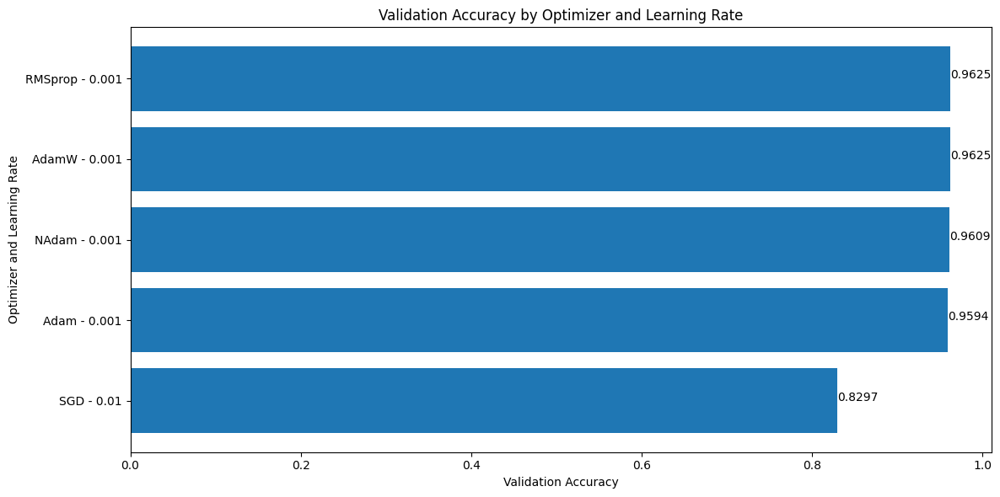

In [ ]:
# plot the results of the experiment
plot_optimizers_results(optimizers_df)

In [ ]:
# get and print best optimizer and learning rate
ML_best_optimizer_name = optimizers_df.iloc[0]['Optimizer']
ML_best_optimizer = torch.optim.__dict__[ML_best_optimizer_name]
print(f"Best optimizer: {ML_best_optimizer_name}")
ML_best_learning_rate = optimizers_df.iloc[0]['Best Learning Rate']
print(f"Best learning rate: {ML_best_learning_rate}")

Best optimizer: RMSprop
Best learning rate: 0.001


Experiment 5. Try various activation functions.

In [ ]:
# experiment 5: activation functions
ML_model_act_fn_results = experiment_activation_functions(train_dataloader=train_dataloader_ML,
                                                          val_dataloader=val_dataloader_ML,
                                                          num_epochs=num_epochs,
                                                          device=device,
                                                          num_classes=num_classes,
                                                          best_hidden_units_combo=ML_best_hidden_units,
                                                          best_decay_value=ML_best_decay_value,
                                                          best_dropout_probs_combo=ML_best_dropout_probs,
                                                          best_optimizer=ML_best_optimizer,
                                                          best_learning_rate=ML_best_learning_rate)

Experimenting with Activation Functions
Activation functions to try: ['ReLU', 'LeakyReLU', 'ELU', 'GELU', 'SiLU']

Testing ReLU activation function as activation function in feature extractor...

Testing ReLU activation function as activation function in classifier...


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.1381 | train_acc: 0.2386 | val_loss: 1.6829 | val_acc: 0.3729
Epoch: 2 | train_loss: 1.7062 | train_acc: 0.3973 | val_loss: 1.3705 | val_acc: 0.5443
Epoch: 3 | train_loss: 1.4656 | train_acc: 0.5017 | val_loss: 1.1616 | val_acc: 0.6010
Epoch: 4 | train_loss: 1.2448 | train_acc: 0.5703 | val_loss: 0.9766 | val_acc: 0.6500
Epoch: 5 | train_loss: 1.1309 | train_acc: 0.6081 | val_loss: 0.8811 | val_acc: 0.7109
Epoch: 6 | train_loss: 1.0043 | train_acc: 0.6612 | val_loss: 0.7509 | val_acc: 0.7370
Epoch: 7 | train_loss: 0.8986 | train_acc: 0.6856 | val_loss: 0.6608 | val_acc: 0.7948
Epoch: 8 | train_loss: 0.8736 | train_acc: 0.7042 | val_loss: 0.6759 | val_acc: 0.7859
Epoch: 9 | train_loss: 0.8257 | train_acc: 0.7122 | val_loss: 0.5597 | val_acc: 0.8172
Epoch: 10 | train_loss: 0.7477 | train_acc: 0.7478 | val_loss: 0.6815 | val_acc: 0.7672
Epoch: 11 | train_loss: 0.7410 | train_acc: 0.7495 | val_loss: 0.4851 | val_acc: 0.8422
Epoch: 12 | train_loss: 0.7185 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.0735 | train_acc: 0.2677 | val_loss: 1.6540 | val_acc: 0.3557
Epoch: 2 | train_loss: 1.5973 | train_acc: 0.4426 | val_loss: 1.2423 | val_acc: 0.5792
Epoch: 3 | train_loss: 1.2882 | train_acc: 0.5631 | val_loss: 0.9669 | val_acc: 0.6760
Epoch: 4 | train_loss: 1.1013 | train_acc: 0.6159 | val_loss: 0.8298 | val_acc: 0.6901
Epoch: 5 | train_loss: 0.9598 | train_acc: 0.6540 | val_loss: 0.7702 | val_acc: 0.7099
Epoch: 6 | train_loss: 0.9179 | train_acc: 0.6745 | val_loss: 0.6750 | val_acc: 0.7792
Epoch: 7 | train_loss: 0.8634 | train_acc: 0.7052 | val_loss: 0.6298 | val_acc: 0.7729
Epoch: 8 | train_loss: 0.7782 | train_acc: 0.7233 | val_loss: 0.5900 | val_acc: 0.8000
Epoch: 9 | train_loss: 0.7517 | train_acc: 0.7464 | val_loss: 0.5516 | val_acc: 0.7964
Epoch: 10 | train_loss: 0.7390 | train_acc: 0.7501 | val_loss: 0.4812 | val_acc: 0.8469
Epoch: 11 | train_loss: 0.6657 | train_acc: 0.7749 | val_loss: 0.4510 | val_acc: 0.8484
Epoch: 12 | train_loss: 0.6525 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.0000 | train_acc: 0.2989 | val_loss: 1.5664 | val_acc: 0.4839
Epoch: 2 | train_loss: 1.5447 | train_acc: 0.4697 | val_loss: 1.1992 | val_acc: 0.6021
Epoch: 3 | train_loss: 1.2457 | train_acc: 0.5769 | val_loss: 0.9581 | val_acc: 0.6646
Epoch: 4 | train_loss: 1.0811 | train_acc: 0.6276 | val_loss: 0.9952 | val_acc: 0.6245
Epoch: 5 | train_loss: 0.9463 | train_acc: 0.6600 | val_loss: 0.7208 | val_acc: 0.7385
Epoch: 6 | train_loss: 0.8642 | train_acc: 0.7097 | val_loss: 0.7063 | val_acc: 0.7438
Epoch: 7 | train_loss: 0.7902 | train_acc: 0.7340 | val_loss: 0.5835 | val_acc: 0.7828
Epoch: 8 | train_loss: 0.7543 | train_acc: 0.7465 | val_loss: 0.6123 | val_acc: 0.7797
Epoch: 9 | train_loss: 0.6971 | train_acc: 0.7621 | val_loss: 0.4923 | val_acc: 0.8328
Epoch: 10 | train_loss: 0.6582 | train_acc: 0.7744 | val_loss: 0.4618 | val_acc: 0.8344
Epoch: 11 | train_loss: 0.6285 | train_acc: 0.7893 | val_loss: 0.4840 | val_acc: 0.8156
Epoch: 12 | train_loss: 0.5848 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.9801 | train_acc: 0.3233 | val_loss: 1.5458 | val_acc: 0.4958
Epoch: 2 | train_loss: 1.4150 | train_acc: 0.5089 | val_loss: 1.0301 | val_acc: 0.6458
Epoch: 3 | train_loss: 1.1714 | train_acc: 0.5914 | val_loss: 0.9270 | val_acc: 0.6531
Epoch: 4 | train_loss: 1.0339 | train_acc: 0.6314 | val_loss: 0.7945 | val_acc: 0.6979
Epoch: 5 | train_loss: 0.9537 | train_acc: 0.6652 | val_loss: 0.7542 | val_acc: 0.7125
Epoch: 6 | train_loss: 0.8795 | train_acc: 0.6878 | val_loss: 0.7450 | val_acc: 0.7375
Epoch: 7 | train_loss: 0.8193 | train_acc: 0.7144 | val_loss: 0.7368 | val_acc: 0.7260
Epoch: 8 | train_loss: 0.7860 | train_acc: 0.7176 | val_loss: 0.6220 | val_acc: 0.7703
Epoch: 9 | train_loss: 0.7321 | train_acc: 0.7474 | val_loss: 0.6447 | val_acc: 0.7469
Epoch: 10 | train_loss: 0.7167 | train_acc: 0.7514 | val_loss: 0.5749 | val_acc: 0.7828
Epoch: 11 | train_loss: 0.6978 | train_acc: 0.7718 | val_loss: 0.4955 | val_acc: 0.8385
Epoch: 12 | train_loss: 0.6354 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.1293 | train_acc: 0.2522 | val_loss: 1.6584 | val_acc: 0.3932
Epoch: 2 | train_loss: 1.6595 | train_acc: 0.4333 | val_loss: 1.3585 | val_acc: 0.5151
Epoch: 3 | train_loss: 1.3305 | train_acc: 0.5455 | val_loss: 1.0494 | val_acc: 0.6391
Epoch: 4 | train_loss: 1.1243 | train_acc: 0.6166 | val_loss: 1.1762 | val_acc: 0.5583
Epoch: 5 | train_loss: 0.9764 | train_acc: 0.6678 | val_loss: 0.8207 | val_acc: 0.7135
Epoch: 6 | train_loss: 0.8720 | train_acc: 0.7010 | val_loss: 0.8261 | val_acc: 0.7083
Epoch: 7 | train_loss: 0.8107 | train_acc: 0.7346 | val_loss: 0.6996 | val_acc: 0.7250
Epoch: 8 | train_loss: 0.7745 | train_acc: 0.7362 | val_loss: 0.5888 | val_acc: 0.7792
Epoch: 9 | train_loss: 0.7392 | train_acc: 0.7635 | val_loss: 0.5896 | val_acc: 0.7734
Epoch: 10 | train_loss: 0.7045 | train_acc: 0.7696 | val_loss: 0.6472 | val_acc: 0.7406
Epoch: 11 | train_loss: 0.6297 | train_acc: 0.7854 | val_loss: 0.5137 | val_acc: 0.8156
Epoch: 12 | train_loss: 0.6098 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.9913 | train_acc: 0.2889 | val_loss: 1.4647 | val_acc: 0.4807
Epoch: 2 | train_loss: 1.4754 | train_acc: 0.4752 | val_loss: 1.1203 | val_acc: 0.6026
Epoch: 3 | train_loss: 1.1817 | train_acc: 0.5873 | val_loss: 0.9540 | val_acc: 0.6672
Epoch: 4 | train_loss: 1.0528 | train_acc: 0.6379 | val_loss: 0.8337 | val_acc: 0.7010
Epoch: 5 | train_loss: 0.9681 | train_acc: 0.6647 | val_loss: 0.7664 | val_acc: 0.7109
Epoch: 6 | train_loss: 0.8822 | train_acc: 0.6885 | val_loss: 0.7194 | val_acc: 0.7453
Epoch: 7 | train_loss: 0.7921 | train_acc: 0.7226 | val_loss: 0.6281 | val_acc: 0.7578
Epoch: 8 | train_loss: 0.7734 | train_acc: 0.7403 | val_loss: 0.6102 | val_acc: 0.7797
Epoch: 9 | train_loss: 0.7236 | train_acc: 0.7638 | val_loss: 0.5350 | val_acc: 0.8016
Epoch: 10 | train_loss: 0.6954 | train_acc: 0.7731 | val_loss: 0.5334 | val_acc: 0.8109
Epoch: 11 | train_loss: 0.6511 | train_acc: 0.7706 | val_loss: 0.5328 | val_acc: 0.8047
Epoch: 12 | train_loss: 0.6418 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.0629 | train_acc: 0.2810 | val_loss: 1.6965 | val_acc: 0.3948
Epoch: 2 | train_loss: 1.6691 | train_acc: 0.4181 | val_loss: 1.3581 | val_acc: 0.5563
Epoch: 3 | train_loss: 1.3843 | train_acc: 0.5371 | val_loss: 0.9792 | val_acc: 0.6625
Epoch: 4 | train_loss: 1.1359 | train_acc: 0.6092 | val_loss: 0.9223 | val_acc: 0.7219
Epoch: 5 | train_loss: 0.9794 | train_acc: 0.6588 | val_loss: 0.7780 | val_acc: 0.7557
Epoch: 6 | train_loss: 0.9280 | train_acc: 0.6764 | val_loss: 0.7141 | val_acc: 0.7328
Epoch: 7 | train_loss: 0.8398 | train_acc: 0.7138 | val_loss: 0.6263 | val_acc: 0.8187
Epoch: 8 | train_loss: 0.8196 | train_acc: 0.7151 | val_loss: 0.6348 | val_acc: 0.7937
Epoch: 9 | train_loss: 0.7511 | train_acc: 0.7477 | val_loss: 0.5396 | val_acc: 0.8422
Epoch: 10 | train_loss: 0.7039 | train_acc: 0.7605 | val_loss: 0.4948 | val_acc: 0.8203
Epoch: 11 | train_loss: 0.7024 | train_acc: 0.7649 | val_loss: 0.5261 | val_acc: 0.8078
Epoch: 12 | train_loss: 0.6326 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.9447 | train_acc: 0.3127 | val_loss: 1.3988 | val_acc: 0.5542
Epoch: 2 | train_loss: 1.3533 | train_acc: 0.5447 | val_loss: 1.0342 | val_acc: 0.6161
Epoch: 3 | train_loss: 1.0721 | train_acc: 0.6248 | val_loss: 0.7939 | val_acc: 0.6990
Epoch: 4 | train_loss: 0.9538 | train_acc: 0.6753 | val_loss: 0.7357 | val_acc: 0.7219
Epoch: 5 | train_loss: 0.8628 | train_acc: 0.7047 | val_loss: 0.6341 | val_acc: 0.7641
Epoch: 6 | train_loss: 0.7845 | train_acc: 0.7281 | val_loss: 0.6025 | val_acc: 0.7786
Epoch: 7 | train_loss: 0.7651 | train_acc: 0.7311 | val_loss: 0.5600 | val_acc: 0.7854
Epoch: 8 | train_loss: 0.6964 | train_acc: 0.7554 | val_loss: 0.4867 | val_acc: 0.8370
Epoch: 9 | train_loss: 0.6914 | train_acc: 0.7540 | val_loss: 0.5034 | val_acc: 0.8182
Epoch: 10 | train_loss: 0.6238 | train_acc: 0.7789 | val_loss: 0.5114 | val_acc: 0.8130
Epoch: 11 | train_loss: 0.6011 | train_acc: 0.7896 | val_loss: 0.4280 | val_acc: 0.8516
Epoch: 12 | train_loss: 0.5911 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.9719 | train_acc: 0.3164 | val_loss: 1.4469 | val_acc: 0.5260
Epoch: 2 | train_loss: 1.4650 | train_acc: 0.5007 | val_loss: 1.1914 | val_acc: 0.5885
Epoch: 3 | train_loss: 1.2566 | train_acc: 0.5741 | val_loss: 0.9824 | val_acc: 0.6339
Epoch: 4 | train_loss: 1.0888 | train_acc: 0.6181 | val_loss: 0.8890 | val_acc: 0.6865
Epoch: 5 | train_loss: 0.9587 | train_acc: 0.6659 | val_loss: 0.7485 | val_acc: 0.7266
Epoch: 6 | train_loss: 0.8843 | train_acc: 0.7027 | val_loss: 0.7204 | val_acc: 0.7229
Epoch: 7 | train_loss: 0.8466 | train_acc: 0.7126 | val_loss: 0.6605 | val_acc: 0.7703
Epoch: 8 | train_loss: 0.7538 | train_acc: 0.7385 | val_loss: 0.5587 | val_acc: 0.7891
Epoch: 9 | train_loss: 0.7027 | train_acc: 0.7584 | val_loss: 0.5261 | val_acc: 0.8203
Epoch: 10 | train_loss: 0.6907 | train_acc: 0.7718 | val_loss: 0.4423 | val_acc: 0.8562
Epoch: 11 | train_loss: 0.6547 | train_acc: 0.7744 | val_loss: 0.4891 | val_acc: 0.8328
Epoch: 12 | train_loss: 0.6074 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.0978 | train_acc: 0.2771 | val_loss: 1.5856 | val_acc: 0.4906
Epoch: 2 | train_loss: 1.5177 | train_acc: 0.4915 | val_loss: 1.1817 | val_acc: 0.6099
Epoch: 3 | train_loss: 1.2362 | train_acc: 0.5887 | val_loss: 0.9472 | val_acc: 0.6703
Epoch: 4 | train_loss: 1.0600 | train_acc: 0.6524 | val_loss: 0.8383 | val_acc: 0.7000
Epoch: 5 | train_loss: 0.9399 | train_acc: 0.6890 | val_loss: 0.7233 | val_acc: 0.7464
Epoch: 6 | train_loss: 0.8769 | train_acc: 0.7032 | val_loss: 0.5988 | val_acc: 0.7906
Epoch: 7 | train_loss: 0.8305 | train_acc: 0.7318 | val_loss: 0.5911 | val_acc: 0.7792
Epoch: 8 | train_loss: 0.7470 | train_acc: 0.7417 | val_loss: 0.5191 | val_acc: 0.8313
Epoch: 9 | train_loss: 0.6920 | train_acc: 0.7601 | val_loss: 0.4764 | val_acc: 0.8359
Epoch: 10 | train_loss: 0.6770 | train_acc: 0.7786 | val_loss: 0.4706 | val_acc: 0.8609
Epoch: 11 | train_loss: 0.6236 | train_acc: 0.7767 | val_loss: 0.4360 | val_acc: 0.8438
Epoch: 12 | train_loss: 0.6054 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.9733 | train_acc: 0.3519 | val_loss: 0.9815 | val_acc: 0.6484
Epoch: 2 | train_loss: 1.1955 | train_acc: 0.5878 | val_loss: 0.6983 | val_acc: 0.7276
Epoch: 3 | train_loss: 0.9543 | train_acc: 0.6733 | val_loss: 0.5239 | val_acc: 0.8151
Epoch: 4 | train_loss: 0.8305 | train_acc: 0.7144 | val_loss: 0.5365 | val_acc: 0.7896
Epoch: 5 | train_loss: 0.7596 | train_acc: 0.7422 | val_loss: 0.4996 | val_acc: 0.8281
Epoch: 6 | train_loss: 0.6937 | train_acc: 0.7615 | val_loss: 0.3664 | val_acc: 0.8562
Epoch: 7 | train_loss: 0.6481 | train_acc: 0.7844 | val_loss: 0.3405 | val_acc: 0.8755
Epoch: 8 | train_loss: 0.6382 | train_acc: 0.7795 | val_loss: 0.3105 | val_acc: 0.8844
Epoch: 9 | train_loss: 0.6162 | train_acc: 0.7966 | val_loss: 0.2941 | val_acc: 0.8953
Epoch: 10 | train_loss: 0.5982 | train_acc: 0.8057 | val_loss: 0.2871 | val_acc: 0.8953
Epoch: 11 | train_loss: 0.5838 | train_acc: 0.8126 | val_loss: 0.2655 | val_acc: 0.9062
Epoch: 12 | train_loss: 0.5380 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.0281 | train_acc: 0.3719 | val_loss: 1.2120 | val_acc: 0.5432
Epoch: 2 | train_loss: 1.1532 | train_acc: 0.5891 | val_loss: 0.7333 | val_acc: 0.7292
Epoch: 3 | train_loss: 0.9507 | train_acc: 0.6661 | val_loss: 0.6160 | val_acc: 0.7651
Epoch: 4 | train_loss: 0.8269 | train_acc: 0.7149 | val_loss: 0.5160 | val_acc: 0.8344
Epoch: 5 | train_loss: 0.7578 | train_acc: 0.7391 | val_loss: 0.4014 | val_acc: 0.8750
Epoch: 6 | train_loss: 0.6925 | train_acc: 0.7645 | val_loss: 0.3762 | val_acc: 0.8719
Epoch: 7 | train_loss: 0.6515 | train_acc: 0.7802 | val_loss: 0.3627 | val_acc: 0.8797
Epoch: 8 | train_loss: 0.6294 | train_acc: 0.7833 | val_loss: 0.3549 | val_acc: 0.8833
Epoch: 9 | train_loss: 0.6036 | train_acc: 0.8034 | val_loss: 0.2973 | val_acc: 0.8906
Epoch: 10 | train_loss: 0.5969 | train_acc: 0.8038 | val_loss: 0.2621 | val_acc: 0.9078
Epoch: 11 | train_loss: 0.5344 | train_acc: 0.8124 | val_loss: 0.2259 | val_acc: 0.9297
Epoch: 12 | train_loss: 0.5473 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.2564 | train_acc: 0.3788 | val_loss: 0.9896 | val_acc: 0.6391
Epoch: 2 | train_loss: 1.0812 | train_acc: 0.6192 | val_loss: 0.6617 | val_acc: 0.7526
Epoch: 3 | train_loss: 0.8658 | train_acc: 0.6873 | val_loss: 0.5278 | val_acc: 0.8094
Epoch: 4 | train_loss: 0.7774 | train_acc: 0.7305 | val_loss: 0.4251 | val_acc: 0.8490
Epoch: 5 | train_loss: 0.6781 | train_acc: 0.7600 | val_loss: 0.4091 | val_acc: 0.8484
Epoch: 6 | train_loss: 0.6666 | train_acc: 0.7707 | val_loss: 0.3624 | val_acc: 0.8750
Epoch: 7 | train_loss: 0.5646 | train_acc: 0.8124 | val_loss: 0.3034 | val_acc: 0.8922
Epoch: 8 | train_loss: 0.5576 | train_acc: 0.8091 | val_loss: 0.2992 | val_acc: 0.8891
Epoch: 9 | train_loss: 0.5365 | train_acc: 0.8182 | val_loss: 0.2205 | val_acc: 0.9167
Epoch: 10 | train_loss: 0.5054 | train_acc: 0.8333 | val_loss: 0.1925 | val_acc: 0.9359
Epoch: 11 | train_loss: 0.4946 | train_acc: 0.8390 | val_loss: 0.1766 | val_acc: 0.9453
Epoch: 12 | train_loss: 0.4412 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.9356 | train_acc: 0.4020 | val_loss: 0.9983 | val_acc: 0.6380
Epoch: 2 | train_loss: 1.1536 | train_acc: 0.6029 | val_loss: 0.6531 | val_acc: 0.7750
Epoch: 3 | train_loss: 0.9600 | train_acc: 0.6715 | val_loss: 0.5531 | val_acc: 0.7828
Epoch: 4 | train_loss: 0.8405 | train_acc: 0.7043 | val_loss: 0.5322 | val_acc: 0.8271
Epoch: 5 | train_loss: 0.8127 | train_acc: 0.7229 | val_loss: 0.4921 | val_acc: 0.8115
Epoch: 6 | train_loss: 0.6778 | train_acc: 0.7664 | val_loss: 0.4112 | val_acc: 0.8516
Epoch: 7 | train_loss: 0.6635 | train_acc: 0.7741 | val_loss: 0.3461 | val_acc: 0.8812
Epoch: 8 | train_loss: 0.6380 | train_acc: 0.7781 | val_loss: 0.3375 | val_acc: 0.8859
Epoch: 9 | train_loss: 0.5707 | train_acc: 0.8048 | val_loss: 0.2918 | val_acc: 0.8964
Epoch: 10 | train_loss: 0.5902 | train_acc: 0.8053 | val_loss: 0.2661 | val_acc: 0.9125
Epoch: 11 | train_loss: 0.5485 | train_acc: 0.8179 | val_loss: 0.2817 | val_acc: 0.9094
Epoch: 12 | train_loss: 0.5506 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.1703 | train_acc: 0.3726 | val_loss: 0.9841 | val_acc: 0.6328
Epoch: 2 | train_loss: 1.2042 | train_acc: 0.5819 | val_loss: 0.8248 | val_acc: 0.6859
Epoch: 3 | train_loss: 0.9374 | train_acc: 0.6745 | val_loss: 0.5487 | val_acc: 0.7870
Epoch: 4 | train_loss: 0.8646 | train_acc: 0.6949 | val_loss: 0.5208 | val_acc: 0.7937
Epoch: 5 | train_loss: 0.7648 | train_acc: 0.7311 | val_loss: 0.4456 | val_acc: 0.8484
Epoch: 6 | train_loss: 0.7145 | train_acc: 0.7630 | val_loss: 0.4023 | val_acc: 0.8500
Epoch: 7 | train_loss: 0.6618 | train_acc: 0.7750 | val_loss: 0.3434 | val_acc: 0.8812
Epoch: 8 | train_loss: 0.6496 | train_acc: 0.7783 | val_loss: 0.3509 | val_acc: 0.8641
Epoch: 9 | train_loss: 0.6059 | train_acc: 0.7940 | val_loss: 0.3101 | val_acc: 0.9062
Epoch: 10 | train_loss: 0.5727 | train_acc: 0.8040 | val_loss: 0.2430 | val_acc: 0.9094
Epoch: 11 | train_loss: 0.5184 | train_acc: 0.8197 | val_loss: 0.2310 | val_acc: 0.9297
Epoch: 12 | train_loss: 0.5485 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.7293 | train_acc: 0.3883 | val_loss: 1.3491 | val_acc: 0.4932
Epoch: 2 | train_loss: 1.0652 | train_acc: 0.6113 | val_loss: 0.8611 | val_acc: 0.6703
Epoch: 3 | train_loss: 0.9259 | train_acc: 0.6813 | val_loss: 0.7101 | val_acc: 0.7307
Epoch: 4 | train_loss: 0.8252 | train_acc: 0.7109 | val_loss: 0.5813 | val_acc: 0.7917
Epoch: 5 | train_loss: 0.7332 | train_acc: 0.7376 | val_loss: 0.7088 | val_acc: 0.7182
Epoch: 6 | train_loss: 0.6940 | train_acc: 0.7580 | val_loss: 0.4967 | val_acc: 0.8026
Epoch: 7 | train_loss: 0.6363 | train_acc: 0.7807 | val_loss: 0.4599 | val_acc: 0.8464
Epoch: 8 | train_loss: 0.6239 | train_acc: 0.7885 | val_loss: 0.4336 | val_acc: 0.8526
Epoch: 9 | train_loss: 0.5958 | train_acc: 0.7987 | val_loss: 0.4060 | val_acc: 0.8438
Epoch: 10 | train_loss: 0.5475 | train_acc: 0.8118 | val_loss: 0.3855 | val_acc: 0.8562
Epoch: 11 | train_loss: 0.5486 | train_acc: 0.8198 | val_loss: 0.3897 | val_acc: 0.8693
Epoch: 12 | train_loss: 0.5201 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.7086 | train_acc: 0.4293 | val_loss: 1.1168 | val_acc: 0.6208
Epoch: 2 | train_loss: 1.0984 | train_acc: 0.6158 | val_loss: 0.8554 | val_acc: 0.6656
Epoch: 3 | train_loss: 0.9180 | train_acc: 0.6842 | val_loss: 0.7735 | val_acc: 0.7047
Epoch: 4 | train_loss: 0.8002 | train_acc: 0.7188 | val_loss: 0.6527 | val_acc: 0.7630
Epoch: 5 | train_loss: 0.7453 | train_acc: 0.7344 | val_loss: 0.5237 | val_acc: 0.7943
Epoch: 6 | train_loss: 0.6764 | train_acc: 0.7700 | val_loss: 0.5015 | val_acc: 0.8208
Epoch: 7 | train_loss: 0.6400 | train_acc: 0.7803 | val_loss: 0.3927 | val_acc: 0.8542
Epoch: 8 | train_loss: 0.6040 | train_acc: 0.7935 | val_loss: 0.4504 | val_acc: 0.8375
Epoch: 9 | train_loss: 0.5756 | train_acc: 0.8053 | val_loss: 0.3055 | val_acc: 0.9094
Epoch: 10 | train_loss: 0.5140 | train_acc: 0.8270 | val_loss: 0.3330 | val_acc: 0.8760
Epoch: 11 | train_loss: 0.5502 | train_acc: 0.8060 | val_loss: 0.2978 | val_acc: 0.8891
Epoch: 12 | train_loss: 0.4929 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.5831 | train_acc: 0.4679 | val_loss: 0.8917 | val_acc: 0.7063
Epoch: 2 | train_loss: 0.9810 | train_acc: 0.6422 | val_loss: 0.6949 | val_acc: 0.7349
Epoch: 3 | train_loss: 0.8426 | train_acc: 0.7069 | val_loss: 0.5948 | val_acc: 0.7984
Epoch: 4 | train_loss: 0.7278 | train_acc: 0.7389 | val_loss: 0.4897 | val_acc: 0.8047
Epoch: 5 | train_loss: 0.6819 | train_acc: 0.7702 | val_loss: 0.4292 | val_acc: 0.8406
Epoch: 6 | train_loss: 0.6206 | train_acc: 0.7899 | val_loss: 0.4331 | val_acc: 0.8203
Epoch: 7 | train_loss: 0.5890 | train_acc: 0.7967 | val_loss: 0.3331 | val_acc: 0.9016
Epoch: 8 | train_loss: 0.5246 | train_acc: 0.8179 | val_loss: 0.3245 | val_acc: 0.8891
Epoch: 9 | train_loss: 0.4838 | train_acc: 0.8367 | val_loss: 0.3292 | val_acc: 0.8828
Epoch: 10 | train_loss: 0.4777 | train_acc: 0.8389 | val_loss: 0.2738 | val_acc: 0.9130
Epoch: 11 | train_loss: 0.4531 | train_acc: 0.8530 | val_loss: 0.2597 | val_acc: 0.9120
Epoch: 12 | train_loss: 0.3993 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.8006 | train_acc: 0.3897 | val_loss: 1.0482 | val_acc: 0.6359
Epoch: 2 | train_loss: 1.0801 | train_acc: 0.6358 | val_loss: 0.8770 | val_acc: 0.6901
Epoch: 3 | train_loss: 0.9172 | train_acc: 0.6747 | val_loss: 0.6864 | val_acc: 0.7427
Epoch: 4 | train_loss: 0.8021 | train_acc: 0.7159 | val_loss: 0.9033 | val_acc: 0.6328
Epoch: 5 | train_loss: 0.7353 | train_acc: 0.7475 | val_loss: 0.7020 | val_acc: 0.7161
Epoch: 6 | train_loss: 0.6725 | train_acc: 0.7706 | val_loss: 0.4675 | val_acc: 0.8063
Epoch: 7 | train_loss: 0.6280 | train_acc: 0.7854 | val_loss: 0.4465 | val_acc: 0.8479
Epoch: 8 | train_loss: 0.6056 | train_acc: 0.7979 | val_loss: 0.4930 | val_acc: 0.8125
Epoch: 9 | train_loss: 0.5469 | train_acc: 0.8075 | val_loss: 0.3694 | val_acc: 0.8771
Epoch: 10 | train_loss: 0.5452 | train_acc: 0.8174 | val_loss: 0.3320 | val_acc: 0.8917
Epoch: 11 | train_loss: 0.4840 | train_acc: 0.8344 | val_loss: 0.3523 | val_acc: 0.8786
Epoch: 12 | train_loss: 0.4750 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.6803 | train_acc: 0.4264 | val_loss: 1.0235 | val_acc: 0.6526
Epoch: 2 | train_loss: 1.0416 | train_acc: 0.6311 | val_loss: 0.7882 | val_acc: 0.7016
Epoch: 3 | train_loss: 0.8841 | train_acc: 0.6943 | val_loss: 0.6881 | val_acc: 0.7359
Epoch: 4 | train_loss: 0.7907 | train_acc: 0.7250 | val_loss: 0.6186 | val_acc: 0.7651
Epoch: 5 | train_loss: 0.7041 | train_acc: 0.7573 | val_loss: 0.5326 | val_acc: 0.7995
Epoch: 6 | train_loss: 0.6703 | train_acc: 0.7675 | val_loss: 0.4149 | val_acc: 0.8531
Epoch: 7 | train_loss: 0.6154 | train_acc: 0.7946 | val_loss: 0.4155 | val_acc: 0.8391
Epoch: 8 | train_loss: 0.5697 | train_acc: 0.8069 | val_loss: 0.3575 | val_acc: 0.8807
Epoch: 9 | train_loss: 0.5433 | train_acc: 0.8174 | val_loss: 0.3323 | val_acc: 0.8859
Epoch: 10 | train_loss: 0.5103 | train_acc: 0.8291 | val_loss: 0.3474 | val_acc: 0.8719
Epoch: 11 | train_loss: 0.4916 | train_acc: 0.8369 | val_loss: 0.3203 | val_acc: 0.8703
Epoch: 12 | train_loss: 0.4531 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.8204 | train_acc: 0.3942 | val_loss: 1.1507 | val_acc: 0.5589
Epoch: 2 | train_loss: 1.0807 | train_acc: 0.6256 | val_loss: 0.7113 | val_acc: 0.7344
Epoch: 3 | train_loss: 0.8804 | train_acc: 0.6935 | val_loss: 0.5918 | val_acc: 0.7865
Epoch: 4 | train_loss: 0.7555 | train_acc: 0.7383 | val_loss: 0.5121 | val_acc: 0.8016
Epoch: 5 | train_loss: 0.7150 | train_acc: 0.7432 | val_loss: 0.4478 | val_acc: 0.8391
Epoch: 6 | train_loss: 0.6466 | train_acc: 0.7718 | val_loss: 0.4598 | val_acc: 0.8318
Epoch: 7 | train_loss: 0.6327 | train_acc: 0.7761 | val_loss: 0.3966 | val_acc: 0.8453
Epoch: 8 | train_loss: 0.6099 | train_acc: 0.7829 | val_loss: 0.3405 | val_acc: 0.9016
Epoch: 9 | train_loss: 0.5526 | train_acc: 0.8081 | val_loss: 0.3040 | val_acc: 0.8906
Epoch: 10 | train_loss: 0.5135 | train_acc: 0.8225 | val_loss: 0.2822 | val_acc: 0.9172
Epoch: 11 | train_loss: 0.5200 | train_acc: 0.8243 | val_loss: 0.2686 | val_acc: 0.9234
Epoch: 12 | train_loss: 0.4792 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.7163 | train_acc: 0.4197 | val_loss: 0.9142 | val_acc: 0.6984
Epoch: 2 | train_loss: 1.0532 | train_acc: 0.6303 | val_loss: 0.7577 | val_acc: 0.7063
Epoch: 3 | train_loss: 0.8784 | train_acc: 0.6835 | val_loss: 0.5954 | val_acc: 0.7937
Epoch: 4 | train_loss: 0.7593 | train_acc: 0.7332 | val_loss: 0.4730 | val_acc: 0.8656
Epoch: 5 | train_loss: 0.6739 | train_acc: 0.7602 | val_loss: 0.4801 | val_acc: 0.8276
Epoch: 6 | train_loss: 0.6191 | train_acc: 0.7803 | val_loss: 0.3731 | val_acc: 0.8797
Epoch: 7 | train_loss: 0.6065 | train_acc: 0.7876 | val_loss: 0.3615 | val_acc: 0.8812
Epoch: 8 | train_loss: 0.5885 | train_acc: 0.7964 | val_loss: 0.3052 | val_acc: 0.9062
Epoch: 9 | train_loss: 0.5207 | train_acc: 0.8141 | val_loss: 0.2977 | val_acc: 0.9078
Epoch: 10 | train_loss: 0.5134 | train_acc: 0.8221 | val_loss: 0.3042 | val_acc: 0.9089
Epoch: 11 | train_loss: 0.5003 | train_acc: 0.8308 | val_loss: 0.2375 | val_acc: 0.9328
Epoch: 12 | train_loss: 0.4639 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.5795 | train_acc: 0.4695 | val_loss: 0.8443 | val_acc: 0.7063
Epoch: 2 | train_loss: 0.9255 | train_acc: 0.6872 | val_loss: 0.5735 | val_acc: 0.8120
Epoch: 3 | train_loss: 0.7739 | train_acc: 0.7366 | val_loss: 0.4617 | val_acc: 0.8297
Epoch: 4 | train_loss: 0.6746 | train_acc: 0.7657 | val_loss: 0.4179 | val_acc: 0.8604
Epoch: 5 | train_loss: 0.5941 | train_acc: 0.7938 | val_loss: 0.3852 | val_acc: 0.8698
Epoch: 6 | train_loss: 0.5428 | train_acc: 0.8186 | val_loss: 0.3273 | val_acc: 0.8823
Epoch: 7 | train_loss: 0.5251 | train_acc: 0.8265 | val_loss: 0.3078 | val_acc: 0.8875
Epoch: 8 | train_loss: 0.5034 | train_acc: 0.8380 | val_loss: 0.2709 | val_acc: 0.9135
Epoch: 9 | train_loss: 0.4445 | train_acc: 0.8446 | val_loss: 0.2353 | val_acc: 0.9281
Epoch: 10 | train_loss: 0.4341 | train_acc: 0.8498 | val_loss: 0.2098 | val_acc: 0.9328
Epoch: 11 | train_loss: 0.4088 | train_acc: 0.8617 | val_loss: 0.2227 | val_acc: 0.9229
Epoch: 12 | train_loss: 0.4060 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.7345 | train_acc: 0.4305 | val_loss: 0.8873 | val_acc: 0.6724
Epoch: 2 | train_loss: 0.9984 | train_acc: 0.6461 | val_loss: 0.6355 | val_acc: 0.7766
Epoch: 3 | train_loss: 0.8261 | train_acc: 0.7140 | val_loss: 0.5633 | val_acc: 0.7682
Epoch: 4 | train_loss: 0.7423 | train_acc: 0.7424 | val_loss: 0.5267 | val_acc: 0.7984
Epoch: 5 | train_loss: 0.6767 | train_acc: 0.7717 | val_loss: 0.3971 | val_acc: 0.8469
Epoch: 6 | train_loss: 0.6131 | train_acc: 0.7886 | val_loss: 0.3831 | val_acc: 0.8484
Epoch: 7 | train_loss: 0.5892 | train_acc: 0.7991 | val_loss: 0.3270 | val_acc: 0.9000
Epoch: 8 | train_loss: 0.5423 | train_acc: 0.8165 | val_loss: 0.3336 | val_acc: 0.8781
Epoch: 9 | train_loss: 0.5284 | train_acc: 0.8212 | val_loss: 0.3185 | val_acc: 0.8719
Epoch: 10 | train_loss: 0.4912 | train_acc: 0.8362 | val_loss: 0.2439 | val_acc: 0.9250
Epoch: 11 | train_loss: 0.4815 | train_acc: 0.8429 | val_loss: 0.2352 | val_acc: 0.9109
Epoch: 12 | train_loss: 0.4623 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.7005 | train_acc: 0.4291 | val_loss: 1.2082 | val_acc: 0.5396
Epoch: 2 | train_loss: 0.9980 | train_acc: 0.6596 | val_loss: 0.7601 | val_acc: 0.7161
Epoch: 3 | train_loss: 0.8445 | train_acc: 0.7137 | val_loss: 0.5751 | val_acc: 0.7823
Epoch: 4 | train_loss: 0.7800 | train_acc: 0.7285 | val_loss: 0.4864 | val_acc: 0.8250
Epoch: 5 | train_loss: 0.6977 | train_acc: 0.7657 | val_loss: 0.4876 | val_acc: 0.8120
Epoch: 6 | train_loss: 0.6332 | train_acc: 0.7910 | val_loss: 0.4708 | val_acc: 0.8266
Epoch: 7 | train_loss: 0.5672 | train_acc: 0.8048 | val_loss: 0.3956 | val_acc: 0.8620
Epoch: 8 | train_loss: 0.5370 | train_acc: 0.8192 | val_loss: 0.2712 | val_acc: 0.9172
Epoch: 9 | train_loss: 0.5182 | train_acc: 0.8202 | val_loss: 0.2795 | val_acc: 0.9047
Epoch: 10 | train_loss: 0.4977 | train_acc: 0.8358 | val_loss: 0.2740 | val_acc: 0.8969
Epoch: 11 | train_loss: 0.4477 | train_acc: 0.8530 | val_loss: 0.2978 | val_acc: 0.8984
Epoch: 12 | train_loss: 0.4550 | train_ac

In [ ]:
# put all the results in a table and print it
activation_df = pd.DataFrame(ML_model_act_fn_results, columns=['Activation Function 1', 'Activation Function 2', 'Validation Accuracy'])
activation_df = activation_df.sort_values(by='Validation Accuracy', ascending=False)[:10]
print("\n", activation_df.to_string(index=False))


 Activation Function 1 Activation Function 2  Validation Accuracy
                 SiLU             LeakyReLU             0.984375
                 GELU                  SiLU             0.984375
                 SiLU                  GELU             0.981250
                 SiLU                   ELU             0.978125
                 SiLU                  SiLU             0.976562
                 SiLU                  ReLU             0.976562
                  ELU                   ELU             0.975000
                 GELU                   ELU             0.975000
                  ELU                  GELU             0.971875
                  ELU                  SiLU             0.971875


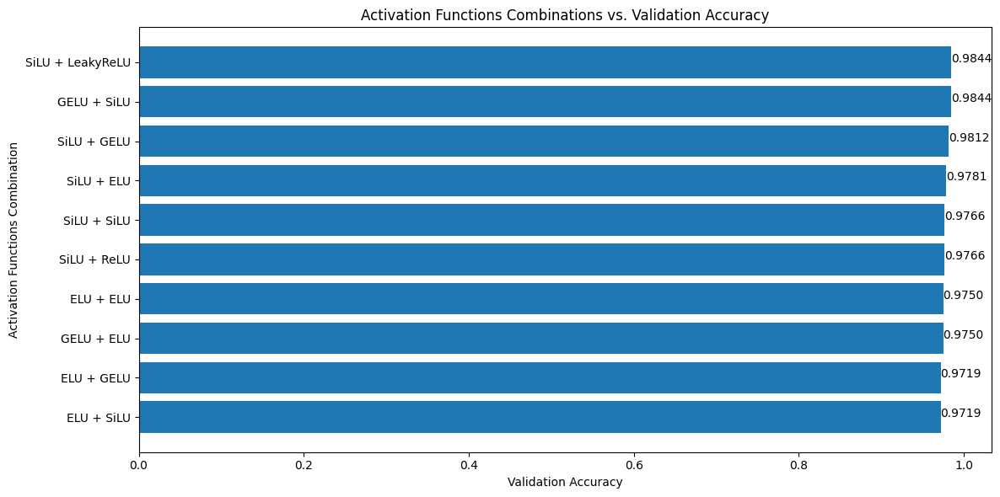

In [ ]:
# plot the results of activation functions experiment
plot_activation_function_results(activation_df)

In [ ]:
# print best performing activation functions combo
ML_best_activation_functions_names = activation_df.iloc[0]['Activation Function 1'], activation_df.iloc[0]['Activation Function 2']
print(f"Best activation functions: {ML_best_activation_functions_names}")

# convert string names to actual nn modules using getattr
ML_best_activation_functions = [getattr(nn, name)() for name in ML_best_activation_functions_names]

Best activation functions: ('SiLU', 'LeakyReLU')


Let's gather all the best hyperparameters into a configuration dictionary and use it train and evaluate a new model for MR / L dataset.


In [ ]:
# best configuration in a dictionary
ML_best_config = {
    'model': 'CNN_v2',
    'loss_fn': nn.CrossEntropyLoss(),
    'best_decay_value': ML_best_decay_value,
    'best_dropout_probs_combo': ML_best_dropout_probs,
    'best_hidden_units_combo': ML_best_hidden_units,
    'best_optimizer': ML_best_optimizer,
    'best_learning_rate': ML_best_learning_rate,
    'best_activation_functions': ML_best_activation_functions,
    'best_batch_size': batch_size,
    'epochs': num_epochs
}

In [ ]:
# put it all together

# create a model
ML_model_1 = CNN_v2(out_features=num_classes, hidden_units=ML_best_hidden_units, dropout_probs=ML_best_dropout_probs, activation_functions=ML_best_activation_functions).to(device)

# set loss function and optimizer
loss_fn = nn.CrossEntropyLoss()
optimizer = ML_best_optimizer(params=ML_model_1.parameters(), lr=ML_best_learning_rate, weight_decay=ML_best_decay_value)

# start training
print("Starting training...")
start_time = time.time()
ML_model_1_results = train(model=ML_model_1,
                           train_dataloader=train_dataloader_ML,
                           test_dataloader=val_dataloader_ML,
                           optimizer=optimizer,
                           loss_fn=loss_fn,
                           epochs=num_epochs,
                           device=device)
end_time = time.time()

# calculate and print total training time
ML_model_1_training_time = end_time - start_time
print(f"\nTotal training time: {ML_model_1_training_time:.3f} seconds")

# calculate and print total trainabale params
ML_model_1_total_params = sum(p.numel() for p in ML_model_1.parameters() if p.requires_grad)
print(f"Total trainable params: {ML_model_1_total_params}")

Starting training...


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.6863 | train_acc: 0.4174 | val_loss: 1.0545 | val_acc: 0.6031
Epoch: 2 | train_loss: 1.0360 | train_acc: 0.6300 | val_loss: 0.6402 | val_acc: 0.7604
Epoch: 3 | train_loss: 0.8492 | train_acc: 0.7108 | val_loss: 0.4959 | val_acc: 0.8484
Epoch: 4 | train_loss: 0.7235 | train_acc: 0.7422 | val_loss: 0.4451 | val_acc: 0.8609
Epoch: 5 | train_loss: 0.6678 | train_acc: 0.7671 | val_loss: 0.4307 | val_acc: 0.8391
Epoch: 6 | train_loss: 0.6018 | train_acc: 0.7966 | val_loss: 0.3412 | val_acc: 0.8828
Epoch: 7 | train_loss: 0.5820 | train_acc: 0.8204 | val_loss: 0.3341 | val_acc: 0.8859
Epoch: 8 | train_loss: 0.5510 | train_acc: 0.8071 | val_loss: 0.3037 | val_acc: 0.9000
Epoch: 9 | train_loss: 0.5175 | train_acc: 0.8233 | val_loss: 0.2719 | val_acc: 0.9078
Epoch: 10 | train_loss: 0.4857 | train_acc: 0.8329 | val_loss: 0.2596 | val_acc: 0.8969
Epoch: 11 | train_loss: 0.4695 | train_acc: 0.8383 | val_loss: 0.2373 | val_acc: 0.9187
Epoch: 12 | train_loss: 0.4418 | train_ac

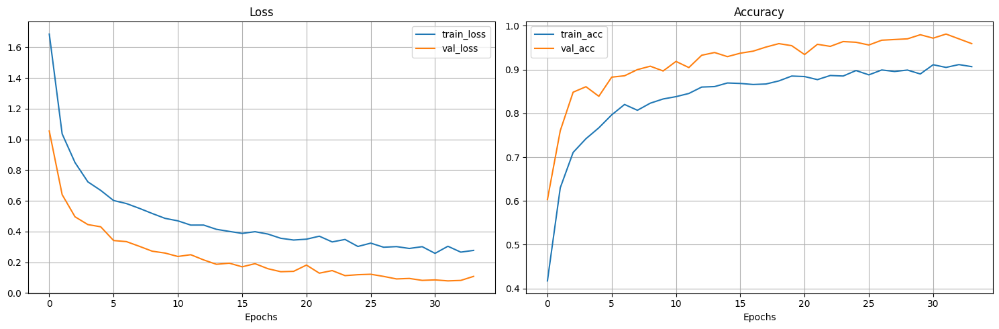

In [ ]:
# plot loss curves
plot_loss_curves(ML_model_1_results)

We observe no signs of overfitting, with high validation accuracies, consistent with the performance seen in the previous combined dataset.


In [ ]:
# print final model's val accuracy
ML_model_1_acc = ML_model_1_results['val_acc'][-1]
print(f"Final model accuracy: {ML_model_1_acc}")

# save the ML final model 1 with best configuration found
torch.save(ML_model_1.state_dict(), os.path.join(project_models_path, 'ML_model_1.pth'))
print("Model saved to 'ML_model_1.pth'")

Final model accuracy: 0.959375
Model saved to 'ML_model_1.pth'


Let's use again precision, recall and the confusion matrix to evaluate our findings.

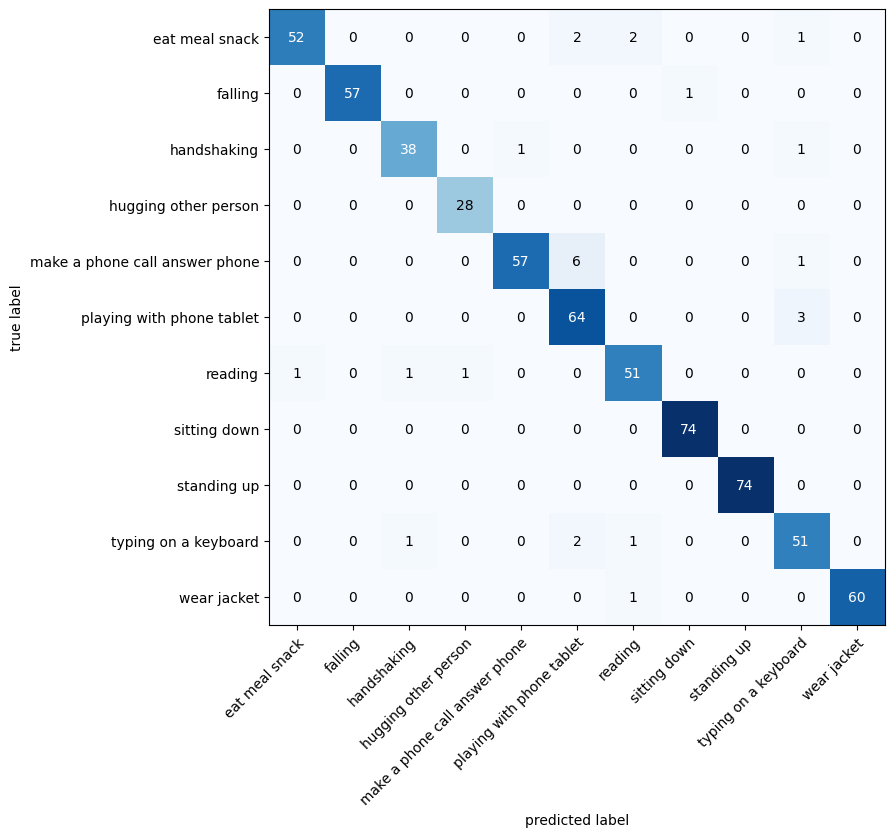

In [ ]:
# evaluation with torchmetrics

# retrieve actual and predicted labels and convert them to tensors for later process
ML_model_1_y_true = torch.tensor(ML_model_1_results['y_true'])
ML_model_1_y_pred = torch.tensor(ML_model_1_results['y_preds'])

# setup confusion matrix instance and compare predictions to targets
confmat = ConfusionMatrix(num_classes=len(class_names), task='multiclass')
confmat_tensor = confmat(ML_model_1_y_pred.clone().detach(), ML_model_1_y_true.clone().detach())

# plot the confusion matrix
fig, ax = plot_confusion_matrix(conf_mat=confmat_tensor.numpy(), class_names=class_names, figsize=(20,8));

In [ ]:
# calculate precision, recall and F1 scores using torchmetrics
precision = Precision(average='macro', num_classes=len(class_names), task='multiclass')
recall = Recall(average='macro', num_classes=len(class_names), task='multiclass')
f1 = F1Score(average='macro', num_classes=len(class_names), task='multiclass')

prec = precision(ML_model_1_y_pred, ML_model_1_y_true)
rec = recall(ML_model_1_y_pred, ML_model_1_y_true)
f1_score = f1(ML_model_1_y_pred, ML_model_1_y_true)

# print the results
print(f"Precision: {prec:.4f}\nRecall: {rec:.4f}\nF1-Score: {f1_score:.4f}")

Precision: 0.9594
Recall: 0.9587
F1-Score: 0.9585


In [ ]:
# classification report
print("Classification Report:")
print(classification_report(y_true=ML_model_1_y_true, y_pred=ML_model_1_y_pred, zero_division=1))

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.91      0.95        57
           1       1.00      0.98      0.99        58
           2       0.95      0.95      0.95        40
           3       0.97      1.00      0.98        28
           4       0.98      0.89      0.93        64
           5       0.86      0.96      0.91        67
           6       0.93      0.94      0.94        54
           7       0.99      1.00      0.99        74
           8       1.00      1.00      1.00        74
           9       0.89      0.93      0.91        55
          10       1.00      0.98      0.99        61

    accuracy                           0.96       632
   macro avg       0.96      0.96      0.96       632
weighted avg       0.96      0.96      0.96       632



Once again, precision, recall, and F1 are all very similar, each achieving high rates.


Experiment 6. Apply Cross-Validation.

The task here remains the same as before: we first merge the training and validation datasets, then apply cross-validation.

In [ ]:
# experiment 6: cross validation (1)

# combine train and validation sets

# define paths
source_dirs_ML = ['/content/project/data/ResActionsImagesML/train', '/content/project/data/ResActionsImagesML/validation']
destination_dir_ML = '/content/project/data/ResActionsImagesML/train_val_combined'

# create the destination directory if it doesn't exist
if not os.path.exists(destination_dir_ML):
  os.makedirs(destination_dir_ML)

# loop over all source dirs (train, validation) in ResActionsImagesML
for source_dir in source_dirs_ML:
  # loop over all class dirs
  for class_dir in os.listdir(source_dir):

    # existing class path, we will use it for copying
    class_path = os.path.join(source_dir, class_dir)

    # create class dir in destination dir if doesn't exist (this goes in case of multiple runs)
    dest_class_path = os.path.join(destination_dir_ML, class_dir)
    if not os.path.exists(dest_class_path):
      os.makedirs(dest_class_path)

    # copy all files (images) from the current class of the current source
    for file in os.listdir(class_path):
      shutil.copy(os.path.join(class_path, file), os.path.join(dest_class_path, file))

# check how many dirs in the new dir (expected num_classes=11)
print(f"Total number of folders of the new dir: {len(os.listdir(destination_dir_ML))}")

# find and print how many images in total the new 'train_val_combined' dir has (expected the sum of initial train and validation dirs: (1201 + 150) * 2 = 2702)
train_val_total_images_ML = 0
for class_dir in os.listdir(destination_dir_ML):
  class_path = os.path.join(destination_dir_ML, class_dir)
  train_val_total_images_ML += len(os.listdir(class_path))
print(f"Total number of images of the new dir: {train_val_total_images_ML}")

Total number of folders of the new dir: 11
Total number of images of the new dir: 3003


In [ ]:
# experiment 6: cross validation (2)

# create the new dataset using ImageFolder
ML_cross_val_dataset = ImageFolder(root=destination_dir_ML, transform=data_transform_ML)

# retrieve best pre-trained weights from model_1
ML_model_1_weights = ML_model_1.state_dict()

# run the experiment
ML_cv_results = cross_validation(dataset=ML_cross_val_dataset,
                                 num_epochs=num_epochs,
                                 device=device,
                                 num_classes=num_classes,
                                 num_folds=num_folds,
                                 best_config=ML_best_config,
                                 num_workers=num_workers,
                                 load_weights=True,
                                 best_weights=ML_model_1_weights)

Cross-Validation training ...
Dataset size: 3003
Number of folds: 6
Fold size: 500

Fold 1/6
Loading best weights ...


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.5252 | train_acc: 0.8426 | val_loss: 0.1863 | val_acc: 0.9231
Epoch: 2 | train_loss: 0.3747 | train_acc: 0.8869 | val_loss: 0.1281 | val_acc: 0.9563
Epoch: 3 | train_loss: 0.2925 | train_acc: 0.9023 | val_loss: 0.1236 | val_acc: 0.9648
Epoch: 4 | train_loss: 0.2904 | train_acc: 0.9051 | val_loss: 0.1459 | val_acc: 0.9465
Epoch: 5 | train_loss: 0.2905 | train_acc: 0.9051 | val_loss: 0.1478 | val_acc: 0.9516
Epoch: 6 | train_loss: 0.2531 | train_acc: 0.9142 | val_loss: 0.1338 | val_acc: 0.9648
Epoch: 7 | train_loss: 0.2586 | train_acc: 0.9110 | val_loss: 0.1256 | val_acc: 0.9648
Epoch: 8 | train_loss: 0.2382 | train_acc: 0.9260 | val_loss: 0.1470 | val_acc: 0.9531
Epoch: 9 | train_loss: 0.2396 | train_acc: 0.9169 | val_loss: 0.1427 | val_acc: 0.9473
Epoch: 10 | train_loss: 0.2820 | train_acc: 0.9106 | val_loss: 0.1271 | val_acc: 0.9590
Epoch: 11 | train_loss: 0.2273 | train_acc: 0.9229 | val_loss: 0.1380 | val_acc: 0.9551
Epoch: 12 | train_loss: 0.2401 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.4918 | train_acc: 0.8568 | val_loss: 0.1006 | val_acc: 0.9582
Epoch: 2 | train_loss: 0.3361 | train_acc: 0.8920 | val_loss: 0.0800 | val_acc: 0.9766
Epoch: 3 | train_loss: 0.3476 | train_acc: 0.8825 | val_loss: 0.0902 | val_acc: 0.9699
Epoch: 4 | train_loss: 0.2792 | train_acc: 0.9007 | val_loss: 0.0867 | val_acc: 0.9660
Epoch: 5 | train_loss: 0.3125 | train_acc: 0.8983 | val_loss: 0.0944 | val_acc: 0.9738
Epoch: 6 | train_loss: 0.2908 | train_acc: 0.9066 | val_loss: 0.1015 | val_acc: 0.9719
Epoch: 7 | train_loss: 0.2551 | train_acc: 0.9146 | val_loss: 0.1013 | val_acc: 0.9594
Epoch: 8 | train_loss: 0.2721 | train_acc: 0.9098 | val_loss: 0.0974 | val_acc: 0.9653
Epoch: 9 | train_loss: 0.2749 | train_acc: 0.9153 | val_loss: 0.1136 | val_acc: 0.9602
Epoch: 10 | train_loss: 0.2755 | train_acc: 0.9078 | val_loss: 0.1080 | val_acc: 0.9621
Epoch: 11 | train_loss: 0.2532 | train_acc: 0.9130 | val_loss: 0.0921 | val_acc: 0.9602
Epoch: 12 | train_loss: 0.2532 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.5337 | train_acc: 0.8449 | val_loss: 0.1475 | val_acc: 0.9570
Epoch: 2 | train_loss: 0.3626 | train_acc: 0.8801 | val_loss: 0.1398 | val_acc: 0.9512
Epoch: 3 | train_loss: 0.3076 | train_acc: 0.9015 | val_loss: 0.1217 | val_acc: 0.9590
Epoch: 4 | train_loss: 0.3151 | train_acc: 0.8991 | val_loss: 0.0977 | val_acc: 0.9668
Epoch: 5 | train_loss: 0.2835 | train_acc: 0.9007 | val_loss: 0.0971 | val_acc: 0.9648
Epoch: 6 | train_loss: 0.2906 | train_acc: 0.9142 | val_loss: 0.1256 | val_acc: 0.9531
Epoch: 7 | train_loss: 0.2635 | train_acc: 0.9157 | val_loss: 0.1215 | val_acc: 0.9648
Epoch: 8 | train_loss: 0.2661 | train_acc: 0.9110 | val_loss: 0.1167 | val_acc: 0.9629
Epoch: 9 | train_loss: 0.2367 | train_acc: 0.9248 | val_loss: 0.1424 | val_acc: 0.9590
Epoch: 10 | train_loss: 0.2829 | train_acc: 0.9153 | val_loss: 0.1215 | val_acc: 0.9570
Epoch: 11 | train_loss: 0.2440 | train_acc: 0.9177 | val_loss: 0.1237 | val_acc: 0.9590
Epoch: 12 | train_loss: 0.2645 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.5466 | train_acc: 0.8339 | val_loss: 0.1120 | val_acc: 0.9668
Epoch: 2 | train_loss: 0.3513 | train_acc: 0.8869 | val_loss: 0.1882 | val_acc: 0.9360
Epoch: 3 | train_loss: 0.3357 | train_acc: 0.8896 | val_loss: 0.1044 | val_acc: 0.9680
Epoch: 4 | train_loss: 0.2769 | train_acc: 0.9086 | val_loss: 0.0976 | val_acc: 0.9692
Epoch: 5 | train_loss: 0.3060 | train_acc: 0.8987 | val_loss: 0.1365 | val_acc: 0.9524
Epoch: 6 | train_loss: 0.2484 | train_acc: 0.9142 | val_loss: 0.1169 | val_acc: 0.9653
Epoch: 7 | train_loss: 0.2979 | train_acc: 0.8987 | val_loss: 0.1109 | val_acc: 0.9629
Epoch: 8 | train_loss: 0.2540 | train_acc: 0.9134 | val_loss: 0.1148 | val_acc: 0.9602
Epoch: 9 | train_loss: 0.2708 | train_acc: 0.9114 | val_loss: 0.1204 | val_acc: 0.9660
Epoch: 10 | train_loss: 0.2165 | train_acc: 0.9252 | val_loss: 0.1100 | val_acc: 0.9680
Epoch: 11 | train_loss: 0.2442 | train_acc: 0.9248 | val_loss: 0.1120 | val_acc: 0.9614
Epoch: 12 | train_loss: 0.2594 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.5482 | train_acc: 0.8406 | val_loss: 0.1498 | val_acc: 0.9524
Epoch: 2 | train_loss: 0.3366 | train_acc: 0.8896 | val_loss: 0.1069 | val_acc: 0.9641
Epoch: 3 | train_loss: 0.3298 | train_acc: 0.8888 | val_loss: 0.1228 | val_acc: 0.9575
Epoch: 4 | train_loss: 0.2799 | train_acc: 0.9110 | val_loss: 0.1084 | val_acc: 0.9660
Epoch: 5 | train_loss: 0.2735 | train_acc: 0.9039 | val_loss: 0.1310 | val_acc: 0.9528
Epoch: 6 | train_loss: 0.2828 | train_acc: 0.9086 | val_loss: 0.1765 | val_acc: 0.9411
Epoch: 7 | train_loss: 0.2606 | train_acc: 0.9098 | val_loss: 0.1214 | val_acc: 0.9575
Epoch: 8 | train_loss: 0.2450 | train_acc: 0.9189 | val_loss: 0.1476 | val_acc: 0.9547
Epoch: 9 | train_loss: 0.2737 | train_acc: 0.9019 | val_loss: 0.1513 | val_acc: 0.9528
Epoch: 10 | train_loss: 0.2642 | train_acc: 0.9153 | val_loss: 0.1917 | val_acc: 0.9313
Epoch: 11 | train_loss: 0.2418 | train_acc: 0.9126 | val_loss: 0.2140 | val_acc: 0.9352
Epoch: 12 | train_loss: 0.2540 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.5583 | train_acc: 0.8418 | val_loss: 0.2951 | val_acc: 0.8891
Epoch: 2 | train_loss: 0.3767 | train_acc: 0.8770 | val_loss: 0.0945 | val_acc: 0.9688
Epoch: 3 | train_loss: 0.3348 | train_acc: 0.8991 | val_loss: 0.0707 | val_acc: 0.9766
Epoch: 4 | train_loss: 0.3234 | train_acc: 0.8956 | val_loss: 0.1503 | val_acc: 0.9512
Epoch: 5 | train_loss: 0.3329 | train_acc: 0.8892 | val_loss: 0.0869 | val_acc: 0.9648
Epoch: 6 | train_loss: 0.3057 | train_acc: 0.8979 | val_loss: 0.1037 | val_acc: 0.9570
Epoch: 7 | train_loss: 0.2893 | train_acc: 0.9011 | val_loss: 0.1365 | val_acc: 0.9465
Epoch: 8 | train_loss: 0.2956 | train_acc: 0.9031 | val_loss: 0.0764 | val_acc: 0.9727
Epoch: 9 | train_loss: 0.2754 | train_acc: 0.9094 | val_loss: 0.0958 | val_acc: 0.9727
Epoch: 10 | train_loss: 0.2506 | train_acc: 0.9114 | val_loss: 0.0731 | val_acc: 0.9727
Epoch: 11 | train_loss: 0.2643 | train_acc: 0.9130 | val_loss: 0.0879 | val_acc: 0.9688
Epoch: 12 | train_loss: 0.2691 | train_ac

In [ ]:
# retrieve all val accuracies in desc order from results dictionary along with their corresponding model's weights
ML_results_df = get_sorted_cv_results(ML_cv_results)

   Fold  Validation Accuracy  \
5     6             0.966797   
0     1             0.960173   
1     2             0.955503   
3     4             0.955503   
2     3             0.944548   
4     5             0.943020   

                                       Model Weights  
5  {'block1.0.weight': [[tensor([[ 0.1027,  0.046...  
0  {'block1.0.weight': [[tensor([[ 0.0941,  0.047...  
1  {'block1.0.weight': [[tensor([[ 0.0753,  0.050...  
3  {'block1.0.weight': [[tensor([[ 0.1069,  0.028...  
2  {'block1.0.weight': [[tensor([[ 0.0919,  0.057...  
4  {'block1.0.weight': [[tensor([[ 0.1341,  0.051...  


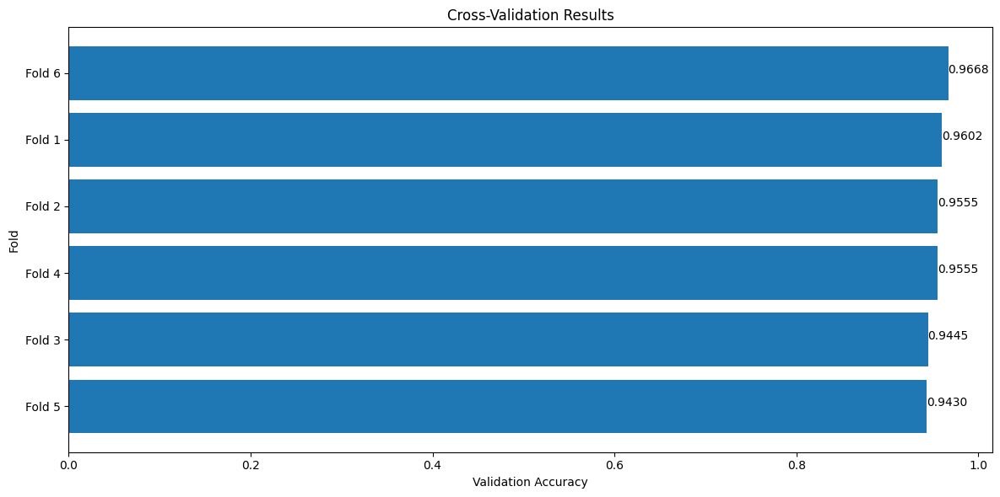

In [ ]:
# plot each fold results after cross-validation experiment
plot_cv_results(ML_results_df)

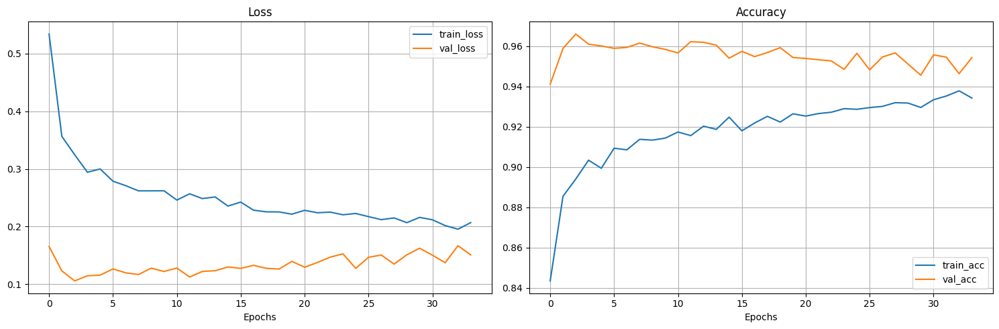

In [ ]:
# comptute and plot average cv results
ML_cv_avg_results = compute_avg_cv_results(ML_cv_results)

# plot the averaged learning curves
plot_loss_curves(ML_cv_avg_results)

All indicators confirm high performance with no signs of overfitting.


In [ ]:
# retrieve best performing fold's weights
best_ML_cv_model_weights = ML_results_df.iloc[0]['Model Weights']

# retrieve best performing fold number
ML_best_fold = ML_results_df.iloc[0]['Fold']

# retrieve the corresponding results from cross validation experiment for the best case
ML_best_fold_index = max(ML_best_fold - 1, 0)
ML_model_2_results = ML_cv_results[ML_best_fold_index]

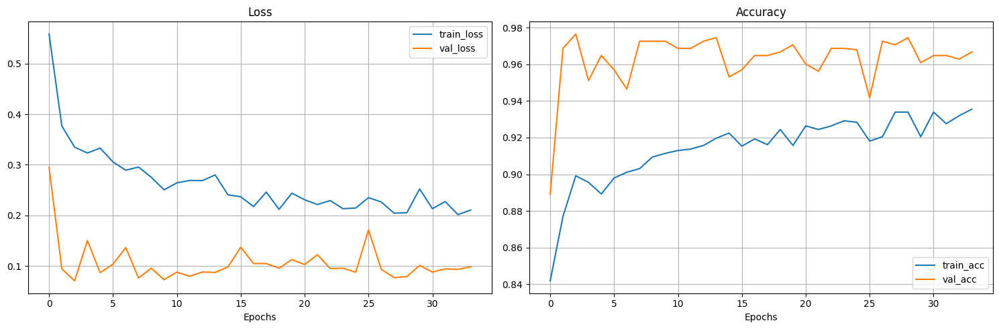

In [ ]:
# plot the curves of the model with best config
plot_loss_curves(ML_model_2_results)

In [ ]:
# before loading best weights, need to create a new instance
ML_model_2 = CNN_v2(out_features=num_classes, hidden_units=ML_best_hidden_units, dropout_probs=ML_best_dropout_probs, activation_functions=ML_best_activation_functions).to(device)

# load best weights
ML_model_2.load_state_dict(best_ML_cv_model_weights)

# print final model's val accuracy
ML_model_2_acc = ML_model_2_results['val_acc'][-1]
print(f"Final model accuracy: {ML_model_2_acc}")

# save the model
torch.save(ML_model_2.state_dict(), os.path.join(project_models_path, 'ML_model_2.pth'))
print("Model saved to 'ML_model_2.pth'")

Final model accuracy: 0.966796875
Model saved to 'ML_model_2.pth'


Experiment 7. Balance the dataset.

In [ ]:
# experiment 7: balanced dataset (with early stopping enabled)

# create a new instance of the model for balanced dataset
ML_model_3 = CNN_v2(out_features=num_classes, hidden_units=ML_best_hidden_units, dropout_probs=ML_best_dropout_probs, activation_functions=ML_best_activation_functions).to(device)

# load model_1 weights
ML_model_3.load_state_dict(ML_model_1.state_dict()) # (model_1)

# load best performing model (weights) so far
#ML_model_3.load_state_dict(best_ML_cv_model_weights) # (model_2)

# start training on balanced dataset
ML_model_3_results = experiment_balanced_dataset(model=ML_model_3,
                                                 train_dataloader=train_dataloader_ML,
                                                 val_dataloader=val_dataloader_ML,
                                                 num_epochs=num_epochs,
                                                 device=device,
                                                 best_config=ML_best_config,
                                                 class_weights=class_weights_ML)

Experimenting with Balanced Dataset


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.5693 | train_acc: 0.8476 | val_loss: 0.0946 | val_acc: 0.9635
Epoch: 2 | train_loss: 0.3959 | train_acc: 0.8825 | val_loss: 0.0964 | val_acc: 0.9719
Epoch: 3 | train_loss: 0.3510 | train_acc: 0.8844 | val_loss: 0.0780 | val_acc: 0.9656
Epoch: 4 | train_loss: 0.2855 | train_acc: 0.9118 | val_loss: 0.0915 | val_acc: 0.9672
Epoch: 5 | train_loss: 0.3093 | train_acc: 0.9040 | val_loss: 0.0751 | val_acc: 0.9719
Epoch: 6 | train_loss: 0.3141 | train_acc: 0.9011 | val_loss: 0.0617 | val_acc: 0.9797
Epoch: 7 | train_loss: 0.2795 | train_acc: 0.9125 | val_loss: 0.0606 | val_acc: 0.9781
Epoch: 8 | train_loss: 0.2734 | train_acc: 0.9099 | val_loss: 0.0676 | val_acc: 0.9797
Epoch: 9 | train_loss: 0.2796 | train_acc: 0.9048 | val_loss: 0.0632 | val_acc: 0.9750
Epoch: 10 | train_loss: 0.2782 | train_acc: 0.9136 | val_loss: 0.0577 | val_acc: 0.9844
Epoch: 11 | train_loss: 0.2437 | train_acc: 0.9196 | val_loss: 0.0520 | val_acc: 0.9812
Early stopping triggered at epoch 11.
Mod

In [ ]:
# print best epoch and its corresponding val accuracy
ML_best_epoch_bal, ML_best_val_acc_bal = print_best_epoch_and_val_acc(ML_model_3_results)

Best epoch: 6
Best validation accuracy: 0.9797


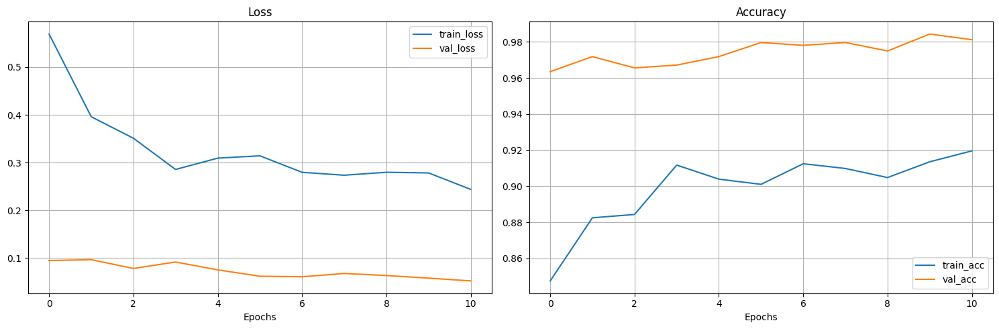

In [ ]:
# plot the results curves after balancing the dataset
plot_loss_curves(ML_model_3_results)

As expected, balancing the dataset, just like in all previous experiments, results in improved model performance.


In [ ]:
# print final model's val accuracy
ML_model_3_acc = ML_best_val_acc_bal
print(f"Final model accuracy: {ML_model_3_acc}")

# save the model
torch.save(ML_model_3.state_dict(), os.path.join(project_models_path, 'ML_model_3.pth'))
print("Model saved to 'ML_model_3.pth'")

Final model accuracy: 0.9796875
Model saved to 'ML_model_3.pth'


Experiment 8. Apply data augmentation.


We apply Trivial data augmentation using model_3 weights as starting point.

In [ ]:
# experiment 8: data augmentation (with early stopping enabled)

# create a new instance of the model for data augmentation
ML_model_4 = CNN_v2(out_features=num_classes, hidden_units=ML_best_hidden_units, dropout_probs=ML_best_dropout_probs, activation_functions=ML_best_activation_functions).to(device)

# load weights of the model_1
#ML_model_4.load_state_dict(ML_model_1.state_dict()) # (model_1)

# load weights of the model produced after cross-validation
#ML_model_4.load_state_dict(best_ML_cv_model_weights) # (model_2)

# load best performing model (weights) so far
ML_model_4.load_state_dict(ML_model_3.state_dict()) # (model 3)

# start training with data augmentation
ML_model_4_results = experiment_data_augmentation(model=ML_model_4,
                                                  train_dir=ML_dataset_path/'train',
                                                  val_dataloader=val_dataloader_ML,
                                                  num_epochs=num_epochs,
                                                  device=device,
                                                  best_config=ML_best_config,
                                                  class_weights=class_weights_ML,
                                                  num_workers=num_workers,
                                                  mean=mean_ML,
                                                  std=std_ML,
                                                  is_Trivial=True)

Experimenting with Data Augmentation


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.6676 | train_acc: 0.4215 | val_loss: 0.2097 | val_acc: 0.9604
Epoch: 2 | train_loss: 1.6614 | train_acc: 0.4650 | val_loss: 0.1897 | val_acc: 0.9547
Epoch: 3 | train_loss: 1.6118 | train_acc: 0.4632 | val_loss: 0.1589 | val_acc: 0.9531
Epoch: 4 | train_loss: 1.5565 | train_acc: 0.4643 | val_loss: 0.1500 | val_acc: 0.9641
Epoch: 5 | train_loss: 1.5057 | train_acc: 0.4967 | val_loss: 0.1584 | val_acc: 0.9604
Epoch: 6 | train_loss: 1.5176 | train_acc: 0.4933 | val_loss: 0.1894 | val_acc: 0.9469
Epoch: 7 | train_loss: 1.4997 | train_acc: 0.5047 | val_loss: 0.1449 | val_acc: 0.9542
Epoch: 8 | train_loss: 1.4806 | train_acc: 0.4993 | val_loss: 0.1855 | val_acc: 0.9563
Epoch: 9 | train_loss: 1.4330 | train_acc: 0.5191 | val_loss: 0.1597 | val_acc: 0.9448
Early stopping triggered at epoch 9.
Model restored from epoch 4.

Total training time: 25.812 seconds
Total trainable params: 225867


In [ ]:
# print best epoch and its corresponding val accuracy
ML_best_epoch_aug, ML_best_val_acc_aug = print_best_epoch_and_val_acc(ML_model_4_results)

Best epoch: 4
Best validation accuracy: 0.9641


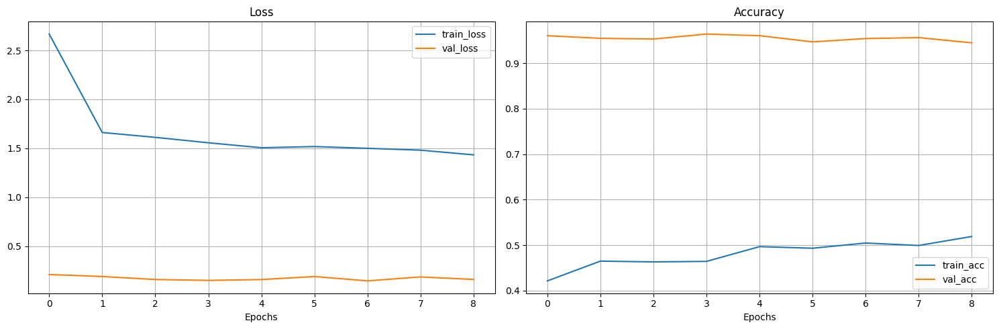

In [ ]:
# plot the results curves after data augmentation experiment
plot_loss_curves(ML_model_4_results)

The performance does not surpass the one of the previous experiment, but it still shows high accuracy with a greater gap between the training and validation curves.


In [ ]:
# print final model's val accuracy
ML_model_4_acc = ML_best_val_acc_aug
print(f"Final model accuracy: {ML_model_4_acc}")

# save the model
torch.save(ML_model_4.state_dict(), os.path.join(project_models_path, 'ML_model_4.pth'))
print("Model saved to 'ML_model_4.pth'")

Final model accuracy: 0.9640625
Model saved to 'ML_model_4.pth'


Having completed all the experimentation workflow for this dataset, let's now compare the models and select the best-performing one as the final result.


Model ML_model_1: 0.95937500
Model ML_model_2: 0.96679688
Model ML_model_3: 0.97968750
Model ML_model_4: 0.96406250


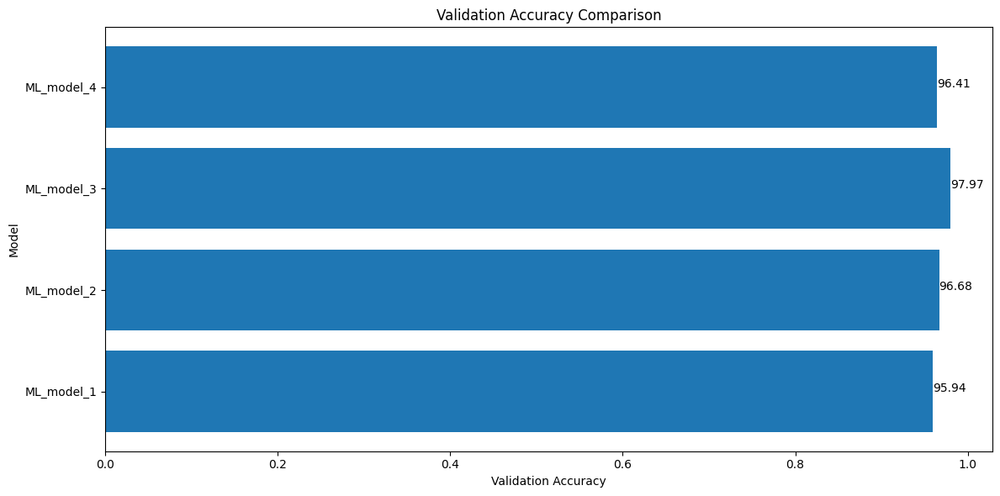

In [ ]:
# create a dataframe for comparison
compare_accs_ML = pd.DataFrame({'Model': ['ML_model_1', 'ML_model_2', 'ML_model_3', 'ML_model_4'], 'Validation Accuracy': [ML_model_1_acc, ML_model_2_acc, ML_model_3_acc, ML_model_4_acc]})

# print and plot test accuracies for all models of ML / R dataset
print_and_plot_models_accuracies(compare_accs_ML)

In [ ]:
# save the best performing model for ML / R
best_models_dict = store_best_model(compare_accs_ML, 'ML / R', best_models_dict)

# print the dictionary
print("Best models dictionary:")
print(best_models_dict)
print()

# retrieve best performing model for ML / R
ML_best_model = f"{best_models_dict['ML / R']['Model']}.pth"
#print(ML_best_model)

# initiate a model instance
ML_final_model = CNN_v2(out_features=num_classes, hidden_units=ML_best_hidden_units, dropout_probs=ML_best_dropout_probs, activation_functions=ML_best_activation_functions).to(device)

# load best weights
ML_final_model.load_state_dict(torch.load(os.path.join(project_models_path, ML_best_model))) # , weights_only=True

# put it on device
ML_final_model = ML_final_model.to(device)

# and evaluate on test set/dataloader
ML_test_results = eval_model(model=ML_final_model,
                             dataloader=test_dataloader_R_full,
                             loss_fn=nn.CrossEntropyLoss(), # weight=class_weights_ML
                             device=device)
print(f"Test accuracy for {ML_best_model}: {ML_test_results['test_acc']:.4f}")

# save the test results to the dictionary
final_test_accuracies_dict['ML / R'] = ML_test_results['test_acc']

Best models dictionary:
{'M / M': {'Model': 'MM_model_4', 'Validation Accuracy': 0.9039772727272727}, 'R / R': {'Model': 'RR_model_3', 'Validation Accuracy': 0.8852272727272726}, 'L / L': {'Model': 'LL_model_4', 'Validation Accuracy': 0.8818181818181818}, 'MR / L': {'Model': 'MR_model_3', 'Validation Accuracy': 0.9748383620689655}, 'ML / R': {'Model': 'ML_model_3', 'Validation Accuracy': 0.9796875}}



  0%|          | 0/47 [00:00<?, ?it/s]

Test accuracy for ML_model_3.pth: 0.9136


### Experiments on R, L / M.

We start by creating dataloaders for RL / M dataset.

In [ ]:
# create dataloaders
train_dataloader_RL, val_dataloader_RL, test_dataloader_M_full = create_combined_dataloaders(RL_dataset_path/'train', RL_dataset_path/'validation', test_M_dataset_path/'test', data_transform_RL, data_transform_M, batch_size, num_workers)
print("Dataloaders created successfully!")

Dataloaders created successfully!


We train and evaluate the RL / M baseline model.

In [ ]:
# train the RL baseline model

# create the model
RL_model_0 = CNN(in_features=num_channels, out_features=num_classes, hidden_units=init_hidden_units).to(device)

# setup loss function and optimizer
loss_fn = nn.CrossEntropyLoss()
optimizer = torch.optim.RMSprop(params=RL_model_0.parameters(), lr=0.001)

# start training
print("Starting training...")
start_time = time.time()
RL_model_0_results = train(model=RL_model_0,
                           train_dataloader=train_dataloader_RL,
                           test_dataloader=val_dataloader_RL,
                           optimizer=optimizer,
                           loss_fn=loss_fn,
                           epochs=num_epochs,
                           device=device)
end_time = time.time()

# calculate and print total training time
RL_total_training_time = end_time - start_time
print(f"\nTotal training time: {RL_total_training_time:.3f} seconds")

# calculate and print total trainabla params
RL_total_params = sum(p.numel() for p in RL_model_0.parameters())
print(f"Total number of trainable parameters: {RL_total_params}")

Starting training...


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.6338 | train_acc: 0.4432 | val_loss: 1.2015 | val_acc: 0.5735
Epoch: 2 | train_loss: 0.8439 | train_acc: 0.7099 | val_loss: 0.7111 | val_acc: 0.7220
Epoch: 3 | train_loss: 0.5743 | train_acc: 0.8073 | val_loss: 0.3883 | val_acc: 0.8701
Epoch: 4 | train_loss: 0.4066 | train_acc: 0.8719 | val_loss: 0.3252 | val_acc: 0.8865
Epoch: 5 | train_loss: 0.3371 | train_acc: 0.8849 | val_loss: 0.2088 | val_acc: 0.9293
Epoch: 6 | train_loss: 0.2522 | train_acc: 0.9183 | val_loss: 0.1585 | val_acc: 0.9424
Epoch: 7 | train_loss: 0.1974 | train_acc: 0.9291 | val_loss: 0.1585 | val_acc: 0.9359
Epoch: 8 | train_loss: 0.1645 | train_acc: 0.9443 | val_loss: 0.1473 | val_acc: 0.9457
Epoch: 9 | train_loss: 0.1301 | train_acc: 0.9560 | val_loss: 0.0803 | val_acc: 0.9737
Epoch: 10 | train_loss: 0.0981 | train_acc: 0.9686 | val_loss: 0.0628 | val_acc: 0.9836
Epoch: 11 | train_loss: 0.1186 | train_acc: 0.9667 | val_loss: 0.1171 | val_acc: 0.9619
Epoch: 12 | train_loss: 0.0677 | train_ac

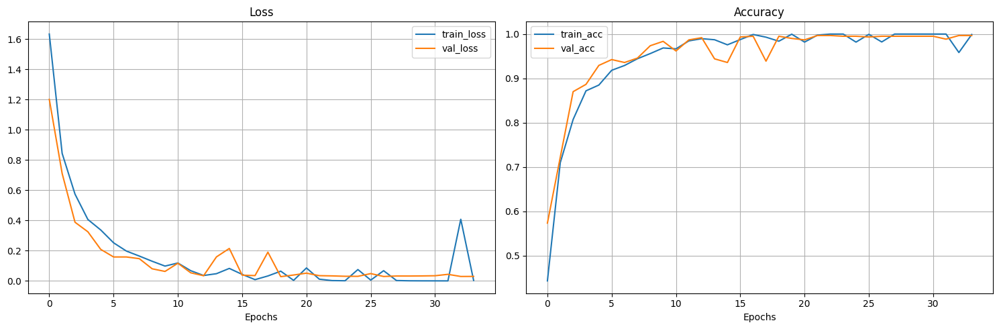

In [ ]:
# plot learning curves
plot_loss_curves(RL_model_0_results)

In [ ]:
# compute generalization gap
dif=compute_generalization_gap(RL_model_0_results)

Generalization gap (train acc - val acc): 0.0023


The baseline model's curves do indicate some overfitting, although the gap between train and validation lines is much smaller and similar to what we observed in the two previous combined dataset cases. Let's move on to experiments aimed at gradually eliminating this overfitting and further improving performance.

In [ ]:
# save the model
torch.save(RL_model_0.state_dict(), os.path.join(project_models_path, 'RL_model_0.pth'))
print("Model saved to 'RL_model_0.pth'")

Model saved to 'RL_model_0.pth'


Experiment 1. Apply L2 regularization.

In [ ]:
# experiment 1: L2 reg
RL_model_L2_results = experiment_l2_regularization(train_dataloader=train_dataloader_RL,
                                                   val_dataloader=val_dataloader_RL,
                                                   num_epochs=num_epochs,
                                                   device=device,
                                                   weight_decay_values_list=weight_decay_values_list,
                                                   num_channels=num_channels,
                                                   num_classes=num_classes,
                                                   init_hidden_units=init_hidden_units)

Experimenting with L2 Regularization
Weight decay values to try: [0.01, 0.001, 0.0001, 1e-05, 1e-06]

Testing with weight decay: 0.01


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.8051 | train_acc: 0.3813 | val_loss: 1.3889 | val_acc: 0.5155
Epoch: 2 | train_loss: 1.2120 | train_acc: 0.5862 | val_loss: 1.0011 | val_acc: 0.6595
Epoch: 3 | train_loss: 0.8494 | train_acc: 0.7052 | val_loss: 0.6977 | val_acc: 0.7615
Epoch: 4 | train_loss: 0.6486 | train_acc: 0.7824 | val_loss: 0.5067 | val_acc: 0.8191
Epoch: 5 | train_loss: 0.5231 | train_acc: 0.8176 | val_loss: 0.4532 | val_acc: 0.8273
Epoch: 6 | train_loss: 0.4547 | train_acc: 0.8396 | val_loss: 0.3913 | val_acc: 0.8586
Epoch: 7 | train_loss: 0.4119 | train_acc: 0.8645 | val_loss: 0.3784 | val_acc: 0.8717
Epoch: 8 | train_loss: 0.3840 | train_acc: 0.8680 | val_loss: 0.3774 | val_acc: 0.8635
Epoch: 9 | train_loss: 0.3602 | train_acc: 0.8816 | val_loss: 0.3273 | val_acc: 0.8865
Epoch: 10 | train_loss: 0.3383 | train_acc: 0.8863 | val_loss: 0.2356 | val_acc: 0.9194
Epoch: 11 | train_loss: 0.3060 | train_acc: 0.8942 | val_loss: 0.2818 | val_acc: 0.9145
Epoch: 12 | train_loss: 0.2925 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.6120 | train_acc: 0.4329 | val_loss: 1.1316 | val_acc: 0.6030
Epoch: 2 | train_loss: 0.8474 | train_acc: 0.7191 | val_loss: 0.7181 | val_acc: 0.7401
Epoch: 3 | train_loss: 0.5771 | train_acc: 0.7960 | val_loss: 0.3926 | val_acc: 0.8783
Epoch: 4 | train_loss: 0.4096 | train_acc: 0.8699 | val_loss: 0.3381 | val_acc: 0.8882
Epoch: 5 | train_loss: 0.3397 | train_acc: 0.8871 | val_loss: 0.3123 | val_acc: 0.8810
Epoch: 6 | train_loss: 0.2790 | train_acc: 0.9068 | val_loss: 0.1982 | val_acc: 0.9276
Epoch: 7 | train_loss: 0.2573 | train_acc: 0.9179 | val_loss: 0.1869 | val_acc: 0.9375
Epoch: 8 | train_loss: 0.2066 | train_acc: 0.9326 | val_loss: 0.1496 | val_acc: 0.9556
Epoch: 9 | train_loss: 0.1692 | train_acc: 0.9447 | val_loss: 0.1274 | val_acc: 0.9523
Epoch: 10 | train_loss: 0.1584 | train_acc: 0.9511 | val_loss: 0.0846 | val_acc: 0.9753
Epoch: 11 | train_loss: 0.1188 | train_acc: 0.9610 | val_loss: 0.0881 | val_acc: 0.9770
Epoch: 12 | train_loss: 0.0922 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.7105 | train_acc: 0.4140 | val_loss: 1.0192 | val_acc: 0.6642
Epoch: 2 | train_loss: 0.8177 | train_acc: 0.7222 | val_loss: 0.5467 | val_acc: 0.8125
Epoch: 3 | train_loss: 0.5005 | train_acc: 0.8319 | val_loss: 0.3416 | val_acc: 0.8865
Epoch: 4 | train_loss: 0.3716 | train_acc: 0.8739 | val_loss: 0.2949 | val_acc: 0.8980
Epoch: 5 | train_loss: 0.2975 | train_acc: 0.8994 | val_loss: 0.2061 | val_acc: 0.9194
Epoch: 6 | train_loss: 0.2526 | train_acc: 0.9130 | val_loss: 0.5392 | val_acc: 0.8174
Epoch: 7 | train_loss: 0.1917 | train_acc: 0.9347 | val_loss: 0.1362 | val_acc: 0.9556
Epoch: 8 | train_loss: 0.1771 | train_acc: 0.9375 | val_loss: 0.2610 | val_acc: 0.9059
Epoch: 9 | train_loss: 0.1382 | train_acc: 0.9558 | val_loss: 0.0982 | val_acc: 0.9655
Epoch: 10 | train_loss: 0.0944 | train_acc: 0.9708 | val_loss: 0.0868 | val_acc: 0.9737
Epoch: 11 | train_loss: 0.2012 | train_acc: 0.9515 | val_loss: 0.1067 | val_acc: 0.9655
Epoch: 12 | train_loss: 0.0621 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.5479 | train_acc: 0.4628 | val_loss: 0.9491 | val_acc: 0.6392
Epoch: 2 | train_loss: 0.7702 | train_acc: 0.7328 | val_loss: 0.6649 | val_acc: 0.7365
Epoch: 3 | train_loss: 0.5839 | train_acc: 0.8065 | val_loss: 0.5140 | val_acc: 0.8306
Epoch: 4 | train_loss: 0.4833 | train_acc: 0.8288 | val_loss: 0.4231 | val_acc: 0.8553
Epoch: 5 | train_loss: 0.3985 | train_acc: 0.8625 | val_loss: 0.5909 | val_acc: 0.8010
Epoch: 6 | train_loss: 0.3363 | train_acc: 0.8900 | val_loss: 0.2822 | val_acc: 0.9062
Epoch: 7 | train_loss: 0.2685 | train_acc: 0.9049 | val_loss: 0.2139 | val_acc: 0.9178
Epoch: 8 | train_loss: 0.2251 | train_acc: 0.9212 | val_loss: 0.2198 | val_acc: 0.9240
Epoch: 9 | train_loss: 0.1910 | train_acc: 0.9287 | val_loss: 0.1238 | val_acc: 0.9619
Epoch: 10 | train_loss: 0.1274 | train_acc: 0.9572 | val_loss: 0.1630 | val_acc: 0.9520
Epoch: 11 | train_loss: 0.1286 | train_acc: 0.9543 | val_loss: 0.0607 | val_acc: 0.9803
Epoch: 12 | train_loss: 0.0670 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.5388 | train_acc: 0.4646 | val_loss: 0.8718 | val_acc: 0.6859
Epoch: 2 | train_loss: 0.7030 | train_acc: 0.7541 | val_loss: 0.4926 | val_acc: 0.8212
Epoch: 3 | train_loss: 0.4547 | train_acc: 0.8487 | val_loss: 0.3184 | val_acc: 0.8898
Epoch: 4 | train_loss: 0.3688 | train_acc: 0.8757 | val_loss: 0.2318 | val_acc: 0.9178
Epoch: 5 | train_loss: 0.2851 | train_acc: 0.9095 | val_loss: 0.2460 | val_acc: 0.9046
Epoch: 6 | train_loss: 0.2287 | train_acc: 0.9258 | val_loss: 0.2369 | val_acc: 0.9062
Epoch: 7 | train_loss: 0.1915 | train_acc: 0.9334 | val_loss: 0.1385 | val_acc: 0.9556
Epoch: 8 | train_loss: 0.1543 | train_acc: 0.9482 | val_loss: 0.1106 | val_acc: 0.9655
Epoch: 9 | train_loss: 0.1469 | train_acc: 0.9546 | val_loss: 0.0803 | val_acc: 0.9786
Epoch: 10 | train_loss: 0.0976 | train_acc: 0.9680 | val_loss: 0.0716 | val_acc: 0.9753
Epoch: 11 | train_loss: 0.0620 | train_acc: 0.9829 | val_loss: 0.0555 | val_acc: 0.9786
Epoch: 12 | train_loss: 0.1037 | train_ac

In [ ]:
# identify and print the best decay value based on the generalization gap
RL_best_decay_value, RL_min_diff_l2 = compute_multi_generalization_gaps(RL_model_L2_results)

Difference between train and val acc for 0.01: -0.0220
Difference between train and val acc for 0.001: -0.0153
Difference between train and val acc for 0.0001: 0.0099
Difference between train and val acc for 1e-05: 0.0049
Difference between train and val acc for 1e-06: 0.0033

The best (smallest) generalization gap is for 0.01 and is -0.0220


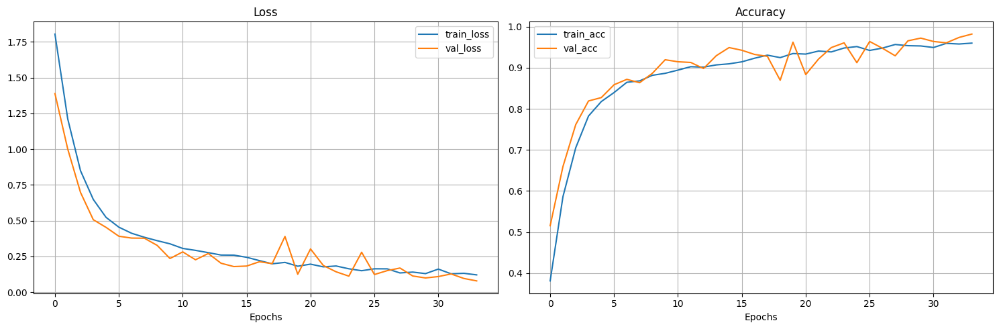

In [ ]:
# plot loss curves
plot_loss_curves(RL_model_L2_results[RL_best_decay_value])

L2 regularization achieves the desired effect to some extent by bringing the curves closer, although the overall improvement will take place next.

Experiment 2. Apply dropout regularization layers.

In [ ]:
# experiment 2: dropout layers
RL_model_dropout_results = experiment_dropout_regularization(train_dataloader=train_dataloader_RL,
                                                             val_dataloader=val_dataloader_RL,
                                                             num_epochs=num_epochs,
                                                             device=device,
                                                             num_classes=num_classes,
                                                             best_decay_value=RL_best_decay_value,
                                                             dropout_probs_combos_list=dropout_probs_combos_list)

Experimenting with Dropout Regularization Layers
Dropout probabilities to try: [0.1, 0.3, 0.5, 0.6, 0.7, 0.9]
Total number of combinations to ideally try: 1296

Some possible 'good' combinations to try: [[0.5, 0.5, 0.5, 0.5], [0.5, 0.5, 0.4, 0.5], [0.5, 0.4, 0.5, 0.5], [0.5, 0.4, 0.4, 0.5], [0.5, 0.5, 0.5, 0.4], [0.4, 0.5, 0.5, 0.5], [0.4, 0.5, 0.5, 0.4], [0.5, 0.5, 0.5, 0.7], [0.8, 0.5, 0.5, 0.5], [0.8, 0.7, 0.7, 0.6], [0.8, 0.8, 0.7, 0.5], [0.8, 0.5, 0.7, 0.5], [0.6, 0.5, 0.5, 0.5], [0.5, 0.6, 0.6, 0.5], [0.7, 0.6, 0.5, 0.5]]

Testing with conv_dropout_prob: [0.5, 0.5, 0.5] and classifier dropout probability: 0.5


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.9582 | train_acc: 0.2967 | val_loss: 1.6852 | val_acc: 0.3620
Epoch: 2 | train_loss: 1.6357 | train_acc: 0.4269 | val_loss: 1.4542 | val_acc: 0.4771
Epoch: 3 | train_loss: 1.5340 | train_acc: 0.4766 | val_loss: 1.3744 | val_acc: 0.5311
Epoch: 4 | train_loss: 1.3942 | train_acc: 0.5265 | val_loss: 1.2048 | val_acc: 0.5786
Epoch: 5 | train_loss: 1.2681 | train_acc: 0.5775 | val_loss: 1.2484 | val_acc: 0.5950
Epoch: 6 | train_loss: 1.1587 | train_acc: 0.6100 | val_loss: 1.1078 | val_acc: 0.5892
Epoch: 7 | train_loss: 1.0775 | train_acc: 0.6336 | val_loss: 0.9670 | val_acc: 0.6734
Epoch: 8 | train_loss: 1.0422 | train_acc: 0.6505 | val_loss: 0.9508 | val_acc: 0.6737
Epoch: 9 | train_loss: 0.9920 | train_acc: 0.6585 | val_loss: 0.7432 | val_acc: 0.7497
Epoch: 10 | train_loss: 0.9546 | train_acc: 0.6718 | val_loss: 0.7694 | val_acc: 0.7395
Epoch: 11 | train_loss: 0.9547 | train_acc: 0.6695 | val_loss: 0.9166 | val_acc: 0.6932
Epoch: 12 | train_loss: 0.9055 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.8913 | train_acc: 0.3060 | val_loss: 1.5411 | val_acc: 0.4692
Epoch: 2 | train_loss: 1.6002 | train_acc: 0.4426 | val_loss: 1.3740 | val_acc: 0.5116
Epoch: 3 | train_loss: 1.4210 | train_acc: 0.5218 | val_loss: 1.1510 | val_acc: 0.6218
Epoch: 4 | train_loss: 1.2384 | train_acc: 0.5879 | val_loss: 1.0010 | val_acc: 0.6885
Epoch: 5 | train_loss: 1.1073 | train_acc: 0.6272 | val_loss: 0.9199 | val_acc: 0.7014
Epoch: 6 | train_loss: 1.0580 | train_acc: 0.6470 | val_loss: 0.8420 | val_acc: 0.7253
Epoch: 7 | train_loss: 0.9950 | train_acc: 0.6653 | val_loss: 0.8329 | val_acc: 0.7359
Epoch: 8 | train_loss: 0.9470 | train_acc: 0.6787 | val_loss: 0.7731 | val_acc: 0.7284
Epoch: 9 | train_loss: 0.9238 | train_acc: 0.6858 | val_loss: 0.7529 | val_acc: 0.7678
Epoch: 10 | train_loss: 0.8920 | train_acc: 0.6973 | val_loss: 0.6835 | val_acc: 0.7730
Epoch: 11 | train_loss: 0.8772 | train_acc: 0.7063 | val_loss: 0.6368 | val_acc: 0.8191
Epoch: 12 | train_loss: 0.8649 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.9614 | train_acc: 0.2987 | val_loss: 1.6285 | val_acc: 0.4323
Epoch: 2 | train_loss: 1.6639 | train_acc: 0.4142 | val_loss: 1.3922 | val_acc: 0.5021
Epoch: 3 | train_loss: 1.4655 | train_acc: 0.5132 | val_loss: 1.2197 | val_acc: 0.5752
Epoch: 4 | train_loss: 1.3385 | train_acc: 0.5465 | val_loss: 1.1680 | val_acc: 0.6054
Epoch: 5 | train_loss: 1.2215 | train_acc: 0.5837 | val_loss: 1.1018 | val_acc: 0.6244
Epoch: 6 | train_loss: 1.1498 | train_acc: 0.6146 | val_loss: 0.9862 | val_acc: 0.6965
Epoch: 7 | train_loss: 1.0815 | train_acc: 0.6289 | val_loss: 0.8623 | val_acc: 0.7165
Epoch: 8 | train_loss: 1.0653 | train_acc: 0.6478 | val_loss: 0.7922 | val_acc: 0.7415
Epoch: 9 | train_loss: 1.0170 | train_acc: 0.6666 | val_loss: 0.7906 | val_acc: 0.7201
Epoch: 10 | train_loss: 1.0204 | train_acc: 0.6549 | val_loss: 0.7719 | val_acc: 0.7530
Epoch: 11 | train_loss: 0.9917 | train_acc: 0.6653 | val_loss: 0.7411 | val_acc: 0.7448
Epoch: 12 | train_loss: 0.9790 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.9110 | train_acc: 0.3292 | val_loss: 1.6251 | val_acc: 0.4176
Epoch: 2 | train_loss: 1.5297 | train_acc: 0.4671 | val_loss: 1.1885 | val_acc: 0.6129
Epoch: 3 | train_loss: 1.2596 | train_acc: 0.5742 | val_loss: 1.3236 | val_acc: 0.5233
Epoch: 4 | train_loss: 1.1391 | train_acc: 0.6130 | val_loss: 1.0853 | val_acc: 0.6200
Epoch: 5 | train_loss: 1.0197 | train_acc: 0.6549 | val_loss: 0.9257 | val_acc: 0.6659
Epoch: 6 | train_loss: 0.9764 | train_acc: 0.6628 | val_loss: 0.8911 | val_acc: 0.7181
Epoch: 7 | train_loss: 0.9128 | train_acc: 0.6908 | val_loss: 0.6585 | val_acc: 0.7714
Epoch: 8 | train_loss: 0.8784 | train_acc: 0.7061 | val_loss: 0.7893 | val_acc: 0.7491
Epoch: 9 | train_loss: 0.8170 | train_acc: 0.7240 | val_loss: 0.8183 | val_acc: 0.7152
Epoch: 10 | train_loss: 0.8071 | train_acc: 0.7349 | val_loss: 0.7459 | val_acc: 0.7497
Epoch: 11 | train_loss: 0.7963 | train_acc: 0.7360 | val_loss: 0.6109 | val_acc: 0.7990
Epoch: 12 | train_loss: 0.7482 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.9743 | train_acc: 0.2879 | val_loss: 1.5782 | val_acc: 0.4435
Epoch: 2 | train_loss: 1.6578 | train_acc: 0.4239 | val_loss: 1.4960 | val_acc: 0.4873
Epoch: 3 | train_loss: 1.4919 | train_acc: 0.4966 | val_loss: 1.5276 | val_acc: 0.4567
Epoch: 4 | train_loss: 1.3602 | train_acc: 0.5414 | val_loss: 1.1160 | val_acc: 0.6192
Epoch: 5 | train_loss: 1.2846 | train_acc: 0.5611 | val_loss: 1.2552 | val_acc: 0.5641
Epoch: 6 | train_loss: 1.1975 | train_acc: 0.5974 | val_loss: 0.9619 | val_acc: 0.6553
Epoch: 7 | train_loss: 1.1279 | train_acc: 0.6206 | val_loss: 0.9672 | val_acc: 0.6751
Epoch: 8 | train_loss: 1.0787 | train_acc: 0.6373 | val_loss: 0.8277 | val_acc: 0.7261
Epoch: 9 | train_loss: 1.0151 | train_acc: 0.6550 | val_loss: 1.0302 | val_acc: 0.6298
Epoch: 10 | train_loss: 0.9801 | train_acc: 0.6678 | val_loss: 0.8797 | val_acc: 0.7064
Epoch: 11 | train_loss: 0.9443 | train_acc: 0.6787 | val_loss: 0.8116 | val_acc: 0.7377
Epoch: 12 | train_loss: 0.9165 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.9417 | train_acc: 0.3247 | val_loss: 1.4363 | val_acc: 0.5606
Epoch: 2 | train_loss: 1.5236 | train_acc: 0.4819 | val_loss: 1.1574 | val_acc: 0.6356
Epoch: 3 | train_loss: 1.3083 | train_acc: 0.5595 | val_loss: 0.9277 | val_acc: 0.6820
Epoch: 4 | train_loss: 1.1508 | train_acc: 0.6049 | val_loss: 0.8860 | val_acc: 0.7044
Epoch: 5 | train_loss: 1.0675 | train_acc: 0.6342 | val_loss: 0.8284 | val_acc: 0.7116
Epoch: 6 | train_loss: 0.9935 | train_acc: 0.6591 | val_loss: 0.6931 | val_acc: 0.7681
Epoch: 7 | train_loss: 0.9524 | train_acc: 0.6817 | val_loss: 0.7250 | val_acc: 0.7658
Epoch: 8 | train_loss: 0.9336 | train_acc: 0.6797 | val_loss: 0.7284 | val_acc: 0.7757
Epoch: 9 | train_loss: 0.8751 | train_acc: 0.7008 | val_loss: 0.7030 | val_acc: 0.7494
Epoch: 10 | train_loss: 0.8658 | train_acc: 0.7151 | val_loss: 0.8752 | val_acc: 0.7150
Epoch: 11 | train_loss: 0.8253 | train_acc: 0.7169 | val_loss: 0.5916 | val_acc: 0.8322
Epoch: 12 | train_loss: 0.8342 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.9117 | train_acc: 0.3141 | val_loss: 1.4874 | val_acc: 0.5043
Epoch: 2 | train_loss: 1.5794 | train_acc: 0.4535 | val_loss: 1.3254 | val_acc: 0.5830
Epoch: 3 | train_loss: 1.3829 | train_acc: 0.5378 | val_loss: 1.1565 | val_acc: 0.6030
Epoch: 4 | train_loss: 1.2468 | train_acc: 0.5830 | val_loss: 0.9507 | val_acc: 0.6784
Epoch: 5 | train_loss: 1.1276 | train_acc: 0.6282 | val_loss: 0.8206 | val_acc: 0.7264
Epoch: 6 | train_loss: 1.0614 | train_acc: 0.6450 | val_loss: 0.7848 | val_acc: 0.7316
Epoch: 7 | train_loss: 1.0149 | train_acc: 0.6432 | val_loss: 0.7825 | val_acc: 0.7277
Epoch: 8 | train_loss: 0.9528 | train_acc: 0.6792 | val_loss: 0.7567 | val_acc: 0.7672
Epoch: 9 | train_loss: 0.9573 | train_acc: 0.6776 | val_loss: 0.7150 | val_acc: 0.7458
Epoch: 10 | train_loss: 0.9395 | train_acc: 0.6716 | val_loss: 0.7041 | val_acc: 0.7622
Epoch: 11 | train_loss: 0.9211 | train_acc: 0.6890 | val_loss: 0.6929 | val_acc: 0.7642
Epoch: 12 | train_loss: 0.8969 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.0399 | train_acc: 0.2662 | val_loss: 1.8210 | val_acc: 0.3500
Epoch: 2 | train_loss: 1.7351 | train_acc: 0.3738 | val_loss: 1.6177 | val_acc: 0.4201
Epoch: 3 | train_loss: 1.6403 | train_acc: 0.4255 | val_loss: 1.8378 | val_acc: 0.3443
Epoch: 4 | train_loss: 1.5882 | train_acc: 0.4408 | val_loss: 1.3833 | val_acc: 0.5889
Epoch: 5 | train_loss: 1.5001 | train_acc: 0.4944 | val_loss: 1.4421 | val_acc: 0.5719
Epoch: 6 | train_loss: 1.4078 | train_acc: 0.5266 | val_loss: 1.2924 | val_acc: 0.6027
Epoch: 7 | train_loss: 1.3398 | train_acc: 0.5689 | val_loss: 1.2239 | val_acc: 0.5994
Epoch: 8 | train_loss: 1.2413 | train_acc: 0.5804 | val_loss: 1.1436 | val_acc: 0.5861
Epoch: 9 | train_loss: 1.2001 | train_acc: 0.6002 | val_loss: 1.0362 | val_acc: 0.6698
Epoch: 10 | train_loss: 1.1280 | train_acc: 0.6261 | val_loss: 0.9174 | val_acc: 0.7184
Epoch: 11 | train_loss: 1.0805 | train_acc: 0.6386 | val_loss: 0.8879 | val_acc: 0.7116
Epoch: 12 | train_loss: 1.0647 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.0583 | train_acc: 0.2748 | val_loss: 2.8165 | val_acc: 0.1168
Epoch: 2 | train_loss: 1.7474 | train_acc: 0.3810 | val_loss: 2.7039 | val_acc: 0.1201
Epoch: 3 | train_loss: 1.6885 | train_acc: 0.4145 | val_loss: 3.0145 | val_acc: 0.1201
Epoch: 4 | train_loss: 1.6462 | train_acc: 0.4309 | val_loss: 2.7570 | val_acc: 0.1201
Epoch: 5 | train_loss: 1.5796 | train_acc: 0.4507 | val_loss: 2.8193 | val_acc: 0.1250
Epoch: 6 | train_loss: 1.5655 | train_acc: 0.4532 | val_loss: 2.5587 | val_acc: 0.1404
Epoch: 7 | train_loss: 1.5181 | train_acc: 0.4705 | val_loss: 2.8412 | val_acc: 0.1234
Epoch: 8 | train_loss: 1.4892 | train_acc: 0.5043 | val_loss: 2.6238 | val_acc: 0.1449
Epoch: 9 | train_loss: 1.4505 | train_acc: 0.5030 | val_loss: 2.6090 | val_acc: 0.1349
Epoch: 10 | train_loss: 1.4254 | train_acc: 0.5174 | val_loss: 2.4540 | val_acc: 0.1407
Epoch: 11 | train_loss: 1.4061 | train_acc: 0.5227 | val_loss: 2.8693 | val_acc: 0.1234
Epoch: 12 | train_loss: 1.4049 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.2305 | train_acc: 0.2215 | val_loss: 2.5077 | val_acc: 0.1168
Epoch: 2 | train_loss: 1.9164 | train_acc: 0.3229 | val_loss: 2.6881 | val_acc: 0.1168
Epoch: 3 | train_loss: 1.8068 | train_acc: 0.3455 | val_loss: 2.8874 | val_acc: 0.1168
Epoch: 4 | train_loss: 1.7771 | train_acc: 0.3794 | val_loss: 2.6659 | val_acc: 0.1201
Epoch: 5 | train_loss: 1.7524 | train_acc: 0.3768 | val_loss: 2.8954 | val_acc: 0.1168
Epoch: 6 | train_loss: 1.7210 | train_acc: 0.3963 | val_loss: 2.7747 | val_acc: 0.1184
Epoch: 7 | train_loss: 1.6892 | train_acc: 0.4114 | val_loss: 2.6914 | val_acc: 0.1184
Epoch: 8 | train_loss: 1.7160 | train_acc: 0.4102 | val_loss: 2.5812 | val_acc: 0.1269
Epoch: 9 | train_loss: 1.6855 | train_acc: 0.4094 | val_loss: 2.8454 | val_acc: 0.1184
Epoch: 10 | train_loss: 1.6498 | train_acc: 0.4226 | val_loss: 2.5464 | val_acc: 0.1253
Epoch: 11 | train_loss: 1.6496 | train_acc: 0.4378 | val_loss: 2.3132 | val_acc: 0.1473
Epoch: 12 | train_loss: 1.6266 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.2679 | train_acc: 0.2073 | val_loss: 2.3561 | val_acc: 0.1240
Epoch: 2 | train_loss: 1.9378 | train_acc: 0.3263 | val_loss: 2.6324 | val_acc: 0.1168
Epoch: 3 | train_loss: 1.8280 | train_acc: 0.3738 | val_loss: 2.8472 | val_acc: 0.1168
Epoch: 4 | train_loss: 1.7779 | train_acc: 0.4012 | val_loss: 2.8409 | val_acc: 0.1168
Epoch: 5 | train_loss: 1.7343 | train_acc: 0.4012 | val_loss: 2.6055 | val_acc: 0.1217
Epoch: 6 | train_loss: 1.7086 | train_acc: 0.4029 | val_loss: 2.8700 | val_acc: 0.1168
Epoch: 7 | train_loss: 1.6831 | train_acc: 0.4132 | val_loss: 2.8310 | val_acc: 0.1168
Epoch: 8 | train_loss: 1.6974 | train_acc: 0.4133 | val_loss: 2.6835 | val_acc: 0.1217
Epoch: 9 | train_loss: 1.6502 | train_acc: 0.4294 | val_loss: 2.4199 | val_acc: 0.1322
Epoch: 10 | train_loss: 1.6670 | train_acc: 0.4155 | val_loss: 2.6895 | val_acc: 0.1217
Epoch: 11 | train_loss: 1.6551 | train_acc: 0.4221 | val_loss: 2.1062 | val_acc: 0.1889
Epoch: 12 | train_loss: 1.6667 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.1390 | train_acc: 0.2417 | val_loss: 2.4356 | val_acc: 0.1269
Epoch: 2 | train_loss: 1.8530 | train_acc: 0.3365 | val_loss: 2.5163 | val_acc: 0.1305
Epoch: 3 | train_loss: 1.7546 | train_acc: 0.3861 | val_loss: 2.7669 | val_acc: 0.1201
Epoch: 4 | train_loss: 1.7083 | train_acc: 0.3987 | val_loss: 2.9111 | val_acc: 0.1201
Epoch: 5 | train_loss: 1.6830 | train_acc: 0.4031 | val_loss: 2.6960 | val_acc: 0.1234
Epoch: 6 | train_loss: 1.6659 | train_acc: 0.4280 | val_loss: 2.8767 | val_acc: 0.1217
Epoch: 7 | train_loss: 1.6366 | train_acc: 0.4287 | val_loss: 3.1724 | val_acc: 0.1201
Epoch: 8 | train_loss: 1.5974 | train_acc: 0.4505 | val_loss: 2.4954 | val_acc: 0.1427
Epoch: 9 | train_loss: 1.6014 | train_acc: 0.4515 | val_loss: 2.7110 | val_acc: 0.1250
Epoch: 10 | train_loss: 1.5972 | train_acc: 0.4585 | val_loss: 2.8183 | val_acc: 0.1250
Epoch: 11 | train_loss: 1.5852 | train_acc: 0.4635 | val_loss: 3.1033 | val_acc: 0.1217
Epoch: 12 | train_loss: 1.5563 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.0474 | train_acc: 0.2628 | val_loss: 1.9001 | val_acc: 0.3067
Epoch: 2 | train_loss: 1.6957 | train_acc: 0.3985 | val_loss: 1.8110 | val_acc: 0.3291
Epoch: 3 | train_loss: 1.5964 | train_acc: 0.4477 | val_loss: 1.7195 | val_acc: 0.3883
Epoch: 4 | train_loss: 1.5336 | train_acc: 0.4688 | val_loss: 1.5548 | val_acc: 0.4285
Epoch: 5 | train_loss: 1.4473 | train_acc: 0.5063 | val_loss: 1.5855 | val_acc: 0.4153
Epoch: 6 | train_loss: 1.3881 | train_acc: 0.5477 | val_loss: 1.2755 | val_acc: 0.5547
Epoch: 7 | train_loss: 1.3138 | train_acc: 0.5680 | val_loss: 1.6736 | val_acc: 0.4025
Epoch: 8 | train_loss: 1.2179 | train_acc: 0.6076 | val_loss: 1.3964 | val_acc: 0.5140
Epoch: 9 | train_loss: 1.1709 | train_acc: 0.6154 | val_loss: 1.2526 | val_acc: 0.5939
Epoch: 10 | train_loss: 1.1574 | train_acc: 0.6190 | val_loss: 1.1336 | val_acc: 0.6274
Epoch: 11 | train_loss: 1.0835 | train_acc: 0.6252 | val_loss: 1.5456 | val_acc: 0.4435
Epoch: 12 | train_loss: 1.0912 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.0107 | train_acc: 0.2726 | val_loss: 1.6075 | val_acc: 0.4306
Epoch: 2 | train_loss: 1.6983 | train_acc: 0.4086 | val_loss: 1.5397 | val_acc: 0.4590
Epoch: 3 | train_loss: 1.5925 | train_acc: 0.4465 | val_loss: 1.6303 | val_acc: 0.4058
Epoch: 4 | train_loss: 1.5030 | train_acc: 0.4844 | val_loss: 1.3208 | val_acc: 0.5429
Epoch: 5 | train_loss: 1.4317 | train_acc: 0.5196 | val_loss: 1.2482 | val_acc: 0.5774
Epoch: 6 | train_loss: 1.3307 | train_acc: 0.5544 | val_loss: 1.3917 | val_acc: 0.4879
Epoch: 7 | train_loss: 1.2331 | train_acc: 0.5883 | val_loss: 1.3223 | val_acc: 0.5361
Epoch: 8 | train_loss: 1.2163 | train_acc: 0.5963 | val_loss: 1.0444 | val_acc: 0.6510
Epoch: 9 | train_loss: 1.1676 | train_acc: 0.6073 | val_loss: 0.9152 | val_acc: 0.6981
Epoch: 10 | train_loss: 1.1284 | train_acc: 0.6311 | val_loss: 0.8537 | val_acc: 0.7129
Epoch: 11 | train_loss: 1.1101 | train_acc: 0.6296 | val_loss: 1.0410 | val_acc: 0.6348
Epoch: 12 | train_loss: 1.1009 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.0707 | train_acc: 0.2721 | val_loss: 2.1028 | val_acc: 0.2435
Epoch: 2 | train_loss: 1.7529 | train_acc: 0.3838 | val_loss: 1.7517 | val_acc: 0.3464
Epoch: 3 | train_loss: 1.6565 | train_acc: 0.4221 | val_loss: 1.9724 | val_acc: 0.2477
Epoch: 4 | train_loss: 1.6028 | train_acc: 0.4479 | val_loss: 2.1373 | val_acc: 0.1910
Epoch: 5 | train_loss: 1.5434 | train_acc: 0.4572 | val_loss: 1.9577 | val_acc: 0.2724
Epoch: 6 | train_loss: 1.5078 | train_acc: 0.4865 | val_loss: 1.8852 | val_acc: 0.2792
Epoch: 7 | train_loss: 1.4607 | train_acc: 0.5246 | val_loss: 1.9868 | val_acc: 0.2595
Epoch: 8 | train_loss: 1.3936 | train_acc: 0.5384 | val_loss: 2.0280 | val_acc: 0.2537
Epoch: 9 | train_loss: 1.3513 | train_acc: 0.5590 | val_loss: 1.7567 | val_acc: 0.3458
Epoch: 10 | train_loss: 1.2430 | train_acc: 0.5864 | val_loss: 1.4016 | val_acc: 0.5103
Epoch: 11 | train_loss: 1.2649 | train_acc: 0.5914 | val_loss: 1.6171 | val_acc: 0.3910
Epoch: 12 | train_loss: 1.2287 | train_ac

In [ ]:
# identify and print the best dropout probs combo value based on the generalization gap
RL_best_dropout_probs, RL_min_diff_dropout = compute_multi_generalization_gaps(RL_model_dropout_results)

Difference between train and val acc for (0.5, 0.5, 0.5, 0.5): -0.0607
Difference between train and val acc for (0.5, 0.5, 0.4, 0.5): -0.0698
Difference between train and val acc for (0.5, 0.4, 0.5, 0.5): -0.0771
Difference between train and val acc for (0.5, 0.4, 0.4, 0.5): -0.0628
Difference between train and val acc for (0.5, 0.5, 0.5, 0.4): -0.0439
Difference between train and val acc for (0.4, 0.5, 0.5, 0.5): -0.0659
Difference between train and val acc for (0.4, 0.5, 0.5, 0.4): -0.0367
Difference between train and val acc for (0.5, 0.5, 0.5, 0.7): -0.0947
Difference between train and val acc for (0.8, 0.5, 0.5, 0.5): 0.4884
Difference between train and val acc for (0.8, 0.7, 0.7, 0.6): 0.2138
Difference between train and val acc for (0.8, 0.8, 0.7, 0.5): 0.3346
Difference between train and val acc for (0.8, 0.5, 0.7, 0.5): 0.4418
Difference between train and val acc for (0.6, 0.5, 0.5, 0.5): 0.0951
Difference between train and val acc for (0.5, 0.6, 0.6, 0.5): -0.0627
Difference 

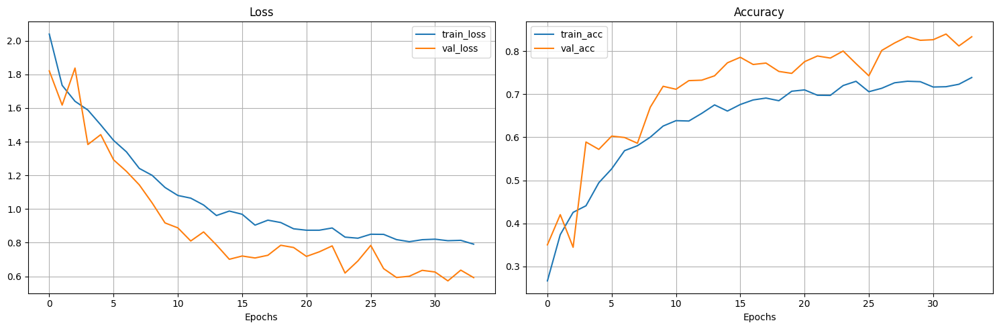

In [ ]:
# plot learning curves
plot_loss_curves(RL_model_dropout_results[RL_best_dropout_probs])

As usual, applying dropout after L2 regularization successfully eliminates overfitting.

Experiment 3: Try different hidden layer sizes.

In [ ]:
# experiment 3: hidden layer sizes
RL_model_hidden_results = experiment_hidden_layer_sizes(train_dataloader=train_dataloader_RL,
                                                        val_dataloader=val_dataloader_RL,
                                                        num_epochs=num_epochs,
                                                        device=device,
                                                        num_classes=num_classes,
                                                        best_decay_value=RL_best_decay_value,
                                                        best_dropout_probs_combo=RL_best_dropout_probs,
                                                        hidden_layer_sizes_list=hidden_layer_sizes_list)

Experimenting with Hidden Layer Sizes
Hidden layer sizes combinations to try: [(32, 64, 64), (32, 32, 128), (64, 32, 64), (32, 32, 64), (64, 64, 32), (32, 64, 32)]

Testing hidden layer sizes combination: (32, 64, 64)...


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.1201 | train_acc: 0.2499 | val_loss: 1.6282 | val_acc: 0.4028
Epoch: 2 | train_loss: 1.7181 | train_acc: 0.3961 | val_loss: 1.2845 | val_acc: 0.5819
Epoch: 3 | train_loss: 1.4283 | train_acc: 0.5161 | val_loss: 1.0036 | val_acc: 0.6178
Epoch: 4 | train_loss: 1.2209 | train_acc: 0.5796 | val_loss: 0.8810 | val_acc: 0.6984
Epoch: 5 | train_loss: 1.0719 | train_acc: 0.6275 | val_loss: 0.7696 | val_acc: 0.7379
Epoch: 6 | train_loss: 1.0141 | train_acc: 0.6493 | val_loss: 0.8052 | val_acc: 0.7066
Epoch: 7 | train_loss: 0.9965 | train_acc: 0.6540 | val_loss: 0.7643 | val_acc: 0.7464
Epoch: 8 | train_loss: 0.9287 | train_acc: 0.6746 | val_loss: 0.6989 | val_acc: 0.7612
Epoch: 9 | train_loss: 0.9080 | train_acc: 0.6803 | val_loss: 0.6423 | val_acc: 0.7872
Epoch: 10 | train_loss: 0.8701 | train_acc: 0.7055 | val_loss: 0.6626 | val_acc: 0.7658
Epoch: 11 | train_loss: 0.8637 | train_acc: 0.6987 | val_loss: 0.5925 | val_acc: 0.8056
Epoch: 12 | train_loss: 0.8591 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.0347 | train_acc: 0.2778 | val_loss: 1.5411 | val_acc: 0.4013
Epoch: 2 | train_loss: 1.5588 | train_acc: 0.4598 | val_loss: 1.0724 | val_acc: 0.6570
Epoch: 3 | train_loss: 1.3186 | train_acc: 0.5532 | val_loss: 0.9969 | val_acc: 0.6685
Epoch: 4 | train_loss: 1.1564 | train_acc: 0.6016 | val_loss: 0.7994 | val_acc: 0.7214
Epoch: 5 | train_loss: 1.0926 | train_acc: 0.6192 | val_loss: 0.8257 | val_acc: 0.7261
Epoch: 6 | train_loss: 1.0037 | train_acc: 0.6487 | val_loss: 0.7728 | val_acc: 0.7153
Epoch: 7 | train_loss: 0.9848 | train_acc: 0.6586 | val_loss: 0.7327 | val_acc: 0.7744
Epoch: 8 | train_loss: 0.9569 | train_acc: 0.6620 | val_loss: 0.6499 | val_acc: 0.7812
Epoch: 9 | train_loss: 0.9087 | train_acc: 0.6839 | val_loss: 0.6043 | val_acc: 0.7928
Epoch: 10 | train_loss: 0.9122 | train_acc: 0.6860 | val_loss: 0.5791 | val_acc: 0.7911
Epoch: 11 | train_loss: 0.8832 | train_acc: 0.6976 | val_loss: 0.5904 | val_acc: 0.8207
Epoch: 12 | train_loss: 0.8812 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.0744 | train_acc: 0.2538 | val_loss: 1.5379 | val_acc: 0.4717
Epoch: 2 | train_loss: 1.5595 | train_acc: 0.4587 | val_loss: 1.1786 | val_acc: 0.5635
Epoch: 3 | train_loss: 1.3059 | train_acc: 0.5476 | val_loss: 1.0470 | val_acc: 0.6636
Epoch: 4 | train_loss: 1.1884 | train_acc: 0.5977 | val_loss: 0.8659 | val_acc: 0.7217
Epoch: 5 | train_loss: 1.1065 | train_acc: 0.6230 | val_loss: 0.7777 | val_acc: 0.7368
Epoch: 6 | train_loss: 0.9966 | train_acc: 0.6444 | val_loss: 0.6896 | val_acc: 0.7697
Epoch: 7 | train_loss: 0.9641 | train_acc: 0.6635 | val_loss: 0.7267 | val_acc: 0.7491
Epoch: 8 | train_loss: 0.9251 | train_acc: 0.6805 | val_loss: 0.6234 | val_acc: 0.7878
Epoch: 9 | train_loss: 0.8987 | train_acc: 0.6862 | val_loss: 0.5778 | val_acc: 0.8026
Epoch: 10 | train_loss: 0.8706 | train_acc: 0.7034 | val_loss: 0.5882 | val_acc: 0.8273
Epoch: 11 | train_loss: 0.8677 | train_acc: 0.6945 | val_loss: 0.5313 | val_acc: 0.8059
Epoch: 12 | train_loss: 0.8421 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.0152 | train_acc: 0.2731 | val_loss: 1.6151 | val_acc: 0.4566
Epoch: 2 | train_loss: 1.7270 | train_acc: 0.3921 | val_loss: 1.3903 | val_acc: 0.5306
Epoch: 3 | train_loss: 1.5265 | train_acc: 0.4887 | val_loss: 1.2107 | val_acc: 0.5955
Epoch: 4 | train_loss: 1.4018 | train_acc: 0.5285 | val_loss: 1.1027 | val_acc: 0.6304
Epoch: 5 | train_loss: 1.3118 | train_acc: 0.5566 | val_loss: 0.9481 | val_acc: 0.6770
Epoch: 6 | train_loss: 1.2249 | train_acc: 0.5884 | val_loss: 0.9400 | val_acc: 0.6885
Epoch: 7 | train_loss: 1.1685 | train_acc: 0.6048 | val_loss: 0.8434 | val_acc: 0.7056
Epoch: 8 | train_loss: 1.1333 | train_acc: 0.6238 | val_loss: 0.8890 | val_acc: 0.6879
Epoch: 9 | train_loss: 1.1068 | train_acc: 0.6258 | val_loss: 0.8216 | val_acc: 0.7280
Epoch: 10 | train_loss: 1.0827 | train_acc: 0.6371 | val_loss: 0.7711 | val_acc: 0.7412
Epoch: 11 | train_loss: 1.0465 | train_acc: 0.6434 | val_loss: 0.6930 | val_acc: 0.7711
Epoch: 12 | train_loss: 1.0022 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.2446 | train_acc: 0.1907 | val_loss: 1.8562 | val_acc: 0.3339
Epoch: 2 | train_loss: 1.8170 | train_acc: 0.3469 | val_loss: 1.5401 | val_acc: 0.4491
Epoch: 3 | train_loss: 1.6751 | train_acc: 0.4090 | val_loss: 1.3843 | val_acc: 0.5251
Epoch: 4 | train_loss: 1.5206 | train_acc: 0.4797 | val_loss: 1.1631 | val_acc: 0.6139
Epoch: 5 | train_loss: 1.3941 | train_acc: 0.5264 | val_loss: 1.0638 | val_acc: 0.6337
Epoch: 6 | train_loss: 1.3154 | train_acc: 0.5553 | val_loss: 1.0085 | val_acc: 0.6743
Epoch: 7 | train_loss: 1.2481 | train_acc: 0.5715 | val_loss: 0.9053 | val_acc: 0.6957
Epoch: 8 | train_loss: 1.1449 | train_acc: 0.6004 | val_loss: 0.8093 | val_acc: 0.7283
Epoch: 9 | train_loss: 1.0793 | train_acc: 0.6252 | val_loss: 0.7777 | val_acc: 0.7280
Epoch: 10 | train_loss: 1.0522 | train_acc: 0.6328 | val_loss: 0.7039 | val_acc: 0.7629
Epoch: 11 | train_loss: 0.9873 | train_acc: 0.6631 | val_loss: 0.6483 | val_acc: 0.7770
Epoch: 12 | train_loss: 0.9482 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.1561 | train_acc: 0.2211 | val_loss: 1.6915 | val_acc: 0.3487
Epoch: 2 | train_loss: 1.8172 | train_acc: 0.3502 | val_loss: 1.4808 | val_acc: 0.4388
Epoch: 3 | train_loss: 1.6197 | train_acc: 0.4657 | val_loss: 1.2537 | val_acc: 0.6003
Epoch: 4 | train_loss: 1.4298 | train_acc: 0.5263 | val_loss: 1.0713 | val_acc: 0.6504
Epoch: 5 | train_loss: 1.3243 | train_acc: 0.5530 | val_loss: 0.9765 | val_acc: 0.6586
Epoch: 6 | train_loss: 1.2226 | train_acc: 0.5677 | val_loss: 0.8833 | val_acc: 0.6767
Epoch: 7 | train_loss: 1.1803 | train_acc: 0.6116 | val_loss: 0.8529 | val_acc: 0.6869
Epoch: 8 | train_loss: 1.1166 | train_acc: 0.6099 | val_loss: 0.8455 | val_acc: 0.6872
Epoch: 9 | train_loss: 1.0564 | train_acc: 0.6292 | val_loss: 0.7877 | val_acc: 0.7099
Epoch: 10 | train_loss: 1.0388 | train_acc: 0.6304 | val_loss: 0.7804 | val_acc: 0.7283
Epoch: 11 | train_loss: 0.9976 | train_acc: 0.6588 | val_loss: 0.7178 | val_acc: 0.7596
Epoch: 12 | train_loss: 0.9730 | train_ac

In [ ]:
# put all results in a table and print it
hidden_size_results_list = [(combo, RL_model_hidden_results[combo]['generalization_gap'], RL_model_hidden_results[combo]['val_acc'][-1]) for combo in RL_model_hidden_results]
hidden_size_results_df = pd.DataFrame(hidden_size_results_list, columns=['Hidden Layer Sizes', 'Generalization Gap', 'Validation Accuracy'])
hidden_size_df = hidden_size_results_df.sort_values(by='Validation Accuracy', ascending=False)
print("\n", hidden_size_df.to_string(index=False))


 Hidden Layer Sizes  Generalization Gap  Validation Accuracy
      (32, 32, 64)           -0.126543             0.889803
      (32, 64, 64)           -0.103299             0.886513
      (64, 64, 32)           -0.134445             0.886513
      (64, 32, 64)           -0.099479             0.876645
     (32, 32, 128)           -0.081389             0.853618
      (32, 64, 32)           -0.091122             0.828947


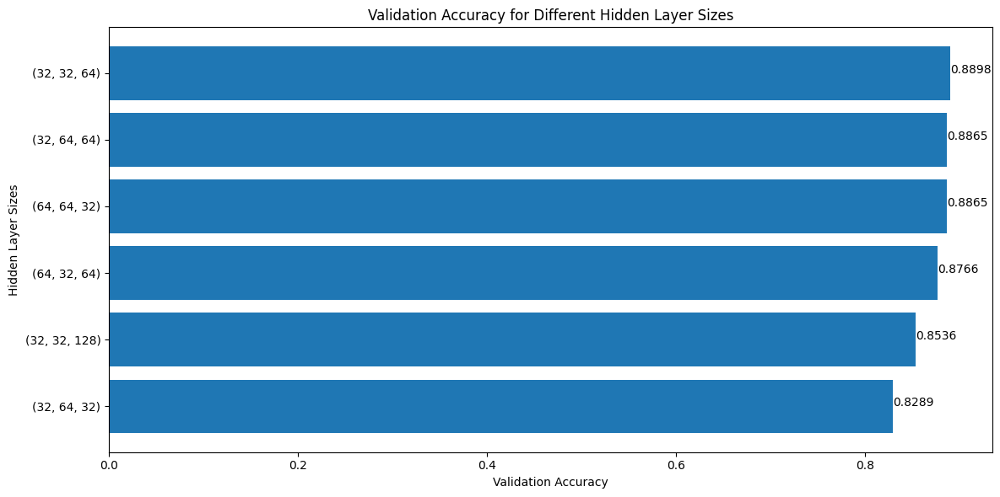

In [ ]:
# plot the results of hidden layer sizes experiment
plot_hidden_layer_results(hidden_size_df)

In [ ]:
RL_best_hidden_units = hidden_size_df.iloc[0]['Hidden Layer Sizes']
print(f"Best hidden layer sizes: {RL_best_hidden_units}")

Best hidden layer sizes: (32, 32, 64)


The plot below confirms that overfitting remains absent.

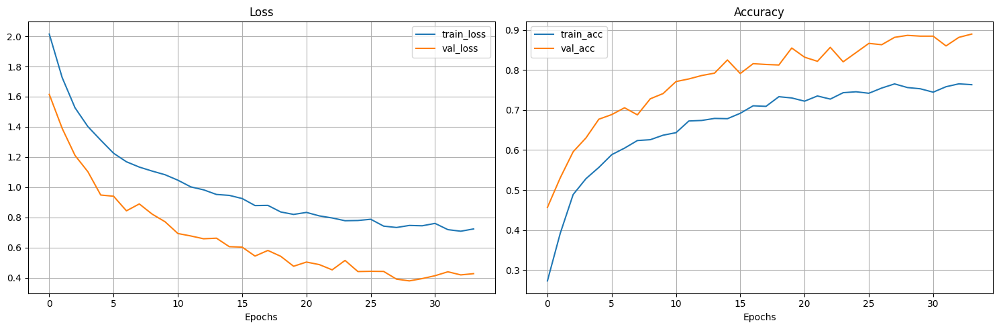

In [ ]:
# plot curves
plot_loss_curves(RL_model_hidden_results[RL_best_hidden_units])

Experiment 4. Try different optimizers and learning rates.

In [ ]:
# experiment 4: optimizers and learning rates
RL_model_opt_results = experiment_optimizers_and_learning_rates(train_dataloader=train_dataloader_RL,
                                                                val_dataloader=val_dataloader_RL,
                                                                num_epochs=num_epochs,
                                                                device=device,
                                                                num_classes=num_classes,
                                                                best_hidden_units_combo=RL_best_hidden_units,
                                                                best_decay_value=RL_best_decay_value,
                                                                best_dropout_probs_combo=RL_best_dropout_probs,
                                                                learning_rates_list=learning_rates_list)

Experimenting with Optimizers and Learning Rates
Learning rates to try: [0.01, 0.001, 0.0001, 1e-05, 1e-06]
Optimizers to try: ['SGD', 'RMSprop', 'Adam', 'AdamW', 'NAdam']

Testing SGD optimizer...

Learning rate: 0.01... 



  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.3276 | train_acc: 0.1452 | val_loss: 2.2344 | val_acc: 0.2122
Epoch: 2 | train_loss: 2.2085 | train_acc: 0.1969 | val_loss: 2.0974 | val_acc: 0.2812
Epoch: 3 | train_loss: 2.0965 | train_acc: 0.2826 | val_loss: 2.0033 | val_acc: 0.3941
Epoch: 4 | train_loss: 2.0004 | train_acc: 0.3260 | val_loss: 1.8434 | val_acc: 0.4191
Epoch: 5 | train_loss: 1.8861 | train_acc: 0.3591 | val_loss: 1.7286 | val_acc: 0.4339
Epoch: 6 | train_loss: 1.8262 | train_acc: 0.3706 | val_loss: 1.6361 | val_acc: 0.4313
Epoch: 7 | train_loss: 1.7501 | train_acc: 0.4030 | val_loss: 1.5883 | val_acc: 0.4511
Epoch: 8 | train_loss: 1.7079 | train_acc: 0.4132 | val_loss: 1.5491 | val_acc: 0.4590
Epoch: 9 | train_loss: 1.6776 | train_acc: 0.4181 | val_loss: 1.5220 | val_acc: 0.4567
Epoch: 10 | train_loss: 1.6521 | train_acc: 0.4237 | val_loss: 1.4664 | val_acc: 0.4862
Epoch: 11 | train_loss: 1.6170 | train_acc: 0.4420 | val_loss: 1.4325 | val_acc: 0.4942
Epoch: 12 | train_loss: 1.6104 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.4264 | train_acc: 0.0697 | val_loss: 2.4006 | val_acc: 0.0628
Epoch: 2 | train_loss: 2.4006 | train_acc: 0.0809 | val_loss: 2.3826 | val_acc: 0.1716
Epoch: 3 | train_loss: 2.3740 | train_acc: 0.0980 | val_loss: 2.3651 | val_acc: 0.1727
Epoch: 4 | train_loss: 2.3600 | train_acc: 0.1107 | val_loss: 2.3469 | val_acc: 0.1530
Epoch: 5 | train_loss: 2.3417 | train_acc: 0.1204 | val_loss: 2.3275 | val_acc: 0.1447
Epoch: 6 | train_loss: 2.3335 | train_acc: 0.1175 | val_loss: 2.3085 | val_acc: 0.1414
Epoch: 7 | train_loss: 2.3226 | train_acc: 0.1172 | val_loss: 2.2907 | val_acc: 0.1414
Epoch: 8 | train_loss: 2.3027 | train_acc: 0.1214 | val_loss: 2.2717 | val_acc: 0.1414
Epoch: 9 | train_loss: 2.2890 | train_acc: 0.1205 | val_loss: 2.2553 | val_acc: 0.1414
Epoch: 10 | train_loss: 2.2833 | train_acc: 0.1255 | val_loss: 2.2437 | val_acc: 0.1464
Epoch: 11 | train_loss: 2.2761 | train_acc: 0.1336 | val_loss: 2.2300 | val_acc: 0.1480
Epoch: 12 | train_loss: 2.2622 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.4233 | train_acc: 0.0920 | val_loss: 2.3903 | val_acc: 0.1500
Epoch: 2 | train_loss: 2.4180 | train_acc: 0.1047 | val_loss: 2.3867 | val_acc: 0.1715
Epoch: 3 | train_loss: 2.4092 | train_acc: 0.1004 | val_loss: 2.3833 | val_acc: 0.1994
Epoch: 4 | train_loss: 2.4108 | train_acc: 0.1027 | val_loss: 2.3801 | val_acc: 0.2347
Epoch: 5 | train_loss: 2.3970 | train_acc: 0.1059 | val_loss: 2.3770 | val_acc: 0.2573
Epoch: 6 | train_loss: 2.3927 | train_acc: 0.1043 | val_loss: 2.3739 | val_acc: 0.2579
Epoch: 7 | train_loss: 2.3961 | train_acc: 0.1021 | val_loss: 2.3711 | val_acc: 0.2398
Epoch: 8 | train_loss: 2.3874 | train_acc: 0.1128 | val_loss: 2.3682 | val_acc: 0.2385
Epoch: 9 | train_loss: 2.3857 | train_acc: 0.1091 | val_loss: 2.3654 | val_acc: 0.2336
Epoch: 10 | train_loss: 2.3888 | train_acc: 0.1119 | val_loss: 2.3629 | val_acc: 0.2253
Epoch: 11 | train_loss: 2.3815 | train_acc: 0.1036 | val_loss: 2.3601 | val_acc: 0.2155
Epoch: 12 | train_loss: 2.3814 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.4167 | train_acc: 0.1134 | val_loss: 2.3993 | val_acc: 0.0839
Epoch: 2 | train_loss: 2.4051 | train_acc: 0.1188 | val_loss: 2.3990 | val_acc: 0.0839
Epoch: 3 | train_loss: 2.4077 | train_acc: 0.1139 | val_loss: 2.3987 | val_acc: 0.0839
Epoch: 4 | train_loss: 2.4168 | train_acc: 0.1092 | val_loss: 2.3984 | val_acc: 0.0839
Epoch: 5 | train_loss: 2.4143 | train_acc: 0.0987 | val_loss: 2.3980 | val_acc: 0.0839
Epoch: 6 | train_loss: 2.4085 | train_acc: 0.1155 | val_loss: 2.3977 | val_acc: 0.0839
Epoch: 7 | train_loss: 2.4144 | train_acc: 0.1224 | val_loss: 2.3974 | val_acc: 0.0839
Epoch: 8 | train_loss: 2.4107 | train_acc: 0.1197 | val_loss: 2.3970 | val_acc: 0.0839
Epoch: 9 | train_loss: 2.4117 | train_acc: 0.1143 | val_loss: 2.3967 | val_acc: 0.0839
Epoch: 10 | train_loss: 2.4094 | train_acc: 0.1264 | val_loss: 2.3964 | val_acc: 0.0839
Epoch: 11 | train_loss: 2.4130 | train_acc: 0.1171 | val_loss: 2.3961 | val_acc: 0.0839
Epoch: 12 | train_loss: 2.4031 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.4100 | train_acc: 0.1039 | val_loss: 2.4021 | val_acc: 0.1003
Epoch: 2 | train_loss: 2.4151 | train_acc: 0.0952 | val_loss: 2.4021 | val_acc: 0.1003
Epoch: 3 | train_loss: 2.4111 | train_acc: 0.1089 | val_loss: 2.4021 | val_acc: 0.1003
Epoch: 4 | train_loss: 2.4143 | train_acc: 0.0979 | val_loss: 2.4020 | val_acc: 0.1003
Epoch: 5 | train_loss: 2.4170 | train_acc: 0.0951 | val_loss: 2.4020 | val_acc: 0.1003
Epoch: 6 | train_loss: 2.4121 | train_acc: 0.0993 | val_loss: 2.4020 | val_acc: 0.1003
Epoch: 7 | train_loss: 2.4104 | train_acc: 0.1026 | val_loss: 2.4020 | val_acc: 0.1003
Epoch: 8 | train_loss: 2.4142 | train_acc: 0.0921 | val_loss: 2.4019 | val_acc: 0.1003
Epoch: 9 | train_loss: 2.4132 | train_acc: 0.0912 | val_loss: 2.4019 | val_acc: 0.1003
Epoch: 10 | train_loss: 2.4153 | train_acc: 0.0860 | val_loss: 2.4019 | val_acc: 0.1003
Epoch: 11 | train_loss: 2.4065 | train_acc: 0.1007 | val_loss: 2.4019 | val_acc: 0.1003
Epoch: 12 | train_loss: 2.4102 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 58.5978 | train_acc: 0.1050 | val_loss: 2.3744 | val_acc: 0.0938
Epoch: 2 | train_loss: 3.4874 | train_acc: 0.1072 | val_loss: 2.3664 | val_acc: 0.0938
Epoch: 3 | train_loss: 2.8246 | train_acc: 0.1209 | val_loss: 2.3779 | val_acc: 0.1168
Epoch: 4 | train_loss: 2.3827 | train_acc: 0.1124 | val_loss: 2.3718 | val_acc: 0.1168
Epoch: 5 | train_loss: 2.3790 | train_acc: 0.1218 | val_loss: 2.3659 | val_acc: 0.1168
Epoch: 6 | train_loss: 2.3960 | train_acc: 0.1122 | val_loss: 2.3647 | val_acc: 0.1168
Epoch: 7 | train_loss: 2.3769 | train_acc: 0.1211 | val_loss: 2.3634 | val_acc: 0.1168
Epoch: 8 | train_loss: 2.3742 | train_acc: 0.1073 | val_loss: 2.3691 | val_acc: 0.1168
Epoch: 9 | train_loss: 2.3781 | train_acc: 0.1144 | val_loss: 2.3904 | val_acc: 0.0938
Epoch: 10 | train_loss: 2.3748 | train_acc: 0.1157 | val_loss: 2.3612 | val_acc: 0.1168
Epoch: 11 | train_loss: 2.3851 | train_acc: 0.1218 | val_loss: 2.3801 | val_acc: 0.0938
Epoch: 12 | train_loss: 2.4364 | train_a

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.0727 | train_acc: 0.2546 | val_loss: 1.6047 | val_acc: 0.4273
Epoch: 2 | train_loss: 1.7635 | train_acc: 0.3646 | val_loss: 1.4764 | val_acc: 0.4931
Epoch: 3 | train_loss: 1.6543 | train_acc: 0.4121 | val_loss: 1.5208 | val_acc: 0.4613
Epoch: 4 | train_loss: 1.5911 | train_acc: 0.4492 | val_loss: 1.3631 | val_acc: 0.5465
Epoch: 5 | train_loss: 1.4571 | train_acc: 0.5194 | val_loss: 1.0775 | val_acc: 0.6296
Epoch: 6 | train_loss: 1.3234 | train_acc: 0.5379 | val_loss: 0.9560 | val_acc: 0.6724
Epoch: 7 | train_loss: 1.2295 | train_acc: 0.5749 | val_loss: 0.9321 | val_acc: 0.6586
Epoch: 8 | train_loss: 1.1130 | train_acc: 0.6142 | val_loss: 0.8196 | val_acc: 0.7349
Epoch: 9 | train_loss: 1.0503 | train_acc: 0.6475 | val_loss: 0.7111 | val_acc: 0.7549
Epoch: 10 | train_loss: 1.0155 | train_acc: 0.6506 | val_loss: 0.8163 | val_acc: 0.7513
Epoch: 11 | train_loss: 0.9816 | train_acc: 0.6621 | val_loss: 0.6808 | val_acc: 0.7760
Epoch: 12 | train_loss: 0.9359 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.2597 | train_acc: 0.1446 | val_loss: 2.1344 | val_acc: 0.2895
Epoch: 2 | train_loss: 2.0830 | train_acc: 0.2735 | val_loss: 1.8925 | val_acc: 0.3898
Epoch: 3 | train_loss: 1.9337 | train_acc: 0.3357 | val_loss: 1.7258 | val_acc: 0.4175
Epoch: 4 | train_loss: 1.8358 | train_acc: 0.3739 | val_loss: 1.6346 | val_acc: 0.4435
Epoch: 5 | train_loss: 1.7716 | train_acc: 0.3831 | val_loss: 1.5730 | val_acc: 0.4632
Epoch: 6 | train_loss: 1.7327 | train_acc: 0.3903 | val_loss: 1.5289 | val_acc: 0.4747
Epoch: 7 | train_loss: 1.7087 | train_acc: 0.4245 | val_loss: 1.5080 | val_acc: 0.4865
Epoch: 8 | train_loss: 1.6735 | train_acc: 0.4225 | val_loss: 1.4569 | val_acc: 0.4928
Epoch: 9 | train_loss: 1.6406 | train_acc: 0.4398 | val_loss: 1.4335 | val_acc: 0.5076
Epoch: 10 | train_loss: 1.6221 | train_acc: 0.4517 | val_loss: 1.4106 | val_acc: 0.5060
Epoch: 11 | train_loss: 1.5875 | train_acc: 0.4546 | val_loss: 1.3640 | val_acc: 0.5405
Epoch: 12 | train_loss: 1.5760 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.3799 | train_acc: 0.1478 | val_loss: 2.3701 | val_acc: 0.1793
Epoch: 2 | train_loss: 2.3468 | train_acc: 0.1703 | val_loss: 2.3452 | val_acc: 0.2947
Epoch: 3 | train_loss: 2.3288 | train_acc: 0.1749 | val_loss: 2.3230 | val_acc: 0.2796
Epoch: 4 | train_loss: 2.3059 | train_acc: 0.1750 | val_loss: 2.3005 | val_acc: 0.2681
Epoch: 5 | train_loss: 2.2897 | train_acc: 0.1982 | val_loss: 2.2814 | val_acc: 0.2648
Epoch: 6 | train_loss: 2.2798 | train_acc: 0.1796 | val_loss: 2.2632 | val_acc: 0.2615
Epoch: 7 | train_loss: 2.2663 | train_acc: 0.1832 | val_loss: 2.2478 | val_acc: 0.2681
Epoch: 8 | train_loss: 2.2501 | train_acc: 0.1960 | val_loss: 2.2330 | val_acc: 0.2664
Epoch: 9 | train_loss: 2.2478 | train_acc: 0.1811 | val_loss: 2.2210 | val_acc: 0.2697
Epoch: 10 | train_loss: 2.2376 | train_acc: 0.1961 | val_loss: 2.2089 | val_acc: 0.2829
Epoch: 11 | train_loss: 2.2251 | train_acc: 0.2091 | val_loss: 2.1956 | val_acc: 0.2911
Epoch: 12 | train_loss: 2.2226 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.4024 | train_acc: 0.0909 | val_loss: 2.3864 | val_acc: 0.1402
Epoch: 2 | train_loss: 2.3966 | train_acc: 0.1085 | val_loss: 2.3836 | val_acc: 0.1477
Epoch: 3 | train_loss: 2.3940 | train_acc: 0.0918 | val_loss: 2.3811 | val_acc: 0.1428
Epoch: 4 | train_loss: 2.3907 | train_acc: 0.0905 | val_loss: 2.3786 | val_acc: 0.1365
Epoch: 5 | train_loss: 2.3913 | train_acc: 0.0909 | val_loss: 2.3763 | val_acc: 0.1365
Epoch: 6 | train_loss: 2.3854 | train_acc: 0.0935 | val_loss: 2.3739 | val_acc: 0.1382
Epoch: 7 | train_loss: 2.3772 | train_acc: 0.1086 | val_loss: 2.3716 | val_acc: 0.1382
Epoch: 8 | train_loss: 2.3745 | train_acc: 0.1081 | val_loss: 2.3692 | val_acc: 0.1382
Epoch: 9 | train_loss: 2.3748 | train_acc: 0.1043 | val_loss: 2.3669 | val_acc: 0.1382
Epoch: 10 | train_loss: 2.3725 | train_acc: 0.0975 | val_loss: 2.3647 | val_acc: 0.1382
Epoch: 11 | train_loss: 2.3693 | train_acc: 0.1053 | val_loss: 2.3624 | val_acc: 0.1382
Epoch: 12 | train_loss: 2.3683 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.3030 | train_acc: 0.2048 | val_loss: 2.2313 | val_acc: 0.1832
Epoch: 2 | train_loss: 2.3652 | train_acc: 0.1781 | val_loss: 2.3883 | val_acc: 0.1234
Epoch: 3 | train_loss: 2.3139 | train_acc: 0.1849 | val_loss: 2.2365 | val_acc: 0.1938
Epoch: 4 | train_loss: 2.1628 | train_acc: 0.2351 | val_loss: 1.8043 | val_acc: 0.3500
Epoch: 5 | train_loss: 2.1075 | train_acc: 0.2502 | val_loss: 2.1634 | val_acc: 0.1624
Epoch: 6 | train_loss: 2.1007 | train_acc: 0.2557 | val_loss: 2.0571 | val_acc: 0.2510
Epoch: 7 | train_loss: 2.0753 | train_acc: 0.2542 | val_loss: 1.8231 | val_acc: 0.3247
Epoch: 8 | train_loss: 2.0821 | train_acc: 0.2483 | val_loss: 1.9016 | val_acc: 0.2943
Epoch: 9 | train_loss: 2.0498 | train_acc: 0.2712 | val_loss: 2.1858 | val_acc: 0.1726
Epoch: 10 | train_loss: 2.0422 | train_acc: 0.2660 | val_loss: 1.9847 | val_acc: 0.2619
Epoch: 11 | train_loss: 2.0097 | train_acc: 0.2635 | val_loss: 1.8641 | val_acc: 0.3137
Epoch: 12 | train_loss: 2.0323 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.0734 | train_acc: 0.2661 | val_loss: 1.6950 | val_acc: 0.4107
Epoch: 2 | train_loss: 1.7431 | train_acc: 0.3746 | val_loss: 1.4180 | val_acc: 0.5441
Epoch: 3 | train_loss: 1.5311 | train_acc: 0.4789 | val_loss: 1.1389 | val_acc: 0.6280
Epoch: 4 | train_loss: 1.3727 | train_acc: 0.5369 | val_loss: 0.9621 | val_acc: 0.6754
Epoch: 5 | train_loss: 1.2020 | train_acc: 0.5920 | val_loss: 0.8452 | val_acc: 0.7056
Epoch: 6 | train_loss: 1.0925 | train_acc: 0.6199 | val_loss: 0.8048 | val_acc: 0.7204
Epoch: 7 | train_loss: 1.0359 | train_acc: 0.6355 | val_loss: 0.7150 | val_acc: 0.7451
Epoch: 8 | train_loss: 1.0073 | train_acc: 0.6537 | val_loss: 0.6853 | val_acc: 0.7681
Epoch: 9 | train_loss: 0.9581 | train_acc: 0.6655 | val_loss: 0.6662 | val_acc: 0.7648
Epoch: 10 | train_loss: 0.9169 | train_acc: 0.6893 | val_loss: 0.6790 | val_acc: 0.7516
Epoch: 11 | train_loss: 0.9222 | train_acc: 0.6673 | val_loss: 0.5978 | val_acc: 0.8273
Epoch: 12 | train_loss: 0.8828 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.3165 | train_acc: 0.1094 | val_loss: 2.2143 | val_acc: 0.1530
Epoch: 2 | train_loss: 2.2135 | train_acc: 0.1681 | val_loss: 2.0915 | val_acc: 0.2398
Epoch: 3 | train_loss: 2.0875 | train_acc: 0.3043 | val_loss: 1.9013 | val_acc: 0.4059
Epoch: 4 | train_loss: 1.9291 | train_acc: 0.3419 | val_loss: 1.7043 | val_acc: 0.4207
Epoch: 5 | train_loss: 1.8304 | train_acc: 0.3648 | val_loss: 1.6131 | val_acc: 0.4583
Epoch: 6 | train_loss: 1.7832 | train_acc: 0.3865 | val_loss: 1.5638 | val_acc: 0.4698
Epoch: 7 | train_loss: 1.7351 | train_acc: 0.3957 | val_loss: 1.5198 | val_acc: 0.4876
Epoch: 8 | train_loss: 1.7017 | train_acc: 0.4124 | val_loss: 1.4718 | val_acc: 0.4964
Epoch: 9 | train_loss: 1.6571 | train_acc: 0.4342 | val_loss: 1.4302 | val_acc: 0.5090
Epoch: 10 | train_loss: 1.6059 | train_acc: 0.4444 | val_loss: 1.3776 | val_acc: 0.5356
Epoch: 11 | train_loss: 1.6071 | train_acc: 0.4476 | val_loss: 1.3673 | val_acc: 0.5359
Epoch: 12 | train_loss: 1.5813 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.3982 | train_acc: 0.0806 | val_loss: 2.3748 | val_acc: 0.1382
Epoch: 2 | train_loss: 2.3720 | train_acc: 0.0884 | val_loss: 2.3556 | val_acc: 0.1382
Epoch: 3 | train_loss: 2.3515 | train_acc: 0.0975 | val_loss: 2.3357 | val_acc: 0.1382
Epoch: 4 | train_loss: 2.3355 | train_acc: 0.1074 | val_loss: 2.3158 | val_acc: 0.1382
Epoch: 5 | train_loss: 2.3210 | train_acc: 0.1088 | val_loss: 2.2968 | val_acc: 0.1382
Epoch: 6 | train_loss: 2.3098 | train_acc: 0.1188 | val_loss: 2.2783 | val_acc: 0.1382
Epoch: 7 | train_loss: 2.2999 | train_acc: 0.1143 | val_loss: 2.2634 | val_acc: 0.1398
Epoch: 8 | train_loss: 2.2803 | train_acc: 0.1209 | val_loss: 2.2480 | val_acc: 0.1414
Epoch: 9 | train_loss: 2.2726 | train_acc: 0.1215 | val_loss: 2.2347 | val_acc: 0.1464
Epoch: 10 | train_loss: 2.2619 | train_acc: 0.1318 | val_loss: 2.2238 | val_acc: 0.1530
Epoch: 11 | train_loss: 2.2511 | train_acc: 0.1365 | val_loss: 2.2103 | val_acc: 0.1562
Epoch: 12 | train_loss: 2.2431 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.3999 | train_acc: 0.1101 | val_loss: 2.3899 | val_acc: 0.1147
Epoch: 2 | train_loss: 2.3962 | train_acc: 0.1109 | val_loss: 2.3871 | val_acc: 0.1327
Epoch: 3 | train_loss: 2.3934 | train_acc: 0.1133 | val_loss: 2.3845 | val_acc: 0.1743
Epoch: 4 | train_loss: 2.3925 | train_acc: 0.1185 | val_loss: 2.3817 | val_acc: 0.2000
Epoch: 5 | train_loss: 2.3909 | train_acc: 0.1171 | val_loss: 2.3792 | val_acc: 0.2050
Epoch: 6 | train_loss: 2.3802 | train_acc: 0.1121 | val_loss: 2.3767 | val_acc: 0.2039
Epoch: 7 | train_loss: 2.3827 | train_acc: 0.1245 | val_loss: 2.3742 | val_acc: 0.1974
Epoch: 8 | train_loss: 2.3774 | train_acc: 0.1122 | val_loss: 2.3716 | val_acc: 0.1809
Epoch: 9 | train_loss: 2.3767 | train_acc: 0.1183 | val_loss: 2.3693 | val_acc: 0.1711
Epoch: 10 | train_loss: 2.3746 | train_acc: 0.1126 | val_loss: 2.3668 | val_acc: 0.1628
Epoch: 11 | train_loss: 2.3675 | train_acc: 0.1245 | val_loss: 2.3644 | val_acc: 0.1595
Epoch: 12 | train_loss: 2.3658 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.3319 | train_acc: 0.1865 | val_loss: 2.3622 | val_acc: 0.1266
Epoch: 2 | train_loss: 2.2084 | train_acc: 0.2117 | val_loss: 2.2583 | val_acc: 0.1446
Epoch: 3 | train_loss: 2.2144 | train_acc: 0.2355 | val_loss: 2.0430 | val_acc: 0.2248
Epoch: 4 | train_loss: 2.2806 | train_acc: 0.1984 | val_loss: 2.1264 | val_acc: 0.1538
Epoch: 5 | train_loss: 2.3064 | train_acc: 0.1961 | val_loss: 2.1485 | val_acc: 0.2237
Epoch: 6 | train_loss: 2.2864 | train_acc: 0.1689 | val_loss: 2.4020 | val_acc: 0.1302
Epoch: 7 | train_loss: 2.3207 | train_acc: 0.1616 | val_loss: 2.3429 | val_acc: 0.1322
Epoch: 8 | train_loss: 2.3240 | train_acc: 0.1802 | val_loss: 2.3323 | val_acc: 0.1573
Epoch: 9 | train_loss: 2.3638 | train_acc: 0.1374 | val_loss: 2.3690 | val_acc: 0.1168
Epoch: 10 | train_loss: 2.3802 | train_acc: 0.1084 | val_loss: 2.3635 | val_acc: 0.1168
Epoch: 11 | train_loss: 2.3753 | train_acc: 0.1147 | val_loss: 2.3720 | val_acc: 0.1168
Epoch: 12 | train_loss: 2.3732 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.0780 | train_acc: 0.2571 | val_loss: 1.6550 | val_acc: 0.3892
Epoch: 2 | train_loss: 1.7454 | train_acc: 0.3882 | val_loss: 1.5100 | val_acc: 0.4765
Epoch: 3 | train_loss: 1.5549 | train_acc: 0.4772 | val_loss: 1.2257 | val_acc: 0.5916
Epoch: 4 | train_loss: 1.3178 | train_acc: 0.5416 | val_loss: 0.9898 | val_acc: 0.6488
Epoch: 5 | train_loss: 1.1700 | train_acc: 0.5906 | val_loss: 0.8763 | val_acc: 0.6856
Epoch: 6 | train_loss: 1.0585 | train_acc: 0.6295 | val_loss: 0.8210 | val_acc: 0.7132
Epoch: 7 | train_loss: 0.9706 | train_acc: 0.6602 | val_loss: 0.6884 | val_acc: 0.7596
Epoch: 8 | train_loss: 0.9556 | train_acc: 0.6626 | val_loss: 0.7291 | val_acc: 0.7346
Epoch: 9 | train_loss: 0.9116 | train_acc: 0.6852 | val_loss: 0.6654 | val_acc: 0.7694
Epoch: 10 | train_loss: 0.8853 | train_acc: 0.6961 | val_loss: 0.5868 | val_acc: 0.8089
Epoch: 11 | train_loss: 0.8451 | train_acc: 0.7044 | val_loss: 0.5549 | val_acc: 0.8073
Epoch: 12 | train_loss: 0.7831 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.3287 | train_acc: 0.1005 | val_loss: 2.2511 | val_acc: 0.1414
Epoch: 2 | train_loss: 2.2339 | train_acc: 0.1508 | val_loss: 2.1324 | val_acc: 0.2615
Epoch: 3 | train_loss: 2.1277 | train_acc: 0.2355 | val_loss: 1.9670 | val_acc: 0.3451
Epoch: 4 | train_loss: 2.0130 | train_acc: 0.3202 | val_loss: 1.7969 | val_acc: 0.4471
Epoch: 5 | train_loss: 1.9083 | train_acc: 0.3572 | val_loss: 1.6700 | val_acc: 0.4536
Epoch: 6 | train_loss: 1.8087 | train_acc: 0.3700 | val_loss: 1.5747 | val_acc: 0.4800
Epoch: 7 | train_loss: 1.7701 | train_acc: 0.4065 | val_loss: 1.5095 | val_acc: 0.4849
Epoch: 8 | train_loss: 1.7112 | train_acc: 0.4279 | val_loss: 1.4377 | val_acc: 0.5454
Epoch: 9 | train_loss: 1.6674 | train_acc: 0.4347 | val_loss: 1.3994 | val_acc: 0.5583
Epoch: 10 | train_loss: 1.6099 | train_acc: 0.4509 | val_loss: 1.3448 | val_acc: 0.5882
Epoch: 11 | train_loss: 1.5661 | train_acc: 0.4922 | val_loss: 1.2809 | val_acc: 0.5882
Epoch: 12 | train_loss: 1.5474 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.4066 | train_acc: 0.0974 | val_loss: 2.3826 | val_acc: 0.1275
Epoch: 2 | train_loss: 2.3833 | train_acc: 0.1011 | val_loss: 2.3649 | val_acc: 0.1382
Epoch: 3 | train_loss: 2.3563 | train_acc: 0.1110 | val_loss: 2.3470 | val_acc: 0.1382
Epoch: 4 | train_loss: 2.3468 | train_acc: 0.1056 | val_loss: 2.3283 | val_acc: 0.1382
Epoch: 5 | train_loss: 2.3298 | train_acc: 0.1036 | val_loss: 2.3087 | val_acc: 0.1382
Epoch: 6 | train_loss: 2.3206 | train_acc: 0.1089 | val_loss: 2.2917 | val_acc: 0.1382
Epoch: 7 | train_loss: 2.3060 | train_acc: 0.1090 | val_loss: 2.2748 | val_acc: 0.1382
Epoch: 8 | train_loss: 2.3001 | train_acc: 0.1147 | val_loss: 2.2605 | val_acc: 0.1382
Epoch: 9 | train_loss: 2.2831 | train_acc: 0.1215 | val_loss: 2.2471 | val_acc: 0.1382
Epoch: 10 | train_loss: 2.2750 | train_acc: 0.1176 | val_loss: 2.2347 | val_acc: 0.1382
Epoch: 11 | train_loss: 2.2672 | train_acc: 0.1245 | val_loss: 2.2225 | val_acc: 0.1398
Epoch: 12 | train_loss: 2.2483 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.4144 | train_acc: 0.1036 | val_loss: 2.3961 | val_acc: 0.0921
Epoch: 2 | train_loss: 2.4080 | train_acc: 0.1032 | val_loss: 2.3940 | val_acc: 0.0921
Epoch: 3 | train_loss: 2.4048 | train_acc: 0.1075 | val_loss: 2.3917 | val_acc: 0.0921
Epoch: 4 | train_loss: 2.4010 | train_acc: 0.1174 | val_loss: 2.3896 | val_acc: 0.1003
Epoch: 5 | train_loss: 2.3993 | train_acc: 0.1150 | val_loss: 2.3876 | val_acc: 0.1111
Epoch: 6 | train_loss: 2.4028 | train_acc: 0.1080 | val_loss: 2.3855 | val_acc: 0.1409
Epoch: 7 | train_loss: 2.3968 | train_acc: 0.1131 | val_loss: 2.3836 | val_acc: 0.1566
Epoch: 8 | train_loss: 2.3938 | train_acc: 0.1178 | val_loss: 2.3817 | val_acc: 0.1756
Epoch: 9 | train_loss: 2.3894 | train_acc: 0.1190 | val_loss: 2.3798 | val_acc: 0.2106
Epoch: 10 | train_loss: 2.3902 | train_acc: 0.1201 | val_loss: 2.3779 | val_acc: 0.2287
Epoch: 11 | train_loss: 2.3882 | train_acc: 0.1125 | val_loss: 2.3760 | val_acc: 0.2395
Epoch: 12 | train_loss: 2.3831 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.4088 | train_acc: 0.1364 | val_loss: 2.3659 | val_acc: 0.1168
Epoch: 2 | train_loss: 2.3687 | train_acc: 0.1137 | val_loss: 2.3602 | val_acc: 0.1168
Epoch: 3 | train_loss: 2.3647 | train_acc: 0.1196 | val_loss: 2.3659 | val_acc: 0.0938
Epoch: 4 | train_loss: 2.3645 | train_acc: 0.1135 | val_loss: 2.3627 | val_acc: 0.1168
Epoch: 5 | train_loss: 2.3627 | train_acc: 0.1190 | val_loss: 2.3698 | val_acc: 0.0938
Epoch: 6 | train_loss: 2.3625 | train_acc: 0.1216 | val_loss: 2.3696 | val_acc: 0.0938
Epoch: 7 | train_loss: 2.3665 | train_acc: 0.1187 | val_loss: 2.3732 | val_acc: 0.0938
Epoch: 8 | train_loss: 2.3655 | train_acc: 0.1174 | val_loss: 2.3647 | val_acc: 0.1168
Epoch: 9 | train_loss: 2.3624 | train_acc: 0.1176 | val_loss: 2.3641 | val_acc: 0.1168
Epoch: 10 | train_loss: 2.3623 | train_acc: 0.1262 | val_loss: 2.3633 | val_acc: 0.1168
Epoch: 11 | train_loss: 2.3611 | train_acc: 0.1262 | val_loss: 2.3618 | val_acc: 0.1168
Epoch: 12 | train_loss: 2.3609 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.1106 | train_acc: 0.2412 | val_loss: 1.7160 | val_acc: 0.3635
Epoch: 2 | train_loss: 1.7604 | train_acc: 0.3689 | val_loss: 1.5074 | val_acc: 0.4919
Epoch: 3 | train_loss: 1.6515 | train_acc: 0.4325 | val_loss: 1.3088 | val_acc: 0.5744
Epoch: 4 | train_loss: 1.4859 | train_acc: 0.4903 | val_loss: 1.1304 | val_acc: 0.6340
Epoch: 5 | train_loss: 1.3385 | train_acc: 0.5262 | val_loss: 1.0506 | val_acc: 0.6573
Epoch: 6 | train_loss: 1.1838 | train_acc: 0.6031 | val_loss: 0.8380 | val_acc: 0.7096
Epoch: 7 | train_loss: 1.0855 | train_acc: 0.6272 | val_loss: 0.7406 | val_acc: 0.7425
Epoch: 8 | train_loss: 1.0148 | train_acc: 0.6438 | val_loss: 0.7904 | val_acc: 0.7204
Epoch: 9 | train_loss: 0.9598 | train_acc: 0.6571 | val_loss: 0.6859 | val_acc: 0.7796
Epoch: 10 | train_loss: 0.9379 | train_acc: 0.6785 | val_loss: 0.6539 | val_acc: 0.7694
Epoch: 11 | train_loss: 0.9172 | train_acc: 0.6852 | val_loss: 0.6551 | val_acc: 0.8010
Epoch: 12 | train_loss: 0.9128 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.3272 | train_acc: 0.1046 | val_loss: 2.2440 | val_acc: 0.1612
Epoch: 2 | train_loss: 2.2386 | train_acc: 0.1538 | val_loss: 2.1307 | val_acc: 0.2481
Epoch: 3 | train_loss: 2.1467 | train_acc: 0.2421 | val_loss: 1.9884 | val_acc: 0.4010
Epoch: 4 | train_loss: 2.0186 | train_acc: 0.3183 | val_loss: 1.7922 | val_acc: 0.4175
Epoch: 5 | train_loss: 1.8802 | train_acc: 0.3624 | val_loss: 1.6519 | val_acc: 0.4421
Epoch: 6 | train_loss: 1.8107 | train_acc: 0.3747 | val_loss: 1.5968 | val_acc: 0.4714
Epoch: 7 | train_loss: 1.7342 | train_acc: 0.3960 | val_loss: 1.5198 | val_acc: 0.4829
Epoch: 8 | train_loss: 1.7054 | train_acc: 0.4118 | val_loss: 1.4835 | val_acc: 0.5027
Epoch: 9 | train_loss: 1.6635 | train_acc: 0.4357 | val_loss: 1.4408 | val_acc: 0.4977
Epoch: 10 | train_loss: 1.6247 | train_acc: 0.4400 | val_loss: 1.3926 | val_acc: 0.5274
Epoch: 11 | train_loss: 1.5962 | train_acc: 0.4639 | val_loss: 1.3561 | val_acc: 0.5454
Epoch: 12 | train_loss: 1.5769 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.3915 | train_acc: 0.1258 | val_loss: 2.3763 | val_acc: 0.2549
Epoch: 2 | train_loss: 2.3729 | train_acc: 0.1283 | val_loss: 2.3589 | val_acc: 0.2451
Epoch: 3 | train_loss: 2.3522 | train_acc: 0.1339 | val_loss: 2.3388 | val_acc: 0.1382
Epoch: 4 | train_loss: 2.3225 | train_acc: 0.1353 | val_loss: 2.3160 | val_acc: 0.1382
Epoch: 5 | train_loss: 2.3186 | train_acc: 0.1248 | val_loss: 2.2935 | val_acc: 0.1382
Epoch: 6 | train_loss: 2.2922 | train_acc: 0.1286 | val_loss: 2.2697 | val_acc: 0.1382
Epoch: 7 | train_loss: 2.2785 | train_acc: 0.1323 | val_loss: 2.2477 | val_acc: 0.1382
Epoch: 8 | train_loss: 2.2600 | train_acc: 0.1409 | val_loss: 2.2265 | val_acc: 0.1431
Epoch: 9 | train_loss: 2.2574 | train_acc: 0.1386 | val_loss: 2.2105 | val_acc: 0.1924
Epoch: 10 | train_loss: 2.2439 | train_acc: 0.1587 | val_loss: 2.1961 | val_acc: 0.2451
Epoch: 11 | train_loss: 2.2347 | train_acc: 0.1789 | val_loss: 2.1790 | val_acc: 0.2632
Epoch: 12 | train_loss: 2.2150 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.4175 | train_acc: 0.0893 | val_loss: 2.3962 | val_acc: 0.0329
Epoch: 2 | train_loss: 2.4164 | train_acc: 0.0966 | val_loss: 2.3933 | val_acc: 0.0493
Epoch: 3 | train_loss: 2.4131 | train_acc: 0.0851 | val_loss: 2.3905 | val_acc: 0.0609
Epoch: 4 | train_loss: 2.3999 | train_acc: 0.1006 | val_loss: 2.3879 | val_acc: 0.0697
Epoch: 5 | train_loss: 2.3999 | train_acc: 0.0940 | val_loss: 2.3853 | val_acc: 0.0900
Epoch: 6 | train_loss: 2.3976 | train_acc: 0.0916 | val_loss: 2.3829 | val_acc: 0.1058
Epoch: 7 | train_loss: 2.3905 | train_acc: 0.0941 | val_loss: 2.3805 | val_acc: 0.1280
Epoch: 8 | train_loss: 2.3959 | train_acc: 0.0864 | val_loss: 2.3781 | val_acc: 0.1421
Epoch: 9 | train_loss: 2.3920 | train_acc: 0.1008 | val_loss: 2.3758 | val_acc: 0.1552
Epoch: 10 | train_loss: 2.3848 | train_acc: 0.0976 | val_loss: 2.3736 | val_acc: 0.1662
Epoch: 11 | train_loss: 2.3833 | train_acc: 0.0996 | val_loss: 2.3714 | val_acc: 0.1580
Epoch: 12 | train_loss: 2.3778 | train_ac

In [ ]:
# put all the results in a table and print it in desc order (results in a list in this case)
optimizers_df = pd.DataFrame(RL_model_opt_results, columns=['Optimizer', 'Best Learning Rate', 'Validation Accuracy'])
optimizers_df = optimizers_df.sort_values(by='Validation Accuracy', ascending=False)
print("\n", optimizers_df.to_string(index=False))


 Optimizer  Best Learning Rate  Validation Accuracy
    AdamW               0.001             0.896077
    NAdam               0.001             0.884868
     Adam               0.001             0.879934
  RMSprop               0.001             0.876645
      SGD               0.010             0.665814


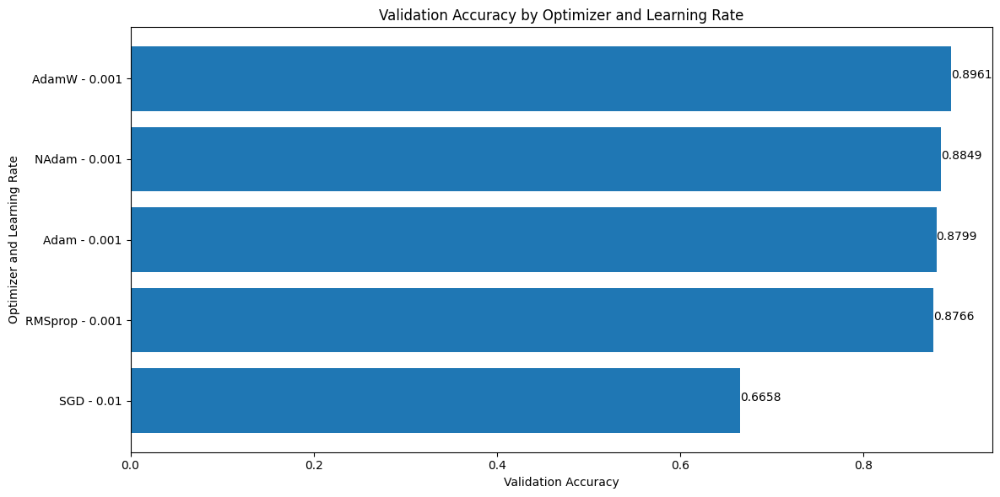

In [ ]:
# plot the results of the experiment
plot_optimizers_results(optimizers_df)

In [ ]:
# get and print best optimizer and learning rate
RL_best_optimizer_name = optimizers_df.iloc[0]['Optimizer']
RL_best_optimizer = torch.optim.__dict__[RL_best_optimizer_name]
print(f"Best optimizer: {RL_best_optimizer_name}")
RL_best_learning_rate = optimizers_df.iloc[0]['Best Learning Rate']
print(f"Best learning rate: {RL_best_learning_rate}")

Best optimizer: AdamW
Best learning rate: 0.001


Experiment 5. Try various activation functions.

In [ ]:
# experiment 5: activation functions
RL_model_act_fn_results = experiment_activation_functions(train_dataloader=train_dataloader_RL,
                                                          val_dataloader=val_dataloader_RL,
                                                          num_epochs=num_epochs,
                                                          device=device,
                                                          num_classes=num_classes,
                                                          best_hidden_units_combo=RL_best_hidden_units,
                                                          best_decay_value=RL_best_decay_value,
                                                          best_dropout_probs_combo=RL_best_dropout_probs,
                                                          best_optimizer=RL_best_optimizer,
                                                          best_learning_rate=RL_best_learning_rate)

Experimenting with Activation Functions
Activation functions to try: ['ReLU', 'LeakyReLU', 'ELU', 'GELU', 'SiLU']

Testing ReLU activation function as activation function in feature extractor...

Testing ReLU activation function as activation function in classifier...


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.2122 | train_acc: 0.1952 | val_loss: 1.9364 | val_acc: 0.3425
Epoch: 2 | train_loss: 1.9142 | train_acc: 0.3139 | val_loss: 1.6475 | val_acc: 0.3941
Epoch: 3 | train_loss: 1.7460 | train_acc: 0.3828 | val_loss: 1.4586 | val_acc: 0.4566
Epoch: 4 | train_loss: 1.6329 | train_acc: 0.4241 | val_loss: 1.3734 | val_acc: 0.4928
Epoch: 5 | train_loss: 1.5072 | train_acc: 0.4673 | val_loss: 1.1840 | val_acc: 0.6211
Epoch: 6 | train_loss: 1.4081 | train_acc: 0.5261 | val_loss: 1.0829 | val_acc: 0.6609
Epoch: 7 | train_loss: 1.2657 | train_acc: 0.5457 | val_loss: 0.9687 | val_acc: 0.6668
Epoch: 8 | train_loss: 1.2212 | train_acc: 0.5779 | val_loss: 0.9561 | val_acc: 0.6570
Epoch: 9 | train_loss: 1.1482 | train_acc: 0.5815 | val_loss: 0.8499 | val_acc: 0.6951
Epoch: 10 | train_loss: 1.0936 | train_acc: 0.5996 | val_loss: 0.7938 | val_acc: 0.7083
Epoch: 11 | train_loss: 1.0490 | train_acc: 0.6351 | val_loss: 0.7606 | val_acc: 0.7168
Epoch: 12 | train_loss: 1.0300 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.1820 | train_acc: 0.2056 | val_loss: 1.9021 | val_acc: 0.3350
Epoch: 2 | train_loss: 1.8681 | train_acc: 0.3265 | val_loss: 1.7288 | val_acc: 0.4001
Epoch: 3 | train_loss: 1.7113 | train_acc: 0.3860 | val_loss: 1.6196 | val_acc: 0.4270
Epoch: 4 | train_loss: 1.6651 | train_acc: 0.4064 | val_loss: 1.5225 | val_acc: 0.4566
Epoch: 5 | train_loss: 1.5733 | train_acc: 0.4622 | val_loss: 1.2879 | val_acc: 0.5632
Epoch: 6 | train_loss: 1.4648 | train_acc: 0.4906 | val_loss: 1.1643 | val_acc: 0.6096
Epoch: 7 | train_loss: 1.4098 | train_acc: 0.5094 | val_loss: 1.1180 | val_acc: 0.5997
Epoch: 8 | train_loss: 1.3170 | train_acc: 0.5448 | val_loss: 1.0284 | val_acc: 0.6408
Epoch: 9 | train_loss: 1.2037 | train_acc: 0.5872 | val_loss: 0.8840 | val_acc: 0.6754
Epoch: 10 | train_loss: 1.1678 | train_acc: 0.6066 | val_loss: 0.8240 | val_acc: 0.7066
Epoch: 11 | train_loss: 1.0672 | train_acc: 0.6241 | val_loss: 0.7734 | val_acc: 0.7332
Epoch: 12 | train_loss: 1.0285 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.1157 | train_acc: 0.2489 | val_loss: 1.9903 | val_acc: 0.2779
Epoch: 2 | train_loss: 1.7681 | train_acc: 0.3639 | val_loss: 1.6484 | val_acc: 0.4294
Epoch: 3 | train_loss: 1.6218 | train_acc: 0.4433 | val_loss: 1.4931 | val_acc: 0.4814
Epoch: 4 | train_loss: 1.4974 | train_acc: 0.4897 | val_loss: 1.1969 | val_acc: 0.6142
Epoch: 5 | train_loss: 1.2949 | train_acc: 0.5596 | val_loss: 0.9900 | val_acc: 0.6633
Epoch: 6 | train_loss: 1.1679 | train_acc: 0.5896 | val_loss: 0.8902 | val_acc: 0.6896
Epoch: 7 | train_loss: 1.0818 | train_acc: 0.6230 | val_loss: 0.7485 | val_acc: 0.7362
Epoch: 8 | train_loss: 1.0003 | train_acc: 0.6428 | val_loss: 0.7395 | val_acc: 0.7540
Epoch: 9 | train_loss: 0.9659 | train_acc: 0.6543 | val_loss: 0.6712 | val_acc: 0.7527
Epoch: 10 | train_loss: 0.9267 | train_acc: 0.6768 | val_loss: 0.6820 | val_acc: 0.7576
Epoch: 11 | train_loss: 0.8884 | train_acc: 0.6852 | val_loss: 0.6015 | val_acc: 0.7661
Epoch: 12 | train_loss: 0.8645 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.1248 | train_acc: 0.2343 | val_loss: 1.6631 | val_acc: 0.4010
Epoch: 2 | train_loss: 1.7705 | train_acc: 0.3808 | val_loss: 1.5102 | val_acc: 0.5043
Epoch: 3 | train_loss: 1.6252 | train_acc: 0.4353 | val_loss: 1.4094 | val_acc: 0.5487
Epoch: 4 | train_loss: 1.4878 | train_acc: 0.4895 | val_loss: 1.2884 | val_acc: 0.5813
Epoch: 5 | train_loss: 1.4530 | train_acc: 0.5022 | val_loss: 1.1811 | val_acc: 0.6241
Epoch: 6 | train_loss: 1.3526 | train_acc: 0.5284 | val_loss: 1.1293 | val_acc: 0.6178
Epoch: 7 | train_loss: 1.2616 | train_acc: 0.5622 | val_loss: 1.0088 | val_acc: 0.6625
Epoch: 8 | train_loss: 1.1862 | train_acc: 0.5913 | val_loss: 0.9814 | val_acc: 0.6625
Epoch: 9 | train_loss: 1.1325 | train_acc: 0.6060 | val_loss: 0.8318 | val_acc: 0.6935
Epoch: 10 | train_loss: 1.0952 | train_acc: 0.6246 | val_loss: 0.7912 | val_acc: 0.7184
Epoch: 11 | train_loss: 1.0349 | train_acc: 0.6275 | val_loss: 0.7766 | val_acc: 0.7247
Epoch: 12 | train_loss: 1.0299 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.1321 | train_acc: 0.2402 | val_loss: 1.7706 | val_acc: 0.3810
Epoch: 2 | train_loss: 1.7559 | train_acc: 0.3849 | val_loss: 1.4903 | val_acc: 0.5221
Epoch: 3 | train_loss: 1.5615 | train_acc: 0.4818 | val_loss: 1.4154 | val_acc: 0.5541
Epoch: 4 | train_loss: 1.3787 | train_acc: 0.5339 | val_loss: 1.0050 | val_acc: 0.6606
Epoch: 5 | train_loss: 1.2017 | train_acc: 0.5860 | val_loss: 0.8677 | val_acc: 0.7050
Epoch: 6 | train_loss: 1.1077 | train_acc: 0.6099 | val_loss: 0.8122 | val_acc: 0.7152
Epoch: 7 | train_loss: 1.0771 | train_acc: 0.6212 | val_loss: 0.7742 | val_acc: 0.7310
Epoch: 8 | train_loss: 1.0390 | train_acc: 0.6462 | val_loss: 0.7459 | val_acc: 0.7310
Epoch: 9 | train_loss: 0.9861 | train_acc: 0.6617 | val_loss: 0.7794 | val_acc: 0.7576
Epoch: 10 | train_loss: 0.9559 | train_acc: 0.6654 | val_loss: 0.7092 | val_acc: 0.7826
Epoch: 11 | train_loss: 0.9399 | train_acc: 0.6798 | val_loss: 0.7197 | val_acc: 0.7612
Epoch: 12 | train_loss: 0.9045 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.1931 | train_acc: 0.1989 | val_loss: 1.9584 | val_acc: 0.3168
Epoch: 2 | train_loss: 1.8480 | train_acc: 0.3200 | val_loss: 1.6206 | val_acc: 0.3928
Epoch: 3 | train_loss: 1.7092 | train_acc: 0.3896 | val_loss: 1.5323 | val_acc: 0.4382
Epoch: 4 | train_loss: 1.5825 | train_acc: 0.4452 | val_loss: 1.3311 | val_acc: 0.5747
Epoch: 5 | train_loss: 1.4539 | train_acc: 0.5077 | val_loss: 1.1662 | val_acc: 0.5754
Epoch: 6 | train_loss: 1.3301 | train_acc: 0.5341 | val_loss: 1.0371 | val_acc: 0.6461
Epoch: 7 | train_loss: 1.2240 | train_acc: 0.5733 | val_loss: 0.9484 | val_acc: 0.6592
Epoch: 8 | train_loss: 1.1717 | train_acc: 0.5960 | val_loss: 0.8610 | val_acc: 0.6784
Epoch: 9 | train_loss: 1.1447 | train_acc: 0.6000 | val_loss: 0.8122 | val_acc: 0.6899
Epoch: 10 | train_loss: 1.1188 | train_acc: 0.6104 | val_loss: 0.8120 | val_acc: 0.6984
Epoch: 11 | train_loss: 0.9969 | train_acc: 0.6461 | val_loss: 0.7815 | val_acc: 0.6997
Epoch: 12 | train_loss: 1.0401 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.1912 | train_acc: 0.1902 | val_loss: 1.8387 | val_acc: 0.3286
Epoch: 2 | train_loss: 1.8389 | train_acc: 0.3214 | val_loss: 1.6121 | val_acc: 0.4024
Epoch: 3 | train_loss: 1.6618 | train_acc: 0.4072 | val_loss: 1.4601 | val_acc: 0.4738
Epoch: 4 | train_loss: 1.5545 | train_acc: 0.4585 | val_loss: 1.3142 | val_acc: 0.5602
Epoch: 5 | train_loss: 1.4887 | train_acc: 0.4762 | val_loss: 1.2588 | val_acc: 0.5616
Epoch: 6 | train_loss: 1.3720 | train_acc: 0.5078 | val_loss: 1.0867 | val_acc: 0.6425
Epoch: 7 | train_loss: 1.2805 | train_acc: 0.5526 | val_loss: 0.9817 | val_acc: 0.6606
Epoch: 8 | train_loss: 1.1930 | train_acc: 0.5773 | val_loss: 0.8608 | val_acc: 0.7000
Epoch: 9 | train_loss: 1.1648 | train_acc: 0.5792 | val_loss: 0.8091 | val_acc: 0.7017
Epoch: 10 | train_loss: 1.0594 | train_acc: 0.6071 | val_loss: 0.7448 | val_acc: 0.7214
Epoch: 11 | train_loss: 1.0169 | train_acc: 0.6310 | val_loss: 0.7248 | val_acc: 0.7171
Epoch: 12 | train_loss: 1.0453 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.0930 | train_acc: 0.2552 | val_loss: 1.7604 | val_acc: 0.3662
Epoch: 2 | train_loss: 1.7714 | train_acc: 0.3674 | val_loss: 1.4804 | val_acc: 0.4942
Epoch: 3 | train_loss: 1.6254 | train_acc: 0.4541 | val_loss: 1.3289 | val_acc: 0.5336
Epoch: 4 | train_loss: 1.4539 | train_acc: 0.5060 | val_loss: 1.1124 | val_acc: 0.6498
Epoch: 5 | train_loss: 1.3246 | train_acc: 0.5477 | val_loss: 0.8967 | val_acc: 0.6784
Epoch: 6 | train_loss: 1.1515 | train_acc: 0.6104 | val_loss: 0.8269 | val_acc: 0.7050
Epoch: 7 | train_loss: 1.0756 | train_acc: 0.6406 | val_loss: 0.7648 | val_acc: 0.7326
Epoch: 8 | train_loss: 1.0137 | train_acc: 0.6510 | val_loss: 0.6927 | val_acc: 0.7546
Epoch: 9 | train_loss: 0.9484 | train_acc: 0.6701 | val_loss: 0.6272 | val_acc: 0.7730
Epoch: 10 | train_loss: 0.9296 | train_acc: 0.6796 | val_loss: 0.6008 | val_acc: 0.8010
Epoch: 11 | train_loss: 0.8624 | train_acc: 0.7050 | val_loss: 0.6007 | val_acc: 0.7809
Epoch: 12 | train_loss: 0.8680 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.1613 | train_acc: 0.2214 | val_loss: 1.8617 | val_acc: 0.3656
Epoch: 2 | train_loss: 1.8174 | train_acc: 0.3644 | val_loss: 1.5496 | val_acc: 0.4499
Epoch: 3 | train_loss: 1.6597 | train_acc: 0.4405 | val_loss: 1.4774 | val_acc: 0.5284
Epoch: 4 | train_loss: 1.4683 | train_acc: 0.5018 | val_loss: 1.1617 | val_acc: 0.6024
Epoch: 5 | train_loss: 1.3136 | train_acc: 0.5461 | val_loss: 0.9494 | val_acc: 0.6606
Epoch: 6 | train_loss: 1.1947 | train_acc: 0.5766 | val_loss: 0.8500 | val_acc: 0.6872
Epoch: 7 | train_loss: 1.1007 | train_acc: 0.6078 | val_loss: 0.7838 | val_acc: 0.6971
Epoch: 8 | train_loss: 1.0882 | train_acc: 0.6287 | val_loss: 0.7415 | val_acc: 0.7398
Epoch: 9 | train_loss: 1.0174 | train_acc: 0.6430 | val_loss: 0.7086 | val_acc: 0.7401
Epoch: 10 | train_loss: 0.9733 | train_acc: 0.6577 | val_loss: 0.6669 | val_acc: 0.7549
Epoch: 11 | train_loss: 0.9615 | train_acc: 0.6664 | val_loss: 0.6938 | val_acc: 0.7579
Epoch: 12 | train_loss: 0.9018 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.1271 | train_acc: 0.2218 | val_loss: 1.7708 | val_acc: 0.3817
Epoch: 2 | train_loss: 1.7765 | train_acc: 0.3608 | val_loss: 1.5135 | val_acc: 0.4780
Epoch: 3 | train_loss: 1.6119 | train_acc: 0.4340 | val_loss: 1.3187 | val_acc: 0.5602
Epoch: 4 | train_loss: 1.4814 | train_acc: 0.4862 | val_loss: 1.1813 | val_acc: 0.5975
Epoch: 5 | train_loss: 1.3365 | train_acc: 0.5380 | val_loss: 1.1067 | val_acc: 0.6389
Epoch: 6 | train_loss: 1.2001 | train_acc: 0.5821 | val_loss: 0.9656 | val_acc: 0.6984
Epoch: 7 | train_loss: 1.1342 | train_acc: 0.6171 | val_loss: 0.8298 | val_acc: 0.7165
Epoch: 8 | train_loss: 1.0323 | train_acc: 0.6409 | val_loss: 0.8104 | val_acc: 0.7145
Epoch: 9 | train_loss: 0.9983 | train_acc: 0.6553 | val_loss: 0.8441 | val_acc: 0.6984
Epoch: 10 | train_loss: 1.0063 | train_acc: 0.6483 | val_loss: 0.7415 | val_acc: 0.7464
Epoch: 11 | train_loss: 0.9503 | train_acc: 0.6647 | val_loss: 0.6965 | val_acc: 0.7694
Epoch: 12 | train_loss: 0.8876 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.0010 | train_acc: 0.2703 | val_loss: 1.2932 | val_acc: 0.5622
Epoch: 2 | train_loss: 1.4302 | train_acc: 0.4957 | val_loss: 0.8278 | val_acc: 0.7253
Epoch: 3 | train_loss: 1.1506 | train_acc: 0.5967 | val_loss: 0.6700 | val_acc: 0.7500
Epoch: 4 | train_loss: 1.0232 | train_acc: 0.6383 | val_loss: 0.5919 | val_acc: 0.8026
Epoch: 5 | train_loss: 0.9628 | train_acc: 0.6592 | val_loss: 0.5550 | val_acc: 0.7944
Epoch: 6 | train_loss: 0.8630 | train_acc: 0.7006 | val_loss: 0.4575 | val_acc: 0.8421
Epoch: 7 | train_loss: 0.8670 | train_acc: 0.7013 | val_loss: 0.5242 | val_acc: 0.8040
Epoch: 8 | train_loss: 0.8242 | train_acc: 0.7073 | val_loss: 0.4112 | val_acc: 0.8717
Epoch: 9 | train_loss: 0.7829 | train_acc: 0.7245 | val_loss: 0.3760 | val_acc: 0.8862
Epoch: 10 | train_loss: 0.7804 | train_acc: 0.7135 | val_loss: 0.3674 | val_acc: 0.8947
Epoch: 11 | train_loss: 0.7700 | train_acc: 0.7300 | val_loss: 0.3333 | val_acc: 0.8865
Epoch: 12 | train_loss: 0.7589 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.0549 | train_acc: 0.2733 | val_loss: 1.2901 | val_acc: 0.5671
Epoch: 2 | train_loss: 1.3947 | train_acc: 0.5086 | val_loss: 0.8008 | val_acc: 0.7365
Epoch: 3 | train_loss: 1.1233 | train_acc: 0.5977 | val_loss: 0.6461 | val_acc: 0.7747
Epoch: 4 | train_loss: 1.0140 | train_acc: 0.6443 | val_loss: 0.5776 | val_acc: 0.8076
Epoch: 5 | train_loss: 0.9380 | train_acc: 0.6673 | val_loss: 0.5148 | val_acc: 0.8289
Epoch: 6 | train_loss: 0.9236 | train_acc: 0.6813 | val_loss: 0.4937 | val_acc: 0.8319
Epoch: 7 | train_loss: 0.8540 | train_acc: 0.6980 | val_loss: 0.4317 | val_acc: 0.8684
Epoch: 8 | train_loss: 0.8566 | train_acc: 0.7018 | val_loss: 0.4321 | val_acc: 0.8651
Epoch: 9 | train_loss: 0.7539 | train_acc: 0.7457 | val_loss: 0.3664 | val_acc: 0.8635
Epoch: 10 | train_loss: 0.7785 | train_acc: 0.7462 | val_loss: 0.3799 | val_acc: 0.8914
Epoch: 11 | train_loss: 0.7451 | train_acc: 0.7438 | val_loss: 0.3734 | val_acc: 0.8763
Epoch: 12 | train_loss: 0.6937 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.9178 | train_acc: 0.3267 | val_loss: 1.1739 | val_acc: 0.6112
Epoch: 2 | train_loss: 1.2820 | train_acc: 0.5492 | val_loss: 0.7428 | val_acc: 0.7549
Epoch: 3 | train_loss: 1.0273 | train_acc: 0.6430 | val_loss: 0.5833 | val_acc: 0.8092
Epoch: 4 | train_loss: 0.8803 | train_acc: 0.7043 | val_loss: 0.5410 | val_acc: 0.8053
Epoch: 5 | train_loss: 0.8464 | train_acc: 0.7053 | val_loss: 0.4252 | val_acc: 0.8602
Epoch: 6 | train_loss: 0.7645 | train_acc: 0.7433 | val_loss: 0.4409 | val_acc: 0.8355
Epoch: 7 | train_loss: 0.7346 | train_acc: 0.7438 | val_loss: 0.3809 | val_acc: 0.8717
Epoch: 8 | train_loss: 0.6637 | train_acc: 0.7727 | val_loss: 0.3004 | val_acc: 0.9128
Epoch: 9 | train_loss: 0.6671 | train_acc: 0.7757 | val_loss: 0.3018 | val_acc: 0.9109
Epoch: 10 | train_loss: 0.6589 | train_acc: 0.7741 | val_loss: 0.2897 | val_acc: 0.9145
Epoch: 11 | train_loss: 0.6457 | train_acc: 0.7890 | val_loss: 0.2746 | val_acc: 0.9046
Epoch: 12 | train_loss: 0.6269 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.0112 | train_acc: 0.2772 | val_loss: 1.3855 | val_acc: 0.6136
Epoch: 2 | train_loss: 1.3977 | train_acc: 0.5170 | val_loss: 0.8446 | val_acc: 0.6809
Epoch: 3 | train_loss: 1.1641 | train_acc: 0.5904 | val_loss: 0.6559 | val_acc: 0.7812
Epoch: 4 | train_loss: 0.9819 | train_acc: 0.6625 | val_loss: 0.5720 | val_acc: 0.7939
Epoch: 5 | train_loss: 0.9549 | train_acc: 0.6699 | val_loss: 0.5257 | val_acc: 0.8076
Epoch: 6 | train_loss: 0.8889 | train_acc: 0.6936 | val_loss: 0.4527 | val_acc: 0.8454
Epoch: 7 | train_loss: 0.8424 | train_acc: 0.7175 | val_loss: 0.4505 | val_acc: 0.8418
Epoch: 8 | train_loss: 0.8402 | train_acc: 0.7206 | val_loss: 0.3984 | val_acc: 0.8569
Epoch: 9 | train_loss: 0.7961 | train_acc: 0.7153 | val_loss: 0.3934 | val_acc: 0.8569
Epoch: 10 | train_loss: 0.7305 | train_acc: 0.7436 | val_loss: 0.3671 | val_acc: 0.8651
Epoch: 11 | train_loss: 0.7340 | train_acc: 0.7489 | val_loss: 0.3282 | val_acc: 0.8997
Epoch: 12 | train_loss: 0.6994 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.8890 | train_acc: 0.3343 | val_loss: 1.1377 | val_acc: 0.6148
Epoch: 2 | train_loss: 1.2676 | train_acc: 0.5592 | val_loss: 0.6858 | val_acc: 0.7747
Epoch: 3 | train_loss: 1.0230 | train_acc: 0.6428 | val_loss: 0.5948 | val_acc: 0.8125
Epoch: 4 | train_loss: 0.9248 | train_acc: 0.6738 | val_loss: 0.5325 | val_acc: 0.8257
Epoch: 5 | train_loss: 0.8784 | train_acc: 0.6918 | val_loss: 0.4621 | val_acc: 0.8388
Epoch: 6 | train_loss: 0.8053 | train_acc: 0.7179 | val_loss: 0.4188 | val_acc: 0.8500
Epoch: 7 | train_loss: 0.7777 | train_acc: 0.7327 | val_loss: 0.3799 | val_acc: 0.8763
Epoch: 8 | train_loss: 0.7354 | train_acc: 0.7456 | val_loss: 0.3423 | val_acc: 0.8684
Epoch: 9 | train_loss: 0.7537 | train_acc: 0.7449 | val_loss: 0.3595 | val_acc: 0.8875
Epoch: 10 | train_loss: 0.6916 | train_acc: 0.7571 | val_loss: 0.3272 | val_acc: 0.9013
Epoch: 11 | train_loss: 0.7231 | train_acc: 0.7604 | val_loss: 0.3191 | val_acc: 0.9062
Epoch: 12 | train_loss: 0.6426 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.0605 | train_acc: 0.2667 | val_loss: 1.6921 | val_acc: 0.4050
Epoch: 2 | train_loss: 1.5897 | train_acc: 0.4476 | val_loss: 1.1990 | val_acc: 0.6221
Epoch: 3 | train_loss: 1.2346 | train_acc: 0.5779 | val_loss: 1.0653 | val_acc: 0.6188
Epoch: 4 | train_loss: 1.0956 | train_acc: 0.6210 | val_loss: 0.8863 | val_acc: 0.6935
Epoch: 5 | train_loss: 0.9853 | train_acc: 0.6467 | val_loss: 0.7126 | val_acc: 0.7379
Epoch: 6 | train_loss: 0.9094 | train_acc: 0.6717 | val_loss: 0.6483 | val_acc: 0.7853
Epoch: 7 | train_loss: 0.8898 | train_acc: 0.6904 | val_loss: 0.7051 | val_acc: 0.7323
Epoch: 8 | train_loss: 0.8491 | train_acc: 0.6908 | val_loss: 0.6200 | val_acc: 0.7597
Epoch: 9 | train_loss: 0.8154 | train_acc: 0.7178 | val_loss: 0.5813 | val_acc: 0.7718
Epoch: 10 | train_loss: 0.8190 | train_acc: 0.7169 | val_loss: 0.4962 | val_acc: 0.8451
Epoch: 11 | train_loss: 0.7693 | train_acc: 0.7432 | val_loss: 0.4564 | val_acc: 0.8286
Epoch: 12 | train_loss: 0.7177 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.0320 | train_acc: 0.2445 | val_loss: 1.6352 | val_acc: 0.4974
Epoch: 2 | train_loss: 1.6613 | train_acc: 0.4292 | val_loss: 1.2344 | val_acc: 0.5899
Epoch: 3 | train_loss: 1.4017 | train_acc: 0.5148 | val_loss: 1.0843 | val_acc: 0.6449
Epoch: 4 | train_loss: 1.1818 | train_acc: 0.5810 | val_loss: 0.9820 | val_acc: 0.6721
Epoch: 5 | train_loss: 1.0930 | train_acc: 0.6185 | val_loss: 0.8399 | val_acc: 0.6965
Epoch: 6 | train_loss: 0.9813 | train_acc: 0.6491 | val_loss: 0.7244 | val_acc: 0.7481
Epoch: 7 | train_loss: 0.9393 | train_acc: 0.6590 | val_loss: 0.6940 | val_acc: 0.7527
Epoch: 8 | train_loss: 0.9202 | train_acc: 0.6755 | val_loss: 0.8179 | val_acc: 0.7114
Epoch: 9 | train_loss: 0.8582 | train_acc: 0.7003 | val_loss: 0.6272 | val_acc: 0.7678
Epoch: 10 | train_loss: 0.8204 | train_acc: 0.7002 | val_loss: 0.6823 | val_acc: 0.7587
Epoch: 11 | train_loss: 0.8020 | train_acc: 0.7274 | val_loss: 0.5603 | val_acc: 0.7935
Epoch: 12 | train_loss: 0.7574 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.9799 | train_acc: 0.2937 | val_loss: 1.6070 | val_acc: 0.4517
Epoch: 2 | train_loss: 1.5319 | train_acc: 0.4747 | val_loss: 1.1725 | val_acc: 0.6359
Epoch: 3 | train_loss: 1.2775 | train_acc: 0.5628 | val_loss: 1.1458 | val_acc: 0.6097
Epoch: 4 | train_loss: 1.1014 | train_acc: 0.6152 | val_loss: 0.9485 | val_acc: 0.6695
Epoch: 5 | train_loss: 0.9905 | train_acc: 0.6501 | val_loss: 0.7472 | val_acc: 0.7165
Epoch: 6 | train_loss: 0.8922 | train_acc: 0.6872 | val_loss: 0.6109 | val_acc: 0.7741
Epoch: 7 | train_loss: 0.8165 | train_acc: 0.7116 | val_loss: 0.5749 | val_acc: 0.7892
Epoch: 8 | train_loss: 0.8095 | train_acc: 0.7151 | val_loss: 0.5444 | val_acc: 0.8182
Epoch: 9 | train_loss: 0.7577 | train_acc: 0.7300 | val_loss: 0.4805 | val_acc: 0.8418
Epoch: 10 | train_loss: 0.7053 | train_acc: 0.7485 | val_loss: 0.4474 | val_acc: 0.8467
Epoch: 11 | train_loss: 0.6685 | train_acc: 0.7629 | val_loss: 0.4029 | val_acc: 0.8648
Epoch: 12 | train_loss: 0.6628 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.0328 | train_acc: 0.2611 | val_loss: 1.6736 | val_acc: 0.3962
Epoch: 2 | train_loss: 1.7058 | train_acc: 0.3799 | val_loss: 1.4057 | val_acc: 0.5531
Epoch: 3 | train_loss: 1.4228 | train_acc: 0.5056 | val_loss: 1.0808 | val_acc: 0.6290
Epoch: 4 | train_loss: 1.1988 | train_acc: 0.5839 | val_loss: 0.9782 | val_acc: 0.6715
Epoch: 5 | train_loss: 1.0643 | train_acc: 0.6177 | val_loss: 0.7602 | val_acc: 0.7231
Epoch: 6 | train_loss: 1.0072 | train_acc: 0.6421 | val_loss: 0.7064 | val_acc: 0.7491
Epoch: 7 | train_loss: 0.9130 | train_acc: 0.6726 | val_loss: 0.9582 | val_acc: 0.6643
Epoch: 8 | train_loss: 0.9002 | train_acc: 0.6861 | val_loss: 0.7032 | val_acc: 0.7359
Epoch: 9 | train_loss: 0.8469 | train_acc: 0.6974 | val_loss: 0.6363 | val_acc: 0.7597
Epoch: 10 | train_loss: 0.7951 | train_acc: 0.7231 | val_loss: 0.5985 | val_acc: 0.7724
Epoch: 11 | train_loss: 0.7821 | train_acc: 0.7251 | val_loss: 0.5782 | val_acc: 0.7666
Epoch: 12 | train_loss: 0.7706 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.0136 | train_acc: 0.2694 | val_loss: 1.5999 | val_acc: 0.3875
Epoch: 2 | train_loss: 1.6246 | train_acc: 0.4431 | val_loss: 1.2057 | val_acc: 0.6326
Epoch: 3 | train_loss: 1.3832 | train_acc: 0.5394 | val_loss: 1.1408 | val_acc: 0.6254
Epoch: 4 | train_loss: 1.2051 | train_acc: 0.5841 | val_loss: 1.0118 | val_acc: 0.6430
Epoch: 5 | train_loss: 1.0570 | train_acc: 0.6273 | val_loss: 0.8225 | val_acc: 0.7050
Epoch: 6 | train_loss: 0.9753 | train_acc: 0.6626 | val_loss: 0.9222 | val_acc: 0.6650
Epoch: 7 | train_loss: 0.8813 | train_acc: 0.6759 | val_loss: 0.8613 | val_acc: 0.7024
Epoch: 8 | train_loss: 0.8489 | train_acc: 0.7024 | val_loss: 0.5852 | val_acc: 0.7990
Epoch: 9 | train_loss: 0.8396 | train_acc: 0.7046 | val_loss: 0.6218 | val_acc: 0.7658
Epoch: 10 | train_loss: 0.7883 | train_acc: 0.7380 | val_loss: 0.5270 | val_acc: 0.8023
Epoch: 11 | train_loss: 0.7694 | train_acc: 0.7227 | val_loss: 0.5246 | val_acc: 0.8060
Epoch: 12 | train_loss: 0.7571 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.0542 | train_acc: 0.2721 | val_loss: 1.7148 | val_acc: 0.3941
Epoch: 2 | train_loss: 1.6663 | train_acc: 0.3983 | val_loss: 1.3368 | val_acc: 0.5819
Epoch: 3 | train_loss: 1.3803 | train_acc: 0.5207 | val_loss: 1.0356 | val_acc: 0.6422
Epoch: 4 | train_loss: 1.1877 | train_acc: 0.5860 | val_loss: 0.9166 | val_acc: 0.6637
Epoch: 5 | train_loss: 1.0591 | train_acc: 0.6090 | val_loss: 0.7601 | val_acc: 0.7217
Epoch: 6 | train_loss: 0.9627 | train_acc: 0.6562 | val_loss: 0.6435 | val_acc: 0.7491
Epoch: 7 | train_loss: 0.9059 | train_acc: 0.6820 | val_loss: 0.6156 | val_acc: 0.7724
Epoch: 8 | train_loss: 0.8685 | train_acc: 0.6973 | val_loss: 0.5439 | val_acc: 0.8152
Epoch: 9 | train_loss: 0.8265 | train_acc: 0.7068 | val_loss: 0.4791 | val_acc: 0.8470
Epoch: 10 | train_loss: 0.7755 | train_acc: 0.7324 | val_loss: 0.4544 | val_acc: 0.8237
Epoch: 11 | train_loss: 0.7481 | train_acc: 0.7296 | val_loss: 0.4277 | val_acc: 0.8536
Epoch: 12 | train_loss: 0.7144 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.0370 | train_acc: 0.2676 | val_loss: 1.6014 | val_acc: 0.4089
Epoch: 2 | train_loss: 1.6409 | train_acc: 0.4265 | val_loss: 1.2019 | val_acc: 0.6063
Epoch: 3 | train_loss: 1.3169 | train_acc: 0.5444 | val_loss: 0.9382 | val_acc: 0.6672
Epoch: 4 | train_loss: 1.1357 | train_acc: 0.6057 | val_loss: 0.7583 | val_acc: 0.7168
Epoch: 5 | train_loss: 1.0405 | train_acc: 0.6314 | val_loss: 0.6192 | val_acc: 0.7842
Epoch: 6 | train_loss: 0.8965 | train_acc: 0.6792 | val_loss: 0.5716 | val_acc: 0.7925
Epoch: 7 | train_loss: 0.8536 | train_acc: 0.6955 | val_loss: 0.5526 | val_acc: 0.7826
Epoch: 8 | train_loss: 0.8061 | train_acc: 0.7195 | val_loss: 0.4738 | val_acc: 0.8635
Epoch: 9 | train_loss: 0.8059 | train_acc: 0.7128 | val_loss: 0.4837 | val_acc: 0.8237
Epoch: 10 | train_loss: 0.7634 | train_acc: 0.7322 | val_loss: 0.4180 | val_acc: 0.8586
Epoch: 11 | train_loss: 0.7341 | train_acc: 0.7446 | val_loss: 0.4044 | val_acc: 0.8615
Epoch: 12 | train_loss: 0.7311 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.9470 | train_acc: 0.2856 | val_loss: 1.5423 | val_acc: 0.4586
Epoch: 2 | train_loss: 1.5892 | train_acc: 0.4320 | val_loss: 1.1029 | val_acc: 0.6609
Epoch: 3 | train_loss: 1.2497 | train_acc: 0.5831 | val_loss: 0.8677 | val_acc: 0.6968
Epoch: 4 | train_loss: 1.0590 | train_acc: 0.6273 | val_loss: 0.7051 | val_acc: 0.7398
Epoch: 5 | train_loss: 0.9150 | train_acc: 0.6757 | val_loss: 0.5771 | val_acc: 0.7941
Epoch: 6 | train_loss: 0.8548 | train_acc: 0.7034 | val_loss: 0.5075 | val_acc: 0.8109
Epoch: 7 | train_loss: 0.7941 | train_acc: 0.7201 | val_loss: 0.4801 | val_acc: 0.8237
Epoch: 8 | train_loss: 0.7536 | train_acc: 0.7415 | val_loss: 0.4425 | val_acc: 0.8517
Epoch: 9 | train_loss: 0.7128 | train_acc: 0.7526 | val_loss: 0.5269 | val_acc: 0.8031
Epoch: 10 | train_loss: 0.6608 | train_acc: 0.7711 | val_loss: 0.4115 | val_acc: 0.8727
Epoch: 11 | train_loss: 0.6563 | train_acc: 0.7716 | val_loss: 0.3975 | val_acc: 0.8596
Epoch: 12 | train_loss: 0.6456 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.0146 | train_acc: 0.2750 | val_loss: 1.6552 | val_acc: 0.3952
Epoch: 2 | train_loss: 1.6269 | train_acc: 0.4373 | val_loss: 1.1936 | val_acc: 0.6112
Epoch: 3 | train_loss: 1.2376 | train_acc: 0.5743 | val_loss: 0.9297 | val_acc: 0.6770
Epoch: 4 | train_loss: 1.0721 | train_acc: 0.6222 | val_loss: 0.7519 | val_acc: 0.7280
Epoch: 5 | train_loss: 0.9482 | train_acc: 0.6623 | val_loss: 0.6571 | val_acc: 0.7543
Epoch: 6 | train_loss: 0.8733 | train_acc: 0.6872 | val_loss: 0.5759 | val_acc: 0.7971
Epoch: 7 | train_loss: 0.8578 | train_acc: 0.6960 | val_loss: 0.5783 | val_acc: 0.7889
Epoch: 8 | train_loss: 0.8162 | train_acc: 0.7003 | val_loss: 0.4818 | val_acc: 0.8352
Epoch: 9 | train_loss: 0.7856 | train_acc: 0.7283 | val_loss: 0.4778 | val_acc: 0.8563
Epoch: 10 | train_loss: 0.7676 | train_acc: 0.7301 | val_loss: 0.4667 | val_acc: 0.8527
Epoch: 11 | train_loss: 0.6920 | train_acc: 0.7538 | val_loss: 0.3892 | val_acc: 0.8681
Epoch: 12 | train_loss: 0.6846 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.0302 | train_acc: 0.2740 | val_loss: 1.8794 | val_acc: 0.3002
Epoch: 2 | train_loss: 1.6674 | train_acc: 0.4223 | val_loss: 1.3183 | val_acc: 0.6145
Epoch: 3 | train_loss: 1.3237 | train_acc: 0.5571 | val_loss: 0.8705 | val_acc: 0.6790
Epoch: 4 | train_loss: 1.0790 | train_acc: 0.6260 | val_loss: 0.7563 | val_acc: 0.7464
Epoch: 5 | train_loss: 0.9970 | train_acc: 0.6507 | val_loss: 0.6774 | val_acc: 0.7678
Epoch: 6 | train_loss: 0.8979 | train_acc: 0.6835 | val_loss: 0.6206 | val_acc: 0.7642
Epoch: 7 | train_loss: 0.8535 | train_acc: 0.7092 | val_loss: 0.5289 | val_acc: 0.8056
Epoch: 8 | train_loss: 0.7995 | train_acc: 0.7160 | val_loss: 0.4926 | val_acc: 0.8135
Epoch: 9 | train_loss: 0.7409 | train_acc: 0.7366 | val_loss: 0.4573 | val_acc: 0.8254
Epoch: 10 | train_loss: 0.7288 | train_acc: 0.7547 | val_loss: 0.4121 | val_acc: 0.8517
Epoch: 11 | train_loss: 0.7149 | train_acc: 0.7469 | val_loss: 0.4121 | val_acc: 0.8418
Epoch: 12 | train_loss: 0.6728 | train_ac

In [ ]:
# put all the results in a table and print it
activation_df = pd.DataFrame(RL_model_act_fn_results, columns=['Activation Function 1', 'Activation Function 2', 'Validation Accuracy'])
activation_df = activation_df.sort_values(by='Validation Accuracy', ascending=False)[:10]
print("\n", activation_df.to_string(index=False))


 Activation Function 1 Activation Function 2  Validation Accuracy
                  ELU                  SiLU             0.968750
                 SiLU                  SiLU             0.958882
                  ELU                  GELU             0.950658
                  ELU                  ReLU             0.950658
                 SiLU                  ReLU             0.949013
                 SiLU                   ELU             0.949013
                  ELU                   ELU             0.944079
                 GELU                   ELU             0.942434
                  ELU             LeakyReLU             0.939145
                 SiLU                  GELU             0.937500


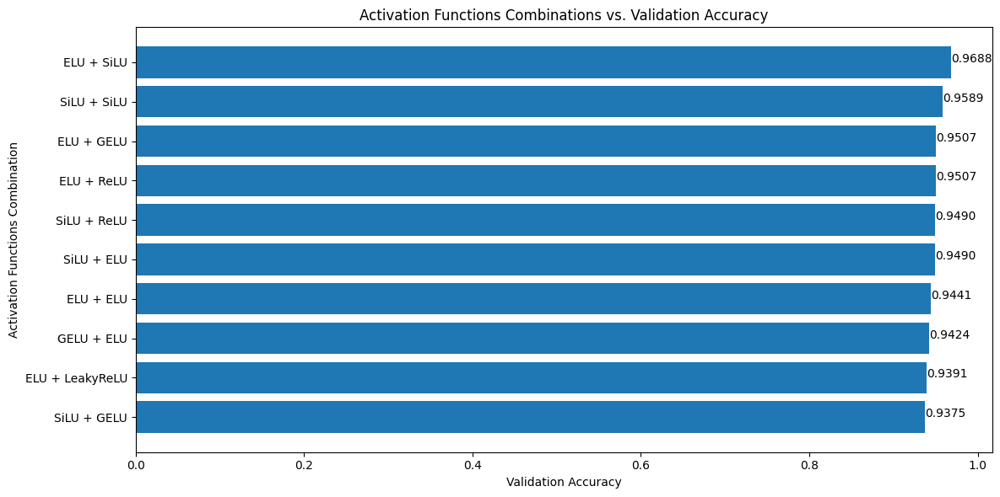

In [ ]:
# plot the results of activation functions experiment
plot_activation_function_results(activation_df)

In [ ]:
# print best performing activation functions combo
RL_best_activation_functions_names = activation_df.iloc[0]['Activation Function 1'], activation_df.iloc[0]['Activation Function 2']
print(f"Best activation functions: {RL_best_activation_functions_names}")

# convert string names to actual nn modules using getattr
RL_best_activation_functions = [getattr(nn, name)() for name in RL_best_activation_functions_names]

Best activation functions: ('ELU', 'SiLU')


We put all the best hyperparameters found above into a dictionary, which is used to train a new model for RL / M dataset case.


In [ ]:
# best configuration in a dictionary
RL_best_config = {
    'model': 'CNN_v2',
    'loss_fn': nn.CrossEntropyLoss(),
    'best_decay_value': RL_best_decay_value,
    'best_dropout_probs_combo': RL_best_dropout_probs,
    'best_hidden_units_combo': RL_best_hidden_units,
    'best_optimizer': RL_best_optimizer,
    'best_learning_rate': RL_best_learning_rate,
    'best_activation_functions': RL_best_activation_functions,
    'best_batch_size': batch_size,
    'epochs': num_epochs
}

In [ ]:
# put it all together

# create a model
RL_model_1 = CNN_v2(out_features=num_classes, hidden_units=RL_best_hidden_units, dropout_probs=RL_best_dropout_probs, activation_functions=RL_best_activation_functions).to(device)

# set loss function and optimizer
loss_fn = nn.CrossEntropyLoss()
optimizer = RL_best_optimizer(params=RL_model_1.parameters(), lr=RL_best_learning_rate, weight_decay=RL_best_decay_value)

# start training
print("Starting training...")
start_time = time.time()
RL_model_1_results = train(model=RL_model_1,
                           train_dataloader=train_dataloader_RL,
                           test_dataloader=val_dataloader_RL,
                           optimizer=optimizer,
                           loss_fn=loss_fn,
                           epochs=num_epochs,
                           device=device)
end_time = time.time()

# calculate and print total training time
RL_model_1_training_time = end_time - start_time
print(f"\nTotal training time: {RL_model_1_training_time:.3f} seconds")

# calculate and print total trainabale params
RL_model_1_total_params = sum(p.numel() for p in RL_model_1.parameters() if p.requires_grad)
print(f"Total trainable params: {RL_model_1_total_params}")

Starting training...


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.9517 | train_acc: 0.3345 | val_loss: 1.3456 | val_acc: 0.5902
Epoch: 2 | train_loss: 1.3795 | train_acc: 0.5334 | val_loss: 0.8280 | val_acc: 0.7105
Epoch: 3 | train_loss: 1.1028 | train_acc: 0.6171 | val_loss: 0.6776 | val_acc: 0.7434
Epoch: 4 | train_loss: 0.9800 | train_acc: 0.6630 | val_loss: 0.5681 | val_acc: 0.7829
Epoch: 5 | train_loss: 0.9058 | train_acc: 0.6912 | val_loss: 0.4975 | val_acc: 0.8339
Epoch: 6 | train_loss: 0.8177 | train_acc: 0.7177 | val_loss: 0.4413 | val_acc: 0.8454
Epoch: 7 | train_loss: 0.8215 | train_acc: 0.7237 | val_loss: 0.4379 | val_acc: 0.8536
Epoch: 8 | train_loss: 0.7701 | train_acc: 0.7326 | val_loss: 0.3962 | val_acc: 0.8602
Epoch: 9 | train_loss: 0.7211 | train_acc: 0.7445 | val_loss: 0.3716 | val_acc: 0.8717
Epoch: 10 | train_loss: 0.7158 | train_acc: 0.7572 | val_loss: 0.3397 | val_acc: 0.8882
Epoch: 11 | train_loss: 0.6908 | train_acc: 0.7652 | val_loss: 0.3421 | val_acc: 0.8766
Epoch: 12 | train_loss: 0.6761 | train_ac

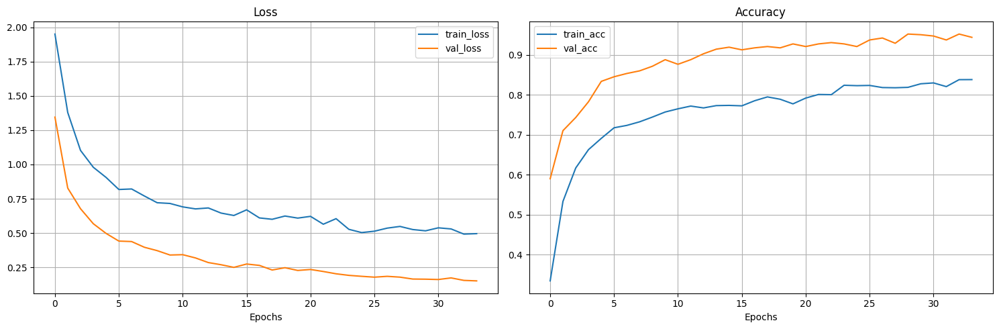

In [ ]:
# plot loss curves
plot_loss_curves(RL_model_1_results)

Obviously, an improvement in validation accuracy compared to the baseline model is observed, as expected. Let's save the model and move forward to the next experiments, evaluating first its performance using precision, recall and the confusion matrix.


In [ ]:
# print final model's val accuracy
RL_model_1_acc = RL_model_1_results['val_acc'][-1]
print(f"Final model accuracy: {RL_model_1_acc}")

# save the RL final model 1 with best configuration found
torch.save(RL_model_1.state_dict(), os.path.join(project_models_path, 'RL_model_1.pth'))
print("Model saved to 'RL_model_1.pth'")

Final model accuracy: 0.944078947368421
Model saved to 'RL_model_1.pth'


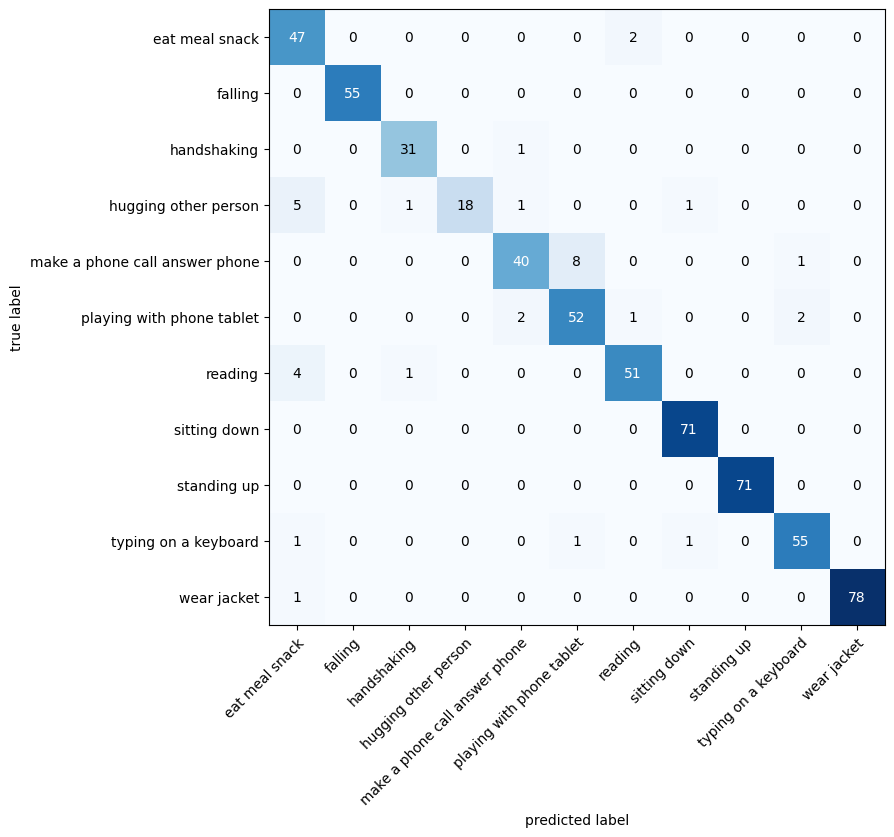

In [ ]:
# evaluation with torchmetrics

# retrieve actual and predicted labels and convert them to tensors for later process
RL_model_1_y_true = torch.tensor(RL_model_1_results['y_true'])
RL_model_1_y_pred = torch.tensor(RL_model_1_results['y_preds'])

# setup confusion matrix instance and compare predictions to targets
confmat = ConfusionMatrix(num_classes=len(class_names), task='multiclass')
confmat_tensor = confmat(RL_model_1_y_pred.clone().detach(), RL_model_1_y_true.clone().detach())

# plot the confusion matrix
fig, ax = plot_confusion_matrix(conf_mat=confmat_tensor.numpy(), class_names=class_names, figsize=(20,8));

In [ ]:
# calculate precision, recall and F1 scores using torchmetrics
precision = Precision(average='macro', num_classes=len(class_names), task='multiclass')
recall = Recall(average='macro', num_classes=len(class_names), task='multiclass')
f1 = F1Score(average='macro', num_classes=len(class_names), task='multiclass')

prec = precision(RL_model_1_y_pred, RL_model_1_y_true)
rec = recall(RL_model_1_y_pred, RL_model_1_y_true)
f1_score = f1(RL_model_1_y_pred, RL_model_1_y_true)

# print the results
print(f"Precision: {prec:.4f}\nRecall: {rec:.4f}\nF1-Score: {f1_score:.4f}")

Precision: 0.9433
Recall: 0.9268
F1-Score: 0.9316


In [ ]:
# classification report
print("Classification Report:")
print(classification_report(y_true=RL_model_1_y_true, y_pred=RL_model_1_y_pred, zero_division=1))

Classification Report:
              precision    recall  f1-score   support

           0       0.81      0.96      0.88        49
           1       1.00      1.00      1.00        55
           2       0.94      0.97      0.95        32
           3       1.00      0.69      0.82        26
           4       0.91      0.82      0.86        49
           5       0.85      0.91      0.88        57
           6       0.94      0.91      0.93        56
           7       0.97      1.00      0.99        71
           8       1.00      1.00      1.00        71
           9       0.95      0.95      0.95        58
          10       1.00      0.99      0.99        79

    accuracy                           0.94       603
   macro avg       0.94      0.93      0.93       603
weighted avg       0.95      0.94      0.94       603



All precision, recall, and F1 scores are relatively high, but not at the same levels comparable to previous combined dataset examples. Recall is slightly lower than precision. This might be caused to the fact that, in this case, we are using images from the right and left cameras, where the differences are more pronounced than those observed in the center-left and center-right camera cases.

Experiment 6. Apply Cross-Validation.

Once again, we combine the training and validation datasets into a single set to apply cross-validation.

In [ ]:
# experiment 6: cross validation (1)

# combine train and validation sets

# define paths
source_dirs_RL = ['/content/project/data/ResActionsImagesRL/train', '/content/project/data/ResActionsImagesRL/validation']
destination_dir_RL = '/content/project/data/ResActionsImagesRL/train_val_combined'

# create the destination directory if it doesn't exist
if not os.path.exists(destination_dir_RL):
  os.makedirs(destination_dir_RL)

# loop over all source dirs (train, validation) in ResActionsImagesRL
for source_dir in source_dirs_RL:
  # loop over all class dirs
  for class_dir in os.listdir(source_dir):

    # existing class path, we will use it for copying
    class_path = os.path.join(source_dir, class_dir)

    # create class dir in destination dir if doesn't exist (this goes in case of multiple runs)
    dest_class_path = os.path.join(destination_dir_RL, class_dir)
    if not os.path.exists(dest_class_path):
      os.makedirs(dest_class_path)

    # copy all files (images) from the current class of the current source
    for file in os.listdir(class_path):
      shutil.copy(os.path.join(class_path, file), os.path.join(dest_class_path, file))

# check how many dirs in the new dir (expected num_classes=11)
print(f"Total number of folders of the new dir: {len(os.listdir(destination_dir_RL))}")

# find and print how many images in total the new 'train_val_combined' dir has (expected the sum of initial train and validation dirs: (1201 + 150) * 2 = 2702)
train_val_total_images_RL = 0
for class_dir in os.listdir(destination_dir_RL):
  class_path = os.path.join(destination_dir_RL, class_dir)
  train_val_total_images_RL += len(os.listdir(class_path))
print(f"Total number of images of the new dir: {train_val_total_images_RL}")

Total number of folders of the new dir: 11
Total number of images of the new dir: 3004


In [ ]:
# experiment 6: cross validation (2)

# create the new dataset using ImageFolder
RL_cross_val_dataset = ImageFolder(root=destination_dir_RL, transform=data_transform_RL)

# retrieve best pre-trained weights from model_1
RL_model_1_weights = RL_model_1.state_dict()

# run the experiment
RL_cv_results = cross_validation(dataset=RL_cross_val_dataset,
                                 num_epochs=num_epochs,
                                 device=device,
                                 num_classes=num_classes,
                                 num_folds=num_folds,
                                 best_config=RL_best_config,
                                 num_workers=num_workers,
                                 load_weights=True,
                                 best_weights=RL_model_1_weights)

Cross-Validation training ...
Dataset size: 3004
Number of folds: 6
Fold size: 500

Fold 1/6
Loading best weights ...


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.5508 | train_acc: 0.8267 | val_loss: 0.1598 | val_acc: 0.9505
Epoch: 2 | train_loss: 0.5258 | train_acc: 0.8331 | val_loss: 0.1512 | val_acc: 0.9583
Epoch: 3 | train_loss: 0.4673 | train_acc: 0.8398 | val_loss: 0.1608 | val_acc: 0.9479
Epoch: 4 | train_loss: 0.5015 | train_acc: 0.8295 | val_loss: 0.1619 | val_acc: 0.9460
Epoch: 5 | train_loss: 0.4506 | train_acc: 0.8465 | val_loss: 0.1592 | val_acc: 0.9486
Epoch: 6 | train_loss: 0.4421 | train_acc: 0.8449 | val_loss: 0.1790 | val_acc: 0.9440
Epoch: 7 | train_loss: 0.4658 | train_acc: 0.8501 | val_loss: 0.1811 | val_acc: 0.9382
Epoch: 8 | train_loss: 0.4862 | train_acc: 0.8350 | val_loss: 0.1751 | val_acc: 0.9460
Epoch: 9 | train_loss: 0.4872 | train_acc: 0.8358 | val_loss: 0.1733 | val_acc: 0.9382
Epoch: 10 | train_loss: 0.4811 | train_acc: 0.8438 | val_loss: 0.1688 | val_acc: 0.9460
Epoch: 11 | train_loss: 0.4550 | train_acc: 0.8410 | val_loss: 0.1917 | val_acc: 0.9297
Epoch: 12 | train_loss: 0.4313 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.5028 | train_acc: 0.8287 | val_loss: 0.1635 | val_acc: 0.9453
Epoch: 2 | train_loss: 0.5096 | train_acc: 0.8386 | val_loss: 0.1582 | val_acc: 0.9473
Epoch: 3 | train_loss: 0.4990 | train_acc: 0.8347 | val_loss: 0.1674 | val_acc: 0.9434
Epoch: 4 | train_loss: 0.4635 | train_acc: 0.8386 | val_loss: 0.1892 | val_acc: 0.9427
Epoch: 5 | train_loss: 0.4863 | train_acc: 0.8374 | val_loss: 0.1779 | val_acc: 0.9316
Epoch: 6 | train_loss: 0.4876 | train_acc: 0.8426 | val_loss: 0.1754 | val_acc: 0.9375
Epoch: 7 | train_loss: 0.4640 | train_acc: 0.8501 | val_loss: 0.2289 | val_acc: 0.9199
Epoch: 8 | train_loss: 0.4774 | train_acc: 0.8378 | val_loss: 0.2100 | val_acc: 0.9329
Epoch: 9 | train_loss: 0.4669 | train_acc: 0.8477 | val_loss: 0.1941 | val_acc: 0.9336
Epoch: 10 | train_loss: 0.4620 | train_acc: 0.8331 | val_loss: 0.1916 | val_acc: 0.9336
Epoch: 11 | train_loss: 0.4382 | train_acc: 0.8525 | val_loss: 0.2046 | val_acc: 0.9238
Epoch: 12 | train_loss: 0.4402 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.4814 | train_acc: 0.8327 | val_loss: 0.1465 | val_acc: 0.9609
Epoch: 2 | train_loss: 0.5030 | train_acc: 0.8295 | val_loss: 0.1530 | val_acc: 0.9531
Epoch: 3 | train_loss: 0.4953 | train_acc: 0.8339 | val_loss: 0.1616 | val_acc: 0.9434
Epoch: 4 | train_loss: 0.4762 | train_acc: 0.8410 | val_loss: 0.1703 | val_acc: 0.9453
Epoch: 5 | train_loss: 0.4917 | train_acc: 0.8441 | val_loss: 0.1687 | val_acc: 0.9453
Epoch: 6 | train_loss: 0.4568 | train_acc: 0.8552 | val_loss: 0.1897 | val_acc: 0.9355
Epoch: 7 | train_loss: 0.5045 | train_acc: 0.8343 | val_loss: 0.1691 | val_acc: 0.9375
Epoch: 8 | train_loss: 0.4664 | train_acc: 0.8390 | val_loss: 0.1767 | val_acc: 0.9434
Epoch: 9 | train_loss: 0.4760 | train_acc: 0.8386 | val_loss: 0.1752 | val_acc: 0.9375
Epoch: 10 | train_loss: 0.4940 | train_acc: 0.8378 | val_loss: 0.1774 | val_acc: 0.9395
Epoch: 11 | train_loss: 0.4329 | train_acc: 0.8552 | val_loss: 0.2001 | val_acc: 0.9349
Epoch: 12 | train_loss: 0.4423 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.4934 | train_acc: 0.8374 | val_loss: 0.1858 | val_acc: 0.9297
Epoch: 2 | train_loss: 0.4618 | train_acc: 0.8430 | val_loss: 0.1772 | val_acc: 0.9421
Epoch: 3 | train_loss: 0.4502 | train_acc: 0.8525 | val_loss: 0.1851 | val_acc: 0.9466
Epoch: 4 | train_loss: 0.4607 | train_acc: 0.8426 | val_loss: 0.1956 | val_acc: 0.9395
Epoch: 5 | train_loss: 0.4984 | train_acc: 0.8271 | val_loss: 0.2150 | val_acc: 0.9355
Epoch: 6 | train_loss: 0.5041 | train_acc: 0.8291 | val_loss: 0.2083 | val_acc: 0.9362
Epoch: 7 | train_loss: 0.4717 | train_acc: 0.8453 | val_loss: 0.1963 | val_acc: 0.9329
Epoch: 8 | train_loss: 0.4202 | train_acc: 0.8505 | val_loss: 0.1929 | val_acc: 0.9342
Epoch: 9 | train_loss: 0.4567 | train_acc: 0.8418 | val_loss: 0.1978 | val_acc: 0.9277
Epoch: 10 | train_loss: 0.4817 | train_acc: 0.8426 | val_loss: 0.2101 | val_acc: 0.9310
Epoch: 11 | train_loss: 0.4742 | train_acc: 0.8422 | val_loss: 0.2192 | val_acc: 0.9277
Epoch: 12 | train_loss: 0.4615 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.5138 | train_acc: 0.8350 | val_loss: 0.1705 | val_acc: 0.9414
Epoch: 2 | train_loss: 0.4972 | train_acc: 0.8366 | val_loss: 0.1500 | val_acc: 0.9570
Epoch: 3 | train_loss: 0.4907 | train_acc: 0.8438 | val_loss: 0.1920 | val_acc: 0.9375
Epoch: 4 | train_loss: 0.5144 | train_acc: 0.8259 | val_loss: 0.1629 | val_acc: 0.9551
Epoch: 5 | train_loss: 0.4732 | train_acc: 0.8449 | val_loss: 0.1797 | val_acc: 0.9512
Epoch: 6 | train_loss: 0.4522 | train_acc: 0.8540 | val_loss: 0.1806 | val_acc: 0.9453
Epoch: 7 | train_loss: 0.4918 | train_acc: 0.8354 | val_loss: 0.1743 | val_acc: 0.9492
Epoch: 8 | train_loss: 0.4431 | train_acc: 0.8528 | val_loss: 0.1747 | val_acc: 0.9531
Epoch: 9 | train_loss: 0.4520 | train_acc: 0.8489 | val_loss: 0.1898 | val_acc: 0.9512
Epoch: 10 | train_loss: 0.4797 | train_acc: 0.8461 | val_loss: 0.1945 | val_acc: 0.9434
Epoch: 11 | train_loss: 0.4846 | train_acc: 0.8354 | val_loss: 0.2008 | val_acc: 0.9453
Epoch: 12 | train_loss: 0.4858 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.4922 | train_acc: 0.8374 | val_loss: 0.1384 | val_acc: 0.9473
Epoch: 2 | train_loss: 0.4688 | train_acc: 0.8386 | val_loss: 0.1757 | val_acc: 0.9395
Epoch: 3 | train_loss: 0.5150 | train_acc: 0.8283 | val_loss: 0.1785 | val_acc: 0.9316
Epoch: 4 | train_loss: 0.4679 | train_acc: 0.8461 | val_loss: 0.1537 | val_acc: 0.9427
Epoch: 5 | train_loss: 0.4870 | train_acc: 0.8465 | val_loss: 0.1876 | val_acc: 0.9395
Epoch: 6 | train_loss: 0.4536 | train_acc: 0.8449 | val_loss: 0.1758 | val_acc: 0.9401
Epoch: 7 | train_loss: 0.5057 | train_acc: 0.8414 | val_loss: 0.1824 | val_acc: 0.9329
Epoch: 8 | train_loss: 0.4463 | train_acc: 0.8485 | val_loss: 0.1661 | val_acc: 0.9414
Epoch: 9 | train_loss: 0.4684 | train_acc: 0.8382 | val_loss: 0.1869 | val_acc: 0.9414
Epoch: 10 | train_loss: 0.4431 | train_acc: 0.8497 | val_loss: 0.1763 | val_acc: 0.9453
Epoch: 11 | train_loss: 0.4446 | train_acc: 0.8473 | val_loss: 0.1854 | val_acc: 0.9264
Epoch: 12 | train_loss: 0.4533 | train_ac

In [ ]:
# retrieve all val accuracies in desc order from results dictionary along with their corresponding model's weights
RL_results_df = get_sorted_cv_results(RL_cv_results)

   Fold  Validation Accuracy  \
4     5             0.935547   
1     2             0.932943   
3     4             0.932943   
0     1             0.932292   
2     3             0.931641   
5     6             0.930990   

                                       Model Weights  
4  {'block1.0.weight': [[tensor([[-0.0027, -0.049...  
1  {'block1.0.weight': [[tensor([[ 0.0337, -0.053...  
3  {'block1.0.weight': [[tensor([[ 0.0195, -0.027...  
0  {'block1.0.weight': [[tensor([[-0.0085, -0.020...  
2  {'block1.0.weight': [[tensor([[-0.0129, -0.048...  
5  {'block1.0.weight': [[tensor([[ 0.0042, -0.019...  


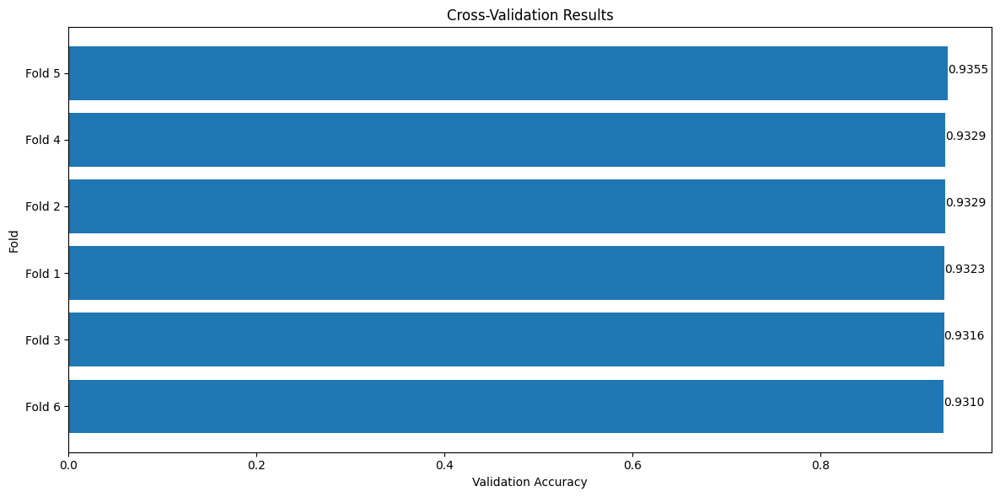

In [ ]:
# plot each fold results after cross-validation experiment
plot_cv_results(RL_results_df)

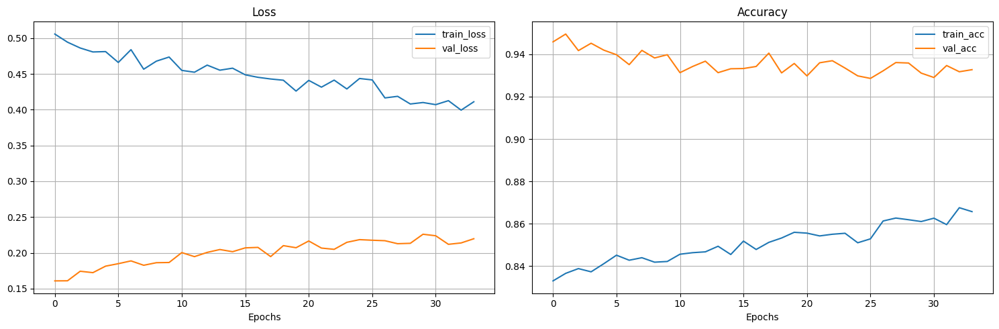

In [ ]:
# comptute and plot average cv results
RL_cv_avg_results = compute_avg_cv_results(RL_cv_results)

# plot the averaged learning curves
plot_loss_curves(RL_cv_avg_results)

Once again, cross-validation confirms the absence of overfitting, with high validation performance consistently achieved across all folds.

In [ ]:
# retrieve best performing fold's weights
best_RL_cv_model_weights = RL_results_df.iloc[0]['Model Weights']

# retrieve best performing fold number
RL_best_fold = RL_results_df.iloc[0]['Fold']

# retrieve the corresponding results from cross validation experiment for the best case
RL_best_fold_index = max(RL_best_fold - 1, 0)
RL_model_2_results = RL_cv_results[RL_best_fold_index]

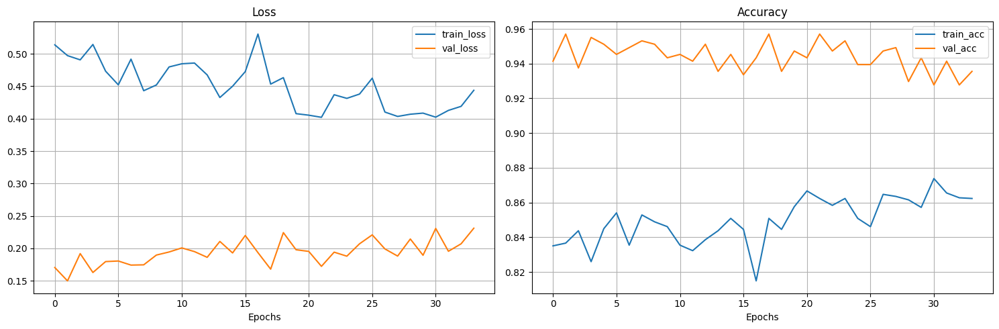

In [ ]:
# plot the curves of the model with best config
plot_loss_curves(RL_model_2_results)

In [ ]:
# before loading best weights, need to create a new instance
RL_model_2 = CNN_v2(out_features=num_classes, hidden_units=RL_best_hidden_units, dropout_probs=RL_best_dropout_probs, activation_functions=RL_best_activation_functions).to(device)

# now, load best weights
RL_model_2.load_state_dict(best_RL_cv_model_weights)

# print final model's val accuracy
RL_model_2_acc = RL_model_2_results['val_acc'][-1]
print(f"Final model accuracy: {RL_model_2_acc}")

# save the model
torch.save(RL_model_2.state_dict(), os.path.join(project_models_path, 'RL_model_2.pth'))
print("Model saved to 'RL_model_2.pth'")

Final model accuracy: 0.935546875
Model saved to 'RL_model_2.pth'


Experiment 7. Balance the dataset.

In [ ]:
# experiment 7: balanced dataset (with early stopping enabled)

# create a new instance of the model for balanced dataset
RL_model_3 = CNN_v2(out_features=num_classes, hidden_units=RL_best_hidden_units, dropout_probs=RL_best_dropout_probs, activation_functions=RL_best_activation_functions).to(device)

# load model_1 weights
RL_model_3.load_state_dict(RL_model_1.state_dict()) # (model_1)

# load best performing model (weights) so far
#RL_model_3.load_state_dict(best_RL_cv_model_weights) # (model_2)

# start training on balanced dataset
RL_model_3_results = experiment_balanced_dataset(model=RL_model_3,
                                                 train_dataloader=train_dataloader_RL,
                                                 val_dataloader=val_dataloader_RL,
                                                 num_epochs=num_epochs,
                                                 device=device,
                                                 best_config=RL_best_config,
                                                 class_weights=class_weights_RL)

Experimenting with Balanced Dataset


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.5505 | train_acc: 0.8326 | val_loss: 0.1471 | val_acc: 0.9474
Epoch: 2 | train_loss: 0.5318 | train_acc: 0.8339 | val_loss: 0.1315 | val_acc: 0.9572
Epoch: 3 | train_loss: 0.5302 | train_acc: 0.8272 | val_loss: 0.1390 | val_acc: 0.9589
Epoch: 4 | train_loss: 0.5138 | train_acc: 0.8294 | val_loss: 0.1318 | val_acc: 0.9589
Epoch: 5 | train_loss: 0.4987 | train_acc: 0.8424 | val_loss: 0.1324 | val_acc: 0.9556
Epoch: 6 | train_loss: 0.4940 | train_acc: 0.8333 | val_loss: 0.1370 | val_acc: 0.9539
Epoch: 7 | train_loss: 0.5255 | train_acc: 0.8399 | val_loss: 0.1216 | val_acc: 0.9539
Early stopping triggered at epoch 7.
Model restored from epoch 2.

Total training time: 17.295 seconds
Total trainable params: 170507


In [ ]:
# print best epoch and its corresponding val accuracy
RL_best_epoch_bal, RL_best_val_acc_bal = print_best_epoch_and_val_acc(RL_model_3_results)

Best epoch: 2
Best validation accuracy: 0.9572


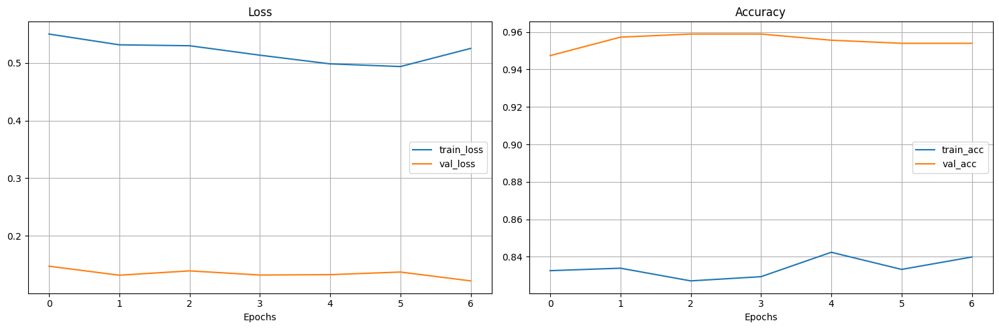

In [ ]:
# plot the results curves after balancing the dataset
plot_loss_curves(RL_model_3_results)

As almost always, balancing the dataset leads to improved performance. Let's keep this setup and apply data augmentation.



In [ ]:
# print final model's val accuracy
RL_model_3_acc = RL_best_val_acc_bal
print(f"Final model accuracy: {RL_model_3_acc}")

# save the model
torch.save(RL_model_3.state_dict(), os.path.join(project_models_path, 'RL_model_3.pth'))
print("Model saved to 'RL_model_3.pth'")

Final model accuracy: 0.9572368421052632
Model saved to 'RL_model_3.pth'


Experiment 8. Apply data augmentation.


Trivial data augmentation is going to be applied to this final experiment. We use the previous model as starting point for the training.

In [ ]:
# experiment 8: data augmentation (with early stopping enabled)

# create a new instance of the model for data augmentation
RL_model_4 = CNN_v2(out_features=num_classes, hidden_units=RL_best_hidden_units, dropout_probs=RL_best_dropout_probs, activation_functions=RL_best_activation_functions).to(device)

# load weights of the model_1
#RL_model_4.load_state_dict(RL_model_1.state_dict()) # (model_1)

# load weights of the model produced after cross-validation
#RL_model_4.load_state_dict(best_RL_cv_model_weights) # (model_2)

# load best performing model (weights) so far
RL_model_4.load_state_dict(RL_model_3.state_dict()) # (model 3)

# start training with data augmentation
RL_model_4_results = experiment_data_augmentation(model=RL_model_4,
                                                  train_dir=RL_dataset_path/'train',
                                                  val_dataloader=val_dataloader_RL,
                                                  num_epochs=num_epochs,
                                                  device=device,
                                                  best_config=RL_best_config,
                                                  class_weights=class_weights_RL,
                                                  num_workers=num_workers,
                                                  mean=mean_RL,
                                                  std=std_RL,
                                                  is_Trivial=True)

Experimenting with Data Augmentation


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 3.1507 | train_acc: 0.3696 | val_loss: 0.3584 | val_acc: 0.9128
Epoch: 2 | train_loss: 1.8626 | train_acc: 0.3809 | val_loss: 0.3043 | val_acc: 0.9391
Epoch: 3 | train_loss: 1.8183 | train_acc: 0.3931 | val_loss: 0.3077 | val_acc: 0.9342
Epoch: 4 | train_loss: 1.7232 | train_acc: 0.4160 | val_loss: 0.2354 | val_acc: 0.9507
Epoch: 5 | train_loss: 1.6644 | train_acc: 0.4122 | val_loss: 0.2644 | val_acc: 0.9408
Epoch: 6 | train_loss: 1.7280 | train_acc: 0.4109 | val_loss: 0.2365 | val_acc: 0.9408
Epoch: 7 | train_loss: 1.6822 | train_acc: 0.4232 | val_loss: 0.1917 | val_acc: 0.9457
Epoch: 8 | train_loss: 1.6354 | train_acc: 0.4257 | val_loss: 0.1819 | val_acc: 0.9342
Epoch: 9 | train_loss: 1.6286 | train_acc: 0.4320 | val_loss: 0.1959 | val_acc: 0.9408
Early stopping triggered at epoch 9.
Model restored from epoch 4.

Total training time: 27.615 seconds
Total trainable params: 170507


In [ ]:
# print best epoch and its corresponding val accuracy
RL_best_epoch_aug, RL_best_val_acc_aug = print_best_epoch_and_val_acc(RL_model_4_results)

Best epoch: 4
Best validation accuracy: 0.9507


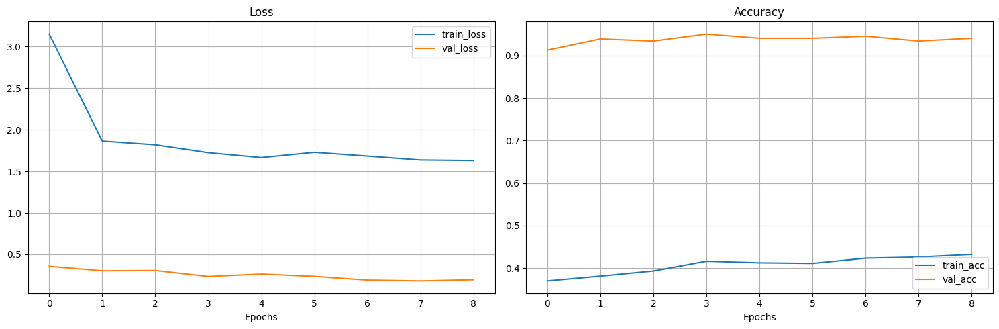

In [ ]:
# plot the results curves after data augmentation
plot_loss_curves(RL_model_4_results)

We observe a similar performance to the previous experiment, slightly lower, but in high standards.

In [ ]:
# print final model's val accuracy
RL_model_4_acc = RL_best_val_acc_aug
print(f"Final model accuracy: {RL_model_4_acc}")

# save the model
torch.save(RL_model_4.state_dict(), os.path.join(project_models_path, 'RL_model_4.pth'))
print("Model saved to 'RL_model_4.pth'")

Final model accuracy: 0.9506578947368421
Model saved to 'RL_model_4.pth'


With all experiments for this dataset done, let's now select the best-performing model and evaluate it on the appropriate test set.


Model RL_model_1: 0.94407895
Model RL_model_2: 0.93554688
Model RL_model_3: 0.95723684
Model RL_model_4: 0.95065789


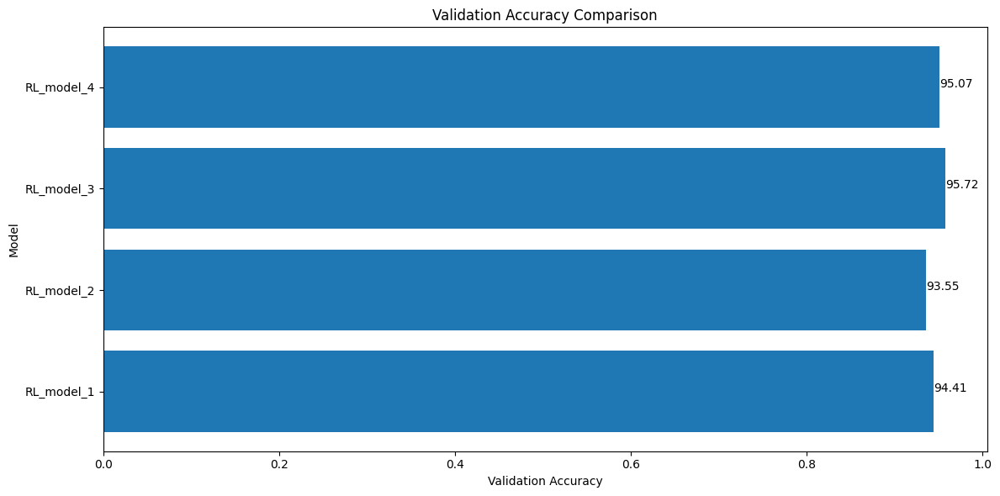

In [ ]:
# create a dataframe for comparison
compare_accs_RL = pd.DataFrame({'Model': ['RL_model_1', 'RL_model_2', 'RL_model_3', 'RL_model_4'], 'Validation Accuracy': [RL_model_1_acc, RL_model_2_acc, RL_model_3_acc, RL_model_4_acc]})

# print and plot test accuracies for all models of RL / M dataset
print_and_plot_models_accuracies(compare_accs_RL)

In [ ]:
# save the best performing model for RL / M
best_models_dict = store_best_model(compare_accs_RL, 'RL / M', best_models_dict)

# print the dictionary
print("Best models dictionary:")
print(best_models_dict)
print()

# retrieve best performing model for RL / M
RL_best_model = f"{best_models_dict['RL / M']['Model']}.pth"
#print(RL_best_model)

# initiate a model instance
RL_final_model = CNN_v2(out_features=num_classes, hidden_units=RL_best_hidden_units, dropout_probs=RL_best_dropout_probs, activation_functions=RL_best_activation_functions).to(device)

# load best weights
RL_final_model.load_state_dict(torch.load(os.path.join(project_models_path, RL_best_model)))

# put it on device
RL_final_model = RL_final_model.to(device)

# and evaluate on test set
RL_test_results = eval_model(model=RL_final_model,
                             dataloader=test_dataloader_M_full,
                             loss_fn=nn.CrossEntropyLoss(), # weight=class_weights_RL
                             device=device)
print(f"Test accuracy for {RL_best_model}: {RL_test_results['test_acc']:.4f}")

# save the test results to the dictionary
final_test_accuracies_dict['RL / M'] = RL_test_results['test_acc']

Best models dictionary:
{'M / M': {'Model': 'MM_model_4', 'Validation Accuracy': 0.9039772727272727}, 'R / R': {'Model': 'RR_model_3', 'Validation Accuracy': 0.8852272727272726}, 'L / L': {'Model': 'LL_model_4', 'Validation Accuracy': 0.8818181818181818}, 'MR / L': {'Model': 'MR_model_3', 'Validation Accuracy': 0.9748383620689655}, 'ML / R': {'Model': 'ML_model_3', 'Validation Accuracy': 0.9796875}, 'RL / M': {'Model': 'RL_model_3', 'Validation Accuracy': 0.9572368421052632}}



  0%|          | 0/47 [00:00<?, ?it/s]

Test accuracy for RL_model_3.pth: 0.9348


## Experiments on the small_dataset.

### CNNs.

We start by creating dataloaders for the small dataset.

In [ ]:
# create dataloaders
train_dataloader_small, val_dataloader_small, test_dataloader_small, class_names_small = create_dataloaders(small_dataset_path/'train', small_dataset_path/'validation', small_dataset_path/'test', data_transform_small, batch_size, num_workers)
print("Dataloaders created successfully!")

Dataloaders created successfully!


We train and evaluate the small dataset's baseline model.

In [ ]:
# train the small dataset's baseline model

# create the model
small_model_0 = CNN(in_features=num_channels, out_features=num_classes_small, hidden_units=init_hidden_units).to(device)

# setup loss function and optimizer
loss_fn = nn.CrossEntropyLoss()
optimizer = torch.optim.RMSprop(params=small_model_0.parameters(), lr=0.001)

# start training
print("Starting training...")
start_time = time.time()
small_model_0_results = train(model=small_model_0,
                              train_dataloader=train_dataloader_small,
                              test_dataloader=val_dataloader_small,
                              optimizer=optimizer,
                              loss_fn=loss_fn,
                              epochs=num_epochs,
                              device=device)
end_time = time.time()

# calculate and print total training time
small_total_training_time = end_time - start_time
print(f"\nTotal training time: {small_total_training_time:.3f} seconds")

# calculate and print total trainabla params
small_total_params = sum(p.numel() for p in small_model_0.parameters())
print(f"Total number of trainable parameters: {small_total_params}")

Starting training...


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 3.2052 | train_acc: 0.0703 | val_loss: 2.5078 | val_acc: 0.2000
Epoch: 2 | train_loss: 2.2307 | train_acc: 0.2383 | val_loss: 1.6325 | val_acc: 0.4667
Epoch: 3 | train_loss: 1.5634 | train_acc: 0.4570 | val_loss: 1.2940 | val_acc: 0.5667
Epoch: 4 | train_loss: 1.1301 | train_acc: 0.5781 | val_loss: 1.1746 | val_acc: 0.6333
Epoch: 5 | train_loss: 0.8558 | train_acc: 0.6914 | val_loss: 1.2866 | val_acc: 0.6333
Epoch: 6 | train_loss: 0.6309 | train_acc: 0.7422 | val_loss: 1.0922 | val_acc: 0.7000
Epoch: 7 | train_loss: 0.4622 | train_acc: 0.8828 | val_loss: 0.6968 | val_acc: 0.8000
Epoch: 8 | train_loss: 0.4509 | train_acc: 0.8086 | val_loss: 0.9630 | val_acc: 0.8000
Epoch: 9 | train_loss: 0.3334 | train_acc: 0.8945 | val_loss: 1.0120 | val_acc: 0.6000
Epoch: 10 | train_loss: 0.2503 | train_acc: 0.9219 | val_loss: 0.4699 | val_acc: 0.9000
Epoch: 11 | train_loss: 0.1844 | train_acc: 0.9531 | val_loss: 0.7877 | val_acc: 0.7333
Epoch: 12 | train_loss: 0.1236 | train_ac

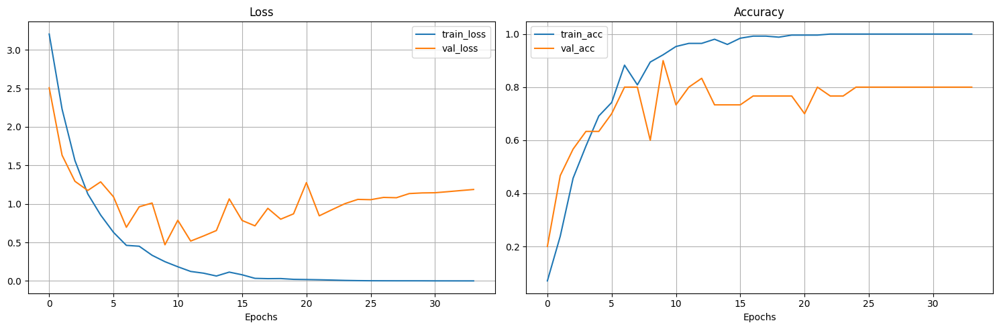

In [ ]:
# plot learning curves
plot_loss_curves(small_model_0_results)

In [ ]:
# compute generalization gap
dif=compute_generalization_gap(small_model_0_results)

Generalization gap (train acc - val acc): 0.2000


Both numerical and graphical analyses indicate that the baseline model for the small dataset suffers from overfitting. The next steps will focus on reducing this overfitting and enhancing the model's performance. A significantly larger gap also observed with the overfitting effect emerging earlier in training (expected due to the smaller dataset). We proceed with the basic experimentation workflow we did in all big datasets above.

In [ ]:
# save the model
torch.save(small_model_0.state_dict(), os.path.join(project_models_path, 'small_model_0.pth'))
print("Model saved to 'small_model_0.pth'")

Model saved to 'small_model_0.pth'


Experiment 1. Apply L2 regularization.

In [ ]:
# experiment 1: L2 reg
small_model_L2_results = experiment_l2_regularization(train_dataloader=train_dataloader_small,
                                                      val_dataloader=val_dataloader_small,
                                                      num_epochs=num_epochs,
                                                      device=device,
                                                      weight_decay_values_list=weight_decay_values_list,
                                                      num_channels=num_channels,
                                                      num_classes=num_classes_small,
                                                      init_hidden_units=init_hidden_units)

Experimenting with L2 Regularization
Weight decay values to try: [0.01, 0.001, 0.0001, 1e-05, 1e-06]

Testing with weight decay: 0.01


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.8710 | train_acc: 0.0703 | val_loss: 2.6734 | val_acc: 0.2000
Epoch: 2 | train_loss: 2.6498 | train_acc: 0.1797 | val_loss: 2.4260 | val_acc: 0.4000
Epoch: 3 | train_loss: 2.1351 | train_acc: 0.3086 | val_loss: 1.9423 | val_acc: 0.4667
Epoch: 4 | train_loss: 1.6798 | train_acc: 0.5039 | val_loss: 1.8005 | val_acc: 0.4333
Epoch: 5 | train_loss: 1.2480 | train_acc: 0.6094 | val_loss: 1.4939 | val_acc: 0.5333
Epoch: 6 | train_loss: 1.0879 | train_acc: 0.6250 | val_loss: 1.1006 | val_acc: 0.6000
Epoch: 7 | train_loss: 0.7112 | train_acc: 0.7852 | val_loss: 1.3050 | val_acc: 0.6333
Epoch: 8 | train_loss: 0.5279 | train_acc: 0.8203 | val_loss: 0.8896 | val_acc: 0.7667
Epoch: 9 | train_loss: 0.6042 | train_acc: 0.7852 | val_loss: 0.9268 | val_acc: 0.7333
Epoch: 10 | train_loss: 0.3655 | train_acc: 0.8867 | val_loss: 0.5433 | val_acc: 0.8667
Epoch: 11 | train_loss: 0.2428 | train_acc: 0.9258 | val_loss: 0.8368 | val_acc: 0.8333
Epoch: 12 | train_loss: 0.1947 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.8710 | train_acc: 0.0703 | val_loss: 2.6609 | val_acc: 0.1333
Epoch: 2 | train_loss: 2.6078 | train_acc: 0.1484 | val_loss: 2.5782 | val_acc: 0.1000
Epoch: 3 | train_loss: 2.2421 | train_acc: 0.2734 | val_loss: 1.8203 | val_acc: 0.4667
Epoch: 4 | train_loss: 1.5244 | train_acc: 0.5195 | val_loss: 2.1188 | val_acc: 0.5667
Epoch: 5 | train_loss: 1.0940 | train_acc: 0.6250 | val_loss: 1.1963 | val_acc: 0.7667
Epoch: 6 | train_loss: 0.7481 | train_acc: 0.7539 | val_loss: 1.1922 | val_acc: 0.7000
Epoch: 7 | train_loss: 0.6223 | train_acc: 0.7891 | val_loss: 0.6617 | val_acc: 0.8333
Epoch: 8 | train_loss: 0.3364 | train_acc: 0.8828 | val_loss: 0.9968 | val_acc: 0.7000
Epoch: 9 | train_loss: 0.3745 | train_acc: 0.9023 | val_loss: 0.7085 | val_acc: 0.6667
Epoch: 10 | train_loss: 0.1412 | train_acc: 0.9648 | val_loss: 0.5133 | val_acc: 0.8667
Epoch: 11 | train_loss: 0.1494 | train_acc: 0.9453 | val_loss: 0.8439 | val_acc: 0.8000
Epoch: 12 | train_loss: 0.1193 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 3.1241 | train_acc: 0.0703 | val_loss: 2.6420 | val_acc: 0.2667
Epoch: 2 | train_loss: 2.4975 | train_acc: 0.1953 | val_loss: 2.1840 | val_acc: 0.4000
Epoch: 3 | train_loss: 1.9260 | train_acc: 0.4062 | val_loss: 1.6509 | val_acc: 0.5000
Epoch: 4 | train_loss: 1.3977 | train_acc: 0.5352 | val_loss: 1.2768 | val_acc: 0.4667
Epoch: 5 | train_loss: 1.0685 | train_acc: 0.6367 | val_loss: 1.2800 | val_acc: 0.6000
Epoch: 6 | train_loss: 0.7200 | train_acc: 0.7344 | val_loss: 1.0294 | val_acc: 0.6000
Epoch: 7 | train_loss: 0.4921 | train_acc: 0.8320 | val_loss: 1.1604 | val_acc: 0.7000
Epoch: 8 | train_loss: 0.4223 | train_acc: 0.8438 | val_loss: 0.9619 | val_acc: 0.6667
Epoch: 9 | train_loss: 0.2804 | train_acc: 0.9141 | val_loss: 0.8527 | val_acc: 0.7333
Epoch: 10 | train_loss: 0.1977 | train_acc: 0.9570 | val_loss: 0.4895 | val_acc: 0.8667
Epoch: 11 | train_loss: 0.1285 | train_acc: 0.9648 | val_loss: 0.5043 | val_acc: 0.8667
Epoch: 12 | train_loss: 0.0907 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 3.0347 | train_acc: 0.0664 | val_loss: 2.7020 | val_acc: 0.0667
Epoch: 2 | train_loss: 2.6616 | train_acc: 0.1055 | val_loss: 2.4685 | val_acc: 0.1667
Epoch: 3 | train_loss: 2.2935 | train_acc: 0.2695 | val_loss: 2.0865 | val_acc: 0.3333
Epoch: 4 | train_loss: 1.5521 | train_acc: 0.5156 | val_loss: 1.9275 | val_acc: 0.3667
Epoch: 5 | train_loss: 1.0691 | train_acc: 0.6953 | val_loss: 1.0480 | val_acc: 0.6667
Epoch: 6 | train_loss: 0.6900 | train_acc: 0.7734 | val_loss: 1.0611 | val_acc: 0.7000
Epoch: 7 | train_loss: 0.4722 | train_acc: 0.8594 | val_loss: 1.0710 | val_acc: 0.7333
Epoch: 8 | train_loss: 0.2885 | train_acc: 0.8906 | val_loss: 0.6317 | val_acc: 0.8333
Epoch: 9 | train_loss: 0.1213 | train_acc: 0.9727 | val_loss: 0.4889 | val_acc: 0.8667
Epoch: 10 | train_loss: 0.0799 | train_acc: 0.9844 | val_loss: 0.6510 | val_acc: 0.8000
Epoch: 11 | train_loss: 0.0711 | train_acc: 0.9805 | val_loss: 0.3760 | val_acc: 0.9000
Epoch: 12 | train_loss: 0.0249 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.8181 | train_acc: 0.0898 | val_loss: 2.4174 | val_acc: 0.1333
Epoch: 2 | train_loss: 2.2127 | train_acc: 0.3281 | val_loss: 1.8273 | val_acc: 0.3667
Epoch: 3 | train_loss: 1.4568 | train_acc: 0.5273 | val_loss: 1.8648 | val_acc: 0.4333
Epoch: 4 | train_loss: 0.9932 | train_acc: 0.6875 | val_loss: 1.1004 | val_acc: 0.5000
Epoch: 5 | train_loss: 0.7367 | train_acc: 0.7695 | val_loss: 0.7394 | val_acc: 0.7333
Epoch: 6 | train_loss: 0.3803 | train_acc: 0.8789 | val_loss: 0.7282 | val_acc: 0.8000
Epoch: 7 | train_loss: 0.4638 | train_acc: 0.8359 | val_loss: 0.6246 | val_acc: 0.8333
Epoch: 8 | train_loss: 0.2689 | train_acc: 0.9141 | val_loss: 0.5783 | val_acc: 0.9000
Epoch: 9 | train_loss: 0.1617 | train_acc: 0.9453 | val_loss: 0.5214 | val_acc: 0.9000
Epoch: 10 | train_loss: 0.1064 | train_acc: 0.9688 | val_loss: 1.3340 | val_acc: 0.7667
Epoch: 11 | train_loss: 0.2040 | train_acc: 0.9492 | val_loss: 1.0501 | val_acc: 0.7667
Epoch: 12 | train_loss: 0.0824 | train_ac

In [ ]:
# identify and print the best decay value based on the generalization gap
small_best_decay_value, small_min_diff_l2 = compute_multi_generalization_gaps(small_model_L2_results)

Difference between train and val acc for 0.01: 0.1333
Difference between train and val acc for 0.001: 0.1333
Difference between train and val acc for 0.0001: 0.2333
Difference between train and val acc for 1e-05: 0.1333
Difference between train and val acc for 1e-06: 0.0667

The best (smallest) generalization gap is for 1e-06 and is 0.0667


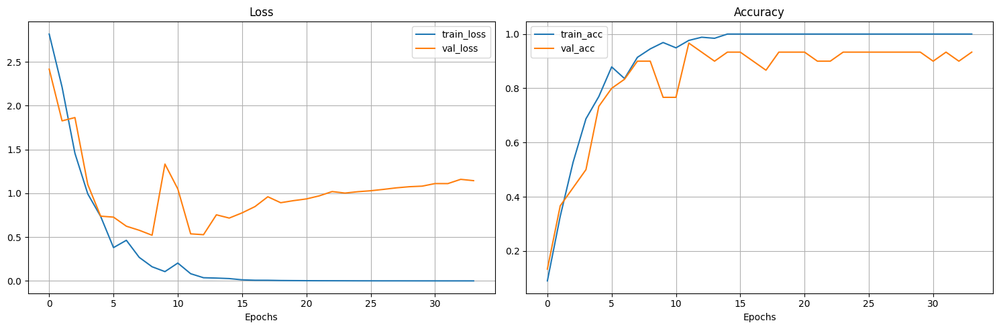

In [ ]:
# plot loss curves
plot_loss_curves(small_model_L2_results[small_best_decay_value])

After applying L2 regularization, overfitting still exists despite a modest improvement. Let's proceed with dropout experiment next.

Experiment 2. Apply dropout regularization layers.

In [ ]:
# experiment 2: dropout layers
small_model_dropout_results = experiment_dropout_regularization(train_dataloader=train_dataloader_small,
                                                                val_dataloader=val_dataloader_small,
                                                                num_epochs=num_epochs,
                                                                device=device,
                                                                num_classes=num_classes_small,
                                                                best_decay_value=small_best_decay_value,
                                                                dropout_probs_combos_list=dropout_probs_combos_list)

Experimenting with Dropout Regularization Layers
Dropout probabilities to try: [0.1, 0.3, 0.5, 0.6, 0.7, 0.9]
Total number of combinations to ideally try: 1296

Some possible 'good' combinations to try: [[0.5, 0.5, 0.5, 0.5], [0.5, 0.5, 0.4, 0.5], [0.5, 0.4, 0.5, 0.5], [0.5, 0.4, 0.4, 0.5], [0.5, 0.5, 0.5, 0.4], [0.4, 0.5, 0.5, 0.5], [0.4, 0.5, 0.5, 0.4], [0.5, 0.5, 0.5, 0.7], [0.8, 0.5, 0.5, 0.5], [0.8, 0.7, 0.7, 0.6], [0.8, 0.8, 0.7, 0.5], [0.8, 0.5, 0.7, 0.5], [0.6, 0.5, 0.5, 0.5], [0.5, 0.6, 0.6, 0.5], [0.7, 0.6, 0.5, 0.5]]

Testing with conv_dropout_prob: [0.5, 0.5, 0.5] and classifier dropout probability: 0.5


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 3.1428 | train_acc: 0.0664 | val_loss: 2.6966 | val_acc: 0.1667
Epoch: 2 | train_loss: 2.6732 | train_acc: 0.1133 | val_loss: 2.6242 | val_acc: 0.1333
Epoch: 3 | train_loss: 2.6772 | train_acc: 0.1367 | val_loss: 2.6220 | val_acc: 0.5000
Epoch: 4 | train_loss: 2.5181 | train_acc: 0.2227 | val_loss: 2.2692 | val_acc: 0.4667
Epoch: 5 | train_loss: 2.2919 | train_acc: 0.3008 | val_loss: 2.0125 | val_acc: 0.3333
Epoch: 6 | train_loss: 2.0837 | train_acc: 0.3789 | val_loss: 1.7226 | val_acc: 0.5000
Epoch: 7 | train_loss: 1.9249 | train_acc: 0.4219 | val_loss: 1.5077 | val_acc: 0.4667
Epoch: 8 | train_loss: 1.8617 | train_acc: 0.4180 | val_loss: 1.4720 | val_acc: 0.5333
Epoch: 9 | train_loss: 1.6561 | train_acc: 0.5156 | val_loss: 1.3059 | val_acc: 0.6000
Epoch: 10 | train_loss: 1.7387 | train_acc: 0.4883 | val_loss: 1.2806 | val_acc: 0.5667
Epoch: 11 | train_loss: 1.5381 | train_acc: 0.5430 | val_loss: 1.1408 | val_acc: 0.7000
Epoch: 12 | train_loss: 1.4502 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.8997 | train_acc: 0.0703 | val_loss: 2.6958 | val_acc: 0.0667
Epoch: 2 | train_loss: 2.6826 | train_acc: 0.0664 | val_loss: 2.6870 | val_acc: 0.2000
Epoch: 3 | train_loss: 2.6621 | train_acc: 0.0898 | val_loss: 2.6625 | val_acc: 0.2333
Epoch: 4 | train_loss: 2.5296 | train_acc: 0.1406 | val_loss: 2.5234 | val_acc: 0.3667
Epoch: 5 | train_loss: 2.5104 | train_acc: 0.1875 | val_loss: 2.3287 | val_acc: 0.4000
Epoch: 6 | train_loss: 2.3462 | train_acc: 0.2461 | val_loss: 2.2352 | val_acc: 0.3667
Epoch: 7 | train_loss: 2.1126 | train_acc: 0.3438 | val_loss: 1.8294 | val_acc: 0.5667
Epoch: 8 | train_loss: 1.8458 | train_acc: 0.4141 | val_loss: 1.7587 | val_acc: 0.4667
Epoch: 9 | train_loss: 1.7629 | train_acc: 0.4609 | val_loss: 1.5180 | val_acc: 0.5333
Epoch: 10 | train_loss: 1.8244 | train_acc: 0.4570 | val_loss: 1.5609 | val_acc: 0.5667
Epoch: 11 | train_loss: 1.5801 | train_acc: 0.4883 | val_loss: 1.4850 | val_acc: 0.6333
Epoch: 12 | train_loss: 1.4337 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.8348 | train_acc: 0.0820 | val_loss: 2.7051 | val_acc: 0.0667
Epoch: 2 | train_loss: 2.6603 | train_acc: 0.1016 | val_loss: 2.6639 | val_acc: 0.2000
Epoch: 3 | train_loss: 2.5380 | train_acc: 0.2031 | val_loss: 2.3116 | val_acc: 0.4000
Epoch: 4 | train_loss: 2.2881 | train_acc: 0.2578 | val_loss: 2.0669 | val_acc: 0.4333
Epoch: 5 | train_loss: 2.2230 | train_acc: 0.3242 | val_loss: 1.9957 | val_acc: 0.4000
Epoch: 6 | train_loss: 1.9632 | train_acc: 0.3867 | val_loss: 1.8404 | val_acc: 0.3667
Epoch: 7 | train_loss: 1.8157 | train_acc: 0.4375 | val_loss: 1.4453 | val_acc: 0.5333
Epoch: 8 | train_loss: 1.7611 | train_acc: 0.4531 | val_loss: 1.2845 | val_acc: 0.7000
Epoch: 9 | train_loss: 1.6086 | train_acc: 0.4727 | val_loss: 1.2526 | val_acc: 0.6000
Epoch: 10 | train_loss: 1.3860 | train_acc: 0.5898 | val_loss: 1.0943 | val_acc: 0.7333
Epoch: 11 | train_loss: 1.5328 | train_acc: 0.5156 | val_loss: 1.1684 | val_acc: 0.7333
Epoch: 12 | train_loss: 1.3671 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.8246 | train_acc: 0.0742 | val_loss: 2.6490 | val_acc: 0.1000
Epoch: 2 | train_loss: 2.5757 | train_acc: 0.1211 | val_loss: 2.4352 | val_acc: 0.2000
Epoch: 3 | train_loss: 2.3873 | train_acc: 0.1914 | val_loss: 2.1146 | val_acc: 0.4333
Epoch: 4 | train_loss: 2.3440 | train_acc: 0.2891 | val_loss: 2.0134 | val_acc: 0.4000
Epoch: 5 | train_loss: 2.0819 | train_acc: 0.3555 | val_loss: 1.8296 | val_acc: 0.4333
Epoch: 6 | train_loss: 1.9161 | train_acc: 0.3711 | val_loss: 1.5960 | val_acc: 0.5333
Epoch: 7 | train_loss: 1.7159 | train_acc: 0.4219 | val_loss: 1.5762 | val_acc: 0.5333
Epoch: 8 | train_loss: 1.6917 | train_acc: 0.4492 | val_loss: 1.4166 | val_acc: 0.5667
Epoch: 9 | train_loss: 1.4766 | train_acc: 0.5508 | val_loss: 1.3571 | val_acc: 0.6667
Epoch: 10 | train_loss: 1.4672 | train_acc: 0.5391 | val_loss: 1.2167 | val_acc: 0.6333
Epoch: 11 | train_loss: 1.2919 | train_acc: 0.5625 | val_loss: 1.1782 | val_acc: 0.6667
Epoch: 12 | train_loss: 1.4166 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.8213 | train_acc: 0.0742 | val_loss: 2.6884 | val_acc: 0.0667
Epoch: 2 | train_loss: 2.7085 | train_acc: 0.0586 | val_loss: 2.6787 | val_acc: 0.1000
Epoch: 3 | train_loss: 2.6450 | train_acc: 0.1055 | val_loss: 2.5472 | val_acc: 0.2333
Epoch: 4 | train_loss: 2.4914 | train_acc: 0.2109 | val_loss: 2.3544 | val_acc: 0.3000
Epoch: 5 | train_loss: 2.3265 | train_acc: 0.2656 | val_loss: 2.1686 | val_acc: 0.4667
Epoch: 6 | train_loss: 2.2235 | train_acc: 0.3242 | val_loss: 2.1189 | val_acc: 0.4667
Epoch: 7 | train_loss: 2.0255 | train_acc: 0.3672 | val_loss: 1.6497 | val_acc: 0.6000
Epoch: 8 | train_loss: 1.9484 | train_acc: 0.3906 | val_loss: 1.4508 | val_acc: 0.6333
Epoch: 9 | train_loss: 1.6437 | train_acc: 0.5078 | val_loss: 1.4241 | val_acc: 0.6333
Epoch: 10 | train_loss: 1.6563 | train_acc: 0.4922 | val_loss: 1.3119 | val_acc: 0.7000
Epoch: 11 | train_loss: 1.6293 | train_acc: 0.4883 | val_loss: 1.2882 | val_acc: 0.7333
Epoch: 12 | train_loss: 1.3698 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 3.0055 | train_acc: 0.0273 | val_loss: 2.7118 | val_acc: 0.1667
Epoch: 2 | train_loss: 2.7099 | train_acc: 0.0820 | val_loss: 2.6889 | val_acc: 0.0667
Epoch: 3 | train_loss: 2.6724 | train_acc: 0.1094 | val_loss: 2.5455 | val_acc: 0.2000
Epoch: 4 | train_loss: 2.4626 | train_acc: 0.1562 | val_loss: 2.2446 | val_acc: 0.3000
Epoch: 5 | train_loss: 2.3162 | train_acc: 0.2422 | val_loss: 2.1109 | val_acc: 0.4667
Epoch: 6 | train_loss: 2.1362 | train_acc: 0.3047 | val_loss: 2.0299 | val_acc: 0.4333
Epoch: 7 | train_loss: 2.0856 | train_acc: 0.3320 | val_loss: 1.6719 | val_acc: 0.5667
Epoch: 8 | train_loss: 1.9727 | train_acc: 0.3438 | val_loss: 1.6881 | val_acc: 0.5000
Epoch: 9 | train_loss: 1.8303 | train_acc: 0.4023 | val_loss: 1.5530 | val_acc: 0.6000
Epoch: 10 | train_loss: 1.7741 | train_acc: 0.4219 | val_loss: 1.5019 | val_acc: 0.7000
Epoch: 11 | train_loss: 1.7413 | train_acc: 0.4258 | val_loss: 1.3653 | val_acc: 0.7000
Epoch: 12 | train_loss: 1.5430 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.8432 | train_acc: 0.0742 | val_loss: 2.6844 | val_acc: 0.1333
Epoch: 2 | train_loss: 2.6514 | train_acc: 0.1133 | val_loss: 2.5460 | val_acc: 0.1333
Epoch: 3 | train_loss: 2.5841 | train_acc: 0.1289 | val_loss: 2.5894 | val_acc: 0.1333
Epoch: 4 | train_loss: 2.3188 | train_acc: 0.2812 | val_loss: 2.2553 | val_acc: 0.4000
Epoch: 5 | train_loss: 2.1151 | train_acc: 0.3555 | val_loss: 1.9023 | val_acc: 0.4333
Epoch: 6 | train_loss: 1.9415 | train_acc: 0.3789 | val_loss: 1.6718 | val_acc: 0.5000
Epoch: 7 | train_loss: 1.8466 | train_acc: 0.4258 | val_loss: 1.5096 | val_acc: 0.6667
Epoch: 8 | train_loss: 1.7676 | train_acc: 0.4336 | val_loss: 1.5019 | val_acc: 0.5333
Epoch: 9 | train_loss: 1.6596 | train_acc: 0.4922 | val_loss: 1.3575 | val_acc: 0.5667
Epoch: 10 | train_loss: 1.5877 | train_acc: 0.4961 | val_loss: 1.2846 | val_acc: 0.5333
Epoch: 11 | train_loss: 1.3859 | train_acc: 0.5273 | val_loss: 1.2936 | val_acc: 0.6000
Epoch: 12 | train_loss: 1.3780 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.8007 | train_acc: 0.0742 | val_loss: 2.6830 | val_acc: 0.0667
Epoch: 2 | train_loss: 2.6996 | train_acc: 0.1094 | val_loss: 2.6590 | val_acc: 0.1667
Epoch: 3 | train_loss: 2.6883 | train_acc: 0.1016 | val_loss: 2.6353 | val_acc: 0.1667
Epoch: 4 | train_loss: 2.5973 | train_acc: 0.1367 | val_loss: 2.4642 | val_acc: 0.2667
Epoch: 5 | train_loss: 2.5637 | train_acc: 0.1641 | val_loss: 2.5943 | val_acc: 0.2000
Epoch: 6 | train_loss: 2.4528 | train_acc: 0.2109 | val_loss: 2.3800 | val_acc: 0.3000
Epoch: 7 | train_loss: 2.4218 | train_acc: 0.2227 | val_loss: 2.2919 | val_acc: 0.3000
Epoch: 8 | train_loss: 2.3500 | train_acc: 0.2969 | val_loss: 2.2394 | val_acc: 0.3333
Epoch: 9 | train_loss: 2.3440 | train_acc: 0.2617 | val_loss: 2.2370 | val_acc: 0.2667
Epoch: 10 | train_loss: 2.1463 | train_acc: 0.3242 | val_loss: 1.9697 | val_acc: 0.4000
Epoch: 11 | train_loss: 2.0864 | train_acc: 0.3477 | val_loss: 1.7659 | val_acc: 0.5333
Epoch: 12 | train_loss: 1.9867 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.8658 | train_acc: 0.0664 | val_loss: 2.6997 | val_acc: 0.1667
Epoch: 2 | train_loss: 2.6940 | train_acc: 0.0977 | val_loss: 2.6982 | val_acc: 0.0667
Epoch: 3 | train_loss: 2.6430 | train_acc: 0.1094 | val_loss: 2.6837 | val_acc: 0.1333
Epoch: 4 | train_loss: 2.5604 | train_acc: 0.1641 | val_loss: 2.5438 | val_acc: 0.2667
Epoch: 5 | train_loss: 2.5503 | train_acc: 0.1641 | val_loss: 2.5618 | val_acc: 0.3333
Epoch: 6 | train_loss: 2.3829 | train_acc: 0.2031 | val_loss: 2.3790 | val_acc: 0.2667
Epoch: 7 | train_loss: 2.3825 | train_acc: 0.2422 | val_loss: 2.4434 | val_acc: 0.2333
Epoch: 8 | train_loss: 2.2982 | train_acc: 0.2656 | val_loss: 2.2345 | val_acc: 0.4333
Epoch: 9 | train_loss: 2.2162 | train_acc: 0.2891 | val_loss: 2.3574 | val_acc: 0.2000
Epoch: 10 | train_loss: 2.2062 | train_acc: 0.3281 | val_loss: 2.3054 | val_acc: 0.1333
Epoch: 11 | train_loss: 2.1694 | train_acc: 0.2812 | val_loss: 2.1983 | val_acc: 0.2667
Epoch: 12 | train_loss: 2.0637 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.9037 | train_acc: 0.0625 | val_loss: 2.6974 | val_acc: 0.0333
Epoch: 2 | train_loss: 2.7458 | train_acc: 0.0977 | val_loss: 2.6982 | val_acc: 0.1333
Epoch: 3 | train_loss: 2.6988 | train_acc: 0.1094 | val_loss: 2.6916 | val_acc: 0.0667
Epoch: 4 | train_loss: 2.6926 | train_acc: 0.1328 | val_loss: 2.6882 | val_acc: 0.0333
Epoch: 5 | train_loss: 2.6263 | train_acc: 0.1133 | val_loss: 2.6830 | val_acc: 0.2000
Epoch: 6 | train_loss: 2.5445 | train_acc: 0.1562 | val_loss: 2.6693 | val_acc: 0.1667
Epoch: 7 | train_loss: 2.5548 | train_acc: 0.1484 | val_loss: 2.6788 | val_acc: 0.0667
Epoch: 8 | train_loss: 2.5721 | train_acc: 0.1250 | val_loss: 2.6482 | val_acc: 0.1667
Epoch: 9 | train_loss: 2.6078 | train_acc: 0.1602 | val_loss: 2.6873 | val_acc: 0.0667
Epoch: 10 | train_loss: 2.5336 | train_acc: 0.1602 | val_loss: 2.6790 | val_acc: 0.0667
Epoch: 11 | train_loss: 2.4688 | train_acc: 0.2109 | val_loss: 2.6613 | val_acc: 0.0667
Epoch: 12 | train_loss: 2.4422 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.9951 | train_acc: 0.0664 | val_loss: 2.7087 | val_acc: 0.0667
Epoch: 2 | train_loss: 2.7683 | train_acc: 0.1055 | val_loss: 2.7066 | val_acc: 0.0667
Epoch: 3 | train_loss: 2.7099 | train_acc: 0.0820 | val_loss: 2.7037 | val_acc: 0.0667
Epoch: 4 | train_loss: 2.6853 | train_acc: 0.1328 | val_loss: 2.6952 | val_acc: 0.1000
Epoch: 5 | train_loss: 2.6721 | train_acc: 0.1094 | val_loss: 2.7034 | val_acc: 0.0667
Epoch: 6 | train_loss: 2.6710 | train_acc: 0.1328 | val_loss: 2.7010 | val_acc: 0.0667
Epoch: 7 | train_loss: 2.6350 | train_acc: 0.1484 | val_loss: 2.7019 | val_acc: 0.0667
Epoch: 8 | train_loss: 2.6284 | train_acc: 0.1328 | val_loss: 2.7013 | val_acc: 0.1000
Epoch: 9 | train_loss: 2.5399 | train_acc: 0.1914 | val_loss: 2.6858 | val_acc: 0.0667
Epoch: 10 | train_loss: 2.6753 | train_acc: 0.1367 | val_loss: 2.6970 | val_acc: 0.0667
Epoch: 11 | train_loss: 2.5169 | train_acc: 0.1875 | val_loss: 2.6880 | val_acc: 0.0667
Epoch: 12 | train_loss: 2.5339 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.9529 | train_acc: 0.0586 | val_loss: 2.6961 | val_acc: 0.0667
Epoch: 2 | train_loss: 2.7132 | train_acc: 0.0820 | val_loss: 2.6950 | val_acc: 0.0667
Epoch: 3 | train_loss: 2.6928 | train_acc: 0.1289 | val_loss: 2.6735 | val_acc: 0.1333
Epoch: 4 | train_loss: 2.6492 | train_acc: 0.1641 | val_loss: 2.6540 | val_acc: 0.1000
Epoch: 5 | train_loss: 2.6906 | train_acc: 0.1445 | val_loss: 2.6972 | val_acc: 0.1000
Epoch: 6 | train_loss: 2.6052 | train_acc: 0.1484 | val_loss: 2.6940 | val_acc: 0.1000
Epoch: 7 | train_loss: 2.5727 | train_acc: 0.1445 | val_loss: 2.6700 | val_acc: 0.1000
Epoch: 8 | train_loss: 2.5060 | train_acc: 0.1562 | val_loss: 2.6698 | val_acc: 0.1333
Epoch: 9 | train_loss: 2.5423 | train_acc: 0.1836 | val_loss: 2.6878 | val_acc: 0.0667
Epoch: 10 | train_loss: 2.3841 | train_acc: 0.2266 | val_loss: 2.5825 | val_acc: 0.1333
Epoch: 11 | train_loss: 2.3584 | train_acc: 0.2383 | val_loss: 2.6330 | val_acc: 0.1000
Epoch: 12 | train_loss: 2.2527 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.8370 | train_acc: 0.0820 | val_loss: 2.6938 | val_acc: 0.1333
Epoch: 2 | train_loss: 2.7036 | train_acc: 0.0820 | val_loss: 2.6363 | val_acc: 0.0667
Epoch: 3 | train_loss: 2.6102 | train_acc: 0.1367 | val_loss: 2.4719 | val_acc: 0.1667
Epoch: 4 | train_loss: 2.5056 | train_acc: 0.1484 | val_loss: 2.4213 | val_acc: 0.2667
Epoch: 5 | train_loss: 2.4818 | train_acc: 0.1914 | val_loss: 2.4089 | val_acc: 0.4000
Epoch: 6 | train_loss: 2.3190 | train_acc: 0.2656 | val_loss: 2.1860 | val_acc: 0.4000
Epoch: 7 | train_loss: 2.1452 | train_acc: 0.3086 | val_loss: 2.0817 | val_acc: 0.4333
Epoch: 8 | train_loss: 2.0989 | train_acc: 0.3242 | val_loss: 1.9104 | val_acc: 0.5000
Epoch: 9 | train_loss: 2.0666 | train_acc: 0.3750 | val_loss: 1.7628 | val_acc: 0.5333
Epoch: 10 | train_loss: 1.8633 | train_acc: 0.4375 | val_loss: 1.7545 | val_acc: 0.6333
Epoch: 11 | train_loss: 1.8320 | train_acc: 0.4023 | val_loss: 1.5666 | val_acc: 0.5667
Epoch: 12 | train_loss: 1.7045 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.8186 | train_acc: 0.0664 | val_loss: 2.7059 | val_acc: 0.0667
Epoch: 2 | train_loss: 2.7156 | train_acc: 0.0547 | val_loss: 2.6678 | val_acc: 0.1333
Epoch: 3 | train_loss: 2.6334 | train_acc: 0.0820 | val_loss: 2.6435 | val_acc: 0.1000
Epoch: 4 | train_loss: 2.5996 | train_acc: 0.1289 | val_loss: 2.5232 | val_acc: 0.1667
Epoch: 5 | train_loss: 2.5639 | train_acc: 0.1523 | val_loss: 2.5317 | val_acc: 0.2000
Epoch: 6 | train_loss: 2.4426 | train_acc: 0.2773 | val_loss: 2.5077 | val_acc: 0.2333
Epoch: 7 | train_loss: 2.2623 | train_acc: 0.2344 | val_loss: 2.0725 | val_acc: 0.4000
Epoch: 8 | train_loss: 2.2511 | train_acc: 0.3125 | val_loss: 2.1027 | val_acc: 0.4000
Epoch: 9 | train_loss: 2.1361 | train_acc: 0.3203 | val_loss: 1.8946 | val_acc: 0.4667
Epoch: 10 | train_loss: 1.9872 | train_acc: 0.3477 | val_loss: 1.8060 | val_acc: 0.5333
Epoch: 11 | train_loss: 1.8402 | train_acc: 0.4141 | val_loss: 1.6365 | val_acc: 0.6667
Epoch: 12 | train_loss: 1.6369 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.8431 | train_acc: 0.0703 | val_loss: 2.7028 | val_acc: 0.0667
Epoch: 2 | train_loss: 2.7047 | train_acc: 0.0742 | val_loss: 2.6924 | val_acc: 0.0667
Epoch: 3 | train_loss: 2.6211 | train_acc: 0.1250 | val_loss: 2.5111 | val_acc: 0.2333
Epoch: 4 | train_loss: 2.6460 | train_acc: 0.1328 | val_loss: 2.6222 | val_acc: 0.2667
Epoch: 5 | train_loss: 2.5201 | train_acc: 0.1758 | val_loss: 2.5139 | val_acc: 0.4333
Epoch: 6 | train_loss: 2.4176 | train_acc: 0.1992 | val_loss: 2.3065 | val_acc: 0.3667
Epoch: 7 | train_loss: 2.3910 | train_acc: 0.2383 | val_loss: 2.3570 | val_acc: 0.3333
Epoch: 8 | train_loss: 2.2071 | train_acc: 0.2852 | val_loss: 2.0880 | val_acc: 0.4333
Epoch: 9 | train_loss: 2.1961 | train_acc: 0.3164 | val_loss: 1.9681 | val_acc: 0.4000
Epoch: 10 | train_loss: 2.0829 | train_acc: 0.3555 | val_loss: 2.0043 | val_acc: 0.3000
Epoch: 11 | train_loss: 2.1206 | train_acc: 0.3398 | val_loss: 2.0045 | val_acc: 0.3667
Epoch: 12 | train_loss: 1.9821 | train_ac

In [ ]:
# # identify and print the best dropout probs combo value based on the generalization gap
small_best_dropout_probs, small_min_diff_dropout = compute_multi_generalization_gaps(small_model_dropout_results)

Difference between train and val acc for (0.5, 0.5, 0.5, 0.5): -0.0521
Difference between train and val acc for (0.5, 0.5, 0.4, 0.5): -0.0557
Difference between train and val acc for (0.5, 0.4, 0.5, 0.5): -0.0599
Difference between train and val acc for (0.5, 0.4, 0.4, 0.5): -0.1091
Difference between train and val acc for (0.5, 0.5, 0.5, 0.4): -0.0578
Difference between train and val acc for (0.4, 0.5, 0.5, 0.5): -0.0305
Difference between train and val acc for (0.4, 0.5, 0.5, 0.4): 0.0341
Difference between train and val acc for (0.5, 0.5, 0.5, 0.7): -0.1456
Difference between train and val acc for (0.8, 0.5, 0.5, 0.5): 0.1784
Difference between train and val acc for (0.8, 0.7, 0.7, 0.6): 0.3279
Difference between train and val acc for (0.8, 0.8, 0.7, 0.5): 0.2302
Difference between train and val acc for (0.8, 0.5, 0.7, 0.5): 0.2453
Difference between train and val acc for (0.6, 0.5, 0.5, 0.5): 0.0052
Difference between train and val acc for (0.5, 0.6, 0.6, 0.5): -0.1654
Difference b

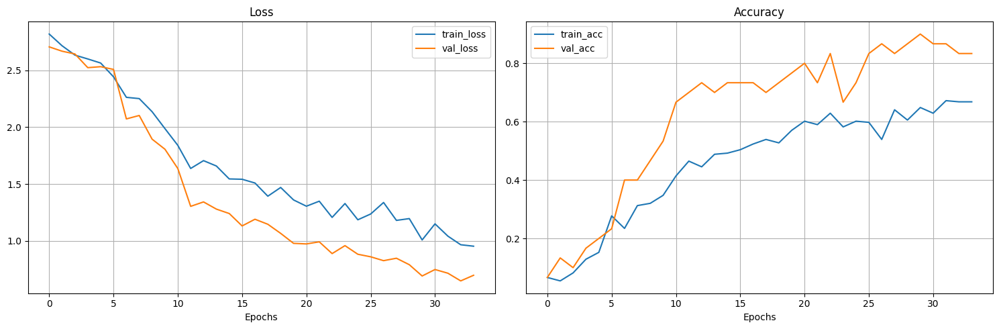

In [ ]:
# plot learning curves
plot_loss_curves(small_model_dropout_results[small_best_dropout_probs])

The power of dropout is clearly demonstrated on this small dataset, effectively eliminating overfitting.

Experiment 3: Try different hidden layer sizes.

In [ ]:
# experiment 3: hidden layer sizes
small_model_hidden_results = experiment_hidden_layer_sizes(train_dataloader=train_dataloader_small,
                                                           val_dataloader=val_dataloader_small,
                                                           num_epochs=num_epochs,
                                                           device=device,
                                                           num_classes=num_classes_small,
                                                           best_decay_value=small_best_decay_value,
                                                           best_dropout_probs_combo=small_best_dropout_probs,
                                                           hidden_layer_sizes_list=hidden_layer_sizes_list)

Experimenting with Hidden Layer Sizes
Hidden layer sizes combinations to try: [(32, 64, 64), (32, 32, 128), (64, 32, 64), (32, 32, 64), (64, 64, 32), (32, 64, 32)]

Testing hidden layer sizes combination: (32, 64, 64)...


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.9933 | train_acc: 0.0586 | val_loss: 2.7086 | val_acc: 0.0667
Epoch: 2 | train_loss: 2.7116 | train_acc: 0.1211 | val_loss: 2.6941 | val_acc: 0.1667
Epoch: 3 | train_loss: 2.6516 | train_acc: 0.1016 | val_loss: 2.6253 | val_acc: 0.2000
Epoch: 4 | train_loss: 2.6185 | train_acc: 0.1406 | val_loss: 2.5756 | val_acc: 0.2000
Epoch: 5 | train_loss: 2.4983 | train_acc: 0.1953 | val_loss: 2.2882 | val_acc: 0.3667
Epoch: 6 | train_loss: 2.4366 | train_acc: 0.2422 | val_loss: 2.1474 | val_acc: 0.3333
Epoch: 7 | train_loss: 2.1584 | train_acc: 0.3359 | val_loss: 1.7841 | val_acc: 0.4667
Epoch: 8 | train_loss: 2.0408 | train_acc: 0.3281 | val_loss: 1.6677 | val_acc: 0.3667
Epoch: 9 | train_loss: 1.8104 | train_acc: 0.4336 | val_loss: 1.6632 | val_acc: 0.6000
Epoch: 10 | train_loss: 1.9070 | train_acc: 0.4023 | val_loss: 1.5111 | val_acc: 0.4333
Epoch: 11 | train_loss: 1.9048 | train_acc: 0.4180 | val_loss: 1.5317 | val_acc: 0.4667
Epoch: 12 | train_loss: 1.6502 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 3.8156 | train_acc: 0.0586 | val_loss: 2.6994 | val_acc: 0.1333
Epoch: 2 | train_loss: 2.6671 | train_acc: 0.1094 | val_loss: 2.6580 | val_acc: 0.1000
Epoch: 3 | train_loss: 2.6733 | train_acc: 0.1133 | val_loss: 2.6542 | val_acc: 0.2000
Epoch: 4 | train_loss: 2.5972 | train_acc: 0.1406 | val_loss: 2.5528 | val_acc: 0.3000
Epoch: 5 | train_loss: 2.5052 | train_acc: 0.1680 | val_loss: 2.4479 | val_acc: 0.3333
Epoch: 6 | train_loss: 2.3867 | train_acc: 0.2539 | val_loss: 2.2988 | val_acc: 0.4000
Epoch: 7 | train_loss: 2.2752 | train_acc: 0.2930 | val_loss: 2.1059 | val_acc: 0.4333
Epoch: 8 | train_loss: 2.1283 | train_acc: 0.3008 | val_loss: 1.9923 | val_acc: 0.4667
Epoch: 9 | train_loss: 2.0294 | train_acc: 0.3750 | val_loss: 1.8508 | val_acc: 0.5000
Epoch: 10 | train_loss: 1.8444 | train_acc: 0.4102 | val_loss: 1.7022 | val_acc: 0.4667
Epoch: 11 | train_loss: 1.8207 | train_acc: 0.4297 | val_loss: 1.7011 | val_acc: 0.4667
Epoch: 12 | train_loss: 1.6569 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 3.1406 | train_acc: 0.0664 | val_loss: 2.7027 | val_acc: 0.0667
Epoch: 2 | train_loss: 2.6924 | train_acc: 0.1016 | val_loss: 2.6047 | val_acc: 0.0667
Epoch: 3 | train_loss: 2.6549 | train_acc: 0.1055 | val_loss: 2.6374 | val_acc: 0.1333
Epoch: 4 | train_loss: 2.6301 | train_acc: 0.1211 | val_loss: 2.6909 | val_acc: 0.1333
Epoch: 5 | train_loss: 2.5471 | train_acc: 0.1484 | val_loss: 2.4557 | val_acc: 0.3000
Epoch: 6 | train_loss: 2.4972 | train_acc: 0.1641 | val_loss: 2.3397 | val_acc: 0.4333
Epoch: 7 | train_loss: 2.2883 | train_acc: 0.2461 | val_loss: 2.1699 | val_acc: 0.2667
Epoch: 8 | train_loss: 2.3298 | train_acc: 0.2539 | val_loss: 2.0049 | val_acc: 0.4333
Epoch: 9 | train_loss: 2.1544 | train_acc: 0.3203 | val_loss: 1.7873 | val_acc: 0.5000
Epoch: 10 | train_loss: 1.9774 | train_acc: 0.3320 | val_loss: 1.6766 | val_acc: 0.5667
Epoch: 11 | train_loss: 1.8724 | train_acc: 0.3789 | val_loss: 1.4959 | val_acc: 0.6000
Epoch: 12 | train_loss: 1.7418 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.8459 | train_acc: 0.0625 | val_loss: 2.7041 | val_acc: 0.0667
Epoch: 2 | train_loss: 2.6976 | train_acc: 0.0742 | val_loss: 2.6940 | val_acc: 0.0667
Epoch: 3 | train_loss: 2.6770 | train_acc: 0.0977 | val_loss: 2.5992 | val_acc: 0.1333
Epoch: 4 | train_loss: 2.4880 | train_acc: 0.1562 | val_loss: 2.2973 | val_acc: 0.3000
Epoch: 5 | train_loss: 2.4158 | train_acc: 0.2461 | val_loss: 2.2324 | val_acc: 0.4000
Epoch: 6 | train_loss: 2.2121 | train_acc: 0.3086 | val_loss: 2.0008 | val_acc: 0.4333
Epoch: 7 | train_loss: 2.1079 | train_acc: 0.3359 | val_loss: 1.7476 | val_acc: 0.4667
Epoch: 8 | train_loss: 2.0359 | train_acc: 0.3594 | val_loss: 1.5838 | val_acc: 0.5000
Epoch: 9 | train_loss: 1.9173 | train_acc: 0.3750 | val_loss: 1.5918 | val_acc: 0.5333
Epoch: 10 | train_loss: 1.8057 | train_acc: 0.4727 | val_loss: 1.6236 | val_acc: 0.4333
Epoch: 11 | train_loss: 1.7147 | train_acc: 0.4297 | val_loss: 1.3215 | val_acc: 0.6667
Epoch: 12 | train_loss: 1.6753 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.9213 | train_acc: 0.0469 | val_loss: 2.7045 | val_acc: 0.0667
Epoch: 2 | train_loss: 2.7301 | train_acc: 0.0781 | val_loss: 2.6959 | val_acc: 0.1667
Epoch: 3 | train_loss: 2.6495 | train_acc: 0.0977 | val_loss: 2.5742 | val_acc: 0.1667
Epoch: 4 | train_loss: 2.5704 | train_acc: 0.1445 | val_loss: 2.5284 | val_acc: 0.3333
Epoch: 5 | train_loss: 2.4328 | train_acc: 0.2266 | val_loss: 2.3426 | val_acc: 0.2333
Epoch: 6 | train_loss: 2.3419 | train_acc: 0.2539 | val_loss: 2.0228 | val_acc: 0.3333
Epoch: 7 | train_loss: 2.1746 | train_acc: 0.2734 | val_loss: 1.7388 | val_acc: 0.4333
Epoch: 8 | train_loss: 1.9541 | train_acc: 0.3750 | val_loss: 1.8234 | val_acc: 0.4000
Epoch: 9 | train_loss: 1.9554 | train_acc: 0.3477 | val_loss: 1.5459 | val_acc: 0.4667
Epoch: 10 | train_loss: 1.7690 | train_acc: 0.4180 | val_loss: 1.3527 | val_acc: 0.7000
Epoch: 11 | train_loss: 1.6038 | train_acc: 0.4766 | val_loss: 1.4275 | val_acc: 0.5667
Epoch: 12 | train_loss: 1.8698 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.8645 | train_acc: 0.0781 | val_loss: 2.7008 | val_acc: 0.1333
Epoch: 2 | train_loss: 2.7111 | train_acc: 0.0742 | val_loss: 2.6959 | val_acc: 0.1000
Epoch: 3 | train_loss: 2.6918 | train_acc: 0.0898 | val_loss: 2.6731 | val_acc: 0.1667
Epoch: 4 | train_loss: 2.5672 | train_acc: 0.1562 | val_loss: 2.5052 | val_acc: 0.2667
Epoch: 5 | train_loss: 2.4718 | train_acc: 0.1875 | val_loss: 2.4563 | val_acc: 0.2000
Epoch: 6 | train_loss: 2.4141 | train_acc: 0.2109 | val_loss: 2.3189 | val_acc: 0.4333
Epoch: 7 | train_loss: 2.3114 | train_acc: 0.2656 | val_loss: 2.1861 | val_acc: 0.4667
Epoch: 8 | train_loss: 2.2508 | train_acc: 0.3008 | val_loss: 2.0187 | val_acc: 0.5000
Epoch: 9 | train_loss: 2.0166 | train_acc: 0.3281 | val_loss: 1.8301 | val_acc: 0.5667
Epoch: 10 | train_loss: 2.0766 | train_acc: 0.3477 | val_loss: 1.7411 | val_acc: 0.6667
Epoch: 11 | train_loss: 1.9293 | train_acc: 0.3906 | val_loss: 1.4975 | val_acc: 0.5000
Epoch: 12 | train_loss: 1.7621 | train_ac

In [ ]:
# put all results in a table and print it
hidden_size_results_list = [(combo, small_model_hidden_results[combo]['generalization_gap'], small_model_hidden_results[combo]['val_acc'][-1]) for combo in small_model_hidden_results]
hidden_size_results_df = pd.DataFrame(hidden_size_results_list, columns=['Hidden Layer Sizes', 'Generalization Gap', 'Validation Accuracy'])
hidden_size_df = hidden_size_results_df.sort_values(by='Validation Accuracy', ascending=False)
print("\n", hidden_size_df.to_string(index=False))


 Hidden Layer Sizes  Generalization Gap  Validation Accuracy
      (64, 32, 64)           -0.177344             0.900000
      (32, 64, 32)           -0.190885             0.866667
      (32, 32, 64)           -0.081250             0.800000
     (32, 32, 128)           -0.092969             0.800000
      (64, 64, 32)           -0.057813             0.800000
      (32, 64, 64)            0.010938             0.700000


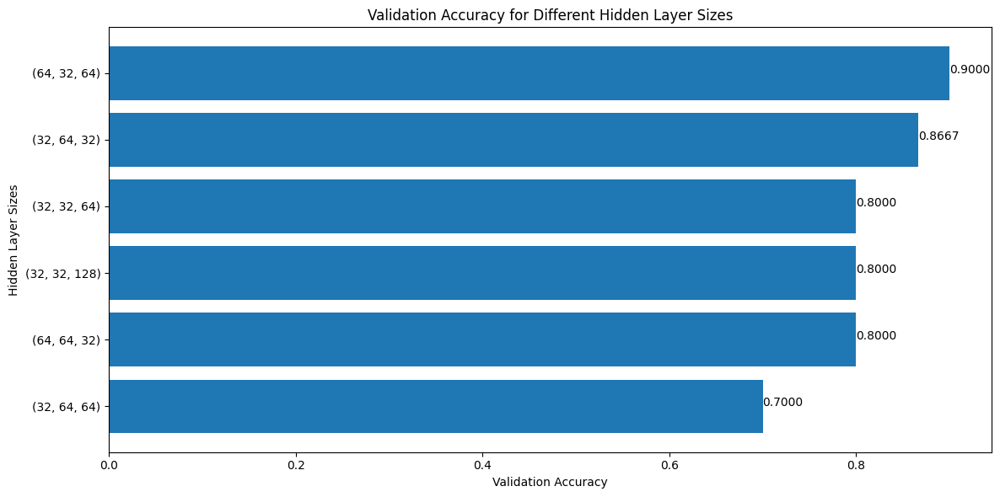

In [ ]:
# plot the results of hidden layer sizes experiment
plot_hidden_layer_results(hidden_size_df)

In [ ]:
small_best_hidden_units = hidden_size_df.iloc[0]['Hidden Layer Sizes']
print(f"Best hidden layer sizes: {small_best_hidden_units}")

Best hidden layer sizes: (64, 32, 64)


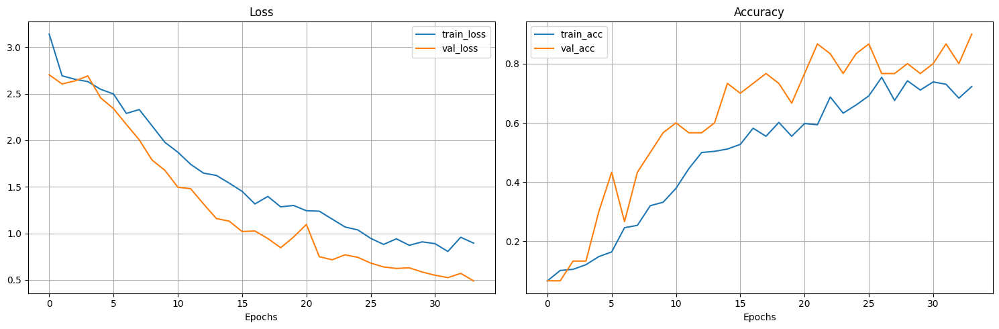

In [ ]:
# plot curves to verify that overfitting is not here
plot_loss_curves(small_model_hidden_results[small_best_hidden_units])

The plot confirms that overfitting has been eliminated, with the curves aligning exactly as desired.

Experiment 4. Try different optimizers and learning rates.

In [ ]:
# experiment 4: optimizers and learning rates
small_model_opt_results = experiment_optimizers_and_learning_rates(train_dataloader=train_dataloader_small,
                                                                   val_dataloader=val_dataloader_small,
                                                                   num_epochs=num_epochs,
                                                                   device=device,
                                                                   num_classes=num_classes_small,
                                                                   best_hidden_units_combo=small_best_hidden_units,
                                                                   best_decay_value=small_best_decay_value,
                                                                   best_dropout_probs_combo=small_best_dropout_probs,
                                                                   learning_rates_list=learning_rates_list)

Experimenting with Optimizers and Learning Rates
Learning rates to try: [0.01, 0.001, 0.0001, 1e-05, 1e-06]
Optimizers to try: ['SGD', 'RMSprop', 'Adam', 'AdamW', 'NAdam']

Testing SGD optimizer...

Learning rate: 0.01... 



  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.7452 | train_acc: 0.0586 | val_loss: 2.7111 | val_acc: 0.0667
Epoch: 2 | train_loss: 2.7148 | train_acc: 0.0703 | val_loss: 2.7053 | val_acc: 0.1667
Epoch: 3 | train_loss: 2.7071 | train_acc: 0.0703 | val_loss: 2.7005 | val_acc: 0.1333
Epoch: 4 | train_loss: 2.6931 | train_acc: 0.1094 | val_loss: 2.6960 | val_acc: 0.1667
Epoch: 5 | train_loss: 2.6754 | train_acc: 0.1172 | val_loss: 2.6905 | val_acc: 0.1667
Epoch: 6 | train_loss: 2.6749 | train_acc: 0.0898 | val_loss: 2.6847 | val_acc: 0.2000
Epoch: 7 | train_loss: 2.6820 | train_acc: 0.0703 | val_loss: 2.6789 | val_acc: 0.2333
Epoch: 8 | train_loss: 2.6714 | train_acc: 0.0742 | val_loss: 2.6729 | val_acc: 0.1333
Epoch: 9 | train_loss: 2.6625 | train_acc: 0.0859 | val_loss: 2.6688 | val_acc: 0.1667
Epoch: 10 | train_loss: 2.6598 | train_acc: 0.1133 | val_loss: 2.6618 | val_acc: 0.1000
Epoch: 11 | train_loss: 2.6478 | train_acc: 0.1055 | val_loss: 2.6567 | val_acc: 0.1000
Epoch: 12 | train_loss: 2.6654 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.7525 | train_acc: 0.0312 | val_loss: 2.7134 | val_acc: 0.0000
Epoch: 2 | train_loss: 2.7135 | train_acc: 0.0703 | val_loss: 2.7128 | val_acc: 0.0000
Epoch: 3 | train_loss: 2.7205 | train_acc: 0.0781 | val_loss: 2.7122 | val_acc: 0.0000
Epoch: 4 | train_loss: 2.7550 | train_acc: 0.0391 | val_loss: 2.7114 | val_acc: 0.0000
Epoch: 5 | train_loss: 2.7399 | train_acc: 0.0742 | val_loss: 2.7106 | val_acc: 0.0000
Epoch: 6 | train_loss: 2.7388 | train_acc: 0.0547 | val_loss: 2.7098 | val_acc: 0.0000
Epoch: 7 | train_loss: 2.7358 | train_acc: 0.0742 | val_loss: 2.7091 | val_acc: 0.0000
Epoch: 8 | train_loss: 2.7109 | train_acc: 0.0547 | val_loss: 2.7086 | val_acc: 0.0000
Epoch: 9 | train_loss: 2.7105 | train_acc: 0.1016 | val_loss: 2.7081 | val_acc: 0.0000
Epoch: 10 | train_loss: 2.7352 | train_acc: 0.0664 | val_loss: 2.7076 | val_acc: 0.0333
Epoch: 11 | train_loss: 2.7367 | train_acc: 0.0508 | val_loss: 2.7072 | val_acc: 0.0333
Epoch: 12 | train_loss: 2.7058 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.6966 | train_acc: 0.0820 | val_loss: 2.7060 | val_acc: 0.1333
Epoch: 2 | train_loss: 2.7237 | train_acc: 0.0352 | val_loss: 2.7059 | val_acc: 0.1333
Epoch: 3 | train_loss: 2.7352 | train_acc: 0.0859 | val_loss: 2.7058 | val_acc: 0.1333
Epoch: 4 | train_loss: 2.7145 | train_acc: 0.0781 | val_loss: 2.7058 | val_acc: 0.1333
Epoch: 5 | train_loss: 2.7304 | train_acc: 0.0508 | val_loss: 2.7057 | val_acc: 0.1333
Epoch: 6 | train_loss: 2.7564 | train_acc: 0.0664 | val_loss: 2.7057 | val_acc: 0.1333
Epoch: 7 | train_loss: 2.7482 | train_acc: 0.0625 | val_loss: 2.7056 | val_acc: 0.1333
Epoch: 8 | train_loss: 2.7266 | train_acc: 0.0703 | val_loss: 2.7055 | val_acc: 0.1333
Epoch: 9 | train_loss: 2.7497 | train_acc: 0.0469 | val_loss: 2.7055 | val_acc: 0.1333
Epoch: 10 | train_loss: 2.7183 | train_acc: 0.0391 | val_loss: 2.7054 | val_acc: 0.1333
Epoch: 11 | train_loss: 2.7284 | train_acc: 0.0820 | val_loss: 2.7054 | val_acc: 0.1333
Epoch: 12 | train_loss: 2.7407 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.7147 | train_acc: 0.1016 | val_loss: 2.7199 | val_acc: 0.0667
Epoch: 2 | train_loss: 2.7410 | train_acc: 0.0781 | val_loss: 2.7199 | val_acc: 0.0667
Epoch: 3 | train_loss: 2.6955 | train_acc: 0.1055 | val_loss: 2.7199 | val_acc: 0.0667
Epoch: 4 | train_loss: 2.7835 | train_acc: 0.0508 | val_loss: 2.7199 | val_acc: 0.0667
Epoch: 5 | train_loss: 2.7501 | train_acc: 0.0586 | val_loss: 2.7199 | val_acc: 0.0667
Epoch: 6 | train_loss: 2.7219 | train_acc: 0.0625 | val_loss: 2.7199 | val_acc: 0.0667
Epoch: 7 | train_loss: 2.7561 | train_acc: 0.0625 | val_loss: 2.7199 | val_acc: 0.0667
Epoch: 8 | train_loss: 2.7426 | train_acc: 0.0547 | val_loss: 2.7199 | val_acc: 0.0667
Epoch: 9 | train_loss: 2.7683 | train_acc: 0.0625 | val_loss: 2.7198 | val_acc: 0.0667
Epoch: 10 | train_loss: 2.7592 | train_acc: 0.0547 | val_loss: 2.7198 | val_acc: 0.0667
Epoch: 11 | train_loss: 2.7560 | train_acc: 0.0547 | val_loss: 2.7198 | val_acc: 0.0667
Epoch: 12 | train_loss: 2.7599 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.7442 | train_acc: 0.0898 | val_loss: 2.7157 | val_acc: 0.0667
Epoch: 2 | train_loss: 2.7635 | train_acc: 0.0703 | val_loss: 2.7157 | val_acc: 0.0667
Epoch: 3 | train_loss: 2.7514 | train_acc: 0.0625 | val_loss: 2.7157 | val_acc: 0.0667
Epoch: 4 | train_loss: 2.7363 | train_acc: 0.0547 | val_loss: 2.7157 | val_acc: 0.0667
Epoch: 5 | train_loss: 2.7514 | train_acc: 0.0938 | val_loss: 2.7157 | val_acc: 0.0667
Epoch: 6 | train_loss: 2.7607 | train_acc: 0.0898 | val_loss: 2.7157 | val_acc: 0.0667
Epoch: 7 | train_loss: 2.7592 | train_acc: 0.0664 | val_loss: 2.7157 | val_acc: 0.0667
Epoch: 8 | train_loss: 2.7394 | train_acc: 0.0820 | val_loss: 2.7157 | val_acc: 0.0667
Epoch: 9 | train_loss: 2.7407 | train_acc: 0.0820 | val_loss: 2.7157 | val_acc: 0.0667
Epoch: 10 | train_loss: 2.7300 | train_acc: 0.0938 | val_loss: 2.7157 | val_acc: 0.0667
Epoch: 11 | train_loss: 2.7214 | train_acc: 0.0859 | val_loss: 2.7157 | val_acc: 0.0667
Epoch: 12 | train_loss: 2.7412 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 3218.9287 | train_acc: 0.0586 | val_loss: 3.0606 | val_acc: 0.0667
Epoch: 2 | train_loss: 5.1162 | train_acc: 0.0391 | val_loss: 2.7663 | val_acc: 0.0667
Epoch: 3 | train_loss: 3.5512 | train_acc: 0.1055 | val_loss: 2.7432 | val_acc: 0.0667
Epoch: 4 | train_loss: 3.4492 | train_acc: 0.0664 | val_loss: 2.7215 | val_acc: 0.0667
Epoch: 5 | train_loss: 3.1476 | train_acc: 0.0703 | val_loss: 2.7208 | val_acc: 0.0667
Epoch: 6 | train_loss: 2.9843 | train_acc: 0.0977 | val_loss: 2.7180 | val_acc: 0.0667
Epoch: 7 | train_loss: 3.0833 | train_acc: 0.0625 | val_loss: 2.7177 | val_acc: 0.0667
Epoch: 8 | train_loss: 3.1294 | train_acc: 0.0664 | val_loss: 2.7110 | val_acc: 0.0667
Epoch: 9 | train_loss: 2.9156 | train_acc: 0.0547 | val_loss: 2.7149 | val_acc: 0.0667
Epoch: 10 | train_loss: 2.9100 | train_acc: 0.0977 | val_loss: 2.7177 | val_acc: 0.0667
Epoch: 11 | train_loss: 2.8027 | train_acc: 0.0469 | val_loss: 2.7164 | val_acc: 0.0667
Epoch: 12 | train_loss: 2.9803 | train

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.9939 | train_acc: 0.0430 | val_loss: 2.7004 | val_acc: 0.1000
Epoch: 2 | train_loss: 2.7131 | train_acc: 0.0625 | val_loss: 2.6453 | val_acc: 0.1000
Epoch: 3 | train_loss: 2.5700 | train_acc: 0.1445 | val_loss: 2.3689 | val_acc: 0.3333
Epoch: 4 | train_loss: 2.5003 | train_acc: 0.2070 | val_loss: 2.2055 | val_acc: 0.4667
Epoch: 5 | train_loss: 2.2364 | train_acc: 0.2539 | val_loss: 1.8413 | val_acc: 0.4000
Epoch: 6 | train_loss: 2.0344 | train_acc: 0.3555 | val_loss: 1.6200 | val_acc: 0.6667
Epoch: 7 | train_loss: 1.9780 | train_acc: 0.3906 | val_loss: 1.5382 | val_acc: 0.6000
Epoch: 8 | train_loss: 1.7949 | train_acc: 0.4297 | val_loss: 1.5603 | val_acc: 0.5333
Epoch: 9 | train_loss: 1.7852 | train_acc: 0.4180 | val_loss: 1.4170 | val_acc: 0.6333
Epoch: 10 | train_loss: 1.6771 | train_acc: 0.4492 | val_loss: 1.4595 | val_acc: 0.4667
Epoch: 11 | train_loss: 1.5770 | train_acc: 0.4961 | val_loss: 1.3870 | val_acc: 0.5333
Epoch: 12 | train_loss: 1.4925 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.7342 | train_acc: 0.0508 | val_loss: 2.6879 | val_acc: 0.1333
Epoch: 2 | train_loss: 2.6901 | train_acc: 0.0547 | val_loss: 2.6756 | val_acc: 0.1333
Epoch: 3 | train_loss: 2.6660 | train_acc: 0.0859 | val_loss: 2.6629 | val_acc: 0.1667
Epoch: 4 | train_loss: 2.6565 | train_acc: 0.0820 | val_loss: 2.6527 | val_acc: 0.1667
Epoch: 5 | train_loss: 2.6657 | train_acc: 0.0820 | val_loss: 2.6461 | val_acc: 0.1333
Epoch: 6 | train_loss: 2.6204 | train_acc: 0.1211 | val_loss: 2.6311 | val_acc: 0.1333
Epoch: 7 | train_loss: 2.6281 | train_acc: 0.1172 | val_loss: 2.6195 | val_acc: 0.1000
Epoch: 8 | train_loss: 2.5983 | train_acc: 0.1562 | val_loss: 2.6109 | val_acc: 0.1000
Epoch: 9 | train_loss: 2.5628 | train_acc: 0.1523 | val_loss: 2.5865 | val_acc: 0.1333
Epoch: 10 | train_loss: 2.5514 | train_acc: 0.1133 | val_loss: 2.5698 | val_acc: 0.1333
Epoch: 11 | train_loss: 2.5219 | train_acc: 0.1484 | val_loss: 2.5465 | val_acc: 0.1000
Epoch: 12 | train_loss: 2.5232 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.7207 | train_acc: 0.1055 | val_loss: 2.7029 | val_acc: 0.0667
Epoch: 2 | train_loss: 2.7255 | train_acc: 0.0430 | val_loss: 2.7014 | val_acc: 0.0667
Epoch: 3 | train_loss: 2.7128 | train_acc: 0.0781 | val_loss: 2.7000 | val_acc: 0.1000
Epoch: 4 | train_loss: 2.7087 | train_acc: 0.0820 | val_loss: 2.6991 | val_acc: 0.0667
Epoch: 5 | train_loss: 2.7088 | train_acc: 0.0820 | val_loss: 2.6980 | val_acc: 0.1000
Epoch: 6 | train_loss: 2.6910 | train_acc: 0.0938 | val_loss: 2.6973 | val_acc: 0.1000
Epoch: 7 | train_loss: 2.7267 | train_acc: 0.0586 | val_loss: 2.6965 | val_acc: 0.1000
Epoch: 8 | train_loss: 2.7328 | train_acc: 0.0742 | val_loss: 2.6959 | val_acc: 0.1000
Epoch: 9 | train_loss: 2.6896 | train_acc: 0.0898 | val_loss: 2.6952 | val_acc: 0.0667
Epoch: 10 | train_loss: 2.7188 | train_acc: 0.0742 | val_loss: 2.6948 | val_acc: 0.0667
Epoch: 11 | train_loss: 2.6966 | train_acc: 0.0820 | val_loss: 2.6943 | val_acc: 0.0667
Epoch: 12 | train_loss: 2.7076 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.7335 | train_acc: 0.0508 | val_loss: 2.6989 | val_acc: 0.0667
Epoch: 2 | train_loss: 2.7273 | train_acc: 0.0273 | val_loss: 2.6988 | val_acc: 0.0667
Epoch: 3 | train_loss: 2.7407 | train_acc: 0.0586 | val_loss: 2.6986 | val_acc: 0.0667
Epoch: 4 | train_loss: 2.7154 | train_acc: 0.0781 | val_loss: 2.6985 | val_acc: 0.0667
Epoch: 5 | train_loss: 2.7190 | train_acc: 0.0742 | val_loss: 2.6985 | val_acc: 0.0667
Epoch: 6 | train_loss: 2.6984 | train_acc: 0.0859 | val_loss: 2.6984 | val_acc: 0.1000
Epoch: 7 | train_loss: 2.7271 | train_acc: 0.0586 | val_loss: 2.6983 | val_acc: 0.1000
Epoch: 8 | train_loss: 2.7149 | train_acc: 0.0898 | val_loss: 2.6983 | val_acc: 0.1000
Epoch: 9 | train_loss: 2.7303 | train_acc: 0.0586 | val_loss: 2.6982 | val_acc: 0.1000
Epoch: 10 | train_loss: 2.7349 | train_acc: 0.0703 | val_loss: 2.6982 | val_acc: 0.1000
Epoch: 11 | train_loss: 2.7344 | train_acc: 0.0430 | val_loss: 2.6982 | val_acc: 0.1000
Epoch: 12 | train_loss: 2.7249 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.9005 | train_acc: 0.0586 | val_loss: 2.7089 | val_acc: 0.0667
Epoch: 2 | train_loss: 2.7314 | train_acc: 0.0781 | val_loss: 2.6759 | val_acc: 0.1333
Epoch: 3 | train_loss: 2.6531 | train_acc: 0.1445 | val_loss: 2.5839 | val_acc: 0.1333
Epoch: 4 | train_loss: 2.7115 | train_acc: 0.1562 | val_loss: 2.6959 | val_acc: 0.1000
Epoch: 5 | train_loss: 2.5931 | train_acc: 0.1016 | val_loss: 2.4654 | val_acc: 0.1667
Epoch: 6 | train_loss: 2.5483 | train_acc: 0.1406 | val_loss: 2.3255 | val_acc: 0.2667
Epoch: 7 | train_loss: 2.6905 | train_acc: 0.1836 | val_loss: 2.7137 | val_acc: 0.0667
Epoch: 8 | train_loss: 2.6360 | train_acc: 0.0977 | val_loss: 2.5830 | val_acc: 0.1000
Epoch: 9 | train_loss: 2.6884 | train_acc: 0.1289 | val_loss: 2.2580 | val_acc: 0.2667
Epoch: 10 | train_loss: 2.5619 | train_acc: 0.1602 | val_loss: 2.6617 | val_acc: 0.1000
Epoch: 11 | train_loss: 2.5654 | train_acc: 0.1406 | val_loss: 2.4289 | val_acc: 0.2333
Epoch: 12 | train_loss: 2.6147 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.7209 | train_acc: 0.0586 | val_loss: 2.6830 | val_acc: 0.1000
Epoch: 2 | train_loss: 2.6380 | train_acc: 0.0977 | val_loss: 2.6363 | val_acc: 0.1000
Epoch: 3 | train_loss: 2.6413 | train_acc: 0.1172 | val_loss: 2.5795 | val_acc: 0.1667
Epoch: 4 | train_loss: 2.5707 | train_acc: 0.1289 | val_loss: 2.5790 | val_acc: 0.2000
Epoch: 5 | train_loss: 2.4751 | train_acc: 0.1797 | val_loss: 2.4068 | val_acc: 0.3667
Epoch: 6 | train_loss: 2.3972 | train_acc: 0.2070 | val_loss: 2.3527 | val_acc: 0.4333
Epoch: 7 | train_loss: 2.2705 | train_acc: 0.2422 | val_loss: 2.1419 | val_acc: 0.4333
Epoch: 8 | train_loss: 2.2951 | train_acc: 0.2500 | val_loss: 2.1099 | val_acc: 0.5667
Epoch: 9 | train_loss: 2.1269 | train_acc: 0.3203 | val_loss: 1.9534 | val_acc: 0.4667
Epoch: 10 | train_loss: 1.9981 | train_acc: 0.3281 | val_loss: 1.7413 | val_acc: 0.5333
Epoch: 11 | train_loss: 1.9437 | train_acc: 0.3906 | val_loss: 1.6686 | val_acc: 0.6000
Epoch: 12 | train_loss: 1.8482 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.7312 | train_acc: 0.0938 | val_loss: 2.7115 | val_acc: 0.1667
Epoch: 2 | train_loss: 2.6930 | train_acc: 0.0664 | val_loss: 2.7080 | val_acc: 0.1333
Epoch: 3 | train_loss: 2.6963 | train_acc: 0.0742 | val_loss: 2.7043 | val_acc: 0.1000
Epoch: 4 | train_loss: 2.7056 | train_acc: 0.0547 | val_loss: 2.7003 | val_acc: 0.1333
Epoch: 5 | train_loss: 2.7125 | train_acc: 0.0859 | val_loss: 2.6971 | val_acc: 0.1000
Epoch: 6 | train_loss: 2.6809 | train_acc: 0.0781 | val_loss: 2.6937 | val_acc: 0.1333
Epoch: 7 | train_loss: 2.6780 | train_acc: 0.0547 | val_loss: 2.6902 | val_acc: 0.1000
Epoch: 8 | train_loss: 2.6755 | train_acc: 0.0742 | val_loss: 2.6863 | val_acc: 0.0333
Epoch: 9 | train_loss: 2.6667 | train_acc: 0.0820 | val_loss: 2.6829 | val_acc: 0.0667
Epoch: 10 | train_loss: 2.6484 | train_acc: 0.0820 | val_loss: 2.6777 | val_acc: 0.0000
Epoch: 11 | train_loss: 2.6358 | train_acc: 0.0977 | val_loss: 2.6719 | val_acc: 0.0000
Epoch: 12 | train_loss: 2.6211 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.7237 | train_acc: 0.0586 | val_loss: 2.7152 | val_acc: 0.0667
Epoch: 2 | train_loss: 2.7242 | train_acc: 0.0820 | val_loss: 2.7147 | val_acc: 0.0667
Epoch: 3 | train_loss: 2.7425 | train_acc: 0.0664 | val_loss: 2.7140 | val_acc: 0.0667
Epoch: 4 | train_loss: 2.7342 | train_acc: 0.0547 | val_loss: 2.7134 | val_acc: 0.0667
Epoch: 5 | train_loss: 2.7192 | train_acc: 0.0859 | val_loss: 2.7127 | val_acc: 0.0667
Epoch: 6 | train_loss: 2.7448 | train_acc: 0.0625 | val_loss: 2.7121 | val_acc: 0.0667
Epoch: 7 | train_loss: 2.7278 | train_acc: 0.0469 | val_loss: 2.7116 | val_acc: 0.0667
Epoch: 8 | train_loss: 2.7273 | train_acc: 0.0547 | val_loss: 2.7110 | val_acc: 0.0667
Epoch: 9 | train_loss: 2.7326 | train_acc: 0.0391 | val_loss: 2.7104 | val_acc: 0.0667
Epoch: 10 | train_loss: 2.7369 | train_acc: 0.0664 | val_loss: 2.7099 | val_acc: 0.0667
Epoch: 11 | train_loss: 2.7320 | train_acc: 0.0469 | val_loss: 2.7094 | val_acc: 0.0667
Epoch: 12 | train_loss: 2.7305 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.7179 | train_acc: 0.0703 | val_loss: 2.7110 | val_acc: 0.0000
Epoch: 2 | train_loss: 2.7218 | train_acc: 0.0820 | val_loss: 2.7109 | val_acc: 0.0000
Epoch: 3 | train_loss: 2.7319 | train_acc: 0.0859 | val_loss: 2.7108 | val_acc: 0.0000
Epoch: 4 | train_loss: 2.6946 | train_acc: 0.0742 | val_loss: 2.7108 | val_acc: 0.0000
Epoch: 5 | train_loss: 2.7354 | train_acc: 0.0391 | val_loss: 2.7107 | val_acc: 0.0000
Epoch: 6 | train_loss: 2.7550 | train_acc: 0.0586 | val_loss: 2.7106 | val_acc: 0.0000
Epoch: 7 | train_loss: 2.7139 | train_acc: 0.1055 | val_loss: 2.7106 | val_acc: 0.0000
Epoch: 8 | train_loss: 2.7407 | train_acc: 0.0742 | val_loss: 2.7105 | val_acc: 0.0000
Epoch: 9 | train_loss: 2.7402 | train_acc: 0.0664 | val_loss: 2.7104 | val_acc: 0.0000
Epoch: 10 | train_loss: 2.7130 | train_acc: 0.0625 | val_loss: 2.7104 | val_acc: 0.0000
Epoch: 11 | train_loss: 2.7158 | train_acc: 0.0781 | val_loss: 2.7103 | val_acc: 0.0000
Epoch: 12 | train_loss: 2.7262 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 3.0935 | train_acc: 0.0430 | val_loss: 2.7124 | val_acc: 0.0667
Epoch: 2 | train_loss: 2.7173 | train_acc: 0.0859 | val_loss: 2.7105 | val_acc: 0.0667
Epoch: 3 | train_loss: 2.7422 | train_acc: 0.0781 | val_loss: 2.7093 | val_acc: 0.0667
Epoch: 4 | train_loss: 2.6969 | train_acc: 0.0977 | val_loss: 2.6874 | val_acc: 0.1667
Epoch: 5 | train_loss: 2.7369 | train_acc: 0.0820 | val_loss: 2.7105 | val_acc: 0.0667
Epoch: 6 | train_loss: 2.7286 | train_acc: 0.0703 | val_loss: 2.7107 | val_acc: 0.0667
Epoch: 7 | train_loss: 2.7055 | train_acc: 0.0820 | val_loss: 2.7107 | val_acc: 0.0667
Epoch: 8 | train_loss: 2.7126 | train_acc: 0.0859 | val_loss: 2.6766 | val_acc: 0.1000
Epoch: 9 | train_loss: 2.7269 | train_acc: 0.0664 | val_loss: 2.6043 | val_acc: 0.1000
Epoch: 10 | train_loss: 2.7457 | train_acc: 0.0586 | val_loss: 2.7105 | val_acc: 0.0667
Epoch: 11 | train_loss: 2.7149 | train_acc: 0.0430 | val_loss: 2.6960 | val_acc: 0.1667
Epoch: 12 | train_loss: 2.7196 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.7122 | train_acc: 0.0859 | val_loss: 2.6671 | val_acc: 0.1000
Epoch: 2 | train_loss: 2.6364 | train_acc: 0.1094 | val_loss: 2.6488 | val_acc: 0.1000
Epoch: 3 | train_loss: 2.6410 | train_acc: 0.1172 | val_loss: 2.6292 | val_acc: 0.1000
Epoch: 4 | train_loss: 2.5729 | train_acc: 0.1289 | val_loss: 2.5560 | val_acc: 0.2667
Epoch: 5 | train_loss: 2.5286 | train_acc: 0.1484 | val_loss: 2.4343 | val_acc: 0.3000
Epoch: 6 | train_loss: 2.4808 | train_acc: 0.2344 | val_loss: 2.3474 | val_acc: 0.4333
Epoch: 7 | train_loss: 2.3242 | train_acc: 0.2578 | val_loss: 2.1388 | val_acc: 0.4667
Epoch: 8 | train_loss: 2.2360 | train_acc: 0.3086 | val_loss: 2.0732 | val_acc: 0.5667
Epoch: 9 | train_loss: 2.1709 | train_acc: 0.3594 | val_loss: 1.8964 | val_acc: 0.5667
Epoch: 10 | train_loss: 1.9392 | train_acc: 0.3320 | val_loss: 1.8229 | val_acc: 0.5333
Epoch: 11 | train_loss: 1.9050 | train_acc: 0.4062 | val_loss: 1.6339 | val_acc: 0.6000
Epoch: 12 | train_loss: 1.7858 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.7499 | train_acc: 0.0430 | val_loss: 2.7062 | val_acc: 0.0667
Epoch: 2 | train_loss: 2.7150 | train_acc: 0.0898 | val_loss: 2.7019 | val_acc: 0.0667
Epoch: 3 | train_loss: 2.7104 | train_acc: 0.0781 | val_loss: 2.6988 | val_acc: 0.0333
Epoch: 4 | train_loss: 2.6694 | train_acc: 0.0820 | val_loss: 2.6956 | val_acc: 0.0667
Epoch: 5 | train_loss: 2.6832 | train_acc: 0.0898 | val_loss: 2.6918 | val_acc: 0.0667
Epoch: 6 | train_loss: 2.6890 | train_acc: 0.0820 | val_loss: 2.6886 | val_acc: 0.1000
Epoch: 7 | train_loss: 2.6671 | train_acc: 0.0938 | val_loss: 2.6846 | val_acc: 0.1667
Epoch: 8 | train_loss: 2.6639 | train_acc: 0.0898 | val_loss: 2.6799 | val_acc: 0.1333
Epoch: 9 | train_loss: 2.6498 | train_acc: 0.1133 | val_loss: 2.6746 | val_acc: 0.1333
Epoch: 10 | train_loss: 2.6350 | train_acc: 0.0938 | val_loss: 2.6692 | val_acc: 0.1667
Epoch: 11 | train_loss: 2.6647 | train_acc: 0.1094 | val_loss: 2.6649 | val_acc: 0.1667
Epoch: 12 | train_loss: 2.6490 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.7411 | train_acc: 0.0586 | val_loss: 2.7094 | val_acc: 0.0667
Epoch: 2 | train_loss: 2.7197 | train_acc: 0.0898 | val_loss: 2.7088 | val_acc: 0.0667
Epoch: 3 | train_loss: 2.7284 | train_acc: 0.0859 | val_loss: 2.7081 | val_acc: 0.0667
Epoch: 4 | train_loss: 2.7215 | train_acc: 0.0547 | val_loss: 2.7076 | val_acc: 0.0667
Epoch: 5 | train_loss: 2.7571 | train_acc: 0.0430 | val_loss: 2.7070 | val_acc: 0.0667
Epoch: 6 | train_loss: 2.7206 | train_acc: 0.0742 | val_loss: 2.7064 | val_acc: 0.0667
Epoch: 7 | train_loss: 2.7558 | train_acc: 0.0547 | val_loss: 2.7059 | val_acc: 0.0667
Epoch: 8 | train_loss: 2.7373 | train_acc: 0.0820 | val_loss: 2.7052 | val_acc: 0.0667
Epoch: 9 | train_loss: 2.7180 | train_acc: 0.0781 | val_loss: 2.7043 | val_acc: 0.0667
Epoch: 10 | train_loss: 2.7534 | train_acc: 0.0625 | val_loss: 2.7037 | val_acc: 0.0667
Epoch: 11 | train_loss: 2.7280 | train_acc: 0.0820 | val_loss: 2.7031 | val_acc: 0.0667
Epoch: 12 | train_loss: 2.7270 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.7259 | train_acc: 0.0938 | val_loss: 2.7112 | val_acc: 0.0667
Epoch: 2 | train_loss: 2.7253 | train_acc: 0.0391 | val_loss: 2.7111 | val_acc: 0.0667
Epoch: 3 | train_loss: 2.7443 | train_acc: 0.0859 | val_loss: 2.7111 | val_acc: 0.0667
Epoch: 4 | train_loss: 2.7218 | train_acc: 0.0820 | val_loss: 2.7110 | val_acc: 0.0667
Epoch: 5 | train_loss: 2.7463 | train_acc: 0.0547 | val_loss: 2.7109 | val_acc: 0.0667
Epoch: 6 | train_loss: 2.7452 | train_acc: 0.0703 | val_loss: 2.7108 | val_acc: 0.0667
Epoch: 7 | train_loss: 2.7337 | train_acc: 0.0430 | val_loss: 2.7107 | val_acc: 0.0667
Epoch: 8 | train_loss: 2.7259 | train_acc: 0.0977 | val_loss: 2.7107 | val_acc: 0.0667
Epoch: 9 | train_loss: 2.7243 | train_acc: 0.0859 | val_loss: 2.7106 | val_acc: 0.0667
Epoch: 10 | train_loss: 2.7465 | train_acc: 0.0742 | val_loss: 2.7105 | val_acc: 0.0667
Epoch: 11 | train_loss: 2.7359 | train_acc: 0.0703 | val_loss: 2.7105 | val_acc: 0.0667
Epoch: 12 | train_loss: 2.7329 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.9556 | train_acc: 0.0469 | val_loss: 2.7103 | val_acc: 0.0667
Epoch: 2 | train_loss: 2.7198 | train_acc: 0.0312 | val_loss: 2.7151 | val_acc: 0.0667
Epoch: 3 | train_loss: 2.7355 | train_acc: 0.0664 | val_loss: 2.7141 | val_acc: 0.0667
Epoch: 4 | train_loss: 2.7365 | train_acc: 0.0469 | val_loss: 2.7090 | val_acc: 0.0667
Epoch: 5 | train_loss: 2.7246 | train_acc: 0.0508 | val_loss: 2.7086 | val_acc: 0.0667
Epoch: 6 | train_loss: 2.7231 | train_acc: 0.0312 | val_loss: 2.7089 | val_acc: 0.0667
Epoch: 7 | train_loss: 2.7139 | train_acc: 0.0664 | val_loss: 2.7087 | val_acc: 0.0667
Epoch: 8 | train_loss: 2.7230 | train_acc: 0.0586 | val_loss: 2.7087 | val_acc: 0.0667
Epoch: 9 | train_loss: 2.7164 | train_acc: 0.0586 | val_loss: 2.7088 | val_acc: 0.0667
Epoch: 10 | train_loss: 2.7241 | train_acc: 0.0508 | val_loss: 2.7090 | val_acc: 0.0667
Epoch: 11 | train_loss: 2.7119 | train_acc: 0.0703 | val_loss: 2.7088 | val_acc: 0.0667
Epoch: 12 | train_loss: 2.7234 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.7293 | train_acc: 0.0352 | val_loss: 2.6870 | val_acc: 0.1333
Epoch: 2 | train_loss: 2.6857 | train_acc: 0.0703 | val_loss: 2.6640 | val_acc: 0.1000
Epoch: 3 | train_loss: 2.6016 | train_acc: 0.1445 | val_loss: 2.5879 | val_acc: 0.0667
Epoch: 4 | train_loss: 2.5885 | train_acc: 0.1562 | val_loss: 2.5529 | val_acc: 0.2333
Epoch: 5 | train_loss: 2.5499 | train_acc: 0.1523 | val_loss: 2.4533 | val_acc: 0.3333
Epoch: 6 | train_loss: 2.2928 | train_acc: 0.3047 | val_loss: 2.1342 | val_acc: 0.3333
Epoch: 7 | train_loss: 2.2209 | train_acc: 0.2969 | val_loss: 2.0026 | val_acc: 0.5333
Epoch: 8 | train_loss: 2.0832 | train_acc: 0.3125 | val_loss: 1.8268 | val_acc: 0.6333
Epoch: 9 | train_loss: 1.9742 | train_acc: 0.3711 | val_loss: 1.7150 | val_acc: 0.4667
Epoch: 10 | train_loss: 2.0310 | train_acc: 0.3594 | val_loss: 1.6484 | val_acc: 0.6000
Epoch: 11 | train_loss: 1.7651 | train_acc: 0.4375 | val_loss: 1.5385 | val_acc: 0.5667
Epoch: 12 | train_loss: 1.6881 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.7089 | train_acc: 0.0859 | val_loss: 2.7114 | val_acc: 0.1000
Epoch: 2 | train_loss: 2.7356 | train_acc: 0.0938 | val_loss: 2.7069 | val_acc: 0.1000
Epoch: 3 | train_loss: 2.7316 | train_acc: 0.0703 | val_loss: 2.7036 | val_acc: 0.1000
Epoch: 4 | train_loss: 2.7051 | train_acc: 0.0898 | val_loss: 2.7004 | val_acc: 0.1000
Epoch: 5 | train_loss: 2.7099 | train_acc: 0.0625 | val_loss: 2.6977 | val_acc: 0.1333
Epoch: 6 | train_loss: 2.7161 | train_acc: 0.0625 | val_loss: 2.6953 | val_acc: 0.1333
Epoch: 7 | train_loss: 2.6879 | train_acc: 0.1016 | val_loss: 2.6927 | val_acc: 0.1000
Epoch: 8 | train_loss: 2.6902 | train_acc: 0.0820 | val_loss: 2.6897 | val_acc: 0.1000
Epoch: 9 | train_loss: 2.6810 | train_acc: 0.1094 | val_loss: 2.6867 | val_acc: 0.1000
Epoch: 10 | train_loss: 2.6785 | train_acc: 0.0781 | val_loss: 2.6838 | val_acc: 0.1000
Epoch: 11 | train_loss: 2.6696 | train_acc: 0.1094 | val_loss: 2.6790 | val_acc: 0.1000
Epoch: 12 | train_loss: 2.6504 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.7295 | train_acc: 0.1055 | val_loss: 2.7230 | val_acc: 0.0667
Epoch: 2 | train_loss: 2.7196 | train_acc: 0.0625 | val_loss: 2.7221 | val_acc: 0.0667
Epoch: 3 | train_loss: 2.7482 | train_acc: 0.0703 | val_loss: 2.7213 | val_acc: 0.0667
Epoch: 4 | train_loss: 2.7251 | train_acc: 0.0664 | val_loss: 2.7204 | val_acc: 0.0667
Epoch: 5 | train_loss: 2.7576 | train_acc: 0.0508 | val_loss: 2.7195 | val_acc: 0.0667
Epoch: 6 | train_loss: 2.7275 | train_acc: 0.0742 | val_loss: 2.7188 | val_acc: 0.0667
Epoch: 7 | train_loss: 2.7375 | train_acc: 0.0664 | val_loss: 2.7181 | val_acc: 0.0667
Epoch: 8 | train_loss: 2.7433 | train_acc: 0.0469 | val_loss: 2.7174 | val_acc: 0.0667
Epoch: 9 | train_loss: 2.7338 | train_acc: 0.0742 | val_loss: 2.7166 | val_acc: 0.0667
Epoch: 10 | train_loss: 2.7499 | train_acc: 0.0508 | val_loss: 2.7158 | val_acc: 0.0667
Epoch: 11 | train_loss: 2.7384 | train_acc: 0.0742 | val_loss: 2.7151 | val_acc: 0.0667
Epoch: 12 | train_loss: 2.7112 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.7306 | train_acc: 0.0664 | val_loss: 2.7089 | val_acc: 0.0333
Epoch: 2 | train_loss: 2.7507 | train_acc: 0.0625 | val_loss: 2.7088 | val_acc: 0.0333
Epoch: 3 | train_loss: 2.7148 | train_acc: 0.0898 | val_loss: 2.7088 | val_acc: 0.0333
Epoch: 4 | train_loss: 2.7134 | train_acc: 0.0703 | val_loss: 2.7087 | val_acc: 0.0333
Epoch: 5 | train_loss: 2.7326 | train_acc: 0.0664 | val_loss: 2.7087 | val_acc: 0.0333
Epoch: 6 | train_loss: 2.7318 | train_acc: 0.0352 | val_loss: 2.7087 | val_acc: 0.0333
Epoch: 7 | train_loss: 2.7210 | train_acc: 0.0664 | val_loss: 2.7086 | val_acc: 0.0333
Epoch: 8 | train_loss: 2.7058 | train_acc: 0.0742 | val_loss: 2.7085 | val_acc: 0.0333
Epoch: 9 | train_loss: 2.7260 | train_acc: 0.0820 | val_loss: 2.7085 | val_acc: 0.0333
Epoch: 10 | train_loss: 2.7259 | train_acc: 0.1055 | val_loss: 2.7084 | val_acc: 0.0333
Epoch: 11 | train_loss: 2.7221 | train_acc: 0.0664 | val_loss: 2.7084 | val_acc: 0.0333
Epoch: 12 | train_loss: 2.7185 | train_ac

In many cases here, we observe minimal fluctuations in the training and validation metrics across various optimizers and learning rates. This is likely because, in the small dataset, learning rates produce stable gradient updates, preventing significant changes in performance from epoch to epoch.

In [ ]:
# put all the results in a table and print it in desc order (results in a list in this case)
optimizers_df = pd.DataFrame(small_model_opt_results, columns=['Optimizer', 'Best Learning Rate', 'Validation Accuracy'])
optimizers_df = optimizers_df.sort_values(by='Validation Accuracy', ascending=False)
print("\n", optimizers_df.to_string(index=False))


 Optimizer  Best Learning Rate  Validation Accuracy
    AdamW               0.001             0.866667
    NAdam               0.001             0.833333
  RMSprop               0.001             0.833333
     Adam               0.001             0.766667
      SGD               0.010             0.400000


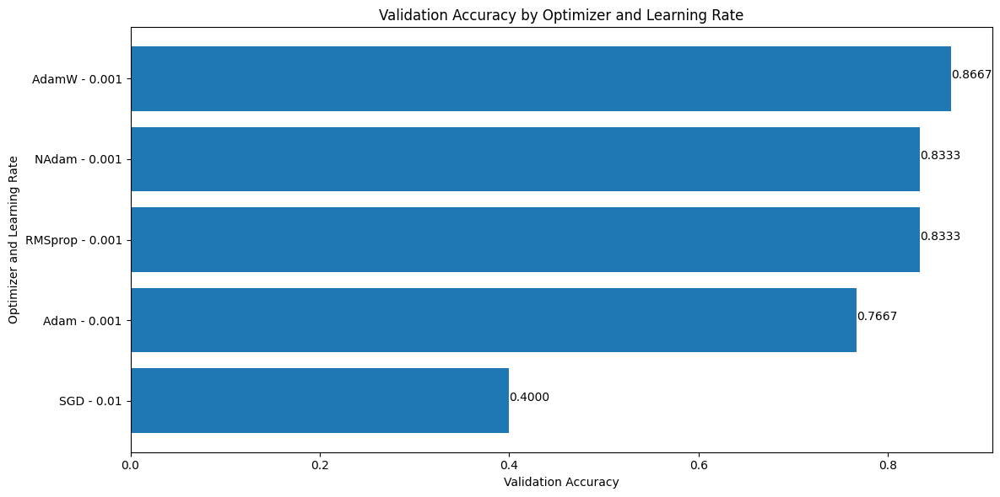

In [ ]:
# plot the results of the experiment
plot_optimizers_results(optimizers_df)

In [ ]:
# get and print best optimizer and learning rate
small_best_optimizer_name = optimizers_df.iloc[0]['Optimizer']
small_best_optimizer = torch.optim.__dict__[small_best_optimizer_name]
print(f"Best optimizer: {small_best_optimizer_name}")
small_best_learning_rate = optimizers_df.iloc[0]['Best Learning Rate']
print(f"Best learning rate: {small_best_learning_rate}")

Best optimizer: AdamW
Best learning rate: 0.001


Experiment 5. Try various activation functions.

In [ ]:
# experiment 5: activation functions
small_model_act_fn_results = experiment_activation_functions(train_dataloader=train_dataloader_small,
                                                             val_dataloader=val_dataloader_small,
                                                             num_epochs=num_epochs,
                                                             device=device,
                                                             num_classes=num_classes_small,
                                                             best_hidden_units_combo=small_best_hidden_units,
                                                             best_decay_value=small_best_decay_value,
                                                             best_dropout_probs_combo=small_best_dropout_probs,
                                                             best_optimizer=small_best_optimizer,
                                                             best_learning_rate=small_best_learning_rate)

Experimenting with Activation Functions
Activation functions to try: ['ReLU', 'LeakyReLU', 'ELU', 'GELU', 'SiLU']

Testing ReLU activation function as activation function in feature extractor...

Testing ReLU activation function as activation function in classifier...


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.7056 | train_acc: 0.0781 | val_loss: 2.6878 | val_acc: 0.0667
Epoch: 2 | train_loss: 2.6849 | train_acc: 0.0742 | val_loss: 2.6579 | val_acc: 0.0667
Epoch: 3 | train_loss: 2.6663 | train_acc: 0.0820 | val_loss: 2.6480 | val_acc: 0.1667
Epoch: 4 | train_loss: 2.6606 | train_acc: 0.0938 | val_loss: 2.6510 | val_acc: 0.1667
Epoch: 5 | train_loss: 2.6745 | train_acc: 0.1172 | val_loss: 2.6162 | val_acc: 0.1667
Epoch: 6 | train_loss: 2.6010 | train_acc: 0.1289 | val_loss: 2.5752 | val_acc: 0.2000
Epoch: 7 | train_loss: 2.5422 | train_acc: 0.1523 | val_loss: 2.5340 | val_acc: 0.2000
Epoch: 8 | train_loss: 2.4528 | train_acc: 0.1875 | val_loss: 2.3894 | val_acc: 0.2000
Epoch: 9 | train_loss: 2.4511 | train_acc: 0.1602 | val_loss: 2.3961 | val_acc: 0.3333
Epoch: 10 | train_loss: 2.3942 | train_acc: 0.1914 | val_loss: 2.3200 | val_acc: 0.3333
Epoch: 11 | train_loss: 2.3940 | train_acc: 0.1797 | val_loss: 2.1961 | val_acc: 0.3333
Epoch: 12 | train_loss: 2.2720 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.7400 | train_acc: 0.0664 | val_loss: 2.6956 | val_acc: 0.0667
Epoch: 2 | train_loss: 2.6808 | train_acc: 0.0664 | val_loss: 2.6739 | val_acc: 0.1000
Epoch: 3 | train_loss: 2.7092 | train_acc: 0.0898 | val_loss: 2.6398 | val_acc: 0.1333
Epoch: 4 | train_loss: 2.6495 | train_acc: 0.1211 | val_loss: 2.6478 | val_acc: 0.1000
Epoch: 5 | train_loss: 2.5871 | train_acc: 0.1445 | val_loss: 2.6122 | val_acc: 0.1667
Epoch: 6 | train_loss: 2.5682 | train_acc: 0.1172 | val_loss: 2.5300 | val_acc: 0.1667
Epoch: 7 | train_loss: 2.5187 | train_acc: 0.1758 | val_loss: 2.4923 | val_acc: 0.3000
Epoch: 8 | train_loss: 2.4360 | train_acc: 0.1914 | val_loss: 2.4102 | val_acc: 0.3667
Epoch: 9 | train_loss: 2.3944 | train_acc: 0.2031 | val_loss: 2.2700 | val_acc: 0.4000
Epoch: 10 | train_loss: 2.3795 | train_acc: 0.1992 | val_loss: 2.2275 | val_acc: 0.4667
Epoch: 11 | train_loss: 2.3009 | train_acc: 0.2617 | val_loss: 2.1668 | val_acc: 0.5333
Epoch: 12 | train_loss: 2.3118 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.7315 | train_acc: 0.0820 | val_loss: 2.6886 | val_acc: 0.1000
Epoch: 2 | train_loss: 2.6900 | train_acc: 0.0938 | val_loss: 2.6588 | val_acc: 0.1333
Epoch: 3 | train_loss: 2.6122 | train_acc: 0.1250 | val_loss: 2.6138 | val_acc: 0.2000
Epoch: 4 | train_loss: 2.5569 | train_acc: 0.1484 | val_loss: 2.5316 | val_acc: 0.1667
Epoch: 5 | train_loss: 2.5522 | train_acc: 0.1367 | val_loss: 2.4527 | val_acc: 0.5000
Epoch: 6 | train_loss: 2.4218 | train_acc: 0.1758 | val_loss: 2.2514 | val_acc: 0.4667
Epoch: 7 | train_loss: 2.2429 | train_acc: 0.3320 | val_loss: 2.0285 | val_acc: 0.3667
Epoch: 8 | train_loss: 2.1607 | train_acc: 0.3242 | val_loss: 1.8799 | val_acc: 0.6000
Epoch: 9 | train_loss: 2.0724 | train_acc: 0.3242 | val_loss: 1.7090 | val_acc: 0.5333
Epoch: 10 | train_loss: 1.8407 | train_acc: 0.4219 | val_loss: 1.5312 | val_acc: 0.4667
Epoch: 11 | train_loss: 1.7532 | train_acc: 0.4336 | val_loss: 1.4053 | val_acc: 0.6333
Epoch: 12 | train_loss: 1.7185 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.7162 | train_acc: 0.0430 | val_loss: 2.7006 | val_acc: 0.0667
Epoch: 2 | train_loss: 2.6645 | train_acc: 0.0703 | val_loss: 2.6725 | val_acc: 0.0667
Epoch: 3 | train_loss: 2.6826 | train_acc: 0.0781 | val_loss: 2.6415 | val_acc: 0.1000
Epoch: 4 | train_loss: 2.5884 | train_acc: 0.1289 | val_loss: 2.5954 | val_acc: 0.1333
Epoch: 5 | train_loss: 2.5244 | train_acc: 0.1367 | val_loss: 2.5192 | val_acc: 0.2000
Epoch: 6 | train_loss: 2.4249 | train_acc: 0.1875 | val_loss: 2.3863 | val_acc: 0.3667
Epoch: 7 | train_loss: 2.4011 | train_acc: 0.2539 | val_loss: 2.3518 | val_acc: 0.2667
Epoch: 8 | train_loss: 2.3061 | train_acc: 0.2344 | val_loss: 2.3221 | val_acc: 0.4333
Epoch: 9 | train_loss: 2.2017 | train_acc: 0.2617 | val_loss: 2.0527 | val_acc: 0.4000
Epoch: 10 | train_loss: 2.0668 | train_acc: 0.3359 | val_loss: 1.9234 | val_acc: 0.4667
Epoch: 11 | train_loss: 2.0118 | train_acc: 0.3516 | val_loss: 1.8090 | val_acc: 0.5333
Epoch: 12 | train_loss: 1.9844 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.7159 | train_acc: 0.0586 | val_loss: 2.6958 | val_acc: 0.0667
Epoch: 2 | train_loss: 2.6901 | train_acc: 0.0508 | val_loss: 2.6774 | val_acc: 0.0667
Epoch: 3 | train_loss: 2.6824 | train_acc: 0.1133 | val_loss: 2.6375 | val_acc: 0.1000
Epoch: 4 | train_loss: 2.5499 | train_acc: 0.1445 | val_loss: 2.5886 | val_acc: 0.1333
Epoch: 5 | train_loss: 2.6211 | train_acc: 0.0977 | val_loss: 2.5593 | val_acc: 0.2333
Epoch: 6 | train_loss: 2.4274 | train_acc: 0.2266 | val_loss: 2.4433 | val_acc: 0.3667
Epoch: 7 | train_loss: 2.4616 | train_acc: 0.2344 | val_loss: 2.3413 | val_acc: 0.4000
Epoch: 8 | train_loss: 2.4022 | train_acc: 0.2500 | val_loss: 2.3140 | val_acc: 0.4333
Epoch: 9 | train_loss: 2.1763 | train_acc: 0.3086 | val_loss: 2.0021 | val_acc: 0.4333
Epoch: 10 | train_loss: 2.0941 | train_acc: 0.3828 | val_loss: 1.8771 | val_acc: 0.4667
Epoch: 11 | train_loss: 1.9516 | train_acc: 0.4375 | val_loss: 1.7922 | val_acc: 0.4667
Epoch: 12 | train_loss: 1.7087 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.7358 | train_acc: 0.0625 | val_loss: 2.6912 | val_acc: 0.1667
Epoch: 2 | train_loss: 2.6639 | train_acc: 0.1211 | val_loss: 2.6608 | val_acc: 0.1000
Epoch: 3 | train_loss: 2.7475 | train_acc: 0.0859 | val_loss: 2.6050 | val_acc: 0.1333
Epoch: 4 | train_loss: 2.5993 | train_acc: 0.1250 | val_loss: 2.5898 | val_acc: 0.1667
Epoch: 5 | train_loss: 2.5287 | train_acc: 0.1797 | val_loss: 2.4976 | val_acc: 0.1667
Epoch: 6 | train_loss: 2.4894 | train_acc: 0.1641 | val_loss: 2.4491 | val_acc: 0.2000
Epoch: 7 | train_loss: 2.3689 | train_acc: 0.1680 | val_loss: 2.3709 | val_acc: 0.2667
Epoch: 8 | train_loss: 2.3582 | train_acc: 0.2188 | val_loss: 2.2165 | val_acc: 0.3667
Epoch: 9 | train_loss: 2.2651 | train_acc: 0.2344 | val_loss: 2.1370 | val_acc: 0.4000
Epoch: 10 | train_loss: 2.3036 | train_acc: 0.2344 | val_loss: 2.2341 | val_acc: 0.4667
Epoch: 11 | train_loss: 2.2309 | train_acc: 0.2656 | val_loss: 2.1320 | val_acc: 0.4667
Epoch: 12 | train_loss: 2.1404 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.7103 | train_acc: 0.0508 | val_loss: 2.6872 | val_acc: 0.0667
Epoch: 2 | train_loss: 2.6653 | train_acc: 0.0859 | val_loss: 2.6552 | val_acc: 0.1333
Epoch: 3 | train_loss: 2.6775 | train_acc: 0.0938 | val_loss: 2.6400 | val_acc: 0.0667
Epoch: 4 | train_loss: 2.6611 | train_acc: 0.1016 | val_loss: 2.6447 | val_acc: 0.1000
Epoch: 5 | train_loss: 2.6264 | train_acc: 0.1289 | val_loss: 2.6027 | val_acc: 0.0667
Epoch: 6 | train_loss: 2.5694 | train_acc: 0.1055 | val_loss: 2.5297 | val_acc: 0.1333
Epoch: 7 | train_loss: 2.4989 | train_acc: 0.1328 | val_loss: 2.4813 | val_acc: 0.1333
Epoch: 8 | train_loss: 2.4907 | train_acc: 0.1602 | val_loss: 2.4431 | val_acc: 0.3000
Epoch: 9 | train_loss: 2.4263 | train_acc: 0.2266 | val_loss: 2.2984 | val_acc: 0.3333
Epoch: 10 | train_loss: 2.3093 | train_acc: 0.2578 | val_loss: 2.1572 | val_acc: 0.4333
Epoch: 11 | train_loss: 2.1796 | train_acc: 0.2891 | val_loss: 1.9622 | val_acc: 0.4000
Epoch: 12 | train_loss: 1.9914 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.7322 | train_acc: 0.0586 | val_loss: 2.6913 | val_acc: 0.0667
Epoch: 2 | train_loss: 2.6776 | train_acc: 0.0703 | val_loss: 2.6620 | val_acc: 0.0667
Epoch: 3 | train_loss: 2.6729 | train_acc: 0.0938 | val_loss: 2.6231 | val_acc: 0.1000
Epoch: 4 | train_loss: 2.6098 | train_acc: 0.0820 | val_loss: 2.5947 | val_acc: 0.1667
Epoch: 5 | train_loss: 2.5256 | train_acc: 0.1367 | val_loss: 2.4766 | val_acc: 0.1333
Epoch: 6 | train_loss: 2.4079 | train_acc: 0.1758 | val_loss: 2.3437 | val_acc: 0.2667
Epoch: 7 | train_loss: 2.3234 | train_acc: 0.2422 | val_loss: 2.2373 | val_acc: 0.3000
Epoch: 8 | train_loss: 2.1808 | train_acc: 0.2969 | val_loss: 2.0347 | val_acc: 0.3000
Epoch: 9 | train_loss: 2.1396 | train_acc: 0.3086 | val_loss: 1.9983 | val_acc: 0.4333
Epoch: 10 | train_loss: 2.0831 | train_acc: 0.3398 | val_loss: 1.8410 | val_acc: 0.5333
Epoch: 11 | train_loss: 1.9825 | train_acc: 0.3672 | val_loss: 1.7915 | val_acc: 0.5333
Epoch: 12 | train_loss: 1.8590 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.7315 | train_acc: 0.0742 | val_loss: 2.6929 | val_acc: 0.0667
Epoch: 2 | train_loss: 2.7051 | train_acc: 0.0547 | val_loss: 2.6835 | val_acc: 0.0667
Epoch: 3 | train_loss: 2.6713 | train_acc: 0.0703 | val_loss: 2.6570 | val_acc: 0.0667
Epoch: 4 | train_loss: 2.6253 | train_acc: 0.0938 | val_loss: 2.6008 | val_acc: 0.1667
Epoch: 5 | train_loss: 2.5889 | train_acc: 0.1445 | val_loss: 2.5567 | val_acc: 0.4000
Epoch: 6 | train_loss: 2.4631 | train_acc: 0.1875 | val_loss: 2.3520 | val_acc: 0.3333
Epoch: 7 | train_loss: 2.4604 | train_acc: 0.2031 | val_loss: 2.2595 | val_acc: 0.4667
Epoch: 8 | train_loss: 2.2731 | train_acc: 0.2930 | val_loss: 2.0881 | val_acc: 0.4667
Epoch: 9 | train_loss: 2.1712 | train_acc: 0.2656 | val_loss: 1.9650 | val_acc: 0.4667
Epoch: 10 | train_loss: 2.0681 | train_acc: 0.3789 | val_loss: 1.7603 | val_acc: 0.5333
Epoch: 11 | train_loss: 2.0029 | train_acc: 0.3867 | val_loss: 1.7746 | val_acc: 0.4667
Epoch: 12 | train_loss: 1.8886 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.7168 | train_acc: 0.0820 | val_loss: 2.6891 | val_acc: 0.0667
Epoch: 2 | train_loss: 2.6831 | train_acc: 0.1250 | val_loss: 2.6731 | val_acc: 0.2000
Epoch: 3 | train_loss: 2.6205 | train_acc: 0.1211 | val_loss: 2.6244 | val_acc: 0.0000
Epoch: 4 | train_loss: 2.6295 | train_acc: 0.1094 | val_loss: 2.6264 | val_acc: 0.1333
Epoch: 5 | train_loss: 2.5736 | train_acc: 0.1328 | val_loss: 2.5625 | val_acc: 0.2333
Epoch: 6 | train_loss: 2.4647 | train_acc: 0.1836 | val_loss: 2.4298 | val_acc: 0.3000
Epoch: 7 | train_loss: 2.3241 | train_acc: 0.2617 | val_loss: 2.3740 | val_acc: 0.4000
Epoch: 8 | train_loss: 2.2529 | train_acc: 0.2773 | val_loss: 2.2587 | val_acc: 0.4333
Epoch: 9 | train_loss: 2.2494 | train_acc: 0.2773 | val_loss: 2.1767 | val_acc: 0.5333
Epoch: 10 | train_loss: 2.0034 | train_acc: 0.4141 | val_loss: 2.0112 | val_acc: 0.5000
Epoch: 11 | train_loss: 1.8815 | train_acc: 0.4023 | val_loss: 1.8252 | val_acc: 0.5000
Epoch: 12 | train_loss: 1.8920 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.7302 | train_acc: 0.0508 | val_loss: 2.6918 | val_acc: 0.0667
Epoch: 2 | train_loss: 2.6841 | train_acc: 0.0938 | val_loss: 2.6627 | val_acc: 0.0667
Epoch: 3 | train_loss: 2.6409 | train_acc: 0.0938 | val_loss: 2.6093 | val_acc: 0.1333
Epoch: 4 | train_loss: 2.5905 | train_acc: 0.0898 | val_loss: 2.5222 | val_acc: 0.1333
Epoch: 5 | train_loss: 2.4747 | train_acc: 0.1602 | val_loss: 2.4460 | val_acc: 0.4667
Epoch: 6 | train_loss: 2.3361 | train_acc: 0.2422 | val_loss: 2.2108 | val_acc: 0.4000
Epoch: 7 | train_loss: 2.1264 | train_acc: 0.3320 | val_loss: 1.9372 | val_acc: 0.4667
Epoch: 8 | train_loss: 2.1310 | train_acc: 0.3125 | val_loss: 1.8136 | val_acc: 0.6000
Epoch: 9 | train_loss: 1.7553 | train_acc: 0.4297 | val_loss: 1.5904 | val_acc: 0.6000
Epoch: 10 | train_loss: 1.7628 | train_acc: 0.4141 | val_loss: 1.5224 | val_acc: 0.6000
Epoch: 11 | train_loss: 1.6757 | train_acc: 0.4570 | val_loss: 1.3511 | val_acc: 0.6333
Epoch: 12 | train_loss: 1.5738 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.7079 | train_acc: 0.0781 | val_loss: 2.6749 | val_acc: 0.1000
Epoch: 2 | train_loss: 2.6834 | train_acc: 0.0625 | val_loss: 2.6321 | val_acc: 0.1000
Epoch: 3 | train_loss: 2.5884 | train_acc: 0.1289 | val_loss: 2.5234 | val_acc: 0.2667
Epoch: 4 | train_loss: 2.4904 | train_acc: 0.1836 | val_loss: 2.3388 | val_acc: 0.5333
Epoch: 5 | train_loss: 2.3836 | train_acc: 0.2344 | val_loss: 2.1823 | val_acc: 0.5000
Epoch: 6 | train_loss: 2.2220 | train_acc: 0.2656 | val_loss: 1.9921 | val_acc: 0.5667
Epoch: 7 | train_loss: 2.0620 | train_acc: 0.3047 | val_loss: 1.8065 | val_acc: 0.4667
Epoch: 8 | train_loss: 1.8994 | train_acc: 0.3516 | val_loss: 1.6209 | val_acc: 0.5000
Epoch: 9 | train_loss: 1.7210 | train_acc: 0.4258 | val_loss: 1.3897 | val_acc: 0.6000
Epoch: 10 | train_loss: 1.6593 | train_acc: 0.4883 | val_loss: 1.3816 | val_acc: 0.6000
Epoch: 11 | train_loss: 1.5586 | train_acc: 0.5000 | val_loss: 1.0822 | val_acc: 0.8000
Epoch: 12 | train_loss: 1.4995 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.7501 | train_acc: 0.0820 | val_loss: 2.6496 | val_acc: 0.1667
Epoch: 2 | train_loss: 2.6609 | train_acc: 0.0938 | val_loss: 2.5783 | val_acc: 0.2333
Epoch: 3 | train_loss: 2.5352 | train_acc: 0.1562 | val_loss: 2.3905 | val_acc: 0.3000
Epoch: 4 | train_loss: 2.3094 | train_acc: 0.2500 | val_loss: 2.1084 | val_acc: 0.4000
Epoch: 5 | train_loss: 2.0030 | train_acc: 0.3633 | val_loss: 2.0983 | val_acc: 0.3333
Epoch: 6 | train_loss: 1.9582 | train_acc: 0.3555 | val_loss: 1.7852 | val_acc: 0.5333
Epoch: 7 | train_loss: 1.7898 | train_acc: 0.4414 | val_loss: 1.5709 | val_acc: 0.5667
Epoch: 8 | train_loss: 1.5522 | train_acc: 0.5234 | val_loss: 1.4723 | val_acc: 0.5667
Epoch: 9 | train_loss: 1.4454 | train_acc: 0.5625 | val_loss: 1.3073 | val_acc: 0.6667
Epoch: 10 | train_loss: 1.3140 | train_acc: 0.5898 | val_loss: 1.1546 | val_acc: 0.7333
Epoch: 11 | train_loss: 1.3523 | train_acc: 0.5859 | val_loss: 1.2202 | val_acc: 0.7333
Epoch: 12 | train_loss: 1.2794 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.7111 | train_acc: 0.0664 | val_loss: 2.6727 | val_acc: 0.0667
Epoch: 2 | train_loss: 2.6575 | train_acc: 0.1016 | val_loss: 2.6273 | val_acc: 0.1000
Epoch: 3 | train_loss: 2.5807 | train_acc: 0.1289 | val_loss: 2.4920 | val_acc: 0.2667
Epoch: 4 | train_loss: 2.4368 | train_acc: 0.1914 | val_loss: 2.3237 | val_acc: 0.4667
Epoch: 5 | train_loss: 2.2174 | train_acc: 0.2695 | val_loss: 2.1473 | val_acc: 0.3667
Epoch: 6 | train_loss: 2.0164 | train_acc: 0.3555 | val_loss: 1.8493 | val_acc: 0.5667
Epoch: 7 | train_loss: 2.0365 | train_acc: 0.3984 | val_loss: 1.7444 | val_acc: 0.5667
Epoch: 8 | train_loss: 1.7818 | train_acc: 0.4375 | val_loss: 1.5794 | val_acc: 0.6000
Epoch: 9 | train_loss: 1.6325 | train_acc: 0.4727 | val_loss: 1.3822 | val_acc: 0.7000
Epoch: 10 | train_loss: 1.6280 | train_acc: 0.4922 | val_loss: 1.2452 | val_acc: 0.6667
Epoch: 11 | train_loss: 1.3788 | train_acc: 0.5781 | val_loss: 1.0769 | val_acc: 0.7333
Epoch: 12 | train_loss: 1.1896 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.7197 | train_acc: 0.0586 | val_loss: 2.6835 | val_acc: 0.0667
Epoch: 2 | train_loss: 2.6559 | train_acc: 0.0508 | val_loss: 2.6177 | val_acc: 0.1667
Epoch: 3 | train_loss: 2.5884 | train_acc: 0.1289 | val_loss: 2.5033 | val_acc: 0.2000
Epoch: 4 | train_loss: 2.5190 | train_acc: 0.1914 | val_loss: 2.3556 | val_acc: 0.3667
Epoch: 5 | train_loss: 2.2296 | train_acc: 0.2617 | val_loss: 1.9733 | val_acc: 0.6667
Epoch: 6 | train_loss: 2.0607 | train_acc: 0.3359 | val_loss: 1.8344 | val_acc: 0.6333
Epoch: 7 | train_loss: 1.9476 | train_acc: 0.3867 | val_loss: 1.4784 | val_acc: 0.8000
Epoch: 8 | train_loss: 1.7099 | train_acc: 0.4609 | val_loss: 1.4135 | val_acc: 0.6667
Epoch: 9 | train_loss: 1.5640 | train_acc: 0.5391 | val_loss: 1.2877 | val_acc: 0.6333
Epoch: 10 | train_loss: 1.5386 | train_acc: 0.5117 | val_loss: 1.1545 | val_acc: 0.7000
Epoch: 11 | train_loss: 1.3487 | train_acc: 0.5352 | val_loss: 1.0678 | val_acc: 0.7000
Epoch: 12 | train_loss: 1.4178 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.7073 | train_acc: 0.0547 | val_loss: 2.7028 | val_acc: 0.1333
Epoch: 2 | train_loss: 2.6616 | train_acc: 0.1484 | val_loss: 2.6684 | val_acc: 0.0667
Epoch: 3 | train_loss: 2.5991 | train_acc: 0.1094 | val_loss: 2.5451 | val_acc: 0.0667
Epoch: 4 | train_loss: 2.5624 | train_acc: 0.1680 | val_loss: 2.5185 | val_acc: 0.2000
Epoch: 5 | train_loss: 2.5282 | train_acc: 0.1914 | val_loss: 2.4307 | val_acc: 0.2000
Epoch: 6 | train_loss: 2.4218 | train_acc: 0.1914 | val_loss: 2.3048 | val_acc: 0.2000
Epoch: 7 | train_loss: 2.3120 | train_acc: 0.2383 | val_loss: 2.2214 | val_acc: 0.3000
Epoch: 8 | train_loss: 2.2646 | train_acc: 0.2617 | val_loss: 2.1032 | val_acc: 0.5000
Epoch: 9 | train_loss: 2.2072 | train_acc: 0.3047 | val_loss: 1.9954 | val_acc: 0.4667
Epoch: 10 | train_loss: 2.0992 | train_acc: 0.3242 | val_loss: 1.7776 | val_acc: 0.6000
Epoch: 11 | train_loss: 2.0790 | train_acc: 0.3398 | val_loss: 1.8324 | val_acc: 0.5667
Epoch: 12 | train_loss: 1.9596 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.7142 | train_acc: 0.0625 | val_loss: 2.6996 | val_acc: 0.0667
Epoch: 2 | train_loss: 2.6566 | train_acc: 0.1133 | val_loss: 2.6334 | val_acc: 0.0667
Epoch: 3 | train_loss: 2.5915 | train_acc: 0.1758 | val_loss: 2.5772 | val_acc: 0.1333
Epoch: 4 | train_loss: 2.5689 | train_acc: 0.1523 | val_loss: 2.5140 | val_acc: 0.2333
Epoch: 5 | train_loss: 2.5619 | train_acc: 0.1680 | val_loss: 2.5486 | val_acc: 0.3000
Epoch: 6 | train_loss: 2.4331 | train_acc: 0.2422 | val_loss: 2.3367 | val_acc: 0.4000
Epoch: 7 | train_loss: 2.3712 | train_acc: 0.2578 | val_loss: 2.2255 | val_acc: 0.5333
Epoch: 8 | train_loss: 2.2264 | train_acc: 0.3281 | val_loss: 2.0919 | val_acc: 0.5667
Epoch: 9 | train_loss: 2.0445 | train_acc: 0.3203 | val_loss: 1.8762 | val_acc: 0.4667
Epoch: 10 | train_loss: 1.9247 | train_acc: 0.4180 | val_loss: 1.7248 | val_acc: 0.5667
Epoch: 11 | train_loss: 1.9065 | train_acc: 0.4023 | val_loss: 1.6252 | val_acc: 0.5000
Epoch: 12 | train_loss: 1.7283 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.7106 | train_acc: 0.0898 | val_loss: 2.6704 | val_acc: 0.1667
Epoch: 2 | train_loss: 2.6179 | train_acc: 0.1094 | val_loss: 2.5381 | val_acc: 0.1333
Epoch: 3 | train_loss: 2.5502 | train_acc: 0.1562 | val_loss: 2.4886 | val_acc: 0.4000
Epoch: 4 | train_loss: 2.4637 | train_acc: 0.2422 | val_loss: 2.4296 | val_acc: 0.2333
Epoch: 5 | train_loss: 2.4125 | train_acc: 0.2305 | val_loss: 2.2755 | val_acc: 0.4333
Epoch: 6 | train_loss: 2.2603 | train_acc: 0.2500 | val_loss: 2.0536 | val_acc: 0.4667
Epoch: 7 | train_loss: 2.1540 | train_acc: 0.3516 | val_loss: 1.9727 | val_acc: 0.4000
Epoch: 8 | train_loss: 1.9983 | train_acc: 0.3945 | val_loss: 1.7411 | val_acc: 0.5667
Epoch: 9 | train_loss: 1.8495 | train_acc: 0.4453 | val_loss: 1.6425 | val_acc: 0.5333
Epoch: 10 | train_loss: 1.8522 | train_acc: 0.4219 | val_loss: 1.6536 | val_acc: 0.5333
Epoch: 11 | train_loss: 1.7470 | train_acc: 0.4570 | val_loss: 1.5301 | val_acc: 0.5000
Epoch: 12 | train_loss: 1.5755 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.6868 | train_acc: 0.0664 | val_loss: 2.6771 | val_acc: 0.0667
Epoch: 2 | train_loss: 2.6328 | train_acc: 0.1055 | val_loss: 2.6263 | val_acc: 0.0667
Epoch: 3 | train_loss: 2.6168 | train_acc: 0.0977 | val_loss: 2.5681 | val_acc: 0.1667
Epoch: 4 | train_loss: 2.5262 | train_acc: 0.1680 | val_loss: 2.5374 | val_acc: 0.1667
Epoch: 5 | train_loss: 2.5149 | train_acc: 0.1602 | val_loss: 2.4386 | val_acc: 0.3333
Epoch: 6 | train_loss: 2.4421 | train_acc: 0.2070 | val_loss: 2.3519 | val_acc: 0.3000
Epoch: 7 | train_loss: 2.3374 | train_acc: 0.2656 | val_loss: 2.2621 | val_acc: 0.4333
Epoch: 8 | train_loss: 2.2713 | train_acc: 0.2266 | val_loss: 2.0919 | val_acc: 0.4000
Epoch: 9 | train_loss: 2.1536 | train_acc: 0.3008 | val_loss: 1.9988 | val_acc: 0.4667
Epoch: 10 | train_loss: 2.1545 | train_acc: 0.2773 | val_loss: 1.8162 | val_acc: 0.5000
Epoch: 11 | train_loss: 1.9976 | train_acc: 0.3906 | val_loss: 1.7778 | val_acc: 0.5000
Epoch: 12 | train_loss: 1.9374 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.7040 | train_acc: 0.0664 | val_loss: 2.6875 | val_acc: 0.0667
Epoch: 2 | train_loss: 2.6476 | train_acc: 0.0938 | val_loss: 2.5702 | val_acc: 0.0333
Epoch: 3 | train_loss: 2.5868 | train_acc: 0.1016 | val_loss: 2.5878 | val_acc: 0.2333
Epoch: 4 | train_loss: 2.5192 | train_acc: 0.1484 | val_loss: 2.5226 | val_acc: 0.3000
Epoch: 5 | train_loss: 2.4236 | train_acc: 0.2148 | val_loss: 2.4045 | val_acc: 0.3667
Epoch: 6 | train_loss: 2.4549 | train_acc: 0.2188 | val_loss: 2.2524 | val_acc: 0.3333
Epoch: 7 | train_loss: 2.3141 | train_acc: 0.2578 | val_loss: 2.3733 | val_acc: 0.4333
Epoch: 8 | train_loss: 2.1885 | train_acc: 0.3438 | val_loss: 2.0148 | val_acc: 0.4667
Epoch: 9 | train_loss: 2.1445 | train_acc: 0.3008 | val_loss: 1.9099 | val_acc: 0.4000
Epoch: 10 | train_loss: 2.0837 | train_acc: 0.3438 | val_loss: 1.7986 | val_acc: 0.5000
Epoch: 11 | train_loss: 1.8948 | train_acc: 0.3984 | val_loss: 1.6496 | val_acc: 0.4667
Epoch: 12 | train_loss: 1.9235 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.7108 | train_acc: 0.0469 | val_loss: 2.7022 | val_acc: 0.0333
Epoch: 2 | train_loss: 2.6582 | train_acc: 0.0977 | val_loss: 2.6276 | val_acc: 0.1333
Epoch: 3 | train_loss: 2.6396 | train_acc: 0.1055 | val_loss: 2.5809 | val_acc: 0.1333
Epoch: 4 | train_loss: 2.6841 | train_acc: 0.1250 | val_loss: 2.5963 | val_acc: 0.2000
Epoch: 5 | train_loss: 2.4919 | train_acc: 0.1406 | val_loss: 2.5355 | val_acc: 0.2000
Epoch: 6 | train_loss: 2.5190 | train_acc: 0.1914 | val_loss: 2.4160 | val_acc: 0.2000
Epoch: 7 | train_loss: 2.4061 | train_acc: 0.2656 | val_loss: 2.4667 | val_acc: 0.3667
Epoch: 8 | train_loss: 2.3494 | train_acc: 0.2734 | val_loss: 2.2622 | val_acc: 0.4333
Epoch: 9 | train_loss: 2.2337 | train_acc: 0.3203 | val_loss: 2.1926 | val_acc: 0.4000
Epoch: 10 | train_loss: 2.1356 | train_acc: 0.3555 | val_loss: 2.1052 | val_acc: 0.5667
Epoch: 11 | train_loss: 2.1413 | train_acc: 0.3359 | val_loss: 1.8430 | val_acc: 0.5667
Epoch: 12 | train_loss: 2.0375 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.7042 | train_acc: 0.0859 | val_loss: 2.6725 | val_acc: 0.2000
Epoch: 2 | train_loss: 2.6909 | train_acc: 0.0938 | val_loss: 2.6303 | val_acc: 0.1000
Epoch: 3 | train_loss: 2.5971 | train_acc: 0.1055 | val_loss: 2.5675 | val_acc: 0.1000
Epoch: 4 | train_loss: 2.5227 | train_acc: 0.1406 | val_loss: 2.4967 | val_acc: 0.1667
Epoch: 5 | train_loss: 2.4824 | train_acc: 0.1914 | val_loss: 2.4674 | val_acc: 0.3000
Epoch: 6 | train_loss: 2.4120 | train_acc: 0.1914 | val_loss: 2.2988 | val_acc: 0.3333
Epoch: 7 | train_loss: 2.3199 | train_acc: 0.3047 | val_loss: 2.2281 | val_acc: 0.4000
Epoch: 8 | train_loss: 2.2300 | train_acc: 0.3438 | val_loss: 2.0480 | val_acc: 0.4333
Epoch: 9 | train_loss: 2.1350 | train_acc: 0.3594 | val_loss: 1.8232 | val_acc: 0.4333
Epoch: 10 | train_loss: 2.0762 | train_acc: 0.3750 | val_loss: 1.8504 | val_acc: 0.4667
Epoch: 11 | train_loss: 1.9482 | train_acc: 0.4023 | val_loss: 1.7130 | val_acc: 0.5333
Epoch: 12 | train_loss: 1.8086 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.7036 | train_acc: 0.0781 | val_loss: 2.6658 | val_acc: 0.0667
Epoch: 2 | train_loss: 2.6485 | train_acc: 0.0820 | val_loss: 2.5806 | val_acc: 0.1667
Epoch: 3 | train_loss: 2.5912 | train_acc: 0.0938 | val_loss: 2.5233 | val_acc: 0.1667
Epoch: 4 | train_loss: 2.4656 | train_acc: 0.1953 | val_loss: 2.4735 | val_acc: 0.3333
Epoch: 5 | train_loss: 2.4148 | train_acc: 0.2031 | val_loss: 2.3109 | val_acc: 0.4000
Epoch: 6 | train_loss: 2.3251 | train_acc: 0.2578 | val_loss: 2.2564 | val_acc: 0.5000
Epoch: 7 | train_loss: 2.2452 | train_acc: 0.3164 | val_loss: 2.1716 | val_acc: 0.5333
Epoch: 8 | train_loss: 2.2244 | train_acc: 0.3477 | val_loss: 1.9825 | val_acc: 0.5333
Epoch: 9 | train_loss: 2.0475 | train_acc: 0.3984 | val_loss: 1.8990 | val_acc: 0.5333
Epoch: 10 | train_loss: 1.9001 | train_acc: 0.4453 | val_loss: 1.6961 | val_acc: 0.5667
Epoch: 11 | train_loss: 1.9050 | train_acc: 0.4609 | val_loss: 1.4971 | val_acc: 0.5667
Epoch: 12 | train_loss: 1.5858 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.6998 | train_acc: 0.0547 | val_loss: 2.6847 | val_acc: 0.1333
Epoch: 2 | train_loss: 2.6542 | train_acc: 0.0781 | val_loss: 2.5518 | val_acc: 0.1333
Epoch: 3 | train_loss: 2.6653 | train_acc: 0.1094 | val_loss: 2.5664 | val_acc: 0.2000
Epoch: 4 | train_loss: 2.6195 | train_acc: 0.1289 | val_loss: 2.5679 | val_acc: 0.1667
Epoch: 5 | train_loss: 2.5074 | train_acc: 0.1602 | val_loss: 2.4449 | val_acc: 0.1667
Epoch: 6 | train_loss: 2.5569 | train_acc: 0.1836 | val_loss: 2.5344 | val_acc: 0.2667
Epoch: 7 | train_loss: 2.4822 | train_acc: 0.2148 | val_loss: 2.4647 | val_acc: 0.2667
Epoch: 8 | train_loss: 2.3718 | train_acc: 0.2344 | val_loss: 2.1972 | val_acc: 0.3000
Epoch: 9 | train_loss: 2.3587 | train_acc: 0.2461 | val_loss: 2.2654 | val_acc: 0.4333
Epoch: 10 | train_loss: 2.1875 | train_acc: 0.3203 | val_loss: 2.0840 | val_acc: 0.5000
Epoch: 11 | train_loss: 2.1959 | train_acc: 0.3516 | val_loss: 1.9074 | val_acc: 0.6000
Epoch: 12 | train_loss: 1.8688 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.7074 | train_acc: 0.0391 | val_loss: 2.6930 | val_acc: 0.0667
Epoch: 2 | train_loss: 2.6886 | train_acc: 0.1016 | val_loss: 2.6274 | val_acc: 0.1333
Epoch: 3 | train_loss: 2.6063 | train_acc: 0.1367 | val_loss: 2.5343 | val_acc: 0.1667
Epoch: 4 | train_loss: 2.5168 | train_acc: 0.1484 | val_loss: 2.4196 | val_acc: 0.2333
Epoch: 5 | train_loss: 2.5122 | train_acc: 0.1719 | val_loss: 2.4342 | val_acc: 0.5000
Epoch: 6 | train_loss: 2.3734 | train_acc: 0.2734 | val_loss: 2.2639 | val_acc: 0.5333
Epoch: 7 | train_loss: 2.3071 | train_acc: 0.2734 | val_loss: 2.0434 | val_acc: 0.4667
Epoch: 8 | train_loss: 2.3722 | train_acc: 0.3945 | val_loss: 2.0075 | val_acc: 0.5000
Epoch: 9 | train_loss: 2.1795 | train_acc: 0.3789 | val_loss: 1.9275 | val_acc: 0.4667
Epoch: 10 | train_loss: 1.9733 | train_acc: 0.3984 | val_loss: 1.7730 | val_acc: 0.6333
Epoch: 11 | train_loss: 1.9217 | train_acc: 0.4453 | val_loss: 1.5701 | val_acc: 0.6000
Epoch: 12 | train_loss: 1.7355 | train_ac

In [ ]:
# put all the results in a table and print it
activation_df = pd.DataFrame(small_model_act_fn_results, columns=['Activation Function 1', 'Activation Function 2', 'Validation Accuracy'])
activation_df = activation_df.sort_values(by='Validation Accuracy', ascending=False)[:10] # limit the results to the best 10 of them
print("\n", activation_df.to_string(index=False))


 Activation Function 1 Activation Function 2  Validation Accuracy
                  ELU                  GELU             0.933333
                  ELU             LeakyReLU             0.900000
                 GELU                  ReLU             0.900000
            LeakyReLU                  GELU             0.900000
                 GELU                  GELU             0.866667
                  ELU                   ELU             0.866667
                 SiLU             LeakyReLU             0.866667
                 SiLU                   ELU             0.866667
                  ELU                  SiLU             0.866667
                 SiLU                  ReLU             0.833333


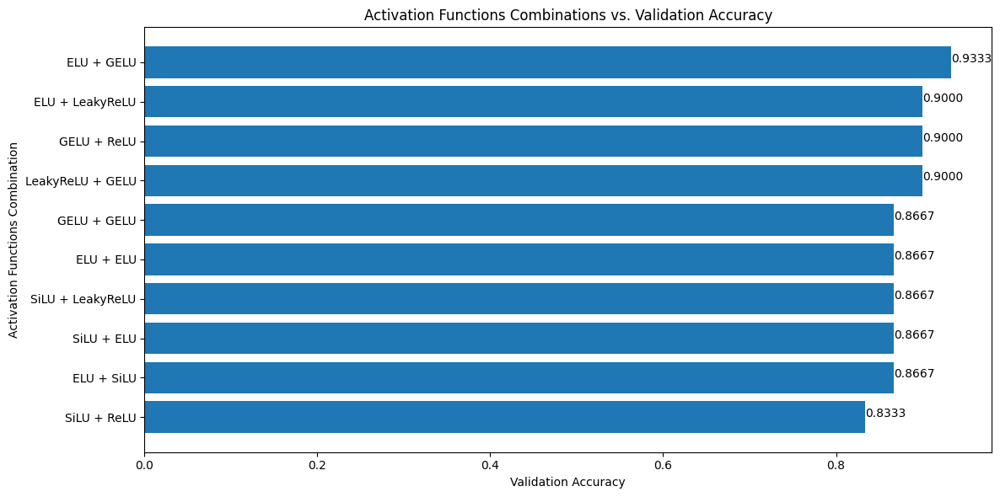

In [ ]:
# plot the results of activation functions experiment
plot_activation_function_results(activation_df)

In [ ]:
# print best performing activation functions combo
small_best_activation_functions_names = activation_df.iloc[0]['Activation Function 1'], activation_df.iloc[0]['Activation Function 2']
print(f"Best activation functions: {small_best_activation_functions_names}")

# convert string names to actual nn modules using getattr
small_best_activation_functions = [getattr(nn, name)() for name in small_best_activation_functions_names]

Best activation functions: ('ELU', 'GELU')


Let's gather all the best hyperparameters into a configuration dictionary and use it to train a new model.

In [ ]:
# best configuration in a dictionary
small_best_config = {
    'model': 'CNN_v2',
    'loss_fn': nn.CrossEntropyLoss(),
    'best_decay_value': small_best_decay_value,
    'best_dropout_probs_combo': small_best_dropout_probs,
    'best_hidden_units_combo': small_best_hidden_units,
    'best_optimizer': small_best_optimizer,
    'best_learning_rate': small_best_learning_rate,
    'best_activation_functions': small_best_activation_functions,
    'best_batch_size': batch_size,
    'epochs': num_epochs
}

In [ ]:
# put it all together

# create a model
small_model_1 = CNN_v2(out_features=num_classes_small, hidden_units=small_best_hidden_units, dropout_probs=small_best_dropout_probs, activation_functions=small_best_activation_functions).to(device)

# set loss function and optimizer
loss_fn = nn.CrossEntropyLoss()
optimizer = small_best_optimizer(params=small_model_1.parameters(), lr=small_best_learning_rate, weight_decay=small_best_decay_value)

# start training
print("Starting training...")
start_time = time.time()
small_model_1_results = train(model=small_model_1,
                              train_dataloader=train_dataloader_small,
                              test_dataloader=val_dataloader_small,
                              optimizer=optimizer,
                              loss_fn=loss_fn,
                              epochs=num_epochs,
                              device=device)
end_time = time.time()

# calculate and print total training time
small_model_1_training_time = end_time - start_time
print(f"\nTotal training time: {small_model_1_training_time:.3f} seconds")

# calculate and print total trainabale params
small_model_1_total_params = sum(p.numel() for p in small_model_1.parameters() if p.requires_grad)
print(f"Total trainable params: {small_model_1_total_params}")

Starting training...


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 2.7105 | train_acc: 0.0586 | val_loss: 2.6734 | val_acc: 0.1667
Epoch: 2 | train_loss: 2.6619 | train_acc: 0.1016 | val_loss: 2.6010 | val_acc: 0.2667
Epoch: 3 | train_loss: 2.5506 | train_acc: 0.1523 | val_loss: 2.4573 | val_acc: 0.5333
Epoch: 4 | train_loss: 2.3722 | train_acc: 0.2461 | val_loss: 2.1861 | val_acc: 0.4000
Epoch: 5 | train_loss: 2.2376 | train_acc: 0.2930 | val_loss: 1.9240 | val_acc: 0.5667
Epoch: 6 | train_loss: 1.8970 | train_acc: 0.3984 | val_loss: 1.6583 | val_acc: 0.6000
Epoch: 7 | train_loss: 1.8105 | train_acc: 0.4297 | val_loss: 1.4480 | val_acc: 0.6333
Epoch: 8 | train_loss: 1.8345 | train_acc: 0.4180 | val_loss: 1.3773 | val_acc: 0.7000
Epoch: 9 | train_loss: 1.5478 | train_acc: 0.4805 | val_loss: 1.2618 | val_acc: 0.6667
Epoch: 10 | train_loss: 1.4958 | train_acc: 0.5273 | val_loss: 1.2601 | val_acc: 0.6667
Epoch: 11 | train_loss: 1.4930 | train_acc: 0.5664 | val_loss: 1.0569 | val_acc: 0.8000
Epoch: 12 | train_loss: 1.3061 | train_ac

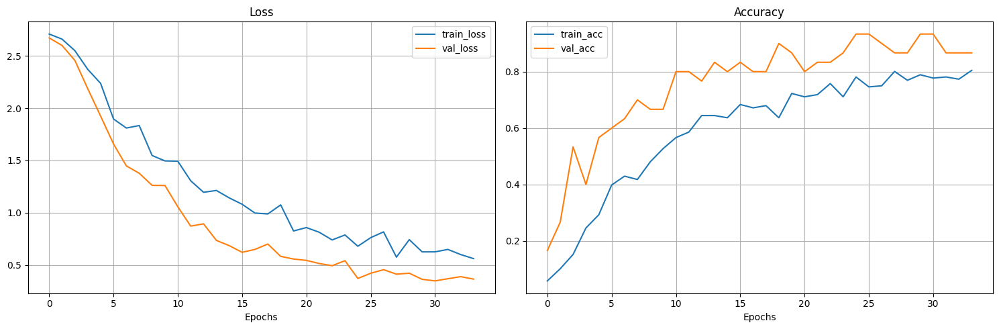

In [ ]:
# plot loss curves
plot_loss_curves(small_model_1_results)

The learning curves are as desired, demonstrating that model_1 for the small dataset does not exhibit overfitting, like the baseline model_0.

In [ ]:
# print final model's val accuracy
small_model_1_acc = small_model_1_results['val_acc'][-1]
print(f"Final model accuracy: {small_model_1_acc}")

# save the MM final model 1 with best configuration found
torch.save(small_model_1.state_dict(), os.path.join(project_models_path, 'small_model_1.pth'))
print("Model saved to 'small_model_1.pth'")

Final model accuracy: 0.8666666666666667
Model saved to 'small_model_1.pth'


Let's see now, how the results look like using the evaluation metrics of precision, recall, and the confusion matrix.

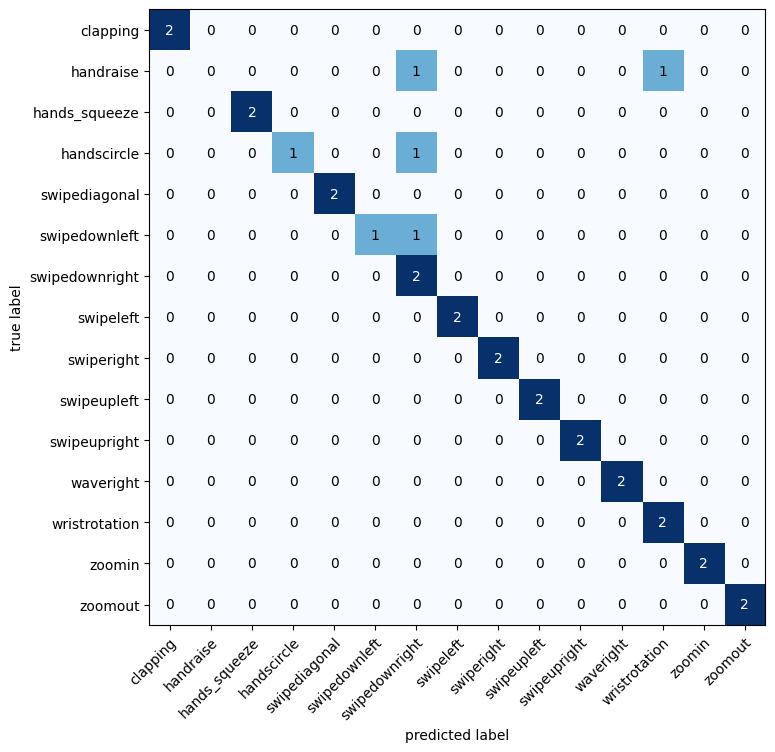

In [ ]:
# evaluation with torchmetrics

# retrieve actual and predicted labels and convert them to tensors for later process
small_model_1_y_true = torch.tensor(small_model_1_results['y_true'])
small_model_1_y_pred = torch.tensor(small_model_1_results['y_preds'])

# setup confusion matrix instance and compare predictions to targets
confmat = ConfusionMatrix(num_classes=len(class_names_small), task='multiclass')
confmat_tensor = confmat(small_model_1_y_pred.clone().detach(), small_model_1_y_true.clone().detach())

# plot the confusion matrix
fig, ax = plot_confusion_matrix(conf_mat=confmat_tensor.numpy(), class_names=class_names_small, figsize=(20,8));

In [ ]:
# calculate precision, recall and F1 scores using torchmetrics
precision = Precision(average='macro', num_classes=len(class_names_small), task='multiclass')
recall = Recall(average='macro', num_classes=len(class_names_small), task='multiclass')
f1 = F1Score(average='macro', num_classes=len(class_names_small), task='multiclass')

prec = precision(small_model_1_y_pred, small_model_1_y_true)
rec = recall(small_model_1_y_pred, small_model_1_y_true)
f1_score = f1(small_model_1_y_pred, small_model_1_y_true)

# print the results
print(f"Precision: {prec:.4f}\nRecall: {rec:.4f}\nF1-Score: {f1_score:.4f}")

Precision: 0.8711
Recall: 0.8667
F1-Score: 0.8470


In [ ]:
# classification report
print("Classification Report:")
print(classification_report(y_true=small_model_1_y_true, y_pred=small_model_1_y_pred, zero_division=1))

Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00         2
           1       1.00      0.00      0.00         2
           2       1.00      1.00      1.00         2
           3       1.00      0.50      0.67         2
           4       1.00      1.00      1.00         2
           5       1.00      0.50      0.67         2
           6       0.40      1.00      0.57         2
           7       1.00      1.00      1.00         2
           8       1.00      1.00      1.00         2
           9       1.00      1.00      1.00         2
          10       1.00      1.00      1.00         2
          11       1.00      1.00      1.00         2
          12       0.67      1.00      0.80         2
          13       1.00      1.00      1.00         2
          14       1.00      1.00      1.00         2

    accuracy                           0.87        30
   macro avg       0.94      0.87      0.85        30
wei

In most cases, we achieve perfect results, except for the 'handraise' class, where the model completely fails. Additionally, the remaining two misclassifications occur between similar classes, causing recall to be slightly lower than precision.


Experiment 6. Apply Cross-Validation.

We apply cross-validation method on the combined dataset coming from the train and validation datasets.

In [ ]:
# experiment 6: cross validation (1)

# combine train and validation sets

# define paths
source_dirs_small = ['/content/project/data/small_dataset/train', '/content/project/data/small_dataset/validation']
destination_dir_small = '/content/project/data/small_dataset/train_val_combined'

# create the destination directory if it doesn't exist
if not os.path.exists(destination_dir_small):
  os.makedirs(destination_dir_small)

# loop over all source dirs (train, validation) in ResActionsImagesM
for source_dir in source_dirs_small:
  # loop over all class dirs
  for class_dir in os.listdir(source_dir):

    # existing class path, we will use it for copying
    class_path = os.path.join(source_dir, class_dir)

    # create class dir in destination dir if doesn't exist (this goes in case of multiple runs)
    dest_class_path = os.path.join(destination_dir_small, class_dir)
    if not os.path.exists(dest_class_path):
      os.makedirs(dest_class_path)

    # copy all files (images) from the current class of the current source
    for file in os.listdir(class_path):
      shutil.copy(os.path.join(class_path, file), os.path.join(dest_class_path, file))

# check how many dirs in the new dir (expected num_classes=11)
print(f"Total number of folders of the new dir: {len(os.listdir(destination_dir_small))}")

# find and print how many images in total the new 'train_val_combined' dir has (expected the sum of initial train and validation dirs: 1201 + 150 = 1351)
train_val_total_images_small = 0
for class_dir in os.listdir(destination_dir_small):
  class_path = os.path.join(destination_dir_small, class_dir)
  train_val_total_images_small += len(os.listdir(class_path))
print(f"Total number of images of the new dir: {train_val_total_images_small}") # check on the left side of Colab

Total number of folders of the new dir: 15
Total number of images of the new dir: 270


In [ ]:
# experiment 6: cross validation (2)

# create the new dataset using ImageFolder
small_cross_val_dataset = ImageFolder(root=destination_dir_small, transform=data_transform_small)

# retrieve best pre-trained weights from model_1
small_model_1_weights = small_model_1.state_dict()

# run the experiment
small_cv_results = cross_validation(dataset=small_cross_val_dataset,
                                    num_epochs=num_epochs,
                                    device=device,
                                    num_classes=num_classes_small,
                                    num_folds=num_folds,
                                    best_config=small_best_config,
                                    num_workers=num_workers,
                                    load_weights=True,
                                    best_weights=small_model_1_weights)

Cross-Validation training ...
Dataset size: 270
Number of folds: 6
Fold size: 45

Fold 1/6
Loading best weights ...


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.5467 | train_acc: 0.8086 | val_loss: 0.0726 | val_acc: 0.9844
Epoch: 2 | train_loss: 0.6384 | train_acc: 0.7383 | val_loss: 0.0689 | val_acc: 0.9844
Epoch: 3 | train_loss: 0.5127 | train_acc: 0.8281 | val_loss: 0.0662 | val_acc: 1.0000
Epoch: 4 | train_loss: 0.4304 | train_acc: 0.8516 | val_loss: 0.0600 | val_acc: 1.0000
Epoch: 5 | train_loss: 0.4293 | train_acc: 0.8516 | val_loss: 0.0876 | val_acc: 0.9231
Epoch: 6 | train_loss: 0.4833 | train_acc: 0.8438 | val_loss: 0.0881 | val_acc: 0.9844
Epoch: 7 | train_loss: 0.4983 | train_acc: 0.8008 | val_loss: 0.1067 | val_acc: 0.9844
Epoch: 8 | train_loss: 0.5217 | train_acc: 0.8516 | val_loss: 0.1060 | val_acc: 0.9844
Epoch: 9 | train_loss: 0.5265 | train_acc: 0.8281 | val_loss: 0.1592 | val_acc: 0.8846
Epoch: 10 | train_loss: 0.4869 | train_acc: 0.8633 | val_loss: 0.1361 | val_acc: 0.9231
Epoch: 11 | train_loss: 0.4403 | train_acc: 0.8555 | val_loss: 0.0916 | val_acc: 0.9844
Epoch: 12 | train_loss: 0.5237 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.5088 | train_acc: 0.8242 | val_loss: 0.1624 | val_acc: 0.9844
Epoch: 2 | train_loss: 0.5458 | train_acc: 0.8438 | val_loss: 0.1668 | val_acc: 0.9688
Epoch: 3 | train_loss: 0.5347 | train_acc: 0.8359 | val_loss: 0.1532 | val_acc: 0.9459
Epoch: 4 | train_loss: 1.0589 | train_acc: 0.7148 | val_loss: 0.1719 | val_acc: 0.9303
Epoch: 5 | train_loss: 0.5205 | train_acc: 0.8086 | val_loss: 0.1841 | val_acc: 0.9531
Epoch: 6 | train_loss: 0.4706 | train_acc: 0.8398 | val_loss: 0.1510 | val_acc: 0.9688
Epoch: 7 | train_loss: 0.3028 | train_acc: 0.8867 | val_loss: 0.1386 | val_acc: 0.9844
Epoch: 8 | train_loss: 0.4462 | train_acc: 0.8672 | val_loss: 0.1376 | val_acc: 0.9688
Epoch: 9 | train_loss: 0.4185 | train_acc: 0.8711 | val_loss: 0.1597 | val_acc: 0.9844
Epoch: 10 | train_loss: 0.4713 | train_acc: 0.8633 | val_loss: 0.1716 | val_acc: 0.9844
Epoch: 11 | train_loss: 0.6478 | train_acc: 0.7266 | val_loss: 0.2056 | val_acc: 0.9688
Epoch: 12 | train_loss: 0.4863 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.7158 | train_acc: 0.7656 | val_loss: 0.1390 | val_acc: 0.9688
Epoch: 2 | train_loss: 0.4903 | train_acc: 0.8438 | val_loss: 0.1711 | val_acc: 0.9688
Epoch: 3 | train_loss: 0.5323 | train_acc: 0.8047 | val_loss: 0.1644 | val_acc: 0.9688
Epoch: 4 | train_loss: 0.4294 | train_acc: 0.8359 | val_loss: 0.1542 | val_acc: 0.9688
Epoch: 5 | train_loss: 0.4688 | train_acc: 0.8438 | val_loss: 0.1311 | val_acc: 0.9688
Epoch: 6 | train_loss: 0.5113 | train_acc: 0.8438 | val_loss: 0.1230 | val_acc: 0.9688
Epoch: 7 | train_loss: 0.4853 | train_acc: 0.8203 | val_loss: 0.1266 | val_acc: 0.9688
Epoch: 8 | train_loss: 0.4156 | train_acc: 0.8477 | val_loss: 0.1241 | val_acc: 0.9688
Epoch: 9 | train_loss: 0.9969 | train_acc: 0.7109 | val_loss: 0.1295 | val_acc: 0.9844
Epoch: 10 | train_loss: 0.4973 | train_acc: 0.8047 | val_loss: 0.1511 | val_acc: 0.9688
Epoch: 11 | train_loss: 0.4971 | train_acc: 0.7969 | val_loss: 0.1395 | val_acc: 0.9688
Epoch: 12 | train_loss: 0.4575 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.5510 | train_acc: 0.8125 | val_loss: 0.2376 | val_acc: 0.8918
Epoch: 2 | train_loss: 0.6820 | train_acc: 0.8008 | val_loss: 0.2650 | val_acc: 0.8918
Epoch: 3 | train_loss: 0.6420 | train_acc: 0.7109 | val_loss: 0.2431 | val_acc: 0.9075
Epoch: 4 | train_loss: 0.5942 | train_acc: 0.7969 | val_loss: 0.2587 | val_acc: 0.9075
Epoch: 5 | train_loss: 0.5087 | train_acc: 0.8320 | val_loss: 0.2960 | val_acc: 0.8762
Epoch: 6 | train_loss: 0.5698 | train_acc: 0.8242 | val_loss: 0.2729 | val_acc: 0.8762
Epoch: 7 | train_loss: 0.4046 | train_acc: 0.8594 | val_loss: 0.2495 | val_acc: 0.9459
Epoch: 8 | train_loss: 0.4076 | train_acc: 0.8711 | val_loss: 0.2438 | val_acc: 0.9075
Epoch: 9 | train_loss: 0.4927 | train_acc: 0.8789 | val_loss: 0.2644 | val_acc: 0.9075
Epoch: 10 | train_loss: 0.4409 | train_acc: 0.8633 | val_loss: 0.2438 | val_acc: 0.9075
Epoch: 11 | train_loss: 0.5255 | train_acc: 0.8320 | val_loss: 0.2420 | val_acc: 0.8918
Epoch: 12 | train_loss: 0.4023 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.5406 | train_acc: 0.8398 | val_loss: 0.2032 | val_acc: 0.9147
Epoch: 2 | train_loss: 0.5694 | train_acc: 0.7969 | val_loss: 0.1660 | val_acc: 0.9688
Epoch: 3 | train_loss: 0.8702 | train_acc: 0.7227 | val_loss: 0.1531 | val_acc: 0.9688
Epoch: 4 | train_loss: 0.4775 | train_acc: 0.8555 | val_loss: 0.1289 | val_acc: 0.9688
Epoch: 5 | train_loss: 0.4501 | train_acc: 0.8359 | val_loss: 0.1153 | val_acc: 0.9844
Epoch: 6 | train_loss: 1.0240 | train_acc: 0.6914 | val_loss: 0.1208 | val_acc: 1.0000
Epoch: 7 | train_loss: 0.4284 | train_acc: 0.8672 | val_loss: 0.1552 | val_acc: 0.9688
Epoch: 8 | train_loss: 0.5698 | train_acc: 0.7109 | val_loss: 0.1567 | val_acc: 0.9688
Epoch: 9 | train_loss: 0.4281 | train_acc: 0.8320 | val_loss: 0.1512 | val_acc: 0.9844
Epoch: 10 | train_loss: 0.4659 | train_acc: 0.8398 | val_loss: 0.1493 | val_acc: 0.9147
Epoch: 11 | train_loss: 0.4803 | train_acc: 0.8359 | val_loss: 0.1432 | val_acc: 0.9615
Epoch: 12 | train_loss: 0.4258 | train_ac

  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.5737 | train_acc: 0.8164 | val_loss: 0.3796 | val_acc: 0.8990
Epoch: 2 | train_loss: 0.6878 | train_acc: 0.8047 | val_loss: 0.5288 | val_acc: 0.8377
Epoch: 3 | train_loss: 0.5147 | train_acc: 0.7305 | val_loss: 0.6255 | val_acc: 0.8606
Epoch: 4 | train_loss: 0.7918 | train_acc: 0.7188 | val_loss: 0.6370 | val_acc: 0.8606
Epoch: 5 | train_loss: 0.4969 | train_acc: 0.8672 | val_loss: 0.5985 | val_acc: 0.8293
Epoch: 6 | train_loss: 0.9416 | train_acc: 0.7109 | val_loss: 0.6125 | val_acc: 0.8606
Epoch: 7 | train_loss: 0.4652 | train_acc: 0.8672 | val_loss: 0.5664 | val_acc: 0.8606
Epoch: 8 | train_loss: 0.4391 | train_acc: 0.8398 | val_loss: 0.6228 | val_acc: 0.8450
Epoch: 9 | train_loss: 0.4912 | train_acc: 0.8359 | val_loss: 0.4723 | val_acc: 0.8293
Epoch: 10 | train_loss: 0.4866 | train_acc: 0.8750 | val_loss: 0.3480 | val_acc: 0.8678
Epoch: 11 | train_loss: 0.3958 | train_acc: 0.8398 | val_loss: 0.3780 | val_acc: 0.8834
Epoch: 12 | train_loss: 0.4475 | train_ac

In [ ]:
# retrieve all val accuracies in desc order from results dictionary along with their corresponding model's weights
small_results_df = get_sorted_cv_results(small_cv_results)

   Fold  Validation Accuracy  \
2     3             0.953125   
0     1             0.945913   
4     5             0.945913   
1     2             0.899038   
3     4             0.891827   
5     6             0.844952   

                                       Model Weights  
2  {'block1.0.weight': [[tensor([[ 0.1419,  0.123...  
0  {'block1.0.weight': [[tensor([[ 0.1496,  0.132...  
4  {'block1.0.weight': [[tensor([[ 0.1256,  0.103...  
1  {'block1.0.weight': [[tensor([[ 0.1308,  0.115...  
3  {'block1.0.weight': [[tensor([[ 0.1328,  0.108...  
5  {'block1.0.weight': [[tensor([[ 0.1684,  0.137...  


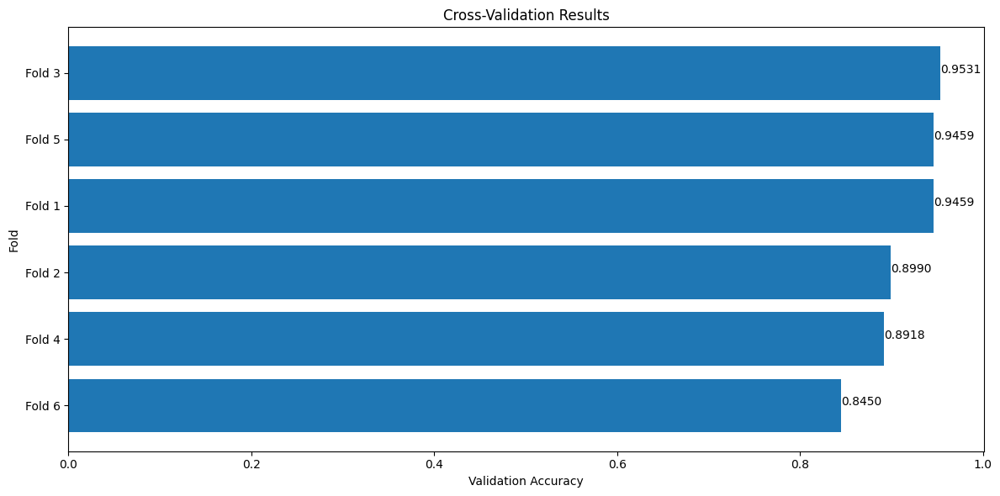

In [ ]:
# plot each fold results after cross-validation experiment
plot_cv_results(small_results_df)

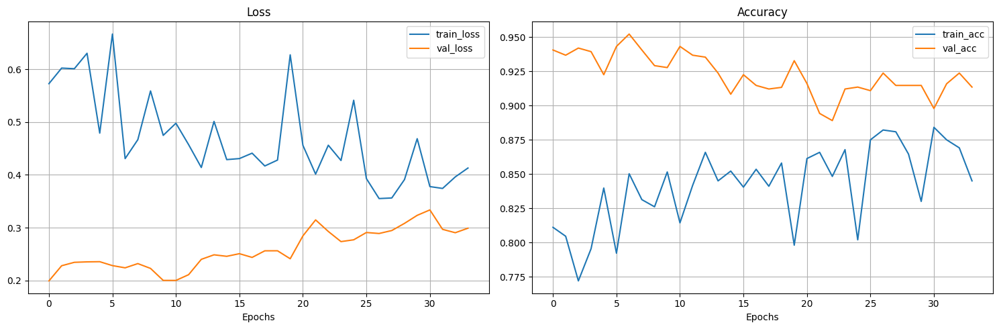

In [ ]:
# comptute and plot average cv results
small_cv_avg_results = compute_avg_cv_results(small_cv_results)

# plot the averaged learning curves
plot_loss_curves(small_cv_avg_results)

All results indicate that there is no fear form overfitting, with confidence in getting very descent validation accuracies for model_1.

In [ ]:
# retrieve best performing fold's weights
best_small_cv_model_weights = small_results_df.iloc[0]['Model Weights']

# retrieve best performing fold number
small_best_fold = small_results_df.iloc[0]['Fold']

# retrieve the corresponding results from cross validation experiment for the best case
small_best_fold_index = max(small_best_fold - 1, 0)
small_model_2_results = small_cv_results[small_best_fold_index]

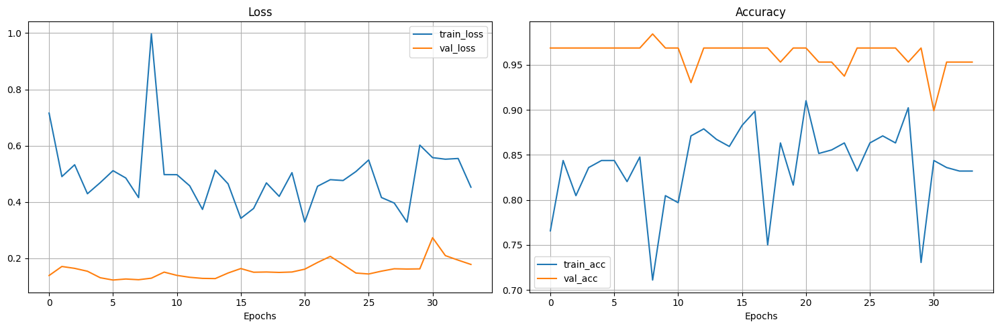

In [ ]:
# plot the curves of the model with best config
plot_loss_curves(small_model_2_results)

In [ ]:
# before loading best weights, need to create a new instance
small_model_2 = CNN_v2(out_features=num_classes_small, hidden_units=small_best_hidden_units, dropout_probs=small_best_dropout_probs, activation_functions=small_best_activation_functions).to(device)

# now, load best weights
small_model_2.load_state_dict(best_small_cv_model_weights)

# print final model's val accuracy
small_model_2_acc = small_model_2_results['val_acc'][-1]
print(f"Final model accuracy: {small_model_2_acc}")

# save the model
torch.save(small_model_2.state_dict(), os.path.join(project_models_path, 'small_model_2.pth'))
print("Model saved to 'small_model_2.pth'")

Final model accuracy: 0.953125
Model saved to 'small_model_2.pth'


Experiment 7. Apply data augmentation.

Since the small dataset is balanced (with 20 images per class), we proceed directly to the final experiment. In this stage, we apply data augmentation using the TrivialAugment configuration like the way we did it above. This will be implemented on the best-performing model for the small dataset identified so far.

In [ ]:
# experiment 7: data augmentation (with early stopping enabled)

# create a new instance of the model for data augmentation
small_model_3 = CNN_v2(out_features=num_classes_small, hidden_units=small_best_hidden_units, dropout_probs=small_best_dropout_probs, activation_functions=small_best_activation_functions).to(device)

# load weights of the model_1
small_model_3.load_state_dict(small_model_1.state_dict()) # (model_1)

# load best performing model (weights) so far
#small_model_3.load_state_dict(small_model_2.state_dict()) (model_2)

# start training with data augmentation
small_model_3_results = experiment_data_augmentation(model=small_model_3,
                                                     train_dir=small_dataset_path/'train',
                                                     val_dataloader=val_dataloader_small,
                                                     num_epochs=num_epochs,
                                                     device=device,
                                                     best_config=small_best_config,
                                                     class_weights=None, # as small dataset is balanced, we have no class_weights
                                                     num_workers=num_workers,
                                                     mean=mean_small,
                                                     std=std_small,
                                                     is_Trivial=True)

Experimenting with Data Augmentation


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 6.3015 | train_acc: 0.4062 | val_loss: 0.4327 | val_acc: 0.8333
Epoch: 2 | train_loss: 3.2612 | train_acc: 0.3672 | val_loss: 0.5194 | val_acc: 0.8333
Epoch: 3 | train_loss: 2.6090 | train_acc: 0.3398 | val_loss: 0.6557 | val_acc: 0.8000
Epoch: 4 | train_loss: 2.4580 | train_acc: 0.3945 | val_loss: 0.7378 | val_acc: 0.7667
Epoch: 5 | train_loss: 2.3178 | train_acc: 0.3594 | val_loss: 0.7240 | val_acc: 0.7667
Epoch: 6 | train_loss: 2.1616 | train_acc: 0.3633 | val_loss: 0.6788 | val_acc: 0.8667
Epoch: 7 | train_loss: 1.8909 | train_acc: 0.4570 | val_loss: 0.6784 | val_acc: 0.8667
Epoch: 8 | train_loss: 1.9286 | train_acc: 0.4297 | val_loss: 0.6487 | val_acc: 0.8667
Epoch: 9 | train_loss: 1.8844 | train_acc: 0.4219 | val_loss: 0.6587 | val_acc: 0.8667
Epoch: 10 | train_loss: 1.8580 | train_acc: 0.4492 | val_loss: 0.5947 | val_acc: 0.8667
Epoch: 11 | train_loss: 1.9093 | train_acc: 0.4922 | val_loss: 0.5575 | val_acc: 0.9000
Epoch: 12 | train_loss: 2.0200 | train_ac

In [ ]:
# print best epoch and its corresponding val accuracy
small_best_epoch_aug, small_best_val_acc_aug = print_best_epoch_and_val_acc(small_model_3_results)

Best epoch: 12
Best validation accuracy: 0.9333


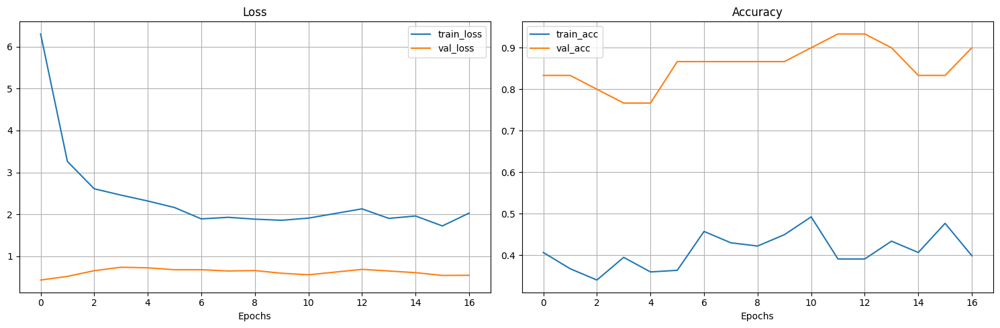

In [ ]:
# plot the results curves after data augmentation experiment
plot_loss_curves(small_model_3_results)

We observe a much better performance than the one we get from model_1 and this will be our final choice for this small dataset.

In [ ]:
# print final model's val accuracy
small_model_3_acc = small_best_val_acc_aug
print(f"Final model accuracy: {small_model_3_acc}")

# save the model
torch.save(small_model_3.state_dict(), os.path.join(project_models_path, 'small_model_3.pth'))
print("Model saved to 'small_model_3.pth'")

Final model accuracy: 0.9333333333333333
Model saved to 'small_model_3.pth'


We do not also take into account the model_2 in our scenario.


Model small_model_1: 0.86666667
Model small_model_2: 0.95312500
Model small_model_3: 0.93333333


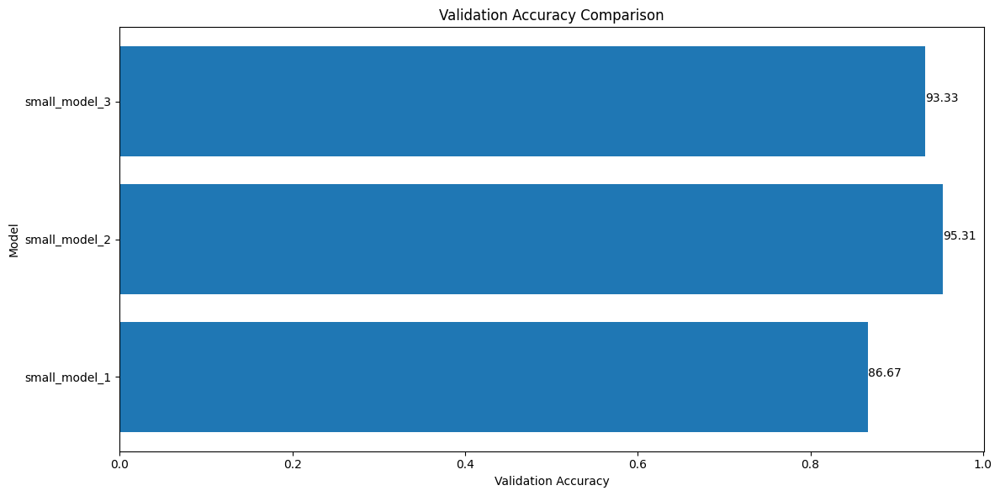

In [ ]:
# create a dataframe for comparison
compare_accs_small = pd.DataFrame({'Model': ['small_model_1', 'small_model_2', 'small_model_3'], 'Validation Accuracy': [small_model_1_acc, small_model_2_acc, small_model_3_acc]})

# print and plot test accuracies for all models of small dataset
print_and_plot_models_accuracies(compare_accs_small)

In [ ]:
# drop model_2 as we only use cross validation to evaluate model_1
compare_accs_small = compare_accs_small.drop(1)

In [ ]:
# save the best performing model for small dataset
best_models_dict = store_best_model(compare_accs_small, 'small / small', best_models_dict)

# print the dictionary
print("Best models dictionary:")
print(best_models_dict)
print()

# retrieve best performing model for the small dataset
small_best_model = f"{best_models_dict['small / small']['Model']}.pth"
#print(small_best_model)

# initiate a model instance
small_final_model = CNN_v2(out_features=num_classes_small, hidden_units=small_best_hidden_units, dropout_probs=small_best_dropout_probs, activation_functions=small_best_activation_functions).to(device)

# load best weights
small_final_model.load_state_dict(torch.load(os.path.join(project_models_path, small_best_model)))

# put it on device
small_final_model = small_final_model.to(device)

# and evaluate on test set
small_test_results = eval_model(model=small_final_model,
                                dataloader=test_dataloader_small,
                                loss_fn=nn.CrossEntropyLoss(),
                                device=device)
print(f"Test accuracy for {small_best_model}: {small_test_results['test_acc']:.4f}")

# save the test results to the dictionary
final_test_accuracies_dict['small / small'] = small_test_results['test_acc']

Best models dictionary:
{'M / M': {'Model': 'MM_model_4', 'Validation Accuracy': 0.9039772727272727}, 'R / R': {'Model': 'RR_model_3', 'Validation Accuracy': 0.8852272727272726}, 'L / L': {'Model': 'LL_model_4', 'Validation Accuracy': 0.8818181818181818}, 'MR / L': {'Model': 'MR_model_3', 'Validation Accuracy': 0.9748383620689655}, 'ML / R': {'Model': 'ML_model_3', 'Validation Accuracy': 0.9796875}, 'RL / M': {'Model': 'RL_model_3', 'Validation Accuracy': 0.9572368421052632}, 'small / small': {'Model': 'small_model_3', 'Validation Accuracy': 0.9333333333333333}}



  0%|          | 0/1 [00:00<?, ?it/s]

Test accuracy for small_model_3.pth: 0.8000


Let's print out all best performing models found above for each dataset, befor trying the transfer learning method.

In [ ]:
# print all test accuracies and best models
print("Final test accuracies:")
for key, value in final_test_accuracies_dict.items():
  print(f"{key}: {value:.4f}")
print()
print("Best models:")
for key, value in best_models_dict.items():
  model_name = value['Model']
  print(f"{key}: {model_name}")

Final test accuracies:
M / M: 0.8639
R / R: 0.8427
L / L: 0.8264
MR / L: 0.8756
ML / R: 0.9136
RL / M: 0.9348
small / small: 0.8000
small / small (transfer): 0.8333

Best models:
M / M: MM_model_4
R / R: RR_model_3
L / L: LL_model_4
MR / L: MR_model_3
ML / R: ML_model_3
RL / M: RL_model_3
small / small: small_model_3


In [ ]:
# find the model with highest test accuracy
best_test_acc = max(final_test_accuracies_dict, key=final_test_accuracies_dict.get)
best_model_name = best_models_dict[best_test_acc]['Model']
print(f"Best model: {best_model_name}")
print(f"Best test accuracy found on {best_test_acc} dataset for the model: {best_model_name}")

# retrieve best model's weights path
best_model_weights_path = os.path.join(project_models_path, f"{best_model_name}.pth")
print(f"Best model weights path: {best_model_weights_path}")

Best model: RL_model_3
Best test accuracy found on RL / M dataset for the model: RL_model_3
Best model weights path: /content/project/models/RL_model_3.pth


### Transfer Learning.

In this final experiment, we will apply on our small dataset the [transfer learning](https://www.geeksforgeeks.org/ml-introduction-to-transfer-learning/) technique, using the best model  found above (in respect of test accuracy). We explore two approaches:

1.   Fine-tuning only the classifier.
2.   Fine-tuning the entire model.

We start by loading the pre-trained model and replace its classifier to match the number of classes in our small dataset. In the first approach, we freeze all layers except the new layer added as classifier, allowing only the classifier to be trained and in the second approach, we leave all layers trainable, enabling full fine-tuning of the model.

Finally, we train the model and evaluate its performance.

Fine-tuning only the classifier.

In [ ]:
# create a new model instance with manually defining the best configuration found above!
pku_model_1 = CNN_v2(out_features=num_classes, hidden_units=RL_best_hidden_units, dropout_probs=RL_best_dropout_probs, activation_functions=RL_best_activation_functions).to(device)

# load pretrained best model found above in respect of test accuracy
pku_model_1.load_state_dict(torch.load(best_model_weights_path))

# move the model to device
pku_model_1 = pku_model_1.to(device)

# print the model
#summary(pku_model_1, input_size=(1, 3, 25, 149)) # (batch_size, channels, height, width)
print(pku_model_1)

CNN_v2(
  (block1): Sequential(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=valid)
    (1): ELU(alpha=1.0)
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Dropout2d(p=0.5, inplace=False)
  )
  (block2): Sequential(
    (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=same)
    (1): ELU(alpha=1.0)
    (2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=valid)
    (3): ELU(alpha=1.0)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Dropout2d(p=0.5, inplace=False)
  )
  (block3): Sequential(
    (0): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=valid)
    (1): ELU(alpha=1.0)
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Dropout2d(p=0.5, inplace=False)
  )
  (classifier): Sequential(
    (0): Flatten(start_dim=1, end_dim=-1)
    (1): Linear(in_features=1024, out_features=128, bias=True)
    (2): S

In [ ]:
# replace the final layer in the classifier
pku_model_1.classifier[4] = nn.Linear(in_features=128, out_features=num_classes_small, bias=True) # change the num_classes_small here to match to the small dataset classes

# freeze all pku_model_1 layers except the classifier
for param in pku_model_1.parameters():
  param.requires_grad = False
for param in pku_model_1.classifier.parameters():
  param.requires_grad = True

# ensure the modified model is on device
pku_model_1 = pku_model_1.to(device)

# define loss function and optimizer
loss_fn = nn.CrossEntropyLoss()
optimizer = small_best_optimizer(params=pku_model_1.parameters(), lr=small_best_learning_rate, weight_decay=small_best_decay_value) # notice here we use bests config for small dataset found above!

# start training
print("Starting training...")
start_time = time.time()
pku_model_1_results = train(model=pku_model_1,
                            train_dataloader=train_dataloader_small,
                            test_dataloader=val_dataloader_small,
                            optimizer=optimizer,
                            loss_fn=loss_fn,
                            epochs=num_epochs,
                            device=device)
end_time = time.time()

# calculate and print total training time
pku_model_1_total_training_time = end_time - start_time
print(f"\nTotal training time: {pku_model_1_total_training_time:.3f} seconds")

# calculate and print total trainabla params
pku_model_1_total_params = sum(p.numel() for p in pku_model_1.parameters())
print(f"Total number of trainable parameters: {pku_model_1_total_params}")

Starting training...


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 4.6068 | train_acc: 0.0898 | val_loss: 2.7695 | val_acc: 0.0333
Epoch: 2 | train_loss: 3.6795 | train_acc: 0.1016 | val_loss: 2.3738 | val_acc: 0.2000
Epoch: 3 | train_loss: 3.1627 | train_acc: 0.1680 | val_loss: 2.1203 | val_acc: 0.3333
Epoch: 4 | train_loss: 2.7048 | train_acc: 0.1992 | val_loss: 1.9629 | val_acc: 0.4333
Epoch: 5 | train_loss: 2.6888 | train_acc: 0.1836 | val_loss: 1.8387 | val_acc: 0.4333
Epoch: 6 | train_loss: 2.3737 | train_acc: 0.2500 | val_loss: 1.7350 | val_acc: 0.5000
Epoch: 7 | train_loss: 2.3441 | train_acc: 0.2734 | val_loss: 1.6712 | val_acc: 0.5000
Epoch: 8 | train_loss: 2.1320 | train_acc: 0.2812 | val_loss: 1.6117 | val_acc: 0.5333
Epoch: 9 | train_loss: 2.0116 | train_acc: 0.4141 | val_loss: 1.5587 | val_acc: 0.6000
Epoch: 10 | train_loss: 1.9548 | train_acc: 0.3398 | val_loss: 1.5072 | val_acc: 0.6000
Epoch: 11 | train_loss: 2.0294 | train_acc: 0.3867 | val_loss: 1.4513 | val_acc: 0.5667
Epoch: 12 | train_loss: 1.8660 | train_ac

In [ ]:
# print final val acc of pku_model_1
pku_model_1_acc = pku_model_1_results['val_acc'][-1]
print(f"Final model accuracy: {pku_model_1_acc}")

Final model accuracy: 0.7


Fine-tuning the entire pre-trained model.

In [ ]:
# create a new model instance with manually defining the best configuration found above!
pku_model_2 = CNN_v2(out_features=num_classes, hidden_units=RL_best_hidden_units, dropout_probs=RL_best_dropout_probs, activation_functions=RL_best_activation_functions).to(device)

# load pretrained best model found above in respect of test accuracy
pku_model_2.load_state_dict(torch.load(best_model_weights_path))

# replace the classifier
pku_model_2.classifier[4] = nn.Linear(in_features=128, out_features=num_classes_small, bias=True)

# ensure the model is on device
pku_model_2 = pku_model_2.to(device)

# set the new optimizer
optimizer = small_best_optimizer(params=pku_model_2.parameters(), lr=small_best_learning_rate, weight_decay=small_best_decay_value) # notice here we use bests config for small dataset found above!

# start training
print("Starting training...")
start_time = time.time()
pku_model_2_results = train(model=pku_model_2,
                            train_dataloader=train_dataloader_small,
                            test_dataloader=val_dataloader_small,
                            optimizer=optimizer,
                            loss_fn=loss_fn,
                            epochs=num_epochs,
                            device=device)
end_time = time.time()

# calculate and print total training time
pku_model_2_total_training_time = end_time - start_time
print(f"\nTotal training time: {pku_model_2_total_training_time:.3f} seconds")

# calculate and print total trainabla params
pku_model_2_total_params = sum(p.numel() for p in pku_model_2.parameters())
print(f"Total number of trainable parameters: {pku_model_2_total_params}")

Starting training...


  0%|          | 0/34 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 5.2093 | train_acc: 0.0586 | val_loss: 2.7392 | val_acc: 0.1000
Epoch: 2 | train_loss: 3.2487 | train_acc: 0.0938 | val_loss: 2.4803 | val_acc: 0.3000
Epoch: 3 | train_loss: 2.9707 | train_acc: 0.1484 | val_loss: 2.4030 | val_acc: 0.3333
Epoch: 4 | train_loss: 2.6601 | train_acc: 0.1719 | val_loss: 2.4250 | val_acc: 0.3667
Epoch: 5 | train_loss: 2.6790 | train_acc: 0.1328 | val_loss: 2.3891 | val_acc: 0.4000
Epoch: 6 | train_loss: 2.4812 | train_acc: 0.2070 | val_loss: 2.3016 | val_acc: 0.3667
Epoch: 7 | train_loss: 2.4219 | train_acc: 0.1836 | val_loss: 2.1808 | val_acc: 0.4333
Epoch: 8 | train_loss: 2.3735 | train_acc: 0.2305 | val_loss: 2.0733 | val_acc: 0.4667
Epoch: 9 | train_loss: 2.2975 | train_acc: 0.2852 | val_loss: 1.9832 | val_acc: 0.5333
Epoch: 10 | train_loss: 2.1876 | train_acc: 0.3242 | val_loss: 1.8325 | val_acc: 0.5333
Epoch: 11 | train_loss: 2.1119 | train_acc: 0.3320 | val_loss: 1.6915 | val_acc: 0.5667
Epoch: 12 | train_loss: 2.0273 | train_ac

In [ ]:
# print final pku_model_2 val acc
pku_model_2_acc = pku_model_2_results['val_acc'][-1]
print(f"Final model accuracy: {pku_model_2_acc}")

Final model accuracy: 0.8666666666666667


Fine-tuning the entire model, we gete better performance, as is reasonable, so we keep this setup and evaluate on our test set.

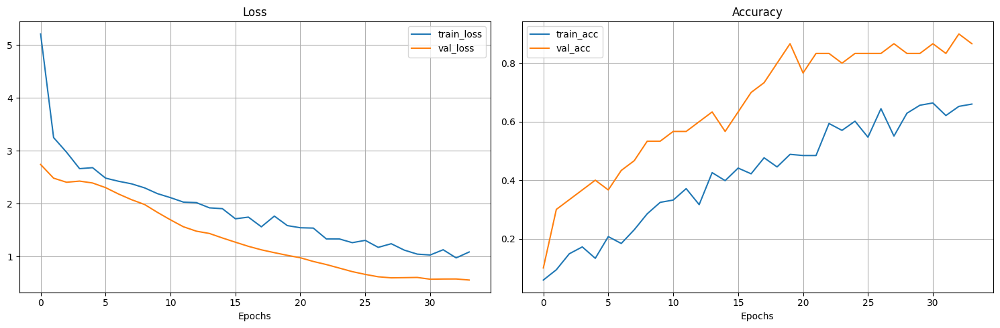

In [ ]:
# let's plot the learning curves
plot_loss_curves(pku_model_2_results)

Leaarning curves confirm that no overfitting exists along with very descent validation accuracy achieved. Let's take a final look at the precision, recal annd the confusion matrix for this case.

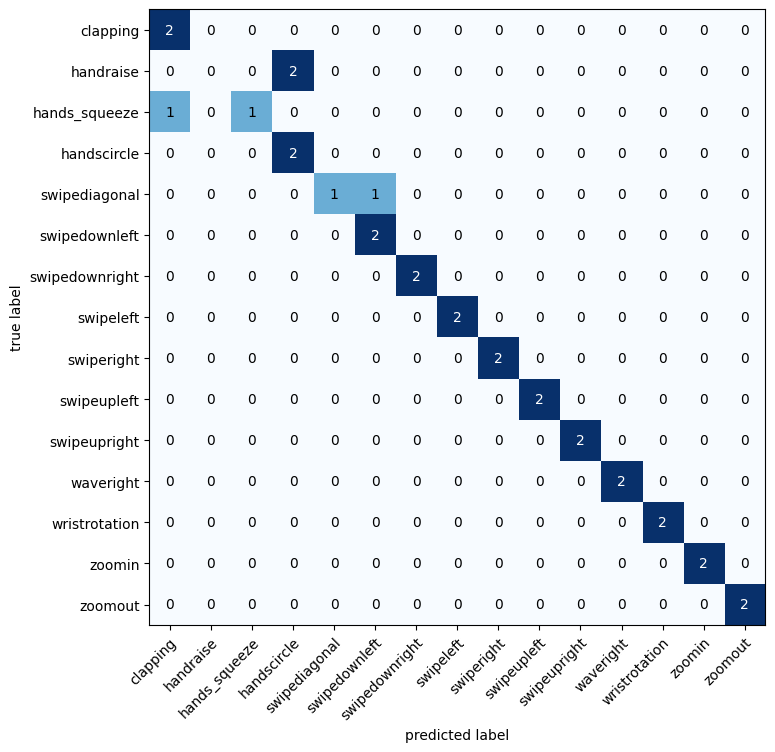

In [ ]:
# evaluation with torchmetrics

# retrieve actual and predicted labels and convert them to tensors for later process
pku_model_2_y_true = torch.tensor(pku_model_2_results['y_true'])
pku_model_2_y_pred = torch.tensor(pku_model_2_results['y_preds'])

# setup confusion matrix instance and compare predictions to targets
confmat = ConfusionMatrix(num_classes=len(class_names_small), task='multiclass')
confmat_tensor = confmat(pku_model_2_y_pred.clone().detach(), pku_model_2_y_true.clone().detach())

# plot the confusion matrix
fig, ax = plot_confusion_matrix(conf_mat=confmat_tensor.numpy(), class_names=class_names_small, figsize=(20,8));

In [ ]:
# calculate precision, recall and F1 scores using torchmetrics
precision = Precision(average='macro', num_classes=len(class_names_small), task='multiclass')
recall = Recall(average='macro', num_classes=len(class_names_small), task='multiclass')
f1 = F1Score(average='macro', num_classes=len(class_names_small), task='multiclass')

prec = precision(pku_model_2_y_pred, pku_model_2_y_true)
rec = recall(pku_model_2_y_pred, pku_model_2_y_true)
f1_score = f1(pku_model_2_y_pred, pku_model_2_y_true)

# print the results
print(f"Precision: {prec:.4f}\nRecall: {rec:.4f}\nF1-Score: {f1_score:.4f}")

Precision: 0.8556
Recall: 0.8667
F1-Score: 0.8400


In [ ]:
# classification report
print("Classification Report:")
print(classification_report(y_true=pku_model_2_y_true, y_pred=pku_model_2_y_pred, zero_division=1))

Classification Report:
              precision    recall  f1-score   support

           0       0.67      1.00      0.80         2
           1       1.00      0.00      0.00         2
           2       1.00      0.50      0.67         2
           3       0.50      1.00      0.67         2
           4       1.00      0.50      0.67         2
           5       0.67      1.00      0.80         2
           6       1.00      1.00      1.00         2
           7       1.00      1.00      1.00         2
           8       1.00      1.00      1.00         2
           9       1.00      1.00      1.00         2
          10       1.00      1.00      1.00         2
          11       1.00      1.00      1.00         2
          12       1.00      1.00      1.00         2
          13       1.00      1.00      1.00         2
          14       1.00      1.00      1.00         2

    accuracy                           0.87        30
   macro avg       0.92      0.87      0.84        30
wei

We achieve pretty descent results, with precision and recall values very close. The 'handraise' class, again, cannot be detected from the model and, possibly, additional steps should be taken.

In [ ]:
# evaluate on test set
pku_model_2_test_results = eval_model(model=pku_model_2,
                                      dataloader=test_dataloader_small,
                                      loss_fn=nn.CrossEntropyLoss(),
                                      device=device)
print(f"Best test accuracy achieved with transfer learning: {pku_model_2_test_results['test_acc']:.4f}")

# save the test results to the dictionary
final_test_accuracies_dict['small / small (transfer)'] = pku_model_2_test_results['test_acc']

  0%|          | 0/1 [00:00<?, ?it/s]

Best test accuracy achieved with transfer learning: 0.8333


Evaluating the transfer learning model on the test set, we get a better accuracy compared to our custom CNN, an expected outcome since we used pre-trained weights from a larger dataset.

Also, note the increased training time in both cases of transfer learning. This is due to the presence of more classes, leading to additional trainable parameters, both of which are evident above.

In [ ]:
# save the model to the dir
torch.save(pku_model_2.state_dict(), os.path.join(project_models_path, 'pku_model_2.pth'))
print("Model saved to 'pku_model_2.pth'")

Model saved to 'pku_model_2.pth'


## Save the results.

All the results obtained above have been printed below and saved into ```.csv``` files.

In [ ]:
# print all final test accuracies for all datasets
print("Final test accuracies:")
for key, value in final_test_accuracies_dict.items():
  print(f"{key}: {value:.4f}")

# save best_models_dict to csv
with open(os.path.join(project_results_path, 'best_models_dict.csv'), 'w', newline='') as f:
  writer = csv.writer(f)

  # write header
  writer.writerow(['Dataset', 'Model', 'Validation Accuracy'])

  # write data
  for key, value in best_models_dict.items():
    writer.writerow([key, value['Model'], value['Validation Accuracy']])

# save final_test_accuracies to csv
with open(os.path.join(project_results_path, 'final_test_accuracies.csv'), 'w', newline='') as f:
  writer = csv.writer(f)

  # write header
  writer.writerow(['Dataset', 'Test Accuracy'])

  # write data
  for key, value in final_test_accuracies_dict.items():
    writer.writerow([key, value])

print("Results saved to csv files.")

Final test accuracies:
M / M: 0.8639
R / R: 0.8427
L / L: 0.8264
MR / L: 0.8756
ML / R: 0.9136
RL / M: 0.9348
small / small: 0.8000
small / small (transfer): 0.8333
Results saved to csv files.


In [ ]:
# accuracies %
final_test_accuracies_percent_dict = {key: value * 100 for key, value in final_test_accuracies_dict.items()}

# print("Final Test Accuracies (%)")
for key, value in final_test_accuracies_percent_dict.items():
    print(f"| {key} | {value:.2f} |")

| M / M | 86.39 |
| R / R | 84.27 |
| L / L | 82.64 |
| MR / L | 87.56 |
| ML / R | 91.36 |
| RL / M | 93.48 |
| small / small | 80.00 |
| small / small (transfer) | 83.33 |


Conclusion.

This notebook covered the process of experimenting with various techniques, first to address overfitting, and then to improve the model's performance. In the end, it became quite extensive, and a more modular structure with well-organized ```.py``` files could have optimized the workflow and reduced the notebook's length, especially by simplifying the almost 70-line basic experiments workflow and adopting a modular training approach using parsers for configuration and hyperparameter management. However, we chose a more interactive approach so that we could check results and make adjustments on the fly across all datasets. This allowed us to quickly iterate and refine our experiments in real-time (a modular design would be ideal for long-term maintenance and scalability).The table below summarizes the final results.

In our work, we have chosen the simplest and traditional way to experimentation. Rather than relying on the latest AutoML tools to automate model selection and hyperparameter tuning, we iteratively tweak and fine-tune our methods manually, which allows us to understand the process more deeply and make adjustments on the fly.

Along the way, we encountered several key dilemmas that significantly influenced our experimental design. For example, we debated whether to apply data balancing or to use the best fold's weights as the starting point for next experiments. We also asked ourselves on which model configuration to adopt when incorporating data augmentation as a new baseline, and whether early stopping should be applied uniformly across all experiments. Additionally, although both data balancing and data augmentation resulted similar performance improvements, data augmentation produced a more clear separation between the training and validation curves, indicating, in this way, a possible better generalization.

**Future work** should explore a broader range of experiments beyond those discussed above, particularly by dynamically modifying network architectures with adding or removing layers. More interestingly, while convolutional neural networks have consistently proven to be a reliable choice, their performance can be evaluated by quantifying how easily they are fooled by generative adversarial networks (GANs), making it worthwhile to experiment with this approach for deeper insights. Moreover, exploring emerging architectures like vision transformers and agentic vision models could set another round of experiments with, probably, even better solutions that are applicable in real-world scenarios.

| Dataset            | Accuracy (%) |
|--------------------|--------------|
| M / M              |        86.39 |
| R / R              |        84.27 |
| L / L              |        82.64 |
| MR / L             |        87.56 |
| ML / R             |        91.36 |
| RL / M             |        93.48 |
| small / small      |        80.00 |
| small / small (TL) |        83.33 |

## Save and download the project.

Finally, we compress the entire project into a .zip file and download it to Google Drive.

In [ ]:
# zip the entire project dir
!zip -r project.zip project

# define destination path in drive (already connected)
destination_path = '/content/drive/MyDrive/project.zip'

# move zip to drive
!mv project.zip '{destination_path}'
if os.path.exists(destination_path):
  print(f"Saved to Google Drive at {destination_path}")

Streaming output truncated to the last 5000 lines.
  adding: project/data/ResActionsImagesR/train_val_combined/reading/0013_977_action_30.csv.png (stored 0%)
  adding: project/data/ResActionsImagesR/train_val_combined/reading/0101_3390_action_30.csv.png (stored 0%)
  adding: project/data/ResActionsImagesR/train_val_combined/reading/0364_4720_action_30.csv.png (stored 0%)
  adding: project/data/ResActionsImagesR/train_val_combined/reading/0238_4077_action_30.csv.png (stored 0%)
  adding: project/data/ResActionsImagesR/train_val_combined/reading/0293_6515_action_30.csv.png (stored 0%)
  adding: project/data/ResActionsImagesR/train_val_combined/reading/0308_6609_action_30.csv.png (stored 0%)
  adding: project/data/ResActionsImagesR/train_val_combined/reading/0049_5211_action_30.csv.png (stored 0%)
  adding: project/data/ResActionsImagesR/train_val_combined/reading/0122_6883_action_30.csv.png (stored 0%)
  adding: project/data/ResActionsImagesR/train_val_combined/reading/0147_5596_action_3